In [1]:
import numpy as np
from data import data_video, data_deeplabcut, dataset_opto
import analysis
import measures
import partial_procrustes_superimposition as pps
import SSM
import os
import pandas as pd
import matplotlib.pyplot as plt
import math
import matplotlib.cm as cm
import pickle
import seaborn as sb
import project

sb.set()

# from importlib import reload  
# reload(analysis_storchi.measures)

## Create/load project

In [2]:
# project_path = project.create_project(project_path)
project_path = r'E:\dlc\OpenfieldOpto'
cfg = project.load_project(project_path)

In [3]:
dataset = dataset_opto.DatasetOpto(cfg=cfg)

## Choose/calculate reference pose

In [4]:
# Creates folder with possible reference poses. Then fill in the reference pose of choice in the cfg.yaml file.
# Sessions for reference poses
session_dlc, stim_times = dataset.get_session_dlc('CONTROL', 1248, 1)
session_df = session_dlc.df
session_df = session_df[np.all(session_df.xs('likelihood', level=1, axis=1)>0.9, axis=1)]


['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']


c:\users\bramn\anaconda3\envs\analysis\lib\site-packages\pandas\core\generic.py:3936: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [5]:
session_df_transl = pps._translate_to_centroid(session_df, cfg['fit_bodyparts'], cfg['impose_bodyparts'])
session_df_transl_rot = pps._rotate_to_xaxis(session_df_transl, cfg['impose_bodyparts'])

C:\Users\bramn\Documents\Projects\OpenfieldAnalysis\partial_procrustes_superimposition.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[(bodypart, 'x')] -= x_means
C:\Users\bramn\Documents\Projects\OpenfieldAnalysis\partial_procrustes_superimposition.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[(bodypart, 'y')] -= y_means
C:\Users\bramn\Documents\Projects\OpenfieldAnalysis\partial_procrustes_superimposition.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

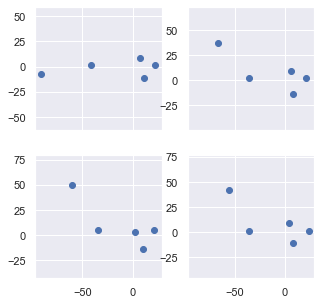

In [6]:
idxs = [500, 1000, 1500, 5000]
fig, axs = plt.subplots(2, 2, figsize=(5, 5), sharex=True)
for i, idx in enumerate(idxs):
    axs[i//2][i%2].scatter(session_df_transl_rot.iloc[idx].xs('x', level=1, axis=0), session_df_transl_rot.iloc[idx].xs('y', level=1, axis=0))
    axs[i//2][i%2].axis('equal')
plt.show()

In [7]:
mean_pose = np.mean(session_df_transl_rot, axis=0)
filename = os.path.join(cfg['project_path'], 'ref_pose.csv')
pd.DataFrame(mean_pose).T.to_csv(filename)

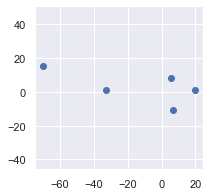

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(3, 3), sharex=True)
ax.scatter(mean_pose.xs('x', level=1, axis=0), mean_pose.xs('y', level=1, axis=0))
ax.axis('equal')
plt.show()

# Preprocess

Previously preprocessed data found in Project.
Already processed: CAMKII_714.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: CAMKII_715.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: CAMKII_722.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: CAMKII_723.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: PV_863.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: PV_864.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: CAMKII_865.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: CAMKII_866.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: NTSR1_904.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: NTSR1_905.0_1.0.csv. To overwrite, set the overwrite parameter to True.
Already processed: CONTROL_906.0_1.0.csv. T

Corners detected
[[110  34]
 [114 413]
 [486 418]
 [497  39]]
Computing background
Background computed
Detecting corners
Corners detected
[[127  33]
 [134 412]
 [506 415]
 [515  34]]
Computing background
Background computed
Detecting corners
Corners detected
[[129  32]
 [134 411]
 [505 416]
 [516  35]]
Computing background
Background computed
Detecting corners
Corners detected
[[128  32]
 [133 410]
 [505 416]
 [516  35]]
Computing background
Background computed
Detecting corners
Corners detected
[[128  32]
 [133 410]
 [505 416]
 [516  35]]
Computing background
Background computed
Detecting corners
Corners detected
[[128  32]
 [133 410]
 [505 416]
 [516  35]]
Computing background
Background computed
Detecting corners
Corners detected
[[128  32]
 [133 410]
 [505 416]
 [516  35]]
Computing background
Background computed
Detecting corners
Corners detected
[[147  28]
 [151 407]
 [523 413]
 [535  31]]
Computing background
Background computed
Detecting corners
Corners detected
[[130  27]
 [13

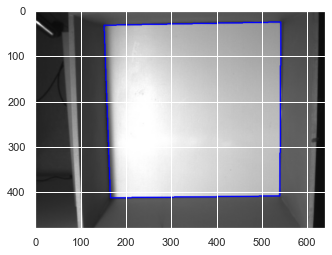

In [4]:
analysis.preprocess_all(cfg, dataset, overwrite=False, detect_boxes=False)

# Calculate measures

In [5]:
analysis.calculate_measures(cfg, dataset)

Previously measures data found in Project.
Loading file CAMKII_714.0_1.0.csv ...
nose x   -48.318395
y    43.571962
Name: 0, dtype: float64
tail_start x   -261.241458
y     37.822083
Name: 0, dtype: float64
dot 14270.750354855929
magn 17174.343821305472
nose x   -48.318395
y    43.571962
Name: 0, dtype: float64
tail_start x   -261.241458
y     37.822083
Name: 0, dtype: float64
(2, 19014)
(19014, 30)
(19014,)
Loading file CAMKII_715.0_1.0.csv ...
nose x    7.896394
y    4.498823
Name: 0, dtype: float64
tail_start x   -233.404486
y     13.353878
Name: 0, dtype: float64
dot -1782.9769759387214
magn 2124.6577626021003
nose x    7.896394
y    4.498823
Name: 0, dtype: float64
tail_start x   -233.404486
y     13.353878
Name: 0, dtype: float64
(2, 8015)
(8015, 30)
(8015,)
Loading file CAMKII_722.0_1.0.csv ...
nose x    3.221012
y    5.954641
Name: 0, dtype: float64
tail_start x   -86.515487
y     9.710213
Name: 0, dtype: float64
dot -220.84663394768478
magn 589.385931670305
nose x    3.221012


(37000, 30)
(37000,)
Loading file CONTROL_1022.0_1.0.csv ...
nose x   -219.999217
y   -348.908390
Name: 0, dtype: float64
tail_start x   -330.309802
y   -186.683358
Name: 0, dtype: float64
dot 137803.2878393578
magn 156499.4332905708
nose x   -219.999217
y   -348.908390
Name: 0, dtype: float64
tail_start x   -330.309802
y   -186.683358
Name: 0, dtype: float64
(2, 37000)
(37000, 30)
(37000,)
Loading file GAD2_1074.0_1.0.csv ...
nose x   -8.040237
y    2.539074
Name: 0, dtype: float64
tail_start x   -60.817193
y     5.616132
Name: 0, dtype: float64
dot 503.2444330665203
magn 514.9695651961757
nose x   -8.040237
y    2.539074
Name: 0, dtype: float64
tail_start x   -60.817193
y     5.616132
Name: 0, dtype: float64
(2, 37000)
(37000, 30)
(37000,)
Loading file GAD2_1075.0_1.0.csv ...
nose x    9.759698
y    3.028249
Name: 0, dtype: float64
tail_start x   -4.666988
y    2.555330
Name: 0, dtype: float64
dot -37.810220535210405
magn 54.37129360900626
nose x    9.759698
y    3.028249
Name: 0, dt

nose x     3.869415
y    13.624562
Name: 0, dtype: float64
tail_start x   -248.878257
y     21.283476
Name: 0, dtype: float64
dot -673.035253582992
magn 3537.8209206956076
nose x     3.869415
y    13.624562
Name: 0, dtype: float64
tail_start x   -248.878257
y     21.283476
Name: 0, dtype: float64
(2, 38000)
(38000, 30)
(38000,)
Loading file CAMKII_1317.0_1.0.csv ...
nose x    4.428140
y    7.314932
Name: 0, dtype: float64
tail_start x   -238.864182
y     15.730880
Name: 0, dtype: float64
dot -942.6537852625179
magn 2046.9109460904417
nose x    4.428140
y    7.314932
Name: 0, dtype: float64
tail_start x   -238.864182
y     15.730880
Name: 0, dtype: float64
(2, 38000)
(38000, 30)
(38000,)
Loading file GAD2_1318.0_1.0.csv ...
nose x   -9.855884
y    5.487024
Name: 0, dtype: float64
tail_start x   -413.470710
y     19.078547
Name: 0, dtype: float64
dot 4179.803969165925
magn 4669.049524665453
nose x   -9.855884
y    5.487024
Name: 0, dtype: float64
tail_start x   -413.470710
y     19.07854

(37000, 30)
(37000,)
nose x     14.053933
y    170.769900
Name: 0, dtype: float64
tail_start x   -86.001152
y    91.671193
Name: 0, dtype: float64
dot 14446.025954705823
magn 21537.879787440317
nose x     14.053933
y    170.769900
Name: 0, dtype: float64
tail_start x   -86.001152
y    91.671193
Name: 0, dtype: float64
(2, 37000)
(37000, 30)
(37000,)
nose x     1.072396
y    27.318757
Name: 0, dtype: float64
tail_start x   -276.229563
y     29.833248
Name: 0, dtype: float64
dot 518.7797498368204
magn 7595.977544317618
nose x     1.072396
y    27.318757
Name: 0, dtype: float64
tail_start x   -276.229563
y     29.833248
Name: 0, dtype: float64
(2, 37000)
(37000, 30)
(37000,)
nose x   -8.040237
y    2.539074
Name: 0, dtype: float64
tail_start x   -60.817193
y     5.616132
Name: 0, dtype: float64
dot 503.2444330665203
magn 514.9695651961757
nose x   -8.040237
y    2.539074
Name: 0, dtype: float64
tail_start x   -60.817193
y     5.616132
Name: 0, dtype: float64
(2, 37000)
(37000, 30)
(37000,

(37000, 30)
(37000,)
nose x   -0.787118
y    7.568704
Name: 0, dtype: float64
tail_start x   -298.083102
y     16.349728
Name: 0, dtype: float64
dot 358.3728867662883
magn 2271.6795761421795
nose x   -0.787118
y    7.568704
Name: 0, dtype: float64
tail_start x   -298.083102
y     16.349728
Name: 0, dtype: float64
(2, 37000)
(37000, 30)
(37000,)
nose x   -113.604883
y   -122.455120
Name: 0, dtype: float64
tail_start x   -194.387991
y     51.866770
Name: 0, dtype: float64
dot 15732.07337667099
magn 33605.92003636605
nose x   -113.604883
y   -122.455120
Name: 0, dtype: float64
tail_start x   -194.387991
y     51.866770
Name: 0, dtype: float64
(2, 37000)
(37000, 30)
(37000,)


# Data analysis

In [4]:
# get all sessions and trial times
df_dict, stim_dict = dataset.get_all_sessions()

No measures file found for PV_1166.0_1.0.csv! Skipping ...
No measures file found for CAMKII_1315.0_1.0.csv! Skipping ...
No measures file found for CAMKII_1315.0_1.0.csv! Skipping ...


In [5]:
from utils import utils

In [17]:
# split in subsecond fragments
df_dict_subsecond = {line: {} for line in df_dict.keys()}
for line, df_dict_line in df_dict.items():
    for (exp, sess), df in df_dict_line.items():
        # Convert df to numpy (only measures)
        df_npy = df['measures'].to_numpy()
        # Do subsecond transformation of np matrix
        df_npy_subsecond = utils.split_data_segments(df_npy, n=10)
        # Store np matrix in new df_dict_subsecond
        df_dict_subsecond[line][(exp, sess)] = df_npy_subsecond

In [ ]:
# Normalize all


In [9]:
# Transform dict of dicts into 1 large dataframe / dataframes per mouseline (or numpy matrices)
def flatten_dict_all(df_dict):
    df_all = []
    start_idx = 0
    dict_meta = {line: {} for line in df_dict.keys()}
    for line, df_dict_line in df_dict.items():
        for (exp, sess), df in df_dict_line.items():
            df_all.append(df)
            stop_idx = start_idx+len(df)
            dict_meta[line][(exp, sess)] = (start_idx, stop_idx)
            start_idx = stop_idx
    return np.concatenate(df_all, axis=0), dict_meta

def inverse_flatten_dict_all(df_combined, df_dict):
    pass

In [12]:
df_all_subsecond, df_all_subsecond_meta = flatten_dict_all(df_dict_subsecond)

# Clustering

In [16]:
import sklearn.cluster

def run_cluster_analysis_MI(matrix, trial_mouselines):
    ssqs = []
    MIs = []
    for k in range(1, 30):
        print(k)
        kmeans = sklearn.cluster.KMeans(n_clusters=k, init='k-means++', max_iter=500)
        kmeans.fit(matrix)
        labels = kmeans.predict(matrix)
        MIs.append(information_analysis(labels, trial_mouselines))

    plt.plot(MIs)
    plt.show()
    
def run_cluster_analysis_SSQ(matrix):
    ssqs = []
    for k in range(1, 30):
        print(k)
        kmeans = sklearn.cluster.KMeans(n_clusters=k, init='k-means++', max_iter=500)
        kmeans.fit(matrix)
        ssqs.append(kmeans.inertia_)

    plt.plot(ssqs)
    plt.show()
    
def run_clustering(matrix, n_clusters=5):
    kmeans = sklearn.cluster.KMeans(n_clusters=n_clusters, init='k-means++', max_iter=10000)
    kmeans.fit(matrix)
    labels = kmeans.predict(matrix)
    return labels


## Fit SSM model

In [431]:
# Load training data
data_path = r'Y:\Data'
exp_list = [('01317', '01'), ('01314', '01')]

videos_dict = {}
dlcs_dict = {}
for exp, sess in exp_list:
    videos_dict[(exp, sess)] = dataset.load_video(data_path, exp, sess)
    dlcs_dict[(exp, sess)] = dataset.load_dlc(data_path, exp, sess)

df_all = pd.concat([dlc.df for dlc in list(dlcs_dict.values())])
df_all = df_all[np.all(df_all.xs('likelihood', level=1, axis=1)>0.9, axis=1)]
df_all_sub = df_all.iloc[::10]

['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']


In [432]:
ref_dlc = pd.read_csv(filename, index_col=0, header=[0, 1]).iloc[0]

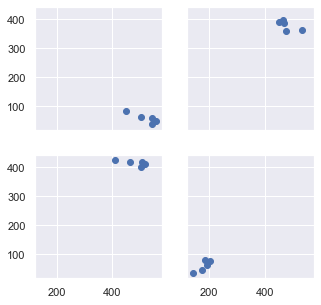

In [433]:
idxs = [500, 1000, 1500, 5000]
fig, axs = plt.subplots(2, 2, figsize=(5, 5), sharex=True, sharey=True)
for i, idx in enumerate(idxs):
    axs[i//2][i%2].scatter(df_all_sub.iloc[idx].xs('x', level=1, axis=0), df_all_sub.iloc[idx].xs('y', level=1, axis=0))
plt.show()

In [434]:
# PPS using reference frame
df_pps = pps.partial_procrustes_superimposition(df_all_sub, bodyparts_body, bodyparts, ref=ref_dlc)

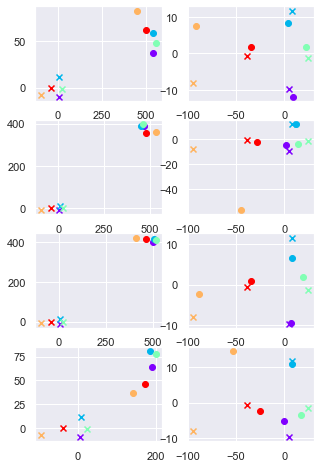

In [435]:
colors = cm.rainbow(np.linspace(0, 1, len(bodyparts)))
fig, axs = plt.subplots(len(idxs), 2, figsize=(5, len(idxs)*2))

ref = df_pps.iloc[2000]
for i, idx in enumerate(idxs):
    orig = df_all_sub.iloc[idx]
    imposed = df_pps.iloc[idx]
    for j, bodypart in enumerate(bodyparts):
        axs[i][0].scatter(orig[bodypart, 'x'], orig[bodypart, 'y'], c=[colors[j]])
        axs[i][0].scatter(ref[bodypart, 'x'], ref[bodypart, 'y'], marker='x', c=[colors[j]])
        axs[i][1].scatter(imposed[bodypart, 'x'], imposed[bodypart, 'y'], c=[colors[j]])
        axs[i][1].scatter(ref[bodypart, 'x'], ref[bodypart, 'y'], marker='x', c=[colors[j]])

plt.show()

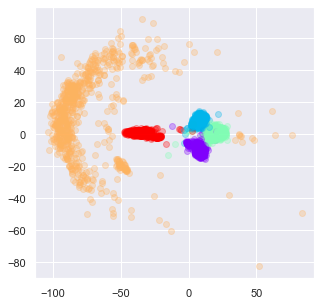

In [436]:
colors = cm.rainbow(np.linspace(0, 1, len(bodyparts)))
fig, axs = plt.subplots(1, 1, figsize=(5, 5))

for idx in range(len(df_pps.iloc[::10])):
    orig = df_pps.iloc[idx]
    for j, bodypart in enumerate(bodyparts):
        axs.scatter(orig[bodypart, 'x'], orig[bodypart, 'y'], c=[colors[j]], alpha=0.3)

plt.show()

(6897, 8)


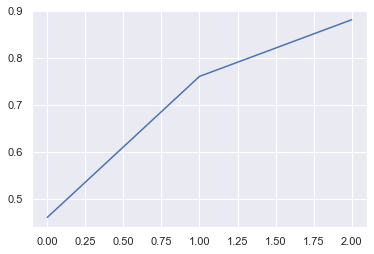

In [437]:
# Fit SSM model
ssm = SSM.SSM()
ssm.fit(df_pps, bodyparts_body)

In [438]:
df_pps_ssm = ssm.transform(df_pps, bodyparts_body)

(6897, 8)


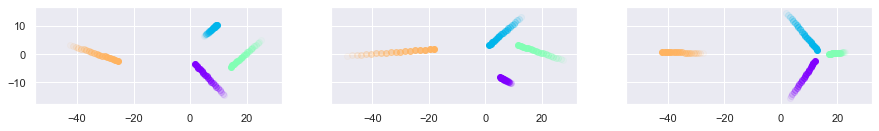

In [439]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)

v_min, v_max = -5, 5
for v in np.linspace(v_min, v_max, 20):
    recon_1 = ssm.inverse_transform_single(np.array([v, 0, 0]))
    recon_2 = ssm.inverse_transform_single(np.array([0, v, 0]))
    recon_3 = ssm.inverse_transform_single(np.array([0, 0, v]))

    for j, bodypart in enumerate(bodyparts_body):
        axs[0].scatter(recon_1[j*2], recon_1[j*2+1], c=[colors[j]], alpha=(v-v_min)/(v_max-v_min))
        axs[1].scatter(recon_2[j*2], recon_2[j*2+1], c=[colors[j]], alpha=(v-v_min)/(v_max-v_min))
        axs[2].scatter(recon_3[j*2], recon_3[j*2+1], c=[colors[j]], alpha=(v-v_min)/(v_max-v_min))
#         axs[0].scatter(recon_1[j*2], recon_1[j*2+1], c=[colors[j]], alpha=abs(v))
#         axs[1].scatter(recon_2[j*2], recon_2[j*2+1], c=[colors[j]], alpha=abs(v))
#         axs[2].scatter(recon_3[j*2], recon_3[j*2+1], c=[colors[j]], alpha=abs(v))
# for i, idx in enumerate(idxs):
#     axs[i//2][i%2].scatter(df_all.iloc[idx].xs('x', level=1, axis=0), df_all.iloc[idx].xs('y', level=1, axis=0))
for ax in axs:
#     ax.set(xlim=[-50, 50])
    ax.set_aspect('equal', adjustable='box')


plt.show()

In [34]:
# Save SSM model
filename = r'storchi/ssm.p'
pickle.dump(ssm, open(filename, "wb"))
# ssm = pickle.load(open(filename, 'rb'))

## Analyze all data

In [134]:
data_path = r'Y:\Data'
db_path = r'Y:\Data\Ania\opto-fUSi\theOnlyTrueDB.csv'
db = pd.read_csv(db_path, sep=',')

In [135]:
# Load PPS and SSM
ref_filename = r'storchi/ref_pose.csv'
ssm_filename = r'storchi/ssm.p'
ref_dlc = pd.read_csv(ref_filename, index_col=0, header=[0, 1]).iloc[0]
# ssm = pickle.load(open(ssm_filename, 'rb'))

In [136]:
bodyparts = ['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
bodyparts_body = ['ear_left', 'ear_right', 'nose', 'tail_start']

In [137]:
def preprocess(df):
    # PPS
    df_pps = pps.partial_procrustes_superimposition(df, bodyparts_body, bodyparts, ref=ref_dlc)
    # SSM
    df_pps_ssm = ssm.transform(df_pps, bodyparts_body)
    # Measures
    df_final = measures.calc_measures(df_pps_ssm, bodyparts)
    return df_final

In [138]:
overwrite = False
df_by_filename = db.groupby('fileName').first()
print(f"{len(df_by_filename)} files found in DB.")

# for _, row in df_by_filename[(df_by_filename['Session']==1) & (df_by_filename['MouseLine']=='GAD2')].iterrows():
for _, row in df_by_filename[(df_by_filename['Session']==1)].iterrows():
    # Find correct folder with deeplabcut files
    exp = str(int(row['ExpNr'])).zfill(5)
    filename = row.name
    folder = os.path.join(data_path, exp, 'behavior')
    if not os.path.isdir(folder):
        folder = os.path.join(data_path, exp, 'Behavior')
        if not os.path.isdir(folder):
            folder = os.path.join(data_path, exp)
            
    # Check if measures file already exists, if it exists then skip
    if not overwrite and len([file for file in os.listdir(folder) if file.endswith('_measures.csv') and filename.split('.')[0] in file]) > 0:
        print(f"Already processed: {filename}. To overwrite, set the overwrite parameter to True.")
        continue
    
    files = [file for file in os.listdir(folder) if file.endswith('.csv') and filename.split('.')[0] in file and 'DLC' in file]
    if len(files) > 1:
        raise Exception("Multiple DLC files found for", exp, row['Session'], ":", files)
    elif len(files) == 0:
        print(f"No DLC file found for {filename}! Skipping ...")
        continue
        
    filepath = os.path.join(folder, files[0])

    print(f"Loading file {filepath} ...")
    data_dlc = data_deeplabcut.DataDLC(filepath)
    data_dlc.filter_likelihood(p=0.9)

    df = preprocess(data_dlc.df)

    # Save results
    new_filename = filename.split('.')[0]+'_measures.csv'
    new_filepath = os.path.join(folder, new_filename)
    df.to_csv(new_filepath)
    

147 files found in DB.
Already processed: 00714_optotest_01_2018-01-23-121720-0000.csv. To overwrite, set the overwrite parameter to True.
Already processed: 00715_optotest_01_2018-01-23-123712-0000.csv. To overwrite, set the overwrite parameter to True.
Already processed: 00722_optotest_01_2018-01-25-123023-0000.csv. To overwrite, set the overwrite parameter to True.
Already processed: 00723_optotest_01_2018-01-23-124659-0000.csv. To overwrite, set the overwrite parameter to True.
Already processed: 00863_optotest_01_2018-09-11-105355-0000.csv. To overwrite, set the overwrite parameter to True.
Already processed: 00864_optotest_01_2018-09-11-111811-0000.csv. To overwrite, set the overwrite parameter to True.
Already processed: 00865_optotest_01_2018-10-17-110906-0000.csv. To overwrite, set the overwrite parameter to True.
Already processed: 00866_optotest_01_2018-10-17-114029-0000.csv. To overwrite, set the overwrite parameter to True.
Already processed: 00904_optotest_01_2018-11-05-1

In [10]:
db

,ExpNr,MouseLine,NewTrial,Session,StimDuration_fps,StimEnd,StimHZ,StimStart,Trial,fileName
0,1314.0,CAMKII,1.0,1.0,120,6228,5.0,6108,1,01314_optotest_01_2020-04-02-162625-0000.csv
1,1314.0,CAMKII,2.0,1.0,118,9562,5.0,9444,2,01314_optotest_01_2020-04-02-162625-0000.csv
2,1314.0,CAMKII,3.0,1.0,118,11142,5.0,11024,3,01314_optotest_01_2020-04-02-162625-0000.csv
3,1314.0,CAMKII,4.0,1.0,118,13677,5.0,13559,4,01314_optotest_01_2020-04-02-162625-0000.csv
4,1314.0,CAMKII,5.0,1.0,118,15275,5.0,15157,5,01314_optotest_01_2020-04-02-162625-0000.csv
...,...,...,...,...,...,...,...,...,...,...
1336,1166.0,CONTROL,6.0,1.0,28,19706,20.0,19678,6,01166_optotest_01_NOL_2019-11-14-145049-0000.csv
1337,1166.0,CONTROL,7.0,1.0,27,20251,20.0,20223,7,01166_optotest_01_NOL_2019-11-14-145049-0000.csv
1338,1166.0,CONTROL,8.0,1.0,28,22189,20.0,22162,8,01166_optotest_01_NOL_2019-11-14-145049-0000.csv
1339,1166.0,CONTROL,9.0,1.0,28,22680,20.0,22652,9,01166_optotest_01_NOL_2019-11-14-145049-0000.csv


Computing background


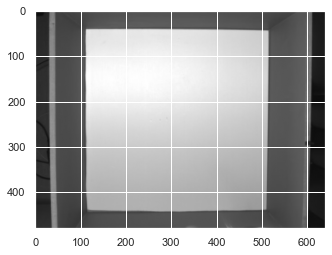

Background computed
Detecting corners


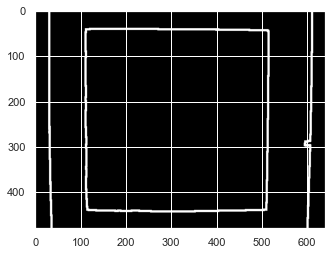

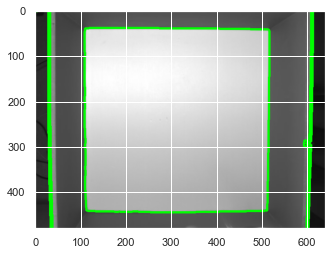

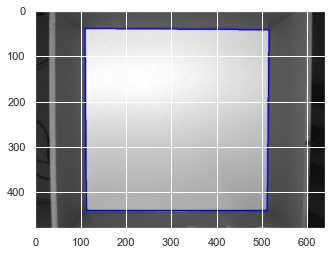

Corners detected
(19014, 33)
(19014,)
Computing background


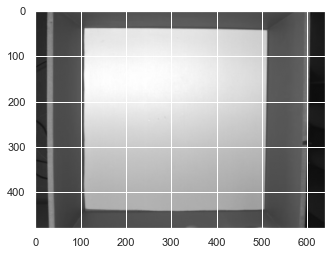

Background computed
Detecting corners


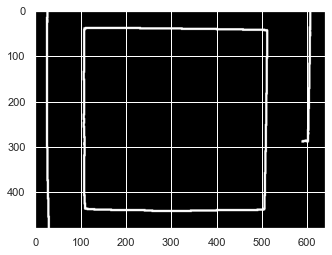

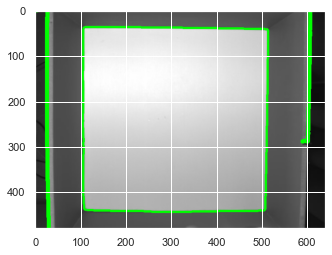

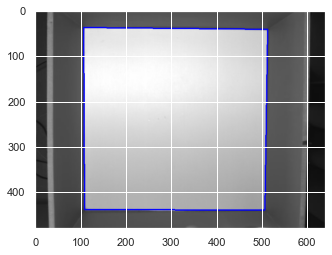

Corners detected
(8015, 33)
(8015,)
Computing background


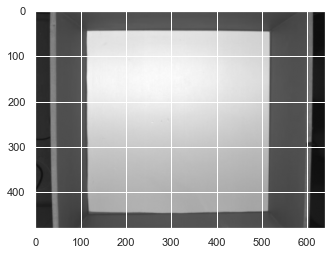

Background computed
Detecting corners


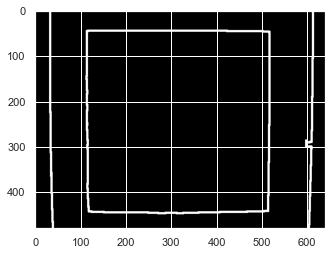

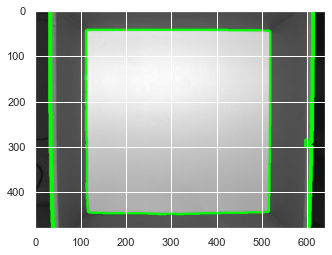

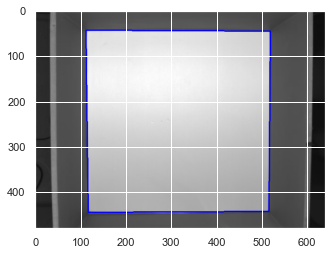

Corners detected
(19014, 33)
(19014,)
Computing background


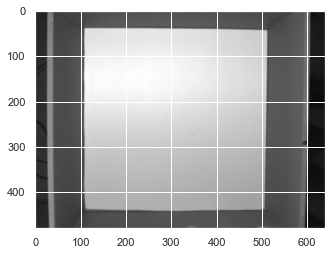

Background computed
Detecting corners


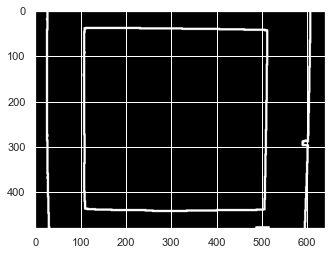

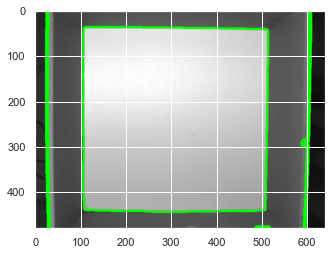

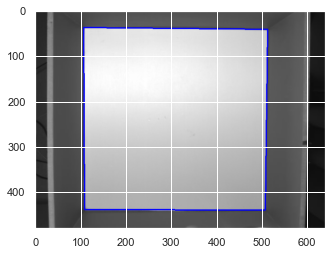

Corners detected
(19014, 33)
(19014,)
Computing background


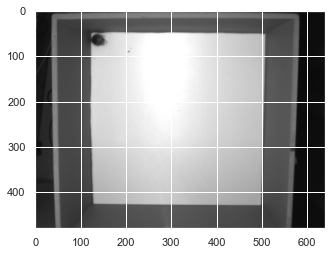

Background computed
Detecting corners


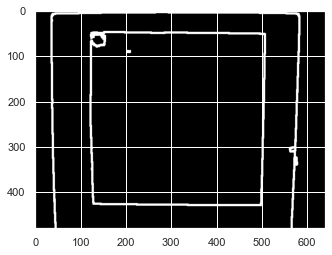

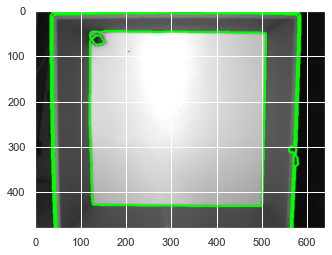

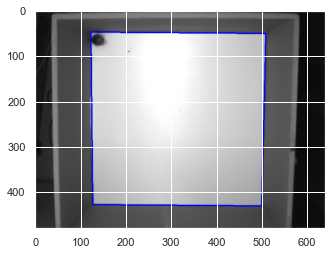

Corners detected
(37000, 33)
(37000,)
Computing background


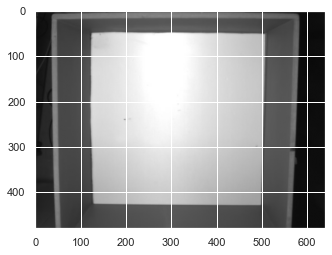

Background computed
Detecting corners


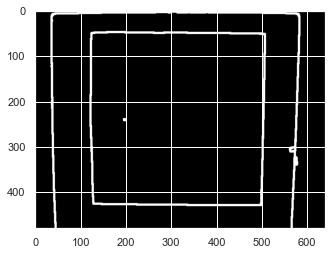

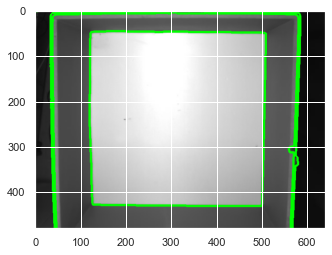

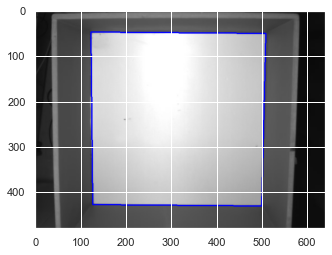

Corners detected
(37000, 33)
(37000,)
Computing background


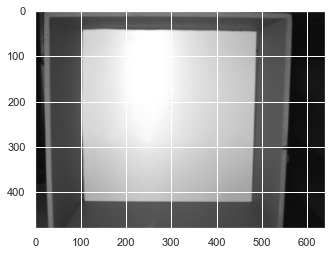

Background computed
Detecting corners


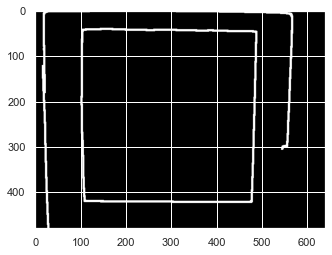

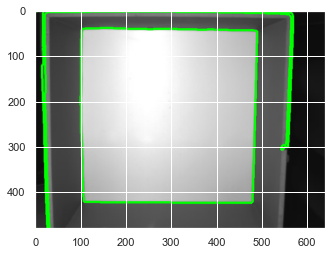

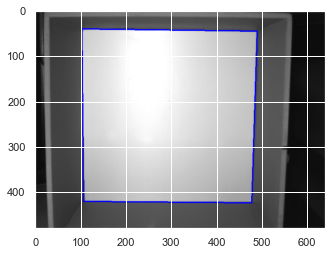

Corners detected
(37000, 33)
(37000,)
Computing background


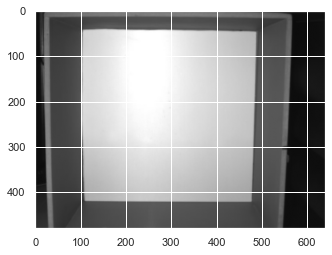

Background computed
Detecting corners


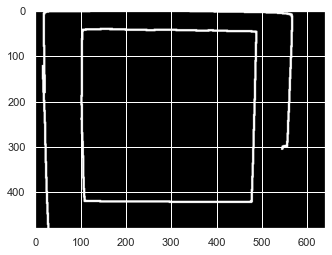

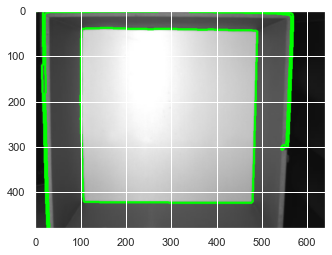

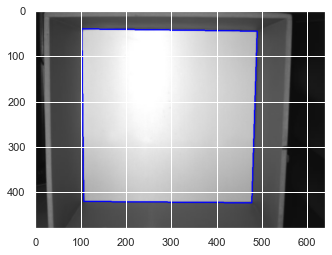

Corners detected
(37000, 33)
(37000,)
Computing background


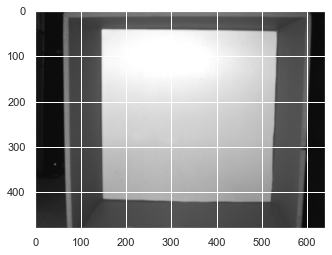

Background computed
Detecting corners


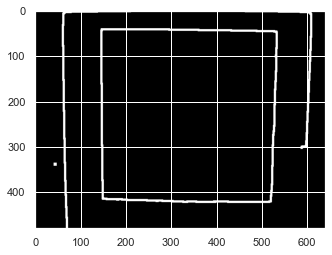

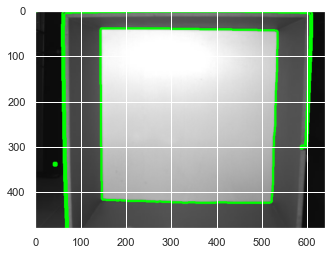

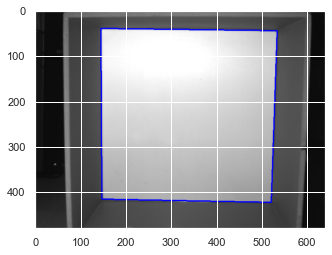

Corners detected
(37000, 33)
(37000,)
Computing background


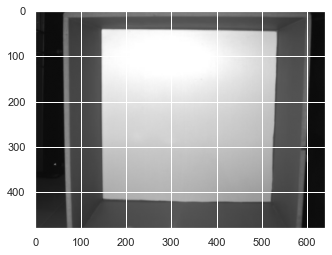

Background computed
Detecting corners


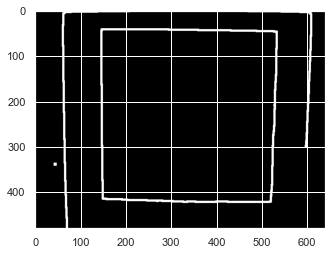

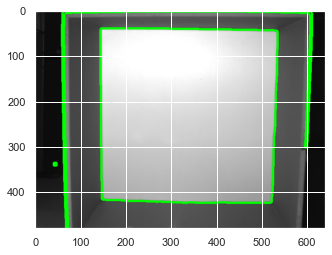

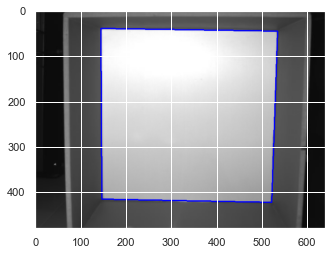

Corners detected
(37000, 33)
(37000,)
Computing background


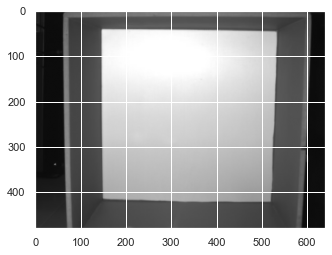

Background computed
Detecting corners


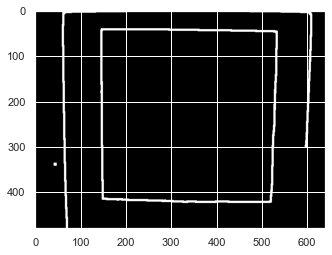

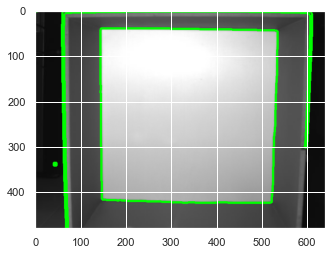

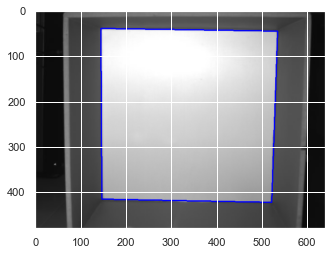

Corners detected
(37000, 33)
(37000,)
Computing background


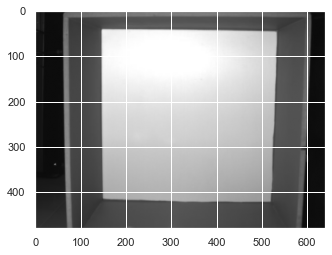

Background computed
Detecting corners


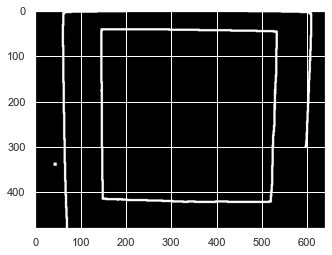

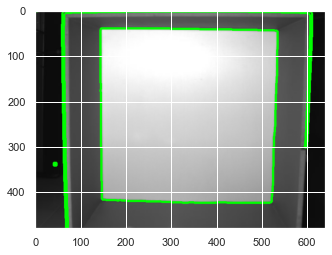

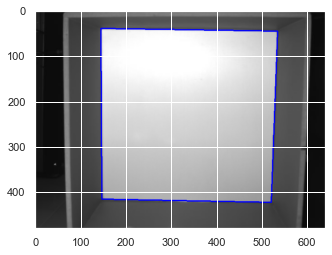

Corners detected
(37000, 33)
(37000,)
Computing background


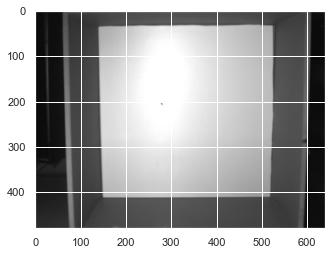

Background computed
Detecting corners


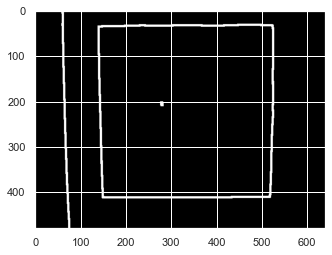

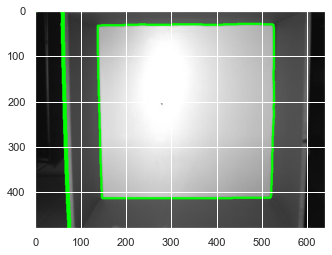

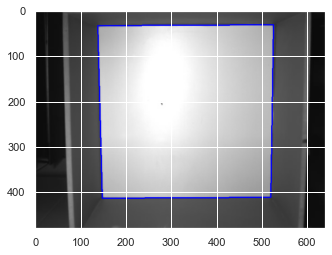

Corners detected
(37000, 33)
(37000,)
Computing background


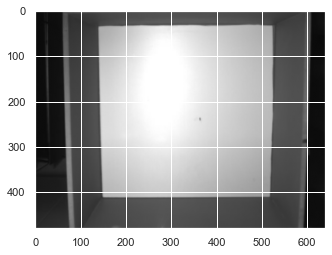

Background computed
Detecting corners


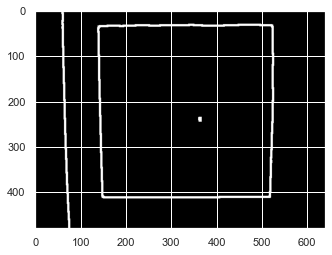

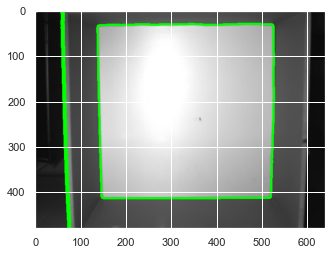

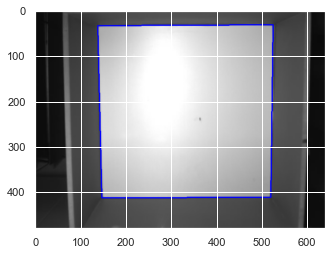

Corners detected
(37000, 33)
(37000,)
Computing background


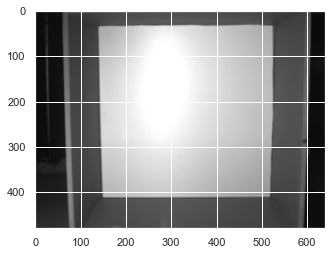

Background computed
Detecting corners


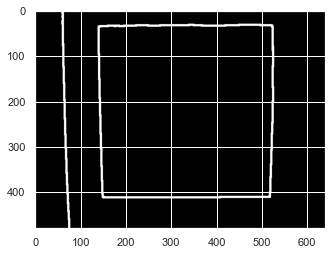

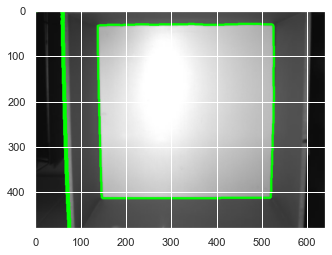

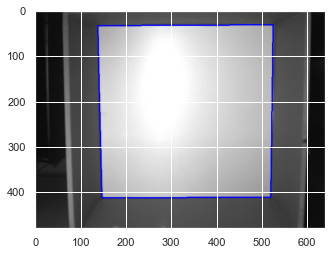

Corners detected
(37000, 33)
(37000,)
Computing background


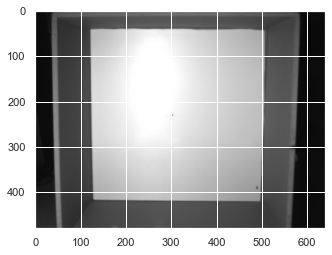

Background computed
Detecting corners


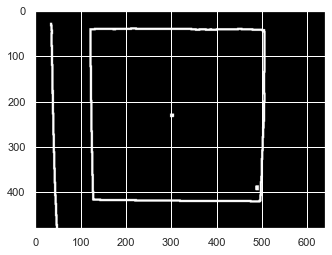

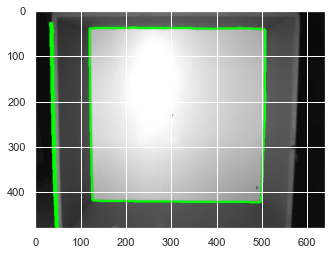

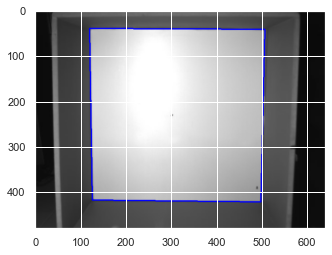

Corners detected
(37000, 33)
(37000,)
Computing background


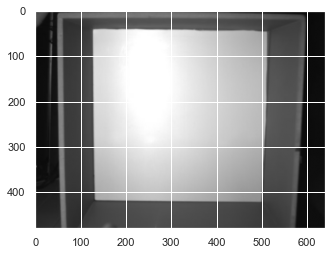

Background computed
Detecting corners


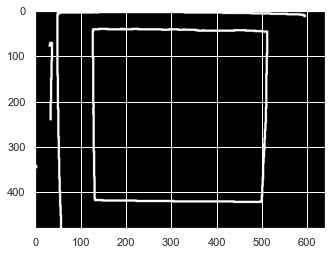

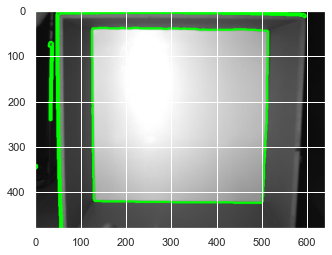

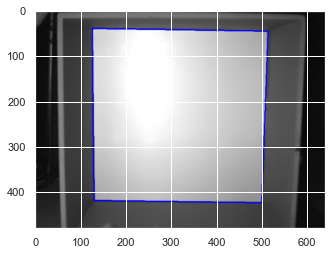

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 988.0, Session: 1.0. Continuing...
Computing background


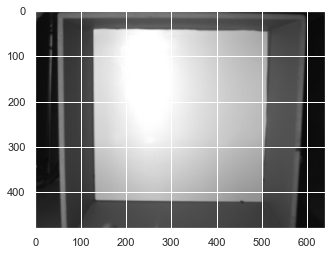

Background computed
Detecting corners


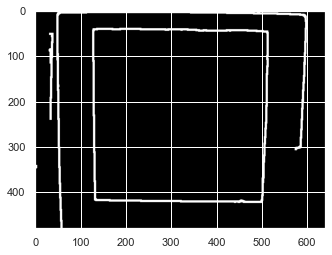

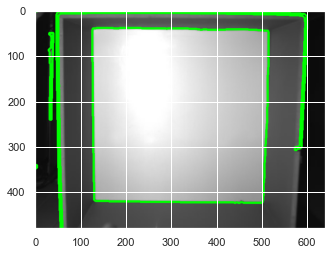

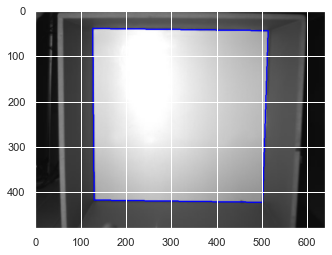

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 988.0, Session: 1.0. Continuing...
Computing background


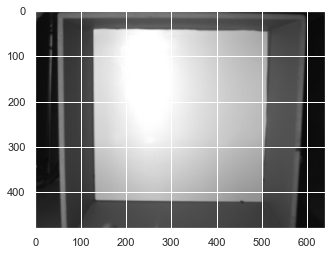

Background computed
Detecting corners


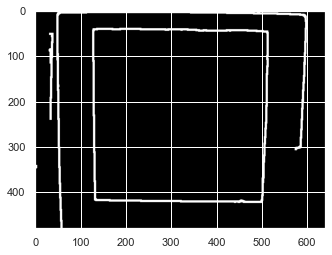

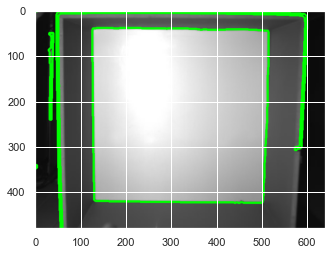

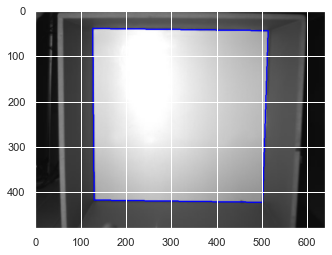

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 989.0, Session: 1.0. Continuing...
Computing background


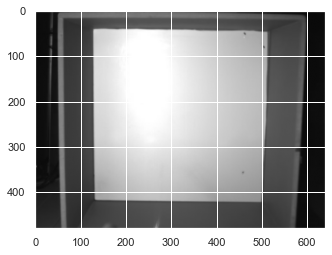

Background computed
Detecting corners


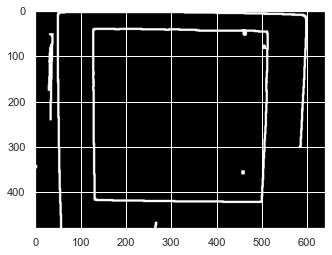

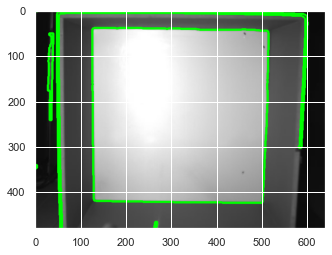

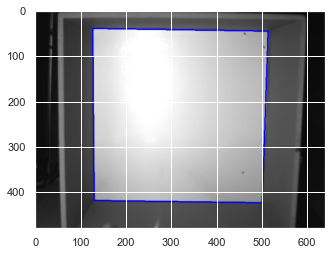

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 989.0, Session: 1.0. Continuing...
Computing background


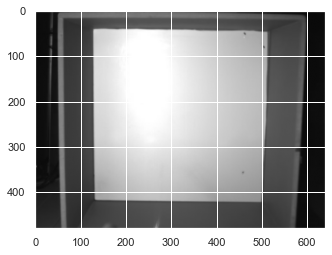

Background computed
Detecting corners


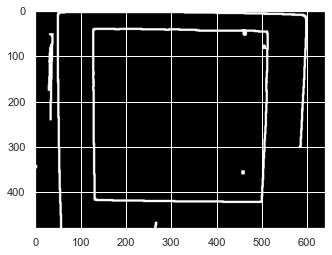

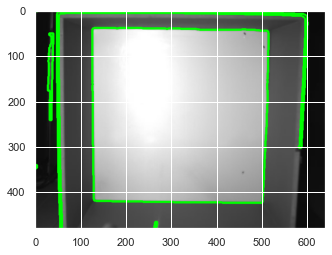

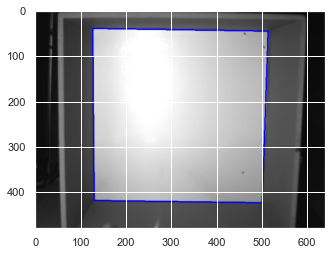

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 990.0, Session: 1.0. Continuing...
Computing background


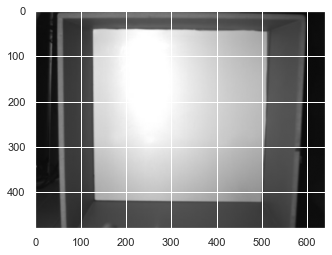

Background computed
Detecting corners


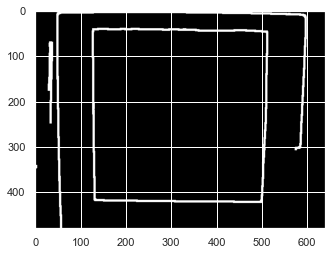

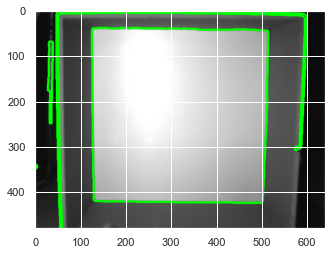

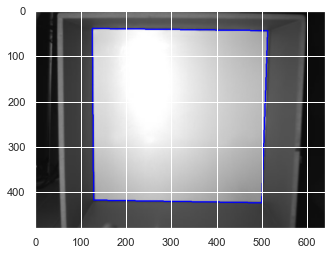

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 990.0, Session: 1.0. Continuing...
Computing background


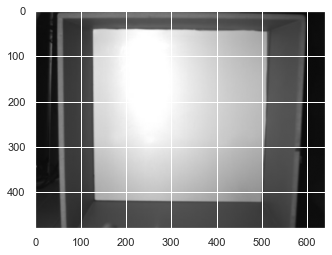

Background computed
Detecting corners


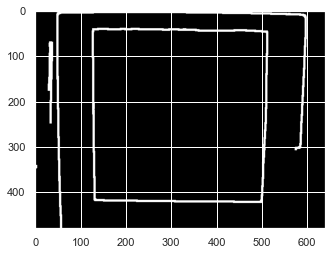

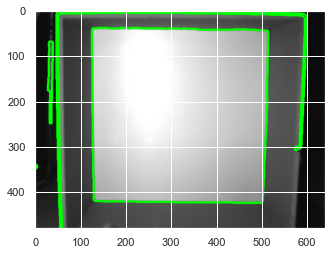

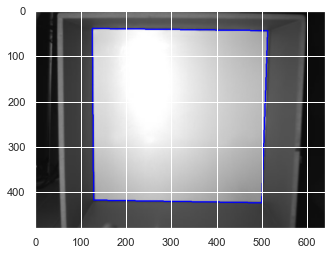

Corners detected
(37000, 33)
(37000,)
Computing background


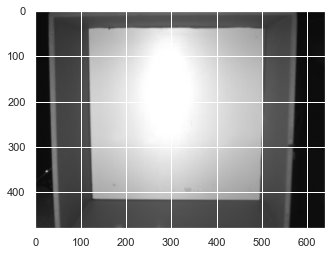

Background computed
Detecting corners


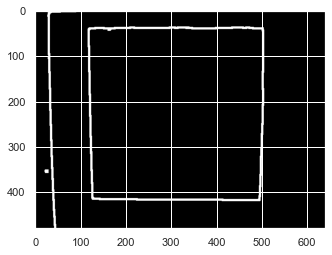

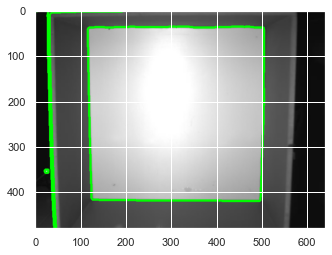

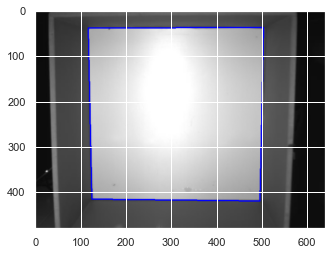

Corners detected
(37000, 33)
(37000,)
Computing background


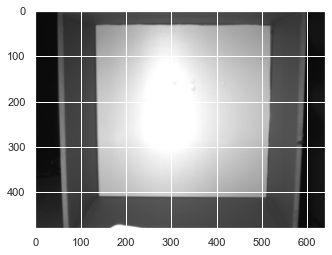

Background computed
Detecting corners


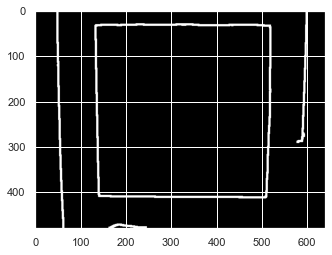

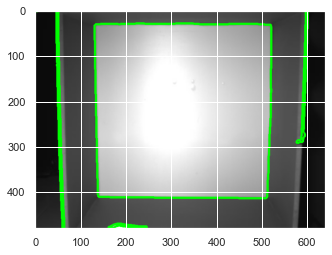

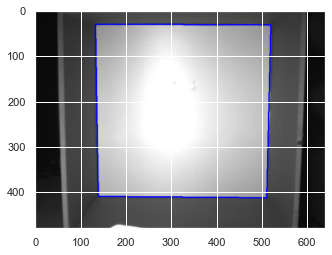

Corners detected
(37000, 33)
(37000,)
Computing background


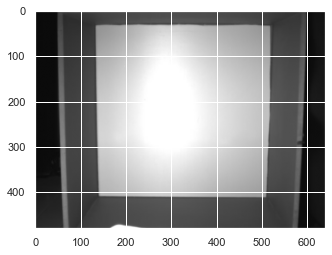

Background computed
Detecting corners


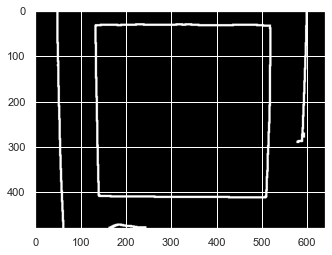

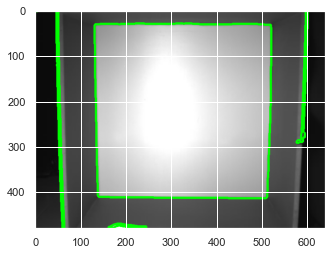

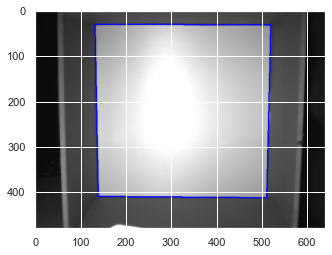

Corners detected
(37000, 33)
(37000,)
Computing background


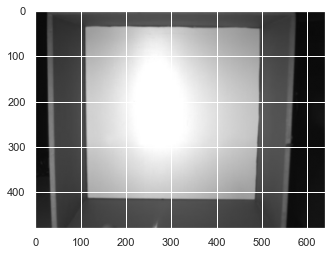

Background computed
Detecting corners


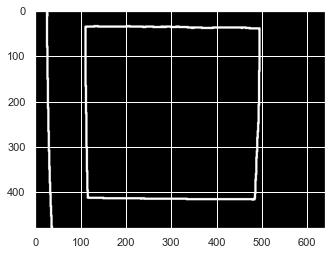

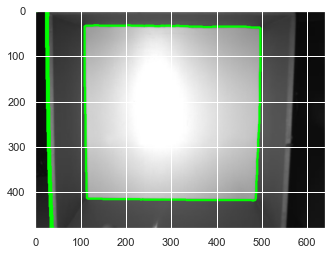

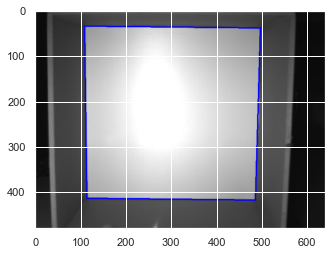

Corners detected
(37000, 33)
(37000,)
Computing background


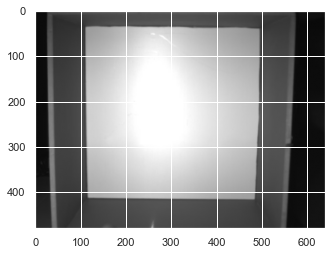

Background computed
Detecting corners


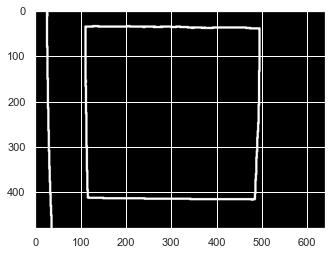

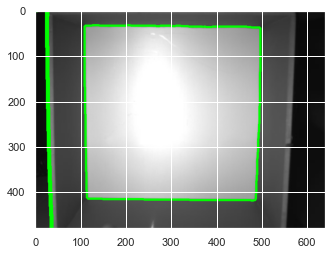

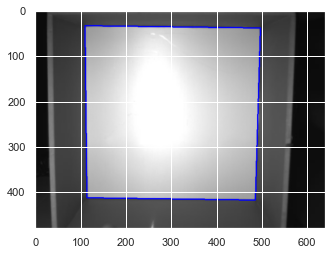

Corners detected
(37000, 33)
(37000,)
Computing background


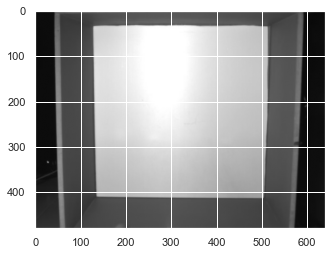

Background computed
Detecting corners


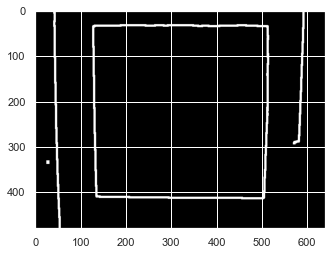

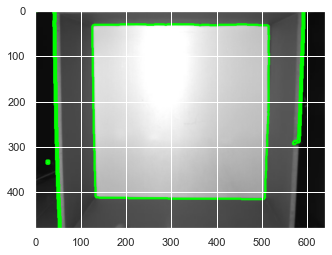

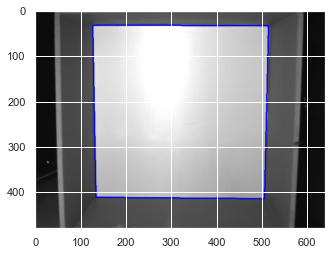

Corners detected
(37000, 33)
(37000,)
Computing background


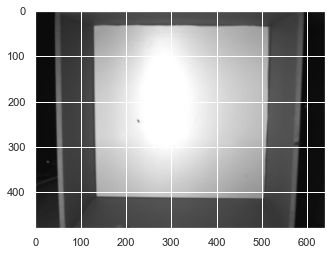

Background computed
Detecting corners


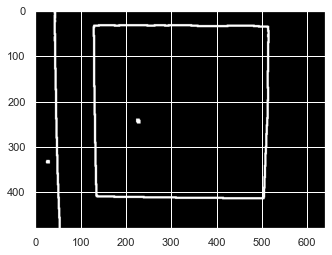

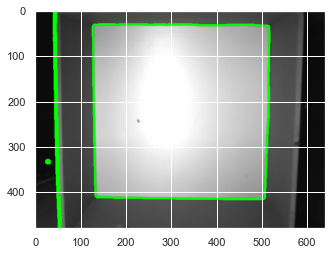

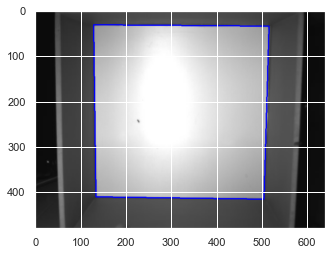

Corners detected
(37000, 33)
(37000,)
Computing background


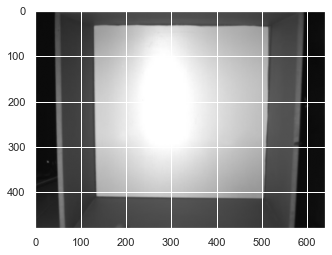

Background computed
Detecting corners


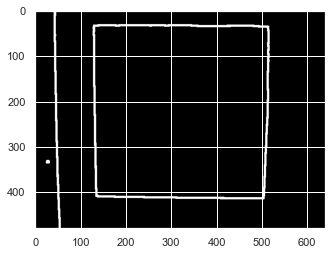

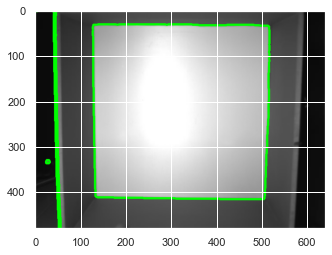

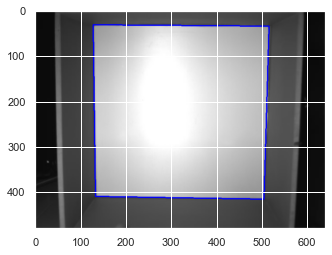

Corners detected
(37000, 33)
(37000,)
Computing background


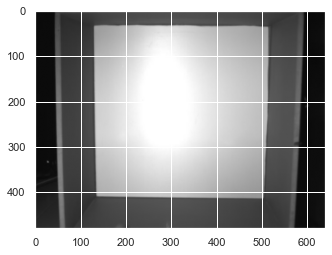

Background computed
Detecting corners


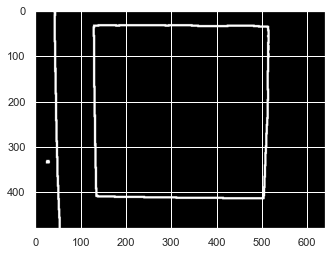

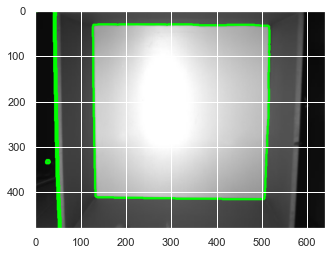

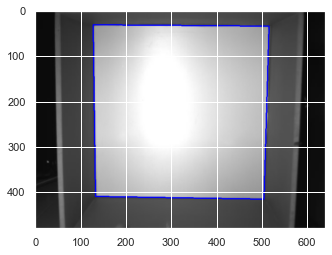

Corners detected
(37000, 33)
(37000,)
Computing background


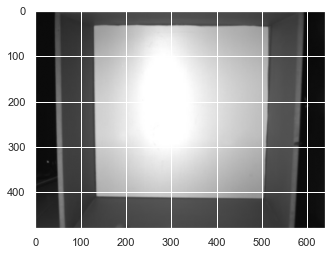

Background computed
Detecting corners


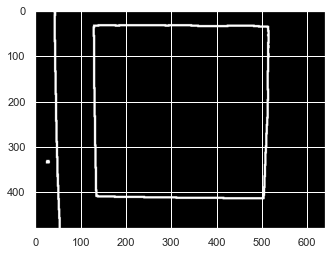

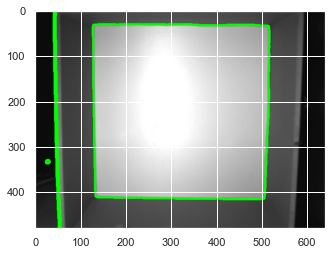

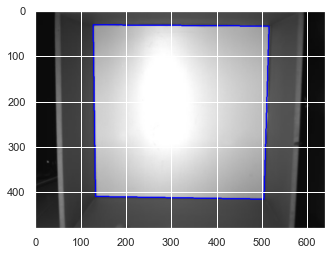

Corners detected
(37000, 33)
(37000,)
Computing background


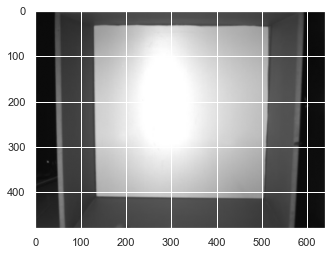

Background computed
Detecting corners


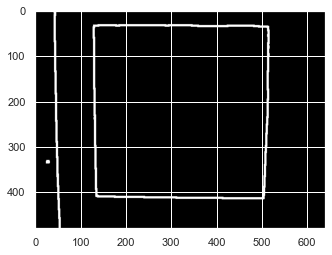

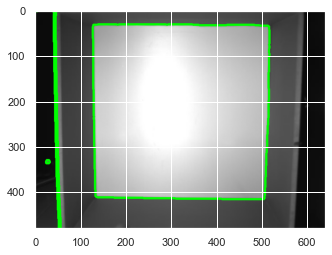

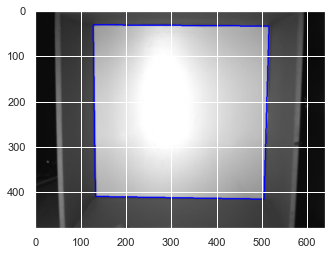

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 1163.0, Session: 1.0. Continuing...
Computing background


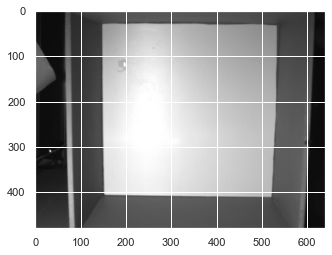

Background computed
Detecting corners


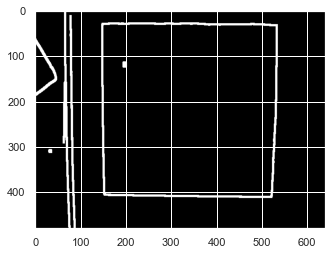

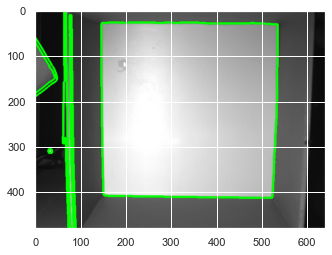

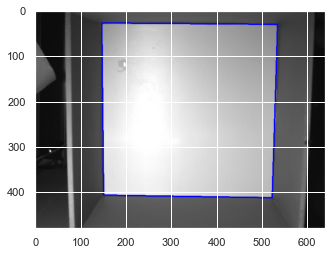

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 1163.0, Session: 1.0. Continuing...
Computing background


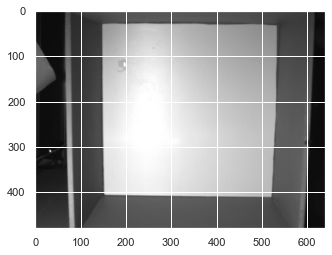

Background computed
Detecting corners


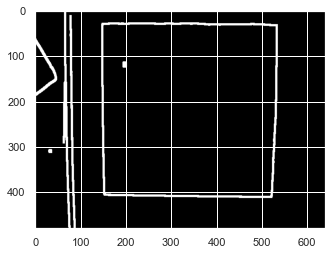

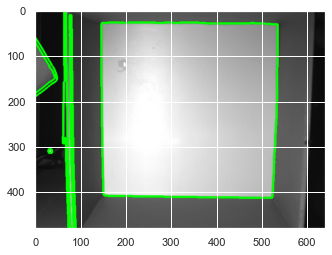

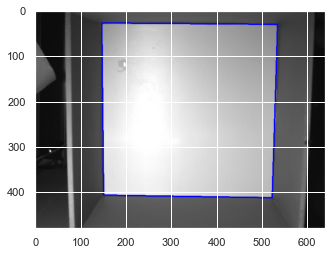

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 1165.0, Session: 1.0. Continuing...
Computing background


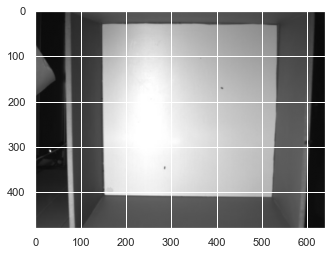

Background computed
Detecting corners


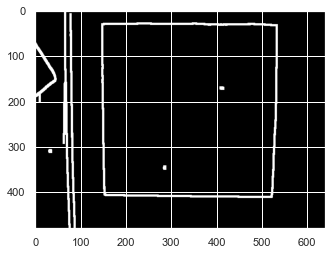

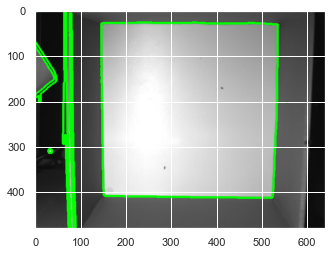

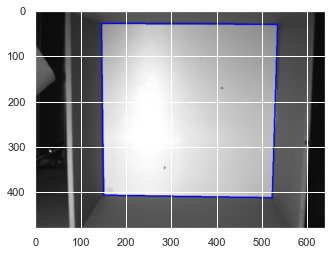

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 1165.0, Session: 1.0. Continuing...
Computing background


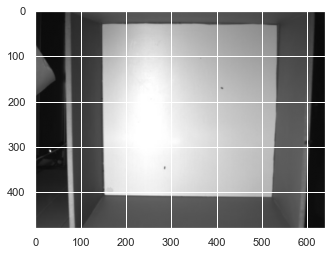

Background computed
Detecting corners


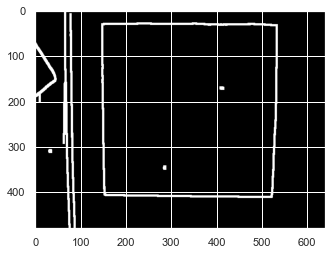

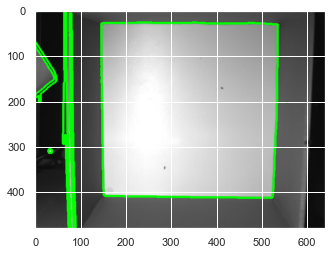

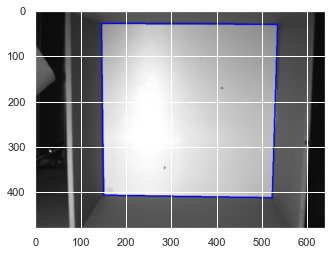

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 1166.0, Session: 1.0. Continuing...
Computing background


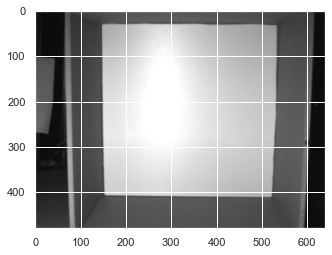

Background computed
Detecting corners


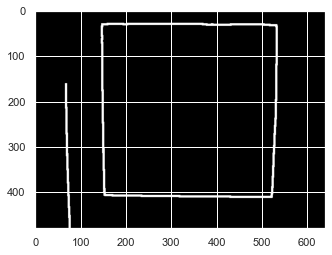

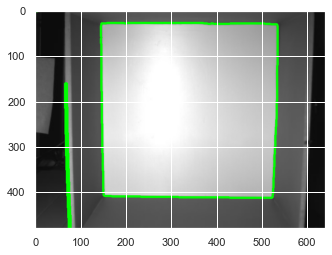

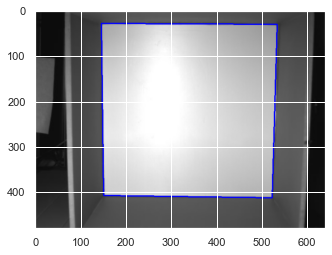

Corners detected
(37000, 33)
(37000,)
Multiple filenames found for the given query. ExpNr: 1166.0, Session: 1.0. Continuing...
Computing background


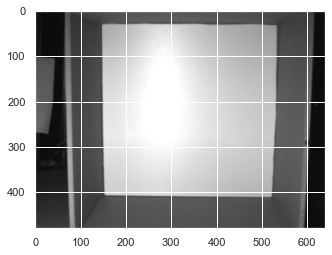

Background computed
Detecting corners


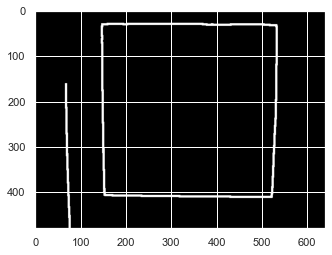

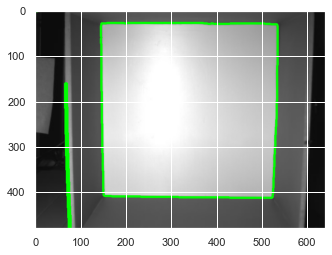

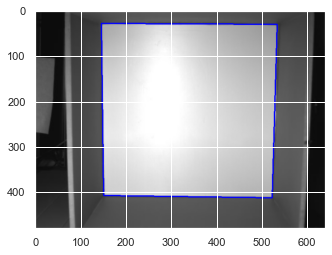

Corners detected
(37000, 33)
(37000,)
Computing background


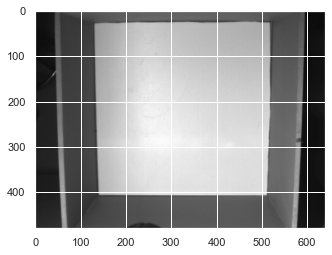

Background computed
Detecting corners


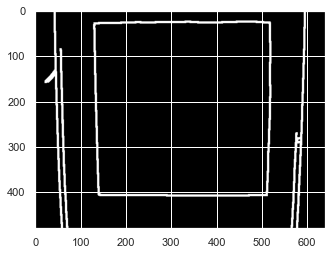

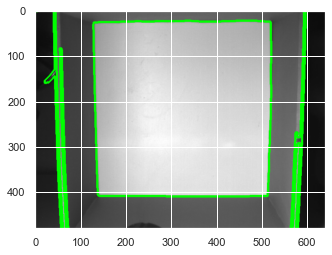

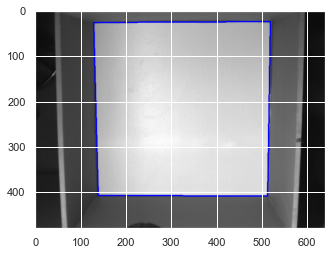

Corners detected
(37000, 33)
(37000,)
Computing background


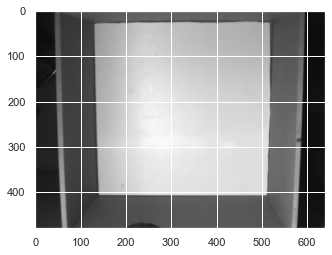

Background computed
Detecting corners


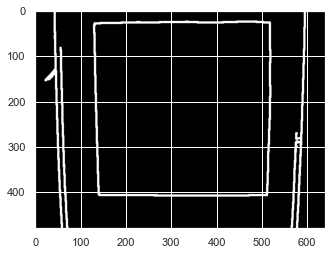

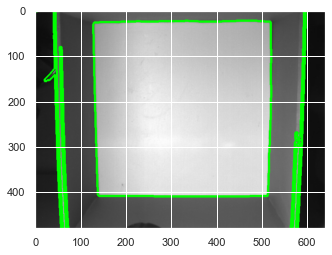

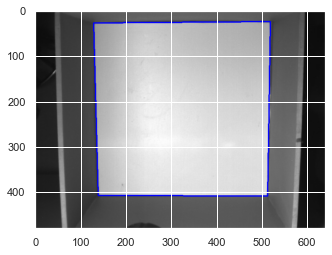

Corners detected
(37000, 33)
(37000,)
Computing background


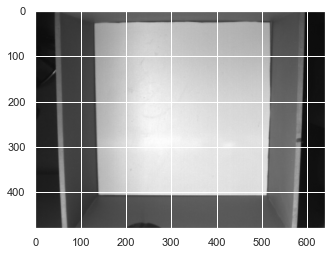

Background computed
Detecting corners


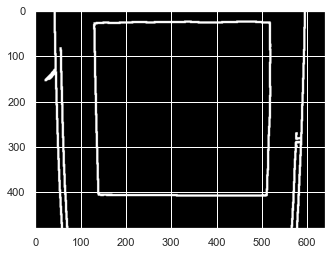

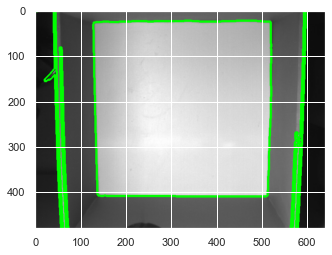

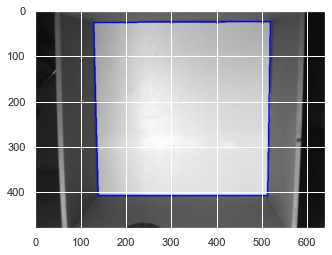

Corners detected
(37000, 33)
(37000,)
Computing background


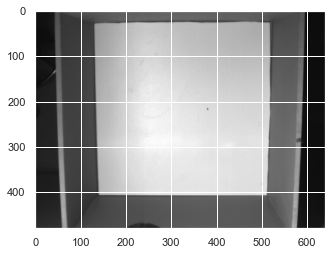

Background computed
Detecting corners


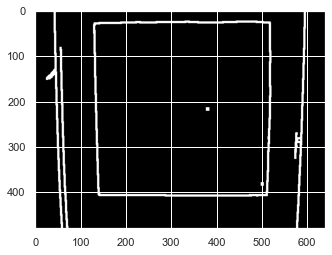

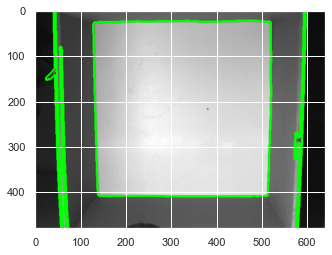

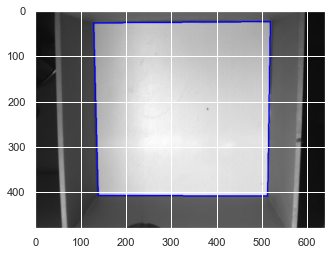

Corners detected
(37000, 33)
(37000,)
Computing background


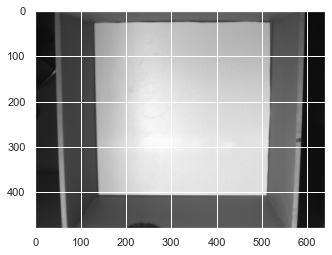

Background computed
Detecting corners


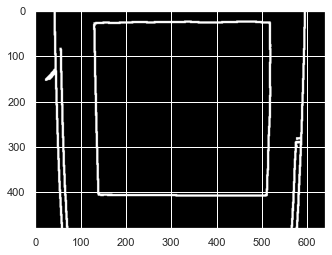

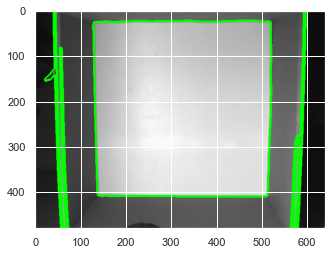

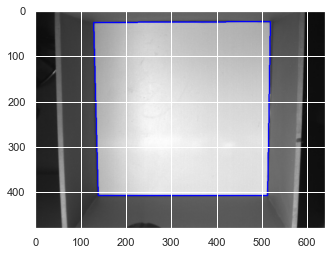

Corners detected
(37000, 33)
(37000,)
Computing background


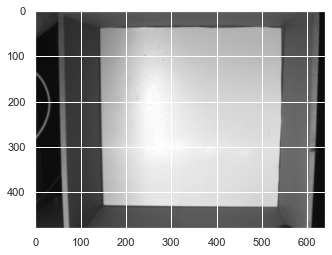

Background computed
Detecting corners


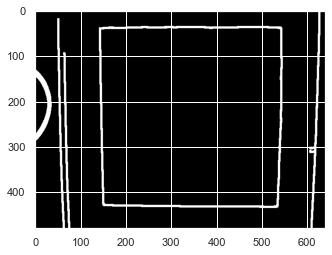

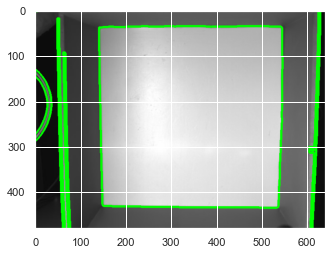

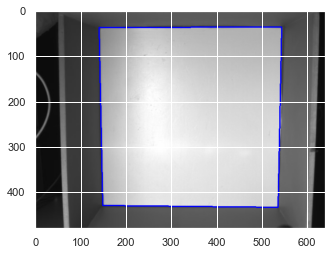

Corners detected
(38000, 33)
(38000,)
Multiple filenames found for the given query. ExpNr: 1315.0, Session: 1.0. Continuing...
Computing background


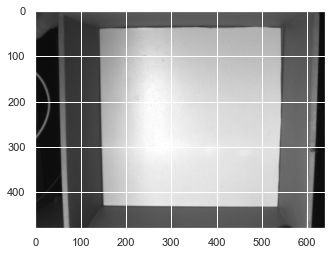

Background computed
Detecting corners


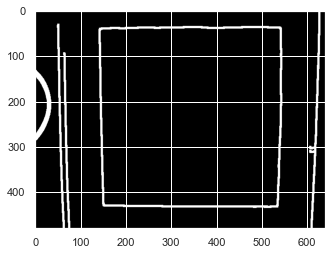

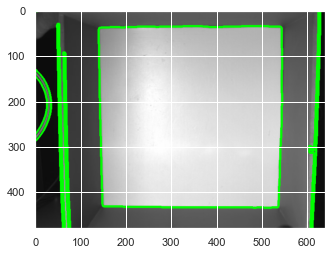

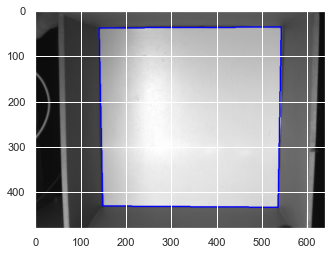

Corners detected
(20000, 33)
(20000,)
Multiple filenames found for the given query. ExpNr: 1315.0, Session: 1.0. Continuing...
Computing background


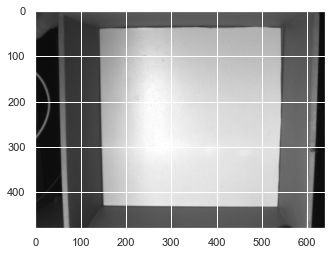

Background computed
Detecting corners


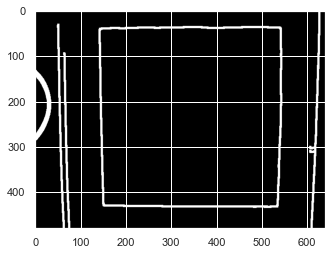

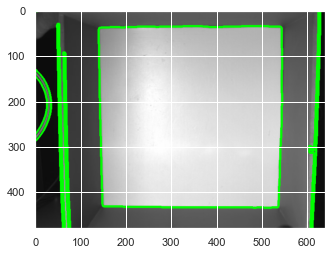

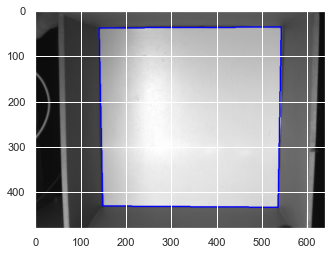

Corners detected
(38000, 33)
(38000,)
Computing background


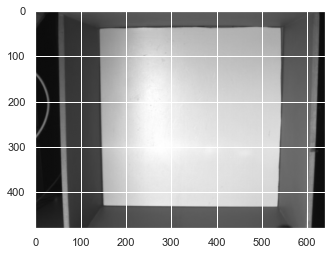

Background computed
Detecting corners


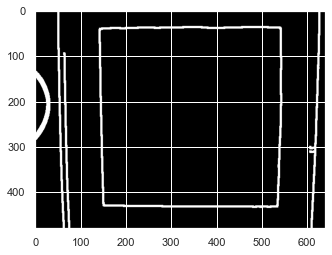

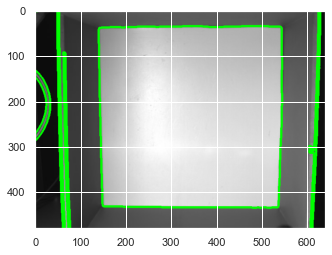

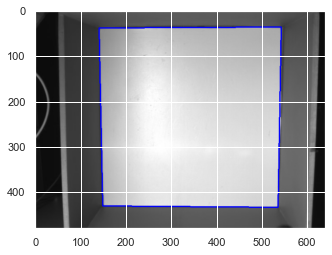

Corners detected
(38000, 33)
(38000,)
Computing background


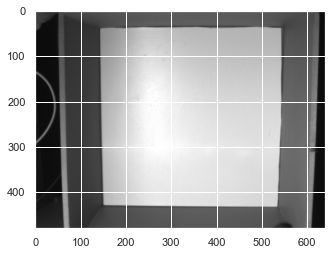

Background computed
Detecting corners


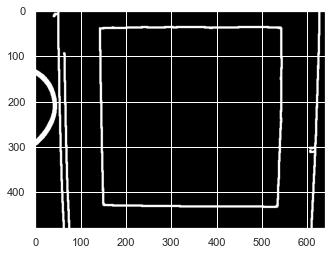

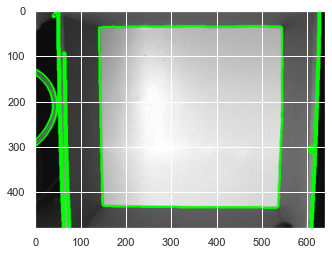

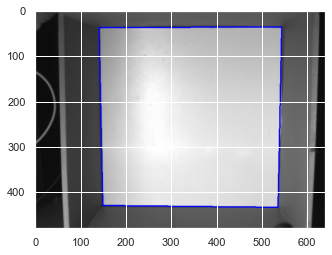

Corners detected
(38000, 33)
(38000,)
Computing background


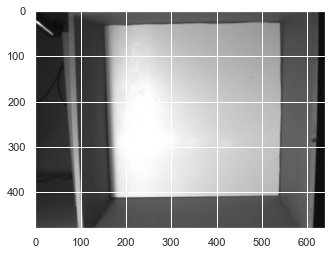

Background computed
Detecting corners


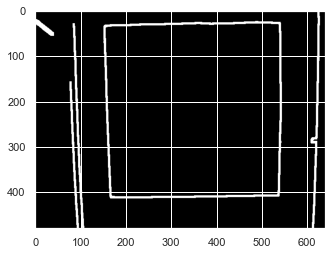

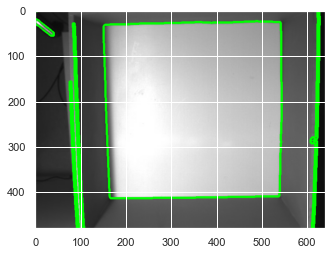

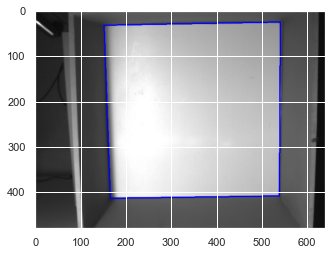

Corners detected
(37000, 33)
(37000,)
Computing background


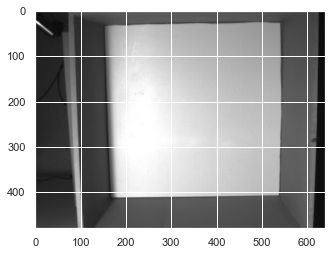

Background computed
Detecting corners


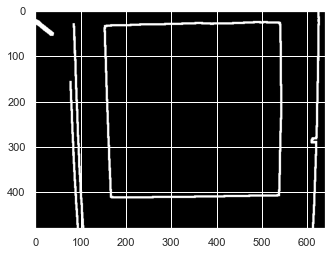

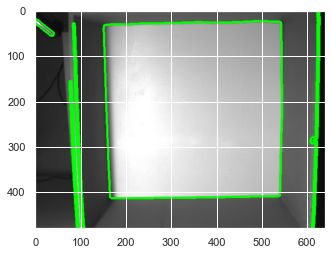

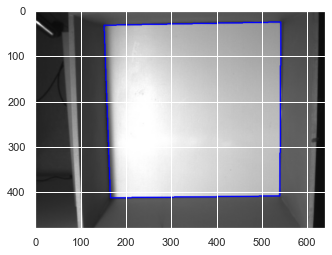

Corners detected
(37000, 33)
(37000,)


In [11]:
import utils.box_detection as box_detection

# Load all preprocessed data
df_dict = {}
data_opto = dataset_opto.DatasetOpto(db_path, data_path)

df_by_filename = db.groupby(['fileName', 'MouseLine']).first()
for name, row in df_by_filename[df_by_filename['Session']==1].iterrows():
    exp, sess, line = row['ExpNr'], row['Session'], name[1]
    filename = name[0]
        
    folder = os.path.join(data_path, str(int(exp)).zfill(5), 'behavior')
    if not os.path.isdir(folder):
        folder = os.path.join(data_path, str(int(exp)).zfill(5), 'Behavior')
        if not os.path.isdir(folder):
            folder = os.path.join(data_path, str(int(exp)).zfill(5))
            
    filename_measures = filename.split('.')[0]+'_measures.csv'
    filepath = os.path.join(folder, filename_measures)
    if not os.path.isfile(filepath):
        print(f"No measures file found for {filename_measures}! Skipping ...")
        continue

    if line not in df_dict:
        df_dict[line] = {}
    df = pd.read_csv(filepath, header=[0, 1], index_col=0)
    
    video_path = data_opto.get_video_path(line, exp, sess)
    corners = box_detection.detect(video_path)
    df = measures.distance_from_corner(df, corners)
    
    df_dict[line][(exp, sess)] = df

    

In [60]:
# trial_duration = 5 # seconds
# df_dict_trials = {}
# for line, exps in df_dict.items():
#     print(line)
#     for (exp, sess), df in exps.items():
#         trials = db[(db['ExpNr']==exp) & (db['Session']==sess) & (db['StimHZ']==20)]
#         for start in trials['StimStart']:
#             df[]
#         print(df)
#         break
#     break

In [149]:
# Filter out low likelihood session start and end frames
offsets = {}
df_offset_dict = {}
for line, exps in df_dict.items():
    if line not in offsets:
        offsets[line] = {}
        df_offset_dict[line] = {}
    for key, df in exps.items():
        p_cutoff = 0.9
        likelihoods = df.xs('likelihood', level=1, axis=1)
        offset = likelihoods[np.all(likelihoods>=p_cutoff, axis=1)].index[0]
        offsets[line][key] = offset
        df_offset_dict[line][key] = df.copy().loc[offset:].reset_index(drop=True)
# df_dict.keys()

In [537]:
# Normalize
dlc_all = pd.concat([df for df in list(camk2.values())+list(ntsr.values())])
_, means, stds = measures.normalize_zscore(dlc_all)

camk2_norm = {}
for key, value in camk2.items():
    camk2_norm[key], _, _ = measures.normalize_zscore(value, means, stds)
    
ntsr_norm = {}
for key, value in ntsr.items():
    ntsr_norm[key], _, _ = measures.normalize_zscore(value, means, stds)
    

means post_elongation    53.638435
post_bend           2.770526
mov_locomotion      1.810890
mov_freeze         -4.332337
mov_rotation        0.083738
mov_elongation     -0.003193
mov_bend            0.056217
dtype: float64
stds post_elongation    20.278234
post_bend           0.377999
mov_locomotion      2.139681
mov_freeze          9.643750
mov_rotation        0.546448
mov_elongation      2.817976
mov_bend            0.116309
dtype: float64
(7,)
means post_elongation    53.638435
post_bend           2.770526
mov_locomotion      1.810890
mov_freeze         -4.332337
mov_rotation        0.083738
mov_elongation     -0.003193
mov_bend            0.056217
dtype: float64
stds post_elongation    20.278234
post_bend           0.377999
mov_locomotion      2.139681
mov_freeze          9.643750
mov_rotation        0.546448
mov_elongation      2.817976
mov_bend            0.116309
dtype: float64
(7,)
means post_elongation    53.638435
post_bend           2.770526
mov_locomotion      1.810890
mov

In [290]:

def normalize_combined(dicts):
    sess_all = [d.keys() for d in dicts]
    sess_all_idxs = np.cumsum([len(df) for df in [d.values() for d in dicts]])
    sess_all_idxs = list(zip(np.insert(sess_all_idxs, 0, 0), sess_all_idxs)) # Create (start, end) tuples
    sess_all_idxs = {key: value for key, value in zip(sess_all, sess_all_idxs)}

    dlc_all = pd.concat([d.values() for d in dicts])
    dlc_all.reset_index()
    
    dlc_all_norm = measures.normalize_quantiles(dlc_all, n_intervals=10000)
    
    norms = []
    for d in dicts:
        norm = {}
        for key, value in d.items():
            start, end = sess_all_idxs[key]
            norm[key] = dlc_all_norm.iloc[start:end]
        norms.append(norm)
    return norms


In [152]:
camk2 = df_offset_dict['CAMKII']
ntsr = df_offset_dict['NTSR1']
gad2 = df_offset_dict['GAD2']
pv = df_offset_dict['PV']
ctrl = df_offset_dict['CONTROL']

# camk2 = df_dict['CAMKII']
# ntsr = df_dict['NTSR1']
# gad2 = df_dict['GAD2']
# pv = df_dict['PV']
# ctrl = df_dict['CONTROL']

                              
sess_all = list(camk2.keys())+list(ntsr.keys())+list(gad2.keys())+list(pv.keys())+list(ctrl.keys())
sess_all_idxs = np.cumsum([len(df) for df in list(camk2.values())+list(ntsr.values())+list(gad2.values())+list(pv.values())+list(ctrl.values())])
sess_all_idxs = list(zip(np.insert(sess_all_idxs, 0, 0), sess_all_idxs)) # Create (start, end) tuples
print(sess_all_idxs)
sess_all_idxs = {key: value for key, value in zip(sess_all, sess_all_idxs)}
print(sess_all_idxs)

dlc_all = pd.concat(list(camk2.values())+list(ntsr.values())+list(gad2.values())+list(pv.values())+list(ctrl.values()))
# dlc_all = dlc_all[np.all(dlc_all.xs('likelihood', level=1, axis=1)>0.9, axis=1)] # Removes frames with low likelihoods
dlc_all = dlc_all.reset_index()
# dlc_all_norm = dlc_all

dlc_all_norm = measures.normalize_quantiles(dlc_all, n_intervals=10000)
# dlc_all_norm, _, _ = measures.normalize_zscore(dlc_all)
# dlc_all_norm = measures.normalize_scaling(dlc_all)

camk2_norm = {}
for key, value in camk2.items():
    start, end = sess_all_idxs[key]
    camk2_norm[key] = dlc_all_norm.iloc[start:end]
    
ntsr_norm = {}
for key, value in ntsr.items():
    start, end = sess_all_idxs[key]
    ntsr_norm[key] = dlc_all_norm.iloc[start:end]
    
gad2_norm = {}
for key, value in gad2.items():
    start, end = sess_all_idxs[key]
    gad2_norm[key] = dlc_all_norm.iloc[start:end]
    
pv_norm = {}
for key, value in pv.items():
    start, end = sess_all_idxs[key]
    pv_norm[key] = dlc_all_norm.iloc[start:end]
    
ctrl_norm = {}
for key, value in ctrl.items():
    start, end = sess_all_idxs[key]
    ctrl_norm[key] = dlc_all_norm.iloc[start:end]

[(0, 17864), (17864, 24890), (24890, 42311), (42311, 60516), (60516, 97353), (97353, 133563), (133563, 170526), (170526, 207590), (207590, 244685), (244685, 280446), (280446, 316263), (316263, 352562), (352562, 388817), (388817, 425313), (425313, 461679), (461679, 498076), (498076, 534605), (534605, 570979), (570979, 607457), (607457, 643835), (643835, 680331), (680331, 716753), (716753, 753159), (753159, 789921), (789921, 826921), (826921, 863177), (863177, 899260), (899260, 935503), (935503, 971617), (971617, 1007887), (1007887, 1044282), (1044282, 1080859), (1080859, 1117344), (1117344, 1153558), (1153558, 1189993), (1189993, 1226356), (1226356, 1262777), (1262777, 1298817), (1298817, 1335206), (1335206, 1371985), (1371985, 1408345), (1408345, 1444764), (1444764, 1481198), (1481198, 1517509), (1517509, 1553606), (1553606, 1590178), (1590178, 1626417), (1626417, 1662747), (1662747, 1699244), (1699244, 1735494), (1735494, 1771766)]
{(714.0, 1.0): (0, 17864), (715.0, 1.0): (17864, 2489

In [157]:
camk2_norm[(714, 1)]

index       nose                        ear_right             \
                      x          y likelihood          x          y   
0          0   8.288856  -3.342935   0.996385   5.447546   6.608579   
1          1   2.472036  -5.794578   0.997376   7.301440  10.024329   
2          2   0.876061  -5.196442   0.960037  13.745178   9.118973   
3          3  19.877222  -0.267611   0.998306   7.283055   4.872227   
4          4  11.860012 -21.288765   0.999974  -0.454385  14.616007   
...      ...        ...        ...        ...        ...        ...   
17859  17859  21.062252   0.926360   1.000000   2.867198  11.362664   
17860  17860  21.237271   0.650956   1.000000   2.850910  11.417982   
17861  17861  21.061650   0.888809   1.000000   2.901134  11.115045   
17862  17862  21.643653   0.739738   1.000000   2.691514  11.187791   
17863  17863  21.622322   0.447182   1.000000   2.998344  11.284626   

                  ear_left                        ...       measures  \
      likelihood         x          y likelihood  ... mov_locomotion   
0       1.000000  3.449049  -2.271950   0.999961  ...       0.994599   
1       0.999999  1.257651  -1.951160   0.999984  ...       0.994999   
2       0.999983  3.991060  -1.761467   0.999677  ...       0.994599   
3       1.000000  2.562431  -3.776796   0.999994  ...       0.994199   
4       0.999996  4.097863  12.369544   0.999995  ...       0.994799   
...          ...       ...        ...        ...  ...            ...   
17859   1.000000  4.887994 -12.964697   1.000000  ...       0.155516   
17860   1.000000  4.980924 -12.679152   1.000000  ...       0.107111   
17861   1.000000  4.932797 -12.671105   1.000000  ...       0.122212   
17862   1.000000  4.967028 -12.565577   1.000000  ...       0.170417   
17863   1.000000  4.877396 -12.223749   1.000000  ...       0.054205   

                                                                       \
      mov_freeze mov_rotation mov_rotation_D mov_elongation  mov_bend   
0       0.006401     0.985899       0.990299       0.994299  0.993999   
1       0.011001     0.985199       0.004700       0.001400  0.992899   
2       0.012701     0.984498       0.005101       0.990499  0.985599   
3       0.002300     0.983198       0.005801       0.994699  0.994799   
4       0.000800     0.986399       0.990599       0.001000  0.994299   
...          ...          ...            ...            ...       ...   
17859   0.836484     0.378938       0.712771       0.571957  0.416342   
17860   0.974297     0.050305       0.548355       0.659866  0.423042   
17861   0.898890     0.274327       0.660766       0.366037  0.378638   
17862   0.911291     0.201820       0.624262       0.795180  0.282828   
17863   0.811681     0.302930       0.674967       0.572357  0.475648   

                                                                     \
      mov_bend_D mov_locomotion_side_angle mov_locomotion_side_dist   
0       0.994699                  0.231223                 0.995200   
1       0.001200                  0.066407                 0.995200   
2       0.005101                  0.980898                 0.011501   
3       0.995100                  0.867287                 0.000300   
4       0.000500                  0.889189                 0.000200   
...          ...                       ...                      ...   
17859   0.285429                  0.174917                 0.693269   
17860   0.705271                  0.226823                 0.635464   
17861   0.304030                  0.132413                 0.659666   
17862   0.634363                  0.296330                 0.622062   
17863   0.732173                  0.632963                 0.468847   

                       
      corner_distance  
0            0.637664  
1            0.689869  
2            0.748375  
3            0.809081  
4            0.877188  
...               ...  
17859        0.185019  
17860        0.184318  
17861        0.181618  
17862   

In [456]:
FPS = 30
time_window = 5*FPS

# Extract stim trials
def extract_stim_trials_offset(df_dict, db, mouseline, offsets):
    trials = []
    trial_starts = []
    for (exp, sess), df in df_dict.items():
        if len(db[(db['ExpNr']==exp) & (db['Session']==sess) & (db['StimHZ']==20.0) & (db['MouseLine']==mouseline) & (db['Trial']==1)]) > 0:
            stim_starts = db[(db['ExpNr']==exp) & (db['Session']==sess) & (db['StimHZ']==20.0) & (db['MouseLine']==mouseline)]['StimStart']
            for stim_start in stim_starts:
                stim_start -= offsets[mouseline][(exp, sess)]
                trial_starts.append((exp, sess, stim_start))
                trials.append(df.iloc[stim_start:stim_start+time_window])
    return trials, trial_starts


def extract_stim_trials_dict_offset(df_dict, db, mouseline, offsets):
    exp_trials_dict = {}
    for (exp, sess), df in df_dict.items():
        if len(db[(db['ExpNr']==exp) & (db['Session']==sess) & (db['StimHZ']==20.0) & (db['MouseLine']==mouseline) & (db['Trial']==1)]) > 0:
            exp_trials_dict[(exp, sess)] = []
            stim_starts = db[(db['ExpNr']==exp) & (db['Session']==sess) & (db['StimHZ']==20.0) & (db['MouseLine']==mouseline)]['StimStart']
            for stim_start in stim_starts:
                stim_start -= offsets[mouseline][(exp, sess)]
                exp_trials_dict[(exp, sess)].append(df.iloc[stim_start:stim_start+time_window])
    return exp_trials_dict


def extract_stim_trials(df_dict, db, mouseline):
    trials = []
    for (exp, sess), df in df_dict.items():
#         print(exp, sess)
        if len(db[(db['ExpNr']==exp) & (db['Session']==sess) & (db['StimHZ']==20.0) & (db['MouseLine']==mouseline) & (db['Trial']==1)]) > 0:

            stim_starts = db[(db['ExpNr']==exp) & (db['Session']==sess) & (db['StimHZ']==20.0) & (db['MouseLine']==mouseline)]['StimStart']
    #         print(stim_starts)
            for stim_start in stim_starts:
                trials.append(df.iloc[stim_start:stim_start+time_window])
    return trials

def extract_stim_trials_dict(df_dict, db, mouseline):
    exp_trials_dict = {}
    for (exp, sess), df in df_dict.items():
        if len(db[(db['ExpNr']==exp) & (db['Session']==sess) & (db['StimHZ']==20.0) & (db['MouseLine']==mouseline) & (db['Trial']==1)]) > 0:
            exp_trials_dict[(exp, sess)] = []
            stim_starts = db[(db['ExpNr']==exp) & (db['Session']==sess) & (db['StimHZ']==20.0) & (db['MouseLine']==mouseline)]['StimStart']
            for stim_start in stim_starts:
                exp_trials_dict[(exp, sess)].append(df.iloc[stim_start:stim_start+time_window])
    return exp_trials_dict

camk2_trials, camk2_starts = extract_stim_trials_offset(camk2_norm, db, 'CAMKII', offsets)
ntsr_trials, ntsr_starts = extract_stim_trials_offset(ntsr_norm, db, 'NTSR1', offsets)    
gad2_trials, gad2_starts = extract_stim_trials_offset(gad2_norm, db, 'GAD2', offsets) 
pv_trials, pv_starts = extract_stim_trials_offset(pv_norm, db, 'PV', offsets) 
ctrl_trials, ctrl_starts = extract_stim_trials_offset(ctrl_norm, db, 'CONTROL', offsets) 

# camk2_trials = extract_stim_trials(camk2_norm, db, 'CAMKII')
# ntsr_trials = extract_stim_trials(ntsr_norm, db, 'NTSR1')    
# gad2_trials = extract_stim_trials(gad2_norm,db, 'GAD2') 
# pv_trials = extract_stim_trials(pv_norm, db, 'PV') 
# ctrl_trials = extract_stim_trials(ctrl_norm, db, 'CONTROL') 

trials_dict = {}
trials_dict['camk2'] = extract_stim_trials_dict_offset(camk2_norm, db, 'CAMKII', offsets)
trials_dict['ntsr'] = extract_stim_trials_dict_offset(ntsr_norm, db, 'NTSR1', offsets)    
trials_dict['gad2'] = extract_stim_trials_dict_offset(gad2_norm, db, 'GAD2', offsets)   
trials_dict['pv'] = extract_stim_trials_dict_offset(pv_norm, db, 'PV', offsets) 
trials_dict['ctrl'] = extract_stim_trials_dict_offset(ctrl_norm, db, 'CONTROL', offsets) 

In [66]:
# num_measures = len(trials_dict['gad2'][(1318,1)]['measures'].columns)
len(ctrl_trials)

104

In [67]:
trials_dict['camk2'].keys()

dict_keys([(714.0, 1.0), (715.0, 1.0), (722.0, 1.0), (723.0, 1.0), (865.0, 1.0), (866.0, 1.0), (1315.0, 1.0)])

In [ ]:
def 

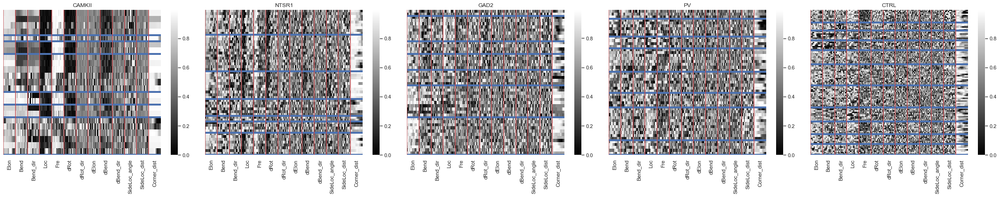

In [252]:
measures_labels = ['Elon', 'Bend', 'Bend_dir', 'Loc', 'Fre', 'dRot', 'dRot_dir', 'dElon', 'dBend', 'dBend_dir', 'SideLoc_angle', 'SideLoc_dist', 'Corner_dist']
measures_list = trials_dict['gad2'][(1318,1)][0]['measures'].columns

num_measures = len(trials_dict['camk2'][(714,1)][0]['measures'].columns)

def create_heatmap(trials, measures, time_window):
    heatmap = np.zeros(shape=(len(trials), len(measures)*time_window))
    for i, stim_trial in enumerate(trials):
        stim_trial_npy = stim_trial['measures'][measures].to_numpy()
        stim_trial_npy_flat = stim_trial_npy.flatten('F')
        stim_trial_npy_flat = np.clip(stim_trial_npy_flat, -1, 1)
        heatmap[i] = stim_trial_npy_flat
    return heatmap

# Visualize
camk2_heatmap = create_heatmap(camk2_trials, measures_list, time_window)
ntsr_heatmap = create_heatmap(ntsr_trials, measures_list, time_window)
gad2_heatmap = create_heatmap(gad2_trials, measures_list, time_window)
pv_heatmap = create_heatmap(pv_trials, measures_list, time_window)
ctrl_heatmap = create_heatmap(ctrl_trials, measures_list, time_window)

fig, axs = plt.subplots(1, 5, figsize=(30, 6))
sb.heatmap(camk2_heatmap, cmap='gray', ax=axs[0]) # cmap='vlag'
axs[0].set_title('CAMKII')
sb.heatmap(ntsr_heatmap, cmap='gray', ax=axs[1])
axs[1].set_title('NTSR1')
sb.heatmap(gad2_heatmap, cmap='gray', ax=axs[2])
axs[2].set_title('GAD2')
sb.heatmap(pv_heatmap, cmap='gray', ax=axs[3])
axs[3].set_title('PV')
sb.heatmap(ctrl_heatmap, cmap='gray', ax=axs[4])
axs[4].set_title('CTRL')

trial_idxs = np.cumsum([len(trials_dict['gad2'][(exps, sess)]) for exps, sess in trials_dict['gad2']])
for idx in trial_idxs:
    axs[2].axhline(idx, c='b', linewidth=4)
    
trial_idxs = np.cumsum([len(trials_dict['ntsr'][(exps, sess)]) for exps, sess in trials_dict['ntsr']])
for idx in trial_idxs:
    axs[1].axhline(idx, c='b', linewidth=4)
    
trial_idxs = np.cumsum([len(trials_dict['camk2'][(exps, sess)]) for exps, sess in trials_dict['camk2']])
for idx in trial_idxs:
    axs[0].axhline(idx, c='b', linewidth=4)
    
trial_idxs = np.cumsum([len(trials_dict['pv'][(exps, sess)]) for exps, sess in trials_dict['pv']])
for idx in trial_idxs:
    axs[3].axhline(idx, c='b', linewidth=4)
    
trial_idxs = np.cumsum([len(trials_dict['ctrl'][(exps, sess)]) for exps, sess in trials_dict['ctrl']])
for idx in trial_idxs:
    axs[4].axhline(idx, c='b', linewidth=4)

for ax in axs:
    for i in range(num_measures):
        ax.axvline(time_window*i, c='r')
    ax.set_xticks(ticks=[time_window*i+(time_window//2) for i in range(num_measures)])
    ax.set_xticklabels(labels=measures_labels, rotation=90)
    ax.set_yticks([])
plt.tight_layout()

# plt.savefig('measures_responses.png', dpi=200)
plt.show()

In [162]:
def mov_locomotion_side_trial(trial):
    orient_vector = trial.iloc[0]['nose'][['x', 'y']] - trial.iloc[0]['tail_start'][['x', 'y']]
    angles = -trial.iloc[0]['R'][0]
#     print(angles)
    rot_matrix = np.array([[np.cos(angles), -np.sin(angles)], [np.sin(angles), np.cos(angles)]])

    orient_vector_R = orient_vector @ rot_matrix.T
    start_pos = trial.iloc[0][['T_x', 'T_y']]
    transl_vectors = trial[['T_x', 'T_y']] - start_pos
#     transl_vectors = trial[['T_x', 'T_y']].diff().reset_index(drop=True)
    transl_vectors = transl_vectors.droplevel(level=1, axis=1)

    dot = orient_vector_R[0] * transl_vectors['T_x'] + orient_vector_R[1] * transl_vectors['T_y']
    det = orient_vector_R[0] * transl_vectors['T_y'] - orient_vector_R[1] * transl_vectors['T_x']
    angle = np.arctan2(det, dot)

    transl_vectors = transl_vectors.rename(columns={"T_x": "x", "T_y": "y"})
    tiled_orient_vector_R = np.tile(orient_vector_R, (len(transl_vectors),1))
#     print(tiled_orient_vector_R.shape)
    orth_proj = np.multiply(tiled_orient_vector_R, dot[:, np.newaxis]) / orient_vector_R.dot(orient_vector_R)
    lateral_distance = np.linalg.norm(transl_vectors - orth_proj, axis=1)
    lateral_distance = lateral_distance * np.sign(angle) * -1
    return lateral_distance
responses = {}
responses['gad2'] = []
responses['pv'] = []
responses['ctrl'] = []
responses['camk2'] = []
responses['ntsr'] = []

for trial in gad2_trials:
    responses['gad2'].append(mov_locomotion_side_trial(trial))
for trial in ctrl_trials:
    responses['ctrl'].append(mov_locomotion_side_trial(trial))
for trial in camk2_trials:
    responses['camk2'].append(mov_locomotion_side_trial(trial))
for trial in pv_trials:
    responses['pv'].append(mov_locomotion_side_trial(trial))
for trial in ntsr_trials:
    responses['ntsr'].append(mov_locomotion_side_trial(trial))

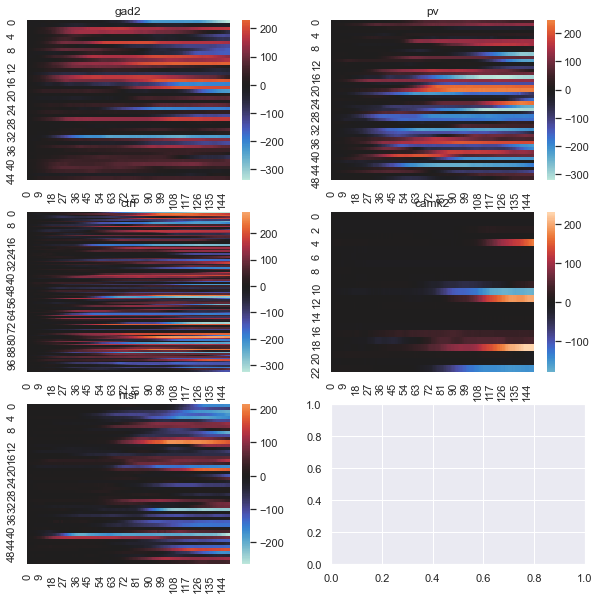

In [163]:
# sb.heatmap(np.array(responses['gad2']), center=0, vmin=-100, vmax=100)
# plt.title('gad2')
# plt.show()
# sb.heatmap(np.array(responses['pv']), center=0, vmin=-100, vmax=100)
# plt.title('pv')
# plt.show()
# sb.heatmap(np.array(responses['ctrl']), center=0, vmin=-100, vmax=100)
# plt.title('ctrl')
# plt.show()
# sb.heatmap(np.array(responses['camk2']), center=0, vmin=-100, vmax=100)
# plt.title('camk2')
# plt.show()
# sb.heatmap(np.array(responses['ntsr']), center=0, vmin=-100, vmax=100)
# plt.title('ntsr')
# plt.show()
fig, axs = plt.subplots(3, 2, figsize=(10, 10))
sb.heatmap(np.array(responses['gad2']), center=0, ax=axs[0,0])
axs[0,0].set_title('gad2')
sb.heatmap(np.array(responses['pv']), center=0, ax=axs[0,1])
axs[0,1].set_title('pv')
sb.heatmap(np.array(responses['ctrl']), center=0, ax=axs[1,0])
axs[1,0].set_title('ctrl')
sb.heatmap(np.array(responses['camk2']), center=0, ax=axs[1,1])
axs[1,1].set_title('camk2')
sb.heatmap(np.array(responses['ntsr']), center=0, ax=axs[2,0])
axs[2,0].set_title('ntsr')
# plt.savefig('lateral_distances.png', dpi=150)
plt.show()

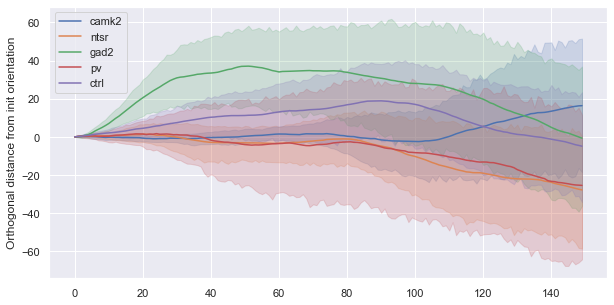

In [164]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5), sharey=True, sharex=True)
timepoints = np.tile(np.arange(0, time_window, 1), (len(responses['camk2'])))
sb.lineplot(timepoints, np.concatenate(responses['camk2']), dashes=None, ax=ax, label='camk2')
timepoints = np.tile(np.arange(0, time_window, 1), (len(responses['ntsr'])))
sb.lineplot(timepoints, np.concatenate(responses['ntsr']), dashes=None, ax=ax, label='ntsr')
timepoints = np.tile(np.arange(0, time_window, 1), (len(responses['gad2'])))
sb.lineplot(timepoints, np.concatenate(responses['gad2']), dashes=None, ax=ax, label='gad2')
timepoints = np.tile(np.arange(0, time_window, 1), (len(responses['pv'])))
sb.lineplot(timepoints, np.concatenate(responses['pv']), dashes=None, ax=ax, label='pv')
timepoints = np.tile(np.arange(0, time_window, 1), (len(responses['ctrl'])))
sb.lineplot(timepoints, np.concatenate(responses['ctrl']), dashes=None, ax=ax, label='ctrl')
ax.legend(loc='upper left')
ax.set_ylabel('Orthogonal distance from init orientation')
# plt.savefig('trial_lat_distance.png', dpi=150)
plt.show()

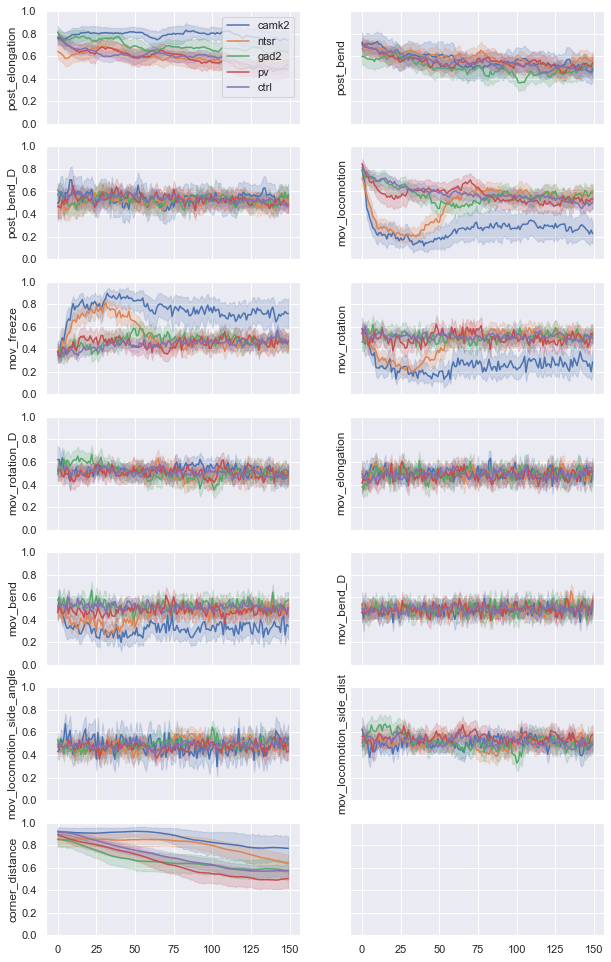

In [165]:
fig, axs = plt.subplots(int(np.ceil(num_measures/2)), 2, figsize=(10, 17), sharey=True, sharex=True)

# mouselines = ['ntsr', 'gad2', 'camk2']
measures_to_visualize = []
for line, exp_dict in trials_dict.items():
    measures_data= {}
    for (exp, sess), trials in exp_dict.items():
        for stim_trial in trials:
            for measure in stim_trial['measures']:
                if measure not in measures_data:
                    measures_data[measure] = []
                measures_data[measure].append(stim_trial['measures', measure])
                
    timepoints = np.tile(np.arange(0, time_window, 1), (len(measures_data['mov_rotation'])))
    for i, (measure, measure_data) in enumerate(measures_data.items()):
        data = np.concatenate(measure_data)
        if i == 0:
            sb.lineplot(x=timepoints, y=data, dashes=None, ax=axs[i//2,i%2], label=line)
        else:
            sb.lineplot(x=timepoints, y=data, dashes=None, ax=axs[i//2,i%2])
        axs[i//2,i%2].set(ylabel=measure)

axs[0,0].legend(loc='upper right')

plt.ylim(0, 1)
# plt.savefig('measures_graphs_new.png', dpi=150)
plt.show()

In [170]:
combined_heatmap = np.vstack([camk2_heatmap, ntsr_heatmap, gad2_heatmap, pv_heatmap, ctrl_heatmap])

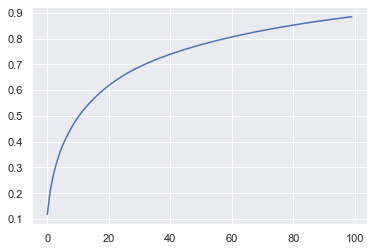

In [521]:
from sklearn.decomposition import PCA

pca = PCA(n_components=100)
pca.fit(combined_heatmap)
components = pca.components_
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.show()

In [522]:
print(combined_heatmap.shape)
combined_heatmap_pcs = pca.transform(combined_heatmap)

(274, 1200)


In [523]:
combined_heatmap_pcs.shape

(274, 100)

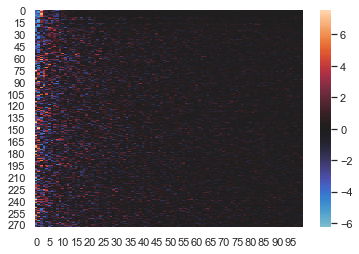

In [524]:
sb.heatmap(combined_heatmap_pcs, center=0)
plt.show()

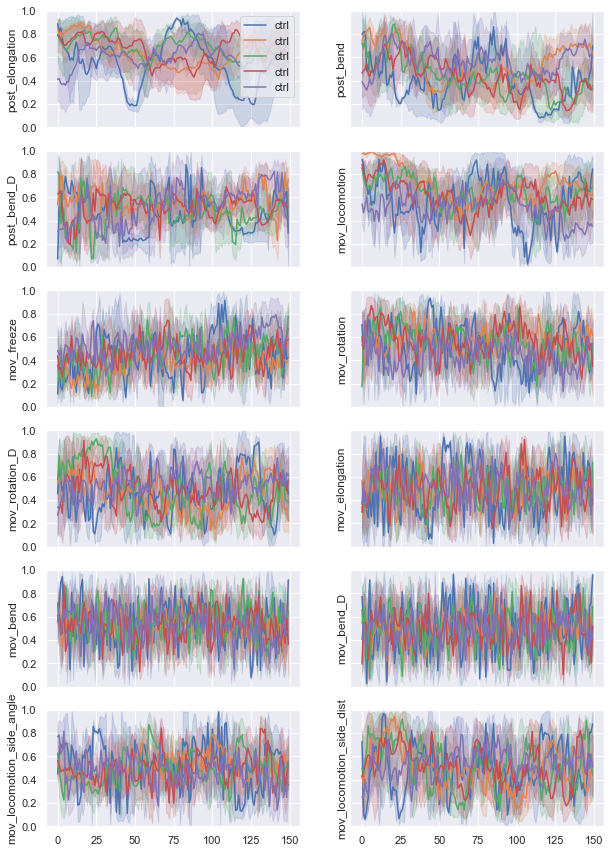

In [52]:
fig, axs = plt.subplots(int(np.ceil(num_measures/2)), 2, figsize=(10, 15), sharey=True, sharex=True)

measures_to_visualize = []
for (exp, sess), trials in trials_dict['gad2'].items():
    measures_data= {}

    for stim_trial in trials:
        for measure in stim_trial['measures']:
            if measure not in measures_data:
                measures_data[measure] = []
            measures_data[measure].append(stim_trial['measures', measure])

    timepoints = np.tile(np.arange(0, time_window, 1), (len(measures_data['mov_rotation'])))
    for i, (measure, measure_data) in enumerate(measures_data.items()):
        data = np.concatenate(measure_data)
        if i == 0:
            sb.lineplot(x=timepoints, y=data, dashes=None, ax=axs[i//2,i%2], label=line)
        else:
            sb.lineplot(x=timepoints, y=data, dashes=None, ax=axs[i//2,i%2])
        axs[i//2,i%2].set(ylabel=measure)

axs[0,0].legend(loc='upper right')

plt.ylim(0, 1)
# plt.savefig('measures_graphs_new.png', dpi=150)
plt.show()

In [258]:
import umap
reducer_umap = umap.UMAP() # set low_memory=True
# embeddings_umap = reducer_umap.fit_transform(np.vstack([stim_heatmap, rand_heatmap]))
embeddings_umap = reducer_umap.fit_transform(combined_heatmap)

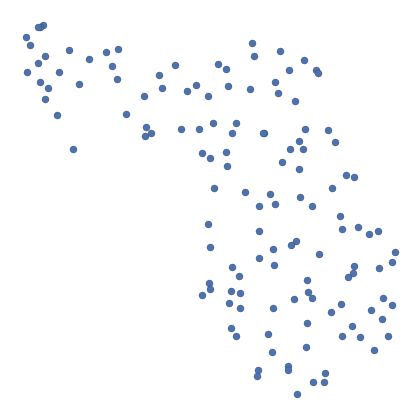

In [248]:
fig, axs = plt.subplots(1, 1, figsize=(6, 6), sharex=True, sharey=True)

axs.scatter(embeddings_umap[::1,0], embeddings_umap[::1,1], alpha=1, linewidth=0.2, edgecolors='k', s=50)

axs.set_axis_off()
axs.set(xticks=[], yticks=[])
fig.tight_layout()
plt.show()

In [190]:
def information_analysis(trial_labels, trial_mouselines):
    """ Estimate statistical dependence between response clusters and stimuli"""
    label_counts = np.unique(labels, return_counts=True)
    label_counts = dict(zip(label_counts[0], label_counts[1]))
    P_g = {cluster: count/len(trial_labels) for cluster, count in label_counts.items()}
    
    line_counts = np.unique(trial_mouselines, return_counts=True)
    line_counts = dict(zip(line_counts[0], line_counts[1]))
    P_s = {line: count/len(trial_mouselines) for line, count in line_counts.items()}
    
    label_line_counts = np.unique(list(zip(labels, trial_mouselines)), return_counts=True, axis=0)
#     print(label_line_counts)
    label_line_counts = {(label_line_counts[0][i,0], label_line_counts[0][i,1]): label_line_counts[1][i] for i in range(len(label_line_counts[1]))}
#     label_line_counts = dict(zip(label_line_counts[0], label_line_counts[1]))
    P_gs = {(cluster, line): count/len(trial_labels) for (cluster, line), count in label_line_counts.items()} 
    
    P_g_given_s = {(cluster, line): p/P_s[line] for (cluster, line), p in P_gs.items()}
    
    H_g = -sum([p*np.log2(p) for p in P_g.values()])
    H_g_given_s = -sum([P_gs[(cluster, line)]*np.log2(P_g_given_s[(cluster, line)]) for cluster, line in P_gs.keys()])
    
    return H_g - H_g_given_s
    # Correct estimates of H_g and H_g_given_s
    # Calculate MI as difference of these corrected estimates

In [428]:
concatenated = pd.concat([resp for key, resp_list in responses.items() for resp in resp_list])
concatenated = concatenated.reset_index(drop=True)
print(concatenated.shape)
idxs = np.cumsum([len(resp) for key, resp in responses.items()])
idxs_tuples = list(zip(np.insert(idxs, 0, 0), idxs)) # Create (start, end) tuples
# measures.normalize_quantiles(dlc_all, n_intervals=10000)
# Normalization
num_intervals = 1000
intervals = np.linspace(0, 1, num=num_intervals)
values = np.squeeze(np.repeat(intervals[:, None], np.ceil(len(concatenated) / num_intervals), axis=0))[:len(concatenated)]
# print(values)
concatenated = concatenated.sort_values()
idxs = concatenated.index
concatenated.update(pd.Series(values, index=idxs))
concatenated = concatenated.sort_index()
concat_reshaped = concatenated.to_numpy().reshape((-1, time_window))

(41100,)
149      0.000000
148      0.000000
147      0.000000
14391    0.000000
14390    0.000000
           ...   
26539    0.978979
26538    0.978979
26536    0.978979
26537    0.978979
26535    0.978979
Length: 41100, dtype: float64
0        0.432432
1        0.392392
2        0.355355
3        0.346346
4        0.343343
           ...   
41095    0.720721
41096    0.722723
41097    0.726727
41098    0.728729
41099    0.733734
Length: 41100, dtype: float64


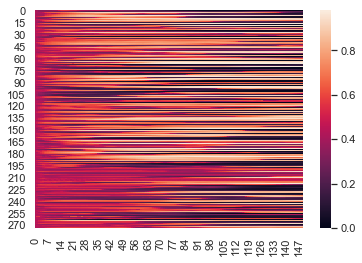

In [429]:
sb.heatmap(concat_reshaped)
plt.show()

In [430]:
responses_norm = {key: concat_reshaped[idxs_tuples[i][0]:idxs_tuples[i][1]] for i, key in enumerate(responses.keys())}

In [431]:
concat_reshaped.shape

(274, 150)

In [539]:
clustering_measures = ['post_elongation', 'post_bend', 'mov_locomotion', 'mov_freeze', 'mov_locomotion_side_dist', 'corner_distance']
# Normalize responses
# Add responses to the overall heatmap

camk2_heatmap = create_heatmap(camk2_trials, clustering_measures, time_window)
camk2_heatmap = np.hstack([camk2_heatmap, responses_norm['camk2']])
ntsr_heatmap = create_heatmap(ntsr_trials, clustering_measures, time_window)
ntsr_heatmap = np.hstack([ntsr_heatmap, responses_norm['ntsr']])
gad2_heatmap = create_heatmap(gad2_trials, clustering_measures, time_window)
gad2_heatmap = np.hstack([gad2_heatmap, responses_norm['gad2']])
pv_heatmap = create_heatmap(pv_trials, clustering_measures, time_window)
pv_heatmap = np.hstack([pv_heatmap, responses_norm['pv']])
ctrl_heatmap = create_heatmap(ctrl_trials, clustering_measures, time_window)
ctrl_heatmap = np.hstack([ctrl_heatmap, responses_norm['ctrl']])

combined_heatmap = np.vstack([camk2_heatmap, ntsr_heatmap, gad2_heatmap, pv_heatmap, ctrl_heatmap])
trial_mouselines = ['camk2']*len(camk2_heatmap)+['ntsr']*len(ntsr_heatmap)+['gad2']*len(gad2_heatmap)+['pv']*len(pv_heatmap)+['ctrl']*len(ctrl_heatmap)


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29


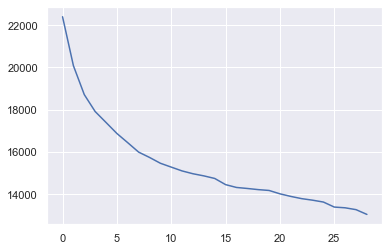

In [540]:
import sklearn.cluster
# Clustering
ssqs = []
MIs = []
for k in range(1, 30):
    print(k)
    kmeans = sklearn.cluster.KMeans(n_clusters=k, init='k-means++', max_iter=500)
    kmeans.fit(combined_heatmap_pcs)
    ssqs.append(kmeans.inertia_)
    labels = kmeans.predict(combined_heatmap_pcs)
    MIs.append(information_analysis(labels, trial_mouselines))
    
plt.plot(ssqs)

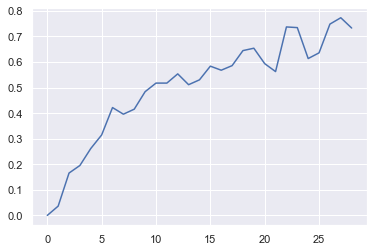

In [541]:
plt.plot(MIs)

In [544]:
n_clusters=8
kmeans = sklearn.cluster.KMeans(n_clusters=n_clusters, init='k-means++', max_iter=10000)
kmeans.fit(combined_heatmap)
labels = kmeans.predict(combined_heatmap)


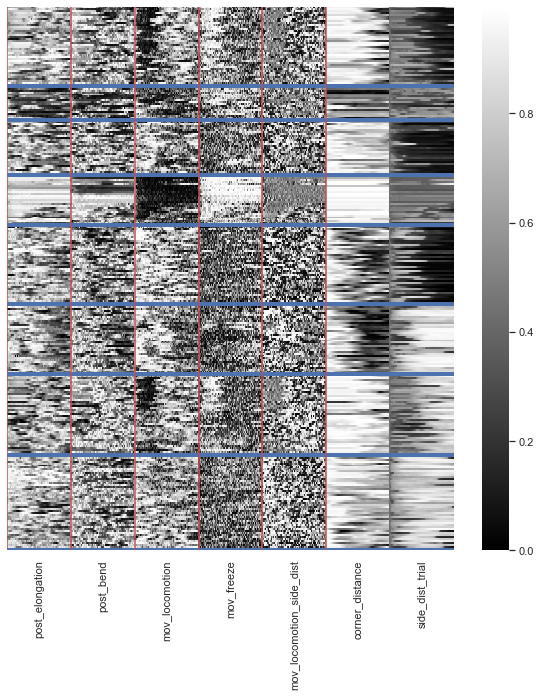

In [559]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
heatmap_clusters = []
heatmap_mouselines = []
for cluster in range(n_clusters):
    heatmap_clusters.append(combined_heatmap[labels==cluster])
    heatmap_mouselines.append(np.array(trial_mouselines)[labels==cluster])

combined_heatmap_clustered = np.vstack(heatmap_clusters)
sb.heatmap(combined_heatmap_clustered, cmap='gray', ax=ax) # cmap='vlag'
# axs[0].set_title('CAMKII')
# sb.heatmap(ntsr_heatmap, cmap='gray', ax=axs[1])
# axs[1].set_title('NTSR1')
cluster_bounds = np.cumsum([len(heatmap_cluster) for heatmap_cluster in heatmap_clusters])
for bound in cluster_bounds:
    ax.axhline(bound, c='b', linewidth=4)
for i in range(len(clustering_measures)):
    ax.axvline(time_window*i, c='r')
ax.set_xticks(ticks=[time_window*i+(time_window//2) for i in range(len(clustering_measures)+1)])
ax.set_xticklabels(labels=clustering_measures + ['side_dist_trial'], rotation=90)
ax.set_yticks([])
plt.savefig('clustering_heatmap.png', dpi=100)
plt.show()

In [546]:
# Should give same result as in information_analysis

# p_c_given_s = {c, s: len(labels[(labels==1) & (trial_mouselines=='CAMKII')]/len(labels[trial_mouselines=='CAMKII']) for c, s in }
temp = pd.DataFrame({'labels': labels, 'line': trial_mouselines})

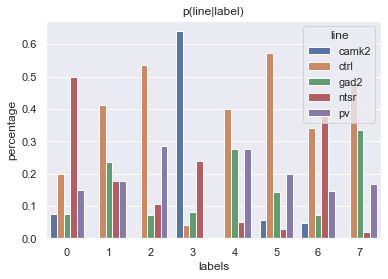

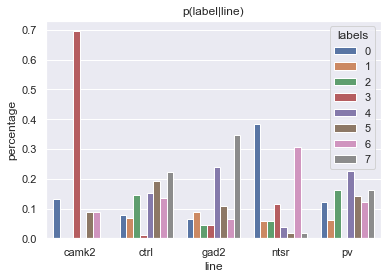

In [549]:
# p(line|label)
# percentages = (temp.groupby(['labels'])['line']
#                      .value_counts(normalize=True)
#                      .rename('percentage')
#                      .reset_index()
#                      .sort_values('line'))
# sb.barplot(x="line", y="percentage", hue="labels", data=percentages)
# plt.title("p(line|label)")
# plt.savefig('lines_P_line_label.png', dpi=100)
# plt.show()

percentages = (temp.groupby(['labels'])['line']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .reset_index()
                     .sort_values('line'))
sb.barplot(x="labels", y="percentage", hue="line", data=percentages)
plt.title("p(line|label)")
plt.savefig('clusters_P_line_label.png', dpi=100)
plt.show()

# p(label|line)
fig, ax = plt.subplots(1, 1)
percentages = (temp.groupby(['line'])['labels']
                     .value_counts(normalize=100)
                     .rename('percentage')
                     .reset_index()
                     .sort_values('line'))
sb.barplot(x="line", y="percentage", hue="labels", data=percentages, ax=ax)
plt.title("p(label|line)")
plt.savefig('lines_P_label_line.png', dpi=100)
plt.show()

# percentages = (temp.groupby(['line'])['labels']+
#                      .value_counts(normalize=True)
#                      .rename('percentage')
#                      .reset_index()
#                      .sort_values('line'))
# sb.barplot(x="labels", y="percentage", hue="line", data=percentages)
# plt.title("p(label|line)")
# plt.savefig('clusters_P_label_line.png', dpi=100)
# plt.show()


In [568]:
labels_mouselines = list(temp.groupby(['line'])['labels'])
labels_mouselines

[('camk2',
  0     3
  1     3
  2     3
  3     3
  4     3
  5     3
  6     3
  7     3
  8     3
  9     3
  10    0
  11    0
  12    6
  13    3
  14    3
  15    3
  16    3
  17    5
  18    5
  19    6
  20    3
  21    3
  22    0
  Name: labels, dtype: int32),
 ('ctrl',
  170    4
  171    5
  172    5
  173    6
  174    5
        ..
  269    2
  270    0
  271    2
  272    6
  273    2
  Name: labels, Length: 104, dtype: int32),
 ('gad2',
  75     4
  76     2
  77     5
  78     7
  79     4
  80     4
  81     5
  82     4
  83     4
  84     4
  85     7
  86     7
  87     5
  88     7
  89     0
  90     4
  91     7
  92     7
  93     4
  94     6
  95     4
  96     1
  97     6
  98     1
  99     5
  100    4
  101    7
  102    0
  103    7
  104    3
  105    1
  106    6
  107    1
  108    4
  109    7
  110    0
  111    7
  112    3
  113    7
  114    7
  115    7
  116    5
  117    7
  118    7
  119    2
  120    7
  Name: labels, dtype: int32),
 ('nts

In [611]:
from importlib import reload  
# from videoplayer.videowriter import VideoWriter
import videoplayer.videowriter
reload(videoplayer.videowriter)


<module 'videoplayer.videowriter' from 'C:\\Users\\bramn\\Documents\\Projects\\OpenfieldAnalysis\\videoplayer\\videowriter.py'>

In [612]:
# Create videos of clusters
starts_dict = {'CAMKII': camk2_starts, 'NTSR1': ntsr_starts, 'CONTROL': ctrl_starts, 'GAD2': gad2_starts, 'PV': pv_starts}
mouselines = ['CAMKII', 'NTSR1', 'CONTROL', 'GAD2', 'PV']
mouselines2 = ['camk2', 'ntsr', 'ctrl', 'gad2', 'pv']

for i in range(n_clusters):
    writer = videoplayer.videowriter.VideoWriter(f'cluster{i}.avi')
    for li in range(len(mouselines)):
        print(li)
        la = [labels for line, labels in labels_mouselines if line==mouselines2[li]][0]
        la = la.reset_index(drop=True)
        starts = np.array(starts_dict[mouselines[li]])[la==i]
#         print(starts)
        for (exp, sess, start) in starts:
            start_trial = start+offsets[mouselines[li]][(exp, sess)]
            stop_trial = start_trial + 5*30
            try:
                data_dlc, stim_times = data_opto.get_session_dlc(mouselines[li], exp, sess, 20)
                video_path = data_opto.get_video_path(mouselines[li], exp, sess)
                writer.add_trial(data_dlc, video_path, start_trial, stop_trial)
#                 trial_viewer.play_DLC_video_segment(data_dlc, video_path, start_trial, stop_trial)
            except:
                pass
    writer.write()
            
#             exp, sess, start = camk2_starts[1]
#             labels_mouselines[2][1].reset_index(drop=True)

#         print(exp, sess)
#         start_trial = start+offsets[line][(exp, sess)]
#         stop_trial = start_trial + 5*30
#         data_dlc, stim_times = data_opto.get_session_dlc(line, exp, sess, 20)
#         video_path = data_opto.get_video_path(line, exp, sess)
#         trial_viewer.play_DLC_video_segment(data_dlc, video_path, start_trial, stop_trial)

0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
13797.0 13947.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
14706.0 14856.0
1
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
5440.0 5590.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
7456.0 7606.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
8707.0 8857.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
11437.0 11587.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
15510.0 15660.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
16928.0 17078.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
35011.0 35161.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
4528.0 4678.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
7560.0 7710.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
21490.0 21640.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
32886.0 33036.0
['ear_left', 'ear_

2
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
5448.0 5598.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
14239.0 14389.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
16572.0 16722.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
18560.0 18710.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
18783.0 18933.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
15919.0 16069.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
22474.0 22624.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
8584.0 8734.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
15387.0 15537.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
16265.0 16415.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
18092.0 18242.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
20223.0 20373.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
4420.0 4570.0
['ear_left', 'ea

['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
8198.0 8348.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
11394.0 11544.0
0
1
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
31996.0 32146.0
2
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
5353.0 5503.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
12059.0 12209.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
7669.0 7819.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
13277.0 13427.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
19316.0 19466.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
10057.0 10207.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
12178.0 12328.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
25353.0 25503.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
10881.0 11031.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
11475.0 11625.0
['ear_left',

In [463]:
offsets['CAMKII']

{(714.0, 1.0): 1150,
 (715.0, 1.0): 989,
 (722.0, 1.0): 1593,
 (723.0, 1.0): 809,
 (865.0, 1.0): 163,
 (866.0, 1.0): 790,
 (1314.0, 1.0): 1037,
 (1315.0, 1.0): 936,
 (1316.0, 1.0): 905,
 (1317.0, 1.0): 2239}

In [600]:
# from importlib import reload  
# reload(dataset_opto)
from data import dataset_opto
from videoplayer import trial_viewer
data_opto = dataset_opto.DatasetOpto(db_path, data_path) 

In [564]:
line = 'CAMKII'


714.0 1.0
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
7354 7504


In [242]:
list(temp.groupby(['labels'])['line'])

[(0,
  55     ntsr
  56     ntsr
  65     ntsr
  77     gad2
  78     gad2
  79     gad2
  80     gad2
  82     gad2
  83     gad2
  84     gad2
  88     gad2
  91     gad2
  95     gad2
  106    gad2
  114    gad2
  136      pv
  138      pv
  148      pv
  170    ctrl
  173    ctrl
  176    ctrl
  211    ctrl
  212    ctrl
  217    ctrl
  221    ctrl
  224    ctrl
  226    ctrl
  229    ctrl
  230    ctrl
  242    ctrl
  250    ctrl
  252    ctrl
  253    ctrl
  254    ctrl
  263    ctrl
  268    ctrl
  273    ctrl
  Name: line, dtype: object),
 (1,
  19     camk2
  37      ntsr
  57      ntsr
  66      ntsr
  85      gad2
  86      gad2
  92      gad2
  101     gad2
  103     gad2
  109     gad2
  110     gad2
  111     gad2
  115     gad2
  117     gad2
  118     gad2
  119     gad2
  134       pv
  137       pv
  139       pv
  146       pv
  147       pv
  152       pv
  153       pv
  156       pv
  157       pv
  160       pv
  162       pv
  180     ctrl
  181     ctrl
  183  

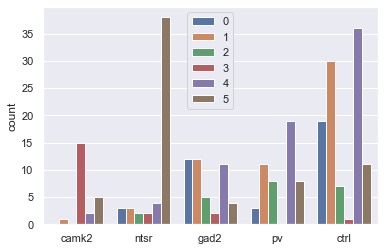

In [206]:
sb.countplot(x=trial_mouselines, hue=labels)
plt.show()

# OLD STUFF

In [3]:
videos_dict = {}
dlcs_dict = {}
for exp, sess in exp_list:
    videos_dict[(exp, sess)] = dataset.load_video(data_path, exp, sess)
    dlcs_dict[(exp, sess)] = dataset.load_dlc(data_path, exp, sess)
    
bodyparts = dlcs_dict[exp_list[0]].df.columns.levels[0].drop('bodyparts')
bodyparts_body = bodyparts.drop('tail_end')

['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']


c:\users\bramn\anaconda3\envs\analysis\lib\site-packages\pandas\core\generic.py:3936: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [586]:
# Preprocess data
camk2_list = [866, 865, 723, 722, 715, 714]
ntsr_list = [990, 989, 988, 908, 905, 904]
gad2_list = [1106, 1108, 1107, 1075, 1074, 1319, 1318]
pv_list = [923, 922, 921, 920, 864, 863, 1105, 1104, 1077, 1076]
ctrl_list = [987, 906]

def preprocess_sessions(exp_list, db, overwrite=False):
    for exp in exp_list:
        # Load sessions
        filenames = db[(db['ExpNr']==exp) & (db['Session']==1)]['fileName'].unique()
        print(filenames)
        for filename in filenames:
    #         filename = camk2_db[(camk2_db['ExpNr']==exp) & (camk2_db['Session']==sess)]['fileName'].unique()[0]
            folder = os.path.join(data_path, str(exp).zfill(5), 'behavior')
            if not os.path.isdir(folder):
                folder = os.path.join(data_path, str(exp).zfill(5), 'Behavior')
                if not os.path.isdir(folder):
                    folder = os.path.join(data_path, str(exp).zfill(5))
            # Check if measuresfile already exists
            if not overwrite and len([file for file in os.listdir(folder) if file.endswith('_measures.csv') and filename.split('.')[0] in file]) > 0:
                print("Preprocessed csv file already created. To overwrite the existing file, set the overwrite parameter to True.")
                continue
            files = [file for file in os.listdir(folder) if file.endswith('.csv') and filename.split('.')[0] in file and 'DLC' in file]
            if len(files) > 1:
                raise Exception("Multiple DLC files found for", exp_id, sess_id, ":", files)
            filepath = os.path.join(folder, files[0])
    #         filepath = os.path.join(folder, filename)
            data_dlc = data_deeplabcut.DataDLC(filepath)
            data_dlc.filter_likelihood(p=0.9)

            df = preprocess(data_dlc.df)

            # Save results
            new_filename = filename.split('.')[0]+'_measures.csv'
            new_filepath = os.path.join(folder, new_filename)
            df.to_csv(new_filepath)
            
preprocess_sessions(camk2_list, camk2_db)
preprocess_sessions(ntsr_list, ntsr_db)
preprocess_sessions(gad2_list, gad2_db)
preprocess_sessions(pv_list, pv_db)
preprocess_sessions(ctrl_list, ctrl_db)

['00866_optotest_01_2018-10-17-114029-0000.csv']
Preprocessed csv file already created. To overwrite the existing file, set the overwrite parameter to True.
['00865_optotest_01_2018-10-17-110906-0000.csv']
Preprocessed csv file already created. To overwrite the existing file, set the overwrite parameter to True.
['00723_optotest_01_2018-01-23-124659-0000.csv']
Preprocessed csv file already created. To overwrite the existing file, set the overwrite parameter to True.
['00722_optotest_01_2018-01-25-123023-0000.csv']
Preprocessed csv file already created. To overwrite the existing file, set the overwrite parameter to True.
['00715_optotest_01_2018-01-23-123712-0000.csv']
Preprocessed csv file already created. To overwrite the existing file, set the overwrite parameter to True.
['00714_optotest_01_2018-01-23-121720-0000.csv']
Preprocessed csv file already created. To overwrite the existing file, set the overwrite parameter to True.
['00990_optotest_01_2019-03-26-133405-0000.csv']
Preproces

c:\users\bramn\anaconda3\envs\analysis\lib\site-packages\pandas\core\generic.py:3936: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)
0it [00:00, ?it/s]

['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']


37000it [06:04, 101.53it/s]


(37000, 8)
nose x   -10.822088
y    -5.043655
Name: 0, dtype: float64
tail_start x   -86.678986
y    -0.953282
Name: 0, dtype: float64
dot 942.8556167374336
magn 1034.9822284848021
['01104_optotest_01_2019-08-10-102417-0000.csv']


c:\users\bramn\anaconda3\envs\analysis\lib\site-packages\pandas\core\generic.py:3936: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)
0it [00:00, ?it/s]

['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']


37000it [06:00, 102.76it/s]


(37000, 8)
nose x      5.196392
y    120.897957
Name: 0, dtype: float64
tail_start x    45.160196
y    65.624307
Name: 0, dtype: float64
dot 8168.514749352181
magn 9639.833844062732
['01077_optotest_01_2019-06-25-151004-0000.csv']


c:\users\bramn\anaconda3\envs\analysis\lib\site-packages\pandas\core\generic.py:3936: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)
0it [00:00, ?it/s]

['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']


37000it [04:48, 128.08it/s]


(37000, 8)
nose x   -13.160579
y    15.737060
Name: 0, dtype: float64
tail_start x   -390.086319
y     23.982021
Name: 0, dtype: float64
dot 5511.168320087317
magn 8017.641343629623
['01076_optotest_01_2019-06-25-144611-0000.csv']


c:\users\bramn\anaconda3\envs\analysis\lib\site-packages\pandas\core\generic.py:3936: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)
0it [00:00, ?it/s]

['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']


37000it [04:46, 129.16it/s]


(37000, 8)
nose x   -122.756067
y   -183.102133
Name: 0, dtype: float64
tail_start x    -60.767504
y   -148.320762
Name: 0, dtype: float64
dot 34617.42770946145
magn 35334.13921695855
['00987_optotest_01_2019-03-26-135940-0000.csv']
Preprocessed csv file already created. To overwrite the existing file, set the overwrite parameter to True.
['00906_optotest_01_2018-11-05-164304-0000.csv']
Preprocessed csv file already created. To overwrite the existing file, set the overwrite parameter to True.


In [2]:
""" Currently only works for Anna's file naming """
data_path = r'Y:\Data'
exp_list = [('01317', '01'), ('01314', '01')]

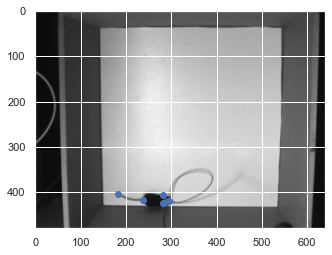

In [4]:
idx = 3500
ref_dlc = dlcs_dict[('01317', '01')].df.loc[idx]
ref_frame = videos_dict[('01317', '01')].get_frame(idx)

plt.imshow(ref_frame)
plt.scatter(ref_dlc.xs('x', level=1, axis=0), ref_dlc.xs('y', level=1, axis=0))
plt.show()

In [5]:
filename = r'storchi/ref_pose.csv'
pd.DataFrame(ref_dlc).T.to_csv(filename)
# ref_dlc = pd.read_csv(filename, index_col=0, header=[0, 1])

In [564]:
# Load all preprocessed data
def load_preprocessed_data(exp_list, db):
    data = {}
    for exp in exp_list:
        # Load sessions
        filenames = db[(db['ExpNr']==exp) & (db['Session']==1)]['fileName'].unique()
        sessions = db[(db['ExpNr']==exp) & (db['Session']==1)]['Session'].unique() # Check that it happens in order
        print(filenames)
        for filename, sess in zip(filenames, sessions):
            folder = os.path.join(data_path, str(exp).zfill(5), 'behavior')
            if not os.path.isdir(folder):
                folder = os.path.join(data_path, str(exp).zfill(5))
            filename_measures = filename.split('.')[0]+'_measures.csv'
            filepath = os.path.join(folder, filename_measures)

            df = pd.read_csv(filepath, header=[0, 1], index_col=0)
            data[(exp, sess)] = df
    return data
            
camk2 = load_preprocessed_data(camk2_list, camk2_db)
ntsr = load_preprocessed_data(ntsr_list, ntsr_db)
gad2 = load_preprocessed_data(gad2_list, gad2_db)
pv = load_preprocessed_data(pv_list, pv_db)
ctrl = load_preprocessed_data(ctrl_list, ctrl_db)

['00866_optotest_01_2018-10-17-114029-0000.csv']
['00865_optotest_01_2018-10-17-110906-0000.csv']
['00723_optotest_01_2018-01-23-124659-0000.csv']
['00722_optotest_01_2018-01-25-123023-0000.csv']
['00715_optotest_01_2018-01-23-123712-0000.csv']
['00990_optotest_01_2019-03-26-133405-0000.csv']
['00989_optotest_01_2019-03-26-125611-0000.csv']
['00988_optotest_01_2019-03-26-112459-0000.csv']
['00908_optotest_01_2018-11-05-160851-0000.csv']
['00905_optotest_01_2018-11-05-153927-0000.csv']
['00904_optotest_01_2018-11-05-150846-0000.csv']
['01106_optotest_01_2019-08-10-111248-0000.csv']
['01108_optotest_01_2019-08-10-120555-0000.csv']
['01107_optotest_01_2019-08-10-114054-0000.csv']
['01075_optotest_01_2019-06-14-132537-0000.csv']
['01074_optotest_01_2019-06-14-125723-0000.csv']
['01319_optotest_01_2020-01-31-114848-0000.csv']
['01318_optotest_01_2020-01-31-110828-0000.csv']
['00923_optotest_01_2018-12-16-102536-0000.csv']
['00922_optotest_01_2018-12-12-180117-0000.csv']
['00921_optotest_01_

In [3]:
videos_dict = {}
dlcs_dict = {}
for exp, sess in exp_list:
    videos_dict[(exp, sess)] = dataset.load_video(data_path, exp, sess)
    dlcs_dict[(exp, sess)] = dataset.load_dlc(data_path, exp, sess)
    dlcs_dict[(exp, sess)].df['led'] = dataset.load_led(data_path, exp, sess)

bodyparts = dlcs_dict[exp_list[0]].df.columns.levels[0].drop('bodyparts')
bodyparts = bodyparts.drop('led')
bodyparts_body = bodyparts.drop('tail_end')


c:\users\bramn\anaconda3\envs\analysis\lib\site-packages\pandas\core\generic.py:3936: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']
['ear_left', 'ear_right', 'nose', 'tail_end', 'tail_start']


In [4]:
# Combine all dataframes
df_all = pd.concat([dlc.df for dlc in list(dlcs_dict.values())])

In [5]:
# Filter out poses with low likelihood bodyparts
p = 0.9

df_all = df_all[np.all(df_all.xs('likelihood', level=1, axis=1)>0.9, axis=1)]

## Superimposition

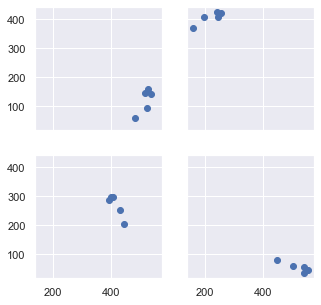

In [6]:
idxs = [500, 1000, 1500, 5000]
fig, axs = plt.subplots(2, 2, figsize=(5, 5), sharex=True, sharey=True)
for i, idx in enumerate(idxs):
    axs[i//2][i%2].scatter(df_all.iloc[idx].xs('x', level=1, axis=0), df_all.iloc[idx].xs('y', level=1, axis=0))
plt.show()

In [7]:
# TODO: Filter and reconstruct bodyparts
df_all_sub = df_all.iloc[::10]
len(df_all_sub)

6897

In [8]:
ref_idx = 2000
ref = df_all_sub.iloc[ref_idx]
df_pps = pps.partial_procrustes_superimposition(df_all_sub, bodyparts_body, bodyparts, ref=ref)

0it [00:00, ?it/s]c:\users\bramn\anaconda3\envs\analysis\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
6it [00:00, 56.09it/s]

-0.7297782897949219
-2.258537099220878
3.7484169006347656
3.80239572082824
10.05801773071289
9.200391402766964
-89.08140182495117
-85.97470183715379
-13.076656341552734
-10.744250024374328
-3.0144500732421875
0.09909447852929087
-0.4698638916015625
-1.5889149894578072
2.2859344482421875
2.8817217645293685
-31.33833312988287
-13.993494599406736
1.1983795166015625
-1.3919012536008515
6.955024719238281
-2.2990255554052115
8.641242980957031
13.438845141617788
22.796485900878906
14.702854677233717
-62.647972106933594
-34.99497165364478
-38.39275360107422
-25.84267426344627
10.548240661621094
-3.87445020361284
7.367179870605469
13.544947156149327
20.692771911621094
16.643990929822472
-90.61923980712896
-54.04877274005909
-38.608192443847656
-26.31448788235896
11.467437744140625
-3.021921288904033
4.855560302734375
14.008399807598307
17.5621337890625
14.16840122552755
-85.9283447265625
-54.8695402119905
-33.8851318359375
-25.154879744221823
11.254661560058594
1.0534456107845085
5.048362731933

20it [00:00, 59.09it/s]


13.995206608240757
13.809600830078011
15.064452080984141
-64.51113891601562
-49.07136618434087
-24.277679443359318
-27.998345306434853
12.980384826660156
-2.4207062532280244
-7.414970397949219
10.782450230214957
-3.1685714721679688
16.655475939681303
-32.29827117919922
-29.487328431379204
-2.3968429565429688
-25.017219916668235
2.4730300903320312
-2.3854017056580608
-9.735160827636662
9.737034001582908
-16.578636169433594
16.650766887301703
10.351753234863338
-10.755775158341589
23.84076690673828
-24.002399183226608
-10.249198913574219
-0.0391686576217154
-8.288108825683594
9.70677671318527
-23.431053161621094
16.154187421843357
58.662849426269645
-7.291615616279749
41.968360900878906
-25.82179547740695
-12.617897033691406
1.2998422200485829
-8.374000549316406
10.742979398856459
-24.57788848876953
15.936410717231858
88.2557601928711
-31.378584784040566
45.569786071777344
-27.9792323361369
-10.361778259277344
-0.8260664485832399
-9.597251892089844
13.10061709791681
-23.93547821044922
1

34it [00:00, 62.00it/s]


-2.7931237212982545
9.99713134765625
12.910130344962933
-4.24224853515625
15.37832327797127
43.98313903808594
-22.390056274785653
6.600341796875
-25.49532990163595
-6.446620941162109
-1.1870101868945797
11.399555206298857
14.093127400853
5.038288116455078
14.97124582477383
8.16305923461914
-32.03359629344247
-9.991222381591797
-27.877363038732174
-8.656017303466797
-1.9507952907024269
11.017749786376953
14.03224465810827
1.7116889953613281
14.993035825001845
5.4837837219238
-49.26555785264992
-4.073421478271484
-27.074485192407703
-9.764549255371094
-2.612358703863685
11.543907165527344
15.060960952361373
0.08722686767578125
15.245619073506457
19.902778625488253
-41.29449158647083
-1.8665847778320312
-27.694221322004147
-10.812568664550781
-1.8268501303314864
10.853401184082003
14.557420281531403
-3.3927230834960938
15.406531194895635
19.20311737060544
-54.19544121044994
3.3518905639648438
-28.137101346095573
-9.866573333740234
1.6170792982343114
4.250965118408203
11.547048189607331
-

40it [00:00, 58.86it/s]


12.019110197321398
21.664875030517578
16.631740082754998
-50.68635177612305
-14.851198387179892
-34.789363861083984
-23.419619080147633
7.115222930908203
-3.202714998507439
11.110065460205021
14.07880915942926
24.06746292114252
16.005620981403098
-84.87972640991211
-38.163630144045214
-42.29275131225586
-26.881715142325014
5.095375061035156
-4.13289393298916
12.491645812988281
13.369512294516895
21.738319396972656
15.964749294885218
-84.2724685668945
-41.71391131907765
-39.325340270996065
-25.20136765641293
5.576347351074219
-3.7979711429382776
12.125602722167969
15.212087081951712
23.32915496826172
15.191236370816206
-92.64786529541016
-50.62252322857683
-41.031105041503906
-26.60535230982964
5.6980438232421875
-3.13002790488789
15.14021301269537
16.44859148907694
20.731674194335938
14.2095200085608
-90.18272399902344
-54.60124179305196
-41.56993103027344
-27.528083592749795
8.165542602539062
-4.449986685630295
8.818038940429688
12.671687764434758
26.850082397460938
18.88743878463608

54it [00:00, 61.46it/s]


9.297157287597543
11.805999741210677
22.47965240478527
14.780675583977633
-90.06758880615234
-53.4723707952914
-37.24449920654297
-24.216023340110283
7.032829284667969
-5.353727555212295
10.403068542480469
13.15276654079002
22.938896179199332
17.068463713989274
-92.8798599243164
-41.57468402642549
-40.374794006347656
-24.867502699566913
13.769210815429744
-3.8556406252701385
2.0448455810547443
10.137970424585404
16.75816345214838
14.919081556398481
-84.97163391113287
-14.723104255141736
-32.57221984863287
-21.201411355713738
13.80442047119152
-2.31072810835069
-3.6442489624023438
11.233130874431744
8.27902984619152
16.365254288900275
-71.00862884521484
-12.797239959108197
-18.43920135498047
-25.287657054981434
11.526046752929688
-2.709131041000174
-9.436538696288949
14.35823211158782
1.8679656982421875
15.22046770399541
-43.05769348144531
-21.990718280604995
-3.9574737548828125
-26.86956877458314
9.543914794921875
-2.947720691841094
-9.643585205078125
12.737873289423835
1.072357177734

68it [00:01, 61.05it/s]

-43.57507783051954
24.56017303466797
-27.752133493480752
3.240447998046875
-1.5337057935988516
-14.08575439453125
14.189240513022867
-12.2327880859375
14.300344417923807
35.616607666015625
-45.086997620522865
23.078094482421875
-26.95587913734782
1.147216796875
-1.0317037624820282
-15.550445556640625
15.571103542061273
-15.24853515625
15.392316124067209
52.36212158203125
-53.0047431290671
29.651763916015625
-29.931715903646452
-0.126068115234375
-3.3863820279581462
-11.733245849609375
11.9205647738651
-17.839508056640625
14.775725180060919
54.07366943359375
-36.15740799466528
29.698822021484375
-23.309907925967877
-10.698089599609375
0.6313276803861934
-9.00640869140625
11.066318074352111
-22.1497802734375
14.419377217073919
86.36703491210938
-32.07558240475911
41.854278564453125
-26.117022971812226
-8.4575576782226
-0.9824880968637819
-10.084327697753963
11.837375131232786
-23.80103302001953
15.852933310408003
90.74312591552734
-44.91079766133192
42.342918395996094
-26.707820344777048

82it [00:01, 62.86it/s]

9.56119831218751
-19.945758819580078
12.712011872904839
81.71059799194336
-50.84481307765891
31.14406967163086
-19.612113793880024
0.2868804931640625
-1.750781577658696
-15.0975341796875
15.290800259671084
-10.72650146484375
7.5370676286343485
74.29408264160159
-65.30176336128228
25.537155151367216
-21.077086310646777
-4.546642303466797
-0.3964471201804294
-9.810649871826172
10.120807359047657
-18.153484344482422
12.186382728352344
84.72940444946292
-61.36231393445901
32.51077651977542
-21.910742967219598
-14.310264587402344
-1.2717756634986968
-1.0312118530273438
4.887706233521745
-16.111061096191406
14.320501532228363
82.31220245361328
-18.74658688500549
31.452537536621094
-17.93643210225141
-11.171924591064453
-3.8753429848644485
6.965145111083984
9.609018550683347
-5.037906646728516
11.958768904442374
42.33198165893555
52.748590286439835
9.244686126708984
-17.69244447026127
-10.93563461303711
-4.158403598021723
8.63888931274414
11.1210724362559
-6.975048065185547
13.175139597138761

89it [00:01, 62.09it/s]


-0.8121743029370245
12.822784423828125
15.340154284490186
5.232772827148409
13.198388404241637
-22.627059936523438
-53.9126949290342
-14.065063476562528
-27.72636838579485
-5.667797088623047
-0.9075022522228466
10.15648269653326
13.357208339577227
2.3159217834472656
13.275694066483672
-14.391231536865263
-59.472090761533494
-6.804607391357422
-25.725400153837974
-9.583023071289091
-0.8216734301246698
9.511749267578097
13.145695819825244
-3.7617034912109375
13.525276888671678
16.593856811523438
-56.26308487086329
3.832977294921875
-25.849299278372293
-11.070770263671875
-0.9988855760244446
7.4521026611328125
13.195316140377823
-4.8701171875
14.833845674365028
34.66168212890631
-50.957109648365616
8.488784790039062
-27.03027623871842
-12.90323257446289
-1.1647048075472188
3.9160575866699503
9.813882156474435
-6.256809234619141
17.462092148697952
56.35796737670893
-37.29835149399112
15.243984222412081
-26.111269497625166
-8.763305664062472
0.7362838992350857
-3.1972808837890625
12.568382

103it [00:01, 64.07it/s]


13.194748731221239
-18.56899642944336
-52.56838143575604
-4.030376434326172
-24.568148285100808
8.899307250976562
-1.408737374546635
-13.085159301757812
15.762753264043397
1.843719482421875
12.449701161926617
0.436065673828125
-57.963899617011876
2.342132568359375
-26.803717051423416
7.558879852294922
12.205956365752751
-5.835422515869141
17.483172986046398
4.394115447998047
-11.743765235943256
-9.98776626586914
-43.30069534952322
-6.117572784423828
-17.945364115855895
9.695674896240234
-0.8554591848842144
-10.46469497680664
13.64634083187713
3.144573211669922
11.42801294096004
-1.8046455383300781
-60.063958947006206
-2.3755531311035156
-24.218894587952953
15.653205871582003
-4.141731313236515
-7.329811096191406
10.90816352510822
3.5075302124023438
13.368126866474563
-13.611396789550781
-43.43699907598738
-11.830924987792969
-20.134559078346253
9.793704986572294
-4.227349022807291
5.209568023681612
11.512451286738184
19.6681098937988
15.61519030297946
-51.82090377807617
-43.7055197529

117it [00:01, 62.75it/s]


16.8394011575254
-91.1609115600586
-64.32324049525704
-41.352561950683594
-24.67989223284927
10.828666687011719
-3.621910043931514
2.6818771362305824
8.766118505194816
19.347282409667855
14.967565171411469
-88.12442779541016
-37.59796771612325
-32.857826232910156
-20.111773632674662
14.449760437011832
-3.8628641913337027
-2.3747329711914062
6.0374359982446455
11.444389343261832
13.71332133835115
-81.81055450439453
-9.604861038324927
-23.51941680908203
-15.887893145262048
15.062492370605469
-7.4949351867765674
-2.0894851684570312
4.725062574694137
6.588584899902344
15.417952914441448
-72.06629180908203
2.806152083009949
-19.56159210205078
-12.64808030235902
10.84405517578125
-5.8173105697625465
-3.40460205078125
2.4510164179439515
-10.716705322265625
14.671837904341865
-50.00750732421875
43.28192957195909
3.277252197265625
-11.305543752523272
7.042915344238281
-2.293392132946056
-5.678428649902344
5.722841277973336
-7.561882019042969
11.806086174977597
-41.257041931152344
32.5444092446

124it [00:01, 62.68it/s]

-18.984127681125845
-3.0597991943359375
-1.3720559064386917
11.716476440429801
11.902038999046276
6.1100921630859375
7.992932448095013
-58.22587585449219
-63.749069521404934
-14.766769409179688
-18.522915540702492
-3.480621337890568
-1.117885280690412
11.667999267578125
12.406268988277752
5.121246337890625
9.039309165551941
-57.836517333984375
-66.74414686417556
-13.308624267578125
-20.32769287313924
-9.506027221679688
-1.4978051321348929
9.396408081054688
11.970420540457061
-1.0881195068359375
12.872658361162573
-29.866409301757812
-64.61571472079268
1.1977386474609375
-23.34527376948474
-8.0928955078125
-0.4494600349722022
3.9005126953125
13.815251942710496
-11.63909912109375
10.000171919852296
8.686248779296875
-68.19569851271872
15.83148193359375
-23.36596382759059
-9.657989501953125
-1.468295811311889
2.737274169921875
14.864034610504458
-13.57867431640625
11.206432852504314
35.23187255859375
-65.51102025457428
20.4993896484375
-24.60217165169688
-10.046401977539006
-0.17455617297

138it [00:02, 61.19it/s]

9.289957003390844
18.48735809326172
14.104181288438543
40.52532196044922
27.800426143905224
-31.467445373535156
-21.90042571605507
6.838539123535156
-3.7384878924131844
8.995399475097656
12.026929848136827
26.625709533691406
18.146086011811022
-86.90129852294922
-34.25873299945627
-42.45964813232422
-26.434527967534663
6.7583465576171875
-3.2768942024697267
9.103988647460994
12.237395749281188
24.196548461914062
16.19056588897017
-88.16191101074219
-41.67835232980065
-40.05888366699219
-25.151067435781584
9.772460937499943
-5.7978696666749565
6.692871093749943
12.329958238324773
24.205261230468807
19.08050702824505
-95.0167846679687
-39.12544900068638
-40.67059326171869
-25.612595599894874
15.311264038086051
-2.440767676244771
-1.5993804931640625
4.82573828660901
7.5574188232421875
14.171928200810326
-78.07209777832031
-5.409942525609949
-21.269302368164062
-16.55689881117459
12.308845520019531
-2.911260343705349
-8.056327819824219
9.978568414911788
4.314369201660156
13.299185794434877

152it [00:02, 63.10it/s]

-24.34904874539321
1.6317825317382812
-4.5716308853229535
-10.507774353027344
10.449183182297556
-20.31871795654297
17.67636532054286
25.31348419189453
-10.14318672496431
29.19470977783203
-23.553917617517456
-3.354362487792912
-2.1320704293103594
-11.563346862792912
11.855509818094928
-20.532981872558594
15.352876184255031
49.44525909423828
-19.784122096575985
35.45069122314453
-25.076315573039693
-3.6404190063476562
-1.2942762415498414
-11.993202209472656
12.31350186985056
-19.20996856689453
13.551185886643948
52.49843597412098
-21.293695460152634
34.843589782714844
-24.57041151494468
-1.4910430908203125
-0.5975530336489381
-14.534286499023438
14.21087277799119
-13.268142700195256
10.990875382675371
40.24299621582031
-26.52276443347749
29.293472290039062
-24.604195127017682
1.5657882690429688
-0.9309786968226799
-16.161476135253906
16.395204451046848
-7.427040100097656
8.218249643124203
34.65233612060547
-39.265924154418414
22.022727966308594
-23.68247539734837
4.7295989990234375
-1.

166it [00:02, 63.45it/s]


2.3078536987304688
7.879329449694803
-9.180854797363281
12.6614659576258
66.20079803466797
12.369431600548733
19.99559783935547
-18.64749529925444
-8.107444763183594
-2.881267804383577
10.241065979003963
12.182189534510217
3.0535049438476562
13.854096503234341
39.24451446533203
1.1070816112601563
-5.187126159667969
-23.155018233360934
-5.799713134765625
-0.7898034507024034
9.858306884765625
12.571297485546852
2.1031494140625
9.448345164524643
28.85443115234375
-6.243177372773069
-6.1617431640625
-21.229839199369092
-4.948478698730469
0.040555622134104574
9.533668518066406
12.759814546751295
0.6665115356445312
8.435047047865417
26.55127716064453
-13.18954982036594
-5.251701354980469
-21.235417216750847
-0.522613525390625
-1.6164226269564494
10.901031494140625
10.789266048587239
13.145050048828125
12.087170790077712
-18.736663818359375
-12.135310002548643
-23.523468017578125
-21.2600142117085
0.14776611328125
-1.066314002804269
12.009033203125
11.881910416621086
14.020385742187557
12.74

173it [00:02, 63.86it/s]


-5.760375909839128
1.8975143432617188
9.3913493224832
15.674003601074332
14.84909866881443
-77.73798370361328
0.3168665951699303
-29.831825256347656
-18.4800720814585
13.151153564453125
-3.2479563706957437
-0.48049926757806816
11.309367514317346
14.481842041015625
12.3020009365673
-76.75369262695312
3.8904595575514693
-27.152496337890625
-20.363412080188844
5.572616577148551
-5.4045865351822915
6.5675506591796875
11.889985358183951
20.58702087402355
13.941232269017592
-85.74702453613281
-40.03849615324614
-32.727188110351506
-20.42663109201906
-0.7446670532225994
-0.8420402252522082
14.04805755615223
14.00907782448382
8.02535247802723
7.800274688440035
-79.3573989868164
-78.9379758525055
-21.32874298095703
-20.967312287671817
-8.849288940429688
-1.4370160605770348
11.184524536132926
14.02822247344234
-2.7352752685546875
11.703472226198514
-31.885757446289062
-77.65185068025623
0.4000396728515625
-24.294678639063736
-11.05718994140625
-1.7294311614070228
7.88836669921875
10.97652283579

187it [00:02, 63.02it/s]


-9.091423034667969
9.375947477732106
-11.024436950683537
16.130033165929692
30.57624053955078
-55.15572344989668
10.147743225097656
-20.268821369869045
2.446105957031307
-4.681830268195467
-13.37725830078125
13.480387196407483
-18.58477783203125
16.115358113544502
68.5631103515625
-57.57809149626136
29.51593017578125
-24.913915041756574
3.356842041015625
-3.0426843292469505
-12.249053955078125
12.280647933629375
-16.83380126953125
17.171816546251822
56.94281005859375
-58.512710698919825
25.72601318359375
-26.409780150634248
-2.9569854736328125
-3.257750741685121
-12.034011840820312
12.361648448526966
-23.04823303222662
17.368305011698745
71.94145202636719
-39.80479107951522
38.03923034667969
-26.472202718540526
-6.831119537353487
2.2732841455051447
-9.508975982665987
9.123956084115136
-18.57590103149414
12.823587514170326
80.82291793823242
-51.86370384440127
34.91599655151367
-24.220827743790643
-1.8414230346679688
-2.9269331684616526
-14.119804382324219
13.811125462264394
-21.4218521

201it [00:03, 62.39it/s]


-88.57714843750003
-65.35954593465205
-34.307632446289006
-21.241247017736157
6.171791076660156
-3.632224919615312
11.281196594238338
11.783987530976548
20.13886260986328
15.357085772233813
-89.32433319091797
-56.353075583328504
-37.59185028076172
-23.50884838359497
8.450736999511719
-2.2024337562859984
10.810966491699219
11.1582081798425
19.95104217529297
15.19930170444812
-89.57035064697266
-52.8971096388613
-39.212745666503906
-24.15507612800462
8.761772155761776
-5.472739509004951
5.765861511230469
10.29675584265073
23.297416687011776
18.330439054342463
-91.42215728759766
-45.11724314966366
-37.825050354003906
-23.15445538798814
8.153915405273324
-4.9909068297455
6.1367645263671875
12.973464795226338
24.505661010742188
17.630965277339378
-91.36174011230469
-58.50283651497173
-38.79634094238281
-25.613523242820264
7.504127502441406
-5.6774229441898605
4.903175354003906
10.782707665826859
21.383888244628906
15.97443038940729
-88.57952117919922
-53.63608551667272
-33.79119110107422
-

208it [00:03, 62.26it/s]

-24.016660015347327
-7.664154052734375
-3.1955676589971374
9.086822509765625
9.992680484242188
9.310577392578125
16.89723994453056
-6.048248291015739
-39.62719836619412
-10.733245849609375
-23.694352769775612
-10.341949462890739
-1.5323120089696447
8.791107177734261
12.785620449178431
-4.306182861328011
15.361368138376651
9.981781005859261
-65.76350354128382
5.857025146484261
-26.614676578585573
-10.23895263671875
-0.269933391900822
3.568817138671875
10.924035423625266
-6.1053466796875
13.904459975441398
23.03506469726574
-66.15241633611762
12.775482177734375
-24.55856200716584
-6.867324829101449
0.714322055073791
6.0863494873046875
9.11361442691356
6.133041381835824
17.00416545562624
2.9725799560546875
-47.54031827227492
-5.352066040039176
-26.832101937613693
-4.776428222656364
-0.7678288326069076
5.99951171875
6.516361147808809
13.08740234375
18.001816630446157
-13.849792480468636
-37.5221297083631
-14.310485839843636
-23.750348945648053
-4.976913452148324
-1.2854924291573475
6.19148

222it [00:03, 61.93it/s]

-2.2785596134015043
6.999557495117074
8.02998268723903
8.028549194335938
14.47249825582008
-0.2663116455079262
-33.302922928464575
-8.269790649414062
-20.223921329657713
-3.2089385986328125
-2.4854068476041116
4.344711303711051
4.346645608958055
14.282455444336051
15.110688071237107
-17.063430786132812
-21.764243360489953
-15.418228149413949
-16.97192683259071
-4.021575927734375
-3.0867313374717034
7.207183837890625
7.134125721267331
11.052764892578125
11.940861700650295
-15.221954345703239
-20.88941858801587
-14.238372802734375
-15.988256084445922
-8.181198120117074
-1.9344675026808478
8.365859985351562
11.019997297457735
-0.4089202880859375
11.029716121964542
-6.818649291992074
-57.74687303063498
0.2242584228515625
-20.115245916741355
-6.9912109375
-3.542413263383498
4.246276855468636
13.760924287195456
-16.443115234375
10.79703170416802
28.080078125
-69.94900078689348
19.188049316406364
-21.015542727979987
-10.055152893066406
-1.3584546764018102
-6.672157287597656
10.957597816145618

236it [00:03, 63.42it/s]


-20.083404541015625
16.057147944536936
83.20986938476562
-69.6690718933024
32.7410888671875
-25.026430003382256
1.4259490966796875
-3.255754081356609
-13.286605834960994
13.207683942748586
-18.790634155273494
16.657031200440194
77.03984069824224
-68.55206860160989
30.651290893554688
-26.608961061832055
-1.851039886474581
-2.697361506722192
-14.047817230224581
13.95952227867074
-21.517253875732422
16.86683912135193
79.64413833618164
-59.53844644147755
37.416110992431584
-28.12899989330048
-3.8842391967773438
-2.674539156933796
-13.307441711425781
13.077427958355669
-24.394935607910156
18.569286637722254
85.22310638427734
-55.34824765931238
41.58661651611328
-28.972175439144124
-6.518135070800781
-3.3066621878455313
-7.557167053222656
9.950574294084968
-21.846153259277344
15.407787967752403
86.02410125732422
-46.89707102338605
35.92145538330078
-22.051700073991817
4.071781158447266
-3.6171252135413683
-13.889217376708984
14.030275218495818
-12.27901840209961
12.930558423178114
67.572086

243it [00:03, 64.19it/s]


-64.49891581772535
-34.8363037109375
-21.82580614559294
-2.3678131103515625
-1.866196891797863
10.954818725585938
11.02749846562382
14.354598999023438
15.007940663737356
-65.59898376464844
-68.11086710073103
-22.941604614257812
-24.169242237563314
-0.05585479736328125
-2.7687201103259875
8.419822692871094
8.212451436124137
21.419151306152344
17.66350175989665
-71.79230499267578
-54.14652061956766
-29.783119201660156
-23.1072330856948
4.480827331542969
-2.2502933263041136
9.203300476074276
9.2412306496004
23.511894226074332
18.08512718809383
-81.76725006103516
-50.677288326819806
-37.196022033691406
-25.076064511389934
6.513908386230469
-5.135781071202438
4.895256042480469
8.46502566536205
21.20177459716797
15.74592816742267
-77.71515655517572
-32.44804328567251
-32.610939025878906
-19.07517276158228
10.889808654785156
-5.808596365160303
0.6960830688476562
7.03130377049593
16.507667541503793
14.458587771134924
-77.09444427490234
-20.13782541225781
-28.09355926513672
-15.681295176470595

257it [00:04, 63.67it/s]

11.884023910369121
-22.944374084472656
13.928752065779326
83.15990447998047
-26.471740840854675
39.97051239013672
-25.329084749484476
-6.0469207763671875
-4.149885629746764
-8.575851440429688
12.237353686661141
-22.489669799804688
15.210113599964
88.79243469238281
-51.831740714864026
37.11244201660156
-23.297581656878375
-9.272476196289062
-1.8607610787420708
-8.508621215820312
12.173489853497081
-23.58827209472662
15.805062218258099
95.11824035644531
-47.34317016321845
41.36936950683594
-26.117790993013077
-8.045768737792997
-1.1289895571879622
-8.797462463378906
10.994544774366176
-23.026237487792997
15.243463184789672
94.39778900146484
-52.83188585098759
39.869468688964844
-25.109018401967848
-7.777729034423828
-2.7462383359506957
-5.658802032470703
10.618945760822156
-23.718708038330078
15.459140069394131
74.06524276733398
-4.685847062211131
37.15523910522458
-23.331847494265574
-2.030437469482422
-2.351694895780759
-10.353328704833984
12.248470275979159
-17.025630950927734
11.1409

271it [00:04, 63.27it/s]


-13.003341674804688
-3.8387616048534143
7.670440673828125
10.781607332658709
-3.6764678955078125
15.820160776141616
59.9283447265625
-7.7808857379557566
9.009368896484375
-22.76300650394691
-5.584648132324219
-1.5188790437319541
9.234642028808565
10.374611917153718
7.605903625488281
13.057960385069606
20.17687225341797
-6.249506373865039
-11.255897521972656
-21.9136932584914
-2.4598312377929688
-2.1064906115504085
9.571479797363281
9.544482763701463
10.375160217285156
10.76335580386687
0.09246063232421875
-1.9125108048554362
-17.48680877685547
-18.201347956017923
0.35584259033203125
-2.8736948393241137
11.081840515136719
11.269469493345904
16.343711853027344
13.13073600104474
-42.479591369628906
-24.23758179840163
-27.781394958496094
-21.52651065506653
1.982421875
-3.8679907376979186
11.624923706054688
11.816941676969275
16.36907958984378
12.823878926371151
-48.31866455078125
-20.002848015005394
-29.976425170898438
-20.772829865642485
7.219982147216797
-3.811794269936418
7.85750961303

285it [00:04, 64.71it/s]


1.8319970867945585
0.7614135742187784
-19.87140411737474
9.208736419677734
-2.8150097987994833
-11.2722358703613
12.3021120979428
-5.9250679016113
15.188944688529556
-25.317325592040987
-22.793080930775247
7.988567352294922
-24.676046987672894
11.684444427490234
-4.334183231700767
-11.226581573486328
12.037240880281738
2.2046470642089844
13.649323793984683
-23.93820571899414
-36.74729833782105
-2.6625099182128906
-21.352381442565655
10.519794464111271
-4.283953757673011
-2.261974334716797
13.44087337660269
13.875476837158203
12.929748112674805
-39.694271087646484
-68.68628651550608
-22.133296966552734
-22.086667731604415
4.706565856933594
-2.624889943890464
11.015129089355412
11.674022213415414
19.157859802246094
13.93310956798637
-86.91419219970706
-76.21626940798605
-34.879554748535156
-22.982241837511335
0.4993133544921875
-2.8299250150085813
9.162399291992188
9.092924965073747
14.388259887695312
12.400323786371477
-70.17581176757812
-59.360671145197
-24.04997253417963
-18.66332373

292it [00:04, 65.29it/s]


0.5895423164780391
3.1217193603515625
10.913110017012437
-6.8918609619140625
12.507998515184697
47.82258605957031
-47.65317906112831
15.402816772460938
-24.010650848675184
-13.561569213867188
-3.0524691449671044
7.3199005126953125
10.603992897852976
-5.1975860595703125
14.543397942814423
51.16651916503906
-29.44699501772166
11.439254760742188
-22.094921695700304
-10.62969970703125
-2.0734518700065334
-0.479339599609375
14.56696809425632
-19.7144775390625
14.366393655877793
73.60403442382812
-60.305364412257944
30.823516845703125
-26.859909880127578
-10.989028930664062
-1.6762016094974976
-6.3002166748046875
10.336266155421905
-24.420196533203125
16.763994141505442
98.34103393554688
-58.41035374242234
41.709442138671875
-25.42405868742985
-8.283329010009766
-1.196324729197511
-8.121753692626953
10.548736810243593
-22.911701202392578
15.226439725462125
91.94186019897461
-49.875542158340984
39.31678390502927
-24.57885180650819
-11.615516662597656
-2.2378501487659888
-5.655906677246094
10

306it [00:04, 64.24it/s]


11.044785282594171
75.56299209594727
2.1408746020469867
20.953632354736357
-15.411240317188984
-13.461585998535156
-4.389187383549898
3.6552047729492188
1.9352958904863127
4.197685241699219
13.402617742433984
56.09331512451172
32.71367384317043
5.608695983886719
-10.948726249370402
-2.195503234863253
-4.370614890648667
10.130668640136747
10.337177534125672
17.656150817871094
15.786553428865382
35.42133331298825
33.01648976963721
-25.59131622314453
-21.75311607234233
-1.2409172058105469
-6.298530801251497
10.466922760009766
11.735399546314756
15.198490142822266
12.378969537606448
-14.024608612060547
6.875717000866475
-24.424495697021484
-17.815838282669706
0.5824661254882812
-4.994710411323152
9.908576965332003
10.888039165560796
13.349678039550781
10.678188727407166
-15.007240295410156
8.956844604666134
-23.840721130371094
-16.57151748164484
2.4108505249023438
-6.131288744458795
9.047416687011719
12.607528199364362
16.288108825683622
11.27204103119978
-13.800987243652344
25.2345290838

320it [00:05, 63.96it/s]


-3.2031820121767565
-8.778484344482422
8.534545046337586
-17.495067596435547
15.230743876341107
-4.346538543701172
16.31208839172782
26.50546646118164
-20.56210691050194
-7.391899108886719
-2.717179416606996
-4.661201477050781
5.949097912300455
-18.517112731933594
14.46795203969676
2.8770675659179688
24.07555375438376
30.570213317871094
-17.699870535390218
-11.251243591308594
-2.8984993976836986
-2.5706253051757812
5.589375533247429
-19.46251678466797
15.595555182756609
9.960243225097656
25.656622382021816
33.284385681152344
-18.28643131832034
-10.839916229248047
-2.623693318847792
-2.657787322998047
8.5038486698508
-21.028850555419922
14.801743960982076
37.72087478637695
20.85332408757307
34.526554107666016
-20.681899311985074
-12.496417999267578
-3.091724286351818
-1.8258705139160156
6.674643713663289
-17.025699615478516
14.711953263087787
32.09199142456055
22.947285496944613
31.34798812866211
-18.294872690399245
-7.629886627197266
-0.18253941311579247
7.268169403076172
10.524816535

327it [00:05, 63.87it/s]


-21.172288720859594
-2.1277999877929688
-5.508466165168518
11.063697814941406
11.661730879181372
13.924034118652372
11.463000677473993
-1.2845993041992188
15.576726991480216
-22.85993194580078
-17.616265391486817
-0.8448638916015625
-4.717689668308351
10.492828369140625
11.086203320485836
14.145111083984375
11.065078469455965
-10.30303955078125
11.943372059986707
-23.793075561523438
-17.43359212163346
3.383544921875
-6.433585645267306
4.8815460205078125
8.0301068473208
20.137283325195312
15.165387492602887
-15.131927490234375
27.991585149031017
-28.402374267578125
-16.76190869465638
9.680561065673828
-6.9118490503941175
1.3300819396972656
9.720912176271788
16.340991973876953
14.9391058033932
-24.01852035522461
44.1929149661485
-27.351634979248047
-17.748168929270875
15.206260681152344
-4.062023109915341
-3.4874343872070312
9.571317266424026
8.512275695800781
16.049195376819178
9.097862243652344
-65.22955184022588
-20.231101989746094
-21.55848953332785
9.219139099121094
-3.563072494685

341it [00:05, 63.40it/s]

-15.64054339453265
-5.375217437744141
-18.851093787759005
10.181167602539062
-4.040186029550407
-11.072769165039062
15.108621190924708
5.870880126953125
8.297161492653974
-33.62669372558594
-16.871225762665624
-4.979278564453125
-19.365596654028273
6.639919281005859
-0.49148352365594405
-8.927677154541016
14.72503520415104
10.328487396240234
4.701460364803405
-37.07176589965823
-23.01887622594455
-8.040729522705078
-18.9350120452985
3.4689483642578125
-4.607713868564233
-0.6821746826171591
16.806822022243487
13.913314819335938
8.093608153301442
-42.13780212402344
-37.648908335378984
-16.700088500976562
-20.292716306980697
1.7226600646972656
-5.3302016425314775
6.143177032470675
10.41058593190357
12.160343170165987
9.395462768293417
-45.306331634521484
-49.75030478908808
-20.026180267333984
-14.475847057665531
2.1443405151366903
-5.927555555464499
4.631233215332003
13.22004721761941
15.385154724121094
10.312289133357183
-38.531150817871094
-49.594447535258304
-22.160728454589844
-17.604

355it [00:05, 63.34it/s]


-37.22699737548828
-46.03572149906374
-19.376609802246094
-17.25681389340244
1.7877464294433878
-4.483174200543994
3.2644615173339844
14.461397400988025
13.893413543701172
7.648583596236897
-36.87656021118164
-46.66605895214657
-18.945621490478516
-17.626806796680924
1.965976715087919
-4.836126203766434
3.793689727783203
14.328670783701769
13.625049591064453
7.978660170169062
-37.13241195678711
-47.4901437441013
-19.384716033935547
-17.47120475010439
2.1507949829101562
-4.494693382259679
3.9566726684570312
12.69860881806868
13.112419128417969
8.5343672406352
-36.13935089111328
-46.36756425507161
-19.219886779785156
-16.7382826764442
1.6212081909179688
-4.725056010062473
4.257957458496094
13.617762815896507
13.622581481933594
8.114101575632798
-36.15807342529297
-47.60949133067075
-19.501747131347656
-17.006808381466833
2.2016029357910156
-4.93071970067543
4.449665069580078
12.51303399270225
14.126300811767578
9.583355783553868
-36.74119186401367
-47.915500212498756
-20.777568817138672

362it [00:05, 63.61it/s]

8.931098147790875
-33.419246673583984
-46.55473050860674
-18.471965789794922
-14.468371921456097
1.0985298156738281
-5.891649741629119
4.320880889892578
12.184172723882535
13.235965728759737
8.492294034256425
-34.93856430053711
-47.02497755571714
-18.655376434326172
-14.784817016509852
1.5567169189453125
-4.9319245354755115
3.965179443359375
10.106981911327665
12.793258666992188
9.115790326869128
-34.21400451660156
-46.010191549565825
-18.315155029296875
-14.29084770272128
0.6130905151367188
-4.823437150372181
5.291450500488281
12.111421719244627
12.705284118652344
7.81502228149171
-33.817832946777344
-46.437698461068564
-18.609825134277344
-15.103006850364157
1.739959716796875
-4.8386418580202815
4.233551025390625
11.295237148109583
13.128814697265625
8.66824219575916
-34.19786071777344
-46.54957425779664
-19.102325439453125
-15.124837485848463
0.42845916748046875
-5.227502834487019
5.292549133300781
12.36408176757796
13.305870056152344
8.134652794437311
-34.90746307373047
-47.8076647

376it [00:05, 63.48it/s]


-17.978378295898438
-14.699791280847181
4.1168022155761435
-4.808751646028726
2.087078094482422
10.664372382551823
14.360179901123047
10.64792421964484
-36.82112503051758
-45.95282892217335
-20.56406021118164
-16.50354495616793
0.17188262939453125
-4.993819754851195
5.768104553222628
14.58124219360858
13.85382843017581
7.376003291959116
-34.973289489746094
-47.81596605535945
-19.79381561279297
-16.963425730716487
2.778945922851534
-5.4293132411045795
3.0120086669921875
12.275022504151533
15.492584228515625
10.201034459538608
-36.17573547363281
-48.263997267296475
-21.283538818359375
-17.046743722585568
0.5998878479003906
-4.44814352459968
4.477771759033203
14.515653209263212
14.561664581298828
7.434064618558056
-37.4160270690918
-48.35705696138347
-19.639324188232422
-17.501574303221574
2.478923797607422
-3.573099954384519
2.9156455993652344
11.064934275219246
12.666530609130831
8.036776351288607
-33.45332717895508
-44.43288250070597
-18.061100006103516
-15.528610672123339
2.250011444

390it [00:06, 64.29it/s]


-33.23273849487305
-36.30721278633503
-13.344707489013672
-19.303978549789385
9.044929504394503
-2.450864214641692
-6.601860046386719
12.806945839514631
10.934974670410156
8.570784279137483
-33.99658966064453
-35.67406894598587
-13.378044128417969
-18.926865904010423
13.022769927978516
-4.680491450272661
-7.558177947998047
10.304787382839413
3.5509071350097656
12.411690403695179
-29.731121063232422
-26.815103368496658
-9.015499114990234
-18.03598633626192
9.245460510253878
-3.7936507551385072
-8.472602844238281
12.353631353698997
4.843711853027344
8.683758584761941
-30.40557098388672
-23.519162274948783
-5.616569519042969
-17.243739183322425
-5.7859039306640625
-3.267110907725531
-4.7269134521484375
5.896806219043747
-19.303131103515625
15.23379693369103
3.780426025390625
21.361198143458413
29.815948486328125
-17.863492245009247
-15.758312225341797
-2.208005959958908
1.7132606506347656
6.018506641678764
-6.903697967529297
14.345145867922898
50.791934967041016
17.07390399445074
20.9487

404it [00:06, 63.24it/s]


14.567564428217727
-25.509490966796875
-16.89936415150885
3.666679382324247
-6.433594251740949
6.06352996826169
8.225351688428903
19.56352996826169
15.492777265190927
-18.42363739013672
19.692663067068146
-29.293739318847656
-17.284534701878904
7.255462646484375
-6.404877257540399
4.02215576171875
10.262780182344063
21.951202392578153
16.015264686082933
-39.10627746582031
14.546240581118589
-33.22882080078125
-19.873167610886583
5.8216705322265625
-4.843624380505968
5.402313232421875
10.22773901290517
23.35406494140625
15.688173452784703
-60.87995910644531
-10.584725316211372
-34.57804870605469
-21.072288085183903
6.451095581054659
-4.337201000751578
9.539398193359375
11.993680179757199
24.870590209960938
17.669166483289608
-71.20272827148438
-21.057805164948856
-40.86108398437497
-25.325645662295223
7.747425079345703
-4.443353585037583
8.001453399658203
11.339615501295555
20.583103179931612
15.192606669653678
-73.52999496459961
-22.29322810875865
-36.331981658935575
-22.0888685859116

411it [00:06, 63.19it/s]

12.692446461730345
-10.00223159790039
12.004276911030976
-13.74435806274414
5.403457235210036
18.67725753784174
-22.869075606531194
4.884254455566406
-2.5191001437710487
-12.978080749511719
13.453390672937733
-8.930610656738253
11.751482489731597
-11.418037414550781
-1.074460382625249
17.024436950683594
-22.68577301889831
1.7422599792480185
-1.549073280887906
-13.285388946533203
13.336561128107414
-12.780231475830078
13.03022957167972
13.632274627685547
-14.86309257659019
24.323360443115206
-24.81771741889917
0.283966064453125
-2.1729575387486504
-13.600189208984375
13.447232546685044
-15.539703369140625
13.630663127009452
29.98674011230466
-19.405669652364743
28.855926513671875
-24.90493813494584
-7.417682647705078
-1.9239302977038708
-10.630680084228516
11.24760384249639
-23.557804107666016
16.875974081311664
60.82954025268555
-13.496926236290179
41.60616683959961
-26.199647626104188
-5.728485107421875
-3.5851213675228015
-9.461654663085938
10.889715950993288
-24.179367065429688
17.4

425it [00:06, 63.51it/s]


14.657758923335084
-53.1754264831543
-54.198605832795934
-31.654766082763672
-22.813762125599723
5.493133544921875
-6.101749079349897
3.30413818359375
16.740172775903694
15.506469726562472
11.00054405919689
-50.88182067871094
-69.35153009507818
-24.303741455078125
-21.63896775575072
11.18972396850586
-1.2109594939885602
-2.7518043518066406
14.648342032058817
13.644176483154297
10.984115714102982
-51.119388580322266
-59.38349858936947
-22.082096099853516
-24.421498252173244
12.098701477050753
0.5107633078253393
1.0271377563476847
10.689044525289786
12.875175476074219
12.904510213784256
-64.45891571044922
-54.010074082655386
-26.001014709472685
-24.10431804689938
10.136371612548828
1.122961225647686
-3.973644256591797
13.111632458349895
11.597217559814453
9.949001769338459
-49.47419357299805
-51.81658652161863
-17.759944915771513
-24.183595453336032
9.900840759277344
-0.15238590927096762
-10.914802551269474
14.029702187343116
4.649833679199162
8.892354621687891
-21.798988342285156
-45.3

439it [00:06, 64.82it/s]

-1.9057580557837763
-8.041755676269588
8.706928657236938
-7.202735900878849
11.254724137223699
-8.497261047363281
-20.29750821826579
7.807273864746094
-18.055894738676823
8.799537658691406
-3.179560404280518
2.5159378051757812
10.003194043507122
16.359413146972656
14.241670485455145
-55.65544891357416
-67.37392307830216
-27.674888610839844
-21.06530412468164
7.573478698730469
-2.780829410501732
10.924583435058594
11.797375148424978
20.247093200683594
15.070645861217471
-90.26941680908209
-61.3520123883557
-38.745155334472656
-24.08719159914064
6.213157653808594
-5.115354823471758
9.756645202636719
13.488689984501852
21.186302185058594
15.112218616014468
-89.4631118774414
-58.94720998073081
-37.156105041503906
-23.48555377704456
9.290122985839844
-2.5355979357323886
8.590995788574219
10.053774669261983
23.457725524902344
17.42708812490753
-93.1930923461914
-47.277085281486976
-41.338844299316406
-24.945264858437127
10.321365356445312
-2.2226449370749224
10.212905883789062
12.13104558144

453it [00:07, 64.19it/s]


-57.957908630371094
-72.33743921003
-8.555870056152344
-22.8668982211197
-10.575469970703125
-2.226758723448212
7.46337890625
12.23463913769342
-7.05731201171875
12.907133078349547
-19.56512451171875
-63.813340051352505
10.169403076171761
-22.915013492594817
-10.681900024414062
-3.3281675715425916
1.6065521240234375
12.403315150668996
-16.73039245605463
14.381078987210467
36.76197814941406
-66.54293029701209
25.80574035644537
-23.45622656633692
-10.235649108886719
-2.5398632305254494
2.8762283325195312
13.71140442438835
-16.023765563964844
14.25654009897836
52.37512969970709
-60.06155178271612
23.38318634033203
-25.428081292841263
-10.279777526855469
-1.3855051436475425
4.152473449707031
11.450751147134666
-13.262321472167969
13.643776883027225
54.45941925048834
-50.105771892884675
19.389625549316406
-23.70902288651427
-11.634567260742188
-2.5286900949976765
10.142868041992188
11.647608728738984
-3.8865203857421875
14.912707520606517
40.67240905761719
-31.504649608699633
5.37821960449

460it [00:07, 64.56it/s]


17.829246662526103
-87.69353485107422
-34.15308824085116
-37.461509704589844
-22.089947663360665
10.40234375
-4.177057728774747
4.88775634765625
10.480504204155807
23.838287353515625
17.461850135095272
-94.51608276367188
-31.565247238675266
-39.128387451171875
-23.76529661047633
10.280372619628906
-4.888354025340327
5.934455871582031
10.850601357483756
23.538612365722656
18.097022398123833
-92.70403289794922
-30.723751825348927
-39.753440856933594
-24.05926973026726
12.362457275390625
-4.962351543281479
2.710052490234375
8.93185248188269
18.678771972656307
15.90488797961522
-89.82247924804688
-21.688016827531854
-33.75128173828119
-19.874388918216386
14.496421813964844
-5.743573932672319
-0.18833160400390625
6.594816032375728
13.915794372558594
17.02877280406718
-84.76380157470703
-3.615098048112725
-28.22388458251953
-17.88001490377059
16.1116943359375
-5.577197614688971
-1.252777099609375
7.728308163750351
12.8277587890625
16.44204770925256
-80.31100463867188
2.5859451749072484
-27.

474it [00:07, 63.38it/s]


-1.2763514000192535
-2.3731460571289062
14.596907923503666
-20.177223205566406
13.459677732567236
48.47332000732422
-77.16560821033663
31.354698181152344
-26.780234256051653
-7.325263977050781
-0.2966843095705356
-2.5431594848632812
13.388661485518819
-21.61841583251953
13.120470230461358
59.698143005371094
-72.87664790039544
31.486839294433594
-26.21244740640964
-12.615989685058594
0.23997594979666315
-1.6461105346679688
11.288376266466075
-16.329063415527344
13.051516801685496
61.06543731689453
-65.24940266130989
30.591163635253906
-24.579869017948248
-12.481765747070312
-0.9732394029835625
-1.2848052978515625
11.405827088657054
-19.485885620117188
14.279169956489683
71.83296203613281
-62.14880944130007
33.25245666503906
-24.711757642163175
-10.201622009277344
-3.249141442854402
-3.5501937866210938
12.81403113344151
-22.12041473388672
14.515842758859678
79.55417633056646
-68.54693471252804
35.872230529785156
-24.080732449446785
-7.769927978515625
-2.269897685453481
-8.40988159179687

488it [00:07, 63.84it/s]


-7.8965644836426065
-0.4766172658067216
-9.97066116333005
11.366393359455538
-24.740711212158203
16.216218666985053
95.67873764038086
-57.097032832795996
42.60793685913086
-27.105994760633877
-9.370304107666016
-1.5180475743325426
-10.158679962158203
12.059160966767699
-23.899616241455078
16.770675718674283
94.4553337097168
-49.73075503369774
43.4286003112793
-27.311789111109437
-13.095695495605469
-0.4945986093027557
-5.222969055175781
10.467734527856074
-22.422660827636747
15.702131307677625
92.79193878173828
-42.29509996198286
40.741325378418
-25.675267226230943
-12.24020004272461
-1.97646949559552
-3.039775848388672
10.124643040611746
-22.532955169677734
15.588852515108464
88.81979751586917
-37.3856568250858
37.812931060791016
-23.737026060124688
-10.291229248046875
-3.71790919363521
-1.1404876708984375
11.625472400751113
-19.65496826171875
14.830130697717017
83.53378295898438
-48.49927902265616
31.08668518066409
-22.737693904832945
-9.902742385864258
-3.29456142796419
0.218900680

502it [00:07, 63.36it/s]

-22.27165069646794
5.9043998718262
-4.2535526515229485
-2.528064727783203
14.843259512832203
15.473278045654297
10.857912641602287
11.956295013427763
-46.00471990171567
-18.849613189697266
-21.44761950291156
12.396774291992188
-3.3947165325769366
2.2454833984374716
10.635384854286382
18.57359313964841
15.500497652198261
-44.80400085449219
-54.3031667192166
-33.215850830078125
-22.741165973907734
9.740188598632812
-3.8018328319289876
5.2131500244140625
12.30209794154582
21.796463012695312
15.462199511898465
-83.6158447265625
-64.41784811773255
-36.74980163574219
-23.962464621515274
7.105476379394531
-4.356533675595372
7.813514709472656
13.107977210422217
24.48102569580078
16.358998153481448
-92.6405258178711
-65.63735887019148
-39.400016784668026
-25.110441688308335
8.992607116699219
-4.224084593339807
7.895195007324219
11.988272030451455
24.97814178466797
17.707507659491068
-100.41614532470697
-66.14998487879174
-41.865943908691406
-25.471695096602712
7.243438720703125
-3.0828132410530

509it [00:08, 62.60it/s]

-3.7268600463867188
0.0031217951751552064
9.554969787597656
13.316692774827537
-8.194999694824219
5.743033901581501
-39.310264587402344
-74.05584492263903
2.3668899536132812
-19.062848471584193
-9.621528625488281
-0.7293929680363227
2.9796066284179688
13.299326420501844
-12.232917785644531
10.595943755743
-12.316963195800724
-75.30183789255673
18.874839782714844
-23.16587720820853
-10.493049621582031
-2.536592393654055
6.969261169433594
13.443718452051863
-7.509040832519531
9.958082253403212
-7.135749816894531
-73.09283078405981
11.032829284667969
-20.86520831180102
-13.620429992675724
-5.026075086378396
8.638206481933594
9.938899187314561
1.5266647338867188
13.704150420979182
10.829704284667969
-47.29196033839904
3.4555587768554688
-18.616974521915306
-0.11270904541026994
-2.206780471569482
10.07601165771473
10.21377092957436
13.883689880371094
12.424388125637059
54.734092712402344
50.216735048319336
-23.84699249267578
-20.431378583642164
7.297691345214957
-4.514727912258202
6.2796859

523it [00:08, 62.76it/s]

-33.07101141181525
10.899360656738281
-24.027929962480535
5.680595397949332
-2.6879148108849233
-14.043739318847656
14.671085495769859
-9.375251770019531
12.836905197208816
18.476249694824332
-36.22645638105227
17.73839569091797
-24.820075882093864
9.181747436523438
-3.0251327866240905
-11.22941589355463
11.951272138168473
-8.440444946289062
16.583977566846517
6.0896148681640625
-41.671936775924316
10.488113403320312
-25.510116918390956
5.019996643066406
-1.315467041167428
-13.963645935058594
14.160742142572929
-9.009727478027344
14.419516330845145
31.16638946533203
-52.5359158673175
17.95337677001953
-27.26479143225064
8.959716796875
-3.268959396244802
-12.5390625
13.431209123204777
-9.785949707031193
16.732520697060092
24.925994873046875
-55.65503317393606
13.36529541015625
-26.8947704240201
9.022209167480469
-2.8629660103300294
-13.525276184081974
14.80812497158956
-5.287361145019531
13.6260358600017
3.9590072631835938
-40.86503573292407
9.790428161621094
-25.571194821261287
15.5339

537it [00:08, 63.57it/s]

13.213498645923849
80.5702896118164
-32.778580222474375
36.136756896972656
-23.099552177916788
-11.203849792480469
-0.7623789239858842
-6.297813415527344
11.119500930333254
-21.353050231933594
14.346384704888777
88.59735870361328
-33.88724673547849
38.854713439941406
-24.70350671123615
-13.561500549316406
0.27806940471049835
-5.585182189941406
9.934374617665064
-22.83588409423828
15.226896052205959
85.42201995849615
-34.34337934596516
41.98256683349615
-25.43934007458155
-10.422786712646513
-1.0808955728861092
-7.318721771240234
13.46721197630626
-23.775844573974638
15.058842024820635
96.20753860473633
-57.83037013189771
41.517353057861385
-27.445158428240838
-7.868461608886719
-0.6785307747267284
-9.252510070800781
10.953739342902313
-21.57567596435547
14.181503741829614
82.1783218383789
-41.076412598013306
38.69664764404294
-24.45671231000522
-3.9422683715820312
-1.328967659978019
-11.099815368652344
12.232651880751003
-20.09300994873047
13.725526543254178
79.43317413330078
-53.88502

544it [00:08, 62.74it/s]


-24.893195986922493
-10.59261703491211
-3.7546196515785066
12.047855377197266
14.134299059196586
1.0384712219238281
13.43843968063871
5.270771026611328
-44.011938522977
-2.4937095642089844
-23.818119088256786
-8.920269012451172
-0.02067546087036387
8.011966705322266
11.99219239917488
-3.614421844482422
15.35844569436862
9.022098541259766
-65.23363340003213
4.522724151611328
-27.329962632673134
-11.096771240234375
-3.3644624361129294
10.691085815429688
13.286906474744164
1.687408447265625
16.3935651850591
3.021240234375
-54.296150525868704
-1.2817230224609375
-26.316009223690322
-9.53085708618164
-2.9175396144979473
10.16140365600586
12.192981245465969
2.2795982360839844
17.527584822675244
-4.219837188720703
-58.439253244413635
-2.910144805908203
-26.80302645364327
-10.95980453491211
-2.137477879455048
7.129215240478516
8.413399039281922
1.4390449523925781
13.6815698729966
23.48318862915039
-36.89935275287858
2.3915443420410156
-19.957491032823466
-2.994457244873047
-4.3093752385768145

558it [00:08, 62.38it/s]


19.669891357421875
14.02293084459856
-85.28982543945315
-48.82884988667851
-32.22488403320318
-21.070836626738807
9.117683410644531
-6.546716033516453
2.4023208618164062
12.572062247571704
22.05695343017578
15.719399822291976
-86.34940338134766
-42.18863487742953
-33.57695770263672
-21.744746036347227
8.125839233398438
-6.826788565258606
2.8312835693359375
13.2296766322296
22.535903930664062
15.55115305699147
-86.59547424316406
-43.51414419380943
-33.49302673339838
-21.954041123962437
6.807121276855469
-6.831127595003526
4.470634460449219
13.196743606573158
23.60192108154297
15.733758691227404
-83.04042816162112
-43.19587910333556
-34.8796768188476
-22.099374702797014
6.3037872314453125
-4.693765178357963
8.58961486816412
12.039918070877164
26.857009887695312
18.491257442866576
-94.67842102050776
-58.7651229491818
-41.75041198730469
-25.83741033538574
9.17901611328125
-5.018714499253889
6.25048828125
14.11069921539599
22.811370849609375
16.18751797179951
-96.64697265625
-47.0819420307

572it [00:09, 61.86it/s]

-22.31779016384756
-3.0219573974609375
1.967284194001467
-12.883163452148438
12.421373585029077
-13.366775512695256
11.696298614314777
46.07978820800781
-37.238096451429584
29.271896362304744
-26.084956393345433
-1.3366546630859375
0.28103539428322843
-15.711776733398438
15.494771073664854
-10.661544799804688
9.347882983786448
60.39671325683594
-53.93645828243627
27.709976196289062
-25.123689451734528
3.7027587890625
-1.1753128841794203
-15.222198486328125
16.62053826090105
-1.830474853515625
5.882216532045524
43.089263916015625
-63.15194014237187
13.34991455078125
-21.327441908767153
10.466903686523438
-2.863566680240171
-12.534439086914062
15.46830263681085
6.6880645751953125
9.169822562667761
-11.962600708007756
-57.27590057757035
-4.6205291748046875
-21.77455851923844
8.973930358886719
-1.4827093775336557
-11.022377014160156
14.30224957373491
6.519157409667969
8.915110271466574
-12.328437805175781
-56.314227027372795
-4.470710754394474
-21.734650467667866
9.730133056640625
-1.51903

579it [00:09, 61.56it/s]


11.893077061478895
24.086624145507812
18.159981649082873
-96.92424011230469
-55.970665183790516
-42.95536804199219
-26.423985971684317
11.238838195800668
-3.367921862941511
6.668342590332031
10.337667122409112
24.494331359863395
18.53179745246551
-95.6178207397461
-48.20097452249272
-42.401512145996094
-25.501542711933112
10.078811645507812
-3.540029299736328
8.356094360351676
11.560291760704946
22.41896057128895
16.84452984731888
-95.54954528808594
-53.901751499803034
-40.85386657714838
-24.86479230828742
5.457084655761719
-2.541473283339618
8.641960144042969
9.19121045758229
15.143180847167969
11.535600893784896
-83.53540802001953
-57.501444060890705
-29.242225646972656
-18.18533806802757
3.2653274536132812
-2.594395938251422
12.002296447753906
13.287185902271617
15.839485168457031
10.655762626982964
-84.64488983154297
-69.29253590532234
-31.107109069824162
-21.348552591003113
-0.20238494873046875
-1.0817322548109334
14.868690490722656
14.6265051677905
9.728889465332031
8.2437971012

593it [00:09, 62.56it/s]

-0.2205751798614144
4.040168762207031
14.08313307434121
-12.249931335449219
9.525173958216232
17.37937164306652
-70.33203901547047
16.624061584472656
-23.387731852696028
-9.569015502929688
-2.67497740542819
0.7456207275390625
12.418074683412682
-18.902175903320256
12.61734102288701
46.5294647216798
-69.49657403520096
27.725570678710938
-22.36043830087145
-4.140342712402344
-1.9536714141807958
-11.653587341308594
13.804824325922176
-21.03380584716797
12.816603088552617
80.59244537353504
-74.93556861529885
36.827735900878906
-24.667756000294
-3.8326797485351562
-3.872493301184455
-9.604774475097656
11.921367205354656
-22.60657501220703
15.194733072962075
88.62429046630871
-65.26206652532542
36.044029235839844
-23.243606977132277
-8.007186889648438
-1.1220455269970788
-10.941482543945312
12.759613999186541
-22.074111938476562
14.530875725827983
99.13121032714844
-67.867984636319
41.02278137207031
-26.168444198017447
-8.780204772949219
-1.0779492896068357
-10.249076843261719
11.83438850499

607it [00:09, 63.63it/s]


-4.234059871366555
8.261157989501953
10.99244247236005
1.8665046691894531
15.983792268009767
31.8802680969238
-28.15335895578259
0.9079475402832031
-22.742174869003225
-7.12371826171875
-3.340987562230394
11.095611572265625
12.569426556037072
7.399139404296875
14.500801808721668
1.69671630859375
-29.35956770157426
-11.37103271484375
-23.729240802528317
-6.6446075439453125
-1.1995179384760473
11.081405639648438
13.466582211169813
3.7915191650390625
12.526795056258592
-0.4504852294921591
-43.569401740555264
-8.228317260742188
-24.793859328952372
-9.613761901855469
-3.4808035289785515
12.939308166503906
14.739703826932557
0.18909454345703125
15.772046529912275
-7.370429992675781
-61.03723929284459
-3.514640808105497
-27.03094682786632
-10.672237396240234
-4.563849005209149
13.311313629150362
13.994102952503514
-0.7146263122558594
14.60702515864881
-7.550640106201172
-59.31670280669808
-1.9244499206542969
-24.037279105943192
-9.297203063964844
-4.966984073603516
12.491844177246094
12.9336

614it [00:09, 64.16it/s]


-4.7518142661859955
8.65386962890625
11.378934153197736
25.787261962890682
18.244918742038426
-92.87190246582031
-48.95054255187051
-40.283599853515625
-24.87203862905012
8.393257141113281
-6.575077580003569
3.5720901489257812
10.34074414247987
23.118507385253963
17.488285936846566
-87.64424896240234
-38.90020237681431
-35.08385467529297
-21.253952499322835
15.242279052734375
-1.8745760790263377
2.81781005859375
11.04111561531422
22.26556396484375
16.598570010787206
-96.60958862304688
-59.18635683622273
-40.325653076171875
-25.765109547075102
9.760223388671875
-4.641737964368175
8.221313476562557
12.373395710181452
23.94500732421875
18.335594861009334
-96.72247314453125
-54.380002119970584
-41.926544189453125
-26.067252606822585
11.021118164062386
-4.367134081766826
7.781738281250114
14.162046811285077
24.097167968750114
17.68521855001076
-97.00427246093744
-49.43303061230917
-42.9000244140625
-27.480131279528976
6.8468780517578125
-3.6086488190877866
4.8417510986328125
8.637762474608

628it [00:09, 63.86it/s]


9.757191795714952
-19.997238159179688
13.866658666526074
38.78904724121094
4.369143913105503
36.66685485839844
-23.68801174720425
-7.701416015625
-1.4036511328298173
-10.02685546875
11.383072007810586
-24.76300048828125
16.80550612847458
85.4259033203125
-36.721401162418736
42.49127197265625
-26.784927003455312
-8.500404357910156
0.7326054363916281
-12.106483459472656
12.537234256078175
-22.383155822753906
14.787784194407704
89.56542205810547
-48.930087967526504
42.99004364013672
-28.057623886877508
-9.922683715820312
-2.3888138623837936
-6.7922210693359375
10.823572896879408
-22.982589721679744
15.965397897435114
86.62168884277344
-33.73833174264016
39.69749450683594
-24.4001569319307
-12.634204864501953
-1.7994164322745236
-3.93480300903326
9.921335968386291
-23.222476959228516
16.496536571850076
90.27863693237305
-34.05416899140748
39.79148483276367
-24.61845610796179
-11.44021987915039
-3.4758645020280627
-0.9784431457519247
11.883841316164858
-21.166019439697266
15.98057470121637

642it [00:10, 63.27it/s]


21.58963394165039
15.994649920753915
-12.757015228271541
21.527246469704934
-33.63004684448242
-21.10821336666416
5.941532135009766
-2.536040884658176
7.178012847900334
7.3087064656931755
17.906009674072266
14.426032875118445
-21.744823455810547
16.79765781166654
-31.025554656982422
-19.1986984561535
5.967330932617244
-2.5250602405935485
7.4040069580078125
7.8987052921346415
18.190261840820312
14.251893888814738
-22.32196044921878
16.57805397796241
-31.561599731445284
-19.625538940355753
5.700920104980526
-2.671090000564928
7.330497741699162
7.783438121138884
18.14012908935547
14.29156643799986
-21.47949981689453
16.903324101652785
-31.171546936035156
-19.403914558573824
4.795513153076172
-3.789719848887092
8.685039520263672
10.114506245171249
18.400768280029297
13.852567657615124
-21.907978057861328
16.39482730974118
-31.88132095336917
-20.17735405389932
4.500209808349666
-4.041145016241243
8.42519760131836
9.655631946942393
18.386348724365234
14.121688595852635
-22.47984695434573
15

656it [00:10, 62.80it/s]


11.871597331596645
-13.641197204589844
15.6174825114785
34.480018615722656
-69.1481644002191
21.545234680175838
-25.45483429659873
-12.671897888183594
-0.5075620199148045
-0.08437347412109375
13.800374717760656
-14.818504333496094
16.279047552799177
57.624549865722656
-61.11900646601464
27.57477569580078
-29.57186025064503
-13.255348205566406
-1.672398459752347
1.9634628295898438
11.820169143656374
-13.586616516113281
15.455245217018536
52.423057556152344
-65.84444970165643
24.878501892089844
-25.603015900922564
-9.083198547363281
-0.2599955153386988
-9.837379455566406
11.789817428291876
-22.252998352050838
15.295908917355757
79.99895477294922
-73.32379281006104
41.17357635498047
-26.825730830308892
-13.09006118774414
2.4262951478466976
-7.296466827392578
9.580807954621754
-20.773532867431612
14.101767154780685
97.41588973999023
-59.50435538007952
41.16006088256836
-26.10887025724915
-16.595565795898438
17.332592933416322
-24.532546997070312
24.766677478243604
19.988830566406307
-19.9

663it [00:10, 63.06it/s]


-59.418720206328054
15.631202697753906
-25.790520684775572
4.4134063720703125
-1.0770677833462785
-14.242950439453125
15.03309313226458
-6.06097412109375
10.13099375601188
34.74761962890622
-55.98667087564522
15.890518188476562
-24.087019104930185
4.374702453613281
-1.7442029597785336
-13.529136657714844
14.053636150299877
-9.693397521972656
13.129875001469031
39.648292541503935
-56.11192926802219
18.84783172607422
-25.439308191990378
4.753459930419922
-1.6540211500413426
-14.286060333251953
15.104720980240137
-8.326251983642578
12.109700427353662
39.65743637084958
-58.6957705791615
17.85885238647461
-25.560400257552445
6.586894989013672
-5.11568077423011
-11.814640045166016
11.974563869229527
-14.032154083251953
15.729929800193977
44.34373092651367
-52.71825388378193
19.259899139404297
-22.5888128951934
4.545261383056641
-5.0176436507834845
-11.314250946044922
11.329050534763219
-17.03597640991208
16.538993328293138
48.42351150512695
-45.9267428950452
23.80496597290039
-22.8504002122

677it [00:10, 63.55it/s]


-36.89385944698774
6.0873870849609375
-23.062360926319705
-11.611331939697266
-2.9835404999749593
8.742198944091797
12.601401151566499
-8.716724395751953
14.06664134321472
37.935665130615234
-50.3087240036466
11.585857391357422
-23.684501994806233
-9.3238525390625
-2.6283681344663865
0.694488525390625
13.757061008654647
-19.831634521484375
12.611528636200449
57.09559631347656
-58.67895590716227
28.46099853515625
-23.74022151038874
7.422996520996122
-5.126039990862614
-14.540641784667969
13.259927613489769
-9.896949768066406
7.6312092406478165
45.941139221191406
-53.12137210764235
17.01459503173828
-15.765096863274998
4.5849609375
-2.59219044074829
-16.133544921875
16.902150891801437
-0.2505035400390341
5.389258867746589
58.01139831542969
-54.740762101589446
11.799087524414034
-19.699219318799734
16.173290252685547
-3.3644201336521955
-5.108127593994141
13.662160684697927
10.720211029052734
14.300236725163803
-2.9507179260253906
-77.91082279609114
-21.78537368774414
-24.597977276209534

691it [00:10, 64.04it/s]


-28.269741353276146
-7.727577209472656
1.9642624549277823
-9.974739074707031
8.863843100314744
-20.24071502685547
14.369863786499124
75.48427581787112
-38.75751560429203
37.943031311035156
-25.19796934174168
-6.3176422119140625
1.1868921318078822
-10.757904052734375
9.466372256044922
-19.833694458007812
14.34058555673094
74.19467163085938
-38.95183284140913
36.90924072265625
-24.993849944583744
-4.929546356201172
-0.8565527517090716
-14.527767181396484
13.765247218103147
-20.932048797607422
14.908642825995978
75.36656570434567
-39.526047950069874
40.38936233520508
-27.817337292390057
-6.502960205078125
2.2581594134591914
-9.387557983398438
8.582544158166606
-17.608016967773438
11.500013387176985
76.80194091796875
-34.36544085242129
33.49853515625
-22.340716958802783
-1.6112442016601562
-1.5687946075795696
-13.853507995605469
14.375287891172075
-15.479026794433594
11.502450323622616
71.51624298095709
-55.340292880530555
30.94377899169922
-24.308943607215138
1.8143348693847372
-3.164901

698it [00:11, 64.63it/s]


-2.1836367406061674
-1.7101974487304688
8.311647282474416
-19.861900329589844
11.94190233322308
82.3139724731445
-42.78374927462551
28.87061309814453
-18.06991287509133
-14.661113739013672
-3.3522870732380623
1.6905097961425781
7.374780317841269
-13.768672943115234
14.794773190716024
77.96564102172854
-18.84428998335252
26.739276885986328
-18.81726643531929
-14.593608856201172
-3.890426113334254
5.106693267822266
7.911175926868252
-4.953289031982422
14.033521426863977
65.69452285766602
6.339834422151412
14.4402046203613
-18.05427124039804
-2.244274139404297
-2.181222078611799
7.674274444580078
7.677194116152608
11.514835357666016
11.545698973127067
12.414310455322294
12.19565729060635
-16.944835662841797
-17.041671010667876
6.322177886962891
-2.090808435187154
8.751483917236328
10.199013867751452
21.34311294555664
15.014256741683422
-61.89228439331055
-20.742095031292564
-36.41677474975586
-23.122462174247723
5.691802978515568
-2.5232110496629687
8.39935302734375
8.790599415248927
20.

712it [00:11, 63.54it/s]

-24.535230348489776
1.6641921997069176
-0.5218210172806867
11.230537414550781
10.834952629237565
13.757392883300781
11.65695828451426
-68.0388412475586
-56.05636579700184
-26.652122497558594
-21.970089896471244
-4.237174987792969
-2.390559428674156
13.775032043457031
14.261059735877485
7.883125305175895
11.176517094914283
-50.66002655029297
-63.24727592422505
-17.420982360839844
-23.04701740211751
-8.224380493164062
-3.0412663055738585
13.369949340820426
15.032092701791383
-0.3321075439453125
12.868832003991885
-22.728347778320312
-66.71478987368886
-4.8134613037109375
-24.859658400209316
-10.178237915039062
-2.5875438838761857
11.432449340820312
13.15868781327832
1.1705474853514488
16.06585112432486
-6.8872528076171875
-57.79917052622585
-2.4247589111328125
-26.63699505372707
-8.456298828125114
-0.4822646629489791
7.99627685546875
12.260446355298384
-0.08020019531238631
14.082081157093542
-3.75433349609375
-65.04266304189719
0.54022216796875
-25.860262849442947
-5.936248779296989
0.73

726it [00:11, 63.03it/s]


-23.781285926109696
-8.677276611328011
-1.6762610009648138
6.712921142578125
15.653095604566762
-11.377593994140625
9.912999834813096
5.726104736328125
-76.96793049408879
13.341949462890625
-23.889834438414994
-5.2095794677734375
-1.8567092493991737
-7.4696502685546875
10.914700443190478
-20.965225219726562
13.3292979878049
37.847702026367074
-73.63591813454111
33.6444549560548
-22.387289181596255
-2.3498077392578125
-2.2510663659552357
-12.738113403320312
12.989652348022592
-19.286819458007812
13.677895442671808
59.236495971679574
-61.50883198670219
34.37474060058594
-24.416481424739167
2.1472015380859375
-5.045244582550469
-13.439620971679688
13.591085881126684
-18.84025573730463
15.484523507839782
73.10414123535156
-68.51603304996388
30.132675170898438
-24.030364806416053
2.609535217285213
-2.9758758194900463
-12.289421081542969
12.283354868054877
-13.650688171386719
13.21868709786571
73.8530044555664
-73.05213553681921
23.33057403564453
-22.526166146430594
3.3037643432617188
-4.25

740it [00:11, 63.30it/s]


15.215093546940217
16.215309143066406
-74.91280313379644
-7.461845397949219
-26.21172252106157
6.652923583984375
0.2574531083110294
-12.4698486328125
14.934657021541732
-2.051910400390625
11.965580326220586
24.386230468750114
-67.19086789513148
7.86883544921875
-27.157690456073347
8.368965148925781
-0.8975128206498431
-13.414421081542912
15.664337566499128
-0.3206710815429119
12.000886144549954
30.490242004394645
-74.77309882903404
5.366127014160156
-26.767710890399364
9.326576232910043
0.47785916237268555
-8.135581970214844
14.054295980008106
6.858009338378906
10.383153843894334
2.5665664672851562
-75.54369180736803
-8.049003601074219
-24.915308986275058
15.00077056884777
-3.027815387827891
-9.685691833496094
14.584380207058182
7.517433166503906
14.338585803602184
-26.25536346435547
-58.989646493919544
-12.832511901855469
-25.895150622832535
13.690383911132812
-3.7078118431094307
-9.485519409179688
12.102381612989955
4.7520294189453125
12.29494948941676
-18.616226196289062
-54.733602

747it [00:11, 64.63it/s]


-9.461800877244585
-6.64361572265625
-18.55206445314459
13.688018798828182
-4.514445473215081
-6.454254150390625
7.44336620441001
-5.47344970703125
15.940897855392468
-45.80560302734375
-1.4691207853039927
-1.76031494140625
-18.869818586587442
10.600318908691406
-3.2266332557135815
-7.876457214355469
8.436158190642512
-9.273033142089844
16.390047320739146
-32.272911071777344
-1.648288869684034
6.549171447753906
-21.599572255668075
10.219390869140682
-2.7839783674125567
-9.275115966796875
10.04165063815957
-5.6162109375
15.150254467500222
-36.992279052734375
-4.531341168792892
4.67193603515625
-22.40792673824729
7.700164794921875
-1.9727638855367449
-7.23095703125
7.384724121221327
-8.669281005859375
12.983098622922263
-35.379913330078125
12.74809626993395
8.2000732421875
-18.395058858606845
-11.6331787109375
1.0447859766873213
-7.016815185546818
8.8231311386229
-19.8084716796875
13.358918364317923
50.342742919921875
5.520496975770541
38.458465576171875
-23.226835479628182
-12.29795074

761it [00:12, 65.50it/s]


14.187769279950762
43.6911888122558
-46.898723568289014
12.46084213256836
-26.514092776738742
-10.32037353515625
-1.3014556296539639
5.6946868896484375
14.231628782195063
-10.62786865234375
14.814328941323065
29.55596923828125
-67.60377554240335
15.253555297851534
-27.744502093864153
-13.11819076538086
-2.829514642352305
-0.5336875915527344
12.164339668187646
-20.658855438232422
15.782141375075238
79.37384414672852
-62.59568041839469
34.31073379516599
-25.11696640091056
-11.783187866210938
-1.529473073260796
0.3632659912109375
12.012533171292507
-15.671478271484375
15.499334845464455
67.05014038085935
-58.308749682988804
27.091400146484375
-25.982394943496182
-11.402580261230469
0.7624611272079109
1.2204055786132812
9.75193978809293
-3.3246078491210938
18.20109599821342
41.94440460205078
-49.48021306049844
13.506782531738281
-28.715496913514258
-10.028160095214844
0.7970555086721589
6.674217224121094
11.936066283510556
-6.447105407714844
12.632300797878276
43.096458435058594
44.748074

775it [00:12, 63.01it/s]


-3.0052332503483985
10.761390686035156
12.517173239980355
24.811500549316406
17.02475944155797
-90.12866973876956
-54.606309561564345
-40.516197204589844
-26.53669943118992
5.922508239746094
-2.3795053910646695
10.248313903808594
12.656868140004303
25.131401062011776
16.52101488028742
-90.1274337768555
-57.125913533862146
-41.302223205566406
-26.79837762922701
-3.5002899169921875
-5.793919122483818
12.517929077148438
13.121450025312168
15.512405395507812
13.222486258750372
-70.29512023925781
-59.89574902612635
-24.530044555664062
-20.550017161578722
-4.708930969238281
-5.69443897142987
11.969261169433594
12.21894251528953
13.272209167480469
12.216634096905327
-62.315956115722656
-57.523923180019985
-20.53253936767578
-18.741137640764986
-2.9395828247070312
-5.378363120499227
9.739738464355469
10.366499282762312
16.48650360107422
14.055935558830914
-57.137062072753906
-45.10293354936929
-23.286659240722656
-19.044071721093996
6.560295104980469
-2.1120569359799424
11.430229187011719
12.

782it [00:12, 63.38it/s]

17.173126206842046
-92.76683807373047
-58.725925794670616
-42.25341033935541
-27.892979059989393
6.896690368652344
-3.34443399425673
12.799797058105355
13.72032642030263
25.45464324951172
18.34224729381505
-96.82364654541016
-53.8478620319321
-45.15113067626953
-28.718139719861043
10.706039428710938
-2.567375942272286
6.7687835693359375
10.868871157634644
23.8746795654298
16.3764410528179
-93.20585632324219
-44.56598079155071
-41.34950256347656
-24.677936268180172
10.398872375488281
-3.9030989929964477
7.718940734863281
11.701162129240702
25.643440246582145
18.478581762409277
-96.0472640991211
-43.14153716014195
-43.761253356933594
-26.276644898653455
0.0691986083984375
-4.06694264722113
13.764144897460938
15.00226609026152
19.132308959960938
14.151919878723886
-83.78904724121094
-66.89729439925462
-32.965652465820256
-25.087243321764223
-4.833343505859375
2.4624540881743218
7.367706298828125
14.027613998813566
-6.597747802734375
8.160830263806162
-43.611572265625
-71.94979758304301
4.

796it [00:12, 63.40it/s]


-24.558319091796875
18.071977145781844
92.62777709960938
-71.21429355418417
40.710906982421875
-27.987949621951405
-8.030105590820312
0.12439548715212201
-12.226058959960938
12.530539279075048
-22.511276245117188
15.365313029268144
98.95747375488281
-71.15177373699231
42.76744079589844
-28.020247795495305
-4.322998046875
-2.2413836067678368
-10.399627685546875
10.548238844740629
-20.364471435546875
15.589406697477632
82.87469482421875
-57.04783022145526
35.08709716796875
-23.89626193545042
-7.235336303710881
0.12886483428100437
-10.870742797851562
10.75554181650696
-21.949783325195312
14.9096062151907
98.37989807128906
-67.5221545173383
40.05586242675781
-25.79401286597872
6.03300857543951
-1.3419700042438691
-14.518489837646484
16.027646701354428
-2.030559539794922
8.801346559720018
-62.41633224487305
25.494853127165044
10.51604080200201
-23.487023256830668
9.650764465332031
-2.8145884567126185
-12.116447448730469
16.428078100701352
7.719398498535213
8.182002268408294
28.430091857910

810it [00:12, 65.14it/s]


-55.40391253626875
6.068695068359375
-23.900607525084276
9.059593200683594
-5.793099011937006
-11.232948303222656
11.441446021935052
-12.960700988769531
16.90099798126484
11.243583679199219
-31.534115230353024
15.134056091308594
-22.54934499126289
6.968345642089844
-6.080407928601492
-10.915504455566406
10.913786793627178
-17.209327697753906
18.29713341349882
36.986808776855526
-42.38575033306707
21.15648651123047
-23.130512278524506
-3.67657470703125
-3.7837558664508
-7.90130615234375
8.57117137803996
-22.85247802734375
17.808652501838154
55.69570922851568
-19.743121135901077
34.43035888671875
-22.596068013427313
-6.729515075683594
-0.1784762396337669
-12.293724060058594
12.149655670965359
-22.511009216308594
15.35113181669463
78.97357940673828
-35.99265749446881
41.53424835205078
-27.322311248026256
-9.19117736816412
-1.0931356718369596
-8.231765747070256
10.405087730936442
-24.118850708007756
16.304717956650013
90.56709289550781
-43.29054491777448
41.54179382324219
-25.616670015749

824it [00:13, 63.90it/s]

-25.808705184282356
13.612071990966768
-2.9382491043558074
-7.418323516845703
12.283672477550283
5.235942840576172
12.685457157399906
-21.82443618774414
-39.79823169586248
-11.429691314697266
-22.030880530594366
10.329902648925781
-2.9283008651010975
5.681129455566406
11.6256824085412
17.87445831298828
15.49567300730099
-50.51573944091797
-47.92215753278305
-33.88549041748047
-24.193054550740925
14.403240203857393
-4.254750035374187
3.1189537048339844
8.267903112411199
17.948726654052734
17.774712508548124
-76.01823806762695
-61.39438337043147
-35.47092056274414
-21.787865585585088
7.37103271484375
-1.3720286976824374
10.319244384765568
9.819534762079149
16.08685302734375
12.554352764115439
-86.97622680664062
-64.81612053591542
-33.7771301269531
-21.00185882851217
8.02663803100586
-3.8654737516132487
8.339473724365234
10.80105867875188
22.88680648803711
17.350779969546977
-91.27205276489255
-62.51580111206117
-39.2529182434082
-24.28636489668561
11.903953552246094
-2.10036308288855
5.8

831it [00:13, 63.48it/s]


-66.62880165715508
-35.24711608886719
-22.02263473210749
-6.195243835449219
-1.4652059500146501
11.393165588378906
14.362608695199478
3.2864151000975426
12.800751501720793
-35.71907806396479
-61.7812997565618
-8.484336853027287
-25.6981542469057
-8.659210205078125
-3.964985348033037
9.329681396484375
10.157472650762099
7.440277099609375
15.676698811649025
-32.111114501953125
-63.14309537106363
-8.110748291015625
-21.86918611437809
-8.0799560546875
-3.0548782997575428
8.687225341796875
13.541260774905059
-8.78460693359375
9.504895555612915
-8.339599609375
-68.77462841612369
8.177337646484375
-19.99127803076043
-13.697792053222656
-2.947168608591115
1.4403610229492188
12.213870070977581
-16.758033752441406
15.967888292651748
41.437950134277344
-74.30795653568416
29.015464782714844
-25.234589755038268
-13.548301696777344
-2.9022340707883685
3.1757888793945312
10.347608474665185
-13.750663757324219
16.45121281264165
50.688941955566406
-55.70261289452733
24.123176574707088
-23.896587216518

845it [00:13, 64.54it/s]


22.94188690185547
-26.887205055867575
-1.0099105834960938
-2.249268490920451
-11.790977478027344
12.284435854249612
-19.253868103027344
15.35016848879675
64.2862319946289
-46.913307129973724
32.05475616455078
-25.38533585212592
-5.0363311767578125
1.3199480395220533
-12.067520141601506
11.759883874373454
-15.130905151367188
10.442000965301588
69.81095886230469
-44.803052866402595
32.23475646972656
-23.52183287919715
0.7359466552734375
-2.2224547428638237
-14.490493774414062
14.519774474459203
-12.939529418945312
11.183816543209845
70.55088806152344
-63.66815909130109
26.694076538085938
-23.481136274805223
1.8004608154296875
-2.8014209514203783
-13.060684204101562
13.060848878261751
-12.797683715820312
11.42857088488604
73.03239440917969
-70.2142504350006
24.057907104492188
-21.687998811727415
6.608116149902344
-1.9873328070346554
-12.732368469238281
13.870395468762531
-3.8031692504882812
9.920088870029211
15.905906677246094
-40.784100455573636
9.927421569824219
-21.803151531757063
13.

859it [00:13, 64.08it/s]


-39.55267333984375
-23.421564498749213
12.194549560546875
-4.38630858418133
0.8731994628907387
9.683365807525092
19.28701782226574
16.002138343053684
-80.01589965820312
-58.129999432777026
-32.354766845703125
-21.2991955663974
12.750434875488281
-5.239410588668999
-1.8565597534180824
8.548924161708296
17.84491729736328
14.890594211346842
-82.11528778076172
-47.015988012548306
-28.738792419433594
-18.20010778438616
9.881561279296875
-6.1422632142397005
-1.499053955078125
6.450250607177272
14.100006103515511
13.508737146491306
-75.34530639648432
-29.90516512940939
-22.482513427734375
-13.816724539428897
17.357162475585824
-4.981108741370595
-5.2661895751953125
8.429979260966375
10.384689331054688
14.194140294341171
-77.51936340332031
-9.957245560236702
-22.475662231445312
-17.643010813936925
14.683357238769645
-5.878509609947652
-3.6685714721680824
3.210662271137787
-3.9036788940429688
15.59645326319061
-51.39342498779291
-3.2893873817074706
-7.111106872558594
-12.928605924380705
11.239

873it [00:13, 63.75it/s]


-26.741537273224374
-8.076202392578125
-2.4934113151829473
-4.9533233642578125
8.265894697086296
-22.50286865234375
15.422111473884602
85.51100158691406
-44.918757744182855
35.53239440917966
-21.194594855787933
-4.254341125488281
-3.965512519529857
-4.226539611816406
8.5253549608549
-21.09722137451172
13.674473000039225
74.01964569091797
-34.65146737754604
29.578102111816406
-18.234315441364267
-12.168693542480469
-1.6433563700697138
0.48586273193359375
6.50252823879937
-17.76873016357422
12.849674535180574
78.84589385986328
-27.399784295847493
29.451560974121094
-17.708846403910286
-14.330902099609375
-3.279296285517918
3.9041748046875
7.593360263278694
-4.7211761474609375
16.87866112375872
63.21627807617185
0.32013780868499
15.147903442382812
-21.192725101519496
-11.033538818359375
-3.0239187883702643
11.696731567382812
14.385977224978857
-2.082061767578125
14.323582775229227
22.531967163085938
-42.189500385058835
1.4188690185546875
-25.68564121183782
-10.16939926147461
-1.100883762

880it [00:13, 64.25it/s]

6.615825653076172
-4.847922848475989
10.78658676147461
13.489006026861091
23.787975311279325
17.020751452619873
-79.27382278442383
-34.720358846460925
-41.19038772583008
-25.661834631004943
6.906524658203125
-4.288890084680273
10.779541015625
13.440494571667458
23.16064453125
16.39720927249012
-92.13706970214844
-45.6691544662101
-40.846710205078125
-25.5488137594773
5.9425201416015625
-4.628079274672665
9.828292846679688
12.595656694400201
25.585403442382812
17.867993179472457
-90.62965393066412
-48.22318185874434
-41.35621643066406
-25.83557059919999
4.575843811035156
-2.375268689853188
8.903694152832031
10.387917137443802
21.622169494628906
15.45470218129236
-78.36760711669922
-45.64475832992042
-35.101707458496094
-23.467350628882965
6.589759826660156
-2.5681099529057283
11.826911926269531
13.945540944226584
26.615516662597656
17.60040596255406
34.02216339111334
18.716413551769875
-45.032188415527344
-28.977836953874913
8.179130554199219
-5.37483200036744
6.767326354980469
10.37808

894it [00:14, 62.26it/s]


-5.825691512722862
2.0542373657226562
13.054546539421592
19.51242828369152
12.429786506208345
-60.62310028076172
6.934471805290173
-30.81328582763672
-19.658641532907026
11.239974975585824
-6.18028123940195
3.2520599365234375
11.838926662084127
19.546310424804688
15.166889404377805
-77.43464660644531
-10.931502086225287
-34.03834533691406
-20.82553482706004
7.732727050781364
-6.986119453442327
5.146911621093807
12.270649302129609
21.090759277343636
15.77872935905896
-81.36355590820312
-23.01527693344646
-33.97039794921875
-21.063259207746217
6.447174072265625
-5.962090170967269
7.264678955078125
11.944681084783241
20.125274658203125
14.971592644468029
-81.378662109375
-28.787321655822755
-33.837127685546875
-20.954183558284
-2.142387390136662
-2.787054398860114
14.967384338378906
14.978872949967304
11.764228820800781
10.594570368172803
-82.70183563232416
-80.99395310249189
-24.58922576904297
-22.786388919279936
-11.076911926269531
-1.6874927332668186
1.5937118530273438
13.036466724252

908it [00:14, 63.47it/s]

12.401317228407784
-7.342063903808651
14.891275125495426
28.362800598144474
-56.02150365369544
10.202400207519474
-24.99961894837437
7.938262939453125
-3.0578808778983335
-12.6280517578125
13.407572352034405
-8.4356689453125
15.024768653606237
38.474151611328125
-65.09329567964153
13.125457763671932
-25.37446012774236
8.19818115234375
-4.919503189120478
-11.304290771484375
11.671998672610131
-13.665069580078125
17.088999610971086
36.450469970703125
-52.63882704993604
16.77117919921875
-23.841495094460743
1.0457611083984375
-4.0798915585615045
-10.985031127929688
11.280261531314423
-20.304824829101562
16.88653750328837
56.89408874511719
-40.92849816577653
30.244094848632812
-24.08690747604129
-1.514862060546875
-3.888446884016949
-12.173187255859375
13.056040705512023
-21.803375244140625
15.7328606300793
74.52957153320301
-44.51921609081155
35.491424560546875
-24.900454451574383
-4.056549072265625
-2.056107258661124
-13.443328857421875
13.941637282084706
-22.138702392578125
15.529874950

922it [00:14, 65.07it/s]

-27.80694158795015
-0.6623725891113281
-2.9481628360041032
-9.650211334228516
9.791538022964945
-19.268329620361328
16.509794163145692
55.49680709838867
-39.55939412283405
29.5809135437012
-23.353169350106562
-0.9935226440429688
-2.0234553319248683
-10.315376281738281
10.752534077672559
-17.524940490722656
14.032235860791555
59.706809997558594
-42.73033359754978
28.833839416503906
-22.761314606539244
3.7665786743164062
-4.153068260726071
-10.349662780761719
10.432313679658563
-13.587089538574219
13.112989075918845
40.90723419189456
-38.52011158740344
20.17017364501953
-19.392234494851337
5.651409149169922
-4.538426915571067
-14.528491973876953
14.42448910115648
-7.199024200439453
8.96294383195577
46.228328704833956
-54.16874702676611
16.076107025146484
-18.849006017541175
7.624988555908203
-3.760409230992425
-10.949535369873047
11.266755855086018
-10.453472137451172
14.506696539031651
39.22914505004883
-58.401112840536
13.778018951415987
-22.013043163125218
11.268798828125
-6.558857844

929it [00:14, 63.93it/s]

-10.417823791503906
-1.1690635072013533
6.362709045410185
12.058719888056284
-10.955696105957031
14.338161091051974
27.874641418457003
-64.45798542743617
15.010810852050781
-25.227817471906896
-10.06644058227539
-2.1826206140275817
7.312465667724609
11.990870956645274
-11.08615493774414
11.208276756138172
25.841991424560547
-63.39378637837724
13.840129852294922
-21.016527098755866
-7.548202514648409
-0.45636389704404623
6.063095092773466
8.663209635544243
-12.68389892578125
7.896322527878057
34.524078369140625
-53.88412019164769
14.16900634765625
-16.103168266378294
-8.703525543212862
-3.490525127676221
4.676403045654297
11.012708008069922
-16.650760650634766
10.975647730187582
47.43162155151364
-59.08475668385927
20.67788314819336
-18.49783061058131
-10.714080810546875
-4.600081057016406
2.391571044921875
12.415164396694735
-19.713577270507812
14.811114943494971
54.38969421386716
-65.87824138768678
28.036087036132812
-22.626198283173274
-10.544719696044922
-1.0243448653396725
-1.03007

943it [00:14, 63.65it/s]


-25.50364407263366
-4.90899658203125
-4.482650364191571
11.4718017578125
11.420987547949434
13.95709228515625
14.54515756996123
-71.36297607421875
-73.18777646065602
-20.5198974609375
-21.483494753719093
-5.6939849853515625
-1.9628295418879653
12.553695678710938
14.023781777463304
9.049575805664062
16.47033305443351
-61.06953430175781
-83.03379286567704
-15.909286499023438
-28.531285290008846
-6.644783020019531
-4.843640576803595
11.990348815917969
11.795652322409584
11.075065612792969
14.080120673638863
-40.70001983642578
-53.60225476923719
-16.420631408691406
-21.032132419244853
-1.0380401611327557
-4.592516965017641
9.250350952148438
9.813395612786564
20.383682250976562
16.970914604522786
-58.30378723144531
-39.96591737416749
-28.595993041992188
-22.191793252291657
5.597335815429744
-3.802303285443215
9.499832153320312
10.99833405510597
24.005569458007812
17.590675730822646
-90.84681701660156
-55.74874648137995
-39.10273742675781
-24.78670650048535
-3.427085876464787
-4.99956808683

957it [00:15, 63.60it/s]

8.802762926531056
44.875
-71.56126628851268
11.14862060546875
-25.117586748052844
9.652969360351562
-3.8530333266966643
-12.89442443847662
15.022167090544215
-0.1479339599609375
10.76927830465188
34.61454772949219
-72.31914690710278
3.3893890380859375
-21.938412068499375
8.686897277832031
-3.1081911404731324
-9.551536560058537
10.31061848421381
-9.408103942871037
16.16436064111292
25.726722717285156
-56.61765206116638
10.272743225097656
-23.366787984853698
-1.5988578796386719
-3.8020214080344763
-10.541530609130888
11.613854241829427
-20.486309051513672
14.967460815141699
79.68471145629883
-54.59938331546008
32.6266975402832
-22.779293648936616
-5.261695861816406
-4.10769984141502
-5.867103576660156
9.985655387668727
-21.16570281982422
14.098631284012455
75.36579132080078
-24.601092972760046
32.29450225830078
-19.976586830266164
-12.045650482177734
-1.9429949461508347
-3.573711395263615
7.229981940899051
-21.530101776123047
16.028927107812606
81.46406936645508
-23.234648298312926
37.14

964it [00:15, 61.93it/s]


-78.83740234375003
-24.492480910279028
-39.768829345703125
-23.76197036320934
8.297554016113281
-2.1297137688812597
8.646369934082031
10.68103598712779
25.758583068847713
17.810068336076323
-93.06017303466803
-56.235034909025046
-42.70250701904297
-26.361390554322814
8.180023193359375
-1.491104967344997
10.6407470703125
11.28207150646949
19.74981689453125
14.308337644397827
72.79263305664062
33.5568914405915
-38.570587158203125
-24.09930418352233
8.003997802734375
-5.049959937375168
7.34259033203125
11.76401550343699
19.580047607421875
14.7006600578611
-87.53707885742193
-36.06631103295773
-34.9266357421875
-21.414715623922923
19.185768127441406
-3.3955330241466535
-1.7989120483398438
8.377610207098465
11.407875061035156
17.188277544747486
-79.2195663452149
-12.19592270661149
-28.79473114013672
-22.1703547276993
13.98211669921875
-1.067406132123462
-0.542327880859375
10.486070696700933
11.600006103515625
14.736938697214605
-70.2132568359375
-41.67538237422754
-25.039794921875
-24.1556

978it [00:15, 62.45it/s]

-25.829522877626452
5.003410339355582
-1.0212057326691264
11.235954284667855
11.932942262605133
21.888786315917855
14.632837133088943
-93.95206451416016
-71.3639028289498
-38.128150939941406
-25.54457366302504
8.345458984375
-4.3252763674747765
5.2115478515625
9.919259574615603
21.125671386718636
15.165817579198674
-93.108642578125
-53.95569916882761
-34.68267822265625
-20.759800786339568
12.94842529296875
-4.618963433498406
-0.324493408203125
11.706352816987202
16.01239013671875
12.972430225953675
-82.67654418945312
-33.40756342980054
-28.636322021484375
-20.059819609442528
12.064231872558707
0.054157976406377095
-4.982398986816293
12.324134525608919
8.199180603027344
16.279737947989613
-40.178321838378906
-49.98976545388402
-15.281013488769531
-28.658030450005025
10.599700927734261
-0.8007283599597566
-7.415802001953011
13.96317176165692
4.982940673828125
12.582459883057957
-32.004119873046875
-49.23357667399375
-8.166839599609375
-25.744903284755075
9.053680419921875
-0.258953997314

992it [00:15, 61.94it/s]

9.37965711678108
0.4573669433592613
14.106617633837567
-1.952362060546875
-62.54186003107633
-5.331146240234375
-20.18934520280713
13.472366333007926
-4.911536455442098
-10.375106811523438
14.506529728557453
5.706253051757926
11.153407371850966
-25.929061889648438
-53.58962447462514
-8.803512573242074
-20.748400644966516
11.209548950195312
-2.872280439341779
-6.9814910888671875
9.936706861794532
6.539321899414176
9.298566845163373
-41.33073425292969
-43.7611868843906
-10.767379760742188
-16.36299326761613
6.24239349365223
-3.8796195106657763
-1.1991348266600426
11.963473200167693
16.968284606933594
10.470530000785907
-48.700050354003906
-69.87523140635433
-22.01154327392578
-18.55438369028782
5.046485900878906
-2.730083846576181
1.3698501586914062
7.595629939033546
14.734718322753906
9.205780354891276
-55.21566009521479
-66.49369113486252
-21.15105438232422
-14.071326447348639
1.042999267578125
-2.8203641881178125
5.976654052734489
9.018847096517167
15.121002197265625
8.861357626609193

999it [00:15, 61.46it/s]


-25.450007490952952
-5.899848937988281
0.7452571749174925
8.493431091308594
12.542331499390937
-0.9723892211914062
11.739637005963758
-35.100257873535156
-74.97731779562429
-1.6211929321289062
-25.02722568027219
-7.79248046875
-1.8291439915251972
0.770965576171875
14.589777254165869
-16.381103515625
9.771001627701606
15.704742431640511
-75.11573387303531
23.40261840820324
-22.531634890342275
-8.9415283203125
-1.271103991788511
-7.826995849609375
12.06619364411755
-23.49853515625
15.113188765143887
56.531646728515625
-63.180871085786166
40.26705932617199
-25.908278417473035
-3.8107757568359375
-1.0999058903024896
-10.566513061523438
12.988770203839945
-20.908584594726562
11.974079392403612
69.83485412597668
-67.94321405955901
35.28587341308594
-23.862943705941067
-3.8389892578125
-1.9381832563177226
-13.873199462890625
13.867958207992118
-22.1358642578125
15.916024771175369
89.73748779296886
-83.50107818328067
39.848052978515625
-27.84579972284979
-0.3160400390625
-0.051314644921905295

1013it [00:15, 62.58it/s]

-10.42765808105463
-1.9752898459685737
3.1576080322265625
14.019204562199015
-15.069412231445312
12.192701061357857
59.60078430175781
-51.483068642164326
22.339462280273438
-24.236615777588288
-12.526336669921875
-3.106675679027801
5.6854248046875
12.062526382480568
-10.22467041015625
13.744075561509987
42.116668701171875
-52.714786895851546
17.065582275390682
-22.699926264962734
-9.455078125
-2.720893597825187
6.609222412109375
7.719676377855614
6.5211181640625
13.484901045753695
24.252532958984375
-14.35617561509601
-3.675262451171875
-18.483683825784123
1.2774581909179688
-1.864223713825176
11.582664489746094
11.462793191677548
14.341117858886719
12.138915571234314
-38.17646026611328
-20.87392486530477
-27.201240539550724
-21.73748504908664
-2.6527328491210938
-3.666012615194915
10.340858459472656
10.360635751083574
17.47126007080078
16.348401108157095
-45.13057708740229
-39.29978006894951
-25.159385681152287
-23.043024244045696
-0.5751190185546307
-3.245572760474825
9.2473297119140

1027it [00:16, 62.78it/s]


10.422233581542855
16.95851404972281
-48.849342346191406
36.29905698140932
-26.223670959472656
-14.149555464040274
13.02896881103527
-2.198401153347298
-4.704856872558594
8.106734096666905
1.7455825805664062
19.21494790234867
3.16422271728527
-57.866172977440236
-10.069694519042969
-25.123280845668358
10.47369384765625
-2.434138139506824
-10.9876708984375
12.971449431198652
-2.553344726562443
16.606814214210694
-20.115081787109375
-34.17080648079158
3.06732177734375
-27.144125505902576
14.552848815918082
-2.792308203961654
-8.093147277831974
10.409267265505324
2.147941589355355
17.319819920289827
-26.582557678222656
-49.54004474915356
-8.607643127441406
-24.93677898183356
13.185104370117188
-2.80973472148247
-7.7617950439453125
11.828431600567313
4.436508178711051
17.394946874620196
-28.781143188476562
-55.310316245553466
-9.859817504882812
-26.41364375370511
16.82642364501953
-3.4390217554478557
-4.887748718261605
10.502724279119818
3.2148513793945312
17.49548953390432
-28.8234176635

1041it [00:16, 64.50it/s]


-3.6622562707181956
3.6436691284179688
-18.19710415840214
4.288475036621151
-4.678889340846804
-7.328254699707031
7.311113937138781
-18.370277404785156
18.116037537093867
-12.06015777587885
13.56293209324172
21.410057067871207
-20.748262133386014
-5.7301025390625
-2.4257906499684747
-13.1434326171875
14.159559275533212
-24.95281982421875
16.934747269692394
90.07009887695312
-47.53235660739227
43.82635498046875
-28.66851589525713
-6.148582458496094
-0.5785884561323122
-12.426445007324219
13.647079900285842
-22.07195281982422
14.33391238071019
91.31668853759766
-61.85521269431227
40.64698028564453
-27.40240382486372
-3.6417922973632812
-2.3050581173742546
-12.631324768066406
13.120946737870742
-21.49842071533203
15.753085145025118
80.01873016357422
-51.53726568956367
37.77153778076172
-26.5689737655216
-6.4425315856933025
-0.25562244818561375
-11.707500457763672
12.308513351364443
-23.69192123413086
15.36387004801177
87.33395767211914
-13.359990313558335
41.84195327758789
-27.4167609511

1055it [00:16, 64.76it/s]


6.996212005615263
-20.215213710043773
5.187656402587919
-1.0233285576793754
-13.639415740966797
14.322361792956157
-0.4879417419433594
6.658577419289061
37.4396858215332
-62.76406141876735
8.939701080322266
-19.957610654565848
9.95218276977539
-3.1114025223380177
-11.000316619873047
15.948046530183902
7.969760894775391
8.345099022424227
4.253253936767578
-70.8652427902398
-6.921627044677734
-21.181743030270116
14.767147064208984
-3.314945325800575
-4.022464752197266
12.513834864969153
13.330165863037053
14.842718926044249
-21.652896881103516
-74.38290978655928
-24.074848175048828
-24.041608465212814
16.681045532226562
-3.0224525237226283
-0.3854522705078125
9.87251398750509
17.106460571289062
16.883368661564145
-62.161102294921875
-67.51098009166736
-33.40205383300781
-23.733430125346608
15.257545471191406
-4.813776060132901
0.5062942504882812
10.881417594747015
19.25269317626953
18.19154543396224
-81.17899322509768
-56.947155013084696
-35.01653289794922
-24.259186968576355
15.4262008

1069it [00:16, 63.93it/s]


91.67796707153326
-63.38271667244723
42.3923225402832
-25.72456081035656
-8.57806396484375
-1.5330062835584357
-6.8253021240234375
9.128393086089943
-21.297042846679688
14.72794117561622
87.98237609863276
-48.87929219118156
36.700408935546875
-22.323327978147727
-13.180782318115234
-3.929020231291968
0.7680244445800781
9.543065541035848
-15.955623626708984
14.382961953926362
79.17525100708008
-4.221702453714825
28.36838150024414
-19.997007263670245
-14.749916076660156
-3.6592956371152328
8.793357849121094
12.275484583193037
-6.085472106933594
17.015216368303598
52.36109161376953
-22.220617094584362
12.042030334472656
-25.631405314381404
-12.628379821777344
-1.1924759892455006
4.871086120605469
10.634356967779315
-9.023506164550781
14.7438700160461
39.59119415283206
-56.252589272610265
16.780799865722656
-24.185750994579866
-12.40993881225586
-3.205831528128513
6.032047271728516
8.350813690112842
-6.046184539794922
13.646771376666866
40.40707778930664
-42.93100698033391
12.424076080322

1076it [00:16, 64.20it/s]

0.33911514282229405
-3.327431682699076
7.6971626281738565
8.397431177075466
19.225284576415987
15.802646130101495
-33.70699691772461
-14.2145235573342
-27.26156234741211
-20.872645624477855
4.317058563232422
-2.658910067834214
8.851161956787138
10.870138159999575
22.839214324951143
15.880627615113722
-58.109195709228516
-20.832452121054953
-36.00743484497073
-24.091855707279105
-0.49472808837890625
-4.8694518412733645
8.764930725097628
10.474575739819848
19.33861541748047
14.647296293942556
-50.90959930419922
-26.930771768502407
-27.60881805419922
-20.252420192489062
-3.053638458251953
-5.555235540269816
10.267635345458984
11.191888538009046
16.493175506591797
13.925894893660196
-46.65591812133789
-33.89170880226774
-23.707172393798828
-19.56254789139943
-3.1287689208984375
-4.580265096318291
10.034011840820341
10.477129072818025
14.686981201171875
13.17206493196943
-43.21565246582031
-35.540065145535976
-21.59222412109375
-19.068928908469136
-3.1561126708984375
-5.597472667186565
7.93

1090it [00:17, 64.59it/s]


-5.8853302001953125
-5.560778961513942
9.814620971679688
9.748608514821438
14.234146118164062
14.587226400565454
-37.84567260742185
-39.6145763276062
-18.163436889648438
-18.77505595387295
1.6158294677734375
-4.7568187925263405
4.2901763916015625
6.581475284430171
18.909683227539062
14.157744277935914
-42.14453125
-8.94760512334226
-24.81568908691409
-15.982400769839767
10.018989562988281
-3.0401084171948014
8.194160461425781
12.467538317159752
26.646522521972656
18.36593902824464
-93.42498016357422
-38.02660341858001
-44.859672546386776
-27.79336892820962
9.482460021972656
-2.6865600455889975
8.763801574707031
11.464688815105895
26.01947784423828
18.487103611531463
-96.23052215576172
-55.105036585472945
-44.26573944091797
-27.26523238104836
8.822257995605469
-4.202278299909411
7.540153503417969
11.631730364207584
25.23540496826172
17.8090065048048
-97.26367950439453
-52.514231375538536
-41.597816467285156
-25.238458569102974
9.64447021484375
-4.370411093883164
6.748382568359375
11.33

1104it [00:17, 63.78it/s]


-7.38372802734375
-23.340612173589573
-7.328697204589844
-1.3215728675261795
2.2720413208007812
13.386712759059888
-16.32134246826172
10.925646860004363
4.441291809082031
-73.98207255004884
21.37799835205078
-22.99078675153806
-13.284164428710938
0.2956695936757976
-5.7278900146484375
11.075991760880509
-24.999710083007812
16.86271027233797
97.04588317871094
-73.92947656921703
44.01176452636719
-28.23437162689429
-1.3952484130858807
1.1169256374868244
-15.409927368164062
14.478343330864796
-5.5437164306640625
3.9807012758391456
79.30116271972662
-75.00238325028674
22.34889221191412
-19.575970244190877
6.225799560546875
-2.1215363909374143
-13.157257080078125
17.10154426231199
2.63916015625
8.089237066621841
45.870513916015625
-67.71314603122433
4.29229736328125
-23.06924493799641
9.008453369140625
0.22135789643528092
-5.674285888671875
14.927425944533042
10.409515380859375
11.087053460633383
-4.140228271484375
-78.93242962964263
-13.743682861328125
-26.23583730160171
10.29606628417968

1118it [00:17, 64.98it/s]

-41.3058583397799
5.697349548339901
-19.614300986751083
15.075416564941293
-3.547695965642517
-8.608604431152344
9.701019924457233
0.5708389282226562
14.318670777908789
-13.969413757324219
-52.72712410075078
-7.037651062011719
-20.471994736723424
12.480293273925781
-2.296905266898923
-7.099540710449219
8.529758377777554
1.9662246704101562
12.368267946071919
-17.459922790527344
-50.71540023312156
-7.346977233886719
-18.60112105695051
6.445243835449219
-4.784243167808884
-7.371833801269531
7.5906353652295095
-14.949531555175724
16.291888422106396
8.832054138183594
-15.183214439060613
15.876121520996094
-19.098280619527078
-6.7152252197265625
-1.9750760949706345
-5.5602264404296875
7.346347846676598
-22.73429870605463
16.07891848260433
39.85279846191406
6.865816244175697
35.00975036621094
-21.450190234310377
-12.924705505371094
-0.3960100756270588
-4.411521911621094
10.21491919813132
-22.96208953857422
15.099387976905945
84.61194610595692
-19.355690581893217
40.298316955566406
-24.9182970

1125it [00:17, 64.22it/s]

-2.5323929480061667
10.914749145507812
12.597645352866364
5.2294769287109375
15.644573662710787
2.8397369384765057
-40.41487277621557
-8.284255981445312
-25.709826067571036
-10.557075500488224
-3.6915416405283867
11.820701599121094
12.962952426856926
1.3629074096679688
16.554047527419588
-4.058906555175781
-56.81107423679288
-2.6265335083007812
-25.825458313748072
-10.306098937988281
-4.205304968137837
12.126091003417969
13.47378195060007
1.9872970581054688
15.264412026132813
-3.9872512817382812
-53.56772205272294
-3.8072891235351562
-24.53288900859504
-9.277610778808594
-4.798744065430514
11.945533752441406
12.879632481646299
4.524116516113281
15.007028551636877
-4.931816101074219
-47.32018285939999
-7.192039489746094
-23.087916967852657
-5.8729095458984375
0.8775417239058738
7.8021392822265625
14.064691553260815
-4.3839874267578125
11.225690711998858
-2.3815765380859375
-69.52702008626711
2.4547576904296875
-26.16792398916556
-5.553680419921875
1.433494230720831
5.34759521484375
15.1

1139it [00:17, 64.05it/s]


-8.418033599853516
-4.06297299097767
-4.396747589111328
10.887300452565668
-21.015491485595703
14.80630930595447
87.01459884643558
-55.44350918077102
33.83027267456052
-21.630636767542455
-8.355453491210938
-2.317684102694557
-2.6269378662109375
9.606331711394382
-18.491561889648438
12.016325404555202
81.58355712890622
-50.74377051059561
29.473953247070312
-19.30497301325503
-11.760009765625
-1.5083826426491873
-4.2977447509765625
9.883750726095395
-22.670440673828125
15.820460777682431
94.4937744140625
-53.59715926097585
38.72819519042969
-24.195828861128643
-10.371101379394531
-0.025041348832719912
-1.9892501831054688
8.206071626554282
-17.770378112792997
11.463977269869314
83.38652801513672
-38.80031574709438
30.13072967529297
-19.645007547590865
-13.403484344482422
-1.7345963155753008
-1.2899589538574219
9.770608058594613
-17.135936737060547
13.791238101434297
84.7892036437988
-16.345871250303514
31.82938003540039
-21.82724984445361
-11.771949768066406
-1.9231689259008315
2.770072

1153it [00:18, 64.79it/s]


-23.07316801166672
2.726089477539091
-2.3239063459987457
-15.828277587890625
16.00219737396575
-5.6912078857421875
6.464738853543306
73.76553344726557
-73.7026557389144
18.79339599609375
-20.14302988151034
3.879627227783203
-3.5591959905875337
-13.107738494873047
13.775104317164587
-6.570217132568359
7.830971312281254
73.72848892211908
-72.85003134044285
15.798328399658203
-18.046879638858307
1.932403564453125
-1.3476762701325045
-11.199295043945284
15.990431329778653
2.6835784912109375
1.2199826561495226
66.88536071777338
-53.92211200452499
6.583312988281222
-15.86273771579567
4.300868988037138
-3.7797855204169775
-10.232532501220732
13.420502890887587
2.323314666748047
4.633322266590001
61.57168197631836
-44.536793896649876
3.6083488464355753
-14.274039637060632
-0.6741905212402344
-2.999274677433037
-4.043224334716797
12.433740904493739
8.90884780883789
3.581975439324438
54.51051712036133
-8.410211177792624
-4.191432952880859
-13.016441666385147
2.137298583984375
-3.691643693871335

1160it [00:18, 63.05it/s]


13.911482100661416
13.369522094726534
7.136096963419307
18.314468383789062
-33.69316025539726
-18.267807006835938
-18.516491975017622
1.6909675598144531
-5.1408209779223775
2.116352081298828
12.434562965178293
9.10554885864255
9.798819307655744
26.985034942626953
-37.17615372204372
-12.91286849975586
-17.092561294911647
-1.8328056335449503
-1.2387555955681637
3.4282875061035156
15.289747617967201
7.645282745361328
4.266940002550541
29.89456558227539
-37.155175180620134
-9.240764617919922
-18.317932024949574
3.3229522705078125
-0.2793170996868115
-2.591278076171875
8.183930161764309
6.1524200439453125
8.122236011838863
29.750625610351562
-42.85872287583168
-6.88409423828125
-16.026849073916345
-0.9626846313476847
-2.788527518548715
2.9533615112304688
11.874332201863409
11.255104064941406
6.935587336685515
19.82530975341794
-28.238744639607475
-13.245780944824219
-16.02139202000021
3.283828735351591
-3.9863152155239283
-0.15472412109375
14.533835626647956
15.490020751953125
8.8543147488

1174it [00:18, 63.86it/s]


12.324394547737842
6.723373413085881
14.913000887415787
-50.38053894042969
-38.507914296956116
-15.784591674804688
-23.705955482130793
13.852279663085938
-4.81465866320323
-9.961196899414062
11.731302400494842
-0.1460113525390625
17.094030627739798
-29.43157958984375
-35.87363092163266
-3.7450714111328125
-24.010674365031406
14.192825317382812
-4.785334824185055
-10.862045288085938
13.264104527477127
-0.8057708740234375
16.28076052956688
-20.435165405273438
-43.569226755381
-2.5250091552734375
-24.759530232858932
7.5825347900390625
-2.1266894840862296
-10.33946228027338
18.315816021337646
10.793807983398438
7.666670444624413
-6.9369049072265625
-70.20145648792193
-8.03688049316412
-23.855796981875827
8.386497497558594
-1.2193149128369534
-10.1750869750976
16.538563517928285
9.002037048339844
7.979514587821455
-10.728706359863338
-65.12968931460544
-7.213447570800781
-23.29876319291282
6.258079528808594
-0.7825613060991543
-9.143043518066406
16.586784472613132
9.146995544433594
6.96338

1188it [00:18, 61.78it/s]


-13.644035339355469
-0.45951291397118954
-4.346473693847599
7.41527488068294
-24.206321716308594
17.557154444867457
76.7488021850586
-8.86187136597055
42.19683074951172
-24.51291641157924
-12.40066146850586
-1.0566796634643945
-4.898128509521541
7.824853230487892
-23.803661346435575
17.332275239001962
77.55102920532227
-11.321627478256556
41.10245132446289
-24.100448806025437
-14.24160385131836
-1.6293194353737688
-1.8114280700683594
6.139381134049158
-19.933696746826172
15.584107836550988
71.69565200805664
-1.1355198088683665
35.98672866821289
-20.094169535226378
-13.771018981933537
-3.347569132389742
2.2992630004882812
6.7314624752366505
-14.101951599121037
13.187534326102758
60.96839141845703
19.41256994881769
25.573707580566406
-16.571427668949674
-13.183815002441463
-4.076191834941232
7.513511657714844
6.9495948958614155
-0.32834625244140625
11.037463253178341
56.027793884277344
36.789492560108144
5.998649597167969
-13.910866314098561
-10.598281860351506
-2.834767839302854
6.6912

1202it [00:18, 62.12it/s]

3.979560872089081
9.0576171875
-18.396256628019383
-3.4395599365234375
-2.6065622109452486
10.609329223632812
10.648258236635598
10.748275756835938
11.428337304203474
8.217330932617188
3.7304832737867155
-17.918045043945312
-19.470033329893823
8.002609252929688
-3.5397361999688597
5.9991302490234375
9.822071831295691
19.186752319335938
13.544831326895903
-41.38841247558588
10.667061870411093
-33.18849182128906
-19.827166958222755
10.09912109375
-4.742431719843365
2.599700927734375
11.84494817738868
19.070709228515625
13.15080299482222
-69.96253967285156
-4.355265453317319
-31.76953125
-20.253319452367613
7.154716491699219
-4.974764450835875
7.029777526855469
13.912912973851068
19.412742614746094
13.034174374232967
-75.39472198486328
-21.22176714868845
-33.59723663330078
-21.972322897248187
8.943099975585938
-4.331136179504851
7.6640472412109375
11.628659976495
18.944839477539062
15.954443300885593
-82.76054382324219
-28.640253822948885
-35.55198669433594
-23.251967097875742
8.958740234

1209it [00:19, 62.41it/s]


-20.156225169919786
37.66368865966797
-23.953179673647693
-8.489501953125
-2.1887317713326047
-6.363372802734375
10.812969204981037
-23.904296875000057
15.446552424712097
89.1729736328125
-40.61061784019953
38.757171630859375
-24.0707898583605
-7.334381103515682
-2.305616629039454
-6.491363525390682
9.777880849024923
-22.07586669921875
14.60112987620091
78.38287353515625
-28.441682144879092
35.901611328125
-22.073394096186302
-8.536895751953125
-1.7062063668878054
-3.345703125
8.899016013648426
-19.648254394531307
12.670705055361639
76.87905883789062
-17.52110386224148
31.530853271484375
-19.863514702122234
-12.615219116210994
-2.7363459138667796
-1.6854705810546875
9.200139720501138
-21.179428100585994
15.11380694460535
80.10551452636719
-12.919938398181888
35.48011779785156
-21.577600751239665
-13.737831115722656
1.574993950919382
-6.547370910644588
10.758340431604527
-18.78931427001956
13.575005037848523
89.08116912841797
-29.454776984102953
39.07451629638672
-25.908339420372407
-1

1223it [00:19, 63.40it/s]


-16.37546157836914
13.542974380986337
76.2590446472168
-34.0855294036258
25.980953216552734
-19.14898367282021
-10.00710678100586
-2.7614156677738597
-0.22791671752926845
9.709954422620179
-17.65688705444336
12.657463567203875
76.99277114868164
-35.34019502333038
27.891910552978516
-19.606002322050198
-7.946529388427734
-3.52205157466456
-1.8845481872558594
9.08075156634998
-20.019527435302734
13.60798842863203
78.08716201782227
-49.43569489055226
29.850605010986357
-19.166688420317463
-9.386474609375
-1.4324426432782835
-1.416000366210909
8.032866179922333
-15.380722045898409
10.147099083877102
76.81259155273438
-46.08077257845418
26.183197021484375
-16.74752262052117
-9.568622589111328
-2.7906354734157697
-1.8489875793457031
9.389057908605439
-20.76187515258789
14.540478388304521
79.77181625366211
-47.75964360150276
32.17948532104492
-21.13890082349419
-12.481891632080078
-3.6171575853017837
-0.19435501098635655
10.092268751597674
-18.935276031494112
15.842364890111506
78.7902030944

1237it [00:19, 62.08it/s]


18.941238403320256
15.121942179284998
-69.81111145019531
-6.759621943089201
-34.818756103515625
-21.27094181252121
12.5384902954101
-2.6850328690759753
1.2179794311523438
12.126589642717384
11.909400939941463
12.154465644702167
-72.30463409423828
-9.259866698446997
-25.665870666503878
-21.59602241834358
10.86524581909174
-1.779726907567694
-4.642795562744141
14.618881123893786
11.316661834716797
10.249966691717201
-64.96002578735352
-10.8357639101718
-17.539112091064453
-23.089120908043274
12.944591522216797
-2.222576706442313
-6.782352447509794
14.69378438422207
11.604900360107365
11.15326354696004
-65.64369583129883
-14.350789923050748
-17.767139434814453
-23.624471224739764
14.170791625976562
-2.6460934096018294
0.4804534912109375
11.811653666415475
17.283981323242188
14.369199753808168
-81.00041198730472
-41.89956060580156
-31.935226440429744
-23.53476001062182
9.855323791503906
-3.6065691452856328
6.295875549316406
10.24679341224061
23.96009063720703
17.59819017705423
-89.6401290

1244it [00:19, 63.22it/s]

-21.22212529578566
13.645294189453125
-4.1535103878285575
-2.003204345703125
11.669976153619016
15.22576904296875
15.988977840388321
-83.01071166992188
-18.37422080830673
-26.86785888671875
-23.50544360617878
9.335945129394531
-3.6324386437646075
-2.5942916870117188
13.96921415450638
14.465095520019531
9.881851575348168
-74.5117416381836
-26.7914475336275
-21.206748962402344
-20.218627086089942
10.858573913574219
-2.7375366755785917
-6.290382385253906
13.706366089248306
12.130607604980469
10.215018329893313
-68.64057159423828
-15.134362098344262
-16.69879913330078
-21.183847743563028
12.232162475585938
-2.076304465478096
-8.205459594726562
12.247411839464416
8.549209594726562
10.371861056341656
-63.51756286621094
-8.431980903909277
-12.575912475585938
-20.542968430327974
13.779212951660156
-3.722102159301918
-5.388023376464844
7.146590490858401
-1.5668869018554688
15.915022089689849
-59.69066619873047
6.540223160848001
-6.824302673339844
-19.33951042124633
8.577041625976562
-1.66359224

1258it [00:19, 62.71it/s]


-25.053741210339357
12.790962219238281
-3.4050986418964495
4.408576965332031
11.1339815859759
19.522499084472656
16.4945501230879
-99.95171356201172
-34.41192393580367
-36.72203826904297
-24.223433067167296
11.336753845214844
-3.171002100841873
6.145347595214844
9.860448587844532
22.021873474121094
17.19915502419021
-91.22293853759766
-61.6491874702142
-39.50397491455078
-23.888601511192817
8.31982421875
-2.937048557966171
10.469940185546875
11.812729190035189
22.19189453125
16.483102883207824
-91.7979736328125
-52.737657890955305
-40.981658935546875
-25.35878351527684
7.708610534667969
-2.6978261286292318
9.512687683105469
11.29557812487694
23.527397155761832
16.641516494251448
-93.40152740478516
-64.15680394813478
-40.748695373535156
-25.239268490499075
-0.6985702514648438
-1.0445615397001327
13.716651916503906
13.535412373072745
10.921852111816406
10.300590046895113
-51.182579040527344
-49.496397471736024
-23.93993377685547
-22.791440880267725
-5.3235321044921875
-2.086818073107695

1272it [00:20, 63.78it/s]


17.140315448945284
-14.001205444335938
-55.76177999926558
-7.6340179443359375
-25.064077861587116
-7.693557739257699
-1.4300991008224209
10.058883666992301
12.114587278225827
2.1222991943359375
14.757797265450067
-20.736160278320256
-68.36461634726804
-4.487625122070426
-25.44228544285339
-8.073295593261719
-2.042447861248429
9.180824279785043
11.704344939189308
-0.5491561889649574
10.638642214166055
-6.716270446777287
-59.35113442461824
-0.5583724975585938
-20.300539292107114
-9.774513244628906
-1.6662840522024904
6.603446960449219
9.49170183898784
-2.4461135864257812
11.134645823622792
28.32463836669922
-35.311688018981556
5.617179870605582
-18.960063610408064
-3.3894195556640057
-2.14538776875144
-12.111740112304688
13.327923895545103
-22.757369995117188
14.446231660707603
54.49821472167969
-67.99379761217725
38.25852966308605
-25.628767787501396
-1.413238525390625
-3.6233227984750265
-12.342681884765625
13.157053139812826
-21.77642822265625
15.863085713330612
88.03793334960938
-70

1286it [00:20, 63.99it/s]


-14.774326631597997
30.37530517578125
-20.236899169921955
-12.467361450195312
-3.589840275791814
8.824356079101562
11.433706716418898
-4.8682708740234375
14.297396180112415
44.62113952636719
-32.02475971365996
8.511276245117188
-22.141262620739504
-9.05865478515625
-0.4322962367094565
5.045867919921875
8.967680770122985
-4.31878662109375
9.635534292951624
47.563812255859375
-22.183121068032506
8.331573486328125
-18.170918826365153
-12.839363098144531
-0.8729405644414601
-3.3409805297851562
12.251468183065402
-19.97241973876953
13.850659210914035
80.59459686279297
-66.50219610062669
36.15276336669922
-25.229186829537973
-11.74810791015625
-0.10075008628742843
-6.56219482421875
11.943637553765644
-24.296463012695312
15.917429351018697
93.99696350097656
-65.02471022726112
42.60676574707031
-27.760316818496918
-13.584945678710938
-0.46695745786563947
-7.0080413818359375
12.362917939528742
-25.3897705078125
17.17040000964979
92.93249511718756
-33.23913606253377
45.98275756835935
-29.066360

1293it [00:20, 63.72it/s]


14.598621825894547
-8.237110137939453
11.817904623473428
38.40494918823242
-55.44217701965894
16.843212127685547
-23.442644873239658
10.006694793701172
-5.036541237063965
-13.10098648071289
14.259562157565782
-10.236011505126953
16.457459708081732
29.522747039794922
-58.349718722330245
13.330303192138672
-25.68048062858356
10.738563537597656
-3.2609247863151856
-13.859611511230469
16.781199009038836
0.7837905883789062
11.931968431635848
13.176887512207031
-63.709967019621
2.3372573852539062
-25.4522426543595
12.652950286865234
-6.046261599417493
-11.334049224853516
12.578040940018898
-7.515659332275391
18.84475958497258
9.822505950927734
-53.45533815636068
6.196758270263672
-25.376538925573985
11.865001678466797
-3.121571923200243
-9.77109146118164
11.115140501170323
-3.1779518127441406
16.506220574912195
0.3836631774902344
-53.15559003838871
1.0840415954589844
-24.499789152882276
9.849773406982422
-3.4314328073644464
-11.319049835205078
11.953697018489049
-8.15665054321289
14.7449206

1307it [00:20, 64.07it/s]


-13.44206254351348
-8.546607971191406
6.866827065620774
3.0148696899414062
3.8842496646117217
3.2037277221679688
-3.6962362253422074
-16.61066436767578
-25.188380247256482
2.3280105590820312
-7.054840504890288
-9.546737670898438
-7.575892758469509
1.744110107421875
2.051640660929431
7.4586029052734375
5.921425796065567
-6.4992523193359375
-20.43534125176345
0.3440246582031534
-0.3971736985254456
-6.7386322021484375
-0.35657508857642206
1.8405303955078125
4.468705153784417
6.346649169921903
0.06276603537366299
19.674270629882812
-22.263537849350747
-1.4485473632812784
-4.174896100581658
-6.952251434326172
2.3562421846370842
-0.6839714050292969
3.937611880555298
8.462238311767578
-0.8767787294002306
-0.0796470642090128
-34.894164798522006
-0.8260154724121094
-5.417075335792151
-8.478675842285156
7.971909535525068
3.1569595336914062
1.2552673631627904
4.907676696777344
-3.0087837214992676
5.415916442871094
-45.99269984337801
0.41403961181640625
-6.21839317718859
-7.7424468994140625
6.523

1321it [00:20, 64.60it/s]

12.003329430762966
17.22127914428711
11.822413721554742
-59.910343170166016
-24.081856618448114
-28.700458526611328
-18.181076448516276
10.866947174072237
-2.4684152481327706
-8.888179779052734
14.246579574577055
4.674716949462919
8.910649456466993
64.17789077758795
-92.52771066597333
-6.65348434448245
-20.68881378291126
6.5331306457519815
-1.362890786905135
-11.63900375366211
13.817814096000626
-2.817882537841797
9.435261369866783
-10.238292694091797
-25.960893061392873
7.9237556457519815
-21.890184678962328
9.738265991210938
-2.1526764992073275
-12.08697509765625
17.253510358787487
5.709304809570341
7.560545315070572
-11.474761962890625
-51.27188234202231
-3.360595703125
-22.66137917465075
8.030258178710938
-2.922340612455956
-14.107879638671875
16.659138985452582
0.8243255615234375
7.159193370006675
-1.9778289794921875
-42.74263630882223
5.2532958984375
-20.8959917430033
-1.2876968383789062
-0.3309271457964307
-8.026237487792969
7.942986582847908
-10.614723205566406
9.36399596426572

1335it [00:21, 63.39it/s]


-21.456645541555407
-5.519477844238281
4.81525375192515
2.7000656127929403
-0.5115075185437983
-0.05886077880859375
0.30087934927560744
9.716697692871065
19.012064961459576
2.8782730102539062
-4.604625582656933
-0.939971923828125
-2.9727647435134266
10.041458129882812
10.20381592446248
9.659072875976562
8.17416658320877
1.503021240234375
12.648391208085332
-18.76055908203125
-15.405217764157813
-0.6016159057617188
-2.98986711211073
10.371452331542969
10.513781419323928
9.952735900878906
8.195523442510176
-7.420661926269531
6.282144177190416
-19.722572326660156
-15.71943774972336
-0.8522758483886719
-3.4999109450137733
10.294315338134766
10.503678994579856
10.714588165283175
8.910639540102688
-13.199764251708984
1.7414372336517143
-20.156627655029297
-15.914407589668784
-1.2415542602539062
-4.4078483121515655
9.732353210449247
10.039192675106843
11.791969299316406
9.74849489488995
-13.917488098144531
3.4805317810974863
-20.28276824951172
-15.379839257845184
-0.29216766357421875
-5.5114

1342it [00:21, 62.28it/s]


-9.31711196899414
-3.517358020362135
2.972240447998047
13.172998095364022
-18.017047882080078
13.2577545905365
56.203975677490234
-61.957972338465396
24.361919403076172
-22.913394665538387
-9.360832214355469
-2.0202043772080596
2.7988815307617188
15.247200824751763
-12.522010803222656
10.507642213500041
47.020240783691406
-59.719544662906614
19.083961486816435
-23.73463866104374
-7.602092742919922
-2.2599993021275964
8.912021636962919
10.394321804999217
3.4163856506347656
10.776922389705403
31.71316909790039
-5.2453272734434115
-4.726314544677734
-18.911244892577
-6.400520324707031
-2.3714741359807694
11.447654724121094
12.073361718552212
4.819755554199247
10.921983936827088
32.457847595214844
42.78835152037753
-9.86688995361331
-20.62387151939853
-4.026496887207031
0.14691149523721592
9.458244323730497
11.520970688882894
1.9000015258789347
7.730517822322919
9.592369079589844
-25.51086060815556
-7.331748962402344
-19.398400006442976
-4.1085052490234375
-3.4066308063587902
9.3793640136

1356it [00:21, 63.33it/s]


10.929786227634686
20.697303771972656
16.249435942020355
-91.16094207763672
-47.56342862184917
-39.55437469482422
-24.219709067862862
12.009895324707031
-2.465528514290459
6.332679748535213
9.663513395462026
22.92029571533203
17.451825248632442
-89.61907196044922
-39.37813756710766
-41.26287078857422
-24.649810129803928
11.226234436035156
-4.45728786097429
4.453407287597656
10.525547522386011
20.72241973876953
17.16051979138352
-88.89269256591797
-40.08720370975133
-36.402061462402344
-23.228779452795244
13.438652038574105
-4.318983055137642
-1.513984680175895
9.475068426935827
14.821647644042969
13.77797711416318
-80.63724517822266
-36.88233914958608
-26.746315002441406
-18.934062485961377
15.170578002929688
-3.417907570827488
-4.342788696289176
9.090892189896365
10.509445190429688
12.989864387633741
-75.32777404785156
-21.16693194993218
-21.337234497070312
-18.662849006702487
15.998840332031364
-4.124468941377677
-3.5802001953125
5.5267974683481675
4.1591796875
13.239270916605948
-6

1370it [00:21, 64.50it/s]


10.263459458722124
-21.360275268554688
15.812749093724968
70.87715148925781
-40.72004261530794
33.55241394042969
-23.079326868803737
-8.880508422851562
-0.4869849662694916
-10.780288696289062
12.703461337920967
-24.741134643554688
16.05249835722
94.99101257324224
-43.181902951779016
44.40193176269531
-28.268974728871477
-8.330924987792969
0.7759186776587086
-10.768119812011719
11.565845690884085
-23.62038421630865
15.116322122213216
99.98355865478516
-60.14797423895176
42.71942901611328
-27.458086490755967
-2.7223739624023438
-2.192915571573576
-12.766090393066406
13.077720039521509
-19.101539611816406
14.198346773282346
83.67102813720703
-61.63641831540285
34.590003967285156
-25.08315124123028
6.210906982421932
-3.080745838598261
-11.797775268554688
11.467453174835843
-6.5904083251953125
10.956153475421662
54.388671875
-67.75533482043957
12.177276611328068
-19.342860811659243
13.182434082031307
-6.216766561941791
-11.802886962890625
13.061649398013799
-1.581817626953125
13.0684912789

1384it [00:21, 64.19it/s]


-33.27497100830081
-24.907992711181294
-9.074562072753906
-13.415411939747198
-5.058017730712891
-4.545575991868473
16.17562484741208
16.02664867060889
6.982234954834013
9.200950826510436
-44.60000991821289
-42.46386959614814
-18.099842071533175
-20.682023505250825
-3.5787887573242188
-4.2780940363793745
12.749336242675781
12.817597564211145
13.666328430175781
12.881279357424447
-69.87578582763672
-67.82398375831106
-22.836875915527344
-21.420782885256216
0.3976249694824219
-1.1185310040165715
11.407909393310547
11.347625602551165
17.039836883544922
15.204864597118034
-74.17877578735352
-68.34003606249766
-28.84537124633789
-25.433959195652626
-1.5594863891601562
-2.0145594673335063
11.178886413574219
11.185606785902795
17.477867126464844
16.787456324900525
-51.49115753173834
-48.68685330377381
-27.097267150878906
-25.958503643469815
-1.3592453002929688
-1.7946078030246355
12.368354797363281
12.33549879977352
14.782508850097656
14.141565001081135
-54.440208435058594
-51.50082781443785

1391it [00:21, 64.92it/s]


5.939018249511719
10.573648718345751
-24.26251983642578
-48.161526355878294
-8.069953918457031
-15.755886940465219
-6.119422912597656
-2.4125939487567596
9.226768493652344
14.011317064936748
-8.124610900878906
8.51458841159885
-19.24079132080078
-72.97612005952011
5.017265319824219
-20.11331152777885
-4.709587097167969
0.6408611618633888
3.9332656860351562
10.36823516802159
-12.460014343261719
5.236441420970288
-13.538352966308594
-68.75294472024416
13.236335754394531
-16.245537750855267
7.424629211425838
-1.2323862754533188
-6.244773864746094
-2.9698773592963392
5.584541320800781
5.084573196269345
-27.444725036621094
28.98259656969448
-6.764396667480469
-0.8823095615196714
7.674949645996094
3.4517709201263345
-10.109199523925724
-7.9701356415464515
12.765647888183594
9.492905009366607
-35.54541778564453
-15.372304366194928
-10.331398010253906
-4.974540287946437
5.526466369628906
0.44966582304301284
-1.1935043334960938
-0.2111777993894346
9.611763000488281
7.453582028381051
-43.555778

1405it [00:22, 64.29it/s]


-27.054358508867267
-9.283870697021484
-0.24812911198248422
-7.625087738037109
9.80115644928643
-20.710750579833984
14.131363193951458
91.73039627075195
-52.98612042706116
37.61970901489258
-23.684390531255413
-7.901622772216797
-0.1575675745743137
-9.758388519287081
10.562251691514852
-22.99465560913086
15.477137498934095
93.06625747680664
-46.49486321762402
40.654666900634766
-25.88182161587467
-11.882606506347656
-1.499615219044129
-4.320594787597656
10.937697182300175
-24.47882843017578
16.51794943032276
94.4380874633789
-42.31068166272124
40.682029724121094
-25.956031393578805
-9.772377014160156
0.5231957015976292
-7.145713806152344
10.092373609785595
-20.69304656982422
13.380768249903035
91.13826751708984
-61.57778747195723
37.61113739013672
-23.996337561286275
-12.842903137207031
-3.2520214372434855
-0.49498748779296875
9.452103272298581
-15.638755798339844
13.174120566118912
82.66933441162115
-30.406733165716926
28.976646423339815
-19.374202401174045
-9.532413482666016
-1.3427

1419it [00:22, 62.24it/s]


-25.975305077153013
8.475440979003906
-4.269542271026552
7.088142395019531
12.297456996945888
24.177345275878906
16.58716974276527
-89.23896026611328
-37.73424420591914
-39.740928649902344
-24.615084468684607
1.7004318237304688
-3.485334798755944
7.806846618652344
9.39587079533587
17.77385711669922
12.688718484001637
-76.23226165771484
-57.17793226777949
-27.28113555908203
-18.59925448058157
-2.3357925415039062
-0.07546080944920686
10.118095397949219
13.306208604934318
0.6619186401367188
6.045152020165113
-56.647483825683594
-57.33190329902588
-8.444221496582031
-19.27589981565022
0.7399368286132812
3.037226769737468
10.635169982910156
10.68423531774645
-5.076042175292969
-1.021659638171744
-45.852500915527344
-43.98786796409021
-6.299064636230469
-12.699802449312175
5.192054748535156
0.11496051517487782
5.349372863769531
3.3313502523249
7.992774963378906
7.841982658411524
-51.204856872558594
-27.693276155064545
-18.534202575683594
-11.28829342591131
7.205238342285156
-0.6550064158948

1426it [00:22, 62.16it/s]

13.247176623058687
-17.927677154541016
12.21941697297319
67.32499313354492
-55.74787030779523
25.300060272216854
-22.946702108904297
-10.230884552001953
-3.171515050519112
1.3107566833496094
13.435411741669522
-17.985248565673828
13.955696517673621
70.35911178588867
-52.90632016265988
26.905376434326172
-24.21959320882404
-11.473182678222656
1.8321578386483246
-1.2504653930664347
8.977503142465913
-15.007438659667969
10.866292598279056
67.69904327392578
-59.14118420331467
27.73108673095703
-21.6759535793933
-12.205261230468722
-1.211510478069489
-4.827850341796875
12.201073052247635
-23.969818115234375
16.48920387668853
88.60443115234375
-71.3171957624596
41.00292968749994
-27.478766450866672
-10.829334259033203
-0.9343351740844401
-6.2742500305176065
12.480881622225422
-24.12045669555667
15.50374961282396
85.58616256713867
-73.99246209710248
41.224040985107365
-27.050296060964897
-11.554283142089844
-1.4846234246367265
-0.5377120971679688
11.608922666171289
-14.900444030761719
11.7986

1440it [00:22, 63.77it/s]


12.469741821289062
-3.7897581878766937
-9.101425170898438
10.386870895375038
0.4853973388671875
14.55807897263997
-48.5767517089844
0.06143740158329081
-3.8537139892578125
-21.155191680138316
13.7249755859375
-5.05189957205644
-8.200775146484375
11.379904926201824
1.02996826171875
19.135353363793463
-40.30928039550784
-25.130470810402688
-6.554168701171875
-25.463358717938842
14.222999572753906
-2.768962010063725
-4.225181579589844
11.343003117852286
6.835395812988281
15.803142608367583
-47.29180145263672
-41.44291956166743
-16.833213806152344
-24.37718371615617
11.355628967285156
-5.429229010630379
-12.318992614746094
13.041018969657662
-5.256187438964844
15.477755170829035
-12.234764099121094
-31.832009269223025
6.219551086425781
-23.089545129856344
8.856101989746094
-5.880675158029227
-9.658119201660156
9.559659351378324
-11.981300354003906
14.923563665039937
6.119865417480469
-23.83139923273575
12.783317565917969
-18.602547858389045
3.3474960327148438
-3.9523791163515822
-8.394813

1454it [00:22, 62.47it/s]

-17.16663577486694
14.992439270019531
-23.21553777734009
5.4512939453125
-5.045752311951816
-8.317962646484375
8.31441486112014
-14.818603515625
15.237554953137796
4.543914794921875
-7.013467168170973
17.685272216796875
-18.50621750230612
2.2487716674804688
-5.256534539977647
-9.017158508300781
9.278367084758607
-19.467140197753906
16.870754174589194
15.322685241699219
0.3279400780221984
26.23552703857422
-20.892586719370154
3.0850906372070312
-1.7531884140755174
-10.899620056152344
11.167753224876128
-13.190605163574219
14.626518585447851
13.409828186035156
-21.295907375724443
21.00513458251953
-24.041083396248464
-0.09166717529296875
-2.7688923370338046
-14.931602478027344
14.689354722967888
-20.303794860839844
17.185226713955718
57.548500061035156
-42.48860698143393
35.327064514160156
-29.105689099889805
-0.9085006713867188
0.47846597906976646
-14.687767028808594
14.632955906153512
-12.982261657714844
12.530772436656136
62.58881378173828
-60.45687649495246
28.578529357910156
-27.642

1461it [00:23, 62.82it/s]

-62.23407546214859
-36.713890075683594
-27.109530398819064
13.718170166015625
0.1616693635931461
2.106719970703125
9.883938693380209
16.91500854492199
14.044499042846718
-80.99853515625
-48.88589748893664
-32.739898681640625
-24.090107099819893
11.293998718261719
-2.667064152166063
0.19356536865234375
11.13832887298848
10.856071472168082
12.79174567352873
-72.07035064697266
-11.709768728825836
-22.343635559081974
-21.263010394351177
15.910339355468636
-6.745409863213505
-0.4163818359375
2.9788649025822576
2.449737548828125
21.753954118693876
-62.39569091796875
15.495866388932054
-17.943695068359375
-17.987409158062533
14.033111572265625
-3.741610137929558
-2.3282470703125
2.2189604238462572
-7.289276123046818
15.87033492916892
-53.43157958984375
26.212081495739803
-4.41558837890625
-14.347685215085662
7.477630615234375
-1.5119290945717925
-7.487091064453125
8.19337850791791
-8.557312011718693
13.334377018603522
-40.4197998046875
20.214769451569076
8.5667724609375
-20.01582643194967
-1.

1475it [00:23, 63.05it/s]


-19.636695861816406
13.429128788368338
81.5540390014649
-53.92228881605386
33.9125595092774
-23.100052901949997
-4.0197906494140625
-2.561469394360247
-8.095901489257812
10.841834100094093
-17.919082641601562
11.59131869465076
73.86622619628906
-43.53478793322165
30.034774780273438
-19.871683400384633
2.7632064819335938
-3.9867325950538444
-10.341529846191406
10.773124303788284
-12.485237121582031
10.858878766121371
56.592369079589844
-50.26560672705825
20.063560485839844
-17.645270474855813
5.593849182128963
-4.961706153229189
-9.620262145996094
9.479302471873865
-10.234123229980469
10.956122630414736
45.300453186035156
-48.91033843842662
14.260536193847656
-15.473718949059469
-4.167045593261662
-3.4888867427300663
-5.966087341308594
8.456816873260614
-18.902122497558594
13.435867865637327
60.76636505126953
-23.59812424232993
29.035255432128906
-18.403797996167924
-12.788841247558594
-0.1264526278874527
-7.168510437011719
9.406763388571918
-23.855186462402344
16.778262226320212
70.74

1489it [00:23, 63.32it/s]


9.561760999706262
70.90693664550781
-65.05437943639816
23.198135375976562
-19.361757467510834
0.32271575927734375
-2.679722648628398
-11.174171447753906
11.681461236199043
-12.722908020019474
9.869064031844674
70.24260711669922
-62.9623645244494
23.574363708496094
-18.87080261941537
0.02237701416015625
-3.828150092596713
-12.07595062255865
12.972589172290858
-18.182334899902344
13.207641264128819
77.8204116821289
-65.25590202175822
30.23590850830078
-22.352080343822912
-0.31089782714849434
-4.0062312133149165
-9.13453674316412
10.904559143915101
-14.830551147460938
10.181758971055784
72.85020446777344
-60.22421696012859
24.275985717773438
-17.08008690165586
-6.547458648681641
-3.885102426734338
-5.2404823303223225
10.929475098940962
-22.799945831298857
14.818036841177477
82.97784042358398
-61.53522141353366
34.587886810302734
-21.862409513384055
-6.835159301757869
-3.6428209267654
-6.382400512695369
10.492188805485707
-22.605117797851534
15.236260935244221
89.55714416503906
-71.415765

1503it [00:23, 64.72it/s]


4.093605041503906
13.714451756144644
60.178077697753906
29.174567682838617
2.1120376586914062
-15.831450400925732
3.5751876831054688
-5.018061839758273
8.164726257324219
9.615162914158207
19.114707946777344
14.685495501377195
-5.601234436035156
20.488248515946736
-30.85462188720703
-19.282596575777127
8.435806274414062
-5.647530577949941
6.2191619873046875
12.726955922852449
21.075332641601562
15.688593983502471
-35.72398376464844
11.635886157072095
-35.73030090332037
-22.768019328405007
13.043952941894531
-4.612563287138676
2.4967117309570312
8.676933917570771
17.633338928222656
16.362030702505756
-56.679283142089844
9.202895552436885
-33.17400360107422
-20.42640133293785
11.182151794433594
-3.188539250754812
7.121543884277344
8.666778544012299
21.605613708496094
17.906640129981838
-58.989784240722656
24.806247380390857
-39.90930938720703
-23.38487942323933
10.41595458984375
-2.8143840886275413
7.9134521484375
9.91405267464992
24.741729736328125
18.85957488699436
-90.42291259765625
-

1510it [00:23, 64.40it/s]

-30.70275180426177
2.2637329101563637
-6.926362208116496
-7.796875000000114
-1.3186282881065834
6.09759521484375
7.706879596133934
8.827026367187614
17.904235445987354
-25.976806640625
-61.87886654782902
-7.12774658203125
-24.292486754014703
-7.2535858154296875
-4.387719145760647
12.740798950195312
13.177208648881637
5.863540649413949
12.738019037201822
-21.315261840820426
-50.78390848222783
-11.350753784179688
-21.5275085403229
-9.43255615234375
-1.8632502444164487
10.00054931640625
12.934584184998716
-6.87933349609375
10.678911793371594
1.11407470703125
-67.62743429373218
6.31134033203125
-21.75024573395384
-10.07989501953125
-3.6821143052026604
8.149780273437557
12.497263506793281
-7.844329833984375
10.725704928846806
26.15045166015625
-47.86076574171281
9.774444580078125
-19.54085413043745
-9.791854858398438
-1.5385561827677843
8.372207641601562
12.629526735480368
-9.713546752929688
8.377692157428474
35.11155700683594
-50.80981630308128
11.133193969726562
-19.468662710141032
-7.629

1524it [00:24, 64.00it/s]


9.235699869395086
60.5364990234375
-20.241885616137868
11.079437255859432
-16.1812703548651
-9.00859069824213
-2.99604950486376
6.1178436279296875
6.602967294538955
-3.6830596923828125
9.316626243477085
45.83882141113281
-13.704927546275151
6.573806762695369
-12.923544033152236
-8.54071044921875
-1.7340397726023378
5.79083251953125
6.386034206882682
-5.014007568359375
8.40203469859396
48.004119873046875
-13.82782288640406
7.763885498046875
-13.054029132874351
-8.297615051269531
-2.295110218239343
6.514579772949219
6.2903297953225525
-4.084266662597656
6.958065189259363
52.36193084716797
-5.182032763943553
5.867301940917969
-10.953284766342618
-10.45660400390625
-1.8324875341042897
5.96246337890625
8.764240526013808
-6.383270263671875
8.040901100121083
59.647613525390625
-10.21102307784745
10.877410888671875
-14.972654092030577
-13.229759216308594
-4.8916108812070505
7.688819885253906
10.393359480998914
-6.828269958496094
13.610215899469368
56.86176300048828
-13.374091318644698
12.3692

1538it [00:24, 63.24it/s]

19.696478800205334
-85.74500274658203
-59.64279713613236
-36.257484436035156
-25.640401536704275
4.487632751464844
-5.080734700162968
5.953056335449219
7.996160647347573
21.10955047607422
16.005872203055205
-69.64313507080078
-22.592320006479053
-31.55023956298828
-18.921298150239807
15.674713134765739
-4.841069978172765
1.687225341796875
7.356165998437204
19.49624633789074
18.121777496452626
-70.79751586914062
8.345378729042821
-36.858184814453125
-20.636873516716985
15.989395141601676
-3.9238390438659296
-2.786849975586051
9.390811310737302
7.343399047851676
16.73622765917172
-73.82429504394531
-13.002954219577479
-20.545944213867188
-22.203199926043133
12.272209167480469
-4.024896268613381
-7.065528869628906
8.275231855655392
-4.854499816894531
17.589327109464996
-41.943275451660156
-6.721759696353104
-0.35218048095703125
-21.839662696507006
10.180458068847656
-3.6467570193329584
-11.990745544433594
13.039002001003118
-4.222404479980469
14.994954193562688
-2.8513717651367188
-37.220

1545it [00:24, 62.85it/s]

12.548646197344862
-8.112838745117188
14.406169600506802
31.033889770507812
-56.741782601701914
11.218917846679688
-21.490344587651308
9.298294067382812
-2.6333371965490873
-10.311660766601562
12.751404758442414
2.6300811767578125
10.33879519306888
14.815750122070312
-66.72094988416629
-1.6167144775390625
-20.456862754962206
12.855384826660156
-2.7892714706502835
-10.688621520996094
14.04258461742819
6.007331848144531
10.735673671862935
-0.21227264404296875
-69.83452541272914
-8.174095153808594
-21.988986818640797
10.089179992675781
-0.7710919049572209
-3.3254318237304688
15.248670041854304
10.483100891113281
10.782746911256938
-38.78270721435547
-60.56401465580779
-17.246849060058594
-25.260325048154023
15.155082702636719
-3.090158151966498
-5.420845031738281
10.721892305598843
5.139610290527344
18.289408279810264
-44.472785949706974
-44.40541488838092
-14.873847961425781
-25.921142433442604
14.516433715820426
-3.288282865245753
-5.6732025146484375
8.30637080461904
3.1074371337890625


1559it [00:24, 63.43it/s]

-19.901297031099077
14.359397888183594
-1.1909493047306086
-5.584724426269531
7.099908333887578
1.3891220092774006
16.59828149025197
-38.92182159423828
-37.78886633703301
-10.163795471191406
-22.507240519408974
12.687309265136719
-1.8178363157894069
-7.696357727050781
8.928378200979601
0.03646087646484375
15.590820167917602
-34.255714416503906
-31.896155300204114
-5.027412414550781
-22.701362053107758
10.222770690917969
-0.8208026416033141
-10.234199523925781
13.044279347406903
1.6129989624023438
10.725492915797908
-28.098304748535156
-33.553758785489876
-1.6015701293944744
-22.948969621601538
6.9125823974609375
-1.7206029339910929
-9.189956665039062
9.773262723568653
-8.005966186523438
12.311279164519313
-17.439987182617188
-8.387711807159135
10.283340454101562
-20.36393895409687
-6.828468322753906
-2.2156949991438726
-5.041145324707031
5.9044215590278455
-17.30432891845703
13.927135193348638
13.576988220214844
22.45366098420842
29.17394256591797
-17.61586175323261
-12.086280822753906

1573it [00:24, 62.98it/s]

-20.495032630404136
-12.665000915527344
-4.145596961111882
11.459968566894588
11.90331943553193
-2.9444198608398438
14.020087001864956
31.083473205566406
-35.02034958919768
4.149452209472656
-21.777809476284947
-6.236061096191349
-0.6761045470081886
8.918113708496094
11.29458648212869
6.699119567871094
17.31703867714484
-0.21350860595703125
-44.899837728469656
-9.381172180175781
-27.935520612265293
-11.1695556640625
-1.1563251020572123
5.571136474609375
11.904402381979075
-5.527862548828125
13.305892249073262
36.77178955078125
-52.49892251520424
11.12628173828125
-24.053969528995133
-12.415573120117188
-1.7136965272204803
0.6490631103516193
12.202170028333503
-16.538986206054688
14.777355680843995
84.73970031738281
-34.825890309894675
28.305496215820312
-25.265829181957013
-15.305137634277344
-2.0728466927770284
1.6886367797851562
10.52289881627168
-11.923088073730469
15.234459344582643
66.71305084228516
-44.77915648726792
25.539588928222713
-23.684511468077282
-11.715171813964844
-0.3

1587it [00:25, 62.66it/s]

-48.9604574566939
38.54702377319336
-23.99333514487225
-12.640010833740234
-0.6259537997277924
-5.366024017333984
10.404836222462023
-20.293285369873047
14.62511504491613
92.15648269653323
-43.602527824927485
38.299320220947266
-24.403997467650363
-11.341251373291016
-2.4202950497491127
-4.113437652587891
11.340737257522859
-22.61331558227539
15.843930371013599
91.76548385620117
-41.70699398544603
38.06800460815427
-24.764372578787338
-11.579792022705078
-2.8704835486724773
-2.944263458251953
9.826562665912784
-20.745731353759737
15.391702369200548
90.73659896850586
-31.411634855116137
35.2697868347168
-22.347781486440873
-9.852092742919922
-2.1237702957977866
0.9659919738769531
7.779524071138704
-14.292354583740234
11.964291861641273
77.94998550415036
-18.23868912334241
23.178455352783203
-17.62004563698219
-10.95345878601077
-1.5715043228627092
1.5213947296142578
8.458206460704023
-16.10695457458496
12.961328136320603
79.03372383117676
-18.066025399730844
25.539018630981445
-19.84803

1601it [00:25, 62.94it/s]


10.970278967043555
50.4569931030274
43.59022061023113
-21.466087341308594
-16.11269016116893
4.010402679443359
-9.024799532288224
3.8130607604980185
14.013504511236246
12.070186614990234
10.504595260488236
47.36970138549799
35.87134402913496
-19.89365005493164
-15.493300239436266
5.872440338134766
-9.938017766203265
-1.1297874450683594
13.42368138773137
13.646930694580078
11.87671957370996
42.9619026184082
31.93584819161928
-18.389583587646484
-15.362383195238067
5.532325744628906
-8.634756035276753
1.8596267700195312
13.863712712905203
14.214515686035156
11.859511171151167
41.956809997558594
35.618754413364265
-21.606468200683594
-17.088467848779615
6.347400665283203
-8.874845534532298
-1.7283439636230469
13.359130696691642
12.582218170166016
10.966736287028986
43.96651077270508
29.721913015390655
-17.201274871826172
-15.45102144918832
6.183296203613281
-8.417254036648886
-1.8149337768554972
13.9322548671407
12.819679260253906
9.94622795039473
44.95696258544922
31.40900709302082
-17.

1608it [00:25, 62.14it/s]


-3.7886695953677147
-13.657333374023438
13.59128961982648
-19.387435913085938
16.738172853905937
77.68025207519531
-68.09008009299015
31.6905517578125
-26.5407928783647
1.828857421875
-2.439947312057782
-10.674484252929688
10.627415652689782
-18.048049926757812
17.433042800714983
61.80403137207031
-58.93969840166021
26.89367675781247
-25.62051114134696
8.824623107910156
-5.130259302358047
-13.620597839355469
15.29237640970065
-7.023262023925781
12.353210129045543
34.80333709716797
-62.52019489310592
11.819236755371094
-22.515327236388146
5.5274810791015625
-1.1365818293109595
-12.9788818359375
17.401980424542426
6.67230224609375
5.064755830578379
31.008224487304688
-72.99181646015056
0.7790985107421875
-21.330154425809845
13.82022476196289
-3.5235151092860435
-9.078182220458984
14.393733576447739
9.520969390869169
13.372920613530574
14.226779937744112
-76.66149013227705
-14.263011932373047
-24.243139080692274
7.457401275634794
-1.5193711326739892
-1.7705802917480469
10.870627111347012

1622it [00:25, 63.61it/s]

-19.046041974235948
-7.976600646972656
-3.6849878091506083
10.132972717285156
11.140426169912097
4.382240295410156
12.203482087246993
-31.53675079345703
-57.30538064813592
-6.538612365722656
-19.658920448008466
-6.047054290771484
-1.8207696285688066
10.048053741455107
11.826509493151677
2.4970130920410156
10.282637840256553
-30.640010833740234
-57.730758304543
-6.498012542724609
-20.2883777048394
-7.570629119873047
-2.2936727781413486
10.62332534790039
12.28385352879859
2.376270294189453
9.87553044085847
-29.104183197021484
-57.477913662693226
-5.428966522216797
-19.865711191515718
-7.336826324462891
-2.0622327988391014
10.276180267333956
11.779405125451834
3.0990257263183594
9.512156834587561
-29.613346099853516
-56.089137866326936
-6.038379669189453
-19.22932916120032
-6.593219757080078
-2.0182323221176435
9.91530990600586
11.659790168811432
3.3382530212402344
9.969892766396077
-29.927066802978516
-56.32321678483975
-6.660343170166016
-19.61145061308985
-6.163825988769531
-1.92338714

1636it [00:25, 61.18it/s]

-19.461097184115538
-5.719257354736328
-0.7376775257412982
8.614147186279268
10.634705704568455
3.346294403076172
9.2065406852143
-27.195178985595703
-54.32467870305487
-6.241184234619141
-19.103568864041492
-6.12664794921875
-1.0431098263742564
8.88824462890625
10.951707113322776
2.33349609375
9.07416415385682
-26.031997680664062
-55.70191179218568
-5.0950927734375
-18.982761440805355
-5.881858825683594
-0.9671032397690134
9.087455749511719
11.013035401221225
2.5705795288085938
9.048319630298208
-27.77808380126953
-55.848955329293176
-5.776176452636719
-19.094251791750413
-6.136913299560547
-0.9201828669999328
8.853382110595703
10.987804173658908
2.5366554260253906
8.95869066667291
-27.63967514038086
-57.12059912355185
-5.253124237060547
-19.026311973331893
-7.7576904296875
-3.031681862780901
10.696426391601591
12.265716864884602
2.41241455078125
10.228803673334259
-27.507583618164062
-58.11635742698982
-5.3511505126953125
-19.462838675437936
-8.547843933105469
-3.0795456461145134
10.

1643it [00:25, 62.40it/s]


9.64548459402314
-24.34762954711914
-56.47584299093238
-4.481555938720703
-18.778960468505062
-8.282905578613281
-2.570173128144331
9.924507141113281
11.60461608567599
2.8184585571289062
9.59516912436426
-24.682334899902344
-56.48234708612077
-4.460060119628906
-18.6296120818959
-7.861885070800781
-2.2771544162506414
10.02336883544919
11.761264379019366
2.2601699829101562
8.959286187461297
-24.427330017089844
-56.342490815286624
-4.421653747558594
-18.443396150230054
-9.160781860351562
-3.4587021285045614
11.004364013671875
12.455666745014234
1.8941802978515625
9.691586803559293
-23.665740966796875
-57.2058147501525
-3.737762451171875
-18.688551420068947
-9.176200866699219
-3.0536871031597403
10.244697570800753
12.009903399549675
2.0181503295898438
9.541609534529007
-23.572715759277344
-57.48591075013648
-3.0866470336914062
-18.49782583091895
-8.261695861816406
-2.3677557807571574
9.794319152832031
11.461728194065298
2.6509780883789062
9.464211497245785
-24.72541046142578
-56.73240884

1657it [00:26, 63.45it/s]

9.087857960604484
-22.14126205444336
-58.589429759230725
-1.5117149353027344
-17.847579811189267
-9.084003448486328
-2.6660856258636834
8.946392059326172
11.001155164778645
1.6900596618652344
9.577810846731186
-22.153995513916016
-58.17699146288861
-1.5524482727050781
-17.912880385646147
-8.767024993896484
-2.2469612519010917
8.903461456298828
11.485214477789057
0.8832130432128906
8.399273050868455
-21.593990325927734
-58.85279990953059
-1.0196495056152344
-17.63752627675642
-9.07568359375
-2.535265307194594
8.779434204101562
11.452003207121859
0.6761474609375
8.662107060704598
-20.864303588867188
-58.77622726651751
-0.3798980712890625
-17.578844960631862
-9.08706283569336
-2.4054355436646357
9.163822174072266
11.431872409152291
1.2550239562988281
9.187176811753131
-21.831233978271484
-58.79765915371139
-1.3317832946777344
-18.213613677240804
-8.959220886230469
-2.8086484322080203
10.131629943847656
12.38665653511071
0.08194732666015625
8.795624092987824
-21.446434020996094
-58.9722492

1671it [00:26, 63.85it/s]


-17.3469990012981
-9.594230651855469
-2.6385213400014136
8.272499084472656
9.130264236405521
2.0971450805664062
10.966399140975893
-23.440834045410156
-59.49276386582511
-0.7754135131835938
-17.458142037379993
-10.310123443603516
-3.5899735132931503
10.115962982177734
10.95866251142475
-1.9017829895019531
9.789093558092143
-18.41849136352539
-61.49291164410828
2.0959434509277344
-17.157782556223733
-8.783336639404297
-3.677396661063604
9.097248077392578
12.583199281069337
-6.985576629638672
9.08092935157354
-13.660930633544922
-66.40068249961591
6.671665191650391
-17.98673197157931
-7.422035217285156
-3.8310359749033767
7.431541442871094
14.625673713524302
-11.416236877441406
7.672289443161582
-7.203025817871094
-65.19435011032644
11.406730651855469
-18.466927181782534
-13.2706298828125
-4.391560268642389
8.098281860351562
9.879932181866472
-6.428466796875
14.08048450337968
-5.92449951171875
-69.95939342284166
11.600814819335938
-19.568856416603737
-10.240291595458984
-3.2517061803320

1685it [00:26, 64.12it/s]


-18.124304327588074
-5.237430572509766
3.1073675248939656
2.486797332763672
-2.6092722856145505
-5.197940826416016
4.7359361899701575
-9.881183624267578
19.842385544464626
7.948574066162109
-5.234031429249565
-8.104827880859375
0.2275021970781217
4.148040771484375
11.365710582469509
-7.392486572265625
6.644628281227879
6.993988037109375
-61.399442854185246
11.349273681640653
-18.237841060775473
-11.062824249267578
-1.3271003781067012
5.784221649169922
11.041660617249011
-6.014331817626953
10.37365200420546
5.951335906982422
-65.12514491291432
11.29293441772461
-20.088212243347805
-14.05587387084961
-5.415225985224966
8.828266143798857
9.658170346876997
-5.044933319091797
14.984962281412818
4.612735748291016
-62.689151526886924
10.272541046142578
-19.227906643064795
-6.177265167236328
1.1675808762001179
5.6451530456542685
8.69714149985927
0.24476242065429688
6.808951394270291
5.362133026123047
-43.03297983202142
0.2873497009277344
-16.673673770329703
-7.156620025634766
0.83696551334738

1692it [00:26, 63.46it/s]

-19.635803576301264
15.353775024414062
-4.615613238855718
-2.1722717285156534
11.818648685041142
16.233688354492216
14.838844820782452
-69.95936584472656
-5.69927683067619
-29.415191650390625
-22.041880266967876
13.076023101806612
-4.616397258859377
-7.720470428466797
13.464284552011613
7.892200469970703
11.846060231377455
-58.56254196166992
-4.969171706216027
-13.247753143310547
-20.693947524529676
10.252365112304688
-2.7132133435335897
-8.32073974609375
10.698160627508841
-4.8851776123046875
13.886161012101638
-42.80778503417969
6.879389810480426
2.95355224609375
-21.87110829607689
4.331256866455078
-1.716900676213986
-13.383342742919922
14.083762656189977
-9.940670013427734
12.772259526065842
2.2446327209472656
-16.939332846924877
18.992755889892578
-25.13912150604184
-5.299163818359375
-1.4743861474093274
-9.721481323242188
9.56239979571318
-21.101409912109375
16.595072779117803
46.39886474609375
-13.769825482868569
36.12205505371094
-24.683086427421653
-6.904094696044922
-3.311448

1706it [00:26, 60.76it/s]


-17.060161590576143
12.921858105640277
77.69791030883789
-30.645075016875303
27.012683868408203
-19.918743905425945
-8.725233078002901
-4.302500821911677
0.3812122344970703
8.554800597818032
-19.387609481811523
13.632663892541778
75.84703254699707
-32.985149327513675
27.731630325317383
-17.884963668448144
-8.848007202148438
-5.184923658541696
1.9308319091796875
8.924718583091773
-17.94921875
13.181703803956244
76.5139465332031
-32.50394737240614
24.86639404296875
-16.92149872850632
-16.531509399414062
-3.6238033906045204
3.067047119140625
7.780469755829561
-10.053497314453125
15.399471094720978
73.14149475097656
-24.701348703544557
23.517959594726562
-19.55613745994602
-15.18902587890625
-5.67368093764927
5.77142333984375
5.568563990065714
2.5937652587890625
16.24488865339848
61.10911560058594
18.325790448219283
6.8238372802734375
-16.139771705814944
-4.477184295654297
-4.668021684870498
7.904117584228516
7.938040492564717
11.598957061767578
11.469335393828018
36.50383377075198
37.041

1720it [00:27, 61.99it/s]

16.75073284369476
0.7031478881835938
-16.10734565019403
11.696151733398438
-4.1673620416178725
-7.6281280517578125
7.833802048605006
-5.6009979248046875
15.9926182023071
-45.92654418945315
6.108454155881645
1.5329742431640625
-19.659058209294244
13.256820678710938
-3.741256906831495
-6.2079925537109375
8.09865379417689
-2.6121368408203125
17.267663276552472
-49.3667297363281
-4.67814287079095
-4.4366912841796875
-21.625060163897867
8.166725158691406
-1.2081219452275809
-10.920738220214844
12.263423869881732
-7.194358825683594
16.16232869517109
-31.54869842529297
-6.1346609990872025
9.948371887207031
-27.217630619825243
8.938667297363281
-3.4154205967861673
-10.999015808105469
11.769430530096184
-7.984336853027287
17.659736477425906
-2.2083969116210938
-35.16298588681649
10.044685363769531
-26.013746410735973
8.347007751464844
-3.386470038963674
-11.552650451660213
12.382190733051686
-11.239082336425781
17.697873758643844
26.96379852294922
-54.645996254732324
14.444725036621094
-26.6935

1727it [00:27, 62.48it/s]


6.991389680249437
-15.436191558837862
15.278533942623142
18.901470184326172
-17.878254130587223
18.241191864013672
-17.89059835681048
4.8840599060058025
-4.204019039235634
-9.718875885009766
9.709776814656287
-14.8351020812988
15.468510777841722
28.125972747802734
-31.734843153928317
19.669918060302734
-20.97426855326235
3.251911163330078
-3.5298646124659987
-5.114116668701172
5.13341411861619
-14.97726058959961
14.786548883202508
16.696613311767578
-15.337812237344293
16.839466094970703
-16.3900983893527
8.358795166015625
-4.050657223381897
-11.646301269531193
11.818249364460739
-3.946868896484375
10.500071099778706
7.835906982421875
-42.078655736889814
7.234375
-18.267663240857598
-0.25714874267578125
-4.735050067313547
-7.446327209472713
8.262780031693152
-17.59482574462885
13.958321725060529
4.179557800292969
22.467478623724016
25.298301696777344
-17.486051689440153
-7.340034484863281
-4.364686862935508
-0.9755935668945312
3.34934953230718
-20.11322784423828
16.18650315159107
13.3

1741it [00:27, 63.21it/s]


11.35727985248257
20.73540496826172
16.029142055379857
-82.94467926025396
-98.17064807057444
-36.95508575439453
-23.56223426066999
6.331512451171932
-3.118444413522689
9.399139404296875
8.771590927292134
17.963134765625
14.833548630553494
-79.1927490234375
-38.45054675169666
-33.69378662109375
-20.486695144322898
1.7992095947266193
-1.8009492000714962
12.273452758789062
12.929101889165095
16.547378540039062
12.28831520980401
26.970077514648438
18.25393146352954
-30.620040893554688
-23.41646789889755
-7.251731872558594
-2.4515583556369105
12.847328186035156
14.181090771431759
2.5801773071289062
13.500683817488905
-30.92729949951172
-67.18458744198784
-8.175773620605469
-25.230216233283752
-9.422897338867188
-4.71590280961124
12.113235473632812
12.510296341749573
3.8543243408203693
14.619587298280958
-21.144241333007812
-59.20178153147425
-6.5446624755859375
-22.41398083041924
-6.4341583251953125
-0.6055620796394425
10.387313842773438
13.779109553660385
-0.3000030517578125
12.2634074688

1755it [00:27, 63.47it/s]


11.23735474587857
20.345428466796875
17.75407477274322
-60.595947265625
-47.88314356822656
-31.7149658203125
-26.910977287511464
4.703094482421932
-3.2191073894420645
10.334197998046875
11.721720286312326
24.051513671875
17.216429502684754
-85.97653198242188
-47.374308405547836
-39.08880615234375
-25.719042399554958
7.571716308593807
-3.968433602777923
7.69482421875
10.643362230298386
25.2034912109375
17.915593571522813
-98.60086059570312
-63.432469130460944
-40.47003173828125
-24.590522199043246
10.608825683593864
-6.956839728025781
3.0647583007811363
9.957926630993835
21.754211425781136
17.29349611993221
-88.69992065429688
-27.50934944096953
-35.42779541015619
-20.294583022900287
13.640968322753906
-0.785331310641725
0.04239654541004256
12.806262882504672
13.48734283447277
13.02544363980384
-81.67842864990234
-25.15266548623879
-27.17070770263672
-25.046375211666774
12.4580078125
-1.846083714102778
-6.562683105468864
13.877937182769283
6.192932128906136
13.02675500490326
-48.0152587

1762it [00:27, 62.84it/s]

-18.587069543002805
6.913574218749886
-4.476658997693219
2.53936767578125
3.8213145269258013
9.487670898437614
10.753186613252307
-65.55206298828125
-48.98255779160334
-18.94061279296875
-10.097842142484943
1.7430114746092613
-3.26956368447504
6.179779052734261
9.263639167215366
17.704132080078125
10.922906036837041
-79.15847778320307
-64.7362866107516
-25.626922607421875
-16.91698151957757
3.7789993286131676
-0.1844343409610283
7.119148254394531
8.492536693015282
19.046333312988168
11.72146564236096
-85.01494598388672
-59.71625196365426
-29.944480895996094
-20.029567994415398
8.332015991211051
-4.523896959943711
5.590438842773324
10.382802930053963
19.283737182617188
14.398045101754388
-80.71015930175781
-29.314174635051565
-33.206192016601506
-20.256951071864634
17.713874816894645
-3.093182506081294
-5.340576171875e-05
7.950935509092313
9.581794738769645
17.11212546289956
-71.28450775146484
6.732011820701368
-27.295616149902344
-21.96987846591065
16.185592651367074
-3.722945910428008

1776it [00:28, 62.29it/s]


-44.82890693127585
-18.231643676757926
-13.084339508060403
11.154418945312386
-5.138221840888894
-1.5946044921876137
8.948175887524856
16.105712890625114
14.989800071716832
-68.83798217773438
-52.735206676983864
-25.66552734375
-18.799754118352798
2.8600769042967613
-0.7471469939358357
9.098785400390625
9.146558298175437
15.630889892578125
10.092719934433378
-65.48593139648438
-72.35237532698332
-27.589752197265568
-18.492131238673018
-4.950492858886719
-2.994286410384201
13.516487121582145
14.199712058446568
4.739326477050781
9.242606068109033
-58.95861053466791
-55.45612486501422
-13.305320739746094
-20.44803171617129
-7.7447509765625
1.5486395382800113
1.086761474609375
12.027334013301182
-12.7548828125
10.966174338679505
1.774688720703125
-70.81161301230328
19.412872314453125
-24.542147890260694
-8.372344970703125
-3.0408983596537746
-2.82525634765625
13.753789443727543
-20.62542724609375
13.06064240269053
43.669891357421875
-77.68619489894054
31.823028564453182
-23.77353348676431

1790it [00:28, 62.18it/s]

-1.3727411994930883
5.325408935546875
13.199930187514271
-7.936370849609375
15.154835721664487
38.31134033203125
-56.14909859951359
12.953613281250057
-26.982024709685614
-9.988052368164062
1.0404269292056614
2.4481658935546875
12.826025796978948
-12.683120727539062
11.934526108753207
61.24586486816412
-47.93505268231988
20.223007202148438
-25.800978834937812
-11.102287292480469
-1.9491256987389638
3.1987991333007812
12.645974588746665
-13.279563903808594
15.198352597900147
53.35187530517578
-60.42077375244311
21.18305206298828
-25.895201487907833
-11.520858764648438
-3.4729935262869716
8.577285766601562
10.578615410141197
-4.0617828369140625
11.038142287601461
36.95091247558594
-34.30703641427644
7.0053558349609375
-18.143764171455675
-12.469940185546875
-3.3608465642120517
10.11505126953125
11.453900380715773
-4.3033447265625
13.225215042932824
33.221160888671875
-39.748292408946305
6.658233642578125
-21.318268859436536
-11.025337219238281
-4.35834301753489
10.362236022949219
10.8360

1797it [00:28, 62.11it/s]


28.983022211706984
-42.850799560546875
-27.43899726300218
5.410240173339844
-3.5782926111317384
12.099937438964844
13.286665591060938
23.247550964355526
16.961279915470616
-90.07282257080078
-53.88684915734861
-40.757728576660156
-26.66965289539977
6.432647705078125
-2.814755506933764
11.59814453125
11.986759577281937
23.498321533203125
17.54070375450311
43.355743408203125
29.95148280761707
-41.52911376953125
-26.71270782485127
8.629287719726562
-2.917929745247564
6.3889312744140625
10.037456150365625
24.728317260742188
16.855165461343507
-92.98631286621088
-51.08160601621197
-39.74653625488281
-23.974691866461562
3.025604248046875
-3.154506781186209
8.296966552734375
10.024262661144277
20.791259765625
14.533955157673432
-81.80337524414062
-49.68655974106781
-32.11383056640625
-21.403711037631503
2.1445770263671875
-3.7909516838755923
7.8995513916015625
9.753356016699957
20.786636352539062
14.63981073547179
-76.63417053222656
-44.40348508663003
-30.830764770507812
-20.602215068296154


1811it [00:28, 63.30it/s]


-72.52062076864553
3.455810546875
-21.222573670377585
-7.705024719238168
-1.9011890289185336
2.6992111206054688
11.924816124677012
-10.654762268066406
7.930306267401365
-3.716865539550895
-72.11835921504093
15.660575866699105
-17.95393336315983
9.420326232910156
0.47452632410331663
2.66599273681652
3.564113899883515
14.087013244628793
10.678859281927513
-1.0244979858398438
37.435000366430785
-26.17333221435547
-14.717499505914343
5.963768005371094
-2.323685825168265
-13.336341857910156
13.99340821967579
-6.689888000488281
12.626867955606997
40.002220153808594
-45.338183999214465
14.06246185302723
-24.296590350114414
9.078575134277344
-1.9644822109117275
-13.228218078613281
15.236449396751873
2.02358245849598
9.30232724492573
37.029380798339844
-63.843347519281
2.1260604858398438
-22.57429443076579
6.0101318359375
0.14775529405228838
-5.981140136718636
14.7777730240577
10.188537597656364
6.703984349367439
27.800476074218636
-57.01914162678881
-10.217529296875
-21.629512667477556
10.376

1825it [00:28, 63.78it/s]

-20.083621579037786
11.436798095703011
-2.949688373328983
-11.868011474609375
14.097250498249707
4.304473876953011
7.9287120685467425
18.908050537109375
-57.59612219232504
-3.8732604980469887
-19.076274193467235
10.557708740234375
-2.969045222574833
-10.374176025390625
15.076132483343157
9.625885009765739
8.917728860942177
-12.822479248046875
-54.690266623974644
-9.809417724609261
-21.024816121710618
4.0155487060546875
-3.0559277715006634
-1.2469635009764488
18.42084092886136
15.925460815429688
8.927907558831308
-11.613906860351449
-62.58255585317731
-18.694046020507812
-24.292820716192008
4.6846771240234375
-1.5497540634804539
-0.8292388916015625
15.113718332533905
16.410507202148438
9.17629142568924
10.173873901367301
-51.97559269696414
-20.2659454345702
-22.7402556947427
5.751350402831918
-4.28456950504106
2.3494949340819176
15.153161704682407
16.581306457519645
11.2812975364696
-7.691276550293082
-46.930943051853966
-24.682151794433594
-22.14988973611094
4.6667938232421875
-5.09864

1832it [00:28, 64.18it/s]


-36.96747589111328
-22.160006913493532
15.51035308837902
-0.9509242250084489
3.0007095336912926
9.218018908980419
18.279212951660156
13.53685767361554
-92.24736785888672
-46.978913028991705
-36.79027557373047
-21.803952357587523
12.883613586425895
-2.672823853191157
4.507575988769531
10.072813769898598
20.904487609863168
15.499850113336926
-94.36266326904297
-48.24057879520695
-38.295677185058594
-22.899840030044366
14.901710510253906
-1.6769334368220221
3.0252456665039062
9.935878985728737
19.417579650878906
14.266771674753116
-93.58910369873047
-38.99705020359782
-37.34453582763672
-22.525717223659818
15.489151000976562
-1.1764927525705406
3.517410278320199
9.76905324883102
17.680618286132926
14.209084580394915
-90.57157897949213
-30.49401966096719
-36.68717956542969
-22.801645076655397
14.347816467285156
-1.018375034779539
2.1362075805662926
7.0790566630947716
14.57553863525402
15.433420785366728
-82.02529144287104
-25.911170781378214
-31.05956268310547
-21.494102413681958
16.06649

1846it [00:29, 62.86it/s]

13.365697680545047
-88.34967803955072
-60.359899891947904
-33.371681213378906
-20.88072422747019
8.599533081054688
-4.813442880395471
6.181869506835824
13.490670294129686
20.965499877929688
14.229972508369897
-91.14503479003906
-59.32450710535881
-35.74690246582031
-22.907199922104162
11.669143676757926
-3.9899741948627945
3.151321411132926
11.082938444673529
20.250991821289062
14.611044154170887
-90.93653869628906
-52.13912156714571
-35.07145690917969
-21.704008403981533
13.738059997558594
-3.6300741309755695
1.40462493896473
10.296429843248122
20.778709411621094
15.71859686618899
-93.50299835205078
-39.14791663293761
-35.92139434814453
-22.38495257846158
15.269721984863281
-2.430733454023497
-0.05272674560558244
9.480717802146202
19.779426574707145
14.572799591321038
-92.56880950927734
-35.96674893165063
-34.996421813964844
-21.622783939443742
15.72601318359375
-2.2956510926712186
-1.02752685546875
10.156244013834234
16.66619873046875
14.055217506562395
-85.94140624999994
-23.2924973

1860it [00:29, 62.91it/s]


17.30640383789199
-27.593994140625
-35.85926934360391
-3.7255859374998863
-21.589826925396213
12.302932739257812
-4.1605338183675915
-10.144271850585824
11.824943713949082
-5.6770477294921875
18.964136287822715
-20.175125122070312
-33.02195860777078
3.5183868408203125
-26.628546183404303
10.650238037109375
-5.40276826919785
-12.7020263671875
12.8685115758032
-7.82464599609375
15.833238098127767
13.262969970703011
-48.01724570812369
9.876434326171875
-23.298981404733127
9.029251098632812
-3.438798555768223
-9.125442504882812
9.288586510573872
-7.6996917724609375
15.531610307502252
1.8602447509765625
-38.13076590313069
7.7958831787109375
-21.38139826230789
10.128532409668026
-3.8977841636446193
-10.641792297363281
11.289480354884178
-6.124183654785156
14.20411232939775
5.530143737792969
-43.89516388788969
6.637443542480469
-21.595808520637412
11.152923583984375
-4.84218212150108
-10.958465576171875
11.228679242343226
-1.57080078125
14.917069426107746
-1.448516845703125
-49.3544622963498

1874it [00:29, 63.74it/s]


-1.986196902866729
-14.347694396972656
14.66971852085909
-21.444496154785156
16.19867732305007
83.14348602294922
-61.291221356835
38.369712829589844
-28.882198941042436
-2.89447021484375
-2.5693274032221485
-11.672271728515625
12.80846915512029
-21.302886962890625
14.661636600502971
83.84417724609375
-56.10773433244634
35.86962890625
-24.900778352401115
-2.628997802734375
-2.5923563673934913
-10.75543212890625
11.586584445842755
-21.0303955078125
15.213790023741705
83.28909301757812
-57.88105590066221
34.414825439453125
-24.208018102190973
-10.069290161132812
-1.910982786538411
-4.4452972412109375
8.067427832566228
-22.291580200195312
15.719880804093638
86.78999328613281
-37.05544240845097
36.80616760253906
-21.876325850121457
-13.446891784667969
2.2743380680298344
-7.500846862792969
11.549442311033594
-20.75066375732422
12.839884153127041
95.8068618774414
-49.58707149566161
41.698402404785156
-26.663664532190523
-11.481441497802734
-0.6197414406785215
-6.4135551452637
12.103553937116

1881it [00:29, 64.06it/s]


47.09474563598633
-45.07512562772494
-5.747875213623047
-17.7133585986792
-0.3241424560546875
-3.4475827744075036
-3.394729614257784
12.37860533121792
10.245513916015625
7.3707647655954975
46.799591064453125
-39.00155244004897
-6.526641845703125
-16.301787322405925
4.730350494384766
-3.730872194006711
-7.484630584716797
14.23962548519236
9.364215850830078
7.537701480237148
47.555042266845646
-44.147953957574785
-6.609935760498047
-18.046454771422795
2.705490112304659
-1.5862078107852189
-5.0443878173828125
10.813355583634195
6.3084564208984375
7.595037799778565
46.24394226074219
-46.671084063431465
-3.9695587158203125
-16.822185572627525
5.960376739501953
-5.187977613863048
-5.602428436279297
12.605061577486993
8.67404556274414
9.282672500842835
45.51605606079096
-40.8289276512657
-9.031993865966768
-16.699756464466795
2.3109550476073935
-5.105061576308116
-2.026523590087919
12.579663776105594
11.262264251708984
7.90498393426715
43.82107162475586
-27.95504517330153
-11.546695709228516

1895it [00:29, 61.94it/s]

11.036488781552176
64.24041748046875
-49.96886423423685
31.090560913085966
-25.75612737091089
1.7247657775878906
-1.1161173060887934
-14.49203109741211
14.51792854931773
-12.205745697021484
12.997284613772674
57.68291091918945
-60.98436603090473
24.973011016845675
-26.39909585700158
4.188434600830078
-1.823657502770578
-12.91085433959961
13.525664953578024
-9.005107879638672
11.948990761352388
43.702381134033175
-58.14527729352135
17.72752761840823
-23.650998212159863
-0.5625991821289062
-4.285476504203295
-9.725257873535156
10.538673117718298
-19.86540985107422
15.081885455823073
62.777000427246065
-34.46816626795268
30.15326690673828
-21.335082069338075
-1.7112312316894531
-3.829010821327641
-8.498584747314453
8.992758313161017
-20.815296173095675
16.599660446100245
58.241695404052734
-30.00847723223724
31.02511215209958
-21.76340793793362
-9.363693237304688
-0.9456180982121545
-3.306884765625
5.425687883382768
-21.560394287109347
15.382285225827015
67.62951660156247
-16.357679741214

1909it [00:30, 62.69it/s]


16.373023305947093
12.473011016845703
-37.33772479984194
-5.144893646240234
-27.065289134118412
-8.962627410888672
-1.1598223590577783
8.60458755493164
14.949078743722755
-4.237590789794922
11.813231045762986
-16.155254364013672
35.266285867592096
4.595630645751953
-25.602487430427967
-9.471214294433594
-0.3407093544225934
4.887901306152344
13.672398605188565
-8.807640075683594
9.815414393112365
27.202827453613253
-66.97417874980874
13.390953063964844
-23.14710364387834
-9.901161193847656
-0.3087727982403363
3.5196914672851562
14.462416032342066
-8.600410461425781
11.945738536667662
-31.176185607910156
30.208994112798425
14.981880187988281
-26.09938177076937
-12.971637725830078
-3.80636469317193
9.26485824584961
10.80123120787967
-0.3435401916503906
15.662548846538217
17.63088607788086
-47.94341959176783
4.050319671630859
-22.65741536124598
-6.984630584716797
-4.125462117468374
6.868915557861328
6.866881299457511
14.405689239501982
18.33699213984154
-6.189357757568359
-24.564086184044

1916it [00:30, 62.47it/s]


10.889081418311338
10.534214019775419
14.329722414418388
-39.31362533569336
-55.633806983271484
-14.93679428100586
-21.22664990686397
-9.256294250488281
-2.597299509222788
9.464012145996094
12.127749691133555
-0.8546218872070597
11.310232779832937
-13.812736511230469
-64.40807864192415
0.6469039916992472
-20.840682961743703
-6.972927093505859
-0.986478826951414
7.166187286376953
8.975746659943628
-3.783046722412138
8.326245145459813
9.649082183837862
-49.1040564562848
3.5897865295410156
-16.31551297845205
-11.594902038574247
-4.146826275467563
10.000129699707031
12.120601901254947
-0.6852798461914062
12.271903179868758
4.771903991699219
-49.44463022390623
2.2800521850585938
-20.245678805656162
-9.80745315551755
-3.1528032522264744
6.398159027099609
14.246985342675153
-11.452457427978516
12.774991655181061
23.660869598388672
-69.56769280481635
14.861751556396456
-23.86917374562975
-8.053630828857422
0.48915317523320834
5.124042510986328
12.923703201621546
-5.878780364990234
9.357023842

1930it [00:30, 62.47it/s]


8.318374633789062
10.339721494890739
-3.2821350097656534
15.51203379540782
39.6724853515625
-34.907015705238095
8.002090454101562
-21.98364112532071
-10.67050552368164
-3.833299128523807
10.840892791748018
12.098288415121612
-2.0734748840331747
13.898715685389284
32.5073051452637
-30.578640452933957
1.9030876159668253
-22.163704971987066
-12.567066192626982
-5.084686212676139
10.165019989013672
11.346673322872277
0.2664756774902344
14.578390299620628
31.143535614013672
-30.924423631296932
2.1355705261230185
-20.840377409816814
-8.402366638183622
-3.340043770629797
8.330482482910213
8.110607493683206
5.573493957519531
11.733606961707352
14.706123352050781
-19.181081798512594
-5.501609802246122
-16.504170684760762
-5.701080322265625
-1.1290092059248336
9.49882507324213
9.623102631336538
2.5656280517578125
9.108996838640117
10.756362915039062
-24.350924754899122
-6.363372802734403
-17.603090264051897
-12.236522674560547
-2.761487581382519
5.858310699462891
11.981147937776804
-7.616847991

1944it [00:30, 63.39it/s]

-3.2784254337847356
0.9600028991699503
13.259338514936358
-19.305652618408203
14.35730273354799
73.49901962280273
-48.604770191719574
28.44584274291995
-24.33821581469961
-9.570049285888672
-2.5197168089925244
2.286029815673828
14.039259566620364
-16.90639877319336
12.634443657246653
65.85055923461908
-54.06037654985545
24.190418243408203
-24.153986414874492
-11.655624389648438
-2.725668617254225
4.53399658203125
10.910219149247892
-16.101730346679688
12.924203295824434
72.2751770019531
-26.808960649915566
23.223358154296875
-21.108753827818106
-8.49294662475586
-2.8679090285387128
4.731983184814453
10.525402213328162
-10.570491790771484
9.589184594479272
64.10857009887695
-25.3553821737029
14.331455230712862
-17.24667777926873
-10.147472381591797
-4.5898995945597365
4.466342926025391
9.464234493903021
-9.998226165771484
10.670015591278565
63.43971633911133
-27.245253905843605
15.67935562133789
-15.544350490621841
-10.427555084228516
-2.997825849452737
3.6997337341308594
12.42468465305

1958it [00:30, 64.58it/s]


-19.82009335342484
-3.5970726013183594
0.05254671816635481
-13.530956268310547
14.468555669598677
-15.156429290771484
8.501787077723904
78.85609817504883
-69.30839304023536
32.28445816040039
-23.022889465488934
3.008228302001953
-2.674153480922266
-12.28194808959961
17.547440477628506
5.530811309814453
2.04101077852673
59.11850357055664
-41.192383893396475
3.7429084777832315
-16.914297775232992
13.364261627197266
-2.1285521668569354
-7.606685638427763
12.98567432116948
7.593494415283175
12.566316284347696
13.00693130493164
-69.87868088188907
-13.351070404052734
-23.42343843866021
16.223148345947266
-4.020786456841037
-6.656414031982422
13.32805641145709
6.310428619384737
15.197374638705433
-20.96809005737302
-66.25302193362951
-15.87716293334961
-24.504644593321473
13.241897583007812
-1.5108371658657678
-4.4603424072265625
11.70736909376897
8.275390625
13.352578040837242
-45.16383361816409
-50.70796002923595
-17.05694580078125
-23.549109968740456
11.454647064209041
-4.868373552026575


1965it [00:31, 63.78it/s]


-12.678573608398438
-4.017688735761658
1.0514984130859375
11.634504193307565
-18.282791137695312
15.710446766068976
82.10319519042974
-35.98486865788415
29.909866333007812
-23.3272622236149
-14.125862121582031
-2.84643803900994
1.6175765991210938
11.81593871189085
-18.51152801513672
15.982239596601401
81.85880279541016
-44.54938373282077
31.019813537597628
-24.95174026948231
-11.29294204711914
-3.7853215703705008
1.2084007263183594
10.290449727408793
-18.00009536743164
13.808184768870333
76.2444267272949
-52.16020553249133
28.084636688232422
-20.31331292590864
-6.525157928466797
-2.812205367765093
-8.296855926513672
11.784491466800564
-20.473613739013672
13.586258321493633
86.79886245727539
-66.70625430939003
35.29562759399414
-22.558544420529092
-3.4002685546875
-1.8387384781149598
-11.486083984375
12.626938161140668
-18.515350341796875
11.669176405743334
84.45811462402341
-70.41549611378237
33.4017028808594
-22.45737608876908
-4.287929534912109
-2.292393588574639
-7.087505340576172


1979it [00:31, 64.18it/s]


-21.806593855122777
11.094032287597656
-3.039036634977443
2.2673721313476562
13.268160372062365
14.180213928222656
14.138163085589218
-46.62162017822263
-71.03329051651278
-27.54161834716797
-24.36728682267414
8.728404998779297
-3.67026176573189
0.5277824401855469
13.530404033495243
14.686229705810547
11.68061107318771
-53.7537727355957
-65.23082246867087
-23.94241714477539
-21.540753340951063
16.559711456298828
-5.170268770313083
-4.552883148193359
7.692714578358659
5.870563507080078
18.926070881247767
-47.33109664916992
-47.326234485553
-17.877391815185575
-21.44851668929333
14.851398468017578
-4.246729851761045
-4.614391326904325
7.839125302015847
5.88078689575201
17.697552756283944
-45.66494369506833
-46.271705419242096
-16.117794036865234
-21.28994820653876
7.718708038330078
-3.344425968977203
-8.723339080810518
8.563855494377222
-8.111324310302734
13.580196631719744
-17.981914520263672
-10.096929116290397
9.115955352783146
-18.79962615711973
8.805915832519531
-5.064307035496846


1993it [00:31, 63.90it/s]

32.88481521606445
-19.807887679067147
-12.335525512695312
-2.330330472935461
-1.5210723876953125
10.461136203038597
-15.916717529296875
12.253303291574923
68.17816162109372
8.724202427777104
29.77331542968747
-20.384109021678057
-11.919345855712919
1.8975313225665416
-3.157611846923828
7.602794670200483
-12.638843536376953
10.149933494395125
66.86579513549805
5.118263705392904
27.715801239013672
-19.65025948716215
-15.461734771728487
-0.7252679582028829
1.3212394714355469
2.3304566578833374
-4.779682159423828
13.646433966456039
58.25239181518555
22.41205604700636
18.920177459716797
-15.251622666136509
-5.417198181152344
1.079369381791075
9.097557067871094
12.774380157086995
1.740104675292912
11.37732089538349
47.26763153076172
8.2224980109991
-5.42046356201169
-25.231070434261568
-3.621135711669922
1.2229513413424629
9.890201568603459
13.669744518191457
1.0039100646972656
9.180807203581493
16.08514785766596
-26.25918366656699
-7.272975921630859
-24.073503063115464
-7.901874542236328
-0

2000it [00:31, 62.97it/s]


-21.91081505691714
8.138076782226562
-2.7917911689218347
11.172897338867188
13.887691644047585
24.105026245117188
16.30390566939906
-91.51255798339838
-42.68124513912038
-43.41600036621094
-27.39980614452481
7.914337158203125
-3.2456792427386603
11.493255615234375
12.847150786143049
20.7828369140625
15.394570498874046
-93.66909790039062
-57.45559811082492
-40.1904296875
-24.996042042278432
7.69207763671875
-2.5125023060035883
12.003814697265625
13.068962952485007
20.51959228515625
14.92312774240525
53.454315185546875
35.63967932192626
-40.215484619140625
-25.479588388886672
3.0611114501953125
-0.6678420101549611
14.319503784179688
13.990832628673072
16.416519165039062
13.155891345390234
50.67375183105469
42.125586561198595
-33.79713439941406
-26.478881963908343
1.5235443115234375
-2.082991227856394
14.70991516113287
14.781409604550795
18.390975952148438
14.351063675844848
38.10499572753906
30.859061118050192
-34.62443542480463
-27.04948205253914
-4.03460693359375
-4.03460693359375
14.

2014it [00:31, 62.91it/s]


-14.864395141601562
7.367115996584479
-18.016921997070312
-74.25790767332603
12.920425415039062
-21.989132892438523
-5.528297424316349
2.407918718249595
-2.0625686645507812
7.48287967193381
-18.11679840087885
8.546753574999244
4.033531188964844
-58.184379170111704
25.707664489746094
-18.43755196518269
-6.910774230957031
-0.8865149051414276
-10.039894104003906
11.249389778754534
-20.843849182128906
13.812075273254548
90.14180755615234
-67.98990158512774
37.794517517089844
-24.174950146867662
-9.312667846679688
1.8242895435433177
-7.3303375244140625
8.09923286038441
-19.412612915039062
12.726760652518957
81.96412658691406
-70.65156259610275
36.05561828613281
-22.650283056446685
-10.770492553710938
1.7322392393209283
-9.93309020996088
10.968152536967843
-21.211563110351562
13.912305620053965
93.26786804199219
-74.47768963810317
41.91514587402344
-26.612697396342767
-9.635932922363281
-1.5069834220858818
-5.669349670410156
11.71451186418706
-19.869300842285156
14.026260538758569
-38.77753

2028it [00:32, 62.58it/s]


-28.074752481532144
-9.244014739990234
0.5192095404620112
-12.060344696044922
12.812946297797566
-24.26528549194336
15.907590635830223
99.62793350219727
-64.88119949338935
45.569644927978516
-29.2397464740898
-9.485767364501953
-0.9246904872317572
-9.734821319580078
11.46083616790575
-23.739810943603516
16.171523696685767
95.8587150573731
-58.138810573441816
42.96039962768555
-26.707669377359757
-12.206619262695312
-0.7825709725519427
-5.96612548828125
10.313686077102059
-24.845733642578125
16.737441835585795
98.01689147949219
-54.35798156151161
43.01847839355469
-26.268556940135923
-10.117656707763672
-1.1909084454377439
-7.693645477294922
11.552934804503238
-24.943538665771484
16.221892137628778
96.79654312133783
-60.51653195780812
42.75484085083008
-26.583918496694274
-0.11217498779296875
-1.1024717693871156
-14.254447937011719
13.864493841442322
-12.685783386230469
10.925393009585829
71.53243255615234
-63.73603721680009
27.052406311035156
-23.687415081641028
-2.060253143310547
-0.

2042it [00:32, 63.99it/s]

-56.447729851088184
2.948192596435547
-24.795148285844213
9.616600036621094
-2.4102433281730855
-12.390815734863281
14.96819736858159
-0.9517745971679688
10.71648207512837
-2.5912246704101562
-49.242785037500305
3.7259902954101562
-23.274436115536858
8.896720886230469
-2.0877146815104375
-12.425621032714844
15.85593579443292
0.16565704345703125
9.525914348195872
-0.6700515747070312
-51.73858242068975
3.3632431030273438
-23.294135461118355
9.09433364868164
-2.8284186440055175
-12.208690643310547
15.444306621368534
0.10678482055664062
9.568658210402477
0.7892494201660156
-52.85224893321814
3.0075721740722656
-22.184546187765495
8.396236419677734
-1.567200552872876
-12.97250747680664
15.541327159306299
2.2856712341308594
9.263369449233622
-0.3336982727050781
-55.0846509242886
2.290599822998047
-23.237496055667048
9.915115356445312
-3.068992644199091
-12.723648071289062
15.090538542722367
-1.2710418701171875
10.951138560073177
1.0045318603515625
-51.13053690842108
4.0795745849609375
-22.97

2049it [00:32, 62.86it/s]

8.336349487304688
-1.4888561683017913
-13.42303466796875
15.478134215907183
1.3749237060546875
9.81204624297002
-2.240081787109375
-51.483828331396275
3.711761474609375
-23.801324290575394
8.54855728149414
-1.5700379319847402
-13.370311737060547
15.410958694387489
1.9941139221191406
9.858709211536556
-1.9848899841308594
-53.04103214406577
2.8276405334472656
-23.69962997393932
8.938339233398438
-2.7712051624285676
-13.456085205078125
16.05148880545311
2.2178192138671875
9.885492822553521
-2.622772216796875
-53.92372842234423
2.2999267578125
-23.165776465578062
8.923656463623047
-1.8977355430677942
-13.28281021118164
15.045067282110082
1.8525199890136719
10.15029809804648
-2.291797637939453
-53.25547592459536
2.506633758544922
-23.297629837088788
8.59366226196289
-1.6829779287765954
-13.535686492919922
15.230786924572985
2.236194610595703
9.82648850405671
-2.512157440185547
-52.400840647062054
2.705829620361328
-23.374297499853117
9.251029968261719
-2.2086903763799386
-13.330055236816406

2063it [00:32, 62.96it/s]

-53.14805663868424
2.089092254638672
-22.996534641204683
8.536121368408203
-1.928894024600746
-13.215312957763672
15.311309743674236
2.1152076721191406
9.601429363145156
-3.2264671325683594
-51.8430877975694
2.563983917236328
-22.98384508221863
8.625740051269531
-2.3611176691435958
-13.561820983886719
16.201512508629982
1.7202987670898438
8.59225962494958
-3.3416671752929688
-49.81188150790514
3.2157821655273438
-22.432654464435966
9.139411926269531
-2.7864066157188416
-12.528541564941406
15.146632176125916
-1.0576248168945312
10.510564053406284
-2.5276260375976562
-47.603810827395506
4.446754455566406
-22.870789613813375
9.159557342529297
-2.983473404426266
-11.362781524658203
14.728376786993643
-1.5293006896972656
9.591313481252163
-2.484149932861328
-47.109360935478215
3.732524871826172
-21.33621686381954
13.183490753173828
-5.719341284054246
-12.346126556396484
13.820322388539058
-2.620525360107422
15.51919901042835
-1.8906669616699219
-52.54380572387882
1.7831611633300781
-23.6201

2077it [00:32, 64.31it/s]


17.693806925669374
-19.267154693603516
-52.23999512155587
-5.469272613525391
-24.391124593354494
9.967166900634794
-4.940065066349139
-13.010860443115234
13.530724784047544
-6.011959075927734
14.718008451598028
67.4596748352051
-94.40363479144861
9.055652618408203
-23.308668169296457
10.634662628173857
-5.135768475908629
-9.890544891357422
10.119066984682044
-8.43343734741211
15.48809142693591
5.761020660400391
-40.38699397462226
7.6893196105957315
-20.4713899357094
6.723304748535156
-4.8482155778041784
-10.584083557128906
10.79662947899042
-16.30554962158203
18.3241236677324
30.146705627441406
-40.331356276313706
20.166328430175753
-24.272537568918622
1.9683151245117188
-2.2524330631775005
-9.396385192871094
9.365973765230827
-17.07440948486328
16.833292265688556
32.898048400878906
-31.469208249012286
24.502479553222685
-23.94683296774191
3.2073822021484375
-1.7290724770985948
-11.75994873046875
11.920385703969714
-12.14556884765625
13.805368091554701
34.32562255859375
-42.7337471929

2084it [00:32, 64.64it/s]


-0.7140461726378626
0.4467277526855469
8.350400841829932
-11.71182632446289
14.103340834762667
76.50558090209961
0.7424901126231518
25.596874237060547
-21.739695503954735
-14.567123413085938
-1.0218544006094241
0.2300262451171875
8.193148377585342
-12.541748046875
14.882834307911146
77.00311279296875
1.6537436706222994
26.87884521484375
-22.054128284887007
-12.46511459350586
0.3131947678485023
0.6894264221191406
10.159898685197534
-11.18056869506836
12.048190255567238
75.8795204162598
-15.299890519192687
22.956256866455078
-22.521283708613275
-13.41750717163086
0.10504952800589828
0.6740760803222656
8.413396514277139
-11.952434539794922
12.82474888438262
77.65474319458008
-16.875998577688655
24.695865631103516
-21.3431949266656
-13.342060089111328
-0.5728085244712009
0.8679466247558594
8.43401804499747
-11.080585479736328
14.57380924193764
76.13109970092773
-14.66774007957088
23.554698944091797
-22.43501876246397
-15.927051544189453
-2.947355547033485
5.604610443115234
7.4382301708808

2098it [00:33, 65.25it/s]


-2.7586287256042814
6.560707092285156
7.30700284627354
0.8796310424804688
11.120736513361143
31.06324005126953
-23.12067592034751
3.4884719848632812
-15.669110634030421
-12.706035614013672
-6.428219275577547
3.4538917541503906
7.188741330933996
3.016468048095703
12.527403582328336
34.45851516723633
-24.229630035144087
6.235675811767578
-13.287925637684804
-10.23593521118164
-3.454486458770121
5.093608856201172
6.585808825504333
-1.7411842346191406
9.091133662110785
42.304317474365234
-21.454078293703034
6.883510589599609
-12.222456028844974
-11.713848114013672
-7.7387137398849895
2.360828399658203
5.085171193326751
7.300418853759766
13.498982753000933
31.577320098876953
-12.584990990836747
2.052600860595703
-10.845440206442694
-4.794628143310547
-2.213911325835478
8.60110855102539
11.932206450382898
-10.885066986083984
5.0632192394554085
41.93808364868161
-36.36468696433576
7.078586578369141
-14.781514364002806
-14.04758071899414
-5.613447237418832
6.821453094482422
6.395649207487908


2112it [00:33, 64.53it/s]


2.5838501285235163
1.4154968261719318
-0.2318102900013863
-74.37059020996091
83.94482645674177
5.67779541015625
-6.213548426707408
4.151065826416016
-2.638293148644556
8.155124664306697
9.047336663632455
21.078403472900334
15.472410035220738
-73.17654037475586
-40.48661396202786
-33.38459396362305
-21.88145355020864
6.751407623290959
-2.8970624223916817
7.7938270568848225
9.376540009766684
24.713504791259766
17.8873174990161
-81.00857162475586
-39.58535763473664
-39.25873947143552
-24.36679508639108
6.839149475097656
-3.3680795627046285
7.799385070800781
10.386548292608506
24.75257110595703
17.22017661122722
-88.49535369873047
-46.02615014424644
-39.391105651855526
-24.23864534113114
7.571784973144531
-2.5859574636081275
9.137184143066406
11.216114875071472
26.320960998535156
18.214273066694034
-94.0977554321289
-55.71855371066994
-43.029930114746094
-26.84443047815736
-5.008644104003906
-6.000422540818741
12.624473571777344
12.822315196077897
16.22551727294922
14.754712473903764
-70.

2119it [00:33, 62.55it/s]

-66.53748187121161
22.271915435791016
-16.606710231922275
-0.0398406982421875
2.1729650390104345
-8.148727416992188
6.33109491139126
-7.3231658935546875
5.156855723792424
69.19999694824219
-65.8628097626487
15.511734008789062
-13.660915674194118
4.468544006347656
-2.4044118125803764
-14.223426818847656
14.480982294155075
-8.053001403808594
11.756821573869562
59.44683074951169
-71.98598588071758
17.807884216308594
-23.833392055444268
1.5421257019042969
-0.9203911364455095
-12.194828033447266
12.29113853388555
-13.472476959228516
14.22801319757009
57.65287399291992
-60.97615918892853
24.125179290771484
-25.59876059501013
4.977725982666016
-1.4726497980415232
-13.330333709716797
14.129681490205838
-7.439479827880859
12.39643119327445
50.12021255493161
-69.46048463417748
15.792087554931612
-25.053462885438744
12.835395812988281
-3.1004044859674362
-12.580009460449219
15.595418172216393
4.057014465332031
13.172167487627274
-2.5514755249023438
-65.45831061479593
-4.312400817871094
-25.667181

2133it [00:33, 64.24it/s]


-37.37660598754883
-24.420245447183063
7.623573303222656
-1.6792553076942025
7.972724914550724
10.872215138881113
20.971992492675724
14.993786586773705
-85.07166290283203
-63.94612947716972
-36.56829071044925
-24.186746417960574
13.755054473876953
-3.537925205916485
2.1104316711425213
10.139788869252136
19.10432815551752
17.039577703131616
-73.99590682983396
-64.86672407376439
-34.96981430053714
-23.64144136646729
5.363330841064453
-3.5069332445908183
8.225605010986271
10.36485020521135
19.060352325439453
14.68368927482867
-78.64529037475589
-67.65568015946528
-32.649288177490234
-21.541606235449226
7.929340362548828
-2.866817381361763
6.650348663330078
9.30529313024763
21.092243194580078
15.21254327450499
-91.53686141967773
-57.15667712058411
-35.671932220458956
-21.651019023390838
5.9830780029296875
-3.5355061079356833
6.7625885009765625
8.246244887569997
22.960647583007812
16.87931977421118
-92.40577697753906
-64.09085285145406
-35.70631408691406
-21.590058553845495
7.8715515136718

2147it [00:33, 63.32it/s]


4.2076416015625
10.995690747975278
-11.56268310546875
13.532844579089115
-8.100982666015568
-51.09343265255402
18.4163818359375
-23.28959729661837
-6.773048400878906
-2.9989110550846285
-1.1044387817382812
14.745176829871827
-19.41571807861328
11.640493666828135
10.161064147949219
-54.12246851670369
27.29320526123047
-23.38675944161539
-11.870330810546875
0.9485536954183953
-7.476470947265625
11.042150351852097
-20.75677490234375
13.875040815973415
51.473236083984375
-66.60132986029899
40.10357666015625
-25.86574486324391
-13.295722961425781
1.243648213799979
-7.376228332519531
10.317153980506918
-20.272621154785156
13.600628171935341
89.15840911865234
-69.50819653973343
40.94457244873047
-25.161430366242286
-9.022018432617188
0.6546938555224493
-9.243148803710938
11.583545213518423
-19.626663208007812
11.975375712456563
89.26625061035156
-61.388674135584964
37.89183044433594
-24.213614781497434
-3.8020095825195312
-1.6967949227660832
-10.124519348144531
11.32692363345401
-17.78748321

2161it [00:34, 64.67it/s]

10.76173598819097
71.20980072021484
-54.54111428361448
24.93419647216797
-18.364168698879766
-9.775169372558594
-0.42887673307191854
-5.817649841308594
7.04260611050926
-19.48076629638672
14.13238957139647
84.4323501586914
-41.859821919873696
35.07358551025396
-20.74611894883385
-12.332893371582031
-2.154175540174177
-4.037696838378906
10.519602217882628
-22.97235870361328
16.091408792516994
90.2728500366211
-37.216442647877045
39.34294891357422
-24.45683547022545
-10.216400146484375
-2.0568290007228454
-3.384765625
9.831118293928125
-21.5087890625
14.575902789584088
86.26821899414062
-28.314937795753817
35.109954833984375
-22.35019208278942
-11.273437499999943
-2.696892162105949
0.553558349609375
11.099613968587995
-17.243957519531307
14.899404773887756
79.19058227539062
-47.0616468200329
27.963836669921875
-23.302126580369805
-10.74488830566412
-3.604844297075427
0.9737701416015625
12.62219607280174
-18.818954467773438
14.451677474703116
37.27491760253906
-102.84834747161808
28.59007

2168it [00:34, 62.63it/s]

3.537662789197552
-4.113777160644531
3.5585236710493584
-13.775794982910156
9.302415722920344
75.93517303466797
-60.56120132969536
26.390586853027344
-16.39860218316727
-9.146076202392578
-2.326282358987572
-4.0990486145019815
9.101190158111136
-22.083972930908203
14.941709276830558
88.90966415405273
-57.48993386142942
35.329097747802734
-21.71661707595411
-8.9869384765625
-0.4519050586075828
-5.4102783203125
10.08979334897342
-21.10362243652341
13.600547870626727
89.07032775878906
-59.73504639308558
35.50083923339844
-23.238436160992578
-5.697727203369112
-1.863735541226252
-9.147769927978516
12.397614833260072
-21.25796890258789
12.920929889040075
91.1866569519043
-60.0141901193192
36.10346603393555
-23.454809181073912
-7.461093902587891
-2.6003495925171443
-8.31631851196289
11.366446698642982
-22.988010406494112
15.344818389531627
92.26475143432617
-57.33275614350738
38.765422821044865
-24.11091549565744
-7.298809051513672
-2.066110846776553
-10.835887908935547
12.633086777765751
-2

2182it [00:34, 63.63it/s]


-3.560226723273642
4.424797058105469
11.65278656596327
-14.407875061035156
12.829596817949778
62.93471527099604
-40.76134249038797
20.52124786376953
-20.922156660639324
-11.453895568847656
-3.378480448642481
5.956031799316435
11.107253178792217
-13.438972473144531
12.259515914183368
61.080467224121094
-38.44164282554632
18.936836242675753
-19.9882886443331
-14.03890609741211
-3.9486393945925107
7.671146392822266
7.6893458537820205
-3.199138641357422
12.269433629262174
51.11543655395508
-17.05062956031124
9.566898345947266
-16.010140088451685
-12.123981475830107
-3.4370948322498527
7.121883392333984
8.189575339642367
-3.582538604736328
10.555298603665939
46.6417350769043
-21.331109303311095
8.584636688232422
-15.307779111058494
-10.442947387695312
-4.674262909376324
7.10382080078125
13.299746361543695
-14.341888427734375
11.475785313849869
58.008270263671875
-39.81162706592346
17.681015014648438
-20.101268766017295
-8.30025863647461
-3.7796543203549953
3.075183868408203
9.4330783167327

2196it [00:34, 64.42it/s]


71.25389480590826
-63.76630745263644
28.82637405395505
-22.000331229680835
-6.013526916503906
-0.25589983809400296
-6.856742858886719
11.578825077099554
-22.19385528564453
12.37195801139789
74.04347991943354
-72.61921535750771
35.064125061035156
-23.69488325040334
-5.237094879150391
-1.538817889490716
-6.405307769775391
10.525898228366938
-19.981143951416016
11.824424022703088
68.09807968139648
-69.69129835440643
31.623546600341825
-20.811504361579328
-12.844562530517578
-2.3681420474246666
0.8639945983886719
9.982655449746106
-16.91800308227539
14.398345630894283
64.93799972534185
-51.67081840545459
28.898571014404297
-22.012859033215697
-14.513355255126953
-1.366770877165694
-0.2750282287597656
12.185840166305113
-18.923267364501953
16.429630000080323
76.16546249389651
-51.72901250572311
33.71165084838867
-27.24869928921971
-12.724018096923828
-2.025002866336153
1.5319633483886719
11.528318448693902
-19.68783950805664
14.403870768552139
80.11991500854492
-48.85513311082482
30.879894

2210it [00:34, 64.34it/s]

17.295640681138316
48.61845397949216
-69.41967574618985
14.090972900390625
-25.136042995375615
5.783084869384766
-3.6054734490545846
-12.190013885498047
12.146728791722254
-10.338191986083984
13.654838904983546
39.220340728759766
-53.6191038532933
16.745121002197266
-22.196094247651203
9.616344451904297
-4.850121498631495
-13.289020538330078
13.378177087546758
-2.670459747314453
12.50195319827808
24.963512420654297
-63.20704389450624
6.343135833740234
-21.030008787193374
12.632205963134766
-4.450166326781109
-11.367473602294922
14.133553793371714
0.15288162231445312
15.715148209100361
27.218708038330078
-75.97672291403853
-1.4176139831542969
-25.398535675690965
13.56308364868164
-4.097176534461176
-9.341472625732422
10.693356098552673
-1.1385307312011719
17.252691753144518
2.7369880676269247
-62.14327680055169
-3.083080291748047
-23.848871317236018
10.681224822998047
-2.4540576701950956
-9.279926300048828
10.115610433688083
-7.224170684814453
17.037879019683334
1.6850700378417969
-45.6

2217it [00:34, 63.44it/s]


-34.16695296322754
12.279117584228516
-23.558150696332383
-10.775272369384766
-3.001467562881901
9.407634735107422
12.768081967455723
-1.8467140197753906
14.220195293221916
26.42452621459961
-38.05770939494951
3.2143516540527344
-23.98680969779574
-10.088565826416016
-3.370187589035549
10.337718963623047
12.499186184912688
3.3962974548339844
15.15276839030468
11.307811737060547
-38.628236598192785
-3.6454505920410156
-24.28176698618185
-11.180816650390625
-3.4783092952793737
12.116455078125
14.311254567285655
-3.1414794921875
14.541280776781313
21.399932861328125
-46.39572637039484
2.205841064453125
-25.374226048787573
-12.597236633300781
-3.011558510860014
8.302528381347656
10.144867310015622
-3.2632522583007812
13.160670653699444
22.31310272216797
-46.93342235421418
7.557960510253906
-20.29397945285503
-11.31783676147461
-2.78238554654439
5.719165802001953
9.398753640460553
-6.385036468505859
10.108895052499397
36.85982131958008
-43.246677989633966
11.983707427978516
-16.72526314641

2231it [00:35, 61.54it/s]

-16.946900258058644
-12.943965911865263
-3.0445322938823747
3.0576210021972656
9.402158474503233
-11.891414642333984
13.366404917886168
66.13620376586914
-36.32894976485245
21.777759552001953
-19.72403109850706
-13.795738220214844
-2.235327277656319
5.201316833496094
7.8014977137327515
-9.450569152832031
11.76643552359117
60.01477813720703
-28.192854072120163
18.04499053955078
-17.332605959667603
-16.555068969726562
-4.08172804957899
6.72052001953125
7.732958037912246
-5.472747802734375
15.760015191288526
54.615081787109375
-27.192554302641874
15.307296752929688
-19.411245179621805
-11.278316497802734
-2.9233077512417704
11.422901153564453
13.90410443983016
-1.2377128601074219
16.303039056521815
17.93100357055664
-47.09093647115512
1.0931282043457031
-27.283835745110203
-11.715850830078125
-4.393083753980425
12.051422119140625
13.237417257923621
-0.012451171875
15.52915709401508
-0.5452423095703125
-54.51900320164493
-0.3231201171875
-24.373490597958295
-10.676227569580078
-1.761650751

2245it [00:35, 61.76it/s]

11.608270752870451
22.449710845947266
-36.35996718664416
3.758319854736328
-17.670288840540245
-5.649036407470703
-5.8384403809076195
4.606716156005859
4.630717680666317
16.054943084716797
15.899159184622086
14.684886932373047
15.676761911252148
-15.012622833251953
-14.691436484380782
8.440975189208984
-6.136441830374411
1.2454643249511719
7.0535651564635575
22.007442474365263
16.53537488930889
-4.978839874267578
42.17330631244698
-31.69388198852539
-17.45249821539803
17.832733154296875
-4.7361449792685715
-2.2361907958984375
7.069132092275618
12.112899780273438
16.320294246149558
-50.595062255859375
-56.517901427493726
-27.709442138671875
-18.65328135915659
12.712383270263672
-1.2675766194954208
-6.456562042236328
14.493247201114682
9.761363983154297
10.118988995080771
-52.08708572387695
-7.12898024647323
-16.01718521118164
-23.344659576700046
13.710067749023438
-4.458491789261633
-9.628616333007812
12.459057575091409
0.2534332275390625
17.448172654243052
0.3721466064453125
-66.375833

2252it [00:35, 60.53it/s]

-45.51930760821487
23.189842224121094
-24.413396665797382
6.185142517089844
-4.042782038669669
-12.466621398925781
12.820149630202405
-13.674171447753906
16.56130294237575
31.557594299316406
-44.758309808881904
19.955650329589844
-25.33867053390849
4.036815643310547
-4.206314033944317
-11.616992950439453
11.592247899328383
-17.730823516845703
17.576953601051976
37.49360275268555
-36.62786227173797
25.31100082397461
-24.96288746643604
1.4075088500976562
-2.618008743292614
-11.115776062011719
11.040265543158387
-13.738746643066406
12.551723662994906
24.89807891845703
-17.792679419691243
23.44701385498047
-20.973980462860684
-3.8167572021484375
-4.599603743059914
-6.317474365234375
7.561262734610054
-19.922927856445312
15.821226474222366
30.972381591796875
4.147672199920784
30.057159423828125
-18.78288546577248
-3.769542694091797
-4.798711466994721
-6.199077606201172
7.818933275329499
-20.459972381591797
15.807414529264012
31.241077423095675
6.951790695826464
30.428592681884737
-18.827636

2266it [00:35, 63.25it/s]

12.708602507867951
70.68626403808591
-7.153001456866015
29.21275329589841
-16.955803550832993
-15.162834167480469
-3.5293589878406006
1.3711471557617188
7.259458885460922
-14.645118713378906
14.52492333307982
68.5644302368164
11.704709276917391
28.436805725097656
-18.25502323070017
-16.751903533935547
-3.6202415911795143
-0.008846282958984375
8.103856979165597
-16.288997650146484
17.186114704296987
73.38669204711914
5.058142009082731
33.049747467041016
-21.669730092283014
-14.750106811523438
-3.989125289164734
0.716339111328125
7.383301949889755
-15.301925659179688
16.29083176762628
75.212158203125
4.816791971821622
29.335693359375
-19.68500842835127
-14.990310668945312
-3.441085283859434
6.7983856201171875
9.507825678547619
-5.9910888671875
16.91240322999789
64.33108520507812
12.417551430111558
14.183013916015597
-22.979143624686067
-9.570510864257812
-0.2723619205665724
6.976409912109375
12.874171712561028
-4.9194183349609375
15.070237282749744
20.24768066406247
-58.208278383438284
7

2280it [00:36, 62.39it/s]


22.2373046875
14.341484825557533
-82.93824768066403
-37.259379383619276
-37.85528564453125
-24.32003074735616
0.192352294921875
-5.3163935276750145
13.61029052734375
16.166098328080487
19.546844482421875
12.987776177967715
-80.60610961914062
-52.2887686389164
-33.3494873046875
-23.83748097837318
2.2023696899414062
-4.310255549610087
16.10175323486328
17.325516352741857
19.790382385253906
13.526713889693502
-85.34955596923828
-54.76222757173969
-38.094505310058594
-26.541974692825274
4.25360107421875
-3.4978467998309206
14.453125
16.80341481658745
20.606475830078125
13.257396044437206
-87.59805297851562
-54.873673574710594
-39.313201904296875
-26.562964061193735
4.6770172119140625
-3.083395100763875
14.343582153320312
16.410337976635745
22.386825561523438
14.582590511398898
-88.34979248046875
-53.303905262070494
-41.40742492675781
-27.90953338727076
5.288536071777344
-2.78735577118257
14.929832458496094
16.988362030057182
23.32433319091797
15.024091788870432
-93.51093292236328
-59.9160

2287it [00:36, 62.43it/s]

-4.511808776680104
15.301261901855469
17.387266423429658
20.69969940185547
13.664046432780104
-87.99057769775396
-52.07069734347792
-38.927467346191406
-26.539504079529664
1.7814865112304688
-5.141735262487814
15.616569519043026
17.650650615369912
20.408287048339844
13.573306876634854
-87.47489166259771
-53.449612044939855
-37.80634307861328
-26.0822222295169
5.663665771484375
-3.9244008173708247
11.073333740234375
13.440057342437857
20.85595703125
14.5628413897394
-87.50387573242193
-47.69055793733021
-37.59295654296875
-24.078497914806427
7.8296966552734375
-5.321443491061233
5.5282745361328125
10.978431458675104
24.840835571289062
17.134128202906187
-88.19648742675781
-35.339172239015355
-38.19880676269531
-22.79111617052005
9.717613220214844
-6.459571111715735
5.309440612792969
11.07816826315391
22.402244567871094
17.32583021752381
-90.99488067626953
-36.905403741837105
-37.429298400878906
-21.944427368961986
10.740966796875057
-3.1329148027845752
6.013061523437557
10.8736925295808

2301it [00:36, 63.31it/s]


-2.385511659722022
13.244049072265625
13.505908429003465
10.984161376953125
14.118847905084388
-62.055908203125
-73.07705308833548
-20.020721435546875
-25.239244674365832
-4.29119873046875
-3.210252879506303
13.492462158203125
13.422627887894727
12.236175537109489
14.163515041749534
-62.74371337890625
-69.58292354767232
-21.43743896484375
-24.375890050137848
-5.164886474609375
-2.4498947960393416
14.494079589843636
15.403367032811275
4.900451660156307
11.817961161031896
-57.491912841796875
-78.69524666414739
-14.229644775390625
-24.771433397803886
-3.498931884765625
3.149433967847734
8.622161865234375
13.77605687411181
-2.929290771484375
7.719699530069762
-37.46099853515625
-79.3657595932847
-2.193939208984375
-24.64519037202931
-3.4674530029296875
3.808893626677985
7.7483367919921875
14.941769307440325
-8.195938110351562
6.79012203673185
-31.810623168945312
-81.34969371317186
3.9150543212890625
-25.540784970850165
-9.284805297851562
-0.5299859036053878
-1.3153228759765625
14.31686427

2315it [00:36, 65.08it/s]

-24.943768248697094
-11.499565124511719
0.6053392956648462
-7.545402526855469
9.076730300708167
-21.275993347167912
15.291086411152193
91.93006134033214
-57.49271518658437
40.320960998535156
-24.973156007525233
-10.559158325195312
0.35422586126382516
-8.849105834960938
11.477105011724788
-23.824569702148438
15.203657813194768
93.75099182128906
-60.16143891915222
43.23283386230469
-27.034988686183386
-8.679031372070312
-1.3692552377129656
-8.651748657226562
12.10196679817168
-25.582778930664062
16.36361339425552
95.24128723144531
-60.49366597423717
42.91355895996094
-27.096324954714234
-8.560531616210938
-0.924715437774875
-9.762130737304688
11.89397301192349
-25.157974243164062
16.453784971735736
92.30293273925781
-54.90091615367345
43.48063659667969
-27.42304254588435
-5.534660339355469
-0.9785744375064009
-11.503166198730469
12.192300486214481
-23.488975524902344
15.47741119905282
89.88397979736328
-56.59335796029099
40.52680206298828
-26.6911372477609
-2.9451370239257812
-2.56291657

2322it [00:36, 63.41it/s]


-24.26917266845703
16.320690435285325
94.17436981201172
-48.574021835801304
38.65732574462888
-24.063268973453752
-7.2438240051269815
-3.1571116765242677
-4.402713775634766
11.442439670868373
-22.335346221923828
13.895220515065278
87.12197494506836
-51.22236334456022
33.981884002685575
-22.180548509409384
-7.640178680419922
-0.6038489773543225
-5.242427825927734
10.555339019078076
-20.63790512084961
12.056663238079427
84.89017105102539
-52.52187457409562
33.520511627197266
-22.008153279803167
-7.123508453369141
-0.3092356655840516
-1.3260688781738281
8.093491572419529
-16.849140167236328
9.578139344968507
77.16425704956055
-39.70323809261036
25.298717498779297
-17.36239525180397
-7.491233825683594
1.1997474023276506
-0.8735275268554688
6.999187528565775
-15.28015899658206
8.21032955581537
74.73838043212896
-37.3865794508464
23.644920349121122
-16.409264486708796
-6.890129089355469
-4.2702076143150425
-3.3387222290039062
11.892885894785785
-22.481605529785156
14.35958377357837
83.01975

2336it [00:36, 63.71it/s]

-23.282395838025614
-15.066566467285156
-1.8472710567049524
-3.3084335327148438
11.549389124886547
-21.49822235107422
17.46661853057675
91.9476089477539
-51.48686489828303
39.87322235107425
-27.168736598758336
-13.80917739868164
-0.8579598132172013
-3.017627716064453
11.31379467618985
-18.847370147705078
15.720888213826427
87.98823165893558
-48.86345148139408
35.67417526245117
-26.176723076799092
-13.061222076416016
-2.7485064159506676
-0.4954872131347656
12.30680361409633
-19.074771881103516
15.718534189231748
83.51876449584961
-44.39188605775966
32.6314811706543
-25.276831387377413
-11.838153839111328
-2.6610186696941813
1.3606071472167969
11.460308719275382
-15.53122329711914
13.278980263630578
75.16950607299805
-37.32233940677462
26.008769989013643
-22.078270313211778
-9.291362762451143
-2.981908280809318
-0.07218551635742188
9.291863631990829
-17.310009002685547
12.399745904095564
75.48039627075195
-42.34759258588722
26.67355728149414
-18.709701255277082
-14.80609130859375
-4.4019

2350it [00:37, 63.88it/s]


10.296966552734375
11.206675980900032
15.954376220703125
12.04284797631225
83.27316284179693
48.8446652608161
-32.389068603515625
-20.385974423505242
0.9759979248046875
-3.882687433145743
14.883743286132812
16.122429194418785
18.912124633789062
12.96580250491332
-85.24653625488281
-64.12331569578919
-34.77186584472656
-25.205544266186365
1.8687820434570312
-4.460002212579493
14.980659484863281
16.03586491529053
20.465675354003906
14.55739644626628
-86.25084686279303
-59.99218643345044
-37.31511688232422
-26.133259148977316
4.571784973144531
-2.901945006627371
13.341194152832031
13.781891553168695
18.995704650878906
13.905991992112192
74.86389923095703
52.53864207753873
-36.90868377685547
-24.78593853865351
6.107025146484375
-3.8696618939923324
9.9036865234375
11.785435697279008
22.4150390625
16.217926585883937
-87.42166137695312
-48.02644277731423
-38.425750732421875
-24.13370038917062
6.6553955078125
-0.6871598051478438
9.25897216796875
11.817516871319265
23.28424072265625
14.5944207

2364it [00:37, 63.94it/s]


-5.415867551738824
5.8587799072265625
10.13363842961739
20.572067260742188
15.50040287331477
-89.18510437011719
-51.12978582153083
-33.91227722167969
-20.218173751193305
11.125556945800781
-7.561537410150113
3.7859573364257812
9.828767174542733
19.76007843017578
17.761408747862525
-91.96834564208984
-41.206353752825414
-34.671592712402344
-20.028638512255142
18.766494750976562
-2.9467763764057118
-1.3172149658203125
9.090359014224823
11.257949829101562
17.75023690570824
-85.68739318847656
-19.762444938846336
-28.707229614257812
-23.89381954352735
15.34527587890625
-3.581641968338677
-1.125762939453125
9.585924946699299
9.87200927734375
15.230886079236667
-64.82019042968744
-29.24640839264517
-24.091522216796875
-21.23516905759726
16.752471923828125
-3.426802896705431
-2.305572509765625
7.788190352683653
8.127166748046761
16.459003238832913
-75.54742431640625
-14.130277272383129
-22.574066162109375
-20.820390694811103
14.625663757324105
-3.6270496964083794
-4.686683654785156
7.28107911

2371it [00:37, 64.56it/s]

-23.73247559187882
12.528518676757812
-3.2043532612191363
-9.280441284179688
12.917483020486639
0.1511993408203125
17.26209119125686
-16.260757446289062
-50.74214890186865
-3.399276733398324
-26.975220950524445
12.574508666992188
-3.536084935712604
-9.758438110351562
13.246981884734733
0.8174896240233238
12.973827281200116
-26.351486206054688
-37.059058943057934
-3.633560180663949
-22.684724230222244
13.121109008788949
-3.365776939016845
-10.274765014648324
13.186866714491302
7.148452758788949
11.938865132805233
-24.487319946289062
-45.692612199050814
-9.994796752929688
-21.759954908279624
13.671646118163949
-3.643412244653582
-9.647872924804688
14.131290516608242
6.484878540038949
11.211430914039966
-31.99241638183588
-49.24023175132412
-10.508651733398324
-21.69930918599452
11.215469360351449
-2.4170024771253753
-6.1934051513671875
10.578838577613036
9.257339477539176
10.743777205848936
6.2823028564453125
-52.768594967947
-14.279403686523551
-18.90561330633655
9.824211120605469
-5.54

2385it [00:37, 64.90it/s]


12.614117293626386
-18.421844482421932
14.30637101170627
83.5523681640625
-40.74387613892725
30.550323486328125
-24.801304068949058
-11.878864288330078
-2.290370700762129
3.4769554138183594
11.217003816099826
-12.43771743774414
14.799212387556109
63.10268783569336
-42.776001680824876
20.83962631225586
-23.72584550289381
-11.254245758056612
-1.0073736464473666
-0.14052200317382812
14.813822444468174
-15.660419464111328
10.991105247917798
75.48881149291992
-45.03098598983122
27.055187225341797
-24.797554045938604
-10.919269561767578
-2.0806147922982103
3.402675628662138
13.07034007730387
-12.83230972290039
14.815791741429116
56.93767929077143
-51.750865833985486
20.34890365600583
-25.805517026434728
-11.88491439819336
-2.4384959096918024
7.591724395751953
11.987860684255581
-9.502986907958984
14.698936663109576
38.28450393676761
-53.57777198505708
13.796176910400419
-24.24830143767339
-9.546424865722685
-1.0860708834519848
4.646476745605469
11.628645461364705
-9.024253845214844
10.21858

2399it [00:37, 65.39it/s]


10.810113744564314
69.53504943847656
-70.17950975456883
25.299392700195312
-21.970236951232113
3.0958480834960938
-3.368041085850685
-16.23717498779297
16.264119271293726
-12.360389709472656
11.785638642146214
71.0708999633789
-70.96271060769838
25.501716613769503
-24.681716827589227
3.0517196655273438
-0.9238579974323549
-14.835075378417969
15.529667663010464
-5.794700622558594
8.835211038279436
70.29193878173834
-73.43895518657999
17.57805633544922
-23.44102070385754
8.119613647460938
-2.060573338295165
-10.322097778320312
11.35848863752822
-9.8897705078125
17.56256500849584
49.49873352050781
-74.47567400111961
12.092254638671847
-26.860480307728892
8.109230041503906
-1.2077006217757464
-8.552909851074219
10.436573350033065
-8.192497253417969
17.281134647814962
18.03368377685547
-55.003762273129475
8.636177062988281
-26.510007376072302
10.528728485107422
-3.06617120694185
-9.53323745727539
10.817201191425385
-10.48849868774414
17.908299660356136
10.068782806396484
-47.55041877309629

2413it [00:38, 64.67it/s]


-10.067349618032981
-0.8010940551757812
-1.1829418942496637
4.473930358886719
-3.8242637664293215
-10.800926208496094
8.775675805463635
-22.650230407714844
32.61061020304192
7.128089904785156
-3.768470144784649
-1.8333854675292969
-0.6355169529127079
7.272556304931641
6.741683953391651
5.672245025634766
2.8216834262538164
18.544605255126953
-8.671936022580773
-11.11141586303711
-8.927850426732759
-3.064800262451172
0.010596251881727081
6.256671905517578
-4.77200922702369
-11.132137298583984
8.321578788883821
-27.09487533569336
35.189055320967626
7.940265655517578
-3.5601658137418575
-5.33441162109375
5.263637419124037
4.3011016845703125
-0.4716611295130626
0.549591064453125
-1.5025475500262182
10.279327392578125
-34.444856180404685
0.4837188720703125
-3.2894287395847557
-3.8545379638671875
-0.7823808477549017
5.23626708984375
-3.090644211247656
-13.563064575195312
9.669309548280607
19.605361938476562
7.060674744513911
12.18133544921875
-5.796284489278051
3.1812705993652344
-2.96511752

2420it [00:38, 64.90it/s]

-45.226650694019995
-30.608386993408203
-18.709587112122016
-7.31427001953125
6.55631346029679
-2.6102905273437784
3.1448777995592057
2.6586608886718466
-2.302586361629086
-81.14999389648438
82.51074313457524
7.265899658203125
-7.398604898226853
-7.539089202880859
7.235787264637636
-2.2248191833496094
2.4198362005367615
2.4993476867675497
-2.3462764072546407
-81.63268661499023
82.2322579954746
7.264560699462919
-7.309347057919756
-2.1732215881347656
-2.4486424741160167
14.095653533935518
14.073939893848214
9.788158416748018
9.244436955087437
-67.75214004516602
-66.74466190289064
-21.710590362548828
-20.869734374819693
-8.792537689208984
-2.126123673791434
10.432956695556612
13.185941098229064
-1.216732025146456
12.23103752700503
-29.03463363647461
-72.09589015708696
-0.4236869812011719
-23.29085495144266
-10.159156799316406
-1.6942295458707903
8.357688903808594
11.627338954500635
-1.4000167846679688
13.651022897640814
-17.71526336669922
-73.70480043538984
3.2014846801757812
-23.5841323

2434it [00:38, 63.68it/s]

-1.124307534386936
3.827911376953125
13.464723522715765
-15.188278198242188
13.35395138798369
40.349212646484375
-69.54170322715893
22.439849853515625
-25.69436737631253
-13.19968032836914
-1.8195449352165962
6.086437225341797
10.096843756577616
-7.550174713134766
15.170915278412188
36.67573165893552
-55.85706460951759
14.66341781616211
-23.448214099773207
-11.248477935791016
-4.176149714595623
8.595348358154297
9.26241177644967
5.062908172607422
16.930806103402375
14.381343841552706
-36.49973832313765
-2.409778594970703
-22.017068165256422
-7.665889739990234
-1.2135629785510398
10.583393096923828
13.958025953669821
2.9982948303222656
14.438287091403323
2.426471710205078
-49.363162394951026
-5.915798187255859
-27.182750066522107
-6.482418060302734
-2.0840558737879387
11.726016998290987
13.199833758700382
4.6680183410644815
15.225410813685635
-22.240489959716797
-60.0733827715957
-9.911617279052734
-26.341188698598074
-5.969673156738281
-1.8979316880425774
9.695320129394531
10.329833732

2448it [00:38, 65.05it/s]


-38.7570915222168
-24.42942795734687
2.5685882568359375
-4.775569695769908
10.656021118164062
12.007172254211184
18.836746215820312
14.035568152400755
37.47331237792969
26.970967681788217
-32.06135559082034
-21.267170710842052
1.2733383178710938
-2.0919360318352176
16.19829559326172
16.435089089845793
14.498558044433594
10.917106749740464
-81.0388412475586
-67.51483897016404
-31.970191955566406
-25.26025980775104
0.2701263427734375
-2.8800887586116657
13.894546508789062
14.12161231333843
15.407638549804688
12.388310743822622
-78.47065734863281
-65.60845783079172
-29.572311401367216
-23.629834298549415
-4.162628173828182
-4.69783330302383
13.78570556640625
13.933403248878163
12.67254638671875
11.933101178744366
-82.22712707519531
-82.7525750658663
-22.295623779296875
-21.168671124598752
-7.193275451660099
-4.744458969060366
14.663597106933537
15.088549397935797
4.860404968261719
10.856708113209587
-70.47075653076172
-60.60251787291535
-12.330726623535156
-21.200798542085014
-3.14916992

2462it [00:38, 64.62it/s]


-2.284465411815261
11.014434814453125
14.355142540654086
24.928741455078125
15.868376628074728
-98.90469360351562
-71.79389298630133
-43.66384887695307
-27.939053756913594
2.7505493164063637
-2.7167015503339504
11.947021484375
13.809168976914549
25.290344238281364
16.910049037171405
-96.9638671875
-78.9853654746157
-39.9879150390625
-28.0025164637518
4.0163421630859375
-1.3558925947192084
10.899093627929801
12.808895005327855
24.8768768310548
16.393111267804272
-88.32322692871094
-63.90819605715469
-39.792312622070256
-27.846113678412657
4.87691497802723
-1.5235596344176212
9.711204528808594
12.230144124244601
25.374656677246094
16.449153157099456
-92.07904815673828
-65.74299069721951
-39.96277618408203
-27.155737646926532
5.107368469238281
-1.4763901080915636
10.537666320800781
12.316845305116793
24.869270324707145
16.679143801586072
-92.84276580810547
-65.81423957968359
-40.514305114746094
-27.519598998611198
6.318489074706918
-0.5943208701628793
10.431648254394645
12.41374741802416

2469it [00:38, 64.68it/s]


-2.5710221880012223
8.364067077636832
10.741004664706299
23.68163299560547
15.980450493551192
-87.45337677001953
-59.65639471859908
-36.315528869628906
-24.150432970256066
3.0494155883787926
-2.726063438140852
9.927772521972656
11.934732474057775
24.221229553222656
16.561714968264965
-90.03508758544922
-66.45051579676584
-37.19841766357422
-25.770384004181988
6.896728515625057
-1.7524813552391771
8.071533203125057
8.183765003426345
16.561950683593693
12.872158134759495
55.95556640624994
26.471917998800272
-31.530212402343807
-19.30344178294666
15.860885620117074
-4.872050901837487
1.3127899169920738
8.881882430804648
18.549057006835938
17.163130990596095
-87.67674255371094
-26.11791678016075
-35.72273254394531
-21.172962519563317
15.926246643066293
-3.971081086434593
-0.6407699584959801
6.322873424348113
13.047828674316293
16.80946678771213
-82.05403900146484
-37.1982427068413
-28.33330535888672
-19.161259125625648
16.200035095214957
-3.509034383091378
-0.32950592041004256
5.346816163

2483it [00:39, 65.12it/s]

13.867026879961571
-6.247406005859375
14.275659347312864
-2.6448974609375
-32.273160177023165
10.356506347656136
-23.389218425713768
9.182052612304688
-2.829402668234618
-10.758529663085938
10.898243553827461
-5.2990264892578125
15.192882672939058
9.287246704101562
-48.74677683532123
6.8755035400390625
-23.2617235585319
11.484230041503906
-5.323829384983985
-10.777488708496094
10.933245149886268
-6.878166198730469
13.81089426903781
1.4361038208007812
-37.87012094556029
6.171424865722656
-19.420310033940094
10.898750305175781
-4.011402960932688
-11.150108337402344
11.482103503032333
-4.742240905761719
14.149630474232573
21.782478332519588
-58.87049062165468
4.993598937988281
-21.620331016332216
10.765251159667969
-4.2895887179190035
-11.380622863769531
11.590969774550963
-4.263435363769531
13.57785919179367
45.316917419433594
-67.517409179088
4.878807067871094
-20.879240248425628
4.238151550292969
-4.623481918881869
-8.068946838378906
8.058669781483573
-18.328102111816406
18.02772754997

2497it [00:39, 63.39it/s]


12.674052739526067
79.26769256591797
-38.259886463972975
35.337486267089844
-22.202843203774886
-6.523674011230469
-0.280778379026998
-9.061363220214844
9.957098611948865
-21.370384216308594
14.193478369352443
-19.48296356201172
55.42543404189889
36.95542144775396
-23.869798602274354
1.1677932739257812
-3.160961493245096
-13.618949890136719
13.699510319620067
-16.932823181152344
14.620620073543803
67.68854522705078
-58.55567827791232
29.383979797363338
-25.159168899918832
5.676643371582031
-1.220565554870908
-14.327568054199219
15.248898914612473
-6.636131286621094
12.713136687992638
54.10462188720703
-75.07204602804953
15.287055969238281
-26.741470047734204
12.319709777832031
-3.866849585773859
-13.215721130371094
14.483508321253623
-2.3506088256835938
13.203947536747515
23.699440002441406
-66.62697469502712
3.2466201782226562
-23.82060627222725
15.190750122070312
-3.8539096943135656
-6.3189239501953125
9.68499570101653
3.8194122314453125
14.122190242194359
-8.199478149414062
-66.648

2511it [00:39, 64.38it/s]


-98.54830932617188
87.48241665872594
6.5379638671875
-6.01300574604081
6.224601745605355
-0.9301351969319382
10.206169128418082
11.148095563919275
19.995353698730355
13.989171218493436
-84.83158111572266
-59.3957371503334
-36.426124572753906
-24.207131585480873
5.172355651855582
-2.202218759064224
10.419486999511719
10.746942636132655
18.34416961669922
13.779410449477998
29.22380828857422
5.618878624176411
-33.936012268066406
-22.324134326546332
2.7935485839844887
-3.139087996246382
12.581512451171761
12.812054301264384
17.34298706054676
12.548776826130513
-73.75234985351557
-44.23039337387712
-32.718048095703125
-22.221743131148614
2.9364318847657387
-4.9171034066917105
11.617645263671875
10.671425664591267
18.138641357421875
14.97698223647002
-73.40716552734375
-34.94509718871693
-32.69271850585932
-20.731304494369404
6.3790283203125
-0.7293510025580838
9.853332519531136
10.71174604414768
19.120178222656136
13.029815089520937
-78.76675415039062
-44.945904518168966
-35.3525390625
-23

2518it [00:39, 64.52it/s]

-21.229661584395956
-7.733451843261719
-0.8918511529473133
2.8741226196289062
13.2583808239412
-18.257652282714844
10.62613693669913
48.86270904541021
-66.23480508321688
23.116981506347656
-22.99266660769299
-11.081962585449219
-0.8662874260969939
-4.946220397949219
12.645307413858841
-24.37779998779297
15.60889138705843
66.99481964111328
-77.48377224621007
40.405982971191406
-27.387911374820234
-9.0838623046875
-2.1927905706124484
-6.38983154296875
12.49236444709745
-23.790496826171875
15.1738493504274
89.58682250976562
-52.01073877520767
39.264190673828125
-25.473423226912402
-11.936698913574219
-1.3246957090308848
-5.481834411621094
10.55060873899403
-23.6608505249024
16.082638512642713
95.59137725830078
-60.22885086394045
41.079383850097656
-25.30855154260587
-10.9038467407226
-3.394884496174171
-1.1524734497070312
9.62795200986461
-17.952613830566463
13.576839059396612
85.2420883178711
-43.38468884657033
30.008934020996094
-19.809906573087037
-13.402320861816463
-3.122935632334399

2532it [00:39, 62.70it/s]


-4.605922471137459
13.329483032226562
14.850364176968132
-1.6136627197265625
13.821753458011022
6.1641998291015625
-51.47857823950176
-0.8047027587890625
-24.066195163841687
-9.965774536132812
-0.9222055802815685
5.1223297119140625
13.98060986681126
-11.200637817382812
13.952251405394703
12.923995971679688
-69.48360977778802
16.044082641601562
-27.0106556919244
-10.747604370117159
-1.8288459761938407
-3.8191986083984375
12.451694073555828
-20.90252685546875
14.860674694958858
84.16842651367188
-55.814703402716816
35.469329833984375
-25.483522792320837
-7.7266693115234375
-3.1080689890883573
-2.1446075439453125
12.460885325882504
-20.94201660156253
13.373761221313554
75.3333740234375
-61.14176774876705
30.813293457031307
-22.72657755810771
-7.726673126220703
-2.446655671592464
-6.572650909423828
11.608567773758573
-21.533145904541016
14.094957389274786
79.1461296081543
-72.90646869614406
35.832469940185604
-23.256869491440913
-7.181251525878906
-2.1127670944635906
-6.142921447753878
12

2546it [00:40, 62.96it/s]


-2.131062633380904
-7.393852233886747
10.158091884467767
-24.04668426513672
16.201669146145946
79.64197540283209
-35.80174745724957
39.33977508544925
-24.228698397232794
-8.91219711303711
-2.297426287963181
-8.082439422607422
11.7424979965798
-24.84426498413086
16.432088729513197
83.46709060668945
-33.879011322397055
41.83890151977542
-25.87716043812984
-9.388904571533203
-1.0422852027696088
-8.551944732666016
10.154256257513426
-25.43509292602539
17.580788711181487
86.57613754272455
-42.05765034218405
43.37594223022461
-26.692759765925306
-9.761028289794922
-3.0412879561962107
-6.526042938232422
9.832099386153756
-23.881114959716797
17.102237308325503
86.6902961730957
-37.36291925256155
40.16818618774414
-23.89304873828305
-10.743637084960938
-2.4723488189382343
-2.00152587890625
9.086474045366733
-17.82843017578125
12.90342270736845
82.14456176757812
-33.31049654991903
30.573593139648438
-19.51754793379695
-7.867168426513672
1.2909177082863383
-0.4791069030761719
4.991417921813751
-

2553it [00:40, 62.66it/s]


75.27300643920898
-45.556804003050075
25.678569793701172
-16.763974408397367
-0.9043426513671875
-1.5600197990722142
-8.511306762695312
10.290048144910427
-11.906509399414062
6.44756490912534
73.52204895019534
-56.27448541835977
21.322158813476562
-15.177593254963545
-10.963008880615234
-2.616059155212569
-3.526378631591797
9.227412460970701
-20.075969696044922
14.598290579551733
85.74133682250974
-46.50288797279838
34.56535720825195
-21.209643885309866
-14.294448852539062
-3.4506361043868035
-1.496826171875
9.669924000131791
-18.314010620117188
17.87402384042312
86.31684875488278
-46.15776157178491
34.10528564453125
-24.09331173616811
-12.858322143554688
-3.2791554397729
1.07012939453125
10.190208376235228
-16.373382568359375
15.555779256738457
80.75421142578125
-36.611612221257765
28.161575317382812
-22.4668321932008
-13.355648040771484
-3.2647439787267
3.4126930236816406
7.734634523283502
-9.250560760498047
14.355415075914488
72.81610488891602
-18.260646567536398
19.19351577758789


2567it [00:40, 64.08it/s]


-73.60122880113796
19.152881622314453
-19.49613304473213
2.1598548889160156
-4.2881833958565245
-11.452220916748047
11.49589594889983
-19.013866424560547
16.78266391054395
65.05006790161133
-55.77233399921134
28.30623245239255
-23.990376463587225
-1.0165748596191406
-2.8913346285996155
-13.683460235595703
13.958143348951278
-19.321125030517578
14.189476027197271
74.34060287475586
-52.57484449522741
34.02116012573242
-25.256284747548943
-4.188468933105469
-2.893550981544079
-8.469169616699219
10.71018872868159
-19.214256286621094
12.80508304326522
75.77335357666016
-34.42384178386889
31.87189483642578
-20.621720790402723
-6.733081817626953
-2.4934659452065864
-8.834369659423828
10.120762360040327
-22.967273712158203
16.53633665586236
84.29372787475583
-46.499328069706536
38.534725189208984
-24.1636330706961
4.364051818847656
-3.1008964868052873
-15.133522033691406
15.255599450024496
-6.888938903808594
9.815283808652744
65.98725128173828
-73.68755223157552
17.658409118652315
-21.9699867

2581it [00:40, 64.37it/s]

-20.13657155896119
31.083980560302734
-18.64364175721699
-6.4710845947265625
-3.740321274223322
-4.58319091796875
7.74501318206705
-19.19134521484375
13.806158791928778
60.81803894042966
-6.133325234972013
30.245620727539062
-17.810850699772505
-6.618614196777344
-3.417033697630047
-3.9056625366210938
7.106944687731601
-18.555763244628906
13.315016368995712
58.158851623535185
-0.5951527166957646
29.080039978027315
-17.00492735909727
-7.980731964111328
-1.2972998089805126
-3.705615997314453
7.581062916519274
-18.257801055908203
11.699951226473427
60.44990158081055
-0.4993729448963862
29.944149017333984
-17.983714334012213
-5.184398651123047
-3.117889836560172
-4.836605072021484
7.690193855640608
-19.28170394897461
13.225487247475908
64.22897720336914
-13.437554364465438
29.30270767211914
-17.797791266556345
-6.419769287109375
-4.451616938756878
-5.2476959228515625
8.54291960957585
-21.788040161132812
15.74272733212066
63.33027648925781
-17.17370558530681
33.45550537109375
-19.8340300029

2595it [00:40, 62.85it/s]


-20.977420282525703
-9.978485107421875
-2.583826734765606
-2.6279296875
9.146011628571614
-17.130508422851562
11.854204102807014
71.28063964843747
-11.849377915682982
29.736923217773466
-18.416388996613062
-9.301300048828125
-2.5983911755283517
-2.3233489990234375
8.651685508358597
-18.533676147460938
12.632930777339883
73.6656494140625
-14.944656922117838
30.1583251953125
-18.686225110170152
-6.490123748779297
-2.4564371524649693
-4.175640106201172
8.04698836230555
-16.739315032958984
11.187761493766905
74.13531875610354
-26.837555870548414
27.405078887939453
-16.778312703607487
-6.578746795654297
-0.9653453615541356
-3.2864036560058594
7.847163392262644
-16.562801361083984
9.687759803916647
73.81964492797852
-24.47568141941819
26.42795181274414
-16.569577834625132
-8.08951187133789
-1.5919725669336646
-1.7106056213378906
7.826880743619683
-16.33804702758789
9.991464755988677
72.25324630737305
-17.717212528476665
26.138164520263672
-16.226372932674693
-6.710578918457031
-1.7623915435

2602it [00:41, 63.95it/s]

2.3859758531258217
-5.427715301513672
7.577922704919912
-18.767925262451172
12.042849790930104
78.4633674621582
-26.00685359976682
36.3323860168457
-22.00674834897586
-12.900516510009766
0.8957177834996566
-4.945911407470703
7.235700962117896
-16.983570098876953
12.40850919570567
74.18737411499023
-14.376698558798843
34.82999801635742
-20.53992794132322
-14.026966094970703
-1.4121903169329348
2.576580047607422
9.682635829889643
-11.64419937133789
14.677962116121986
73.5460319519043
-8.727216923631588
23.094585418701172
-22.948407629078666
-8.161212921142578
-0.03584808468579226
6.468669891357422
9.902962846818298
-0.3426704406738281
9.03073042582494
48.4925346374512
3.3119811973621083
2.0352134704589844
-18.897845187957447
-5.239112854003906
0.7539189150162775
6.918159484863281
9.420163552829912
3.1800765991210938
7.894675014194033
30.76293182373047
-3.1810309872637745
-4.859123229980469
-18.068757482040223
-2.016475677490263
-6.493720920820831
9.175342559814453
10.205667210283446
19.4

2616it [00:41, 59.71it/s]


-10.335365295410156
-4.526086491258429
11.86821746826169
13.54814361840136
3.0795059204101562
14.888906809796252
1.5587692260742472
-43.78944472628321
-4.612358093261747
-23.910963936939215
-9.315074920654297
-3.6437056501658263
12.17764663696289
14.042617384017106
0.4931983947753906
12.919971234557632
0.07114028930666905
-48.81087745316629
-3.355770111084013
-23.31888296840894
-9.3189697265625
-3.6415812335671345
12.693618774414062
14.445648256561999
-0.7407073974609375
14.772892569122362
-0.7438201904297159
-52.8302845418875
-2.6339416503906534
-25.576959592117284
-7.646190643310575
-4.677862388671781
9.106021881103516
9.445197751674357
12.36874771118164
16.43273771288772
-23.894771575927734
-42.885312785884686
-13.82857894897461
-21.200073075890323
-5.071731567382841
-3.7430804707152454
10.335220336914062
10.352857236313445
15.729721069335938
17.832358407430956
-29.3931884765625
-38.37179356955548
-20.993209838867188
-24.442135173029186
-0.7302856445311932
-3.381982108694408
11.799

2623it [00:41, 56.98it/s]

-18.27371026377536
-5.81298828125
-4.2893463679550985
12.225067138671875
12.019376178513019
7.85272216796875
10.245893374292972
-63.267822265625
-70.7719591862261
-14.264801025390625
-17.975923184850892
-5.185760498046875
-3.4842023149307453
12.62164306640625
12.690994636515605
5.40020751953125
8.784480093832162
-60.4140625
-70.91620989511313
-12.836090087890625
-17.991272415417022
-6.390525817871094
-4.161674251693019
9.590339660644531
9.362422508683471
7.494880676269531
10.082564847313847
-51.4247665405274
-62.30090575662675
-10.694694519042969
-15.283313104304298
-6.555763244628906
-3.326851566927008
7.463432312011719
7.483901304311845
6.054130554199219
9.792982914531624
-33.77063751220703
-53.6181749151678
-6.961799621582031
-13.950032651916462
0.6209564208984375
-6.5810891437340855
5.1595306396484375
6.160099597787848
17.418045043945312
15.093417473350012
-46.22071838378906
-15.744759795926228
-23.198532104492188
-14.672427927403774
12.223663330078125
-4.7114646124001975
2.7571716

2635it [00:41, 57.85it/s]


9.467451011079607
21.020950317382812
15.074593310737487
-91.81303405761719
-55.7193883234903
-35.57185363769531
-21.25471581301151
8.292915344238281
-4.005612199010411
4.088661193847656
9.149338355033068
18.86200714111328
13.478679315082037
-85.1955795288086
-45.56070756651004
-31.24358367919922
-18.62240547110473
5.9578704833984375
-3.732314425431653
5.9285125732421875
8.041896680360662
16.05036926269537
12.296491019549343
-80.51908874511719
-41.417007332556935
-27.936752319335938
-16.606073274478316
12.488136291503906
-5.876971402967617
1.6824722290039062
6.67838754391273
15.069587707519531
15.761969344633943
-78.6314926147461
-12.303289179630289
-29.240196228027344
-16.563385485579055
15.080284118652344
-5.857003077040078
0.0841293334961506
6.6719106516485
13.377983093261719
16.146549865404804
-77.09095001220703
-2.8256842772602413
-28.542396545410156
-16.96145744001326
17.705856323242188
-6.38684715550065
-1.0854644775390625
6.717178681177021
9.283126831054744
14.76019586150291
-7

2647it [00:41, 58.47it/s]

11.702026641483483
8.751449584960938
17.7599798231436
-52.77592468261719
-54.90450998111051
-21.423110961914062
-25.638533659803485
12.1756591796875
-3.5341070896203197
-9.186676025390625
9.976514479110577
-4.605194091796875
16.048328179534426
-4.178283691406193
-46.08386395240464
1.6162109375
-22.49073556902465
5.919960021972656
-2.3093116359572043
-12.014823913574219
12.166474105206591
-7.496910095214844
10.635874779170038
8.54245758056652
-27.66636509633099
13.59177398681652
-20.493037248419537
-11.489585876464844
-0.26227781547734974
-2.6250228881835938
5.712121028815783
-18.785667419433594
13.346207002106405
46.12561798095703
13.81886803922687
32.90027618408203
-18.796050215444883
-13.765869140625
-2.1065812209447032
2.316497802734375
8.40302748338204
-13.532684326171875
15.756316591338482
57.972869873046875
1.1910619653865488
24.9820556640625
-22.052762853775818
-13.281547546386719
-2.661763977445177
4.049476623535213
11.320573749165417
-11.413993835449219
15.840653648192946
59.4

2661it [00:42, 59.88it/s]


14.757854506633425
1.5521697998046875
-7.208679243688762
-16.962814331054688
-19.80152413917048
-5.008827209472599
1.1524090268142007
8.467338562011719
13.460686235855274
-2.8800735473632812
7.975533252259247
12.447410583496094
-46.313696396787975
-0.5784378051757812
-22.58862851492867
-7.4693756103515625
1.1234460683240641
6.1016082763671875
14.005768214346492
-5.1283721923828125
8.60909500318713
30.436660766601562
-47.56626954261061
6.4961395263671875
-23.738309285857696
-9.200553894042969
-0.03777626103589071
5.280586242675781
14.321435606769622
-9.712913513183594
10.438412223602118
48.082618713378906
-45.177879129918594
13.632881164550781
-24.722071569335846
-8.609321594238281
0.5874167148091947
4.029411315917969
14.332266056228946
-11.037300109863281
10.627617007491157
45.25017547607422
-52.3787501988733
15.617210388183594
-25.5472997785293
-7.4808197021484375
0.5421903899524736
3.5958709716797443
14.842357319126142
-10.796096801757812
7.767881443980208
44.68077087402344
-53.4450

2669it [00:42, 63.38it/s]


1.119582141961705
3.9037628173828693
10.598493403675779
-6.6693878173828125
9.877421591435077
36.44532775878906
-50.270997558251345
11.009872436523438
-21.595497137072535
-10.176322937011719
1.7636685904977494
-8.842857360839844
11.33099938189391
-21.216026306152344
13.711963049682263
85.12223052978516
-65.41405346724176
40.23520660400396
-26.80663102207395
-7.528877258300781
-0.5179583248588084
-11.353767395019531
12.579731664447579
-24.24036407470703
15.785779216611173
97.86650848388672
-59.40981821848285
43.123008728027344
-27.847552556199943
-8.186203002929716
0.3789704587099081
-8.938674926757841
10.655229791097737
-21.152816772460938
13.398945747453604
92.44880676269531
-62.166292651245314
38.27769470214844
-24.433145997261207
-7.54119873046875
-1.1455122278229277
-9.26220703125
11.235057242403744
-24.414581298828125
15.996048642754648
96.07154846191406
-62.882249652601
41.217987060546875
-26.085593657335465
-6.218364715576172
-1.5317436160963926
-8.892375946044922
11.9205534348

2685it [00:42, 68.22it/s]


-2.597784227200503
-12.858036041259766
14.975152868681153
-0.3014717102050781
8.923783906629899
37.193111419677734
-72.60157840014448
6.455745697021484
-21.30115254811055
8.787021636962862
-3.8272599464704804
-13.27236557006836
14.907901183227649
-0.03304672241208095
10.697027096624733
35.14920425415039
-72.7443883684073
4.51839065551755
-21.777668333381886
17.124576568603516
-5.580017427582001
-7.4750785827637
13.176049077519867
7.958133697509766
15.384447703169727
-17.125591278076172
-67.34420804121694
-17.60763168334961
-22.980479353107583
13.460029602050781
-2.0962078261207013
-1.0237655639648438
13.231608455500744
11.986839294433594
12.9103955948275
-53.85198211669922
-61.1694342592669
-24.42310333251953
-24.045796224207542
12.214996337890597
-3.144183597197016
-2.223236083984375
12.803852187582287
10.191268920898466
12.709407746722315
-43.425323486328125
-62.113333627228656
-20.183029174804688
-22.369076337107614
10.549003601074219
-4.215091971385173
-1.8838119506836222
13.47611

2702it [00:42, 72.43it/s]


-2.438158687566972
6.696079254150391
7.8987659610035745
3.792530059814453
9.905067572533277
-1.1821403503417969
-39.50815633740647
-2.3541984558105753
-15.365674845969897
-8.50988006591794
-3.1423768041573954
7.176506042480469
8.987437552097829
2.0957717895507812
9.439184849396648
1.8432388305664347
-42.58163660219475
-0.7623977661132812
-15.28424559733705
-9.49728775024414
-3.5071138857067825
5.6233329772948935
9.794392365407676
-0.23546218872073155
9.31992021519092
13.130123138427734
-45.64514380276207
4.109416961669922
-15.607198694891855
-6.947654724121094
-0.8051916659441289
6.582969665527344
11.747523857328666
-12.67382049560544
6.4582427651718435
24.645790100097628
-59.59351842322333
13.038505554199219
-17.400574956556373
-8.730854034423828
-2.861050823241207
7.233348846435547
13.419859310757927
-11.765659332275419
9.214807242895702
30.714214324951172
-59.569411230645755
13.263164520263672
-19.77361573041243
-9.286022186279297
0.7401643912115592
3.971302032470703
7.578061913664

2710it [00:42, 72.53it/s]


5.579238891601619
10.986363630412068
-42.01872253417969
-63.798977291576435
-10.856826782226591
-20.022519803894173
-6.273777008056669
-2.36530799392
9.580806732177734
12.688061549932115
-4.730396270751953
7.832376603929691
2.6398277282714275
-53.72749009720402
1.4233665466308025
-18.155130159941866
-7.684608459472656
-3.3529199433742227
9.712593078613281
12.360926371795115
-3.7122421264648438
8.76295971219955
0.9716567993164062
-53.94516056223763
1.6842575073242188
-17.770966140620445
-5.0286407470703125
-1.3739244279928382
9.60089111328125
11.823247403322389
-3.571517944335966
6.895576056644425
3.28619384765625
-47.805627761321276
-1.000732421875
-17.344899031974
-4.773605346679744
-0.8336324549374048
6.3341217041015625
7.620829822085236
3.2586212158202557
8.734481269541748
-0.9849090576171875
-35.82776886813012
-4.8191375732421875
-15.521678636689682
-2.4624404907226562
1.7910998095153412
7.899742126464844
9.36747532106208
-4.741371154785156
4.808550675618476
4.653892517089844
-47.

2726it [00:42, 72.35it/s]


11.148141762441004
10.577484130859375
15.25991108919839
-67.9722900390625
-41.93102042220738
-24.62860107421875
-21.835311252922025
11.823822021484375
-2.460319295354578
-2.509063720703125
12.648295362236247
8.029541015625
14.461041117750401
-47.349334716796875
-49.93401272251997
-17.34429931640625
-24.649017184632093
15.929977416992188
-5.628949349444344
-9.956954956054688
11.121894919502301
-0.9480743408203125
17.12825851904808
-23.751541137695312
-42.48012233397573
-5.0249481201171875
-22.621204089106
11.955009460449219
-3.8961938738492483
-9.947425842285156
10.933456676802642
-6.776283264160156
16.44033125017988
-16.299964904785156
-27.82532478566079
4.768699645996094
-23.477594053133274
11.37103271484375
-2.805865680849884
-11.9569091796875
13.010452219975566
-1.4884033203125
11.788841802032554
1.553985595703125
-50.425451210448934
2.07427978515625
-21.993428341158236
10.492088317871094
-1.0783746583867848
-0.12229156494140625
13.68171588443394
15.082481384277344
11.4077450296084

2742it [00:43, 71.79it/s]


-3.0803611839631877
-2.4053268432617188
3.065154634081914
-1.2867965698242188
17.0449441784644
-62.34587860107422
-8.822658508610381
-13.022789001464844
-17.029737628583085
9.904861450195312
-0.43450687843242175
-0.7173004150390625
0.7484231126097427
-7.2514190673828125
13.348949736324045
-52.06141662597656
15.573549019407572
-1.9361419677734375
-13.662865970501365
12.000831604003906
-3.6156298543587626
-4.880760192871094
5.549688940720198
-5.970939636230469
14.79511780089768
-51.353050231933594
12.190391558392783
-1.1491317749023438
-16.729176887259115
12.382644653320312
-4.581016985937059
-5.405136108398381
5.910947418779341
-5.9862823486328125
14.744916253293502
-52.72175598144531
15.853309527317567
-0.9912261962890625
-16.074846686135796
8.823516845703182
-4.61821887692175
-6.2386474609375
6.41804834097889
-11.927703857421875
15.46212812539089
-45.264495849609375
32.173042063658585
9.34283447265625
-17.261957589448073
-1.7890548706054688
-3.8863250519769164
-8.317893981933594
8.64

2758it [00:43, 73.23it/s]


-7.464241027832031
-2.900182746845908
-5.593116760253906
9.518984253368322
-20.40668487548828
13.785084436615493
84.45293426513672
-61.007832373866385
33.46404266357422
-20.403885943137908
-5.257301330566406
-4.440726677358239
-6.726051330566406
10.568596893610039
-19.561439514160156
13.389952047835047
83.04070281982422
-51.25854722465222
31.54479217529297
-19.517822264086888
-3.7813186645507812
-3.9127816973010376
-7.080909729003906
11.337796259262367
-17.61713409423828
11.016498658564865
79.50212860107422
-48.31531623264276
28.47936248779297
-18.44151322052624
-3.168609619140625
-2.718148629504424
-9.56585693359375
11.746615926134535
-17.185638427734375
11.063076275807655
76.40875244140625
-52.656078155193384
29.92010498046875
-20.091543572437768
-11.478187561035156
-2.3480665340789013
-2.5405349731445312
8.305024510084344
-21.974464416503906
15.87121855960082
82.39189910888672
-33.67567918613628
35.993186950683594
-21.82817653560626
-12.312541961669922
-2.4499849596457053
-2.140972

2767it [00:43, 75.62it/s]


-0.8208952553237197
-13.609432220458984
15.406108502082642
-0.3365287780761719
3.864839531243371
60.07213211059576
-69.51632483026431
12.000858306884766
-18.45005277800232
5.7611083984375
-1.7863070170769686
-4.816375732421875
15.415584094215788
12.359115600585938
7.78609624684432
10.639358520507841
-67.2373937551672
-13.303848266601562
-21.41537332398314
8.99618911743164
-3.533487448291527
5.628360748291016
11.523968659429372
20.290515899658203
14.942801395224578
-51.984859466552734
-74.98105028886273
-34.91506576538086
-22.933282606362418
4.442855834960994
-3.926129055595242
5.0014190673828125
10.822103135936608
22.29472351074213
13.699148025721126
-74.20249938964844
-71.13854983766167
-31.738998413085938
-20.59512210606249
5.005439758300781
-3.4264610851669395
5.358131408691406
8.020504739925073
21.50153350830078
14.881476690950642
-67.92269134521482
-48.384447950862345
-31.86510467529297
-19.475520345708773
2.3400497436523438
-2.194144894299236
7.129325866699219
8.360931649762012


2785it [00:43, 79.04it/s]


35.55172885052339
-10.241981506347656
-11.393852783529338
13.509468078613281
-6.082344753983242
-8.383476257324219
8.58648349914456
-0.17916107177734375
14.3528699250259
-58.79711151123047
37.11588159437992
-4.946830749511719
-16.85700867018726
4.397117614746094
-1.3180042382105213
-12.922065734863281
13.703206951279565
-7.858406066894531
11.66334903176462
-16.17560577392578
-1.178648577436931
16.383354187011776
-24.048551744833716
0.6856613159179688
-1.8466571408899382
-12.800025939941406
12.78658413340248
-16.17432403564453
14.876307004470256
31.63652801513672
-25.43662169118051
28.28868865966797
-25.8162339969828
-7.098670959472656
1.9699916881811044
-10.041267395019531
9.824905670033573
-12.617256164550781
9.131589701799808
35.35228729248047
-7.6614929091776744
29.75719451904297
-20.926487060014505
-7.400413513183594
0.9001361250280686
-10.321372985839844
10.66495402613995
-13.072013854980469
8.845642925715348
46.352516174316406
-9.993782630627706
30.793800354003906
-20.4107330768

2801it [00:43, 75.78it/s]

-22.850095380302317
0.4607505798339844
-1.1428435539304302
-13.01791763305664
12.897862049560679
-12.728931427001953
11.848987172758733
52.065242767333984
-47.69324421914198
25.286098480224553
-23.604005668388925
5.124275207519531
-0.09403196180244411
-12.61743927001956
13.270340213777125
-6.064262390136747
11.46822499011417
33.52060699462896
-59.49243764480721
13.557426452636719
-24.644533242088794
9.973106384277344
-2.5645739417325277
-10.973793029785156
14.029037471131705
0.24520111083981533
10.983940684338744
9.13361358642581
-62.67678907121685
0.7554855346679403
-22.44840421373784
10.82904052734375
-2.9368695841741426
-11.355911254882784
14.974336879090135
2.7930908203125
9.800812621484026
-0.7164154052734375
-61.24596773998354
-2.2662200927734375
-21.8382799164
8.713024139404325
-0.7655998235687127
-9.694950103759766
14.531591452751561
6.506160736083956
8.147431926009475
-4.716312408447266
-65.80667924730905
-5.524234771728516
-21.913423555192324
6.8562469482421875
-2.01342796014

2817it [00:44, 76.81it/s]


17.036305152347968
-86.57730865478516
-53.67737077647834
-39.16181182861328
-23.518918609293895
6.028556823730469
-3.2844503003914047
7.473960876464844
10.261690413707324
22.82640838623047
15.54274406541294
-89.55481719970703
-53.87074157336674
-36.32892608642578
-22.519984178728862
3.4030990600585938
-4.789898967967551
7.056632995605469
10.178716861738351
22.717369079589844
15.431572074823228
-87.3249282836914
-62.56351645336574
-33.177101135253906
-20.82038996859403
2.2095794677734375
-3.1544414781891428
6.7924041748046875
8.840511683649307
22.991378784179688
14.951597143057246
-89.29557800292969
-61.9406045926439
-31.993362426757812
-20.63766734851737
7.8575439453125
-4.274889389838569
7.724273681640682
11.003709414235976
24.155181884765625
17.486749579912896
-93.78927612304688
-58.82170001985975
-39.73699951171875
-24.215569604310268
2.9556121826171875
-1.1659954994786461
8.988265991210994
8.71434862384013
21.097335815429688
15.5300135773112
-85.28584289550781
-63.01868117045287
-

2825it [00:44, 77.30it/s]

-13.2392578125
-1.75796215992774
4.65093994140625
10.667420138322267
-11.154449462890625
14.974065759136462
47.76922607421875
-54.50945706095056
19.742767333984375
-23.883523737531004
-11.704315185546875
-2.8309786683665297
5.808441162109375
10.64925779348395
-6.894012451171818
11.344464171693193
33.1954345703125
-49.02870482933914
12.789886474609375
-19.16274329681059
-12.170654296875
-3.5679928954105593
8.22149658203125
10.164696220132477
-2.770965576171875
13.337821017630745
28.725341796875
-42.8847285463699
6.720123291015625
-19.93452434235265
-10.713600158691406
-3.240486535973441
8.754570007324219
12.457578761028643
-6.126960754394531
10.414403561755222
28.512168884277344
-47.955266678941726
8.085990905761719
-19.631495786810433
-4.837104797363281
-3.860227113276893
-0.13196563720703125
12.61402024346304
-20.333778381347656
11.01440808901803
38.61754608154297
-70.57608675398137
25.302848815918026
-19.76820121920419
-1.2962875366210938
-0.7311433481529283
-7.826194763183594
10.367

2843it [00:44, 79.20it/s]


-1.948450328262627
-7.9705352783203125
11.124809310470294
-26.216781616210938
17.825835621983085
95.49137878417969
-43.569655822952285
44.20390319824219
-27.002194604190752
-11.754478454589844
-1.8914506163247502
-3.4027023315429688
13.295693310580162
-22.15102386474615
15.284972685762847
94.41703033447266
-45.992298459389126
37.308204650878906
-26.689215380018247
-10.364025115966797
-1.9691941201886438
-5.087932586669979
12.40452159038272
-23.780208587646456
15.177418695661
89.67595291137695
-58.54767494089802
39.2321662902832
-25.61274616585509
-7.552238464355469
-2.5132250148125266
-6.759391784667969
11.47938939262147
-23.770683288574247
15.148979847460529
91.29706573486328
-64.80218441009609
38.082313537597656
-24.115144225269457
-6.911308288574219
-2.432805416839897
-8.100578308105497
12.903631098093728
-22.22545623779297
13.53345079796249
96.43604278564453
-56.02234963278513
37.237342834472656
-24.00427647921628
-6.003265380859347
-1.9171261880063182
-8.481399536132841
11.669248

2861it [00:44, 78.85it/s]


14.554877373619547
79.93642425537104
-56.27918531510605
32.263511657714844
-21.459370279703165
0.10113906860351562
-4.408055587594897
-13.156429290771484
13.503228442223538
-20.376399993896484
15.390280881872457
81.92679214477533
-63.63669447729525
33.43169021606445
-24.48545373650109
0.7437553405761719
-4.046850121872009
-12.880054473876953
13.163517950746838
-18.573154449462862
14.208459069889713
79.85334396362305
-64.83679475497968
30.709453582763643
-23.32512689876455
3.3019943237304688
-4.088328398140792
-13.569999694824219
13.51798072155924
-13.239891052246094
11.877840797578763
72.52925872802734
-68.54603562571408
23.507896423339844
-21.307493120997208
2.4684524536132812
-4.21769534591464
-12.824424743652344
12.488907670268983
-15.777320861816406
12.972159076321876
75.92522430419922
-65.93756157237753
26.13329315185547
-21.243371400676217
0.710842132568331
-0.0765532573040123
-15.50168228149414
16.291441153610283
-2.6318550109863565
4.15975863781729
67.23238754272461
-71.869770

2878it [00:44, 79.28it/s]


-23.430639640561225
14.793609619140625
-3.561884781666076
-7.654022216796875
9.763792020708337
4.4372711181640625
17.783506697777984
-16.937454223632812
-63.17604949965872
-11.576858520507812
-23.985413936820244
13.121650695800781
-4.641483811631224
-10.419990539550781
11.853479773454549
-1.2776718139648722
17.489363899830362
-13.162376403808594
-47.23272779504644
-1.4239883422851562
-24.701359861653664
7.6453666687011435
-3.5772136639230436
-12.188159942626953
12.103411626596948
-7.388217926025419
13.242936048954771
37.05270004272458
-60.768419634596874
11.931011199951143
-21.769134011628573
9.27963638305664
-2.5367824997927197
-12.339641571044922
15.823211689212227
2.368610382080078
8.57788582672771
19.115238189697266
-68.59577133620978
0.6913948059082031
-21.86431501614722
8.891586303710966
-1.5021309067285875
-9.89892578125
11.544837406062227
-4.4918975830078125
12.122932882250314
16.023468017578125
-56.88488344782924
5.499237060546875
-22.165639381583976
-1.1401786804199219
-1.04

2886it [00:44, 78.57it/s]


-2.0909642051722797
8.716686248779297
13.872140813983933
-4.916339874267578
14.939874828805749
38.668880462646484
-31.22883518099518
6.970363616943359
-26.7210514376174
-10.75167465209961
-3.770348606154207
12.291248321533203
13.852766413497253
-2.3207054138183594
13.382941584441207
18.916492462158203
-40.590584287548694
0.7811317443847656
-23.465359391784254
-10.247299194335938
-4.2858353780637035
12.216079711914062
13.861750242006432
0.648040771484375
13.861229728362638
-7.720428466796875
-59.052960343363026
-2.6168212890625
-23.43714459230533
-10.872623443603516
-4.374805639413494
12.043437957763672
13.391682583077117
1.9013023376464844
15.359881289032183
-16.017261505126953
-61.942618520877545
-3.0721168518066406
-24.376758232695824
-12.098663330078125
-3.1613427936448613
9.718948364257812
11.196105528935476
0.8012237548828125
13.70619050467402
3.663421630859375
-50.84590086365092
1.5784912109375
-21.740953239964654
-12.643821716308594
-4.203249365442871
10.457252502441406
10.5086

2903it [00:45, 78.80it/s]


-20.92300013220079
-9.30825424194336
-5.3851725481016794
9.450611114501953
9.78444683335167
7.181400299072266
13.952285372503255
3.594577789306669
-28.57246648884708
-7.323757171630859
-18.351559657753256
-9.65194320678711
-3.242189029480655
12.203845977783203
14.611309762252901
1.7867012023925781
16.366272860093666
0.18866348266601562
-53.62242428345412
-4.338603973388672
-27.735393592865943
-10.962783813476562
-4.570093801477007
12.976379394531222
14.126070951668147
-1.4718017578124716
14.607776679445935
3.177291870117216
-54.21123638224635
-0.5417938232421875
-24.163753829637077
-11.405941009521484
-3.4858522748642957
9.909870147705107
12.348638333323846
-6.092311859130859
11.177162212460324
12.538349151611328
-60.060425498604246
7.588382720947237
-20.039948270919876
-11.1826171875
-3.3359365761782893
9.111083984375
10.02039965887761
0.5065155029296875
10.16805038545628
6.737380981445284
-47.47113358937119
1.565017700195284
-16.85251346815564
-10.471694946289062
-5.538863635992963


2919it [00:45, 76.33it/s]


-50.80574035644531
-66.9300301754712
-11.030258178710938
-18.52611005192601
-8.757850646972656
-5.493513096196882
11.787864685058537
12.497922951702341
6.235664367675781
11.211579602710344
-43.18117523193362
-63.58684126170016
-9.265678405761719
-18.21598945821586
-3.5817527770996094
-5.593939619139019
8.040775299072322
8.330015930969374
18.36114883422846
16.2068596568096
-46.40920639038086
-34.85807237307404
-22.8201713562012
-18.94293596863998
0.14146423339838066
-2.7182023676605915
11.353408813476562
11.686509372500637
20.057907104492188
16.634297796723537
-66.29338073730469
-51.537422895982395
-31.552780151367188
-25.60260480156364
0.465087890625
-3.848745128451416
10.391693115234375
10.67240161356156
22.378692626953125
18.221217006918195
-70.3374938964844
-49.606302700115315
-33.2354736328125
-25.044873492028337
2.4548797607421875
-3.8680111745613215
8.330825805664062
9.058346376258267
22.800186157226562
17.540159934433277
-77.80204772949219
-47.48946045612208
-33.58589172363281


2928it [00:45, 77.50it/s]


9.964225769043082
15.181938643429556
21.583122253418082
15.813593709381259
-93.14868927001953
-55.631761682875265
-37.642066955566406
-23.95635775762011
12.063232421874886
-1.9784578174342444
5.16094970703125
12.581797556735898
20.879882812499886
14.452996385888913
-92.13278198242188
-47.52022977915998
-38.10406494140625
-25.05633612519064
14.492500305175781
-2.1832157395888676
3.3725051879882812
12.520549970974978
20.412849426269645
15.293290393423614
-92.5648422241211
-43.584744534211225
-38.277854919433594
-25.63062462480969
13.186958312988281
-1.7041245919772061
2.8543167114257812
12.75411620003575
19.483283996581918
14.20251152334134
-90.66536712646484
-44.86647940021358
-35.524559020996094
-25.252503131399905
15.546211242675781
-1.875797371269107
0.9381790161132812
12.089039207489884
17.96247100830078
14.661070963533417
-90.0102767944336
-43.764639992159104
-34.446861267089844
-24.874312799754193
15.289245605468636
-1.5464714813199192
1.8549194335936363
12.136306243795424
18.370

2945it [00:45, 79.09it/s]


-23.96101359658639
13.930946350097656
-2.4852936881422636
1.27024078369152
12.601838903368053
17.440589904785156
13.73668958729108
-76.96913909912104
-44.130445089811936
-32.64177703857422
-23.85323480251686
13.971733093261719
-2.040201459456833
1.236076354980355
12.729948530171592
17.45854949951172
13.25728895422078
-73.86682891845703
-43.588254281893
-32.666358947753906
-23.94703602493555
13.73380279541027
-2.9235457844597232
1.45938873291027
12.973058650814567
17.754432678222543
13.829091627890968
-78.54915618896484
-45.78173232058753
-32.94762420654297
-23.87860449424579
13.769256591796875
-2.6843228588995665
1.0145568847655113
12.953971501634706
17.40994262695324
13.353478499631276
-76.26046752929682
-44.854853467527846
-32.193756103515625
-23.623127142366403
13.671737670898551
-2.344599659390026
1.1459197998046875
13.004004925225043
17.59068298339855
13.078422100934018
-75.89488220214844
-45.368763116694296
-32.408340454101506
-23.737827366769004
15.748115539550895
-2.5642117061

2962it [00:45, 76.58it/s]


9.212931383493975
13.844070434570199
13.710418013063917
-77.82118225097656
-34.38985346961749
-27.706100463867188
-20.794244172083115
17.360313415527344
-3.571505784621008
-1.5104141235351562
7.317276625658936
9.95839691162098
17.543399275355675
-59.793983459472656
-27.771423983554175
-25.80829620361328
-21.289170116393578
15.839248657226562
-2.1983163190626573
-2.3594818115234375
8.907964417706705
11.527908325195199
14.06999112451546
-58.01347351074213
-28.988083011258748
-25.007675170898438
-20.7796392231595
17.40422821044922
-3.757822505941341
-0.8993606567382812
7.413250929461435
8.899772644043082
17.635398904687797
-60.604286193847656
-26.819608843341545
-25.404640197753906
-21.29082732820792
16.42214965820324
-3.169119546216167
-1.9671325683594887
8.233682727758735
10.833343505859375
15.742745786636878
-82.0911865234375
-21.590827238790506
-25.288360595703125
-20.80730896817944
13.185302734374886
-4.5213420823366945
1.25665283203125
7.95356308866569
14.93585205078125
15.66031397

2979it [00:46, 78.12it/s]


12.592249876730754
-19.876419067382812
14.593217478345666
50.9076385498048
-22.67134543792591
31.475021362304688
-22.715425166121666
1.6979293823242188
-3.8936995025881793
-12.179328918457031
12.630621511964685
-16.63263702392578
13.371471998874984
50.864555358886605
-35.878179091805784
27.114036560058594
-22.108394008251484
0.634735107421875
-4.490057530165687
-12.239501953125
13.029303862783987
-19.763702392578125
14.899741086203758
81.86444091796886
-65.86975475595497
31.36846923828125
-23.438987418822055
-0.5407180786132812
-3.693956672777661
-11.818672180175781
12.826225353096968
-19.35187530517578
13.771526679522058
74.75606536865234
-51.4300116373644
31.711265563964844
-22.903795359841364
0.05208587646484375
-3.4356894401388858
-13.094886779785156
13.962036197306999
-17.52228546142578
12.34996985350423
80.10222625732422
-61.15663607324817
30.565086364746094
-22.876316610672347
4.056556701660156
-4.755325909240252
-13.007743835449219
13.164090231321177
-14.335624694824219
13.149

2987it [00:46, 76.00it/s]


-1.856233459337203
-1.3387374877929688
7.660446678052035
-16.982017517089844
10.262297873366629
64.7010269165039
-4.721197939840341
25.336463928222656
-16.066511092081463
-9.312782287597656
0.4046696917383512
-2.3221206665039062
6.439563541901871
-16.23035430908203
10.057977563710873
71.96373748779303
-15.444741778579687
27.865257263183594
-16.90221079735112
-10.974937438964844
-0.7968368234800343
-6.429069519042969
9.735520374652687
-23.78820037841797
16.01784737256493
84.24298858642578
-31.756238146198815
41.19220733642578
-24.95653092373756
-11.644927978515625
0.35403649167992235
-6.872955322265625
11.051799443139341
-24.29925537109375
15.707050105564841
94.63754272460938
-43.22631976323105
42.817138671875
-27.11288604038403
-9.576324462890625
-1.4704894540242215
-7.379730224609375
9.893031368905277
-24.73126220703125
16.966463772457523
89.59283447265625
-40.81885734526249
41.68731689453125
-25.389005687338575
-8.610267639160156
-1.3252417561733356
-2.8529434204101562
9.08781746638

3003it [00:46, 74.35it/s]


0.812265828367743
-14.324638366699219
13.354511875109612
-7.570793151855469
5.54631386406402
72.4605484008789
-62.475180698070346
23.534950256347656
-19.71309156754137
0.6902999877929688
-1.3908460608397084
-14.897254943847656
14.516866792086981
-10.024085998535156
8.377297610779241
73.09725189208984
-67.55451244683115
24.231040954589844
-21.503318342026525
2.5162811279296875
-1.1520312031249926
-15.001602172851562
16.91052198338292
-0.0518646240234375
4.032378059471785
66.22190856933594
-74.34305747188438
12.537185668945312
-19.790868839729697
6.9207000732421875
-2.893254992639511
-11.467178344726562
18.79657963028304
9.535018920898438
8.270967298829614
37.86836242675781
-69.46473336303453
-4.9885406494140625
-24.174291936473143
9.358848571777344
-1.1907099894117135
3.2254257202148438
12.6433242685844
15.360008239746094
11.790362757717503
-53.166969299316406
-68.10088193179845
-27.94428253173828
-23.242977036890192
14.268089294433594
-2.9675469276189266
3.7536239624023438
9.387618870

3021it [00:46, 78.21it/s]


-19.138370660872148
-8.154762268066406
-2.7078085955848334
6.947502136230469
14.289075140985089
-14.361671447753906
9.1488563789865
34.407859802246094
-61.40254284260223
15.568931579589844
-20.73012292438673
-8.614967346191406
-3.821316467853797
5.289604187011776
14.021621513781282
-15.069953918457031
11.847395374233445
35.23851776123047
-64.57329040907784
18.39531707763672
-22.047700420160915
-7.6942901611328125
-2.2679610029744683
5.3148040771484375
13.020571137294937
-13.692520141601562
9.424766515514271
36.88749694824219
-62.21426450501036
16.072006225585938
-20.17737664983477
-11.928672790527344
-3.3952914966345658
3.4075088500976562
11.242421415519962
-15.276084899902344
14.288307358983607
45.01667022705078
-63.652171034748434
23.79724884033203
-22.135437277869034
-11.060859680175781
-2.082952833856916
2.5138473510742188
12.060797995910283
-16.134376525878906
14.20074793851844
75.15398406982422
-44.336849632905064
24.68138885498047
-24.178593100571835
-8.746917724609375
-3.15908

3037it [00:46, 76.83it/s]


41.613014221191406
-26.879093443030868
-9.952423095703125
0.2701320154300957
-10.576065063476562
11.776740722804597
-22.420394897460938
14.968555324731291
99.4041748046875
-68.6676188791711
42.94888305664068
-27.015428062966024
-9.2100830078125
-0.7598582568675836
-10.11285400390625
12.610275098545323
-24.310943603515625
15.770476902802395
99.51715087890625
-75.80307569310764
43.633880615234375
-27.62089374448014
-12.868309020996094
-0.5301424394213585
-7.196769714355469
10.087743975662846
-25.36682891845703
18.164990627338046
100.3661270141601
-57.468169270290424
45.431907653808594
-27.722592163579534
-6.387210845947266
-3.6124696584314506
-9.286121368408203
11.731956733916988
-23.339481353759766
16.225262092065435
91.70612716674805
-62.35161287770494
39.012813568115234
-24.344749167550972
-1.4413299560546875
-2.137494897852421
-12.897750854492188
12.39472433326812
-16.818588256835938
12.170415267119042
86.45152282714844
-77.86693667851198
31.15766906738284
-22.427644702534767
8.6057

3045it [00:47, 75.77it/s]

-2.8334497033863766
13.067173004150419
13.888947413863074
7.316303253173828
12.581155253754895
-64.34026718139648
-73.86860283518078
-14.96249008178711
-23.636652964231565
-7.198638916015625
-2.5274168393065217
10.389801025390625
11.786655159609827
7.6840667724609375
15.910088380480804
-44.16894531249997
-70.66997657664368
-10.875228881835938
-25.16932670078409
-9.316043853759766
-3.841741149009419
13.176021575927791
14.283149634803744
3.1398277282714275
15.135488641849806
-31.81552505493164
-71.12509987966382
-6.999805450439453
-25.57689712764413
-10.567024230957031
-3.2617623177063675
10.041007995605469
12.501904912616556
-5.904045104980469
13.690596389311295
-9.191688537597656
-72.87016459416907
6.430061340332003
-22.930738984221502
-6.982448577880831
-4.575822011654363
7.743167877197266
7.775102226961478
13.173557281494197
16.00423255580288
-25.906475067138672
-40.841087091551145
-13.934276580810547
-19.203512771109907
-3.3306655883789062
-4.09433698872098
8.540641784668026
8.61170

3062it [00:47, 77.78it/s]


-40.703436174996334
-33.927467346191406
-21.00297798155159
15.676162719726562
-4.111162399912493
-0.09733581542963066
8.037067463985755
15.15058898925787
16.928374229958518
-85.87925720214844
-36.05750557594729
-30.729415893554688
-20.85427929403178
12.856742858886776
-1.4462521587904398
-4.308418273925724
11.1301761173696
4.129417419433594
17.326670631971865
-51.607276916503906
-35.11793623399544
-12.677742004394531
-27.010594590551108
14.165374755859375
-3.2861230199986267
-8.700439453125
10.872303449585438
2.813079833984375
16.86431297835693
-27.598236083984375
-50.200251834277104
-8.27801513671875
-24.450493407943725
13.738113403320312
-3.2112135815633556
-5.6820831298828125
8.063234974988337
3.5326690673828125
17.936956432917647
-33.29591369628906
-48.28513829530792
-11.588699340820312
-22.788977826342606
12.573707580566293
-2.932088767720887
-7.580192565917969
9.108477041393186
-0.9300460815429688
18.269443166217005
-25.927940368652344
-39.119838604162425
-4.063468933105469
-24.

3078it [00:47, 76.78it/s]


-27.382214279487144
-9.820655822753906
-0.5544846671439574
-7.603675842285156
10.49860537250108
-23.76679229736328
15.484048744921564
87.84563446044922
-39.6185085951859
41.191123962402344
-25.428169450278684
-9.458381652832031
-3.8047965213939214
-2.5677566528320312
10.421247151732828
-21.52100372314453
14.811448434233629
88.99031829833984
-29.151638848476395
33.547142028808594
-21.427899064572536
-9.329666137695312
-3.260244154289746
-0.5362701416015625
10.525749568471676
-21.359817504882812
13.791418706195206
81.92192077636719
-39.827987032963115
31.225753784179688
-21.056924120377136
-12.083038330078125
-2.7785395884501267
0.645721435546875
11.839461963023497
-19.23663330078125
14.154439979494663
84.0722045898438
-29.49652323979647
30.6739501953125
-23.215362354068034
-11.436798095703125
-2.4835455135928175
1.853363037109375
12.869171738364365
-17.7830810546875
13.758291630189726
76.14633178710943
-33.73330928732234
27.36651611328125
-24.143917854961273
-10.121726989746094
-1.7588

3087it [00:47, 77.82it/s]


12.187796743322874
35.46452331542969
-46.46212894155424
8.029129028320312
-24.62140564465012
-5.836700439453068
-4.052376891710399
8.7105712890625
9.162134457338373
10.391876220703125
13.305204368129186
-11.16839599609375
-27.27509536238741
-13.2657470703125
-18.414961933757112
-2.615325927734375
-3.3291627440211
6.25250244140625
6.346484441782667
12.438262939453125
11.907100535642149
-14.939849853515625
-10.867321067106174
-16.075439453125057
-14.924422233403773
-1.5113525390624432
-3.3887705686252443
5.052276611328125
5.180065530137863
13.6162109375
12.461730916137096
-15.673583984374943
-5.063299856599455
-17.157135009765682
-14.253025877649717
-2.4902496337891193
-3.543556995322657
4.6846771240234375
4.740674117355156
13.292556762695312
12.461333841895872
-14.055099487304688
-7.1412706555250205
-15.486984252929688
-13.658450963928427
-2.5940704345702557
-2.3509263073379185
6.0484771728515625
6.049210014910081
10.495010375976562
10.672308953643297
-12.240066528320256
-13.7421960599

3103it [00:47, 76.25it/s]

-8.113571166992188
-4.983669985101411
8.179031372070312
8.68015936896441
14.772140502929688
19.33843823871235
-3.3820953369140625
-24.312886650422843
-14.837600708007812
-23.034927622575356
-2.0042343139648438
-4.60602520293152
9.198616027832031
9.390480888800361
19.41187286376953
16.810889250446984
-45.05892181396479
-30.48707558931062
-26.60625457763672
-21.595344936315826
-1.2267608642578125
-3.797091170023946
8.277359008789062
8.70028243826231
17.958633422851562
15.340892202296628
-42.38478088378906
-27.851688268509534
-25.009231567382812
-20.244083470534996
-1.6393280029296875
-4.221939155418855
8.077224731445312
8.502508094477461
18.121627807617188
15.393743940482297
-42.13487243652344
-27.27546620578546
-24.559524536132812
-19.674312879540906
2.225799560546875
-3.9368413757750162
9.66033935546875
10.240931764020859
22.002960205078125
17.31718001140836
-57.00213623046881
-26.540168866672545
-33.88909912109375
-23.621270399654204
6.141777038574219
-3.549590680966676
9.010032653808

3119it [00:48, 69.50it/s]

-3.711530462815009
10.050727844238395
14.066613621883866
26.73780059814453
18.053529287118558
40.76715850830078
27.577341565319234
-45.749961853027344
-28.40861244618733
12.742568969726562
-5.799319509064584
3.3010406494140625
8.857847231891107
21.875503540039062
18.044891262023228
-88.59526062011713
-26.48655994194199
-37.91911315917963
-21.103418984849725
9.561286926269645
-6.5610615161969115
7.779060363769645
14.473698438877914
22.09638214111328
16.809240095993392
-91.89092254638672
-38.82110825085033
-39.436729431152344
-24.72187701867429
4.178825378417969
-4.798088279354516
7.119438171386832
10.790207910489475
22.242485046386832
14.976254071452576
-89.14566802978516
-59.547557582561296
-33.540748596191406
-20.968373702587364
3.21976470947277
-2.9256324290951814
7.22464752197277
9.979246285269571
22.215187072753906
14.745603328436086
-85.83528900146479
-63.32778081057599
-32.65959930419922
-21.799217184610278
-1.8080596923826988
-3.4275979281483933
5.6795501708984375
6.084254114844

3127it [00:48, 67.25it/s]


-4.1786808203919
-13.409767150878906
13.379487222434813
-19.565589904785156
17.10677483551235
81.61354827880871
-74.15802338738051
30.738853454589844
-26.307581237555258
-3.4974517822265625
-2.550631919652575
-12.533584594726562
12.315815881840763
-24.073837280273438
17.849313149204367
85.83988952636719
-56.13542622158431
40.10487365722656
-27.614497111392538
-7.641380310058594
-1.4432697780524117
-10.469993591308594
12.357145678825031
-23.60668182373047
15.60565433027127
99.54349517822266
-69.52260661720679
41.718055725097656
-26.51953023104389
-5.9708595275879475
-0.03495720243546785
-14.172061920166016
14.23231783610518
-21.36787796020505
14.393133742412694
88.26449203491211
-56.09509671211451
41.510799407958984
-28.590494376082376
-4.923446655273381
1.9943658116992844
-7.015060424804744
6.95077395378503
-14.834548950195312
9.860095504679508
71.52482604980469
-47.85508565382389
26.773056030273438
-18.805235270163823
-6.1921234130859375
3.7792912475548475
-9.830947875976506
8.578046

3141it [00:48, 63.02it/s]

9.004852418815428
-18.196624755859347
13.021753957693926
72.40933227539062
-30.717310330755627
30.019866943359375
-18.26237545033392
-15.64980697631836
-3.695465885039685
0.6597175598144531
6.976373619130065
-13.846920013427734
14.515807004898964
73.98724746704099
9.910636171636197
28.83700942993164
-17.796714738989344
-17.271820068359375
-3.822470169784738
5.2446136474609375
6.4203694094899015
-8.775405883789062
17.09504957589286
59.46166992187497
26.23856523710216
20.80261230468753
-19.692948815598044
-9.624656677246094
-3.283022503793715
11.509101867675781
12.296539104057388
0.8063888549804688
15.286127744392534
16.883705139160156
-31.202091668663996
-2.6908340454101562
-24.299644344656205
-10.700325012207031
-3.0175010188041007
12.185905456542969
13.747081526586339
-1.5023117065429688
14.965557506502817
19.16345977783203
-42.8811707782072
0.01673126220703125
-25.695138014285078
-11.242382049560547
-2.7549869242161904
9.117328643798857
11.421277750558366
-3.176036834716797
12.305129

3156it [00:48, 66.39it/s]


-42.3336934515625
-9.353370666503906
-18.37132694212579
-8.87129592895505
-3.4675895770715157
9.964977264404268
11.209916342810855
-2.2030220031738565
7.800915201820563
-4.721256256103487
-53.966525066397246
1.1093406677246378
-15.5432419675599
-8.211257934570312
-2.6114670915147595
7.0331268310546875
7.801549810901287
3.855300903320284
10.212376145449866
5.8412322998046875
-33.53846535074708
-2.6771697998046875
-15.402458864836419
5.989463806152344
-5.141806769111799
5.864463806152344
9.393717422275035
24.48955535888672
17.49260671892766
-23.55677032470703
29.939644027609397
-36.343482971191435
-21.74451737209093
9.945682525634766
-3.4571428544545126
7.827823638916016
12.129106517674465
25.37820816040039
18.011433780799873
-94.66868209838867
-44.94684019721696
-43.1517143249512
-26.683397444019842
7.77056884765625
-3.4807697494831675
7.959716796875
11.597729512490238
26.036834716796875
17.76639112295744
-93.1487426757813
-43.21373379381305
-41.767120361328125
-25.883350885964525
6.46

3163it [00:48, 65.18it/s]


-24.640585443781234
14.761383056640625
-3.8672862247792184
0.615325927734375
10.735038339716514
16.98077392578125
15.918661533690212
-86.95855712890625
-50.667682916516554
-32.35748291015625
-22.78641364862751
15.316879272460994
-5.136095375810827
0.4407196044921875
11.19843213011067
18.255599975585938
17.61863642530326
-88.75325012207031
-41.340328844456046
-34.013198852539006
-23.680973179603097
14.107040405273438
-4.192714459867437
-1.5962982177734375
9.856876146300781
8.584640502929688
15.178994892316581
-73.91111755371094
-23.89329183427658
-21.095382690429688
-20.84315657874995
14.952316284179688
-4.950161303133104
-4.7005767822265625
6.421308291398204
2.8488311767578125
16.218214786502454
-69.95350646972656
2.198554129656081
-13.100570678710938
-17.689361774767555
12.971862792968807
-4.136923488716596
-6.47894287109375
8.373926476429519
0.789031982421875
15.19932930348467
-58.000701904296875
1.0765782521173008
-7.281951904296875
-19.43633229119763
13.434486389160156
-3.71284744

3177it [00:48, 62.70it/s]

13.271745506671513
-8.610771179199219
15.796302835309906
35.59272003173828
-61.6091439229245
12.323799133300781
-24.344252050569196
4.289093017578125
-1.7448235998624377
-12.128814697265625
12.57570934275216
-14.455413818359375
16.882280536523464
49.626007080078125
-61.1235245937891
22.295135498046875
-27.71316627941318
3.7080154418945312
-0.8059188781241344
-13.710777282714844
13.822043756616667
-10.381278991699219
13.78012721788561
41.057899475097656
-56.104759384310974
20.38404083251953
-26.79625209637814
4.1598968505859375
0.09308509663492615
-10.958694458007812
12.179270511225596
-6.5825042724609375
11.752704673496357
42.15202331542969
-66.27947546294892
13.381301879882812
-24.02506028135688
12.3958740234375
-3.8156750830101758
-2.247772216796875
10.540427853281766
6.16064453125
14.925762335578785
-25.77813720703125
-66.08966995501356
-16.308746337890625
-21.65051510585027
3.7104415893554688
-4.154531991611673
8.481773376464844
9.657032178283544
22.042320251464844
16.6674255029121

3192it [00:49, 65.41it/s]


1.0343246459960938
10.010696744316068
-26.070777893066406
-63.73584434859177
-5.085365295410156
-22.396875460288356
-6.2805633544921875
-0.5046343883491149
10.614059448242188
15.278354728671026
-1.1198272705078125
9.834348185469015
-18.802261352539062
-65.10838431272157
-3.2136688232421875
-24.608068525790927
-7.7641754150390625
1.0482423791772613
7.4221954345703125
13.703432476767674
-5.6409454345703125
9.461865068840293
-7.002487182617131
-69.99475416261008
5.9829254150390625
-24.213539924785227
-10.138984680175781
-0.7563022509384263
5.501823425292969
12.022474411821618
-8.879005432128906
12.784104679872986
19.92845916748047
-64.97146484579673
13.516166687011719
-24.05027684075623
-8.172119140625
-0.2449780025593178
4.97161865234375
14.816819494273796
-13.055145263671875
11.39251652380517
23.826385498046875
-71.40526290786133
16.255645751953125
-25.964358015519647
-10.097221374511719
-0.20780933332409912
4.438056945800781
12.601425761533557
-9.314811706542969
13.670027451072539
22.

3199it [00:49, 62.28it/s]

-22.67255666735877
-8.357139587402344
-1.3518812757882612
7.458625793457031
11.606762462381525
1.6300430297851562
15.464429180994758
13.532295227050781
-46.42455873930013
-0.7315292358397869
-25.719310367587976
-8.264083862304688
-2.837317419790862
12.164413452148438
13.961638225123334
1.6716766357421875
14.645325270627428
-10.266006469726562
-58.193078268823946
-5.5720062255859375
-25.769646075959898
-6.832023620605412
-4.825727166210894
8.950172424316406
9.110984631035196
13.214424133300781
15.54464671177713
-25.636375427246094
-38.23914140523808
-15.332572937011719
-19.829904176601374
-3.4508895874023438
-4.369765358955488
9.837440490722656
9.920053216260383
17.08863067626953
16.048683990572382
-35.23162078857422
-29.74685529846737
-23.475181579589844
-21.598971847877277
-4.15203857421875
-2.961570090629915
12.072906494140625
12.144686000832968
14.253082275390625
16.305340665580488
-37.0738525390625
-45.61098214692318
-22.1739501953125
-25.48845657578354
1.3920059204101562
-3.764946

3213it [00:49, 62.92it/s]

-15.942845161720076
2.4888153076171875
-6.982706609724134
3.9951934814453125
6.40589021306739
20.351760864257812
16.17869572986726
-42.65055847167969
2.4162590261560837
-26.835769653320312
-15.601879333210515
7.771697998046875
-7.60185644742853
3.7703857421875
6.8820562667956615
19.436706542968807
17.311875573654877
-41.489990234375
19.16309335029576
-30.978790283203125
-16.592075393021975
15.683349609375
-3.4406234012254124
-4.219512939453125
9.295597667494006
4.615081787109375
17.00942070127128
-63.11041259765625
-22.765123422238393
-16.07891845703125
-22.864394967539884
13.895050048828125
-4.065302947824376
-9.233062744140625
11.313838386648985
2.720977783203125
16.33101669571902
19.263427734375
-88.32409594403883
-7.382965087890625
-23.579552134543626
12.026176452636776
-2.718418184681399
-6.867988586425781
8.408101219806223
1.8768844604492756
16.220261195441495
-45.098609924316406
-22.60569964207
-7.035072326660156
-21.909944230566396
14.010566711425781
-4.072426842089479
-3.30001

3227it [00:49, 63.55it/s]


-21.948081970214844
-19.816444035080742
12.901145935058594
-4.166186813256548
-8.534553527832031
9.201810921416364
-2.7885818481445312
15.965711196830878
-43.54831695556635
-8.764879242647687
-1.5780105590820312
-21.001335304990697
12.244895935058594
-6.673881193396414
-7.384742736816406
7.877860908155919
-13.226325988769531
18.38448771428825
-33.131690979003906
7.845598329971061
8.366172790527344
-19.588467429047757
1.5889663696289062
-3.9485218456486155
-13.040245056152344
13.30545868577195
-19.33232879638672
16.444465814414436
26.32801055908203
-12.78167237486672
30.783607482910213
-25.801402654537824
3.2979354858398438
-3.662611633063928
-12.375770568847656
12.397568213818957
-14.891059875488281
14.409791618804686
42.27843475341797
-40.49312779407256
23.968894958496094
-23.144748199559714
7.667457580566406
-4.758852682235231
-12.345756530761662
12.15689816791344
-8.301719665527344
12.461436009486277
29.517921447753906
-48.78039352644386
12.980018615722656
-19.859481495164548
6.243

3241it [00:49, 63.04it/s]

5.451292189273464
-9.554481506347656
14.074844403356707
53.706626892089844
22.221795487832544
20.714195251464844
-16.6850517997437
-12.156730651855469
-3.6000114956410565
7.857887268066406
9.689271931172062
0.5105667114257812
11.52718643788941
52.32910919189453
26.422645195711404
3.7882766723632812
-17.616446873420358
-7.26995849609375
7.211843759576899
3.75811767578125
-3.0923885467379537
-0.541046142578125
0.5931861151577766
17.18109130859375
-21.213655064409373
4.052886962890625
-4.712641327996718
-2.686126708984375
-5.633749978403208
12.045562744140625
12.644679223475872
14.754608154296875
12.559780165103959
-0.94384765625
11.042585388618122
-24.114044189453125
-19.570709410176633
6.790122985839844
-3.4746991237631057
6.917198181152401
9.265480551169933
20.105918884277344
14.650558597864519
-43.4079971313476
4.918987897188693
-33.81324005126953
-20.441340025271288
6.6366119384765625
-2.4329864218007025
8.603195190429688
8.835752179573872
17.122299194335938
13.366649285073485
-60.75

3256it [00:50, 65.56it/s]

7.697853088378906
-0.26009122597636125
-12.579917907714787
13.492388940607382
-0.16100311279296875
10.371572173850431
-5.876457214355469
-38.6881424876545
5.043067932128906
-23.60386988848147
8.505035400390625
-1.9660394039267857
-13.339813232421875
14.712349407742948
-3.616119384765625
12.584613271428589
2.9708251953125
-43.405131555474675
8.450897216796761
-25.330923275244626
9.864738464355582
-1.7198261232510514
-9.870307922363281
14.235708562342754
-1.5666885375976562
12.98895876037412
-1.4226455688476562
-54.083954212369726
1.5722579956055824
-25.504841199466
13.177131652832031
-2.9741398315999623
-9.407188415527344
13.435710862775705
0.09571075439453125
16.126480141731875
-22.149009704589844
-45.53679808326463
-3.8656539916992188
-26.588051172907505
5.5671844482421875
-1.2523437033183429
-12.187271118164062
12.95722665266089
-7.6194000244140625
11.7825881125892
2.4765167236328125
-26.22151109506348
14.239486694335938
-23.487471061931746
0.7786407470703125
-1.9015413030180306
-13.

3263it [00:50, 62.87it/s]


-46.26162034242935
33.53687286376953
-20.867667397837497
-6.42120361328125
-1.7019482716278667
-6.18438720703125
9.48171661275451
-20.70916748046875
13.206770744166866
81.83517456054688
-51.36451592804834
33.31475830078125
-20.986539085293508
-7.1532440185546875
-1.5916777890011247
-5.6029815673828125
9.050922466222161
-19.387832641601562
12.36584423821058
79.90235900878912
-41.36599270634313
32.14405822753906
-19.825088915431657
-7.227424621582031
0.31118302999928726
-4.903053283691406
9.068791139300261
-17.90839385986328
9.768478605485063
78.43297576904297
-37.33816917324536
30.03887176513672
-19.148452774784612
-9.763198852539062
0.4929836643451351
-2.4508209228515625
6.014167545714162
-17.233840942382812
11.067977629445553
76.26856994628906
-29.130405763044802
29.447860717773438
-17.57512883950485
-8.915199279785156
-1.1659755908144218
-6.116401672363281
9.790557694064496
-23.707984924316406
15.472586365967427
88.3836898803711
-47.14032874215659
38.739585876464844
-24.097168469217

3277it [00:50, 62.53it/s]


-10.285467218080456
25.549312591552678
-16.330249075303197
-11.062725067138672
-1.6940551317398898
-2.876384735107422
7.501359520912608
-18.93984603881833
14.448979658058667
81.12410354614258
-34.577203960795515
32.87895584106451
-20.256284047231418
-13.279556274414062
-2.754831227610274
-0.791656494140625
8.801415265821593
-17.87841796874997
15.234489494883388
85.05241394042969
-45.453797912205815
31.94963073730463
-21.281073533094755
-12.006259918212919
-2.824190876908456
1.2258110046386719
10.998153986284573
-17.95663833618164
15.455106955234248
77.60259628295898
-40.70180771296673
28.73708724975586
-23.629070064610364
-11.568778991699219
-2.9942484728089673
2.7481765747070312
11.96068694319092
-16.816505432128906
15.222568124567516
64.6376724243164
-41.49544298406656
25.637107849121094
-24.18900659494947
-13.686389923095703
-1.660597686701594
-1.9824256896972656
10.957347330124922
-20.58670425415039
16.72564575431844
81.97570419311523
-58.26119156404872
36.25551986694336
-26.02239

3291it [00:50, 63.68it/s]

14.81760148102645
87.7635383605957
-66.89550892126228
38.10005569458005
-23.760636882708408
2.5243606567382812
-3.6480806532280985
-15.941566467285156
16.113418387813375
-13.744819641113281
11.414539554025671
78.1521224975586
-74.97135304919503
27.162025451660156
-23.879877288610956
6.613758087158203
-4.093522842196016
-12.499736785888672
12.402254888935035
-10.779293060302734
14.601252403852657
59.0023078918457
-71.70894484546848
16.665271759033203
-22.909984450591672
13.74673843383789
-5.479015242342823
-11.40102767944336
13.03840330298754
-4.874980926513672
15.465960824377861
16.43027114868164
-63.06149518277838
2.5292701721191406
-23.025348885022577
7.364131927490234
-0.8275627394566953
-14.02322769165039
16.476492285906563
1.4465751647949219
8.556442598563981
20.207653045654297
-64.55007809811725
5.212520599365234
-24.205372145013786
10.480712890625
-2.188214317908992
-7.7179107666015625
11.419681029983078
-4.397857666015625
14.030069731870366
1.6194915771484375
-55.93071605001906

3298it [00:50, 63.85it/s]

-3.3305718003311466
14.362602233886719
14.786298208295948
-0.40836334228515625
8.995561321974526
-57.347618103027344
-67.4400487250032
-7.514961242675781
-20.451287729939327
-11.48600387573245
-2.0026205601772027
9.606586456298828
11.454418942245013
-5.455944061279297
12.62123014581997
-7.869503021240234
-65.50519498287042
7.335361480712862
-22.073028527887818
-9.868785858154297
-1.6138395176290854
7.554813385009766
12.541786796934414
-8.089122772216797
12.101791597119659
-0.8171043395996094
-68.79999979678584
10.4030952453613
-23.029738876425
-11.023571014404297
-0.6508151137612104
-2.745586395263672
11.518261122409225
-16.31966781616211
11.896440906912307
36.245121002197266
-80.34081694380878
30.08882522583005
-22.763886915560317
-10.478256225585938
-1.0849606639633298
-2.98583984375
12.60161640362589
-21.133621215820312
14.653335138719422
55.44673156738281
-71.37650944769645
34.59771728515625
-26.169990878382038
-13.279460906982422
-1.1789746448008036
0.5144081115722656
11.551043826

3312it [00:51, 63.32it/s]

-20.987075777121042
-12.711151123046875
-1.7870403148420764
2.5450897216796875
8.88594153073345
-10.320724487304688
14.087713137926533
38.098388671875
-61.45383477678204
20.486785888671875
-21.18661435381791
-11.83596420288086
-0.6400289228157621
2.8145179748535156
11.240723215742436
-10.10342025756836
13.905714882249837
37.18831253051761
-61.765288912790034
19.124866485595703
-24.506409175176564
-13.007781982421875
-1.254516950293211
2.264862060546875
9.759131559288967
-8.760910034179688
15.605895020187367
40.37538146972656
-59.34656743038231
19.503829956054688
-24.11050962918315
-10.511711120605469
-0.440516252574942
5.450294494628906
12.281123263510455
-5.046531677246094
13.629629863290669
24.59441375732422
-57.34776176618875
10.107948303222656
-25.47023687422618
-10.084636688232422
-0.24378314600218776
5.718448638916016
12.830491286941765
-6.678783416748047
14.711108185146067
22.110248565673828
-61.026245916979114
11.044971466064453
-27.29781632608562
-11.64669418334961
-0.69847469

3326it [00:51, 62.02it/s]


-52.06300514498752
6.723052978515625
-24.220808452475993
-9.73394775390625
-3.3961683125253392
7.0670623779296875
8.125397343236541
9.400955200195312
18.404362003266186
-15.849746704101562
-52.056680727264165
-6.73406982421875
-23.13359103397739
-11.960803985595703
-5.329031350838026
9.641094207763672
10.671661466498252
5.016857147216797
16.671726089165407
8.835948944091797
-39.52744932623654
-2.6971473693847656
-22.014356204825635
-9.222320556640625
-4.223237873981609
9.320831298828125
10.149834669387362
6.0764923095703125
12.616121827464791
4.4742584228515625
-31.49247832430352
-6.1750030517578125
-18.542718622870545
-9.94533920288086
-4.224625883610792
5.582813262939453
5.64793098119647
8.64749526977539
15.1954311883566
20.78929519653323
-14.107963825613293
-4.284969329833984
-16.61873628594228
-5.05621337890625
-4.453935178527996
5.981536865234347
5.952886945794241
14.421035766601562
14.916958512336162
-8.88336181640625
-12.005255554046332
-15.346359252929688
-16.415910279602432
-

3333it [00:51, 62.50it/s]

-49.160779859738454
-35.90057373046881
-22.7524512962394
8.545875549316406
-4.782682132298311
4.220344543457031
9.86162611490721
22.04889678955078
15.65466246966672
-87.54422760009766
-41.41229833313714
-34.81511688232422
-20.733606452275616
7.372505187988281
-2.601272446429453
9.485054016113281
10.861328466240735
25.65351104736328
18.33319541096536
-93.95635223388675
-62.55857399544249
-42.511070251464844
-26.593251430776625
2.6170425415039062
-3.513701538615872
7.206459045410156
8.07077112844018
22.932533264160156
17.40534698062217
-85.21764373779297
-62.978346678171576
-32.75603485107422
-21.962416570446486
-0.8151397705078125
-0.7475680825267794
14.455947875976562
14.461387417337447
11.361709594726562
11.515172085264524
-74.02616882324219
-74.49592778697784
-25.002517700195312
-25.22899142007519
-8.782218933105469
5.557691001709376
2.0322036743164062
4.974101366417323
4.778083801269531
-3.053072422021121
-49.278587341308594
-41.858305046304494
1.9719314575195312
-7.478719946105579


3347it [00:51, 63.92it/s]


-8.378913879394531
-2.51964738349988
2.6791915893554688
14.260131010202901
-17.68329620361328
12.819284464684792
53.98906707763672
-58.13202185018692
23.383018493652344
-24.5597680913878
-9.154632568359375
-0.6876415939211853
-8.7669677734375
12.860989982904368
-22.2061767578125
13.89664694259168
67.0272216796875
-75.83740807945796
40.127777099609375
-26.069995331574862
-7.006111145019531
-2.4146648364198287
-10.222160339355469
11.92397904180152
-24.18303680419922
16.62843543603636
96.4402084350586
-67.32887210354184
41.41130828857422
-26.137749641418047
-8.222675323486328
-2.542450656494455
-8.996173858642578
12.030294626585768
-25.666553497314453
17.241455335017793
100.05944442749023
-70.53038843819736
42.88540267944336
-26.7292993051091
-8.49618911743164
-1.0793317420042694
-8.878009796142578
11.628581875247846
-25.052188873291016
16.157539132776563
97.85773849487305
-59.91995148606644
42.426387786865234
-26.706789266020138
-11.268611907958984
-1.6714119718073484
-4.671154022216797

3361it [00:51, 63.45it/s]

15.516434023399952
18.712215423583984
-57.43898317481413
7.240459442138672
-22.268518778032508
8.235580444335938
-4.930096280143627
-12.326889038085938
13.149632926917418
-10.669357299804688
15.21067250195891
38.87445068359372
-60.16445371667835
14.760665893554688
-23.430209148732693
8.27578353881836
-2.444031087433417
-14.062549591064453
15.615504483636107
-1.0844612121582031
10.884663841770383
22.926448822021484
-63.65923554926741
6.871227264404297
-24.0561372379731
12.030876159667969
-4.010381071167261
-11.634559631347656
14.944881058049079
-0.46379852294921875
12.538749750571327
10.758720397949219
-67.77887844498848
0.06748199462890625
-23.473249737453145
8.405704498291016
0.16508385634572242
-10.816020965576172
13.02268964931136
4.124454498291016
8.785599519867494
-5.673778533935547
-54.612274199096426
-1.7141380310058594
-21.973373025524577
13.852149963378906
-5.114319527061788
-9.428443908691406
10.965654518689679
-1.8809890747070312
18.763448774410687
-15.912712097167969
-29.40

3375it [00:52, 61.85it/s]


-15.61558424688745
9.416488647460938
-5.023035998453695
-11.851531982421875
12.614409619960451
-6.322418212890625
12.767509094358424
0.1613006591796875
-30.87273415084593
8.757461547851562
-20.358882715865178
10.061058044433594
-4.4376651424466775
-8.332817077636719
11.573397451547567
6.579139709472685
11.091045250965035
-12.017295837402344
-53.62355313793441
-8.307380676269531
-18.22677756006589
2.445484161376953
-3.411740707140502
4.62239456176755
11.251898018894515
17.25900650024414
10.45627648751005
-8.81093978881836
-61.71077246132144
-24.326885223388672
-18.296433799264072
-4.680644989013672
-4.589581243669079
10.149234771728487
10.140030356930659
14.787281036376953
14.913178264414364
-50.32151412963867
-50.56300560258522
-20.255870819091797
-20.463627377675973
-5.203346252441378
-4.519599886558444
8.787666320800753
8.738171533742685
14.161262512207031
14.96817648617382
-58.146217346191406
-60.496944309364274
-17.745582580566406
-19.18674813335806
-7.1252250671386435
-4.14157908

3382it [00:52, 62.21it/s]


-4.393391306550594
9.278034210205078
10.59146148216881
-6.121105194091825
12.319104206180285
6.472278594970675
-56.44761208293721
9.352161407470675
-18.517174381798533
-12.376533508300753
-2.0236088080930132
7.281379699707031
9.74986764969268
-5.157585144042969
11.94324088629936
16.574241638183594
-58.13958221970499
10.252738952636747
-19.669499727898994
-13.323619842529268
-3.8041054448595784
8.092838287353544
9.260672988791875
-2.7069969177246094
14.226647404375877
16.44784927368164
-49.98495245391605
7.937778472900391
-19.683214948308137
-10.720149993896513
-2.3335411716154706
10.868305206298857
12.71756492397375
0.8458595275878906
16.816968970276324
2.4233283996581747
-54.8806097489838
-0.9940147399902344
-27.200992722634606
-9.439804077148409
-2.282777724598896
12.234542846679716
14.160233920751327
1.0058441162109375
15.551078366086925
-6.176055908203125
-55.80866527924519
-3.8005828857421875
-27.42853456223931
-9.388809204101562
-3.4234286846313244
12.724838256835909
14.53612604

3396it [00:52, 63.14it/s]

-7.96360056486337
-28.54543685913086
-18.16336581974689
6.300117492675781
-3.3581389344455745
11.457557678222713
12.772969505833602
22.619361877441406
16.323492957355796
42.41828155517578
27.115904812731035
-40.377037048339844
-25.73832352874378
2.41180419921875
-1.244444915552363
15.4359130859375
15.604163685586663
16.41766357421875
12.458797212889973
-80.29644775390625
-64.29214041290783
-34.265380859375
-26.818515982924275
-1.6300811767578125
-5.019118090296905
16.346084594726562
17.09169054167108
19.398025512695312
15.169747051835731
-79.99699401855469
-64.0815729736886
-34.11402893066406
-27.242319503209906
7.345054626464844
-1.977782599105046
9.523918151855469
11.181395579340014
24.85936737060547
17.556572115088315
-88.76634979248047
-52.232524570842756
-41.728340148925724
-26.760185095323237
6.616943359375
-1.4234395965714928
12.81646728515625
14.280720486471811
22.268218994140625
14.69893695183355
-91.48287963867188
-62.9051813807869
-41.701629638671875
-27.55621784173387
5.078

3410it [00:52, 64.07it/s]


1.8453598022461506
10.708755176369623
22.244529724121094
17.297390202533187
-86.20829010009766
-42.91605538644953
-35.481849670410156
-22.828882723364295
8.743125915527344
-5.940014233630587
2.0630722045898438
8.929012421902817
18.793724060058594
14.241941995367636
-83.81583404541016
-37.08634262027191
-29.599922180175724
-17.230940183639838
12.257942199707031
-5.854491298034956
1.3432388305664062
8.000060680676022
15.638069152832031
15.037212790844224
-82.20980072021484
-38.89289619858806
-29.23925018310547
-17.182782173485293
11.672431945800781
-5.429280593488942
0.44605255126953125
6.523801633009395
13.404762268066463
13.553974767831273
-78.74727630615234
-38.53380345983576
-25.52324676513672
-14.648495807351708
9.941513061523438
-6.137356725371425
2.4286346435546875
8.551648246338742
18.974197387695312
15.969435315309626
-84.48515319824219
-49.584191625504126
-31.344345092773438
-18.383726836276956
9.98891448974615
-5.296833685359907
0.5293502807617188
7.407717536257141
15.4375228

3424it [00:52, 63.19it/s]

9.141176482427621
20.66497039794922
18.40762433455586
-90.40589141845703
-56.43211343351442
-37.663551330566406
-22.724314774643208
18.386825561523438
-4.076064454511826
-1.8541717529296875
7.411653947846944
11.493881225585938
14.86438827831621
-59.48823547363281
-42.85965343306717
-28.026535034179688
-18.19997777165133
16.817245483398494
-5.1431900016295105
-1.9620513916015057
6.826042687545185
9.090255737304688
14.507287980855393
-75.70439147949219
-27.730919878986732
-23.945449829101506
-16.190140666771086
13.559967041015625
-5.007862757800472
-0.836395263671875
4.357718892630529
5.67510986328125
14.097902868189209
-68.6552734375
-21.06944742051009
-18.398681640625
-13.447759003019264
15.540412902832031
-3.6727558446296498
-1.639305114746037
3.6283541040655685
1.738258361816463
15.169434762696643
-67.59612274169922
-6.702107079642417
-15.639366149902344
-15.125033022132605
16.500518798828125
-2.64032841989362
-1.247222900390625
7.2158200280877125
8.894805908203125
17.493381023282332

3438it [00:53, 64.27it/s]

-47.37565984625785
-13.310050964355469
-15.706783522233952
9.587425231933594
-1.1176543838607444
-3.3474502563476562
6.063273123852314
6.062919616699219
9.719496707833997
-36.81482696533203
-47.96582272050454
-12.3028945922851
-14.665115447825563
7.881431579589844
-0.6204987196599322
0.41973114013671875
5.099603503877838
8.170463562011719
10.294403888139877
-42.996223449706974
-54.02820117085391
-16.47162628173828
-14.77350867235774
13.282707214355469
-4.475049733843454
-1.4950332641601562
9.340019018375147
11.360588073730469
15.324966469810189
-51.34943389892578
-58.365326166036525
-23.14826202392578
-20.18993575434188
15.74432373046875
-3.59864984810077
-1.96435546875
8.301275722942034
8.376312255859375
15.424569844969449
-51.57537841796875
-53.23451587598446
-22.156280517578125
-20.12719571981074
15.045356750488281
-3.8327705629639537
-1.7140121459960938
8.67015734916975
7.809364318847656
15.226049823820542
-51.27776336669922
-52.92786174312053
-21.140708923339844
-20.06343661002628

3453it [00:53, 62.85it/s]

17.28021240234375
-4.07563920073643
-2.186553955078125
10.563544040243341
10.310058593750057
17.25062454025401
-63.007843017578125
-52.84340237209132
-25.403717041015625
-23.738529379760934
16.319747924804688
-4.126753621871097
-5.4015655517578125
9.246550097525141
4.3368377685546875
17.972282174619327
-46.02674865722656
-43.88182057748598
-15.255020141601562
-23.092078650273322
15.038795471191406
-3.4977901694032605
-8.315391540527344
11.863974768796854
4.671363830566406
16.051239318432216
-40.97362518310547
-41.74491267344945
-11.394767761230469
-24.41742391782585
13.176383972167969
-4.149979340907849
-8.453285217285156
11.840315561590089
4.357444763183594
16.13284204382402
-37.91379547119135
-42.577814079629306
-9.080543518066406
-23.82317826450626
14.717613220214844
-3.152353538742288
-7.157691955566406
9.678514199287356
5.121604919433594
16.68005997613208
-28.279731750488224
-56.330024022372996
-12.681526184082031
-23.20622063667715
14.359588623046875
-2.9721130175944603
-6.679443

3460it [00:53, 63.60it/s]


8.602310180664062
-22.78792421648476
5.178688049316406
-3.0343549850388905
-12.334678649902344
12.584187062481066
-15.259239196777344
17.756808972660135
24.019325256347543
-35.868938936138136
22.41522979736328
-27.30664105010231
-0.965179443359375
-3.363852948147156
-11.692962646484375
11.875918552921242
-21.22283935546875
16.873259087431823
56.40704345703125
-32.75903252774975
33.8809814453125
-25.385324692205927
-2.5087738037109375
-2.4774669813513945
-10.849655151367188
12.09371569707161
-21.329452514648438
14.722712541269665
73.31468200683582
-43.590606669251
34.68788146972656
-24.338961256989904
0.7971038818359375
-3.4648830207882573
-11.225997924804688
11.89880796989587
-16.592147827148438
13.05493184388968
69.10960388183594
-54.66957214076336
27.021041870117188
-21.488856792997293
8.01662445068365
-3.562583708194163
-11.811378479003906
11.884237901466244
-7.410743713378849
13.429065834100602
46.593406677246094
-68.2584480203563
11.205497741699219
-21.750720027372772
11.05628204

3474it [00:53, 63.84it/s]


14.062203145858188
-14.936164855957088
11.71214549427607
80.27767181396484
-67.19004251615277
33.04686737060547
-26.832923054983755
-4.164756774902344
-1.336120091032973
-10.369194030761776
10.577384886320555
-18.76476287841794
14.303398825363058
69.31024932861328
-42.10202745340994
33.29871368408203
-23.544663620650603
-11.646255493164062
0.7444587894483723
-7.071685791015625
9.322147682351986
-21.61399841308591
14.824222770683507
81.33346557617188
-20.425616012238166
40.331939697265625
-24.890829242483882
-12.126026153564425
-1.050611672739735
-5.664371490478516
12.988268577964114
-21.74258804321289
14.724714122176131
87.54403305053711
-25.90221940472797
39.53298568725586
-26.662371027400546
-11.901626586914091
-0.7369177328336702
-5.946075439453125
10.90365030492048
-23.804840087890653
17.028006784426132
94.23460388183594
-56.20383886049889
41.65254211425781
-27.194739356512923
-12.251121520996094
-0.9080048050986882
-5.916542053222656
11.781383287284001
-23.121376037597656
16.9882

3488it [00:53, 63.09it/s]

-24.606670668516962
11.295848846435547
-3.436259744650103
-11.11917495727539
15.404610145290672
-2.785358428955078
14.128994427661137
21.695812225341797
-70.18806818446679
2.608684539794922
-26.097344828301708
12.270713806152344
-4.9004089583884705
-10.922370910644531
14.207062125857641
-2.7164840698242188
15.722460540506306
19.642601013183594
-68.68329251810732
1.3681411743164062
-25.02911370797548
11.837257385253906
-2.181049419451404
-6.207649230957031
15.0431846231328
9.963630676269531
11.818366591741139
-4.581306457519531
-79.07733699063736
-15.593238830566406
-24.680501795422586
13.266292572021456
-1.6262591003473366
-1.4009132385253906
12.143535730408871
12.163875579833956
13.620424206171052
-22.17392349243164
-79.01233708169575
-24.029254913330078
-24.137700836232575
14.392036437988253
-1.2973266591022297
-4.029090881347656
14.733380572285327
10.92194366455081
13.70106775915394
-28.62059783935547
-70.14403038254308
-21.284889221191406
-27.13712167233703
11.311187744140625
-1.74

3495it [00:54, 61.43it/s]

-69.52200344850066
-17.400142669677734
-20.821457837562107
10.07525634765625
-3.76693624988282
4.5105743408203125
12.082703896833392
19.101882934570312
14.86444849197271
-48.99591064453125
-66.72519799115264
-33.687713623046875
-23.180216138923278
6.324951171875
-3.7973847082977508
7.493072509765625
11.615919142522138
20.665298461914062
15.036562480954295
-52.02569580078125
-64.59099721713113
-34.48332214355469
-22.855096915178635
6.598594665527315
-2.135426264439908
11.873237609863281
11.91308180641674
21.940269470214844
16.00528687905452
-72.60482025146484
-67.70747618693713
-40.4121017456055
-25.782942421031393
7.01092529296875
-2.326922363262872
11.276702880859432
11.353909761769978
21.696533203125
16.095403337215615
-84.06190490722656
-68.64269480704388
-39.9841613769531
-25.122390735722618
8.529346466064453
0.42949336619232703
9.682178497314453
8.622045167094436
20.212390899658203
14.81067094820271
-87.27094650268552
-65.52514157046824
-38.42391586303711
-23.86220948148943
8.7439

3509it [00:54, 63.36it/s]


11.410570249376557
23.30078887939453
16.974902569630057
-96.2867660522461
-64.30979777894025
-44.751243591308594
-27.59595271241897
8.121849060058594
-1.9117475084867035
10.696800231933594
11.321324089224625
22.766624450683594
16.476508093245325
-95.30377960205067
-63.82727792238299
-41.58527374267567
-25.886084673983166
7.909690856933707
-1.748447407713102
11.421409606933707
11.51462163178504
21.61049652099598
15.868569830328322
-93.99362945556635
-62.531368044283234
-40.94159698486328
-25.634744054400183
6.564933776855582
0.3820500278986785
10.805595397949219
10.205616905965671
19.351921081542855
13.175826016533737
-90.31476593017578
-63.5213519014807
-36.722450256347656
-23.76349295039809
1.2754669189453125
0.6980251276890584
14.242813110351676
13.974890711263667
13.974014282226676
12.416301491249568
-77.37931823730469
-73.89282355977997
-29.49229431152338
-27.089217330202008
-5.8520355224609375
-2.374363991578187
9.396011352539062
10.627520255100864
8.262954711914062
15.1184955187

3523it [00:54, 63.55it/s]


14.369196445369568
71.9323043823241
-68.02337425887109
31.410972595214844
-26.420632947283693
-3.6205673217773438
-1.0630091179305774
-13.739738464355412
13.879803833466621
-18.35918426513672
13.22412734182689
82.93933868408214
-68.27581760644297
35.71949005126953
-26.040922057363012
-0.248199462890625
-2.3036408873411953
-11.055908203125
11.553326449200851
-18.34478759765625
14.615110593871577
84.25735473632812
-75.44953129723885
29.648895263671875
-23.864796155731245
0.45406341552734375
-2.4834173062758413
-9.589790344238281
10.058909391911314
-17.67456817626953
14.874973402490161
79.44332122802734
-72.11404724853324
26.81029510498047
-22.45046548812565
9.201202392578125
-3.347712626667345
-10.931884765625
10.601044989611312
-1.775146484375
11.13789436579862
54.274291992187614
-72.49456397726333
3.505828857421875
-18.39122672874256
15.19978332519537
-1.8842131915855975
-5.4581451416015625
9.619608661562049
9.263046264648438
13.854888921698468
31.1178741455077
-66.4296102573931
-19.0

3537it [00:54, 63.81it/s]

-74.03831623245742
-32.79283905029297
-20.149567364791608
7.505050659179574
-1.587390771871342
8.632247924804574
10.627323617305876
22.620956420898438
15.444496549407223
-74.14143371582031
-76.77876230675727
-38.75825500488281
-24.484429394841847
-1.1031036376952557
-1.3505287710236744
13.136947631835938
13.038221656295796
9.215255737304574
8.693335829788971
27.179794311523438
25.356943437896085
-21.249099731445312
-20.38102871506115
-9.201644897460938
-4.191197319114712
9.811386108398551
11.124185441280758
-3.7081146240234375
11.31546735133109
-40.56031799316406
-55.33998482609456
3.098373413085824
-18.248455473497135
-6.620735168457031
-3.5544787698950695
2.3882064819335938
12.414428350025435
-15.381599426269531
10.053605714973763
-10.803474426269531
-43.52767636425756
19.61412811279297
-18.91355529510413
-6.9138946533203125
-2.8775891093236066
-1.6357879638671307
11.197300912605094
-14.480361938476562
9.323265835025419
-4.2396087646484375
-41.15992250271061
23.030044555664062
-17.64

3544it [00:54, 64.29it/s]


0.11148146046935548
-8.198448181152344
12.138982458223307
-23.159294128418026
13.769615000687166
96.10108184814453
-57.17094133217452
40.789710998535156
-26.020078919379795
-7.8849906921387
-1.6416032968938739
-8.610729217529297
11.559163183998947
-20.300655364990234
13.204049305411392
95.75981521606445
-66.93373039823227
36.7963752746582
-23.121609192516445
-9.207862854003906
-0.6527567691229592
-8.112754821777344
11.505784388304114
-23.582359313964872
14.833685926177749
93.75106048583984
-56.747486824094786
40.90297698974615
-25.686713545358963
-11.31435775756836
1.278570179154836
-10.066570281982422
12.264688391314024
-22.400127410888672
14.552792755764788
-41.107845306396484
29.833033152383493
43.78105545043945
-28.09605132623365
-7.233554840087891
-1.2088442446812522
-7.140705108642578
10.729844388196746
-22.944202423095703
14.217309847466662
88.78196334838873
-56.84388427989351
37.31846237182617
-23.7383099909822
-6.158622741699219
-0.8832451069473937
-8.382148742675781
11.16890

3558it [00:54, 65.07it/s]


13.634527138201916
7.19677734375
-59.490533733407375
2.10498046875
-26.981653932626433
-10.691436767578125
-1.5612501534535488
9.071365356445312
13.066449311538975
-4.5014801025390625
14.62304537813203
17.20520019531253
-57.491136090775235
6.121551513671847
-26.12824453621745
-9.802284240722656
-2.8390998071177487
11.582496643066406
14.180462380409718
-2.9288711547851562
13.93934508501078
9.432228088378906
-55.000617202829396
1.1486587524414062
-25.28070765830275
-2.267005920410128
-1.4854312284815072
12.929771423339872
13.053017371496486
12.094474792480469
13.085850726250833
-38.72522735595703
-43.62715087297812
-22.757240295410128
-24.65343686926573
-1.7471847534179972
-2.6170405403598984
15.093055725097656
14.958098704693406
16.71007537841797
15.28006007367691
-57.978660583496094
-51.89328666673919
-30.055946350097656
-27.621118238010443
-3.5670852661132244
-2.0363613776882374
13.293785095214844
13.776677968704824
12.346885681152344
14.797441443952824
-45.26764678955078
-56.3335814

3572it [00:55, 63.64it/s]


-40.027202297909376
-37.56046295166021
-23.156452152573024
11.517471313476562
-2.687778108751825
4.4270477294921875
12.517416213873503
19.975418090820312
15.121830848322606
-85.63255310058588
-57.21440973601551
-35.91993713378906
-24.95146895344428
9.190536499023438
-2.7599167271273024
7.1337432861328125
13.935009045496258
21.536666870117188
15.888086760934744
-83.01481628417969
-68.42045876252571
-37.86094665527344
-27.063179079303726
8.744247436523494
-1.4260598862885412
7.9701385498046875
13.051507707404845
22.154159545898438
14.56692112281759
-90.72047424316406
-70.14391194082782
-38.868545532226506
-26.19236894393386
4.6606597900390625
-2.5895370368937582
12.502395629882812
13.382123994989737
22.523941040039062
15.647502711065123
-95.74272155761719
-72.216453893141
-39.68699645996094
-26.4400896691611
2.9596252441407387
-2.704396994932683
12.514007568359375
12.484837350073274
22.66799926757801
17.542340800560712
-85.09408569335938
-60.841217084610655
-38.141632080078125
-27.32278

3579it [00:55, 63.65it/s]


16.683431940735154
-56.95191192626953
-47.6816132994993
-26.57239532470703
-23.036871670274678
0.23155975341808244
-1.7838385336760822
9.358512878418082
9.69312687172992
17.84685516357422
15.090896064660814
-65.8660659790039
-53.972807925315685
-27.436927795410156
-23.000184402714428
-4.594581604003906
-2.1311576361805926
13.123497009277457
14.11373453497744
2.7799301147460938
11.185547254209201
-60.73053741455078
-81.08242694903805
-11.308845520019531
-23.16812415300594
-4.273811340332031
-1.5747890754353775
11.094139099121094
11.924122350214098
5.522605895996094
10.892777915119659
-57.169410705566406
-73.44708441715355
-12.342933654785156
-21.24211118989838
5.083946228027344
-5.150003878200802
5.488670349121207
8.01812885188247
22.356834411621207
16.678240952067622
-82.40039825439453
-38.525696482728264
-32.92945098876953
-19.546365925749118
6.50351715087902
-3.282868686761773
3.4406509399412926
6.931554343617485
19.945594787597656
14.084573602394375
-79.73702239990234
-31.307660346

3593it [00:55, 64.62it/s]


30.465888977050895
22.434826046155408
30.81348419189453
-19.276977418553482
-6.018394470214844
-5.1720065213691
-2.2485275268555824
8.467540870296993
-19.805900573730412
13.614386972983734
28.527595520019418
30.90262303599821
28.07282257080078
-16.909921321911586
-10.139480590820312
-3.1981964950512367
3.559768676757699
10.128449662495123
-11.825271606445312
11.220266944486099
-16.832351684570312
-28.84427660624255
18.4049835205077
-18.150520111930028
-11.883514404296875
-1.8938517517957747
4.661712646484261
7.514921497555525
-1.1555480957030113
11.739289992643084
-4.853912353515739
28.504601974388002
8.377349853515625
-17.360359738402835
-5.881416320800668
-2.3237555031847035
1.1634445190429688
9.616488146849354
-14.283302307128906
8.573862216595254
23.44689178466797
45.956158171175005
19.001274108886605
-15.866594860259905
1.4684906005859375
-4.799163261279946
-9.565841674804688
10.713325185587886
-16.139694213867188
11.698079128461488
1.6694793701170738
26.413417666783246
24.237045

3607it [00:55, 64.30it/s]


-55.81106088065995
1.1286010742186363
-26.12131406274315
9.736892700195312
-2.496970178518751
-10.844406127929688
12.914690383289496
-4.3563690185546875
15.937022792505932
12.379470825195312
-58.61738050325378
5.463882446288949
-26.35474299727652
11.173446655273438
-3.356050556527606
-10.419509887695199
11.056877905594162
-0.6416778564451988
13.969931170139418
-9.660659790039062
-43.89469661074719
-0.11225891113292619
-21.670758519206064
10.897796630859261
-3.642090701316447
-10.080352783203011
11.127526927356014
-3.029632568359375
14.532808096117142
-5.841156005859375
-42.61845956663519
2.212188720703125
-22.01824432215671
-1.2981109619140625
-1.947720029762258
-11.862045288085938
11.821706845440438
-17.198379516601562
14.39546863988797
42.78871154785156
-29.641486800387966
30.358535766601562
-24.269455455566163
-3.4090118408203125
-1.8006564271462975
-12.272659301757812
12.784764969711139
-19.449630737304688
14.00531784427135
57.55464172363281
-29.83212367834981
35.13130187988281
-2

3621it [00:55, 64.17it/s]


-61.618948215928214
36.51188659667969
-25.416964277255968
-6.388381958007869
-0.6644499306173923
-10.230392456054688
12.079336624510423
-23.821548461914062
15.282535216884018
95.80052185058594
-69.23655943272946
40.44032287597656
-26.69742191077701
-11.642177581787081
1.526922809137191
-8.870540618896484
11.268501098959801
-21.152904510498047
13.283762757915872
91.34897232055664
-44.838471423123295
41.66562271118164
-26.079186666012927
-9.935707092285156
-1.643711879059098
-7.904747009277315
13.032053487382637
-22.18378448486331
14.504328562307988
92.47701263427734
-55.48756920458303
40.02423858642578
-25.892670170631526
-8.35546875
-1.593747821446482
-7.416595458984375
9.939839019386197
-23.2105712890625
15.796101435375414
98.57890319824213
-42.42222290045829
38.982635498046875
-24.14219263331513
-6.7473907470703125
-0.08126864264206457
-7.89910888671875
10.630224856793959
-20.07098388671875
11.984023134843154
85.83941650390628
-64.30978132937061
34.71748352050781
-22.532979348995084

3628it [00:56, 64.19it/s]

-4.469541718194316
7.539096832275362
9.690019143823346
18.718372344970703
14.162213035518212
-31.947765350341797
4.167438498625213
-32.11777877807617
-19.38269046114726
6.944721221923828
-3.9814098669011955
7.233997344970703
10.11715630196837
17.858814239501953
13.207834625084708
-30.561077117919922
7.3841565103146145
-32.037532806396484
-19.343581060151884
4.8818359375
-2.8181855628965433
8.247238159179688
9.624418157023351
17.63934326171875
12.541501134875626
-41.20146179199219
-8.497275904649943
-30.768417358398438
-19.347733729002396
-4.051334381103516
-3.9648639468003224
12.835033416748047
12.832191619872063
10.451412200927734
10.618253278009037
-32.43400955200195
-32.96108187813681
-19.235111236572266
-19.48558095108078
-7.753070831298828
-1.4435092147586763
9.816997528076172
11.945050481013212
-2.6785926818847656
11.413079527728515
-24.953006744384766
-65.1381891566061
0.6146659851074503
-21.91462079398303
-8.099174499511719
-2.0992772203370635
10.991920471191406
13.507587459807

3642it [00:56, 63.72it/s]

12.328516045065669
5.106414794921875
-59.243743988889406
4.5337066650390625
-23.16318474517349
-8.772064208984375
2.370544273287967
4.2150115966796875
12.96289997032536
-8.965042114257812
11.368246730429785
8.062347412109375
-75.8904954445986
13.5220947265625
-26.701690974043128
-11.654170989990234
-1.168149258147249
6.154163360595703
8.295428469204973
2.742450714111328
14.186666932415138
3.4339027404785156
-54.035991786061714
2.757556915283203
-21.31394614347287
-3.042514801025419
-3.913277053083328
11.987621307373047
12.10502378007218
15.233577728271513
14.323588696730827
-39.774845123291016
-35.105099975777456
-24.17868423461914
-22.51533542371968
-2.007171630859375
-3.2442010695966577
12.249603271484375
12.425067601522148
12.976943969726562
11.790582162920057
-35.68904113769531
-28.97279621280381
-23.219375610351562
-20.971448694845545
-0.8836898803711222
-1.0385865421572846
11.839729309082031
11.830826224799077
10.168861389160156
10.021530546360484
60.325477600097656
60.0872021298

3656it [00:56, 63.57it/s]


24.77471923828125
17.6415229650415
-96.551513671875
-55.10959350742869
-41.739471435546875
-26.067236280547228
6.648727416992244
-2.7165108504382784
12.119522094726562
14.532236315018608
25.362106323242244
16.63519032080902
-96.71708679199219
-63.54350996139765
-44.13035583496094
-28.450915785389263
8.947837829589844
-4.818715583983496
9.801567077636719
13.622343683035176
25.213523864746094
18.595451456846725
-97.5795669555664
-62.14569940040097
-43.962928771972656
-27.39907955589841
9.497726440429574
-4.951482820607764
6.490036010742301
10.922417176495468
22.006942749023438
17.040502768776523
-92.55949401855469
-60.44896771543728
-37.99470520019531
-23.011437124664223
2.160888671875
-2.824083855372524
9.530822753906364
10.92836490849172
19.448669433593636
13.629106590703618
-84.4351806640625
-64.83914647731618
-31.140380859375
-21.733387643822816
2.662673950195199
-0.5470701721333393
13.434890747070199
13.436561302664115
14.875625610351562
11.071446607609442
-83.44633483886719
-69.43

3663it [00:56, 63.42it/s]

10.032368768186036
15.98111724853527
14.590197304619814
-28.463951110839844
-19.818267613724643
-26.10936737060547
-23.085276627035526
0.2159118652342613
-2.1276890831125046
9.416778564453125
9.619667916220287
21.278717041015625
17.837344062656868
34.558135986328125
29.93140733527907
-30.911407470703125
-25.329322895764758
0.58026123046875
-1.9738870959551136
10.166259765624886
10.338031512591161
19.407592773437614
16.718626762237513
-37.717620849609375
-23.58832062139281
-30.15411376953125
-25.08277117887356
0.38530731201171875
-2.158829002178127
9.104423522949219
9.37075728916745
20.568229675293082
17.393106536578625
-38.670875549316406
-22.99759450447096
-30.057960510253906
-24.605034823567834
-2.188446044921875
-4.571699742077331
9.873687744140625
10.020013402631141
19.10714721679676
16.658047519030475
-33.432342529296875
-19.51539153681794
-26.792388916015568
-22.106361179584344
-4.936195373535156
-2.327294493041355
12.037071228027344
12.189046235075887
5.358299255371207
11.741084

3677it [00:56, 63.98it/s]


-48.899752571590895
-5.466423034667969
-16.552058088599573
2.8074798583984375
-2.1256676709875664
-0.4910736083984375
14.455335760870264
12.305923461914062
6.067396606086768
39.293655395507926
-29.835846457984715
-14.622329711914062
-18.39706469596947
9.026641845703011
-2.9059257553960665
7.853668212890739
12.36484658259678
21.279876708984375
14.737289223452798
-60.796966552734375
-59.78111258525105
-38.160186767578125
-24.196210050653505
10.079345703124886
-1.8133564514906495
4.10980224609375
10.87512197214419
18.22821044921875
12.869606168893643
-70.81182861328125
-54.67462701947389
-32.41735839843744
-21.93137168954719
11.308578491210824
-3.1232880294456984
3.8072967529296875
9.880369242954089
18.263656616210824
14.538084826982931
-71.12031555175781
-56.122292473126066
-33.37953186035156
-21.29516604049138
8.531562805175668
-5.239847724647934
1.9057693481445312
8.410973214893065
19.86072540283203
15.289397633697332
-69.19542694091797
-56.70516320252936
-30.298057556152344
-18.46052

3691it [00:57, 64.41it/s]


6.899312098206776
44.23523712158203
-46.549498981120955
20.810371398925895
-18.531321947659237
-2.4661712646484375
-0.06431444855077162
-10.433731079101506
10.015650271963302
-13.335861206054688
9.81892730692691
49.50907897949219
-53.83940795433681
26.235763549804688
-19.77026313033949
0.2293701171875
-1.159556181840518
-13.59539794921875
13.378073642600556
-9.60491943359375
7.851692877521691
46.68487548828125
-49.091846086535696
22.970947265624886
-20.07021033828162
7.45742034912098
-3.2635283175507706
-10.11997222900385
12.104475840435494
3.3173446655273438
6.925096730125194
37.786582946777344
-30.786206727627157
-0.6547927856445312
-15.766044253009873
7.283889770507699
-3.5722197343920614
-5.2277069091796875
12.507863677672685
11.014602661132699
7.158251308328158
30.789077758789062
-10.170419570588267
-13.070785522460938
-16.093895251608743
10.720329284667969
-4.4317829400560775
-8.217750549316406
10.312795578297587
6.897880554199105
9.229330122161853
36.982597351074105
-31.3371740

3705it [00:57, 63.61it/s]


-24.80739418549935
-9.182266235351562
0.6628318298069269
-9.700515747070284
10.62398986236289
-21.636947631835938
14.271104150267918
93.36015319824219
-61.60584710581042
40.51972961425781
-25.55792584243776
-10.646076202392578
-1.133302612295914
-7.978885650634766
10.386160410669827
-23.027851104736328
16.143901906062734
96.42203903198242
-64.0587185550773
41.65281295776367
-25.396759704436647
-8.198764801025419
-1.2459116917032294
-7.850116729736328
10.04377964706456
-20.449237823486328
13.805945810084747
86.47907638549805
-57.82123552010847
36.498119354248075
-22.603813765446084
-9.144889831542969
2.994838202992016
-9.828300476074219
8.144858098925202
-18.583152770996122
12.69064027521113
87.0229263305664
-52.88035868351537
37.55634307861328
-23.83033657712833
-11.45456314086914
2.321937847026205
-8.391651153564453
5.540394503655112
-19.793582916259766
15.757043111061309
81.67724227905273
-42.99601574632012
39.63979721069336
-23.619375461742635
-9.202552795410185
1.9076009524800486


3712it [00:57, 63.80it/s]


13.182465872352935
84.44776535034183
-74.41398513679651
32.62978744506833
-25.356900229850723
4.9934844970703125
-2.1004177390646745
-12.235015869140625
13.350245434760025
-7.707977294921875
12.118098331681733
65.19879150390628
-75.31006192467368
14.949508666992188
-23.367926027377077
12.45657730102539
-4.282508814208392
-10.570018768310547
13.7203664271798
0.9877662658691406
14.796337356817267
27.040210723876953
-72.29721143195448
-2.8743247985839844
-24.234194969788675
13.164813995361328
-4.87746175986144
-8.801189422607422
11.638816690426015
-1.6512260437011719
16.147360767954897
12.351200103759766
-67.96190300673192
-2.7123985290527344
-22.90871569851949
12.083152770996094
-3.7967980062220876
-5.896965026855469
9.922779387387926
-1.1296463012695312
16.130347667111362
-1.1019210815429688
-64.11827656021784
-5.056541442871094
-22.256329048277202
11.68206787109375
-2.6145150695241304
-10.081832885742188
13.447532062389786
1.6965789794921875
13.604453579637637
1.34869384765625
-64.062

3726it [00:57, 65.11it/s]


-12.259105501812655
-7.1560211181640625
-4.051304540643078
2.92742919921875
0.9714789948929354
-14.534042358398438
11.762336948348683
35.01226806640625
15.419271653693112
18.76263427734375
-8.68251140259854
5.655597686767578
-2.538696784117153
-13.92483139038086
14.477549594104728
0.24542617797851562
9.316817553326329
25.462985992431612
-56.994260217283625
8.023807525634794
-21.25567036331393
13.847599029540987
-4.4303139584225875
-5.488292694091825
12.401029560509357
12.737628936767578
13.563474876320754
-23.836238861083984
-72.55213696247276
-21.096935272216797
-21.534190478407456
12.658863067626953
0.5368159711289975
5.159366607666016
5.0185313925104875
17.55008316040039
15.384380943452685
-72.57061386108398
-69.3254655538836
-35.36831283569336
-20.93972830709217
7.8253326416015625
-1.6346369004484913
11.358200073242188
10.984552329691839
19.655441284179688
14.902194642873763
-85.72817993164062
-69.96455458564921
-38.83897399902344
-24.25211007211707
6.185157775878906
-1.8950018285

3740it [00:57, 64.63it/s]


-39.29229337215802
-38.60517120361328
-22.97519018573235
12.430358886718636
-2.958285156056082
3.914794921875
6.549030787936714
19.1751708984375
16.664595345580352
-83.0325927734375
-30.406331783583752
-35.52032470703125
-20.255340977461035
11.626220703125
-3.3010525717149144
-0.6497802734375
7.975774826464989
16.8740234375
13.49780891310038
-77.71441650390625
-46.18230410904033
-27.8504638671875
-18.172531167850455
11.714759826660156
-4.046504238093455
-1.80849456787098
8.044218277687849
14.553932189941293
13.282947951429103
-71.15325164794922
-41.077625638518406
-24.46019744873047
-17.280661991023496
12.70175933837902
-6.4772135175736025
-2.6001205444337074
7.537315137442773
10.428382873535156
13.815810709907527
-70.00399017333984
-27.702513015656848
-20.53002166748047
-14.875912329776696
10.529502868652344
-3.841623473831988
-2.0743789672851562
0.8781898752998263
-7.243446350097656
13.95885840243265
-49.477882385253906
24.46617918443603
-1.2116775512694744
-10.995424803900535
12.44

3754it [00:58, 64.02it/s]


8.285854754304122
19.849449157714844
13.316317880050413
-73.73603057861328
-66.46545610611318
-27.17346954345703
-17.085735539511887
-0.233612060546875
0.027214177034712406
12.779510498046875
12.923141056325802
6.927215576171875
7.618437248210666
16.023406982421875
17.96667356460801
-19.473114013671818
-20.568792481571126
-7.213188171386719
-0.010614750602683465
7.352241516113338
12.527042979844294
-7.506004333496151
11.07509960087868
-35.5033798217774
-67.7737972751475
7.366950988769474
-23.591527830120324
-9.424591064453125
-1.7543174437507594
1.777740478515625
11.802337255524147
-13.82940673828125
12.862773107356936
15.36199951171875
-71.87392962147202
21.47625732421875
-22.910792919130326
-9.976417541503906
-0.11610426002493401
2.8345870971679688
11.469633177228818
-10.500312805175781
12.958872964949222
33.12554168701172
-62.3310344027143
17.64214324951172
-24.312401882153107
-8.749847412109375
-4.556050940132061
1.67291259765625
12.303718561167313
-18.860137939453125
12.446634407

3761it [00:58, 64.62it/s]

-24.61506645421448
-4.8068428039551065
-0.42020352488400725
-11.485050201416016
10.879366103326792
-18.870471954345703
14.117501920127367
87.50919723510742
-66.10611826194497
35.1623649597168
-24.57666449857009
-5.076465606689453
1.7670105806583996
-13.70785903930664
13.046180161252018
-15.47226333618164
11.235601703658734
80.95043563842773
-62.364540588297004
34.256587982177734
-26.048792445569184
2.627899169921875
-1.4233267131800569
-13.931594848632812
14.18359109673542
-9.752197265625
11.5949070553402
58.68861389160159
-65.53084712404636
21.055892944335938
-24.355171438895564
4.9521636962890625
0.13479236858093202
-12.568252563476562
15.991832663121025
6.3323211669921875
5.326199409319171
28.8092041015625
-70.9304489525949
1.2837677001953125
-21.45282444102113
12.926509857177734
-3.9504809557532123
-9.602710723876953
13.790215556678532
6.810420989990234
12.282687942527778
1.3362693786621094
-70.4164530652127
-10.134220123291016
-22.122422543453094
15.000442504882784
-2.286330990406

3776it [00:58, 64.99it/s]


13.545467625392664
10.074974060058707
13.867879512852133
-49.84519195556635
-61.331248335344995
-18.043006896972656
-24.21158023324534
-1.2901611328125
-3.28873421201377
9.8228759765625
9.83731981375091
17.3809814453125
15.083403910820191
-68.45108032226551
-59.302486780989874
-25.913696289062386
-21.63198951255722
-5.2808380126953125
0.25241842011146964
8.864791870117188
12.56149106037967
-0.4066925048828125
11.469848299195784
-30.520278930664062
-71.42784848022092
-3.177261352538949
-24.283757779686827
-7.428009033203125
0.010222507673264047
6.921600341796875
10.145905321556176
-0.826446533203125
12.497234765737996
-10.878570556640625
-65.36737601581886
1.332855224609375
-22.653362594967437
-9.727462768554688
-1.9000864598429885
7.535903930664176
12.363493966863992
-5.016830444335824
12.165971334018327
-5.7335662841796875
-71.89114931198783
7.208389282226449
-22.62937884103917
-8.919982910156193
-0.579405796766733
6.5614013671875
12.287865074561596
-6.27978515625
11.323090516189474


3790it [00:58, 62.38it/s]

-81.40770010700402
25.468284606933594
-25.499937106883106
-12.091339111328125
-1.0795880982285313
-7.152069091796875
12.468182775009133
-21.948577880859375
15.564356716027532
65.89450073242199
-58.82253679360963
41.19198608398426
-26.952951392808092
-12.591941833496094
1.993984893248264
-8.098655700683594
9.2616470489012
-19.40441131591797
13.632672803200254
89.03873443603504
-67.05377324268568
40.09500885009771
-24.888304745349753
-9.741401672363224
-1.164937366388819
-8.031074523925724
11.068169465050751
-21.214881896972656
14.710674878242983
86.1576461791991
-67.00836563591756
38.98735809326172
-24.613906976904982
-8.230087280273438
-2.1410255481324203
-7.3162689208984375
9.83525810128943
-21.421768188476562
15.2898885948887
87.70433044433594
-62.29570085970102
36.96812438964844
-22.984121148045713
-9.985832214355412
-1.8436667670834561
-7.147972106933594
10.201876037092033
-21.64769744873047
15.67091718101728
-37.185081481933594
25.986200017375523
38.78150177001953
-24.029126451025

3804it [00:58, 64.42it/s]


-24.118533566660382
-1.2396392822265625
-1.6883481041591601
-13.204360961914062
12.860349112549635
-20.319427490234375
17.45387251727717
75.58798217773438
-62.692221403961895
34.763427734375
-28.62587352566764
2.3175277709960938
-1.419422370252147
-12.299415588378906
12.3683293658598
-11.351127624511719
12.823100449700028
62.444664001464844
-67.80124995980617
21.33301544189453
-23.772007445307686
10.011119842529297
-2.541212707346311
-10.421756744384766
11.676469851021288
1.6403312683105469
13.795015077687946
4.358379364013672
-63.29721747080647
-1.2296943664550781
-22.93027222136294
11.264118194580078
-4.118227096809306
-11.601558685302734
14.393687159940225
2.263538360595703
10.739161722244413
10.13907241821289
-67.32539396042426
-1.9260978698730469
-21.01462178537531
9.987968444824219
-4.606681100123976
-9.527656555175781
11.527055135006654
-8.248466491699219
15.888599537963913
20.297645568847656
-56.822921762422595
7.788154602050781
-22.808973572846625
8.910572052001953
-1.2552337

3819it [00:59, 66.28it/s]

-4.145783473270731
7.173023223876953
10.688840199196887
18.870731353759766
14.539156875294193
38.401111602783175
33.66667289256946
-32.606380462646484
-21.08221360122035
2.432968139648409
-3.3124472686522313
9.036285400390653
10.365283489474994
19.136764526367188
13.283913957727696
-54.514739990234375
-48.0239085141856
-30.60601806640625
-20.336750178550457
1.1347045898437216
-5.192245598746753
10.4403076171875
11.47576135468843
16.63482666015628
12.677134317097003
-66.20132446289062
-61.679088876847075
-28.2098388671875
-18.96065007303868
5.476066589355497
-3.8284361035531735
8.961814880371094
11.06389707598796
18.275489807128906
13.257137598232875
-73.96015167236328
-59.319209886155036
-32.71337127685547
-20.492598570667642
9.492435455322294
-2.472367726574288
8.214969635009794
8.118086140366007
18.591648101806612
15.936242342303956
-82.57342147827151
-62.708617217690545
-36.29905319213873
-21.581960756095693
5.300224304199219
-2.8862260488397014
10.240898132324219
10.771605831119407

3826it [00:59, 65.29it/s]

11.181697603984398
-70.98560333251953
-74.40741207777108
-21.77692413330078
-24.027134049222948
-6.811981201171989
-2.879718710139678
9.880035400390739
10.71994090583435
7.070404052734375
14.60198696647959
-49.4276123046875
-68.88577763078376
-10.138458251953125
-22.44220916217426
-5.343948364257926
4.165347711895683
5.359786987304801
-5.878406474873199
-2.904129028320199
3.1248584311041103
-31.676101684570256
9.457322411485872
2.8882904052734375
-1.4117996681267062
-8.300186157226562
-0.21564415710675533
7.6054534912109375
11.722436318877001
-4.130447387695199
10.932904541278797
-7.2575836181640625
-68.75191265648753
4.8251800537109375
-22.43969670304901
-8.19244384765625
-1.781332141611151
5.442413330078125
14.073799665420065
-11.23199462890625
9.628839054622166
8.101226806640625
-70.45777409233408
13.982025146484261
-21.921306578431043
-9.062095642089844
0.6233294064476791
2.4100418090820312
11.650726719689207
-11.094566345214844
10.93596138656515
35.086830139160156
-64.855671463049

3840it [00:59, 64.88it/s]

15.725870395349528
91.91748046875
-64.6596418966717
37.98681640625
-23.99786009798712
-7.5969390869140625
-1.4358144725640454
-7.6016387939453125
9.75347475132551
-20.823532104492188
14.017646460140945
89.91020202636719
-57.47392630558919
36.02210998535156
-22.33530673890241
-9.5804443359375
-0.9328249347150033
-8.762725830078125
10.64227916633337
-22.9876708984375
15.83875014198064
96.15567016601562
-59.448582665663935
41.330841064453125
-25.548204373599013
-7.7294158935546875
-1.447052251272427
-9.290313720703125
11.054507593651277
-22.829986572265597
15.400019888595157
94.93879699707031
-64.19258276263865
39.84971618652344
-25.007475230974027
-7.662807464599609
-0.03115872562511246
-10.948711395263672
11.907403292636484
-20.604640960693388
13.406373864548598
88.72751235961914
-55.18094003675627
39.216159820556584
-25.282618431559914
-8.424701690673828
-0.06068380349869251
-11.126575469970703
11.645611711855473
-22.46609878540039
15.247526765494376
94.60207748413086
-69.2541484624743

3854it [00:59, 64.77it/s]


8.305503845214844
10.870874332531969
39.217308044433594
36.78656366549956
-2.7056503295898438
-6.775738158385504
-2.3566703796386435
-4.702331903249503
10.24057388305664
10.591085047554467
13.817340850830078
12.107255943654573
19.655841827392578
25.810819049702214
-21.701244354248047
-17.99600908795951
-8.949600219726562
-4.174510269945061
10.172195434570312
11.077559648687552
-1.0546875
11.563720723010986
33.17625427246094
-12.374290226118223
-0.16790771484375
-18.466770101753475
-6.745796203613281
-3.2946201543289733
0.35483551025390625
11.535672290044214
-16.89368438720703
11.248978930497113
54.880882263183594
-58.553373073873836
23.284645080566406
-19.490031066212353
-8.425357818603516
-2.442202932595797
-1.9032936096191406
10.321720098074541
-17.407672882080078
11.67157670916409
62.31838607788086
-64.24796321275565
27.736324310302734
-19.551093874642838
-8.414859771728516
-2.7645306662229405
-3.738941192626953
10.989013325909713
-21.26926040649417
15.962405213983448
65.3400840759

3868it [00:59, 64.60it/s]


5.497585831124709
54.011295318603516
-60.00554143609929
4.265048980712891
-16.01290610779759
4.867927551269531
-3.25126178242084
-11.675880432128906
15.119257803462574
4.688331604003906
3.151582648335669
52.3889083862305
-55.2135457102689
2.1196212768554688
-15.019578669377404
4.725170135498047
-3.3180231115173786
-10.975711822509766
14.793003520740516
5.155010223388672
3.517915501712533
51.29894638061526
-53.27074927640825
1.0955314636230469
-14.99289591093567
6.05963134765625
-4.17107548937827
-12.287384033203125
14.88462283256806
3.683502197265625
4.476557193175243
52.96673583984378
-56.378306917070404
2.54425048828125
-15.190104536365032
5.515960693359375
-4.1204179212900565
-12.227386474609375
15.517666992992602
4.78875732421875
3.806151473535445
52.5845947265625
-54.72409644488963
1.92266845703125
-15.203400545237992
4.457462310791016
-3.196102480196019
-10.999858856201172
15.219975290677667
5.308185577392578
3.1350093978632194
51.371097564697266
-52.65004365867421
1.23421096801

3875it [00:59, 62.93it/s]

-16.28863561805993
1.8223190307617188
-1.758955268519307
-3.4732284545898438
13.736808025667148
8.748832702636719
3.540446811014433
43.13817596435547
-39.42883872707335
-7.097923278808594
-15.518299568162288
3.4697608947753906
-2.5200449288396642
-4.586132049560547
12.522763162452872
9.818485260009737
5.306761296668023
44.97421646118161
-37.93645202345223
-8.70211410522461
-15.309479530281221
3.7559356689453125
-2.380228315839267
-6.2237396240234375
14.658085051813533
9.481979370117188
4.404783399400239
45.91357421875
-42.44045709746411
-7.0141754150390625
-16.682640135374506
5.512840270996094
-2.7832517041657026
-11.753776550292969
14.657665495900341
2.5463638305664062
7.123289938398744
52.55622100830078
-61.61438033132448
3.6945724487304688
-18.99770373013338
3.7140274047851562
-2.9421918638319524
-10.206260681152344
16.428885410844163
5.788078308105469
3.0046550733714947
50.352561950683594
-53.396313369129345
0.7041549682617188
-16.491348620383707
4.935741424560547
-2.06613407452573

3889it [01:00, 63.01it/s]


12.682160472030155
23.22943878173828
15.946843648493223
-93.86400604248047
-72.8757650902442
-42.72039031982422
-26.859327243507863
7.930030822753906
-2.46257821615176
10.634956359863281
12.383236139598274
24.114601135253906
16.80899702856586
-98.05266571044916
-65.5339728006729
-42.679588317871094
-26.729654952012375
8.061126708984375
-2.1637405203496636
5.709014892578239
9.16496632138022
22.77603149414051
15.179028410966026
-89.5916748046875
-64.50283358204965
-36.546173095703125
-22.180254211996605
3.40297698974598
-3.8766104452334043
6.92153167724598
9.284826949380102
21.360069274902344
14.61526868185529
-83.12433624267578
-64.82792205821467
-31.68457794189453
-20.023485186002166
3.2734985351563637
-4.325127255654312
6.593200683593636
9.633841104074598
19.8026123046875
13.345961447036625
-79.01473999023438
-72.67264669785763
-29.6693115234375
-18.65467529545691
-2.179389953613395
-3.4230126167573856
13.024345397949332
13.00799342807185
16.49486541748047
14.56709496290974
-83.84210

3903it [01:00, 63.06it/s]

11.985053880682406
-14.469406127929688
9.996245964888836
54.16590881347645
-55.947382549994444
30.08045959472645
-22.439054641516922
4.389930725097656
-3.0025217346427953
-13.639610290527344
13.835395814643329
-7.354637145996094
9.840449347127574
53.998176574707145
-54.224691613073716
16.60431671142578
-20.67332342712811
12.677581787109261
-2.7466466247444346
-8.9765625
13.698458896476584
8.272979736328125
10.87240058566544
21.376007080078125
-54.5321796282131
-11.9739990234375
-21.824212857397523
14.148361206054574
-3.7826866432713997
-7.594192504882699
13.353855702751746
5.9164886474609375
14.818127980012857
12.849288940429574
-76.70878036620216
-12.470657348632756
-24.389297039493222
13.609222412109375
-3.7790817319233208
-8.059722900390625
11.34417947383597
5.964263916015511
16.117342567095854
2.4252014160155113
-73.80569227582521
-11.513763427734489
-23.68244030900837
12.713973999023438
-4.5444393689801394
-8.932876586914062
10.364651965361475
3.498458862304801
14.85230381981468
-

3910it [01:00, 61.25it/s]


1.3450546264648438
14.563098575224183
17.430259704589957
11.605178878776693
-18.43732452392578
-77.97187534746101
-26.85858917236328
-25.253313840896237
10.740844726562557
-4.078672361107866
-9.08251953125
9.683466061623648
-6.484344482421875
14.111402514590303
5.639282226562557
-43.834864367814994
4.826019287109375
-19.716196215106137
7.560585021972656
-4.105186440522388
-8.304435729980469
8.302891046059573
-11.972434997558594
15.775842462021451
26.25196075439453
-45.42035861850313
12.716285705566406
-19.973547067558624
-4.545097351074219
-2.5830464680797913
-9.855125427246094
10.46935289032128
-20.180320739746094
15.165307622028468
65.48426055908214
-32.18104365044606
34.580543518066406
-23.051614044269986
-9.428886413574219
2.279021895932263
-9.939537048339844
11.514576506712675
-19.787254333496094
11.600428898301539
86.69031524658203
-42.753538815867415
39.155677795410156
-25.394027300946476
-4.820945739746037
-1.1260014283572177
-10.342674255371094
12.373695456979956
-21.77016448

3924it [01:00, 62.27it/s]

-57.414484450094555
30.860877990722685
-20.649543087446283
0.17292022705078125
-1.6440519321262446
-11.299629211425781
11.585792046483144
-12.408149719238281
10.215907854854155
67.45948028564453
-60.11029053013608
23.53485870361328
-20.15764796921105
0.17238998413085938
-1.7672509618352223
-11.48501968383789
11.993526080243308
-10.733585357666016
8.27421592221684
72.36201095581055
-66.2013020674231
22.046215057373047
-18.500491040624922
5.217491149902344
-3.6316570856605943
-8.842018127441406
7.7295562867893155
-2.9851303100585938
6.724730232591989
51.845375061035156
-60.13735993775268
6.609657287597628
-10.822629433720682
4.887393951416016
-3.5452738452546004
-10.60421371459961
10.399257889908611
-8.57296371459961
10.568435499833626
61.61597061157221
-64.87892742094128
14.289783477783232
-17.422419544487664
2.9640464782714844
-3.342705483645582
-9.24606704711914
9.251401279437816
-14.409656524658203
14.04160296999989
64.43462753295898
-63.45472021996394
20.691677093505888
-19.95029876

3938it [01:00, 64.61it/s]


-52.30256277996982
-30.001636505126925
-23.706572687441128
3.349628448486328
-0.891212258470369
13.010089874267578
12.95424652384489
17.045795440673828
12.836168917746326
-83.29233932495117
-66.41136072508719
-33.405513763427706
-24.89920318312086
-0.8778533935546875
-2.0959690294748814
13.758102416992188
13.76294916603258
14.196701049804688
12.416269315339939
-71.82508850097659
-65.8047437499844
-27.076950073242244
-24.0832494518977
-3.9634246826171875
-1.9068538338992902
15.232711791992188
16.10030210202239
4.7252349853515625
11.268325901240413
-50.43721008300784
-70.53165029139532
-15.994522094726562
-25.461774169363505
-7.5691070556640625
-1.0390577415550206
11.998916625976562
14.68504127091754
0.4180145263671875
13.741290699042077
-25.040969848632812
-68.31048656172935
-4.8478240966796875
-27.387274228404554
-7.027740478515625
-0.17179644816977646
11.3040771484375
15.526656425374062
-0.905914306640625
13.526641121149849
-28.84405517578125
-74.98547612575629
-3.37042236328125
-28.

3952it [01:01, 64.65it/s]


9.352722162429517
19.874435424804688
16.239638093530253
-41.059555053710994
-17.10796879169686
-29.345962524414062
-21.543961124993174
7.349037170410156
-4.428166130363554
6.738014221191406
9.566659662831878
23.903236389160156
17.50559865438858
-66.93170928955078
-14.44027416478518
-37.990287780761776
-22.64409218685695
8.436180114746094
-4.07496336259106
5.594017028808594
10.525096256137822
25.31114959716797
17.634528898125605
-87.08199310302734
-28.563109456550784
-39.341346740722656
-24.084661791672367
6.7859039306640625
-2.823579571891286
5.4460601806640625
9.568342691216536
23.542800903320312
15.235136908064648
-85.30433654785156
-39.945954627470556
-35.77476501464844
-21.979900027389903
3.1924362182617188
-1.568322277683357
7.879478454589844
10.119338920368445
21.05449676513672
13.342237190847687
-85.75855255126953
-66.71282446857816
-32.126411437988224
-21.893253833532725
6.794486999511719
-4.969724084416485
6.613517761230469
11.851068540111616
18.94945526123047
13.067313531466

3966it [01:01, 64.89it/s]

11.199824306740595
-20.90398406982422
14.470083251477394
88.27161407470703
-67.71321900963218
39.761558532714815
-26.03982161882706
-9.913497924804688
0.16253003664209675
-11.216583251953125
11.295138811931116
-21.199905395507812
15.015902823449732
94.01611328125
-67.41096715509705
42.329986572265625
-26.47357167202294
-11.258224487304688
-0.8933877295428383
-6.658050537109375
9.752305669107734
-22.723419189453125
15.777039537246395
93.9015502929688
-57.913964727424414
40.63969421386719
-24.63595747681129
-4.111728668212891
-1.8696452877901266
-11.386600494384766
11.60724807570434
-20.789539337158203
14.509056406486236
88.5247611999512
-73.11306563688719
36.28786849975586
-24.24665919440045
6.292644500732422
-3.495082524797463
-11.670047760009766
12.409287874351413
-11.40005874633789
15.140808043860202
59.563961029052734
-69.27150620685451
16.777462005615234
-24.05501339341415
11.247100830078125
-1.9794551072121926
-8.499557495117188
14.897902578287072
3.8274078369140625
11.54618014195

3973it [01:01, 65.05it/s]

-26.08271661814578
6.63958740234375
-1.7721343142889507
12.325897216796875
12.534071131441255
22.259979248046875
15.829383445527007
-94.23367309570312
-67.39263136790657
-41.22546386718744
-26.59132026267927
4.709465026855355
-1.912604682163905
8.872428894043082
10.155811069057599
21.389884948730355
14.724231692471282
-87.78070831298828
-69.65153226665711
-34.971778869628906
-22.967438079365134
-2.016433715820199
2.1458320503719133
8.517440795898438
11.190771826977052
3.719284057617074
10.40549386115461
-46.34516906738281
-72.98084340186875
-10.220291137695199
-23.742097738503467
-6.899093627929574
-1.571922989026774
10.113052368164062
11.278140659857005
3.3482818603515625
14.122033454837032
-34.26188659667963
-70.01573548638936
-6.5622406005859375
-23.82825112566715
-6.9690399169921875
0.025711206933555886
8.502456665038949
12.317677052045465
0.8108673095703125
14.225530509634966
-13.622634887695312
-67.1136442700102
-2.3442840576171875
-26.56891876861408
-6.6768035888671875
1.2258047

3987it [01:01, 65.27it/s]


-1.493293745813764
6.11224365234375
14.10670166904584
-11.44708251953125
8.838441984682467
-16.01641845703125
-76.8400133787797
10.071166992187614
-21.4518499079145
-7.534660339355469
-1.0750305616349425
-1.8144760131835938
12.761589749738889
-17.267387390136662
10.984189145904933
-2.5909042358398438
-69.73944857193771
26.616523742675668
-22.67074833400887
-5.190032958984375
-1.6776864178968616
-10.519012451171875
12.090492209300873
-19.024871826171875
12.298693220152717
52.26583862304699
-63.137740326260904
34.733917236328125
-22.71149901155674
-1.0996246337890625
-2.4104891303257254
-12.571914672851562
13.360560882146194
-15.752029418945312
10.223250943044512
47.6277313232423
-54.01056237459063
29.423568725585938
-21.17332269486498
6.145973205566463
-3.7928001472444532
-14.231163024902344
14.362753603207242
-6.000846862792969
10.841681186507842
48.577796936035156
-49.770598754931854
14.08603668212902
-21.411634642470794
2.1414794921875
-2.0765546824168664
-12.89385986328125
12.90054

4001it [01:01, 64.28it/s]


0.4818253722233532
-11.716503143310547
12.732724367873825
-20.61629867553711
13.144455026334029
99.68642044067383
-67.1490623366698
40.67403030395508
-26.359004766431244
-7.333789825439453
-0.9041102285772178
-10.35330581665039
10.827344309641376
-21.680408477783203
15.245675551080886
85.80894088745117
-47.855082178537415
39.36750411987305
-25.168909632145045
-5.411037445068359
-1.4174875197871826
-11.497005462646484
11.625469163405848
-23.058452606201172
16.80394778944252
83.28139114379883
-52.58229515643808
39.966495513916016
-27.011929433061198
3.9493789672851562
-2.537340027635956
-11.612480163574219
11.798493350813379
-13.256370544433594
15.054199064284948
65.16466522216797
-71.86436943558527
20.919471740722656
-24.31535238746237
9.383872985839844
-4.260382528771667
-11.080772399902344
13.180568634775925
-5.585548400878906
15.329254435329503
22.504249572753906
-62.10902093283313
7.282447814941406
-24.249440541333772
7.355304718017578
-5.031078932193455
-10.078914642333984
10.4235

4008it [01:01, 63.05it/s]


-22.15713882446292
17.01822469823689
82.78081893920898
-65.10910281668572
30.49880599975586
-19.89623398906235
-0.3138885498046875
-6.14730465999518
-5.3144378662109375
8.287393949571822
-19.303436279296903
13.555998246202606
76.60591125488281
-49.043735114830035
24.9317626953125
-15.696087535779228
2.3332748413085938
-2.4188356139715825
-14.069038391113281
14.067010882437387
-8.554924011230469
8.379558712598103
70.1849136352539
-69.70013255496814
20.290687561035128
-20.02773398106388
3.0287628173828125
-1.1961345448523542
-15.185531616210938
15.998672888154847
-1.8573150634765625
5.900606552209373
65.839599609375
-73.83159725851183
14.014083862304688
-20.703144895511862
10.261573791503906
-1.8488908757533091
-6.694389343261719
15.509734009594345
12.934745788574219
9.713763981283627
13.379966735839844
-72.06783674262725
-16.501930236816406
-23.374607115124686
9.541419982910156
2.1420055660198907
-2.5059738159179688
12.510717954048609
12.297813415527344
9.959881317081912
-22.9474258422

4022it [01:02, 64.18it/s]

16.25718326051853
-88.1891860961914
-69.17718935790151
-41.025672912597656
-24.70473401725985
10.816001892089844
-0.438070322089688
8.637809753418026
8.055440239146543
18.390586853027344
15.51548805588111
-89.66541290283203
-56.26414257055112
-37.844398498535156
-23.13285797293794
8.727653503418026
-3.243741037205772
5.072868347168026
9.390834846377704
21.840538024902344
15.773685579487648
-87.9592056274414
-61.14233101256045
-35.64105987548828
-21.920779388659522
8.19771575927723
-2.3754593733304663
8.852317810058594
9.761601755217846
22.280113220214957
16.868167642820406
-92.4864273071289
-54.80630886382622
-39.33014678955078
-24.25431002470774
4.666633605956918
-1.6096794346485837
9.329841613769645
10.615473305542952
21.445198059081918
14.397257647908116
-87.27159881591797
-67.55979818039212
-35.441673278808594
-23.403051518802577
-0.7649917602540199
-1.0583944216792713
7.724937438964844
7.470273630561942
14.843711853027344
13.298491355152608
-63.174232482910156
-59.31522471222502
-

4036it [01:02, 62.78it/s]

-71.24739792525989
42.72625732421875
-27.465214732244306
-6.629615783691406
-0.4854647123720168
-11.99729156494135
12.38154698469598
-23.045448303222713
15.77788572186813
95.1454086303711
-67.44383159907116
41.67235565185547
-27.67396799419209
-8.097450256347685
0.6328203733345426
-12.045280456542969
12.47006224943619
-22.392784118652372
14.507454140485905
95.89208221435547
-83.1058360825016
42.535514831543026
-27.610336763256637
-11.144073486328153
-1.2645980186306778
-3.6324005126953125
8.464974113129994
-17.769790649414062
12.286434142096818
87.04046630859375
-46.92215739332684
32.54626464843756
-19.486810236596146
-12.193912506103516
-3.9495909587865228
7.340419769287109
8.253890460957335
0.2232627868652628
13.786452212561938
43.118572235107365
-14.062849810263227
4.630229949951172
-18.090751714732733
-0.35960388183588066
-4.87743426674759
9.593673706054688
9.900412862579609
18.993911743164062
15.715829444977532
-14.763916015625
7.275756847193367
-28.227981567382812
-20.73880804080

4051it [01:02, 65.22it/s]


-6.25323486328125
-0.38606279787911646
10.385742187499886
14.118918864716695
0.5347900390626137
12.871073664586572
-48.703887939453125
-79.74393784853675
-4.66729736328125
-26.60392973142415
-7.6918182373046875
-1.0933274401777195
9.802566528320312
12.521412533057191
1.0315093994139488
13.079105849889539
-15.996658325195426
-63.29285392657086
-3.1422576904296875
-24.50719094276912
-8.881729125976562
-1.4561048731042892
8.906234741211051
10.626488261128483
3.5068817138671875
16.097717112615236
-22.792007446289006
-69.00593439918046
-3.531387329101676
-25.268100500639445
-6.681549072265511
-0.39981138361318536
8.742523193359489
12.119896430686325
0.483795166015625
13.441434865250436
-21.1937255859375
-71.39817482369335
-2.544769287109375
-25.161519912323392
-7.4427490234375
-0.19644606901754713
7.8477783203125
12.6227161211544
0.4290771484375
14.655848575820224
4.8145751953125
-58.47190062763901
-0.8341064453125
-27.082118627957072
-6.75531005859375
-1.0661028254240161
6.049926757812614

4058it [01:02, 65.65it/s]


-11.550338745117074
-5.089310108943251
6.826736450195199
6.519718663866219
5.478958129882926
13.286533657170688
9.404373168945199
-29.31851893518601
-0.7553558349609375
-14.716942212093562
-4.199020385742074
-0.7327694645411547
6.1511383056640625
6.22438241645494
8.351638793945199
11.670703207454615
3.805618286132926
-15.887056965126963
-10.303756713867074
-17.16231615936829
-8.698410034179688
-3.051682119543571
7.470352172851449
11.258449799866192
-6.050888061523551
10.572477379663798
17.97669982910145
-50.26179295718994
7.278945922851449
-18.77924505998661
-8.372360229492188
-3.8528764768198758
-4.0243377685546875
12.15495522669311
-21.193435668945256
14.392967840323662
37.946578979492074
-73.00833539655272
33.590133666992074
-22.69504659019687
-9.734268188476562
-1.276100606601724
-8.528915405273438
11.636300554249713
-23.279373168945312
15.968558811199063
91.90184020996082
-65.31270358807404
41.54255676269531
-26.328758758847044
-9.67376708984375
-0.28806711757887005
-9.1565856933

4072it [01:02, 64.69it/s]

-3.744091540249589
0.5888824462890625
9.24819618677018
-17.810531616210938
13.535884935880231
75.43193054199216
-35.5378036091645
27.333724975585938
-19.03998958240083
-8.732757568359375
-0.34196993829180933
-6.099456787109375
8.768529066565936
-16.765243530273438
12.127237440598334
79.61183166503903
-50.72088670663081
31.597457885742188
-20.55379656887245
-11.16384506225586
-1.1802815090651908
-4.707790374755859
10.748871581178372
-24.238536834716797
16.15279962646593
90.40813064575192
-58.67355214621235
40.110172271728516
-25.72138969857912
-5.7179718017578125
-0.20450700355436968
-10.248321533203125
10.784826871667505
-18.937240600585938
12.229387237399422
83.15179443359375
-68.76631524600525
34.903533935546875
-22.80970710551255
8.284065246582031
-3.431162881249766
-11.673942565917969
13.741263418833695
-6.625389099121094
13.956594914960315
52.774559020996094
-69.27515060904028
10.015266418457031
-24.26669545254424
13.974128723144531
-4.655005346505357
-7.938926696777344
13.8325100

4086it [01:03, 63.63it/s]


-1.6975797060366404
11.263702392578125
11.973723878247949
20.52667236328125
14.782756058734728
-87.21069335937506
-74.07063465499735
-33.482269287109375
-25.05890023094604
-0.6489639282226562
-2.4172212400181956
12.189842224121094
12.401127936392943
19.35936737060547
16.26771282389888
-81.7741470336914
-73.53221710842347
-30.900245666503906
-26.25161952027363
-5.729789733886719
-3.8225658393105473
12.748420715332031
12.705207403790777
6.078468322753906
9.925269127164238
-62.85717010498047
-73.87537908273929
-13.097099304199219
-18.807910691644473
-5.468788146972656
-0.7222152427372324
8.107322692871094
10.527909441435545
-0.49082183837890625
8.165589832466626
-51.955909729003906
-74.59986061736387
-2.1477127075195312
-17.971284031164938
-4.7101898193359375
-1.7441114388853154
6.2211761474609375
12.077237646188392
-9.839431762695312
8.485283002635676
-33.56553649902344
-68.33810156254296
8.328445434570312
-18.818409209938753
-4.8099365234375
-0.8280986479416643
6.071075439453182
12.793

4100it [01:03, 65.65it/s]

-16.784280333318634
8.037948608398438
-2.8812830850951965
-10.893600463867188
14.869581816463672
6.6137847900390625
7.540919752647065
52.58976745605469
-51.16949038868784
-3.7581329345703125
-19.529218484015544
6.990425109863338
-3.074341862047912
-5.888877868652344
14.915344688222012
12.544868469238281
7.799201791646208
45.07917022705078
-36.32384494745453
-13.646415710449219
-19.640204617820327
3.315399169921875
-4.252466854348437
9.727020263671875
12.363974877385154
23.704132080078125
15.804551992074451
-44.521240234375
-44.928142095715955
-36.746551513671875
-23.916060015111164
6.819854736328125
-3.0010912282679403
8.954620361328125
11.950996556654808
23.983612060546875
16.133593624122835
-84.72741699218744
-66.3450779685972
-39.758087158203125
-25.0834989525097
6.729759216308594
-2.675312786565966
6.714805603027457
10.832645171128199
23.90071868896473
15.15987307723361
-88.71558380126953
-73.05025082999586
-37.34528350830078
-23.317205461795844
3.3719329833984375
-4.56767189881143

4114it [01:03, 64.73it/s]


-86.39617919921875
-53.41884493946502
-32.1656494140625
-18.334721961199918
15.365562438964844
-3.5934066777650706
-3.0745010375976562
8.403331685552056
10.196128845214844
15.993944368934791
-53.22846221923828
-22.100101065538176
-22.48719024658203
-20.803869376721785
11.620376586913949
-3.3475734079361663
-7.951034545898324
11.598070398334684
2.4850616455078125
16.135429107095014
-33.21919250488281
-32.696673429174254
-6.154403686523324
-24.385926097493606
11.241027832031364
-3.423997524324415
-8.096374511718636
10.811343630909228
0.9571533203125
16.817805907200885
-29.057952880859375
-37.58527259385248
-4.101806640625
-24.205152013785863
10.234527587890511
-2.8446209230774926
-4.566925048828125
10.610369920167603
9.868865966796875
14.20520508928897
-45.7958984375
-48.017253854270265
-15.536468505859489
-21.970954086379017
11.041824340820312
-4.891912591377798
-2.0784149169921875
6.141497681653081
6.927505493163949
13.906053954986287
-58.21699523925781
-31.222442812583758
-15.8909149

4121it [01:03, 64.05it/s]


-55.67547846455591
-8.397171020507926
-24.38497894695849
9.476150512695312
-2.209896932651353
-11.423629760742188
14.670851869587665
-1.9430999755858238
15.406878122601695
15.938491821289176
-66.08881302899944
3.8905792236328125
-27.8678330595381
10.932655334472656
-2.4130174904778166
-7.771598815917969
10.760997921057466
-3.00185394287098
14.754441822500018
4.924476623535156
-58.759217981521985
-0.15920257568370744
-23.10242225307963
10.712600708007926
-2.129208837087188
-11.073715209960938
13.750185638801192
1.4317779541015625
11.952299290871238
15.576919555664062
-56.77321635390385
-1.0706634521484375
-23.573276092585328
11.899658203125
-1.4829890499608194
-11.921936035156136
13.805410633095693
5.5948486328125
9.2793622860553
15.3819580078125
-70.86673109387027
-5.572570800781136
-21.601783869190328
12.961669921875114
-3.160827989090695
-10.483520507812614
14.249889304490083
6.86090087890625
12.373220715046937
5.29547119140625
-74.5719285085156
-9.33905029296875
-23.46228203044628


4135it [01:03, 63.90it/s]

12.413717091910778
8.869697570800781
14.195399589520964
-26.060630798339957
-61.69832968955031
-15.258262634277457
-23.218433205819608
14.057258605956918
-3.470275597694577
-8.636711120605355
12.752026134973176
8.750679016113281
13.392726716244045
-21.78350067138672
-62.732730425411035
-14.171226501464844
-22.674477253522596
13.091171264648551
-3.334924179073358
-8.953445434570312
12.393105220978324
9.833908081054688
13.658003857219981
-23.551803588867188
-61.45941453898857
-13.971633911132812
-22.716184899125004
12.921798706054574
-3.0296870633789332
-8.133926391601562
12.498047163578757
9.766220092773438
13.52577906187044
-23.759231567382756
-61.762397078994915
-14.554092407226562
-22.994139162070212
14.136375427246094
-4.2162129313964485
-2.8010635375975426
7.695803620470461
4.516563415527457
14.401317860868316
-24.103736877441406
-58.27107735246314
-15.851875305175781
-17.88090854994232
10.405235290527457
-3.046238478512424
-2.64664459228527
8.554666308579213
11.663230895996094
10.

4149it [01:04, 64.68it/s]


35.619728088378906
-24.217384919113154
6.2740325927734375
-4.065934142023622
-8.373703002929688
8.002811935841276
-8.312850952148438
11.163874130914113
45.56288146972656
-57.62774750191018
10.412521362304688
-15.100751924731767
5.439949035644531
-5.096478831488733
-7.494590759277344
7.4490965021938225
-14.390159606933594
14.812709377453219
47.82828521728521
-49.65983181739444
16.444801330566406
-17.165327048158307
-6.9292755126953125
-0.5529336918062331
-9.423446655273438
10.802970908035572
-18.606948852539062
12.358151750613722
80.19233703613281
-49.143812386983484
34.95967102050781
-22.608188966843063
-6.073326110839844
-1.3967911860603337
-9.684715270996094
10.952934244136438
-19.389060974121094
13.447550332100253
80.80191802978516
-50.92599925264068
35.14710235595703
-23.003693390176387
-7.042991638183594
2.30037453223811
-12.545524597167969
12.403011625424611
-18.00499725341797
11.524925135100224
86.83808135986328
-64.53910939781699
37.59351348876953
-26.228311292762942
-5.874214

4156it [01:04, 64.19it/s]


13.613743128258776
-63.874366760253906
-69.00942920946257
-35.311622619628906
-23.302483170234147
4.914985656738281
-2.3134690315732316
9.866462707519531
9.361674037042851
17.303535461425838
13.821853788450241
-80.59575653076172
-64.5506574337828
-32.084983825683594
-20.87005879391981
6.182716369628906
-2.9166979412427114
11.756141662597656
12.772072514521142
20.84497833251953
14.866284195716522
-80.55937957763666
-64.32632313026564
-38.783836364746094
-24.721658768994956
7.130172729492244
1.0791324248119736
8.133651733398438
7.74449377993839
14.165634155273438
10.298962754411424
-82.16938781738281
-64.56742265634811
-29.429458618164062
-19.12258895916171
3.740631103515682
-1.7312576064962917
11.945709228515682
11.804186267065715
18.153900146484375
13.218739566697025
-84.77090454101562
-70.60426164735482
-33.840240478515625
-23.29166822726635
-0.6312789916992188
-3.359199284791871
10.58664703369152
11.089588012530113
17.412940979003793
13.382699238805923
-77.5694808959961
-67.43836544

4170it [01:04, 64.59it/s]


-71.21966918860205
19.36669921875
-22.92000432618353
-4.075050354003906
-3.8866297650360573
-5.922554016113281
11.0555001788528
-19.033058166503906
11.982651745954415
27.89174652099598
-59.11433003887963
29.03066253662098
-19.151522159771098
1.7390060424804688
-1.640906012829317
-15.518928527832031
15.531319337206371
-7.472877502441406
7.635836349272835
32.903861999511605
-32.67383429251332
21.25279998779297
-21.52624967364989
3.7777786254882812
-0.3387989191075671
-13.033164978027344
13.98378918057935
-1.845329284667912
7.046659768654488
-4.867057800292969
-12.251867231547049
11.100715637206918
-20.69165003012622
4.87615966796875
-1.074523552813305
-12.627044677734375
13.619179693653761
-4.540313720703125
9.548679779319146
44.836761474609375
-53.000575208168456
12.29119873046875
-22.093335920159582
2.9009933471679688
-0.6968471789889419
-10.037818908691406
10.316377635469214
-9.571357727050781
12.109776231180359
47.846794128417855
-53.36354804448308
16.70818328857422
-21.729306687660

4185it [01:04, 66.34it/s]


-69.87474124371897
-3.7331924438476562
-18.467453457336312
8.478713989257812
-2.1020251527283995
-10.001266479492188
15.365562245658513
9.525619506835994
6.2098669981078265
27.236373901367188
-63.40511384624266
-8.003067016601562
-19.47340409103797
14.69278717041027
-2.6199255441523706
-0.5668563842774574
11.276812979755146
14.180641174316406
15.24608817049901
-34.03710174560547
-69.64746137396195
-28.30657196044922
-23.902975606101787
13.398971557617188
0.09339080591388393
-1.6826934814453125
9.683922409992691
12.346969604492188
11.90200557966291
-34.45402526855469
-68.32752991748936
-24.063247680664062
-21.679318795569486
13.630180358886832
-1.1257383237129033
-2.1732254028320312
12.023947100867773
14.404960632324105
13.469928317296166
-35.22608184814453
-71.46712031549384
-25.861915588378906
-24.368137094451036
15.812759399414176
-2.6905760336106783
-3.8614959716796875
11.227470643677107
11.844802856445312
13.550654053630485
-36.38743591308594
-67.60353836982637
-23.796066284179688

4199it [01:04, 65.92it/s]


-14.54823963209438
7.484100341796875
-1.872639668149012
-4.8173828125
4.0237336504375145
-8.859466552734375
15.183923932047797
-10.725128173828125
-19.69003301796146
6.1927490234375
-17.335017914336298
8.626426696777344
-3.5951029919636994
-5.926490783691406
5.6152802452177815
-12.073158264160156
17.160319735651196
-2.9015274047851562
-22.42195578403884
9.373222351074219
-19.180496988905276
9.693542480468807
-4.6136154636526845
-6.272003173828125
6.01786050552811
-12.514190673828125
17.520046654656156
-5.263702392578125
-20.174636107642314
9.0926513671875
-18.924291696531633
7.9344329833984375
-3.23267590926452
-5.3213653564453125
4.934329559601677
-12.469314575195312
17.27535883922518
-6.251296997070256
-17.199920310344247
9.856246948242188
-18.977012489562338
11.000061035156136
-3.5176604544956174
-9.24920654296875
10.48371674571092
-2.09002685546875
12.61862176297871
-14.040618896484375
-35.26065971602915
0.33917236328125
-19.584678054193922
9.83016204833973
-1.6586465860339463
-6.

4213it [01:05, 64.91it/s]

-6.213958740234375
0.6163623025725148
-0.512664794921875
8.404652789643793
-14.326080322265625
6.907963825962822
5.49273681640625
-47.592709128080244
21.052703857421875
-15.928978918179183
-2.8479843139648438
-1.7716525771282883
-12.660911560058537
13.601621168174997
-15.666557312011719
9.911418148405076
37.642250061035156
-48.913556342113424
31.175453186035156
-21.741386739451837
-7.972999572753906
-1.0988714281353422
-10.513069152831974
12.68557400079936
-21.288185119628906
13.811547237667941
81.37493133544922
-70.61575894290128
39.774253845214844
-25.398249810332
-11.060867309570312
-1.2271700359829376
-7.4404144287109375
13.324999589354347
-21.941726684570312
14.363139663609585
79.05387878417969
-72.0356372020646
40.44300842285156
-26.4609692169811
-6.939086914062557
-0.6902469647045208
-8.383087158203125
11.821156521421148
-24.177459716796932
14.524554289181914
92.21234130859375
-74.57755666324141
39.4996337890625
-25.655463845898517
-6.740421295166016
0.26491858225948306
-13.3584

4227it [01:05, 64.98it/s]

-2.104002027103978
-8.441665649414062
9.869368539472962
-21.025970458984375
14.547343186195366
85.35455322265625
-61.83895166170232
34.389617919921875
-22.312709698564383
-7.199047088623047
-3.1668095448327707
-5.335018157958984
8.436252916716548
-20.035579681396484
14.209910097097378
82.92932510375982
-51.91112515903654
32.56964492797849
-19.479353468981177
-4.240875244140625
-0.4732177164338949
-10.516494750976562
9.947525439843208
-16.335678100585938
11.499374281720959
80.93959045410156
-72.36907556992796
31.093048095703125
-20.973682005130303
-4.2987823486328125
0.34256523857662025
-12.556304931640625
12.521166213547662
-17.557632446289062
11.919707268753037
86.61021423339844
-75.45523564192501
34.4127197265625
-24.783438720877317
-2.296985626220703
-0.6197108991611642
-12.808292388916016
13.250471082002214
-14.02768325805664
9.957680383538028
80.24271774291992
-70.57100782877167
29.13296127319336
-22.588440566379077
1.1697425842285156
-1.3863525445039804
-11.04934310913086
11.0640

4234it [01:05, 64.22it/s]


-10.584214076694817
-5.727088928222656
-2.521913675786343
10.750465393066435
12.067423572285627
-2.9084396362304688
8.076851595174594
-23.50701141357422
-29.70395945388887
-2.1149368286132812
-17.622361491673853
-10.25924301147461
-1.958453281870371
6.509967803955078
12.10257585946313
-4.395931243896484
13.797383499413172
-21.06936264038086
-52.41977025259137
8.145206451416016
-23.941506077005975
-8.811519622802734
0.1289327513435925
5.620456695556641
12.929865739289237
-7.492656707763672
13.359792690951217
-6.298442840576172
-69.9376880047392
10.683719635009766
-26.418591181584052
-8.038383483886719
0.003494620223335687
5.815559387207031
12.707869698370923
-6.593070983886719
12.721271176206917
-6.735542297363281
-70.66252435215817
8.815895080566406
-25.432635494801175
-9.577571868896484
-0.8861886927386706
4.714008331298828
12.448683765323267
-7.069133758544922
13.356110580053079
11.83700942993164
-64.01488313959415
11.932697296142578
-24.918605652637723
-9.089485168457031
-2.1191996

4248it [01:05, 62.21it/s]


-2.569805145263672
13.631534753379343
-7.692104339599609
-70.56320791099934
2.9523658752441406
-26.191712334044727
-11.179634094238281
0.5583525731634644
4.579750061035156
10.478543691900931
-4.093772888183594
14.302752023336293
18.52344512939453
-64.4986511872988
10.693656921386719
-25.33964828840071
-8.681106567382812
-2.061532302142915
8.483001708984375
9.158579641137017
5.7811126708984375
12.50211935531854
-0.2755584716796875
-37.42619428292669
-5.5830078125
-19.599166694312636
-2.796844482421875
-1.0848186844286858
12.000030517578097
11.960820372537267
10.281387329101591
12.527063420330617
-30.3939208984375
-40.730243344343535
-19.484573364257812
-23.403065108439197
-1.3109054565429688
-4.668104228567923
10.651573181152344
11.349574308203298
14.716728210449219
12.072116253599445
33.729225158691406
29.824556191213265
-24.057395935058594
-18.75358633323482
-5.141277313232422
-5.283326592610324
8.752689361572294
8.805019315765767
12.779224395751925
12.605429695897723
-37.40864181518

4255it [01:05, 61.97it/s]


12.611302649093162
24.606552124023438
17.05281095189233
-93.78395080566406
-56.75571763000923
-39.62962341308594
-24.69745116336022
6.291015625
-4.588915508435969
8.658294677734375
12.917256067258965
19.05682373046875
13.329904933928947
-85.7858276367187
-57.07727429330635
-34.006134033203125
-21.658245492751938
10.8067626953125
-2.580020795816201
3.893707275390625
10.954128443861723
19.528900146484375
13.882406100312387
-87.6487426757813
-46.22471290096799
-34.2293701171875
-22.25651374835791
10.515380859375
-2.142816907836937
3.854156494140625
12.911537885846244
19.88922119140625
14.335570985760118
-84.87939453125
-52.421226520953226
-34.258758544921875
-25.104291963769438
12.369628906250057
-2.3047188441639705
-0.80230712890625
13.728571769374838
15.810638427734375
11.82608925757261
-73.06121826171875
-49.08774362236504
-27.377960205078125
-23.249942182783478
12.665885925292969
-1.5861641311217463
-0.6889114379882244
13.895413059811897
14.850944519042969
12.942749375613381
-69.2005

4270it [01:06, 64.16it/s]

-65.54498191349326
-39.76750183105469
-26.28474795080976
9.7152099609375
-2.808603971822273
8.16265869140625
13.563768969804574
22.182403564453125
15.600551978908868
-92.26214599609375
-66.32168650667153
-40.060272216796875
-26.355716976891173
10.260612487792969
-3.116534727396914
7.893913269042969
13.655053877138865
21.842430114746094
15.82008861188002
-92.22989654541016
-65.49733758263663
-39.99695587158203
-26.358607761621997
10.351646423339844
-3.1914487049737303
7.775444030761719
13.572887029014893
21.998252868652344
15.979661455071874
-92.66104888916016
-65.62760381213255
-40.125343322753906
-26.361099779113008
9.890243530273438
-2.9894064406949648
7.8721466064453125
13.666471033095934
22.559219360351562
15.909464736394611
-92.99259948730469
-65.75788208060098
-40.321609497070256
-26.58652932879556
9.346282958984375
-2.7659130117452446
8.082275390625057
13.542133763502573
22.758758544921875
15.760812347105595
-93.48233032226562
-66.47438897412216
-40.18731689453125
-26.5370330988

4284it [01:06, 62.80it/s]


-57.22555248964753
12.835556030273438
-24.258025783006765
11.067222595214844
-3.7895663055850344
-11.473915100097656
11.9348370657383
-3.9247512817382812
16.099689553483596
12.342277526855469
-58.19652926967103
4.331443786621094
-24.244960313636863
11.05462646484375
-2.7294582769873648
-7.92877197265625
9.393767740708155
-5.390472412109375
16.484045553980764
14.4312744140625
-60.406851116124756
2.264617919921875
-23.14835501770155
2.763214111328125
-3.834696840710901
-8.1441650390625
8.164142456420162
-16.176483154296875
15.37933686426029
40.851470947265625
-35.67180634668034
21.55743408203125
-19.708782479969553
-4.484733581542969
-1.0210087313964822
-11.4329452514649
12.05376423324003
-22.104637145996037
15.037515415636598
77.6202163696289
-45.57622105242383
38.022315979003906
-26.070270917480144
-3.4185943603516193
-1.1782302243058025
-13.442489624023438
13.84992577693649
-19.812942504882756
14.219606197327955
76.36732482910156
-53.78206245412957
36.67402648925781
-26.8913017499586

4298it [01:06, 62.98it/s]

-18.72186552616736
-12.256847381591797
-2.984958307190535
-1.3601951599121094
8.02357426800236
-17.63326644897461
13.472327585041954
82.58990859985346
-46.72634868646935
31.250308990478516
-18.510943545853777
-12.032020568847656
-0.6853056526795857
0.31941986083984375
8.855695528788683
-16.42877960205078
14.791226383649413
80.92269134521484
-35.60209066218733
28.141380310058594
-22.96161625975851
-5.176151275634766
-1.0432815464450296
-8.43332290649414
11.038249787772866
-20.275348663330078
12.139886209699593
85.19048690795904
-64.80165141619027
33.884822845458984
-22.13485445102743
-1.7063674926757812
-2.8746404651884223
-11.238243103027344
11.590115903936113
-20.595420837402344
15.005845593861519
83.5307388305664
-72.87750437171846
33.5400314331055
-23.721321032609232
-11.340702056884766
-2.4689289538095425
-0.09854507446289062
7.1511823105353916
-17.04770278930664
12.794982079645749
77.59016036987299
-44.74762359912222
28.486949920654297
-17.4772354363716
-12.500556945800781
-0.7204

4305it [01:06, 63.53it/s]

-17.83125466963035
-11.482124328613281
-2.738987668428927
4.182426452636719
5.8467157192097545
0.8290328979492188
13.773865660345232
34.19068145751953
-27.96286910377372
6.470664978027315
-16.88159371112608
-8.494422912597656
-3.536708027067493
5.689186096191406
10.927735297898506
-14.282447814941406
9.994600597310656
43.606468200683565
-53.91130583552084
17.087684631347656
-17.38562786814167
-10.704322814941406
-3.384648983553408
1.7040481567382812
12.10263805539973
-16.771583557128906
13.484082468902086
58.26183319091794
-57.80580561298472
25.77185821533203
-22.202071540748406
-9.636009216308594
-0.8250901537913508
1.6087875366210938
13.446731038281785
-14.648307800292969
11.1616960584743
54.52411651611328
-58.31524032751346
22.67552947998047
-23.78333694296473
-13.472583770751953
-2.956067073148809
3.403575897216797
7.784262507850898
-6.755268096923828
14.540534513096581
52.09601974487305
-36.713444401250655
16.824275970458956
-19.368729947798684
-9.812881469726591
-2.72243727412234

4319it [01:06, 63.20it/s]

-2.0633042365121765
9.103950500488281
13.580445076661157
19.38214874267578
12.48813424097277
-83.09493255615234
-63.377345532249
-35.181663513183594
-24.005275081121752
8.345542907714844
-3.850470218069219
8.609977722167969
11.485474226804698
22.450889587402344
16.729807704195515
-92.51709747314453
-52.49009364102116
-39.406410217285156
-24.364811712930948
8.646751403808594
-5.569765631212955
4.469352722167969
9.11262696555756
19.106712341308594
15.837449630231237
-85.57648468017578
-46.33441309813972
-32.222816467285156
-19.38031096457584
14.630294799804688
-7.695917222146082
-3.7020111083984375
5.075268573076881
4.9798126220703125
14.515719964302715
-67.78590393066406
-7.603782574334133
-15.908096313476562
-11.895071315233514
10.881660461425781
-4.203710610818708
-1.137474060058537
-0.1417744306887001
-8.250511169433594
14.283684119999055
-51.03850555419922
27.745843774197066
-1.4936752319335938
-9.938199078491698
6.406753540039119
-6.134309294572453
-1.6519012451171875
1.58939740998

4333it [01:07, 63.10it/s]

8.385742896864901
-60.439094543456974
-69.40744882299629
-10.738777160644531
-18.453415875739395
-3.953124999999943
-3.278101439911701
13.36224365234375
13.402651607247734
11.249267578125
12.279617515859925
-69.77978515625
-72.4287217057303
-20.65838623046875
-22.4041676831959
-5.044158935546875
-1.4485665690728942
12.06072998046875
13.120203061560991
7.497467041015625
14.00917045873148
-32.5985107421875
-58.8712659759295
-14.5140380859375
-25.680806951219576
-4.418785095214844
-0.056236070528962845
9.726966857910043
12.173121102618905
4.662330627441406
11.967243116652377
-28.78685760498047
-62.0667241981036
-9.970512390136719
-24.084128148742412
-8.471603393554801
-1.2428777525125296
9.119766235351562
12.409951072432511
-1.1658172607420738
13.235408922624408
-14.945541381835938
-70.89818350927052
0.5176544189451988
-24.402482242544476
-9.779785156249886
-0.8530250449773042
6.88372802734375
11.763889627007632
-6.57598876953125
11.866894729922151
19.38970947265625
-60.62246282102218
9.4

4347it [01:07, 62.79it/s]


9.074740740969144
11.600692749023551
15.21865253837256
-22.856948852539176
-40.291289367438324
-15.458877563476449
-22.117803591934045
-6.804092407226676
-2.845132614781263
9.065841674804688
9.768072479629234
6.9499969482421875
13.038441048286222
-18.953781127929688
-48.34040968784508
-9.211746215820312
-19.9613809131343
-6.1323394775390625
-1.1977325116340114
4.6734466552734375
12.819865442950908
-10.518020629882756
10.251017512804388
8.815902709960938
-70.03451924549098
11.976913452148438
-21.87315044412127
-8.229316711425781
-1.7991864289345485
-3.1252212524414062
12.444743741163458
-18.0890274047851
11.871780211899727
30.869468688964957
-75.76431596610077
29.44356536865223
-22.517337524128628
-6.9777374267578125
-0.9168393329946074
-10.335891723632812
11.847773173680853
-21.701248168945312
14.125394438985476
76.85823059082031
-72.17968143191456
39.01487731933594
-25.05632827967172
-7.569389343261719
-1.5652398346799279
-8.647117614746094
11.51646570334135
-19.475975036621094
12.73

4354it [01:07, 62.88it/s]

2.757008622287368
-9.08123779296875
8.245143433458367
-12.74017333984375
8.037777253836046
83.108154296875
-65.11656587820832
28.911712646484375
-19.039929309581794
-6.799140930175781
4.482833053052769
-6.171363830566406
4.131690449933311
-14.072853088378906
8.849151102925767
79.8980941772461
-61.92654482778881
27.043357849121094
-17.463674605911844
-2.1211013793945312
-1.197514873107675
-13.718330383300724
13.471849691770565
-17.713264465332088
13.462642517993359
84.17281341552734
-70.88630821528272
33.552696228027344
-25.736977336656253
-1.8717803955078125
-1.2645399050901653
-12.848281860351591
12.790326494807386
-18.4046630859375
14.780078918900998
84.01486206054688
-71.07928945680828
33.12472534179693
-26.305865508618236
-0.35424041748046875
-0.2731454369973964
-14.975990295410156
14.884860568392329
-12.729743957519531
12.007400934335738
67.84313201904303
-64.80620655080706
28.059974670410128
-26.619116065730644
-0.5999107360839844
-1.3802904300125303
-12.289379119873047
12.154787

4368it [01:07, 63.50it/s]


-3.096251022089224
-8.382434844970703
14.311237622464837
5.437206268310547
11.478499145983386
-13.987445831298828
-39.81958216784791
-7.080738067626953
-22.693485746358956
8.76360321044919
-4.456272166997847
-3.1110458374023438
13.281787252040427
11.68108367919919
12.218206687881466
-14.530113220214844
-72.7637623691152
-17.333641052246094
-21.043721772923977
5.586036682128906
-2.9322785316685325
9.207557678222656
10.912543895321852
19.440696716308594
14.058895430925247
-48.806373596191406
-44.34341472850399
-34.234291076660156
-22.039160794578567
5.562362670898466
-2.825862490479416
10.429641723632812
11.096865063034606
19.508544921875
14.32965075935308
-80.798095703125
-69.96632463971464
-35.50054931640625
-22.600653331908248
2.0431671142578125
-1.3441852914790033
11.832382202148438
11.901825119579877
16.592269897460938
12.241613440538705
-82.33917236328125
-72.39160323874961
-30.467819213867188
-22.79925326863958
0.9919662475585938
-1.874101805382686
12.527549743652344
12.394890963

4382it [01:07, 64.40it/s]

-0.7070948875718397
12.334266662597656
12.464035888575825
12.986213684082031
10.700947015307472
-67.39220428466797
-54.642595858206946
-27.16613006591797
-22.45788801631145
-2.4299163818359375
-2.4409475988498075
13.315628051757812
13.315122652705545
12.549179077148494
12.52392260101122
-67.19895935058594
-67.10761768653404
-23.434890747070312
-23.398097654866902
-5.5923919677734375
-2.2482943296663067
9.433395385742188
10.572432019490238
9.547592163085824
16.126378592312864
-27.238540649414062
-53.70511319957944
-13.388595581054688
-24.450516282136906
-6.799430847167969
-3.111131051662623
10.192573547363281
10.735857645065082
4.213813781738281
12.047829397732615
-29.747795104980412
-59.93392087685497
-7.606956481933594
-19.672555991135088
-6.82379150390625
-1.6900111416307158
4.66748046875
12.839520051117967
-11.920928955078125
9.670452495339763
-3.424468994140625
-72.91030391732978
14.077239990234375
-20.819961404827005
-6.908454895019531
-2.0427647540331413
-4.956031799316406
13.447

4396it [01:08, 65.25it/s]


-59.02943578427601
18.21576690673828
-27.43416858493127
9.697784423828125
-3.1378888700520733
-10.701019287109375
12.064271557612924
-4.48162841796875
16.772010519101947
22.27142333984375
-66.05834505896952
5.48486328125
-25.698393206662825
13.1756591796875
-3.71912204012746
-8.9842529296875
9.78162076027915
-0.90496826171875
17.266313123012992
-4.844879150390625
-56.23910356463982
-3.28643798828125
-23.32881184316472
7.943458557128906
-1.4124453454803607
-12.277061462402344
13.48928261268161
-4.304008483886719
12.46668854777893
1.0013198852539062
-41.253625115486415
8.637611389160156
-24.543525814980175
2.1200027465820312
0.12756714695697768
-12.046531677246094
12.298521481692653
-10.234764099121094
12.909100084275305
45.06855010986334
-57.227944288597214
20.161293029785156
-25.335188712924936
8.696441650390625
-2.550938833106394
-8.72247314453125
8.064214170585382
-5.88665771484375
14.311099127870694
23.82330322265625
-57.70296339593007
5.912689208984375
-19.824374465349685
8.970520

4403it [01:08, 65.12it/s]

-57.75284693617745
15.854278564453125
-23.21427022611209
11.082244873046875
-3.6368555761727945
-9.216888427734375
10.669136031343697
-0.023590087890625
12.115040892641824
16.912841796875
-65.57228563601933
-1.841766357421875
-19.147321347812728
9.169075012207031
-3.3840597234536025
-1.0554428100585938
9.813118648748604
11.170143127441406
10.896665925527453
-1.3666610717773438
-71.43541003592968
-19.283775329589844
-17.3257248508224
3.3452606201171875
-3.4991674786077693
10.896652221679688
13.34073144897786
17.147506713867188
11.01652114617872
-47.24861145019531
-64.96071151266904
-31.389419555664062
-20.85808511654881
3.08074951171875
-5.484461472007187
9.495849609375
11.669315085241877
17.938323974609375
13.147463654498507
-68.0220947265625
-69.13214784442954
-30.514923095703125
-19.332317267733195
0.890533447265625
-7.00467882561577
11.409912109375057
13.818828184196622
14.082489013671875
10.474519971544474
-71.677490234375
-68.52912570733658
-26.3829345703125
-17.28866933012528
2.2

4417it [01:08, 62.64it/s]


-25.65498020292941
-9.2913818359375
-2.2088026056779695
-3.383941650390625
12.602266776988674
-20.332794189453125
13.114006028769342
70.25241088867188
-63.23343463943482
33.00811767578125
-23.50747020008002
-9.499137878417969
-2.2884956900760223
-2.0796737670898438
12.744787286732894
-19.677330017089844
13.178665132026275
66.3348159790039
-65.64010777526971
31.256141662597656
-23.634956728683203
-10.42755126953125
-3.1295279886709286
-0.80120849609375
12.079116192347295
-19.91436767578125
14.094747905293463
67.65451049804688
-64.5013303721074
31.14312744140625
-23.0443361089698
-10.456001281738281
-2.5319617211609216
0.37401580810546875
10.002952188725406
-19.423805236816406
14.889170294646519
65.6458969116211
-61.74284314323511
29.50579071044922
-22.360160762210946
-10.487648010253906
-2.5792620197451814
0.48348236083984375
10.44507616443879
-19.71289825439453
14.653741956660772
66.28023529052734
-62.29690280036366
29.717063903808594
-22.519556101354354
-10.541938781738281
-3.0603732

4431it [01:08, 63.64it/s]


9.62778198873604
-13.439926147460938
16.202627292227415
58.75166320800781
-53.48338591187138
25.086471557617188
-24.419063138338515
-11.742637634277344
1.6160430317738816
0.8320083618164062
11.989746682438508
-10.970573425292969
15.297235981622688
46.41580963134771
-60.10436552328533
21.881202697753906
-28.903025695835083
-10.010589599609375
-1.8003045765237315
-0.59686279296875
13.104609860531095
-20.513885498046875
14.145177340017106
57.6280517578125
-70.78108889847957
31.121337890625
-25.449482624024473
-11.138793945312443
-0.14249754926852898
-8.718475341796875
13.360182383438659
-23.224822998046875
14.865393606614646
94.94793701171875
-68.04038152354491
43.08209228515625
-28.083078440784803
-12.722602844238281
-0.5863206419090794
-4.846824645996094
12.298968766052548
-21.913856506347656
15.648675176962016
89.5345230102539
-61.80865202151655
39.48328399658203
-27.361323301105486
-13.827568054199219
-1.257008224554419
-1.9698867797851562
12.23766186945648
-20.199485778808594
16.053

4445it [01:08, 64.30it/s]


9.24915486503556
20.797683715820284
15.352124150180096
-53.234405517578125
-18.41231912574187
-30.634323120117188
-19.903914336262215
-1.8409233093261719
-4.724201420210511
8.053424835205078
9.134950916481829
18.209247589111328
14.504887696642747
-51.62507247924805
-34.43079993550279
-24.421749114990263
-18.91563719291409
-5.928062438964844
-2.3621970523432965
9.373512268066406
10.060190118812091
-0.8209762573242188
6.989738454382129
-40.16632843017578
-66.15471921387595
-2.6244735717773438
-14.687731520850923
-5.474395751953153
-1.0975031800567348
6.904205322265625
10.098290120227997
-6.4922027587890625
6.18581326171411
-11.145675659179688
-59.82613614174424
5.0623931884765625
-15.186600201885389
-5.68939208984375
-2.71995618119149
7.941482543945341
15.321049372616162
-11.571136474609375
8.088228563444048
-20.119171142578125
-71.3483290807853
9.319046020507841
-20.689321754868686
-3.5458755493164062
-3.482180578511282
2.3890914916992188
13.6451046079209
-19.74457550048828
9.683958595

4452it [01:08, 64.99it/s]


4.058460811621717
52.297183990478516
-34.99114518848956
-7.089550018310575
-15.492361756767753
4.579780578613281
-2.98847928514894
-7.095207214355469
14.430925840158737
10.886589050292997
5.856449484281003
50.720619201660156
-42.093194464559105
-8.371162414550781
-17.298896039290813
3.2132606506347656
-2.3470694483143983
-5.468273162841797
13.7635287250109
11.246829986572294
5.4725636484805396
38.34630203247073
-39.50521091658801
-8.991817474365234
-16.889022925177052
-0.7879753112792969
-7.4963026736858165
8.277118682861328
13.489260670250864
15.401264190673828
9.799581184246994
-47.32978439331055
-42.03809889190841
-22.89040756225586
-15.792539180812042
1.3617248535156534
-8.118689117428302
4.667358398437528
12.590856951946153
16.72367858886716
11.5851025672374
-49.23722839355466
-37.22054045501811
-22.752761840820312
-16.057270401755236
0.24417495727539062
-7.488380233639832
6.76362991333005
13.324027609272195
15.63081741333005
9.941480235383313
-47.29453659057617
-39.5088501886741

4466it [01:09, 63.73it/s]

-44.49379302565978
0.6032676696777344
-18.687567939052485
8.468006134033203
-2.2908757174982384
-6.901210784912109
8.139992098397947
-3.0439414978027344
10.509373416586271
-28.37087631225583
-0.5910593603982939
1.4771461486816406
-16.358489797485973
3.6906776428222656
-3.2558775339731723
-5.171703338623047
5.178280584102998
-12.121288299560547
12.38488225466964
-20.272945404052763
19.027400902107715
13.602313995361328
-14.307285304799468
7.580196380615234
-3.460226024176931
-8.449939727783203
9.201886128654207
-6.985919952392578
12.069778592483164
-25.540760040283203
7.9777302056534545
7.855663299560547
-17.811438696960437
8.563648223876953
-3.6297867158686254
-10.858943939208984
11.998799947543683
-0.6615104675292969
11.42020432480949
-30.245967864990234
-0.6518010630393754
2.956806182861328
-19.789217556484545
6.811393737792969
-0.9945084940079396
-3.7384414672851562
13.271879994648414
10.205940246582031
6.606392714596349
-43.148460388183565
-25.761357621664473
-13.278892517089844
-1

4481it [01:09, 65.20it/s]


17.5719451904298
12.403951904903597
-83.58757019042969
-66.04088103482628
-27.676162719726562
-17.91996490359751
-2.8656158447265625
-4.639692567887272
12.049026489257812
12.392139030503452
17.64320373535145
14.270080153210875
-80.88166809082031
-73.57598334159235
-26.826614379882812
-22.02252661582716
1.7548675537109375
-0.5056491294495746
11.802383422851562
11.372053050690843
10.026260375976562
8.208131117219017
-76.33952331542969
-68.34664885125741
-23.583511352539062
-19.074535038460287
-1.3659744262695312
-2.259857277577764
14.573539733886719
14.548057404044698
12.352714538574219
10.502616444246357
-79.87500762939447
-76.54466145655132
-25.560279846191406
-22.790816570713293
-2.937576293945199
1.5729536074141057
8.346298217773438
11.819333560489978
4.3461761474609375
12.02676599291629
7.583908081054801
26.289295991685506
-9.754898071289062
-25.419053160820276
-7.1339874267578125
-1.5887726853428301
7.723861694335824
10.988092728966386
3.536605834960824
17.931096915361675
-30.7891

4488it [01:09, 64.73it/s]


-1.371847165298134
-5.1917572021484375
9.268729681420647
-20.459579467773438
14.326779474438869
83.13221740722656
-64.36776601908772
36.72944641113281
-22.223661990561375
-9.006645202636719
-0.8012515360480279
-6.299766540527344
9.126188450211021
-19.68535614013672
13.253449298302824
84.3633499145509
-58.15415242736779
34.99176788330084
-21.578386212465855
-11.489845275878906
0.5160433159470807
-7.766029357910156
9.254985478198616
-21.095375061035156
14.912950205590999
84.64000701904286
-49.36303427617234
40.35124969482422
-24.6839789997367
-10.117027282714844
-1.1065998130251344
-8.809379577636719
11.866371266829397
-23.086204528808594
15.788212232346911
91.75559234619129
-55.545577720042346
42.012611389160156
-26.54798368615117
-12.394599914550781
1.8348473384686539
-9.138191223144474
10.127467181840359
-22.788581848144474
15.757145800413852
93.28777313232422
-54.897063224979505
44.321372985839844
-27.719460320722924
-10.206024169921875
-1.2754596552406445
-6.747528076171875
10.3377

4502it [01:09, 63.65it/s]


11.733360290527344
-0.3922697277047149
-8.036842346191406
13.040235541990313
6.780418395996094
12.946247098136155
-10.070930480957031
-67.4736841584099
-10.476936340332031
-25.59421291242175
13.039741516113281
-2.3362714404062572
-4.604484558105412
13.128477497632032
15.768470764160156
14.246567196659162
-32.820579528808594
-70.69715439005242
-24.203727722167912
-25.038773253884987
12.4461669921875
-2.6616761076726965
0.22247314453130684
14.629526093525365
15.53533935546875
12.664007718719912
-44.713897705078125
-72.96550088566005
-28.2039794921875
-24.631857704572585
7.5073089599609375
-3.401468814269668
3.9293365478515625
14.090709231207297
19.830825805664062
12.751266639756672
-49.21549987792969
-75.16986189884702
-31.267471313476562
-23.440507056694273
5.3692779541015625
-1.8892333229891642
8.737503051757812
10.484621118318625
24.734176635742188
16.58457176627871
-81.17570495605469
-75.05538245737552
-38.84095764160156
-25.179959561608168
-2.3545608520507812
-3.6880664539385295
11

4516it [01:09, 65.33it/s]

-0.49214705800938996
-11.972366333007756
11.69975529708696
-7.5771942138671875
6.34593557815535
65.20970153808594
-65.21191527969978
19.604965209960938
-17.553543817232974
6.366996765136719
-2.879473555195468
-14.281532287597656
14.802978363077669
-0.6030044555664062
8.24349864034921
59.036277770996094
-62.05393708255216
8.517539978027344
-20.167003448231412
7.470008850097656
-2.412598725762267
-12.435142517089844
15.191481518410818
0.41028594970703125
8.69047067765111
54.07147979736334
-64.68982271814266
4.554847717285156
-21.46935347029966
8.646621704101562
-2.005854253534029
-9.909255981445312
16.93380902677746
8.302474975585938
7.733665042192312
39.77510070800781
-61.74409158958399
-7.0398406982421875
-22.661619815435742
10.6343994140625
-1.1411512704352949
-0.81219482421875
13.425050516438866
15.312286376953182
12.916085814160885
2.766693115234375
-69.37224887053
-25.134490966796818
-25.199985060164472
11.616294860839844
-0.4445736385519028
1.4411239624023438
12.403099779485771
13

4523it [01:10, 63.93it/s]

13.71744276987152
-71.36534881591797
-40.95259814205704
-26.29021453857422
-22.0359742049647
11.982315063476449
-0.6345092224007418
-7.0162811279296875
13.306267208026174
5.4715118408203125
12.083743259082503
-37.89747619628906
-43.8516095776518
-10.437545776367188
-24.755501244707915
12.477401733398438
-3.504687380198284
-8.529312133789062
12.474202902225922
0.7743988037109375
16.866882173212424
-20.287399291992188
-49.02015025446749
-4.722488403320426
-25.83639769523998
9.8209228515625
-0.29850136494002744
-10.265075683593636
14.304607094448581
3.93115234375
11.05102738516435
-3.0634155273436363
-62.77685931206196
-3.4869995117186363
-25.057133114673064
11.910614013671875
-3.32992260101779
-10.779876708984489
13.666321448320915
3.4029846191405113
13.4932865287805
-12.830474853515625
-54.123903106823334
-4.533721923828125
-23.829685376083425
11.84149169921875
-2.424423520276698
-9.54888916015625
10.380322526702102
4.61358642578125
12.836262216773237
-7.20428466796875
-59.9162348695228

4537it [01:10, 63.55it/s]


7.7603759765625
-18.166467840727158
3.181121826171875
-3.431565844069531
-7.33349609375
7.334392469324907
-14.9832763671875
14.808779787976643
20.320587158203125
-19.13683868333699
19.135650634765625
-18.71160641323202
6.191535949707031
-3.7504537133091693
-7.963706970214844
8.033466958722512
-12.741325378417969
15.02473439197965
18.904975891113168
-31.792957761712415
14.513496398925895
-19.307747637393096
8.269493103027344
-4.780439157894695
-7.979896545410156
7.967537204644037
-12.957313537597656
16.314750250026812
15.327812194824219
-33.12894729115389
12.667716979980355
-19.501848296776043
2.0434036254882812
-3.326371644504035
-9.524131774902344
9.543532336885072
-18.084922790527344
16.66476867653411
36.07135772705078
-28.850972146056314
25.565650939941406
-22.881929368915145
-2.3221206665039062
-2.573328494380242
-10.009864807128906
10.370479410388011
-19.01398468017578
15.003833976070077
59.755851745605355
-37.26697274557887
31.345970153808594
-22.800984892077842
-0.9687194824218

4551it [01:10, 64.00it/s]


36.546791076660185
-24.811600121518598
-2.493927001953125
-1.068003913349441
-9.51837158203125
10.318430012128685
-15.794342041015625
11.27697327470527
75.73295593261719
-60.847909619061
27.806640625
-20.527399373484513
-1.4099006652832031
-0.3591361327400908
-10.441822052001953
10.828499719937717
-10.600025177001953
8.157889898316155
68.72753524780273
-60.3546244177643
22.45174789428711
-18.627253485513783
2.8100318908691406
-3.3748450348730934
-9.801891326904297
9.87581823750699
-11.456783294677734
10.870359525186062
62.58345413208008
-60.33325219705994
18.44864273071289
-17.371332727819958
1.7227668762207031
-3.5363181980394285
-8.164134979248047
8.71582625459751
-13.29598617553711
11.227677378533848
58.292423248291044
-49.95786302075858
19.737354278564453
-16.407185435091932
-0.20026779174804688
-1.995813928527393
-8.451213836669922
8.84909045278139
-16.428890228271456
13.43044295674071
63.85281753540042
-53.3328119259688
25.080371856689453
-20.283719480994748
-5.491222381591797
-

4565it [01:10, 64.66it/s]


-14.25942015378482
-6.356296539306641
-3.37621224600612
-1.909427642822294
4.993496175075405
-18.262622833251953
13.384806457179453
76.04845809936518
-38.801856543107256
26.52834701538086
-15.002090386248764
2.0356597900390625
-3.6515503373305576
-10.918487548828125
11.46652815172996
-10.629745483398438
7.9909490335648945
70.97700500488276
-65.21388993965793
19.5125732421875
-15.805926847964312
7.2171211242676065
-5.146033595205552
-11.220745086669922
10.924757003818346
-2.5505638122558594
12.611685951008582
57.348606109619084
-69.36274217002727
6.554187774658203
-18.3904093596214
2.6421089172363565
0.18243170670179876
-1.0987358093261719
9.567334218667662
12.216632843017578
7.048959132578843
15.741352081298828
-53.630356447591815
-13.760005950927734
-16.798725057948253
0.33520126342770595
-4.65849871265992
10.492259979248047
12.098701470089274
16.517253875732393
11.233410665578967
-30.94198989868164
-50.481034778352196
-27.344715118408203
-18.67361342300837
-4.4212493896484375
-3.286

4579it [01:10, 65.55it/s]

-1.8719338405097954
3.8177490234375
8.542245643592368
-6.1653594970703125
17.18929073156032
21.35742187500003
-66.85398048878778
15.791793823242159
-23.859602534642907
-10.962287902832031
-3.02219707760345
8.496391296386719
10.607070319895122
0.7122268676757812
15.729232394503034
5.253929138183594
-52.670198689264645
1.7536697387695312
-23.314105636794714
-3.538036346435547
-2.0890211917233614
10.935535430908175
10.97542913689141
10.231067657470703
11.907216299213474
-29.576671600341797
-37.78034755962524
-17.62856674194336
-20.79362424438155
3.0027351379394247
-5.667698973010198
6.622592926025391
8.035342676856242
20.104984283447294
15.926304957062218
-45.21151351928711
-4.037050692150018
-29.73031234741211
-18.29394866090826
6.989833831787109
-2.973814338228781
7.304882049560547
9.466113953174165
23.856639862060547
16.84330758987707
-71.0660285949707
-23.782357644471453
-38.1513557434082
-23.335607204822455
10.569313049316406
-3.8203461106152155
5.961357116699219
11.367570344043882
1

4586it [01:10, 65.15it/s]

16.86170883262367
-87.94701385498047
-49.73754760811733
-35.36040496826172
-20.725994090059856
9.083221435546875
-5.5014444192141365
6.12969970703125
11.227408310502076
21.59039306640625
16.417094762156538
-91.67449951171875
-47.988112953499105
-36.803314208984375
-22.143058653444477
4.621925354003906
-3.6630559250491053
9.507362365722656
11.507475382503394
23.411903381347713
16.335533329414467
-87.99605560302734
-56.356635613366834
-37.54119110107422
-24.17995278686871
5.748603820800781
-4.763018816475769
6.602272033691406
10.742077340219263
25.513343811035156
17.26636789386311
-94.4223861694336
-64.10464648175368
-37.864219665527344
-23.245426417606602
7.629051208496094
-3.728834362812851
9.196678161621094
12.915864061815743
23.485466003418082
16.384558386628633
-80.39356231689453
-60.68015795117672
-40.311195373535156
-25.57158808563145
6.43526458740223
-4.278261581857159
9.657798767089957
12.598133296885745
22.725242614746094
15.901721910130737
-92.41165924072266
-61.59021531688629

4600it [01:11, 63.85it/s]


-90.12793731689453
-49.17868217323955
-39.552406311035156
-25.20150101465209
7.866264343261605
-3.6474897382151106
6.579582214355469
9.734787460234154
22.811576843261605
16.240586882611765
-88.11060333251953
-41.64999981982807
-37.257423400878906
-22.32788460463097
2.3359146118164062
-2.562004391419602
7.847938537597543
9.310946743964575
19.429725646972543
13.942588713436802
-77.5353012084961
-56.17776443941967
-29.61357879638672
-20.691531065981987
-0.7123107910157387
-3.82530102481804
6.118743896484261
7.007821954464901
17.704376220703125
14.133291064964588
-72.59237670898438
-59.313339097304734
-23.110809326171875
-17.31581199461166
-0.2771606445311363
-5.873538257151551
3.2356567382811363
4.887998022164743
15.943115234375
12.907429675933097
-58.07171630859375
-32.42066375583432
-18.901611328125
-11.921889440946291
16.975692749023438
-5.993568814140318
-2.4671783447265625
5.137308834587033
13.572189331054574
16.563352838301252
-78.81642150878918
5.7508242260189615
-28.0807037353516

4614it [01:11, 64.26it/s]

9.402603786929275
-6.8335418701171875
8.561646195593134
-28.517074584960938
22.109680483069745
12.105545043945199
-15.496792257214109
4.5888824462890625
-3.7850918268643294
-8.416458129882812
8.437977091729485
-10.080947875976562
10.773042577336668
-28.226913452148438
25.568335695693857
13.908523559570426
-15.425927842201938
5.732833862304801
-4.14963759125373
-8.325393676757812
8.393266311097179
-10.921707153320256
12.474712937369556
-26.949539184570256
21.504477857602232
13.514266967773438
-16.718341657213173
8.0201416015625
-4.707276522005136
-9.8265380859375
10.062845494717166
-8.46514892578125
12.900297667930552
-28.038360595703125
13.902688528718393
10.271545410156364
-18.25586664064269
6.952804565429801
-3.795854802101901
-9.368026733398438
9.761570986818912
-9.312545776367188
12.91838869081374
-27.701400756835938
15.328332547626998
11.727767944335938
-18.884104875530866
7.865844726562614
-4.150306703826694
-10.74859619140625
10.895012874313467
-6.25042724609375
11.4747599739048

4621it [01:11, 64.08it/s]


15.276176452636719
13.45321211277459
-43.85614776611328
-68.39815293914775
-25.663856506347656
-24.271052898169867
10.590530395507812
-4.421191432413196
-0.3121185302735512
7.793323273904103
12.659988403320312
13.63253716542306
-53.99076843261719
-60.039434953081496
-22.938400268554688
-17.004669006913964
5.721488952636719
-5.516802252192691
0.6743087768553551
9.231020508001917
15.739372253418082
11.65121236221003
-50.282020568847656
-67.24207391097524
-22.135169982910156
-15.365430618019257
4.4628448486328125
-3.8914808281092004
4.8230743408203125
9.785557517658393
14.639541625976449
10.002950890498235
-55.19752502441406
-68.10708987301491
-23.925460815429688
-15.897027580047581
12.319801330566293
-2.1015276521495005
-7.234703063964844
12.192539225830297
6.618568420410156
11.042149420983126
-26.10887908935547
-53.373051400280126
-11.703666687011719
-21.13316099466386
6.845161437988224
-0.5487107440285395
-6.073631286621037
11.807825149777239
8.665473937988224
7.840364264885721
-39.25

4635it [01:11, 65.81it/s]

-20.930584556427924
10.737564086913949
-1.9023001726825897
1.9142608642578125
14.097973022595308
15.866592407226676
11.553847521755218
-60.15641784667969
-63.46952342851456
-28.51841735839838
-23.749520371667934
13.714149475097656
-3.0836649779653724
-5.131187438964844
11.999329082785254
14.428871154785156
14.846858087024673
-45.82070159912104
-62.761646569426034
-23.01183319091797
-23.762522191844553
13.99462890625
-3.571867609861707
-1.433349609375
9.7696123277461
12.9918212890625
15.515862677335544
-56.30126953125
-58.84433613327487
-25.5531005859375
-21.713607395219825
14.295509338378793
-3.234633177348127
-4.270164489746207
12.129440930788338
14.317054748535156
13.77190939281008
-52.136741638183594
-60.3215590208524
-24.34239959716797
-22.66671714625025
10.396148681640625
-0.8090660700325086
-1.3762512207032387
13.325250224923673
14.573516845703125
10.244567945537685
-51.475189208984375
-62.62686490971278
-23.593414306640625
-22.76075210042884
12.024993896484489
-1.514552115866595

4649it [01:11, 64.07it/s]

11.755381287006191
-56.83875274658203
-69.08937035497168
-26.762123107910156
-18.964624832881846
-0.21387481689453125
-3.1048436525383813
9.216117858886605
10.762058810168392
15.635978698730469
10.33639582848078
-56.247962951660156
-65.3325032681006
-24.638221740722656
-17.993610986110895
-3.3111267089844887
-3.1189095448625257
12.068695068359375
12.054059769727171
12.738555908203239
13.349355264612363
-68.86700439453125
-68.65631709892702
-21.496124267578125
-22.284505489477006
-3.8527069091796875
-1.960705821353446
14.110214233398324
14.435605163716831
2.098495483398324
8.712895689439367
-59.20906066894531
-58.9156032554044
-12.356002807617188
-21.187795031802963
-3.5336456298828125
-0.7397224799340405
12.434860229492074
13.543966719803814
-4.4609527587890625
6.295249047372029
-54.65876770019531
-54.24469826235231
-4.440261840820256
-19.09949328724185
-8.901893615722656
-1.1275136678582875
3.6487350463867188
11.7551024392438
-14.474861145019531
12.901721899705471
-6.329505920410156
-

4663it [01:12, 64.82it/s]

14.745986732663113
98.97481155395508
-74.86633360408838
46.29841995239258
-30.099064125343318
-11.238983154296932
0.7208130094844298
-11.490692138671932
15.630283620326306
-23.214080810546875
13.759466152715964
99.81069946289062
-75.25136585721017
45.943756103515625
-30.110562782526635
-9.83641433715826
0.6605367532578441
-11.91478347778326
14.997734376160818
-23.528690338134766
14.158982035254137
99.3060417175293
-75.46023546545692
45.27988815307617
-29.817253164672707
-11.596244812011719
-0.9462815417949555
-8.4565048217774
13.453349229764543
-24.10381317138672
15.732356445522996
97.66114044189453
-68.26533556778904
44.15656280517578
-28.239424133492577
-12.997413635253906
-0.27040124371378216
-4.995338439941435
11.134536612290137
-24.607978820800753
17.009677637037484
93.06172943115234
-62.3443148992899
42.600730895996094
-27.87381300561384
-15.044910430908203
-0.15678618956842172
-2.9831581115722656
11.424686993434685
-22.300006866455078
16.449697023826182
93.22782516479492
-59.779

4670it [01:12, 63.59it/s]


-23.146416984246443
-10.691181182861328
-0.9526264560224393
1.6792869567871094
13.99293761547076
-18.10257339477539
13.291301711402527
38.58662033081055
-73.67097738787818
27.114467620849638
-26.331612870850844
-11.803558349609375
-2.7224031165278264
0.781402587890625
10.79667505649762
-15.287704467773438
14.441098144538746
54.98377990722656
-61.965618372246425
26.30986022949216
-22.51537008450855
-9.179367065429688
-3.5951943298415587
3.7154693603515625
12.28453754948318
-15.280105590820312
12.357827316804677
48.20892333984375
-61.09308435467356
20.744003295898438
-21.047170536446295
-6.422882080078125
-2.3766667680820204
0.9223175048828125
11.172456629350902
-16.740768432617188
10.152455386907041
62.417816162109375
-52.40860016703116
22.2413330078125
-18.948245248175933
-6.69532585144043
-1.7373892840930196
3.265687942504883
8.635820581402575
-16.946401596069336
9.958040660546843
57.55290412902832
-51.749238111054225
20.376039505004883
-16.856471957856407
-7.490657806396484
1.248106

4684it [01:12, 63.26it/s]

11.290737577271509
17.36108398437497
11.499734130920997
15.538192749023466
-37.067890314429796
-25.824798583984375
-18.256545763399192
2.734027862548828
-5.940301036403834
5.340000152587891
12.053670613260817
18.127216339111328
11.578607744972047
-2.942974090576172
-36.44515455344779
-26.201244354248047
-17.691977321829043
1.6833114624023438
-5.094803330088713
5.712135314941406
12.549364858898254
18.09088897705078
10.128589279668262
-5.097862243652344
-35.98801248976115
-25.48633575439453
-17.583150808477804
1.2187004089355469
-5.3134146739881025
6.684535980224609
13.429987231220263
14.98757553100586
8.685434780252525
-0.7922401428222656
-36.43139545180165
-22.890811920166016
-16.802007337484685
1.2847137451171875
-5.116630806148085
6.301849365234375
13.152432119291557
14.853927612304688
8.683042044648316
-1.4386749267578125
-37.91452894112314
-22.44049072265625
-16.718843357791787
9.831596374511719
-4.853558294477207
-4.616127014160156
12.802013097246407
11.436134338378906
10.15958559

4698it [01:12, 63.39it/s]


1.0790748596191406
-21.202507249600746
-23.631587982177734
-16.037847693510887
0.5957870483398438
-4.764524211712422
8.433906555175781
12.897798141756812
13.445838928222628
7.6986135939236995
0.15570831298828125
-27.84772626028639
-22.47553253173828
-15.831887523968108
8.302989959716797
-5.123384570398058
-1.6698951721191406
12.38900896094199
13.71560287475586
10.585353683708686
-4.525012969970703
-46.737494374287785
-20.348697662353516
-17.850978074252616
14.135482788085938
-4.49413014296338
-4.869384765625
9.852432764797358
8.970321655273438
12.634101442803678
-5.2933502197265625
-50.39631442389682
-18.236419677734375
-17.992404064637643
9.965774536132812
-2.822280645945579
-7.5731201171875
9.587636858589537
-0.73846435546875
11.228282401924215
1.9533233642578125
-38.201140898746836
-1.6541900634765625
-17.993638614568173
2.569904327392578
-3.1039860456265513
-8.496028900146484
8.490117346563093
-12.932262420654297
12.471687178878778
-5.748943328857422
8.094018189388068
18.858386993

4705it [01:12, 62.78it/s]


-6.788356023763759
8.264739990234375
10.076265909733369
11.48089599609375
9.063053717378464
-18.130599975585938
18.27361710287466
-19.083816528320312
-12.350963603348074
3.0282745361328125
-4.691478325233362
2.479034423828125
10.661785925337432
13.596572875976562
8.107292640104806
16.925888061523438
40.18354922558441
-19.1038818359375
-14.077600240208877
-2.507282257080078
-6.452159535291202
9.21895980834961
10.712648842379044
12.965694427490234
9.973224628519073
31.331798553466797
24.826460227693254
-19.677371978759766
-14.23371393560692
-3.9674949645996094
3.6923892250797223
-0.8729667663574219
0.97880684157546
-4.838848114013672
3.8242038997241883
-21.73261642456052
24.981924997942215
9.679309844970703
-8.49539996637937
-1.80517578125
-6.702839605657456
7.8280181884765625
10.016066934648844
13.162994384765625
9.6590234343199
34.803634643554716
18.872493236039702
-19.185836791992188
-12.972250763311287
3.4476661682128906
-3.946040214359419
-2.455028533935547
10.146029359251926
14.51

4720it [01:13, 63.84it/s]


8.656218559536143
32.76027297973636
16.765474162661064
-23.000347137451172
-15.41087291027841
1.3845062255859375
-5.4945928564603
7.5391998291015625
10.514572679438338
14.228561401367188
9.852584536885125
-20.283096313476562
18.58758364484042
-23.152267456054688
-14.872564359863164
-1.7682838439941406
-4.936971694891726
7.553813934326172
8.418467801569085
14.623332977294922
11.584943511886816
-44.49435806274414
-29.83429261738226
-20.408863067626953
-15.066439618564171
-7.454517364501953
-4.552847152026165
11.056194305419893
10.846162092397279
0.6357078552246094
9.923382551906368
-29.995670318603487
-47.99684086666302
-4.237384796142578
-16.21669749227751
-5.16778564453125
-3.1269075306739946
-2.204742431640625
13.11011189121401
-16.662429809570312
10.064858317061624
8.277053833007812
-67.26579635709943
24.034957885742188
-20.04806267760164
-4.613929748535156
-2.0552229351166607
-9.413902282714844
9.837040771221961
-18.59497833251953
13.111728508159231
49.566978454589844
-63.164872406

4734it [01:13, 63.04it/s]

8.296238581121761
-14.808441162109375
13.994113384923265
70.2159423828125
-48.35287268075303
27.052291870117188
-18.927297398420727
-11.681472778320312
-2.1753428782056057
-2.953857421875
8.985037076607306
-17.729782104492188
13.963590670140828
68.99684143066406
-63.602572515751234
32.3651123046875
-20.773284868542525
-6.1068115234375
-1.8775538085012333
-5.5237274169921875
9.963080355068628
-19.700088500976562
12.158697724504421
75.09591674804688
-65.09863406640193
31.33062744140625
-20.24422427107183
2.935794830322237
-2.003291752046461
-15.530925750732422
15.743546402506016
-5.745693206787109
7.561894566163645
70.87970352172852
-72.30170822747517
18.340824127197294
-21.302149216623203
8.892024993896484
-1.3615113713265465
-10.735462188720703
14.22690195928881
4.700511932373047
10.310959009263364
39.7994194030762
-75.60556678565966
-2.857074737548828
-23.176349597225638
12.290336608886719
-1.9330606687781038
-7.387550354003906
14.600564929206222
9.346153259277344
12.0490935851027
-29

4748it [01:13, 64.12it/s]


-4.096301920608308
8.312995910644531
14.135210705807925
18.35999298095703
12.049395591744345
-72.19631195068362
-70.36172017909178
-33.39260101318362
-22.088304376943928
6.190723419189453
-4.666239438076171
7.884357452392578
14.064811408822065
17.612079620361328
11.845323669158287
-70.12742233276367
-68.02937088584754
-31.68716049194336
-21.243895639904128
13.219337463378906
-2.0740943933054865
4.061653137207031
12.112895608668405
21.992469787597656
16.777697875197724
-83.16266632080078
-61.84285849740992
-39.27346038818354
-26.816499090560654
12.054054260253906
-1.5662568274493145
6.446266174316406
14.341923842169622
21.38788604736328
15.927115216424875
-79.88555145263672
-64.42658204053762
-39.888206481933594
-28.70278223114513
13.999794006347656
-0.8254631084863875
5.053321838378906
12.232336914361333
18.03882598876953
15.078232776456641
-76.6244125366211
-62.98300874690642
-37.091941833496094
-26.485106582331582
14.6928329467774
-0.7634062925515703
3.2607345581054688
11.5934206189

4762it [01:13, 64.50it/s]


1.107334529903877
-6.9216461181640625
15.93388417863903
-31.097640991210938
-16.173820079592105
-3.0897064208984375
-13.569704675100086
10.183975219726562
-2.6868159556012587
-2.4826202392578125
1.7904749201836687
-6.4169464111328125
14.88118474174826
-25.687515258789006
-13.279665169251945
-1.2844085693359375
-13.984843706330668
10.018775939941406
-4.59452516287563
-2.2247543334960938
1.5636628753902286
-11.604209899902344
15.878880950561378
-28.369712829589844
3.3164335860967533
3.8101882934570312
-12.848018663075939
6.719139099121094
-3.6819783441700404
-1.4364089965820312
1.1083039270404946
-13.005805969238281
14.95885334872257
-25.066017150878906
12.269797579019313
7.723075866699219
-12.385178931593025
4.854759216308594
-4.651894915090286
-2.0419692993164062
2.0011577578952418
-16.20447540283203
16.351345784184897
-15.330299377441406
14.492031654557447
13.391685485839844
-13.700608626989853
7.050468444824219
-3.593280675576713
-3.9619522094726562
3.515785594900776
-13.09616851806

4777it [01:13, 63.92it/s]

-24.75378141705656
-11.539093017578125
0.5772799122390327
-1.05767822265625
12.615212197917987
-15.762969970703125
12.109024877308457
63.2945556640625
-59.752298781800874
28.3597412109375
-25.301516987465476
-10.188949584960938
-1.3297303494905983
5.5789031982421875
12.836916448258982
-8.474502563476562
12.416266218226898
35.88108825683594
-55.10576784433336
13.084548950195312
-23.92345231699528
-9.063911437988281
-0.8186239846428585
6.983268737792969
12.222712364363748
-4.028297424316406
14.420079622923765
13.960014343261719
-59.58082092132276
6.108940124511719
-25.824168002644665
-10.78855895996088
-1.0523775872470553
5.4459686279296875
11.363144512261599
-7.8584747314453125
13.701471545318306
20.782485961914062
-64.87027265075571
13.20106506347662
-24.01223847033279
-8.556167602539062
-1.789547720676905
-1.2354278564453125
10.866232941698943
-16.398056030273438
11.489374015792501
63.29084777832031
-60.08358583935129
26.189651489257812
-20.56605923681454
-8.473442077636719
-1.7990133

4792it [01:14, 65.24it/s]

-2.189934017282484
-3.372062683105412
15.498903346183322
13.414619445800781
8.012375192778379
5.994972229003906
-69.65203737572281
-16.725578308105412
-21.321344521679226
6.571723937988281
-2.9529270734665016
-1.1215133666992188
15.517868882588449
15.214942932128906
10.594386872578319
4.163246154785156
-70.8594656489867
-20.66515350341797
-23.159328681700266
7.357307434082031
-2.58270631847157
-1.9464035034179688
15.60639047609874
13.766975402832031
9.92027902747773
4.294776916503906
-72.71181972139075
-19.177879333496037
-22.943963185104923
5.364555358886719
-3.308564581040187
-2.0288467407226562
15.869542344130027
12.828208923339844
8.267806266497542
8.460075378417969
-68.24988266118498
-16.163917541503906
-20.828784029587396
7.517585754394531
-4.6365981814322845
5.702735900878906
13.486867902258476
22.52478790283203
15.161747455975778
-58.25257110595703
-73.70337517850209
-35.74510955810547
-24.012017176801983
10.529624938964844
-3.17339633858436
4.332847595214844
13.330042387403864

4799it [01:14, 64.22it/s]

11.33249646137477
-13.477005004882812
12.343477084602418
48.71147155761719
-41.72541278431847
23.251022338867188
-20.787819878890943
-2.9901885986328125
-2.5112616614158587
-11.072708129882812
11.135587403556901
-20.507400512695312
16.152279099657775
68.38529968261719
-42.625080116824115
34.57029724121094
-24.77660484179879
-7.466621398925781
1.7589186414083606
-12.816383361816406
12.601542007086763
-18.03961944580078
11.588651244896457
85.23406219482422
-51.56072803393323
38.32262420654297
-25.949111893391613
-6.980110168457031
0.6135972004463959
-12.852760314941463
13.147998408428506
-20.364906311035156
13.727016157698937
89.62071990966797
-64.70350505573009
40.197776794433594
-27.48861176657379
-0.3442497253417969
1.032438341681421
-13.948589324951172
14.117949319513649
-9.364559173583984
10.112825502302032
63.28715896606445
-66.4510271222424
23.65739822387701
-25.263213163497156
-2.736331939697294
2.1563061376739188
-14.118610382080078
13.880554217772438
-9.749881744384737
8.987494

4813it [01:14, 62.38it/s]


-15.218482971191406
-0.8512177867030859
-0.9807662963867188
5.680998201523062
-12.194923400878906
13.71219457990272
78.00354766845703
-7.784457598410251
28.39417266845703
-18.541974994722697
-12.018245697021484
-1.2402004038854333
1.2743415832519531
7.790972395930868
-15.435100555419922
14.553595462428216
80.19891738891602
-15.585006943780783
26.179004669189453
-21.10436745447365
-12.459712982177734
-1.1094464462823939
2.4315834045410156
7.927680748155497
-12.300792694091797
13.54855452443331
65.72027969360349
-40.43019724238241
22.328922271728516
-20.36678882630641
-6.27606201171875
-1.8806672045491695
-3.483917236328125
8.34991585569299
-20.459884643554688
12.799488781337551
75.54695129394531
-63.103431865256226
30.219863891601562
-19.26873743248142
-0.3580894470214844
-4.748264319558389
-3.816692352294922
8.630572104638892
-16.782329559326172
9.771690901484728
66.55635452270508
-47.245409886424774
20.957111358642578
-13.653998686565231
3.306842803955078
-5.732299106699289
-8.933788

4827it [01:14, 61.50it/s]

-23.949340302393193
9.927658081054688
-1.652289426088088
7.6550445556640625
7.248508630408872
16.443923950195312
14.987276781960876
-81.27593994140625
-58.025059904205726
-34.02662658691406
-20.58349598628166
8.919624328613281
-3.427595922223817
5.616004943847656
12.47158612249643
17.88220977783203
12.97510540903296
-81.80315399169928
-53.839426129905405
-32.41783905029297
-22.01909560930557
11.853263854980469
-4.37114032453291
1.8560714721679688
7.85905778047108
15.783012390136719
15.782334178410267
-80.39505767822266
-35.294417389284945
-29.492347717285156
-19.270251634348433
6.2238616943359375
-2.5576531459974836
8.728317260742188
9.122771071189185
22.603012084960938
16.617271611831093
-65.51667785644531
-37.17580391565595
-37.55519104003906
-23.18238953702275
6.766845703125
-2.1217327361031693
7.134613037109375
7.8430280763585465
24.64422607421875
17.774603537920385
-91.60006713867188
-56.34083238462796
-38.545684814453125
-23.495898878175723
8.270523071289062
-2.3766940093532503
1

4841it [01:14, 63.38it/s]


-23.0645751953125
-14.770376167937872
7.443359375
-5.442595342190197
0.2410278320311363
7.4763722540284805
15.9542236328125
13.066268302560129
-73.04672241210938
-35.62787330909945
-23.63861083984375
-15.100045214398442
14.949592590332031
-4.802642332303368
-2.8005599975585938
8.365524219035073
11.704109191894531
14.587725845930606
-67.95104217529297
-14.514707545125912
-23.85314178466797
-18.150607732662312
13.96578216552723
-3.835197339038791
-2.3426895141600994
7.888741059767702
11.789085388183594
14.23215066517381
-70.56781768798828
-33.372665820480854
-23.41217803955078
-18.285694385902712
7.0451812744140625
-4.17364060788082
2.7339019775390625
13.195491521169318
15.099685668945199
10.303054474753353
-71.0565032958985
-48.55892686624244
-24.878768920898494
-19.32490538804188
10.026596069336051
-2.521260578567
0.2371673583983238
10.865125059042175
14.821517944336051
11.646688809244331
-72.10948181152344
-40.484437622394715
-25.085281372070312
-19.990553289719447
14.009796142578239

4848it [01:15, 63.81it/s]


-22.23292316231201
10.835670471191406
-2.4485557802467888
0.06070709228504256
11.547692723990085
16.404701232910043
12.513835316378643
-64.70037078857422
-58.58924712247359
-27.30107879638672
-21.612972260121946
9.807144165039176
-3.018673900504683
0.1495513916014488
8.643875918641257
16.889480590820312
12.966178460493325
-65.69148254394531
-62.046659284008804
-26.84617614746088
-18.591380478629887
3.1511154174804688
-0.634487176168697
6.937431335449105
9.86365749618903
16.490653991699105
8.785862378204431
-64.06610870361322
-72.33750129760026
-26.579200744628906
-18.015032698224903
-2.1937484741210938
-1.917685468893049
14.530006408691406
14.584218356296546
7.703102111816406
9.228043281721344
-54.32173919677729
-52.22994309116218
-20.03936004638672
-21.89457616912484
-8.106742858886719
-3.294057058645204
8.878517150878906
9.683685226461133
3.4090347290039062
14.797453383170982
-45.14867401123047
-69.4745936229236
-4.180809020996094
-21.187081550986914
-7.9501495361328125
-3.474827815

4862it [01:15, 62.59it/s]


-4.368743896484261
-23.455079493045655
-9.580276489257812
-3.4019379354566706
7.8328094482421875
10.4022454022058
-3.2962188720703125
13.05081500858483
-9.961990356445312
-69.41970091220622
5.043685913086051
-20.05112247533387
-9.085754394531136
-3.24803124405706
8.210205078125
10.166467988338262
0.4873657226561363
13.227829463126465
-1.9730224609375
-55.92173235408608
0.38818359375
-20.146266207407677
-7.337493896484375
-1.5441731632394777
9.064117431640625
10.427336137587645
5.031890869140625
13.008746022923361
-14.427886962890739
-51.96352793425825
-6.758514404296875
-21.891908997271525
-8.168121337890625
-3.2210590641832777
7.464752197265739
11.328414047320486
-7.506011962890625
10.897241589916995
0.1422424316407387
-67.32278766320987
8.209381103515739
-19.00459657305408
-3.638916015625
-3.178511937785979
-5.8638916015625
12.020714716389541
-20.482269287109375
12.144451426383872
19.77334594726574
-66.22605547502076
29.985076904296875
-20.986654204987435
4.061943054199219
-3.582164

4876it [01:15, 64.19it/s]


-40.67957068412493
4.541160583496094
-19.156681093354077
4.134979248046875
-1.833064659356305
-11.2655029296875
11.747528609235896
-6.133880615234375
9.080303383776805
3.433441162109375
-13.22175699526537
13.264404296874886
-18.994767333656284
4.241302490234375
-1.7729260033854857
-11.11846923828125
11.537591229352746
-7.032318115234375
9.978084955669456
44.729431152343636
-48.55185170035845
13.909484863281364
-19.742750181636826
3.7736587524414062
-2.394238169629688
-10.914817810058594
11.069906612661365
-9.369590759277344
10.897939165374902
5.846351623535156
-10.96956706092905
16.51074981689453
-19.573607608406576
8.115180969238281
-3.2956333601361107
-11.145408630371094
11.822296146720799
-6.344017028808594
13.297792240019785
41.07996368408192
-55.752682420244454
9.374244689941406
-21.824455026604483
6.556541442871094
-0.7171879019898402
-11.580024719238224
12.934639863699644
-4.131568908691406
11.336078346281088
38.44542694091797
-67.42436156040714
9.155052185058594
-23.5535303079

4890it [01:15, 65.55it/s]

-63.91656832931426
18.16266632080078
-20.542824548562052
5.155204772949219
-0.7136921747940272
-12.578926086425781
13.302028343878904
-5.787330627441406
11.06412651393448
56.96996307373047
-72.64806105047556
13.211051940917969
-23.65246268301936
4.476715087890625
-1.062608679503871
-11.80206298828125
12.316692363621662
-8.486785888671875
12.188340923295591
59.59667968750006
-72.13749648564298
15.8121337890625
-23.442424607413386
-1.7237701416015625
-0.9396933456705996
-11.651077270507812
11.541695516547797
-16.569290161132812
13.962892286109266
73.28343200683594
-61.94392174525537
29.944137573242188
-24.564894456986465
-2.647003173828125
-0.8477671834186702
-11.71563720703125
11.965928097740996
-16.50799560546875
13.055011393215374
73.07345581054688
-58.80199510398864
30.870635986328125
-24.173172307537712
-0.26564788818359375
-1.182583626536762
-13.462150573730469
13.384322231750378
-13.446434020996094
11.193431589436983
75.97394561767578
-69.28672752433536
27.174232482910156
-23.3951

4897it [01:15, 64.43it/s]

-0.6973718400196598
6.698890686035156
13.847259043308028
-10.854026794433594
5.220426023762636
-36.021507263183594
-39.23333397687876
8.538917541503906
-18.370313227051057
-9.041778564453125
-1.896828321142792
4.388977050781307
12.052525843948514
-13.503112792968693
10.91086961886907
-2.0408935546875
-51.127629936835625
18.155914306640625
-21.06656714167482
-9.037277221679688
-1.8009204917370885
4.7328033447265625
11.14001450627633
-11.528884887695312
10.717597971488917
-6.1242828369140625
-51.48502188166043
15.833358764648438
-20.056691986028156
-9.924957275390625
-1.5168210314858506
3.385772705078125
11.111099587404247
-10.98748779296875
10.776018349548892
-10.4827880859375
-51.7828989803793
17.52667236328125
-20.37029690546729
-9.722457885742188
-1.3216109040776736
4.2768402099609375
10.875682995544283
-11.129928588867188
11.145654783500543
-10.810928344726506
-52.57204188264965
16.575546264648438
-20.699726874967205
-9.352035522460938
-3.327739857037382
0.4254302978515625
10.702099

4911it [01:16, 63.43it/s]

11.011091319619403
-23.9151611328125
17.569255098391018
94.0467529296875
-71.94547895029186
41.29638671875
-28.11217221232095
-3.404712677001953
-1.632741930366631
-12.833148956298771
12.790098952154302
-22.850925445556612
17.634154109771092
92.51752853393555
-75.29490069056138
39.08878707885742
-28.791511131558842
-4.436225891113253
-1.1174453764425127
-12.256141662597656
12.621433172621
-21.070030212402344
15.337361538535248
86.89923858642578
-65.26238434052948
37.762397766113224
-26.84134933471375
-5.055236816406278
-3.020996174611888
-7.928192138671875
10.0436745590413
-20.459014892578125
14.324609077189766
85.37092590332031
-61.31596522785585
33.44244384765628
-21.347287461619178
-3.763355255126953
-1.431798129362083
-9.973209381103516
11.369252013402864
-17.661975860595703
11.86982278268625
75.67170333862305
-51.573951807361624
31.398540496826172
-21.80727666672703
-6.471843719482422
-2.2255268722961805
-7.541820526123047
9.752882990807429
-20.861919403076172
14.453080505989112
8

4925it [01:16, 60.75it/s]

-18.994957360871137
2.221843719482422
-4.541758264569085
-8.334735870361328
8.982367374480683
-14.877582550048828
12.372659573967482
66.3369102478027
-57.22798486419762
20.990474700927734
-16.81326868387909
-8.456893920898438
0.4576380457335145
1.4686431884765625
4.622609568866638
-17.406448364257812
9.935307014146117
73.81631469726562
-33.03981779393739
24.394699096679688
-15.01555462874627
-13.634830474853516
-4.363996940013182
7.081050872802734
7.354039744410724
-4.911045074462891
14.566780652940285
65.68418502807617
9.127928055443302
11.464824676513672
-17.556823457337828
-6.629886627197266
-3.3120756453279356
10.034984588623075
10.518706227976825
8.908473968505888
14.917154559487601
6.437648773193359
-19.59074338143032
-12.31357192993164
-22.123785142136438
-9.058906555175753
-0.8126017521530646
6.649085998535156
11.407444077246598
-9.339958190917969
13.226743606207348
25.117637634277344
-57.526250321328604
11.749778747558594
-23.821585931300866
-11.470359802246094
-2.408751337999

4939it [01:16, 63.07it/s]

-18.977539191631138
-13.509544372558594
-4.315446742051767
7.389823913574219
7.122453382485024
-4.752174377441406
14.369742559304159
48.901329040527344
-25.265306280263783
10.871894836425753
-17.17674919973753
-12.554924011230469
-4.190647000119531
7.879875183105469
8.103094303075475
-4.774116516113281
13.185045375602892
38.700279235839844
-35.9257397859215
9.449165344238253
-17.097492678558805
-10.6094970703125
-2.0801836961305
6.131744384765597
9.9940614308937
-4.4165191650390625
8.844781872099626
34.021087646484375
-41.042040778591
8.894271850585966
-16.75865960686278
-8.347099304199219
-3.4107138036372273
5.806419372558565
10.906533296545437
-10.229774475097656
10.348502497185404
29.25011444091797
-57.917837481764174
12.770454406738281
-17.844321990093572
-7.932830810546875
-4.690995116238298
-2.8593597412109375
12.36585769250916
-21.284332275390625
14.145682946831693
62.19734191894534
-70.35508833163234
32.07652282714844
-21.820545523102552
-3.3479347229003906
2.0747560780157066
-

4946it [01:16, 63.07it/s]


-4.366886398313267
11.37908935546875
11.742463383804093
19.38006591796875
16.18812511015474
-77.30239868164062
-69.0997668433731
-28.46368408203125
-23.563702095645574
-3.6216888427734375
-3.868150275704756
10.857345581054688
10.904758591833984
15.986526489257812
15.52365003117453
-64.89552307128906
-63.543938957747926
-23.222183227539062
-22.56025834730376
-4.144050598144531
-4.082356030981774
10.447074890136719
10.437636188268081
15.310600280761719
15.42306391579584
-64.30765533447266
-64.63486615052105
-21.613624572753906
-21.778344073082145
-5.4950103759765625
-4.635637288345615
10.968673706054688
10.947559880031852
14.665298461914062
16.35193382460227
-61.91615295410162
-66.9832018082983
-20.138961791992188
-22.663856416288514
-4.7036895751953125
-4.701910249309393
10.591690063476562
10.591463962599914
16.963851928710938
16.967088336672774
-65.53349304199219
-65.54277352577478
-22.851852416992188
-22.856642049963295
-3.1485443115234375
-3.3703430115654127
10.508529663085938
10.49

4960it [01:16, 63.15it/s]


10.289712077008433
19.313812255859375
18.10877966028281
-66.399169921875
-61.91658512230921
-27.477203369140625
-25.468554471941893
-1.4268722534179688
-2.4231164325377987
10.208076477050781
10.220865392028616
18.501014709472713
17.17371763971885
-67.29094696044922
-62.08254460161174
-27.28221893310547
-24.971466599209606
-3.418487548828068
-2.4348850472773123
10.60052490234375
10.697536492766531
15.10552978515625
16.69441651763817
-60.86383056640625
-66.613215521057
-22.287567138671875
-24.95706796312733
-4.162773132324219
-2.6846594502098506
11.671760559082088
11.848105930743893
13.710334777832031
16.677148153497065
-58.73931121826172
-68.4619428699864
-21.219322204589844
-25.840594634031053
-6.506736755371094
-3.5787348170790345
13.675392150878906
13.441835737306215
2.2706069946289062
10.793687729041046
-51.88091278076172
-72.09932743822013
-9.439262390136719
-20.65678864926822
-9.65411376953125
-4.545438038120697
11.03070068359375
12.103508767271826
-3.804962158203125
12.109190931

4974it [01:17, 64.39it/s]


-27.609612833631154
-7.9161376953125
-1.3634586780860536
11.610931396484375
14.890772133012213
-0.4063720703125
15.182264017740833
-23.5411376953125
-74.31906094075269
-3.288421630859375
-28.70957747266699
-10.672142028808594
-2.1798305650272667
7.970954895019531
11.30791496947686
-4.844413757324219
14.508325420148823
14.319709777832031
-60.420058106618235
7.545600891113281
-23.636409824598417
-8.892059326171875
-3.5094505060935655
6.40289306640625
11.782532112557842
-9.580291748046875
12.171605857143515
11.555816650390625
-66.89953256661205
12.0694580078125
-20.444687463607803
-8.178916931152344
-1.504409200604283
4.384071350097656
10.972508458995183
-8.552146911621094
9.634894427493967
13.618934631347656
-65.32482567882732
12.346992492675781
-19.10299368588489
-5.689277648925781
-2.9276887488036882
-3.3248672485351562
13.060316644269285
-17.131385803222656
10.67965262138487
25.50096893310547
-74.69878862408922
26.14553070068365
-20.812280516850475
-2.7027435302734375
-1.662846373091

4981it [01:17, 63.47it/s]

9.772583518083383
78.46653747558594
-63.24598366296785
29.079513549804688
-21.285976248694574
1.759552001953125
-3.0315628247596234
-12.7447509765625
12.96534903324557
-10.804534912109375
8.772155281538135
66.85691833496091
-61.656149684445296
21.78973388671875
-18.70594149002408
2.2944602966308594
-2.109929216989388
-14.514163970947266
14.56170929235413
-6.764759063720703
7.19572269697563
62.365795135498075
-63.466225883648846
18.98446273803711
-19.647502772340374
2.5183029174804403
-2.039333033429591
-13.851112365722656
13.998990088240548
-6.608253479003906
7.723985714099402
62.473960876464815
-65.1452885110623
17.941062927246094
-19.68364276891033
2.2877540588378906
-1.658139982255363
-15.288463592529297
15.452306463422772
-5.086147308349609
6.685048585820603
63.210559844970675
-66.77724095875416
18.086856842041016
-20.47921506698801
2.2636375427246094
-1.700742610075256
-13.905231475830078
14.089042073152498
-5.743534088134766
6.947693210049039
61.7415885925293
-64.74389976478201
1

4995it [01:17, 63.97it/s]

41.37482188078314
-9.66659927368164
-11.11285233435931
-8.666931152343778
-6.604157433112294
8.942276000976562
8.164759938915267
9.940689086914062
12.451551118203282
39.268234252929716
31.797992722504436
-10.216033935546875
-14.012153624006281
-7.843143463134794
-2.451184608179981
6.8300590515137
8.062686653638211
0.9252281188964844
10.192955828775965
46.69521713256836
8.825235059279041
0.08785629272460938
-15.804457874234192
-7.159198760986328
-2.6641966939338166
2.613628387451172
13.89245631879959
-15.396259307861328
9.711561071695455
60.548885345458984
-41.205013365209716
19.941829681396513
-20.939820696561227
-7.1049346923828125
0.9149371683814014
-8.752395629882812
10.178567659577846
-18.297393798828125
11.3486452074167
71.31082153320312
-73.28663406837924
34.15472412109375
-22.442150035375942
-4.084625244140625
3.8975792028319054
-12.006973266601562
10.026121917513958
-4.369659423828125
2.9650408869516025
63.15931701660156
-68.02352103656246
20.461257934570284
-16.88874200729744


5009it [01:17, 63.95it/s]

-17.598060370670925
4.166294097900419
-3.8911764231807395
-2.2947654724121094
13.55235875815841
14.103397369384766
8.289376069974368
-45.817501068115234
-23.92507995899679
-15.974925994873047
-17.95055840495204
3.8687896728515625
-3.78875909209056
-2.576141357421875
13.861934913808417
13.906219482421875
8.283707573129726
-46.3509521484375
-23.542037833689175
-15.198867797851562
-18.356883394847586
4.508762359619112
-6.310370958195877
-0.9646720886230185
11.56984694835779
17.542423248290987
11.592563864635911
-46.254085540771484
-36.57679886560936
-21.08651351928711
-16.85203985479783
4.416133880615206
-6.0977035487760425
3.930431365966797
10.318386320027768
20.94521713256836
14.330522648480304
-57.4135627746582
-58.01779495140451
-29.29178237915039
-18.551205419732046
7.222972869873047
-6.326499301162777
1.7854576110840128
8.771398882521694
20.34627914428711
15.554442409606619
-54.41557693481445
-48.402504723801314
-29.35470962524414
-17.999341990965526
13.558704376220703
-4.9726405094

5024it [01:17, 65.28it/s]

-18.201085868992692
-7.356254577636747
-3.084106141492673
10.548851013183622
12.837890509353233
-2.2491073608398438
10.305804473140947
-44.49730682373047
-44.44521126309231
-0.9434890747070312
-20.05958884100151
-7.309062957763672
-4.192477432545093
10.183551788330078
11.086701345083432
2.2824592590332315
11.398518266648848
-45.0557975769043
-43.38848525048378
-5.156948089599581
-18.292742179187137
-4.798912048339872
-2.949334940727621
11.158134460449219
11.282132591767096
9.969734191894503
12.690160240820143
-58.590415954589844
-61.05299218157523
-16.328956604003906
-21.022957891859676
-6.3865165710448935
-4.185830834897022
12.261234283447237
11.998216584187059
9.32773208618164
13.025842077441117
-58.14432907104492
-61.65966218651114
-15.202449798583984
-20.838227826731153
-6.7744140625
-3.5666576985035747
10.859817504882812
10.843402953123263
2.183517456054716
11.693006539943344
-51.81207275390625
-56.55311988637481
-6.2689208984375
-18.96975179456301
-6.368888854980469
-1.3904623729

5039it [01:18, 66.61it/s]


7.404761609553395
15.232215881347656
-52.11903302681203
-12.606193542480469
-18.695683396202845
6.951454162597656
-3.662681529139523
-2.6724014282226562
13.27432468384786
12.241569519042969
8.25908284344505
16.00640106201172
-48.93342556883786
-16.52062225341797
-17.87072599815339
8.273296356201143
-2.3223302052124866
-3.8495216369628906
12.686643133945383
10.960613250732422
7.8079408178502465
17.912670135498047
-53.04451337024073
-15.384387969970703
-18.17225374658312
12.26199722290039
-3.0522421640422683
-7.917888641357422
14.97242048467065
11.71805191040039
11.597348663299833
13.226612091064482
-70.95386578113416
-16.06216049194336
-23.517526983928217
13.976512908935575
-2.17503100602016
-2.750019073486328
14.166453662509793
14.654232025146484
14.28310475759087
-27.22519302368164
-70.6936813805848
-25.880725860595703
-26.27452741408051
12.987190246582088
-1.4780003139728446
-1.1541061401367188
12.79413696799821
14.342231750488224
13.294844741626687
-38.09894561767575
-71.2469469781

5053it [01:18, 64.67it/s]


-35.8273064236644
38.21577835083008
-26.801317907614184
-3.6546630859375
-1.8843826607808314
-6.7740631103515625
8.56224421419044
-19.871719360351562
14.042678426991191
71.42703247070312
-46.16185878448992
30.300445556640625
-20.720539980400847
0.4683074951171875
-2.7262463545357423
-9.23333740234375
9.739814141346374
-17.213165283203153
14.569342586640245
63.27238464355469
-53.28443508492667
25.978195190429744
-21.582910373450908
-2.450794219970703
-1.9027157841823676
-8.32162857055664
9.063001993455401
-19.763004302978487
15.123353561660041
65.54398727416992
-45.56052575162135
30.535427093505888
-22.283639770933164
-5.1697807312011435
-4.590153707351716
-2.460887908935547
5.217461033611394
-21.326244354248047
16.219166973051408
62.24777603149414
-22.474302445122532
28.956912994384766
-16.846474299311108
-12.657569885253906
-1.9246798985702542
-0.36788177490234375
6.4557899524678515
-16.20104217529294
15.974105728844545
62.201499938964844
14.419745529822027
29.22649383544922
-20.5052

5067it [01:18, 64.54it/s]

14.387239902323637
-9.995426177978516
11.35748125307037
64.55259323120117
-69.5961704319508
22.255077362060547
-24.887711067587666
3.7624740600585938
-1.4501461954690682
-13.778114318847656
14.609981383735253
-6.514030456542969
9.987172656674993
61.253501892089815
-73.6381173330227
16.52967071533203
-23.14700784494118
7.645503997802734
-3.6677380167242513
-14.961658477783203
16.559873972734316
-2.907550811767578
9.461053488450418
44.1933708190918
-69.66008765532547
10.223705291748047
-22.353189444460458
7.836517333984375
-4.004878650782706
-12.52294921875
12.821776053037016
-7.02557373046875
14.631807559804002
54.63197326660156
-73.69826660771471
11.712005615234375
-23.448704962058315
5.454822540283203
-1.0978513281125282
-11.58358383178711
12.120955152800136
-4.843532562255859
11.012105784428009
44.492191314697266
-67.15229866203846
10.972293853759766
-22.035209609115615
6.812751770019531
-3.9168107276424964
-11.658775329589844
11.45356302117637
-9.547935485839844
16.936292379094635
4

5081it [01:18, 65.49it/s]

7.18231201171875
-4.9498058980209585
-11.268920898437472
11.309173423971071
-9.97283935546875
13.202209530357466
30.485855102539062
-45.13432194152929
14.0594482421875
-19.561577056307605
7.722747802734375
-5.397199247243346
-8.887771606445312
8.815979677497547
-11.844284057617188
14.931303464662367
23.57464599609375
-37.941450372099204
13.009307861328125
-18.35008389491657
9.815593719482422
-4.0322580665079855
-9.905933380126953
10.879482578751405
-0.8401832580566406
11.149492746728663
18.99581527709961
-61.873195449630515
0.9305229187011719
-17.996717258972083
7.292755126953125
-1.7136006000412043
-4.69281005859375
11.30882003055165
12.682571411132784
11.092259049701592
8.529190063476562
-72.50230885197793
-15.282516479492188
-20.687478480211922
4.422798156738281
-1.3519582352871125
-0.04512786865234375
14.48279372845277
13.39507293701169
7.6726086916224725
6.865180969238281
-70.5464557976226
-17.772743225097656
-20.803444184788123
5.308105468749972
-3.9105128008971524
7.486663818359

5088it [01:18, 64.57it/s]


-22.94515483152186
8.904953002929688
-1.0349725681583006
10.096694946289062
10.504623228167674
22.758651733398438
16.451180598734176
-94.28160095214844
-53.53573612362427
-41.76029968261719
-25.92083125874355
6.7486724853515625
-2.1499923638932215
11.102554321289062
11.0362652745077
18.774581909179688
14.13589921788575
-17.779312133789062
-50.03493586885367
-36.62580871582031
-23.022172128500188
8.873550415039062
-1.9365278336486016
8.637069702148438
11.421569858918618
21.082290649414062
14.66344166613807
-92.16059875488281
-58.40890943844015
-38.59291076660156
-24.148483691408085
6.299263000488281
-3.4987224769726573
8.405036926269531
12.18573698140667
19.481788635253906
13.2939862742065
49.94327545166027
47.7301121127816
-34.18608856201172
-21.98100077864051
7.818107604980469
-3.1869265949255805
6.795982360839844
10.824095803678617
18.715171813964844
13.016121526685255
48.43132781982422
51.84262134093838
-33.329261779785156
-20.653290735438244
9.248085021972656
-2.564057713612752
8.

5103it [01:19, 65.40it/s]

-24.291864679044366
-10.902786254882699
-3.0974711344022676
9.121749877929574
10.1832795705048
-2.6062164306640625
13.953630158718102
1.0250701904295738
-61.51339877031455
4.387252807617301
-21.039438594820513
-10.718673706054688
-1.841930083065395
9.801040649414176
12.650503757036299
-0.9489593505858238
14.000053486224552
-1.8436126708985512
-62.961909240481155
1.8665924072264488
-24.80862716019535
-7.681259155273324
-0.05810360314203944
7.6120147705078125
12.40927671660215
-1.8304901123046875
12.245920558828875
9.326553344726676
-55.4215190868907
1.8997344970703125
-24.597093672288903
-7.937179565429574
-0.21932564075536565
9.311721801757699
12.534744601471456
-0.3023529052734375
13.86178487106642
-11.775924682617301
-64.39814048836546
-1.0721893310545738
-26.177203831782414
-11.084053039550781
-1.6726450547744314
6.585044860839844
9.551655035115385
0.38112640380848006
16.64119954564691
20.593406677246207
-52.858121518539
4.117881774902344
-24.52020952598794
-6.342315673828011
-1.237

5118it [01:19, 63.85it/s]

15.198196089425183
92.83839416503895
-67.60415271027088
37.47990417480469
-23.73487410960098
-9.252616882324219
-0.10565951380596417
-7.916343688964844
10.698839547149817
-25.03673553466797
16.050713434604855
97.2002944946289
-59.031492512768224
42.20569610595703
-26.643893467948708
-7.910026550292969
-1.123026220840318
-9.651817321777344
11.393445151078126
-23.714927673339844
15.800575851168539
95.4869155883789
-65.57721106317757
41.276771545410156
-26.070994781406345
-10.556694030761719
-0.003243937741846281
-9.575981140136719
11.39821184860423
-23.675987243652287
15.853213900723922
84.56400299072266
-43.46078543903251
43.80866241455078
-27.248181811586345
-10.352386474609432
-2.2977743190484956
-3.653167724609432
9.85210698855316
-18.752014160156193
13.750939064469733
89.68634033203125
-41.08334137063613
32.757568359375
-21.305271733974386
-11.114830017089844
-2.4320789691742286
4.186439514160156
4.542117814788368
-0.38744354248046875
11.103091119700224
53.131141662597656
-4.4087685

5125it [01:19, 64.14it/s]


11.322220571326877
6.540069580078125
10.418214111230467
-59.02880859375
-4.142015623126703
-10.543426513671875
-20.26972190721855
10.960380554199219
-2.129521694796929
-7.247413635253906
10.801009343732748
3.1917648315429688
12.702363198298972
-53.547584533691406
-7.942585804000551
-6.904731750488281
-21.373850847234802
8.224868774414062
0.33555645390873234
-7.1220245361328125
11.258823758858394
0.0855560302734375
13.71125526954371
-30.486007690429688
-27.342207595570542
-1.1884002685546875
-25.30563548231084
10.573043823242188
-1.7687975589292275
-10.291854858398438
13.219674112829932
-3.4297943115234375
14.334251508227798
-9.436996459960938
-43.829374931169625
3.1486053466796875
-25.785128062128504
10.460189819335938
-1.6464110883294074
-9.983169555664062
13.091759391675938
-2.7685089111328125
14.119215296975675
-12.704971313476562
-43.329350967778936
2.2914886474609375
-25.56456360032222
11.046394348144531
-1.8461207367281665
-10.439720153808594
12.408223222233921
-2.36980438232421

5140it [01:19, 64.74it/s]

13.89381535530838
-2.0091171264648438
14.230550327108865
-13.245689392089844
-43.13596693973259
2.2955093383789062
-25.67724273396321
11.056106567382812
-2.2564492483511156
-11.380264282226562
13.590140202593403
-2.5759735107421875
14.363584056447207
-13.058181762695312
-42.281949481964624
2.9001312255859375
-25.697275010689477
11.2803955078125
-2.4739121616677426
-11.52130126953125
13.821801598598094
-2.37237548828125
14.437731056497002
-13.109893798828125
-42.66790865039041
2.61328125
-25.785620493427338
11.557350158691406
-4.142557893415396
-8.906761169433594
10.5145927307234
-7.863151550292969
17.568839778322435
-10.544486999511719
-35.04979927051512
5.212562561035156
-23.940874615630428
12.718574523925781
-4.142130175681253
-9.466392517089844
11.312818372199853
-4.266593933105469
16.410696488600482
-16.681480407714844
-38.864248719301095
1.0144119262695312
-23.5813846851191
7.586250305175781
-2.350848352669863
-0.09255218505859375
15.4986424729229
15.449470520019531
10.90459319873

5154it [01:19, 65.86it/s]

12.813319341312347
-0.8571014404298012
11.742083072691493
-21.182540893554688
-68.02292704187072
-2.6619720458984375
-22.247875468652616
-6.753433227539006
0.13860918297993052
1.8760223388671875
13.674109228494777
-12.583389282226562
8.525387628528131
1.6312103271483238
-77.8070823953298
17.460800170898324
-22.338106040002852
-3.094207763671875
-4.297667419624424
-4.290618896484375
10.907569758386076
-20.366363525390625
12.026186263009299
27.58395385742176
-61.49645177374567
27.75119018554676
-18.63608860177089
-1.2401199340820312
-5.237266184292749
-4.247810363769531
10.17293553550198
-19.746131896972656
11.559101588260623
26.575126647949332
-56.79851518810945
25.234062194824332
-16.494770939469934
-1.445404052734375
-5.875334802948741
-4.559295654296875
10.762057033950407
-19.644500732421875
11.873886155773258
25.46945190429676
-56.94801278573294
25.649200439453125
-16.76060838677493
-1.2367172241212074
-5.1315797006449335
-3.9507675170898438
9.940159938791295
-20.60796356201172
12.0

5168it [01:20, 64.45it/s]


-6.040323986884236
-8.317886352539062
8.007660298700298
1.2739105224609375
14.841538697904163
-14.930984497070199
-20.91921091418122
-3.7210845947265625
-16.808875009720307
11.353561401367301
-6.196969664819301
-8.253555297851562
9.329633140827143
-8.060623168945426
15.298104175641193
-5.3474273681640625
-16.97659304403599
4.960617065429574
-18.430767651648935
6.237678527832031
-3.2666179159371564
-10.839683532714844
10.985353270082845
-10.668632507324162
13.986773818283417
9.646492004394531
-23.615341350083707
15.270637512207031
-21.705509172429164
8.863655090332145
-3.7578959805229815
-11.953910827636719
12.31244775374774
-4.896263122558594
13.396276470172214
38.39307403564442
-64.34591723873115
7.986518859863281
-21.950828243397062
11.180931091308594
-1.0176971110647592
-5.539955139160099
10.099392277412106
0.8923568725585938
16.226547459573027
0.24471282958973006
-67.85222228886144
-6.533332824707031
-25.308242625920435
8.689300537109375
-0.45431315718423715
-6.264556884765625
9.1

5175it [01:20, 64.03it/s]


10.3004828250185
0.3398284912110512
-61.25887058966792
-7.1596221923828125
-14.349215536566124
11.231262207031364
-4.3961309279457215
-6.5294189453125
6.991516225326905
1.6002807617186363
10.846397361070215
1.7872924804686363
-60.01595375536291
-6.3021240234375
-13.441782658451354
12.5765380859375
-3.4672752616371856
-8.055969238281364
9.066057157898475
7.875793457031364
12.465259551795661
-19.132751464843636
-56.57440589816954
-12.3963623046875
-18.064041448056948
12.422515869140739
-1.8445021123411518
-5.909271240234261
9.773614030322033
6.604522705078011
12.209375291638173
-24.302886962890625
-54.30401122098499
-13.117767333984261
-20.138487209619168
11.135330200195312
-2.12497928732673
-7.1666717529296875
10.406334442103205
5.773452758789176
11.435670238958174
-24.977279663085938
-47.69937480345401
-9.742111206054688
-19.717025393734666
11.129104614257699
-1.6726861448175585
-7.398849487304574
11.410242348253593
7.496414184570426
11.112658005446427
-27.653518676757812
-49.65751114

5189it [01:20, 63.61it/s]

14.10058989416525
64.7704849243164
-31.372072414866725
36.245216369628906
-25.13259282941317
-8.948898315429688
-0.7671445583691483
-7.0691070556640625
9.473245840276501
-20.139175415039062
13.472692198244834
78.20948791503918
-27.45432415717227
36.15718078613281
-22.17879348015223
-9.997673034667969
-1.7286201942746091
-4.114830017089844
9.254404500839714
-22.77721405029297
15.367826096685903
85.04529571533203
-30.446174633623578
36.88971710205078
-22.893610403251056
-11.852729797363281
-1.0927597452283242
-1.4170913696289062
11.39089627382442
-19.519142150878906
15.24003350498475
85.84429168701172
-44.27371304919275
32.788963317871094
-25.538170033580847
-9.265312194824219
-1.528209518006582
-5.984001159667969
14.035583972510775
-21.01317596435547
13.113953349151725
87.12647247314453
-59.86864642917786
36.26248931884771
-25.621327803655937
-5.124977111816406
-1.218270914450633
-9.766639709472656
11.735749283846706
-22.92676544189453
14.249798288768094
89.53307342529297
-64.9807598717

5203it [01:20, 64.06it/s]


15.246066248436875
87.99231338500977
-61.20960269441252
35.4590950012207
-23.410720373593097
-4.140796661376953
-0.7940569059122344
-10.621402740478516
10.504332739779692
-19.294788360595703
13.723016913776698
84.08332443237305
-62.928354519321836
34.05698776245117
-23.433292747644153
-5.644020080566406
-1.5266467975115248
-8.434257507324219
10.596911572653752
-20.00566864013672
12.912585669955856
82.83602142333982
-54.93856197250147
34.083946228027344
-21.982850445098084
-6.330142974853516
-3.0348345142612523
-5.355533599853516
8.772654921196906
-20.907032012939453
14.072646720189748
82.18314743041992
-47.835736377112
32.592708587646484
-19.810467127125403
-5.17376708984375
-2.088617298549125
-5.2702484130859375
8.698993383076626
-20.064788818359403
12.525060909997823
76.94863891601562
-45.543001928682564
30.508804321289062
-19.1354369945253
-4.684486389160156
-2.20597686136062
-5.776283264160156
7.5995106496845
-19.266563415527344
13.642498301551447
73.58641815185547
-45.80961023618

5217it [01:20, 63.38it/s]

10.413182613142554
21.22955322265625
15.228018757349941
-42.1617431640625
1.7503343089557823
-36.91064453125
-22.736132392529317
5.77886962890625
-3.1197386304532695
8.861953735351562
11.941938789927688
22.373367309570312
14.726450041183094
-70.91413879394531
-27.82476500767595
-37.01419067382815
-23.54865020065749
8.028694152831974
-3.163649951962287
9.722328186035156
10.433188709736937
19.849952697753906
15.802850432221526
-84.25957489013669
-39.762659107503524
-37.600975036621094
-23.07238918999621
7.277923583984375
-3.207959846012753
8.194671630859375
10.003666478608562
23.229949951171875
16.848905233116895
-89.20489501953125
-51.810996035245395
-38.702545166015625
-23.64461186571262
8.291183471679688
-2.699392126104633
10.913528442382812
11.50254819436434
21.619949340820312
16.361726008530027
-89.31575012207031
-45.21679933093582
-40.82466125488281
-25.16488207678965
8.903785705566463
-4.355604435038001
7.465827941894531
11.003504917003944
20.946754455566463
16.59367596942891
-86.

5224it [01:20, 63.64it/s]


12.135819846927223
-55.949485778808594
-9.280700299524678
-13.511528015136662
-18.584579000780543
9.227157592773438
-4.604186528111496
0.1414337158203125
11.517309774029162
16.956832885742188
13.355983884805871
-69.20564270019531
-34.45432793358346
-26.325424194335938
-20.26910713072354
8.229782104492188
-2.7946147503115606
0.0211639404296875
12.623087847487584
12.57991027832037
9.77900034160325
-65.62046813964844
-26.776038352585292
-20.830856323242188
-19.607473438779277
15.509880065917969
-3.6643308474219376
-5.186378479003906
11.19419088390109
8.720909118652344
13.757909157691255
-59.55420684814453
-26.375481646415096
-19.044410705566406
-21.28776919417041
16.3656005859375
-3.6845762471631103
-5.98779296875
10.268282973711113
8.729217529296932
14.155128129534791
-85.83331298828125
-27.098438048664768
-19.107025146484375
-20.738834856082814
15.36567687988287
-3.829999518841142
-5.2013397216796875
10.268935713516687
9.827835083007812
13.672133424850681
-63.96809387207031
-23.9572546

5238it [01:21, 64.26it/s]


14.762180985537224
-82.23238372802734
-50.85996297173338
-30.160911560058594
-18.78689729622591
3.850326538086051
-2.7631820166045182
9.854354858398324
11.204431317528734
17.331832885742188
11.829217907727028
-83.76243591308594
-66.7010382630642
-31.036514282226562
-20.270467208651247
-3.5205154418945312
-0.2063115064309322
9.118217468261605
10.87971171435846
5.906547546386605
11.54149272362477
-36.45581817626953
-52.335332930223785
-11.504249572753906
-22.214892931552512
-5.027511596679574
0.9764377526180095
7.3756256103515625
10.0895712005489
0.6894683837890625
11.371622862779539
-39.46040344238281
-67.47847685267155
-3.0375823974609375
-22.437631815946354
-4.977783203125
0.8493217372786015
6.646240234375
10.52563703474964
0.9717407226561363
9.21944013072724
-30.54449462890625
-62.59770033600985
-2.6401977539061363
-20.594398902755483
-4.7520599365234375
3.748476183077451
2.2434234619140625
-2.724996065963035
-3.8246917724609375
3.8074471246145394
-30.844680786132812
17.744106800909

5252it [01:21, 64.08it/s]

12.217466871765856
-7.646453857421875
11.772416607414527
17.417419433593864
-63.53635054238579
10.828918457031136
-22.42571620673037
-6.511932373046875
3.311801215871395
2.787200927734375
8.044360103099217
-5.93914794921875
7.904546056827456
17.036193847656136
-58.48931525258886
9.663879394531136
-19.26070737579813
-9.918693542480469
-0.5142824582250389
4.858680725097713
10.920739995139304
-7.612449645996094
13.338637764823776
26.906044006347543
-61.24894648500655
12.672462463378906
-23.745095301737962
-10.566871643066406
-1.167829190533289
3.2448959350585938
11.580709604511997
-11.613410949707031
14.378131016453423
43.10149383544933
-56.59053879600336
18.935386657714844
-24.79101143043213
-9.800201416015568
0.542036039985291
4.176513671875
12.482122177400182
-8.705230712890625
11.783966881859223
35.20135498046875
-56.301249062874476
14.32891845703125
-24.80812509924466
-8.783149719238224
-1.814948246289254
9.186485290527344
12.06937115476789
-0.34275054931640625
15.10978555800759
7.89

5259it [01:21, 64.31it/s]

8.740155578653244
1.2404708862304688
-72.98054813002877
13.159843444824219
-23.241117242155592
-4.9824676513671875
3.6384933846862064
1.7738800048828125
10.702047354308279
-9.163040161132812
8.523889292888914
8.435165405273438
-71.52513234645829
12.371627807617188
-22.86443003188339
-7.796821594238224
-0.6014916415362199
5.259819030761776
14.150243126418408
-12.387977600097656
10.214309040093134
12.617637634277344
-73.04871861879946
14.924980163574219
-23.763060524975277
-5.835212707519531
-3.0730115175905186
0.8003158569335938
14.974270407219834
-19.6283340454101
10.586748392891186
47.064476013183594
-67.88450179437105
24.663230895996094
-22.488007282520496
-8.989944458007812
-1.5254633327735467
1.7028961181641193
9.404877671311722
-14.123031616210938
10.830585525951275
46.29884338378906
-61.1844147868792
21.410079956054688
-18.70999986448944
-11.3642578125
-4.626993061741083
7.258209228515625
6.512865230021934
1.2493896484375
10.089699066606938
32.584625244140625
-18.232675005555183


5273it [01:21, 62.43it/s]

12.043792724609375
-2.7243794292188905
5.835784912109375
10.943965709708674
21.140228271484375
15.998768612995127
-93.63003540039062
-55.63192673403716
-39.019805908203125
-24.218354893484914
13.200386047363168
-2.782907899429892
3.305244445800895
10.53714426667761
19.27246856689453
14.71107206455811
-93.85967254638672
-46.365722320735316
-35.778099060058594
-22.465308431805827
14.445266723632812
-1.7359809912473967
2.905654907226449
8.428101357768922
15.536331176757812
14.616772128864486
-93.14677429199219
-37.691655267778295
-32.88725280761719
-21.30889249538604
11.561630249023324
0.17109540176652693
-3.593521118163949
11.126638309698112
8.148727416992188
12.44386753026771
-64.91127014160156
-11.264915178604955
-16.116836547851676
-23.741601241732297
11.342178344726449
-1.5756723165372133
-2.4739227294921875
10.41869979094753
5.3020782470703125
14.834107408461028
-64.68067932128906
-5.107395895990628
-14.170333862304688
-23.677134882871286
11.821899414062614
-1.47330970764633
-3.2700

5287it [01:21, 63.72it/s]


0.03640747070301131
-4.265002098033729
6.849090576171875
8.545206616996044
16.80850219726574
11.91623967919599
-69.87823486328125
-69.60529690295746
-23.694000244140625
-16.19644419815831
-2.7266082763671875
-4.6957256044426465
6.4164581298828125
7.2926663540722165
14.843826293945312
11.799678976361445
-70.42240905761719
-65.84795465763817
-18.533676147460824
-14.396619725990911
-1.004890441894645
-3.348448924959965
8.490043640136719
10.0745222307429
17.288322448730355
11.988723893714692
-79.07343292236328
-70.41100996286642
-24.773475646972656
-18.714797199497845
4.582351684570199
5.2568916592043875
10.262222290039062
10.660582033192563
4.9072418212890625
5.956298708293394
26.313430786132926
29.848989109474577
-19.751815795898438
-21.87377240069046
-4.951141357421875
-2.408419893180334
4.480072021484261
-3.406501579538126
-1.0934143066407387
3.3651057736398604
-50.10943603515625
-80.91706473553826
1.564483642578125
2.4498156990786013
-2.608535766601449
-1.6954675524522174
6.792648315

5301it [01:22, 63.98it/s]


11.713033698079606
-16.347877502441406
9.202297853034072
36.85588836669922
-59.6810717451524
32.28386688232422
-21.630385803250643
4.9005889892578125
-2.373134699573327
-13.917739868164062
14.286648953981286
-5.2993621826171875
10.152467254543275
53.03599548339844
-57.02054761804037
14.316513061523438
-22.065981508951232
8.180252075195312
-1.001511623392112
-9.936141967773438
14.93591083518763
2.2194366455078125
9.190713856117839
45.29289245605469
-64.36417304261073
-0.4635467529296875
-23.125113067913347
12.361900329589844
-3.602392254163843
-10.816993713378906
12.957059175181875
0.33312225341796875
14.6415488290883
32.66640472412098
-79.38221547150494
-1.8780288696288494
-23.996215750106355
11.835205078125
-2.7187268968811473
-5.240814208984375
11.813695546482432
7.0400390625
14.68988053174977
-9.4110107421875
-68.04592956159935
-13.634429931640625
-23.784849181351106
11.57843017578125
-3.997557699255272
-0.9353027343748863
8.837070671355484
10.836791992187386
14.630053265079662
-39

5315it [01:22, 64.08it/s]

11.336247126101215
-15.269462585449219
13.26124440608961
50.43762969970692
-39.3719000113652
27.48023223876953
-23.358919476338983
-2.3363723754882812
0.031168819744909815
-13.739295959472656
13.47912037202886
-11.089088439941406
8.44908080079589
66.49626922607433
-52.66774673411506
27.164756774902344
-21.95936999256966
0.14082336425786934
-0.5119756831370579
-14.235031127929688
14.196662124148009
-11.94963073730463
11.346310842692382
68.93232727050793
-66.92778148819136
26.043838500976562
-25.03099728370345
5.581108093261719
-2.4587142122895247
-11.741828918457031
11.987481525824295
-10.090370178222656
13.48440582301993
41.1217880249024
-57.246690929542794
16.25109100341797
-23.013173136554702
-2.2628555297851562
-3.4431755357977623
-8.677833557128906
9.82776098554041
-21.05689239501953
15.139953225504238
68.90123748779297
-38.40682399313036
31.997581481933594
-21.524538675246887
-5.759513854980469
-1.2204399518721027
-8.728294372558594
10.514997928328388
-22.72521209716797
14.7734497

5322it [01:22, 63.78it/s]


10.329312894206426
-20.168991088867188
12.60125823022496
75.72109985351562
-58.85193374830763
31.772277832031193
-20.63518015759315
-4.43426513671875
-3.704218770951838
-6.04998779296875
10.366363222774115
-19.290802001953125
12.29972503525504
73.52636718750003
-67.97021288734167
29.775054931640653
-18.961869487077333
-6.179199218749972
-2.6825088548021068
-2.4309234619140625
8.343959782248687
-16.068267822265625
9.739908320713647
71.18064880371094
-60.33241197034695
24.67839050292966
-15.401359248160228
-12.246612548828125
0.20819421239140112
0.17915344238278408
9.137462058080141
-15.613189697265625
13.723251748857116
74.81907653808594
-46.69732707410858
27.680648803710994
-23.068908019328543
-8.58371353149414
-1.5563836556406496
2.1778526306152344
10.956445319917806
-16.913623809814453
12.36771222101287
75.43270492553711
-40.2879710297826
23.31948471069336
-21.767773885290026
-12.403263092041016
-0.014103442939630728
-5.974384307861328
12.413443556821587
-22.992481231689453
15.55209

5336it [01:22, 64.21it/s]


-14.241382598876982
12.399445503166358
57.104503631591825
-50.235315387099526
21.900997161865234
-18.231886365967746
-6.218669891357422
-3.44371218905418
-0.9447135925292969
7.072631378150652
-19.757213592529325
13.03015976134225
60.81686782836911
-64.8895764558693
26.920597076416016
-16.659078950438733
-2.9085350036621094
-4.138480022154665
-2.0026206970214844
7.44368314921432
-18.044734954833984
11.0815950640134
70.62770462036133
-56.95343544078477
22.955890655517578
-14.386798191073055
-4.459014892578125
-4.998372060606178
-3.416534423828125
8.968489684697019
-19.461563110351562
12.751848543293669
73.80453491210938
-63.950549765544224
27.337112426757812
-16.721966167384558
-3.603618621826172
-1.4384624423812538
-7.362438201904297
9.612320504005769
-17.147563934326172
10.329168349651557
73.97604751586914
-71.14017403497442
28.11362075805664
-18.503026411276053
4.8348846435546875
-3.7373603297939417
-12.36102294921875
12.193706245478865
-8.173080444335938
10.72468091145817
68.9005737

5350it [01:22, 63.51it/s]

10.619381987436974
-0.9601173400878906
-63.863149343574314
-8.944538116455078
-15.629744452767481
4.944755554199219
-4.045154028805291
1.4227218627929688
11.155423615234618
11.697731018066435
9.892026465793032
-13.129570007324219
-71.1424557092352
-18.065208435058622
-17.002296052222306
5.9192352294921875
-5.807925802629085
0.7323150634765625
10.75525209480574
13.520538330078097
10.794784104528812
-7.98992919921875
-68.83169420968414
-20.172088623046875
-15.742110396705472
5.71431350708005
-4.77378419385554
5.762561798095703
13.839086354316509
15.532794952392607
10.511962944138855
-57.40501022338867
-65.25884168079968
-27.00967025756836
-19.577265104599824
6.600696563720703
-2.7375904517760508
8.876041412353544
15.41397128552904
18.833515167236328
12.573553043620798
-45.95383834838867
-68.5048203187077
-34.31025314331055
-25.249933877373778
7.697307586669922
-1.9785383776109207
10.86355209350586
12.19808903838483
21.149593353271484
15.384269456172262
-47.0429878234863
-63.5538737812133

5364it [01:23, 63.32it/s]

10.720181215101936
11.232982635498047
9.154974501149535
-29.772129058837862
-15.416771316072099
-20.475666046142578
-16.04471965141017
-0.2020416259765625
-4.981462043082196
10.191131591796875
11.925999693683897
12.4061279296875
8.89259916480237
-28.1676025390625
-4.575863204487259
-22.395217895507812
-15.837136815404069
-0.19069671630862217
-4.799411079995829
10.966865539550781
12.517539692884805
12.245643615722713
8.901931261813484
-22.47551727294922
-1.1850175966035792
-23.021812438964844
-16.620059874702413
1.9152336120605469
-6.479066415239076
4.423564910888672
8.774330315869221
15.701305389404297
11.050062402479165
-17.220691680908203
18.71819938303174
-22.040103912353516
-13.345326303109351
5.642559051513672
-6.209916306258964
1.3969993591308594
7.997092176224806
16.650646209716797
11.795125401282364
-13.674793243408203
26.249243005493945
-23.6902046203613
-13.582301271248284
5.881404876708984
-6.0275198110989034
1.5770378112792969
7.955315602633155
15.715450286865234
11.2891511

5378it [01:23, 64.05it/s]

8.729586468709325
15.569561004638672
11.583882419057236
-6.709980010986328
30.932988022549736
-22.654376983642578
-13.255092847984182
3.944683074951172
-7.0387479844201195
3.300640106201172
9.095265820154506
15.482524871826172
11.480667453224587
-7.482517242431641
31.500286494193414
-22.727848052978516
-13.537185288958971
2.2651023864746094
-7.665722255760903
5.179897308349609
10.526069511727417
15.641429901123018
11.306327303783569
-7.691211700439453
29.128095262034144
-23.086429595947266
-14.166674559750101
2.862812042236328
-7.830682580048711
3.640048980712919
8.450108969842912
15.286518096923828
12.20023153647153
-6.690212249755859
33.02172828771944
-21.789379119873075
-12.819657926265732
2.819183349609375
-8.39388021813121
3.1339874267578125
8.605110537153061
15.791046142578153
12.576690632787107
-4.159301757812528
34.015125718613646
-21.74421691894534
-12.78792095180891
3.879016876220703
-7.106804256658175
3.067920684814453
8.689478609456625
15.457798004150362
11.71540429772888
-

5385it [01:23, 64.28it/s]

42.467634113323996
-23.259883880615263
-14.597941976738376
6.263847351074219
-6.440520778804871
1.4369735717773438
10.36573659502855
15.431617736816406
10.852472347580818
4.694816589355469
44.18627366032449
-23.13243865966797
-14.777688163804443
5.412914276123047
-6.482532524438698
2.127620697021456
10.015271167079701
15.455989837646484
11.081418018443054
4.959941864013672
44.24388181678654
-22.996524810791016
-14.61415666108412
5.964824676513672
-6.11766200090402
2.119869232177706
10.66656629142221
14.751247406005831
10.191426036683819
5.3841361999512
44.18930854682302
-22.835941314697237
-14.740330327202123
5.470981597900391
-6.583661023533725
1.9925880432128906
10.524191858050987
15.502140045166016
10.922886704708425
5.482151031494141
45.38476014939878
-22.965709686279297
-14.863417539225686
7.552234649658203
-5.859774945640716
1.2158851623534872
10.189106920684294
15.919452667236328
11.261374313195315
1.8717842102050781
41.41536696627867
-24.687572479248047
-15.590706288239009
6.84

5399it [01:23, 64.39it/s]


15.211313692804591
20.763050079345703
-16.699462159622556
-8.751094818115234
-27.051431943897004
-4.040370941162109
1.191891241913356
8.922794342041016
14.132796248818853
-3.7524070739746094
10.012950531573821
10.167804718017578
-34.10376060511462
-1.1300163269042969
-25.337638022306013
-7.733654022216825
-2.3090761322641704
12.590656280517578
14.550849612595883
-0.5513877868652344
12.389323840163096
-20.49160385131833
-47.597959223196156
-4.305614471435547
-24.6310973204948
-8.289638519287081
1.7953655799292996
5.003879547119141
8.582508130198436
3.4712715148926065
16.005131677185048
22.376194000244084
-24.372868113289634
-0.18551254272460938
-26.38300538731272
0.10614395141607247
-5.191972369967954
7.244968414306641
8.53862952403494
18.93918228149414
14.879785677646835
-15.86849594116211
12.97318734730879
-26.290294647216797
-18.226442831713776
5.905597686767578
-2.241712434382177
11.032215118408203
11.50480244789319
24.012073516845703
17.74689123130553
-76.85178756713867
-39.110688

5413it [01:23, 65.39it/s]

13.53397033857005
-72.74102783203125
-7.583172111370484
-29.58270263671875
-17.888574757788767
15.556068420410156
-4.752444382384208
-1.6078720092773438
7.015678728872065
14.05222320556652
15.448007959323554
-77.44457244873047
-5.315569848840172
-28.00041961669922
-17.711242305811403
13.763221740722543
-3.865905455822606
-3.9699325561524574
6.922099022671512
8.749855041503906
13.993912612790716
-73.54448699951172
-10.346811849090177
-18.54314422607422
-17.05010617963955
9.975250244140625
-2.6669618632237864
-3.6949768066407387
10.51241297065293
9.413848876953125
9.576255210475148
-43.62542724609375
-24.453275528490266
-15.694122314453011
-17.421706317904295
11.079559326171761
-3.8555463722842362
-6.704559326171875
11.265841118856349
8.452545166015625
9.459742310431803
-56.08734130859375
-15.324115362325173
-12.827545166015511
-16.870037057003916
11.535049438476449
-4.065153012999272
-8.136459350585824
11.252104988172604
4.0364532470703125
8.838403419920638
-51.76188659667969
-4.5655879

5420it [01:23, 64.15it/s]


-10.610457231565043
9.173980712890739
-4.2012190661596485
-5.914886474609261
4.715558859174422
0.287078857421875
12.607012402003182
-46.06735229492182
5.26408169258972
-3.546173095703125
-13.121352195018119
9.30059814453125
-5.345848598485354
-8.94268798828125
9.665011684143986
-7.82073974609375
12.77530986563637
-33.964141845703125
15.174877366624461
7.46282958984375
-17.094472951295007
9.295822143554688
-4.756095517734981
-11.352615356445312
12.742388339133386
-3.014907836913949
9.119305105756428
-35.88557434082031
10.719086340499818
5.0717010498046875
-17.10559792715493
8.205795288085824
-3.865892622014077
-9.958633422851449
10.86130651275077
-2.763931274414176
8.104014263196465
-34.69523620605469
10.868502966084165
4.5167694091796875
-15.099428153933058
8.63909912109375
-5.350872808222116
-9.660156250000114
10.628698068569848
-6.331909179687386
10.949819563259425
-34.714935302734375
16.879323798596623
7.35296630859375
-16.22764482360716
-0.7145462036132812
-4.409038860472683
-6.62

5434it [01:24, 61.96it/s]

-50.35395191153969
35.92796325683594
-22.673294344520862
-8.510185241699219
-1.6606928140590131
-5.859611511230469
9.221748329516178
-20.09581756591797
13.398636353609357
-35.361961364746094
26.93282582600074
34.465614318847656
-20.959691869066518
-8.359512329101562
-1.8513682946713566
-6.651077270507756
10.166923313537977
-18.758255004882812
12.556737587891975
81.30732727050781
-41.59442563534111
33.768844604492244
-20.87229260675868
-10.905242919921875
0.4942921850430908
-5.127532958984375
7.299164970451407
-18.394561767578125
12.87925202171446
81.64419555664062
-37.41853981114091
34.427337646484375
-20.672709177208954
-11.4050674438476
-0.6865132344698415
-4.616889953613281
8.31253379121802
-20.261268615722656
14.139362743904549
83.29341888427734
-37.19890789590541
36.283226013183594
-21.765383300652754
-2.9521255493164062
-1.481562473878237
-11.934516906738281
12.160453343181246
-17.91364288330078
12.40725720654668
83.89238739013672
-66.11332156053105
32.80028533935547
-23.08614807

5448it [01:24, 64.01it/s]


10.381178027764665
48.26387405395508
-54.567834893481944
19.89625930786127
-23.727044623660692
-2.049175262451172
-0.47691068862359876
-14.255840301513643
14.027431531657449
-13.37649154663086
10.361131996840228
71.50127029418945
-58.33879745619534
29.681507110595646
-23.911652839874048
-6.028408050537081
-0.2699985780948069
-11.06779098510745
10.486780080370071
-18.71969223022461
13.247843147170649
80.94212722778326
-44.19827407958945
35.81589126586914
-23.464624649445902
-4.962135314941406
-2.596705289527028
-9.973091125488281
10.762369842971115
-21.69171905517578
15.367635757735183
82.53531646728513
-45.28429535732186
36.6269454956055
-23.5333003111793
-5.8350372314453125
0.6800116076525504
-10.296859741210938
10.466963749564394
-18.332931518554688
11.774416342060189
82.4460754394531
-52.398065508751976
34.46482849121094
-22.92139169927714
-5.872978210449219
1.0645792124240283
-9.493675231933594
8.714989764967198
-17.44054412841797
11.703557667313428
80.16083526611328
-46.409381068

5462it [01:24, 63.76it/s]

13.1500665911713
-11.19234848022461
10.540531505591886
51.71330642700195
-43.10573891734854
16.743885040283203
-22.861790350011553
-11.791923522949219
-0.5709622011808388
1.9332809448242188
11.164028682441861
-11.199851989746094
18.824443741510308
55.16381072998047
-51.3065665854097
21.058494567871094
-29.417510222771327
-11.750221252441406
1.679896987117134
1.7837905883789062
10.616523181866564
-10.895362854003906
15.94411455550151
49.40431976318362
-58.92946195720552
20.861793518066406
-28.240534724485208
-9.18942642211914
1.0450227430643917
4.475353240966797
12.249800192313488
-10.871891021728516
12.365123469568468
44.17454147338867
-54.81612688008386
15.58596420288086
-25.659946404946343
-9.408912658691406
1.0498280756435117
3.8220596313476562
11.081997483246418
-10.694923400878906
13.004919252076732
35.44414520263672
-60.88200526820617
16.281776428222656
-25.136744810966665
-9.24258804321289
1.6065274513051215
3.738628387451172
10.531457964640728
-10.89278030395505
12.220367086964

5469it [01:24, 64.61it/s]


10.724531476953416
-10.039451599121094
12.919802676683759
36.798133850097656
-59.04370016136727
15.454856872558594
-24.350295451200456
-9.201000213623047
1.7805321875863842
3.412921905517578
10.320129211398337
-10.990215301513672
12.471769051473377
37.72574234008792
-60.10500585855755
16.77829360961914
-24.5724304504581
-11.865203857421875
-1.9213639001389007
1.58013916015625
7.464403876196236
-9.222061157226562
13.788583239843312
47.721710205078125
-54.012735887625624
19.507125854492188
-19.33162321590065
-7.263172149658203
-1.7366928218676225
0.3230705261230469
6.082621648785393
-16.097141265869112
11.195472285496656
52.76626205444336
-62.964430523553816
23.037242889404297
-15.54140111241442
-6.460458755493164
-0.7768503026050673
0.32605552673339844
5.986332790304053
-14.177019119262695
9.245989006513383
58.53346824645996
-51.68563482970688
20.31142234802246
-14.45547149421239
-14.232101440429688
-3.15516453500253
2.6938018798828125
6.407065100627426
-5.5992431640625
16.119983766536

5483it [01:24, 63.77it/s]

-2.5262832402548216
4.393245697021484
4.314514216498027
8.038799285888672
9.02177395694087
-27.04141616821289
-33.56147834170761
-8.945178985595703
-10.810004933184075
-5.246696472167969
-5.730067108551919
6.532859802246094
6.696561027182221
9.903358459472656
9.491432226634284
-26.41777801513669
-23.49178747112248
-11.189521789550781
-10.457926145264588
7.6753654479980185
-7.099400584678971
0.7510032653808594
7.495736320757734
18.064693450927734
14.51495488788247
-48.1710090637207
20.781873643254034
-26.491062164306612
-14.911290623961232
10.75606155395505
-2.243222095130417
-2.232250213623047
12.41704608690273
13.089099884033175
9.636827318592003
-69.69352340698242
4.409191459824075
-21.612911224365234
-19.810651310364307
10.550884246826172
-3.574134695339827
-6.431217193603516
13.444392073979358
10.254528045654297
10.748640580302208
-64.5153694152832
0.27165877534621075
-14.374195098876925
-20.61889795894175
9.229496002197237
-2.6626411775112775
-6.276332855224638
11.501640492662133


5497it [01:25, 63.14it/s]


-14.504373740042723
29.994636535644503
-20.55631854138957
-12.14804458618164
-4.1362608470869215
0.4737358093261719
9.364783910084435
-14.737796783447266
13.865642604130759
72.9554557800293
-5.17328537929418
26.412105560302706
-19.094165667128262
-10.039596557617188
-4.26046809163366
0.0361328125
9.885534723396468
-18.213546752929688
14.419323543452597
77.39210510253906
-14.696782357155177
28.217010498046847
-20.044390175215415
-10.571586608886719
-2.081664239246637
-1.0630874633789062
10.943161448211628
-15.509254455566406
10.825268361865536
-42.14466094970703
31.569846740887037
27.14392852783203
-19.68676557083053
-5.606174468994141
3.906511472077063
-11.422916412353516
9.794700900066335
-12.16147232055664
7.249092769053943
78.35189437866208
-59.926703987365606
29.190563201904325
-20.950305141197365
8.606334686279297
-3.9160178420076086
-12.137699127197266
14.493130108138459
-3.058673858642578
13.926572927995945
-24.74972915649414
-5.782802777951577
6.590038299560547
-24.50368519412

5511it [01:25, 63.85it/s]

-23.437267376438495
8.872886657714844
-1.5000788916713308
-12.343711853027344
14.86254335457159
1.0949172973632812
10.876949863971419
20.232505798339844
-68.34103201722961
2.3759078979492188
-24.239414326871678
7.654056549072266
-1.2907822977126888
-7.703975677490234
13.134143633115308
4.947467803955078
10.123075141275471
-5.248256683349609
-64.59262784806369
-4.897548675537109
-21.96643647667809
9.262096405029297
-1.9659436532150938
-8.079242706298828
12.921450885319727
4.220409393310547
10.644597759058987
-3.776233673095703
-64.73095797774351
-5.403263092041016
-21.600104991163597
12.554790496826172
-3.0935716778837286
-8.188724517822266
12.78432435961247
3.9317283630371094
11.892222479570876
-7.947223663330078
-42.0394020190669
-8.297794342041016
-21.582975161299615
12.452804565429716
-2.9680544728766676
-7.4403533935546875
14.557605560459052
7.1409759521484375
10.90547661262914
-25.037796020507812
-36.48567309359784
-12.153427124023438
-22.495027700211537
10.692100524902344
-2.5311

5525it [01:25, 65.58it/s]

15.466949462890625
11.977150156389596
-18.761398315429688
-73.15804684724398
-25.266189575195312
-19.716609075352643
4.938175201416016
-3.1035056934421523
11.446826934814453
12.667058913581105
19.546939849853516
13.648651694077817
176.65657424926758
132.3951480784425
-35.931941986083984
-23.212204914216727
5.762134552001953
-2.701256443361118
11.317676544189453
12.386162888763849
20.834400177001953
14.686737461992962
-83.31649398803714
-69.45856307007507
-37.91421127319336
-24.371643907395693
6.735748291015625
-1.8673703741686385
9.32623291015625
9.691029108549039
18.772613525390625
14.060588618364008
-86.08892822265625
-62.624877636108245
-34.8345947265625
-21.884247352744364
10.714302062988338
-3.0208287414421653
6.291511535644531
9.081619064876067
19.64765167236328
15.647538741591166
-84.06841278076172
-63.2206041275344
-36.653465270996094
-21.708329065025037
9.827743530273438
-3.5623203119795566
6.3084869384765625
8.871615776979684
19.787033081054688
16.44912269796659
-88.876907348

5539it [01:25, 65.36it/s]

-51.38245266703103
-35.467437744140625
-21.117943018922755
7.4071807861328125
-4.333551134707729
3.1697540283203125
8.051834886679268
18.189834594726676
13.568749439036619
-81.31040954589838
-48.155080209778774
-28.766769409179688
-17.2870331910081
9.224639892578125
-3.982739342215187
0.4837341308594887
6.410398949063353
18.093780517578125
14.628118919436403
-80.15908813476562
-39.269310235872354
-27.802154541015625
-17.055778526284538
11.72235107421875
-3.4401668503635117
0.7894287109373863
6.722089769605838
12.100830078125114
12.887276685819677
-70.22369384765625
-33.24363215048171
-24.61260986328125
-16.169199605062005
9.73355865478527
-3.3446141305736337
-0.47310638427745744
7.606725776427421
11.963233947753906
10.666874083019588
-73.7567367553711
-30.387301575421905
-21.22368621826172
-14.928985728873318
9.638542175292969
-3.2800785986986183
-0.8885574340820312
-0.9818728039648429
-6.881874084472656
12.761318745741786
-51.99402618408203
30.200072810450074
-1.8681106567382812
-8.49

5546it [01:25, 63.78it/s]

-9.632255554199219
-2.424749243271224
10.309638977050781
12.137867444101033
-3.6764450073242188
13.838504804002064
-42.78383636474604
-69.48552700300998
2.9990615844726562
-23.55162300483187
-7.581535339355469
-1.2256673478410094
6.118812561035156
11.207547307830874
-10.163871765136719
11.50736382430734
-15.137870788574219
-67.41387742672681
11.626594543457031
-21.489243784297205
-8.15093994140625
-1.5926547476259854
-1.649688720703125
10.538611852256526
-20.512176513671875
12.918451489943514
27.297332763671875
-65.26723136563045
30.31280517578125
-21.864408594574055
-12.379493713378906
-0.8274603209246099
-5.085029602050781
10.981212978301876
-22.79480743408203
15.692693523683069
68.07234954833984
-66.80744645177788
40.25933074951172
-25.846446181060337
-11.811805725097656
0.3055290061191942
-4.772163391113281
11.089597168002545
-16.23249053955078
12.089971323502029
67.79744720458984
-66.40339059679482
32.81645965576172
-23.48509749762377
-10.367820739746094
-1.426880763993445
-7.4844

5560it [01:26, 65.18it/s]


-65.67618368426517
42.11920166015625
-25.892531673307474
-12.679817199707031
-1.212241388521191
-5.443885803222656
10.25006166158698
-23.709144592285156
16.620208076429932
97.62410736083984
-64.60072662470854
41.832847595214844
-25.658028349495723
-11.521469116210938
-1.9062266402840544
-6.0828704833984375
11.110087817088171
-24.149368286132812
16.673576344543836
97.42640686035156
-65.86010906040781
41.75370788574219
-25.877437521347954
-12.313926696777344
-2.3196230889509755
-5.813041687011719
10.507229088092732
-23.44841766357422
17.16058288053882
97.18781280517584
-63.99876348471728
41.57538604736328
-25.348188879680574
-11.973281860351562
-1.5772144237377512
-5.4186248779296875
10.582254650025424
-23.450332641601562
16.154882375972267
96.60496520996094
-64.37379535918124
40.84223937988281
-25.159922602259943
-12.057792663574219
0.09022570800085727
-4.156913757324219
7.625638087380947
-22.60344696044922
15.83688767868813
92.7649917602539
-60.90814787510243
38.818153381347656
-23.55

5574it [01:26, 65.55it/s]


-2.4142919447062843
-5.925086975097656
8.167392605221211
-19.650001525878906
13.554373608926014
83.23738861083984
-58.984741871953936
31.086509704589844
-19.30747426944094
-4.5682830810546875
-2.799001954077292
-7.2797698974609375
9.531563988887756
-19.873611450195312
13.5065909574024
83.33360290527344
-60.76549916215045
31.721664428710938
-20.239152992212862
-3.4934844970703125
-2.641838898820268
-10.504776000976562
11.654683595542675
-18.603225708007812
12.786302184535637
83.29182434082031
-62.84787775926321
32.60148620605469
-21.799146881258046
-3.5122146606445312
-2.5988214023601084
-10.719306945800781
11.553135128610656
-17.86646270751953
12.536805401549445
82.3299789428711
-62.50683312458936
32.097984313964844
-21.491119127799994
-3.6853103637695312
-2.420773511392061
-9.766426086425781
11.22931333550565
-18.99799346923828
12.836033007430576
83.46483612060553
-63.17244354925424
32.449729919433594
-21.644572831544163
-3.8622970581054688
-3.0008506331431875
-8.599998474121094
10.7

5588it [01:26, 66.31it/s]


-17.404502868652344
10.346375255026937
81.73328399658203
-52.01901701317199
28.964149475097656
-17.484964122494443
-6.838104248046875
-2.8179476400363566
-5.072723388671875
10.04391525185937
-18.078399658203125
11.431808546345602
82.36596679687506
-51.16179874177482
29.989227294921875
-18.657776158168616
1.0557479858398438
-4.457564004626028
-8.628425598144531
9.886988053631857
-20.97266387939453
14.773180458980349
80.82451629638672
-66.21954971403427
28.54534149169922
-20.20260450798618
1.9983825683594318
-4.430686651856994
-10.563507080078125
11.342605882314096
-16.804290771484375
12.6351229240716
76.08120727539062
-66.71219253431661
25.369415283203125
-19.547042154528757
2.4300537109375
-4.389905475857683
-10.403289794921875
11.012639560522274
-16.28045654296875
13.040358870643036
75.97366333007812
-69.02982561743403
24.253692626953125
-19.66309295530763
1.9624252319335938
-3.4491613705989455
-8.970466613769531
9.301429380650681
-16.433937072753906
14.065597254475986
75.89702606201

5595it [01:26, 67.00it/s]


10.490618371042446
-18.453041076660156
13.028576788177483
82.85112762451172
-57.552823177789264
32.47219085693365
-20.60739211139374
-9.629318237304688
-1.9866160326137416
-4.4369659423828125
8.85872732692702
-20.653793334960938
13.753145391446962
86.83625793457031
-53.4479315752108
34.72007751464844
-20.625256685760245
-13.346473693847656
-2.0919129016444202
0.9152145385742188
5.560491212435915
-13.556678771972656
11.541380113462154
80.61223602294922
-33.016921609407525
25.987937927246094
-15.00995842425365
-13.048454284667969
-1.544349596922535
4.301185607910156
5.761537455356032
-1.4962081909179688
11.500287277377325
67.3053970336914
6.87317445307464
10.243476867675781
-15.71747513581073
-7.526329040527344
-0.667717879205667
9.167732238769531
11.793629793323696
1.1822891235351562
10.74545926847021
41.625343322753906
-5.794121019907045
-2.8236923217773438
-21.87137118258821
-6.69439697265625
-2.9045310911239937
11.441131591796875
12.47680974530872
8.23980712890625
15.324173781303987

5610it [01:26, 67.36it/s]


16.77003393590042
-83.8282699584961
-47.27454449506064
-37.96648406982422
-24.570537609846184
4.599739074707145
-2.215217922030596
7.687812805175781
9.556025323096502
24.58258819580078
17.055403090197274
-82.5064926147461
-48.84940917268544
-36.870140075683594
-24.39621049126309
-1.50677490234375
-5.817730482665933
10.246917724609489
11.589250176916147
16.89071655273449
12.963461213308296
-72.65353393554688
-52.98413246189453
-25.630859375
-18.734980907558295
-1.6014022827148438
0.17379176046900802
9.810646057128963
9.70757594732688
2.6999282836914062
5.041619873610081
-58.076988220214844
-67.25913019221933
-10.909172058105469
-14.922987581405913
-2.937957763671875
-1.2467680013908036
6.922027587890625
11.799200140407258
-7.716644287109375
6.300981639446716
-40.164093017578125
-69.13482977053998
3.732574462890625
-16.85341377846317
-4.577369689941406
-2.080063805402577
6.657127380371094
11.87782868891472
-9.110084533691406
7.204505193923452
-38.78833770751953
-68.6285012620188
7.03032

5624it [01:27, 65.96it/s]

-58.468631000243775
6.475051879882869
-20.587522018814198
8.421524047851562
-3.442816997200649
-10.825576782226562
15.161021963039698
7.0082244873046875
6.464896784749837
42.8473358154298
-51.281227448350236
-4.6041717529296875
-18.183101750588882
6.380989074707031
-2.3171724094143973
-6.798576354980469
15.632870579101713
11.302467346191463
6.544647896080911
37.59165191650379
-49.15197411352587
-10.884880065917969
-19.860346065768248
10.119369506835824
-3.2949898922282053
2.8285369873046875
14.447055304113016
16.897445678710824
12.314906128409543
-7.8810272216796875
-48.75847078339241
-29.845352172851506
-23.46697154029439
11.539085388183594
-1.6358823670453106
3.32247161865223
12.328722773358368
16.81075286865223
14.296948844469608
-18.11768341064453
-53.37726621915849
-31.67230987548828
-24.989789250782692
11.482452392578125
-1.9269224836618328
2.648834228515625
12.476782984131525
17.81271362304676
13.586850613732134
-21.67291259765625
-57.090312793110364
-31.944000244140568
-24.1367

5639it [01:27, 67.18it/s]

-26.2469206495004
1.4860992431640625
0.3262467969084961
-13.100265502929688
13.291212882980478
-9.441452026367188
11.556451877174908
40.82969665527355
-50.89727902015199
21.055618286132812
-25.17391155706388
6.356712341308594
-1.7321617535540055
-11.276985168457031
12.14234243493016
-8.012641906738281
14.062096528797067
34.803184509277344
-61.2109327108018
12.932914733886719
-24.472277210173225
2.938690185546875
-0.44182062994836757
-13.712890625
14.659912841517926
-3.053497314453125
7.619626323322294
51.753143310546875
-69.62060044038097
13.82769775390625
-21.837718534891835
11.599205017089844
-3.89736010853606
-11.553504943847656
13.183907012964147
-3.2735366821289062
14.506894758676275
22.459556579589844
-67.05334121165237
3.2278366088867756
-23.793441663104378
1.4270095825195312
0.053174809030356984
-8.970664978027344
9.009526874097386
-9.369377136230469
10.886155732654569
42.99481964111334
-50.840120810521555
16.91303253173828
-19.94885741578231
-2.410552978515625
-2.5740886218713

5653it [01:27, 66.83it/s]


10.61810902800789
-15.886825561523438
10.152745532834517
76.4549560546875
-62.45290698325836
29.034332275390625
-19.172903198419476
-9.602821350097656
-1.106135782663527
-6.004570007324219
9.965218822030767
-15.522743225097656
10.800493242030539
78.67464447021484
-58.51350167943545
31.130134582519503
-19.65957628139777
-9.281543731689453
-2.1351403951364976
-3.172992706298828
9.138041817984924
-19.827716827392578
13.619156605896205
79.58185958862305
-56.85914241641177
32.28225326538086
-20.622058028744632
-11.790702819824219
-0.5514158117625083
-6.580741882324219
10.413456658963979
-23.445350646972656
15.801701957312694
90.79322052001947
-65.1258229062264
41.816795349121094
-25.663742804514165
-9.731327056884766
-1.1318807184473032
-7.321735382080078
12.530299884494276
-21.27096939086914
14.034155496806644
83.73960494995117
-68.2716055203256
38.324031829833956
-25.432574662853604
-5.9056396484375
-2.129708507506946
-10.226242065429688
13.615571885606514
-21.624008178710938
13.27584674

5660it [01:27, 64.57it/s]

15.921099975239413
-2.818603515625
9.30755409841475
39.309707641601534
-66.30655097164622
10.7301025390625
-23.342284712062465
7.034908294677734
-2.0166640258138457
-14.59207534790039
16.00003736200505
-2.3569374084472656
10.180078850309954
37.5141716003418
-67.78858126638633
9.914104461669922
-24.163452186501154
6.215934753417969
-1.0590899344743354
-13.968864440917969
15.087618710574105
-2.8822097778320312
10.770879889930727
38.155250549316406
-67.54969421922867
10.635139465332031
-24.799408666030498
9.97195053100586
-5.407042385307843
-12.965198516845703
14.805644463628223
-7.120334625244141
13.936719152831547
36.50515365600586
-64.92878303419309
10.113582611083984
-23.33532123115193
11.147560119628906
-5.2229886254666
-9.507270812988281
10.228976139756826
-8.487983703613281
15.83294151134304
13.691963195800781
-48.921576386247516
6.847694396972656
-20.838929025633263
11.172859191894531
-5.952948924178573
-10.360069274902344
11.619192751764187
-10.172248840332031
16.094142637460887


5674it [01:27, 64.31it/s]

-21.356521294878043
10.023693084716797
-5.343767142834283
-10.46982192993164
11.383696251751823
-9.979907989501953
16.513989702074937
20.607982635498047
-49.10934306150186
10.426036834716797
-22.553918810992478
9.132858276367188
-0.7496876632821321
-11.191879272460938
13.625130254816174
5.085723876953125
8.81219411148079
-10.768997192382812
-46.259459887759874
-3.026702880859375
-21.68763670301479
9.740108489990234
-1.372530388020329
-9.44131851196289
12.043040788114746
-2.8338966369628906
12.168474230957761
13.387310028076172
-59.38255583774851
2.535106658935547
-22.838984631052178
10.752513885498018
-2.160405495678983
-7.067935943603516
14.3654718432779
7.832622528076172
11.466005374027741
-0.5508613586425781
-72.89096716673548
-11.517200469970703
-23.671071721626646
12.106502532958956
-4.09490024690151
2.2473106384277344
9.606038899014917
15.84933090209961
15.40451776350882
-47.549259185791016
-39.394865143135156
-30.203144073486328
-20.915656415622234
10.164440155029297
-3.00913829

5688it [01:28, 64.03it/s]


8.460395812988281
11.546186232363521
21.18286895751953
14.850486361213273
-89.41475677490234
-63.2521582844155
-36.175315856933594
-23.049957817273942
5.842857360839844
-2.873577209141305
9.300315856933594
10.55067003832741
22.138053894043082
15.927908837485875
-63.070472717285156
-39.81766696752761
-37.281227111816406
-23.605001666671853
5.051055908203239
-2.913407808520402
9.596710205078239
11.496021942815657
22.016082763671875
14.854071248607672
-83.0679931640625
-67.7459267493708
-36.663848876953125
-23.43668538290277
0.8440628051756676
-1.1071139799692231
11.490058898925668
11.535083848006417
13.658943176269531
10.75245087934922
-77.5555648803711
-69.59111140913689
-25.993064880371094
-21.180420747386627
-0.04405212402355119
-2.804109780466029
11.602005004882812
11.88542563014191
13.447219848632812
10.483790475580072
-77.08583068847656
-67.41904566544572
-25.005172729492188
-19.565106325256064
-2.9639434814453125
-1.245913906560219
11.722824096679688
12.426019673789774
5.78770446

5702it [01:28, 64.38it/s]

13.05856789596636
-14.103500366210938
-68.21591022719976
-0.8445281982423012
-25.535344675700692
-7.367156982421875
-3.24366583675241
7.376251220703125
8.893183232399004
6.211212158203125
14.136846183711825
-16.619964599609375
-52.552741406284206
-6.220306396484375
-19.786363579358415
-5.2500457763671875
-2.272073067386386
7.0866241455078125
7.528678491644106
8.310684204101676
13.165201402404028
-24.692611694335824
-47.992835780017934
-10.147262573242188
-18.42180682666164
-2.6045989990234375
-0.3203735344569423
3.5064849853515625
3.562928889150518
7.9946441650390625
10.962330140572945
-16.522567749023438
-33.919839344413134
-8.896530151367301
-14.204885495266627
5.513977050781136
-6.812981200468087
0.6162109375
5.342562503762524
15.355712890625
12.786885453447177
-46.817230224609375
15.838627417025172
-21.485900878906136
-11.316466756741612
8.279388427734261
-4.713763284901172
1.359283447265625
2.569858330170873
8.386505126953125
12.887849306876959
-42.379302978515625
39.6589752816809

5709it [01:28, 63.64it/s]

0.08738913642699764
-7.991302490234375
10.353266625117804
-19.67529296875
12.655774028136227
90.39102172851562
-66.9760501571414
36.658905029296875
-23.09642978968105
-5.86688232421875
0.804208596242832
-10.156707763671875
10.903472287164346
-17.660736083984375
10.756975478060296
87.00625610351562
-71.1510002042283
33.684326171875
-22.464656361467476
1.8828887939453125
-1.2615772025358503
-13.596481323242188
13.611993993355531
-9.929946899414062
10.953620810880915
73.56455993652344
-75.88738850200775
21.643539428710938
-23.304037601700593
2.703666687011662
1.257017208315112
-13.286842346191406
14.470383755787513
-5.200325012206974
9.779862365060284
57.585411071777344
-74.62861295357494
15.783500671386719
-25.507263329162914
4.567852020263672
0.01523828099833402
-10.660923004150362
11.34791552473245
-6.178531646728516
11.962420438588438
40.460506439208984
-65.71393318366864
12.271602630615234
-23.325574244319256
12.74453353881836
-4.605463446712429
-8.635669708251953
11.136207577045521


5723it [01:28, 64.01it/s]


6.930183410644531
8.581331206319472
22.11554718017578
16.29550677717711
-80.69329071044922
-49.986593344772885
-32.52385711669922
-20.653154889342474
10.510475158691406
-1.9243033111156187
6.114356994628906
8.640141861307265
24.650550842285156
17.81455605616577
-93.19710540771484
-51.466668814455176
-41.27538299560547
-24.530394606357465
9.844230651855469
-2.3587390198738785
7.028526306152344
9.881744649152912
24.032890319824276
17.28565952486631
-93.5210952758789
-47.055504771301514
-40.90564727783203
-24.80866515414541
10.004150390625
-4.308719537218122
4.461364746093636
11.743677200408579
22.358459472656364
16.813325653584364
-80.17068481445312
-59.77548834251259
-36.823974609375
-24.248283316774824
6.50772857666027
-4.459003030272195
4.275917053222543
8.91920042142877
20.357154846191406
14.314024664424654
-84.14134979248047
-60.870538128653024
-31.14080047607422
-18.774222055581227
2.70263671875
-2.4390664576653047
10.09820556640625
10.303073003431255
12.933197021484375
9.55219725

5737it [01:28, 64.29it/s]


-6.765419006347656
10.794003390047449
-21.933509826660156
15.177346032506621
95.47539520263672
-63.21402180188502
38.985313415527344
-24.387923470890307
-9.722869873046875
-1.310144156003103
-7.323394775390625
11.632334868747275
-22.320587158203125
14.68470218472493
95.4212646484375
-64.35313934368828
39.366851806640625
-25.00689289746908
-10.498268127441406
-1.3736685587805004
-6.277290344238281
12.02260392495776
-22.69776153564453
14.39957435069747
95.84770965576172
-64.84587013922193
39.47332000732422
-25.048509716874733
-10.7718887329101
-1.409082146044856
-5.906745910644531
11.897483310952051
-22.62500762939453
14.368667816414
95.82405853271484
-63.81889091392228
39.30364227294922
-24.857068981321248
-10.234962463378906
-1.1712655751301826
-6.385932922363281
11.870264271739753
-22.747047424316406
14.294964707644622
95.00182342529297
-64.58556846620316
39.367942810058594
-24.993963404254192
-9.487457275390625
-1.397969071366953
-7.224884033203125
11.633344791347039
-22.30200195312

5744it [01:29, 64.10it/s]


13.646215847804529
-21.66876220703125
14.629740351843026
93.80090332031256
-67.73522781510881
40.238494873046875
-27.3251280413107
-10.135807037353544
1.1917596696131212
-8.260334014892578
12.389026022784252
-20.080326080322266
13.331118810713672
94.94683456420898
-61.91150071941448
38.47646713256836
-26.911904503111035
-12.46917724609375
-1.0898595382666771
-5.2727203369140625
10.751112222644464
-21.89190673828125
16.231317387220052
89.661376953125
-57.338955035904206
39.63380432128906
-25.892570071597856
-12.77298355102539
-0.6432701212813043
0.4959373474121094
10.37202483354444
-13.924152374267578
16.388707651292282
70.42661666870114
-46.473489396165945
26.20119857788086
-26.11746236355542
-9.878833770751953
-2.205131638502608
5.733089447021484
7.163906931986531
4.962474822998047
13.422818502665088
41.37533187866208
-2.0351469837052036
-0.8167304992675781
-18.381593796149012
1.1304702758789062
-6.303284146419078
7.57323455810544
10.380940084191721
16.016517639160128
11.596374714702

5758it [01:29, 63.75it/s]

-17.002461558698275
3.047473907470703
-5.764532904103824
5.431827545166016
9.829865963117669
18.92007827758789
12.854500274180449
-26.772228240966797
22.922019749487703
-27.39937973022461
-16.919833333194287
2.4190216064453125
-6.272869700137773
5.651611328125
10.023096683471291
19.11444091796875
13.098713773435046
-25.94439697265625
23.581613447700153
-27.185073852539062
-16.848940756768556
3.0303573608398438
-5.901827836631642
5.738960266113281
10.054135140870182
18.462562561035156
12.683552733534485
-26.112648010253906
23.636793913730553
-27.23188018798828
-16.83586003777302
2.8729248046875
-6.030953594830463
5.66949462890625
10.047004890176865
18.360488891601562
12.642051393499797
-26.419387817382812
24.53094705203428
-26.902908325195312
-16.658102688846196
1.9841156005859375
-6.505873716714386
6.0823211669921875
10.298374164675078
18.572998046875
12.822356104509899
-26.051513671875
23.353680570080062
-26.639434814453125
-16.614856552470584
0.7509002685546875
-5.683737682450163
8.0

5772it [01:29, 64.64it/s]

-15.792009215858684
10.840011596679688
-6.088187142067659
-8.713150024414062
10.273365333851494
1.2935943603515625
11.390774009411338
33.41139221191406
-40.57007296582678
-3.4204559326171875
-15.575952201195177
11.347667694091797
-6.349293545807237
-8.927051544189453
10.016647577338635
1.1713676452636719
11.564296126022999
28.65217208862302
-34.94857907931297
-3.5919837951660156
-15.231650157554407
9.988754272460938
-5.706502408452759
-7.8720245361328125
9.286048724731083
3.5075836181640625
11.124956493360113
26.565780639648466
-31.3844855680376
-5.6243133544921875
-14.704502809638436
1.9573211669921875
-6.381506078281136
4.74822998046875
10.088295867556058
14.325454711914062
9.850771793851106
32.384307861328125
13.375336935900481
-21.031005859375
-13.55756158312603
12.374832153320312
-5.564442209794992
-9.960296630859375
11.568212250452442
4.399444580078125
10.700242420133565
36.33403015136716
-43.03178012915782
-6.8139801025390625
-16.704012460791013
9.420921325683594
-6.406295423823

5786it [01:29, 64.83it/s]


-11.893386840820312
13.540501587681181
-0.1147918701171875
11.29897912575871
-9.756851196289062
-23.25844378141833
1.4481201171875
-19.18770875063517
6.697689056396484
-2.5760027356541135
-14.226917266845703
16.066814985863157
2.897014617919922
8.465050183525744
-9.905536651611328
-22.39289449880234
4.632213592529297
-21.955862433734783
8.601211547851562
-2.5553054641085033
-10.350692749023438
15.041155525993846
9.2330322265625
8.659800609230697
8.249435424804688
-47.64724241881182
-7.483551025390625
-21.14565067111604
5.31400680541995
-4.710510493629384
4.345531463623047
11.926828176103722
18.352138519287138
12.100986464163745
-4.861164093017578
-46.56421741083528
-28.011676788330078
-19.31730414663809
5.257984161376953
-5.145381357838758
4.223270416259766
13.657398275213987
18.901935577392578
12.298497571458952
-12.122936248779297
-50.47760859893532
-28.383190155029297
-20.81051448883417
7.663333892822266
-5.199253182333673
0.9771766662597656
12.92814536764745
18.989093780517607
12.

5793it [01:29, 64.12it/s]


10.875978087129672
21.387535095214844
16.80197929318751
-86.92737579345703
-52.6825719077669
-36.92884063720703
-24.653555114103106
15.75935363769537
-1.8918401999545251
-5.7639312744140625
13.03046077633314
11.736618041992188
14.533218480547779
-49.85249328613281
-51.94814986952462
-21.732040405273438
-25.671839056926416
13.8828125
-1.2054998203939071
-6.141265869140625
12.762583445280692
9.914245605468636
13.059282399793542
-37.894073486328125
-55.56743529359852
-17.655792236328125
-24.61636602468033
12.61537933349598
-1.5226843052120724
-4.608924865722656
13.10646664617506
11.215354919433707
11.875100418601015
-47.85541534423828
-51.36344595188944
-19.22180938720703
-23.458882759564005
10.413772583007812
-2.6814521945623424
-6.4265594482421875
11.657836245111557
11.939834594726449
11.575154812588524
-32.61045837402355
-59.11088430116737
-15.927047729492244
-20.55153886313768
11.633438110351562
-4.357309109705442
-2.1674652099609375
3.813293998583516
6.785110473632926
12.47278499827

5807it [01:29, 64.21it/s]

-1.067659257287891
4.175697326660213
11.8414534764776
-11.367210388183594
15.048557168285841
30.62934112548828
-68.56309977434239
17.67218780517578
-25.8223513874755
-12.348587036132812
-0.20525065703270817
1.4394989013671875
11.84186134470428
-15.013778686523438
16.16751818327539
54.22245788574219
-63.54825536741974
25.92286682128912
-27.80412887094695
-10.720970153808594
-0.5295906838573008
0.6788711547851562
12.023391707094817
-16.877220153808594
15.034869780997587
61.058265686035156
-59.83482485778124
26.91931915283203
-26.528670804235098
-13.141181945800781
-2.410427494489466
2.2783126831054688
8.658703182491962
-8.975746154785156
14.702342041743968
56.486991882324276
-44.649543184235995
19.83861541748047
-20.950617729746465
-10.381195068359375
-1.4592612043818722
1.1204833984375
11.201280381621343
-14.45697021484375
13.615275900654364
57.611083984375
-56.01224174718534
23.717681884765625
-23.357295077893834
-12.017776489257812
-2.0284410410459484
-0.9241180419921875
11.4964137176

5821it [01:30, 64.39it/s]


13.898302728795658
-8.365562438964872
8.057573644188398
-34.781211853027344
35.3542245043676
22.528846740722656
-22.024024035032564
4.073219299316378
-2.4177077265909883
-5.784584045410156
15.226289141573949
12.626762390136747
5.474165633054641
43.851875305175724
-29.654790033075002
-10.91539764404294
-18.282747048037603
-0.4045524597167969
-7.052718385938292
8.267276763916016
11.556217890447595
12.15669631958005
8.974281238159126
46.773731231689396
26.73815582459248
-20.01942062377927
-13.477780742668429
0.0066986083984375
-5.582686382152583
6.179046630859375
8.3347165659567
10.341796875
7.946270444363713
48.83526611328119
29.55672483350627
-16.52754211425784
-10.69830062816785
0.48307037353515625
-6.76760548720938
8.013084411621094
12.451342400648013
12.168601989746094
8.67533460904268
40.31618499755854
21.578029085572144
-20.664756774902344
-14.359071522481315
1.15924072265625
-4.582940748145322
7.5796661376953125
9.613724062407144
10.276260375976562
7.508188707833264
50.8912048339

5828it [01:30, 63.99it/s]

11.90379660686948
13.27987289428711
9.37616849243719
39.67760848999018
-10.824299622675012
-18.82138442993164
-16.558362460614216
5.504066467285128
-6.230610248499712
-0.5200881958007812
12.087802685177252
14.15880584716794
10.377769193330245
39.76705169677729
-6.158810782663734
-19.142784118652344
-16.234961630007792
5.3121490478515625
-5.583937190806731
-0.8601531982421591
12.615425840033838
13.844894409179688
9.581790547323049
41.04168701171881
-8.987131473260614
-18.29689025878909
-16.613279196550142
6.604846954345703
-4.905982192958018
-4.232540130615263
12.366761235416524
16.641605377197266
9.689942040192056
39.28673171997076
-11.905387487379155
-19.013912200927734
-17.15072108265054
10.436172485351562
-4.242645610652906
-6.516510009765653
10.734269309296778
8.736328125
11.989740774583634
40.14926147460932
-36.70679752934705
-12.655990600585938
-18.481364473227494
8.692413330078125
-2.9964769999053384
-8.01141357421875
12.264273798106894
8.560211181640625
8.354147940709993
46.268

5842it [01:30, 63.61it/s]

-54.77223909497502
-5.1827392578125
-13.675961357794446
1.251239776611385
-6.507648780587735
4.308795928955021
6.477080697510283
18.80647659301752
14.996278841043502
-67.77923202514646
-49.79970199591418
-24.366512298583984
-14.9657107579661
12.179450988769531
-4.986884603390507
-0.05715179443365059
4.880323339060074
17.72028350830078
16.432716484267154
-76.96955108642575
-16.695432221699956
-29.84258270263672
-16.32615521993674
10.988269805908203
-3.69934772924854
-0.22349166870117188
10.172456559650286
13.856189727783203
10.700006886485568
-69.45968246459955
6.464246119973856
-24.620967864990178
-17.173115716887306
12.713764190673771
-2.435570917407335
-3.233165740966797
10.300067639256891
9.715839385986328
11.452399428093393
-67.0409049987793
6.924116375299857
-19.19643783569336
-19.316896149942927
9.296958923339787
-0.7419993480985685
-9.525688171386719
12.015144177936781
1.2823410034179688
11.908325420887069
-40.57860565185547
-20.592764880629787
-1.0536117553710938
-23.1814702507

5856it [01:30, 64.41it/s]

9.159949194978891
-2.2312240600585938
12.91989609397048
14.730293273925781
-62.72795879865084
-1.411064147949162
-17.485497379970685
12.209983825683594
-3.691045704829028
-7.696723937988281
9.643051722754013
-0.2219009399414631
15.88603240552256
10.468986511230469
-68.38967725100315
-4.291358947753963
-21.838038423447422
12.920822143554688
-2.8313917115511917
-7.4912261962890625
14.353906647094632
10.305953979492188
12.93502581293383
3.4054107666015625
-81.04919243176298
-15.735549926757812
-24.45754074847722
6.947723388671875
-4.018820112011668
2.384521484375
12.377920751331585
22.029022216796875
14.307362797852063
-60.1307373046875
-69.63548282123622
-31.361267089843807
-22.66646343717194
15.42987060546875
-3.1917857825344464
-0.715728759765625
7.912147315927438
13.57177734375
16.211272310409132
-58.13714599609375
-62.511221400459476
-28.285919189453125
-20.93163384380212
16.953041076660156
-2.848146953434242
-3.3345565795898438
9.632924709023106
9.089302062988281
16.095302938689333


5870it [01:30, 64.16it/s]


9.59661565980592
2.9186325073242188
10.14903617262391
19.716270446777344
-66.323630659314
-3.2122573852539062
-15.984963214377633
13.253364562988281
-2.548301742104494
-6.973197937011719
8.539375921747116
3.3899612426757812
13.49950055878776
13.156410217285156
-72.08657746527884
-9.670127868652344
-19.490574738430386
15.584457397460938
-3.2828260175624004
-5.2276763916015625
9.067294268961335
4.2367401123046875
13.801192808787384
-10.45732116699213
-63.84981449953996
-14.593521118164062
-19.585661060186318
4.384368896484375
-2.3593143374197885
4.648284912109375
10.74059990717241
20.632843017578182
11.972503554614894
-18.27093505859375
-60.6370792586452
-29.665496826171875
-20.353789124367488
4.4432525634765625
-3.7704023773040203
8.070602416992188
9.452166963474008
24.287490844726562
17.38857711925554
-86.10722351074219
-74.84700216238322
-36.80134582519531
-23.070341705425495
5.600975036621094
-2.4646706595558436
9.821769714355469
10.276640719398817
23.90340423583973
17.4879060800524

5877it [01:31, 64.54it/s]

13.176519087293503
-7.640983581542969
7.065219139763185
-9.751426696777344
-68.84023560736485
9.231941223144531
-19.59772593575516
-8.404991149902344
-1.5934800782216785
5.796394348144531
10.367160514915657
-11.032768249511662
12.430492738944615
3.0772476196289062
-69.44910511326913
13.641365051269531
-21.204173175638573
-8.924484252929688
-1.0045876573068142
5.7363433837890625
11.616972638872749
-8.697921752929688
10.174827314131004
8.639175415039062
-68.13518210022345
11.886062622070312
-20.78721229569704
-7.245018005371094
0.699193853596376
6.907386779785156
11.390933729679189
-0.9687118530273438
10.58158326406414
-5.168144226074219
-60.520482277366355
1.3063430786132812
-22.671710847339707
-11.420562744140625
-1.4336835585700074
6.6778564453125
10.122352533863516
0.043670654296875
14.430020850439362
6.751861572265682
-58.66515208878943
4.69903564453125
-23.118689825732872
-8.362586975097656
-1.6806985397202325
8.416831970214844
10.141521152475013
3.3380966186523438
13.8578289350235

5891it [01:31, 64.71it/s]


-24.06464516990014
-6.262481689453011
-1.016770464694635
7.362396240234261
8.555294121842433
8.891265869140625
15.33740347908186
-17.902435302734375
-50.08034952786271
-9.991180419921875
-22.875927136229656
-4.845352172851676
0.6093267438817911
5.4460906982421875
7.38803501123405
8.223373413086051
15.85107058513183
-4.5922393798828125
-42.58747492579959
-8.824111938476676
-23.848432340247776
-5.983291625976676
0.9999206512274252
5.0214080810546875
6.8764763933238156
6.475326538086051
14.399196888963608
-2.0493927001953125
-44.55812678103359
-5.513442993163949
-22.27559393351475
-6.213958740234489
0.6398612878753474
7.884490966796875
11.127680022818069
2.894989013671875
10.981335386781051
0.9604797363282387
-47.63131595484343
-4.565521240234489
-22.748876697474664
-5.139190673828125
0.41462814786974533
6.826446533203011
8.794740367724435
5.399383544921875
15.575037604725992
4.092071533203011
-39.14027910652931
-7.086639404296989
-24.78440612032038
-6.547821044921875
-0.4957322988380239

5905it [01:31, 64.05it/s]


1.1645889282226562
-75.1060282399657
18.70908355712902
-21.748597674791935
-4.0670013427734375
-1.686267743955347
-10.540817260742188
11.308843896719786
-17.955825805664006
11.843565833679726
41.16392517089855
-60.1129741769343
32.56364440917969
-21.466141986444196
-5.89154052734375
4.199825540125052
-7.467987060546875
6.374129885857735
-10.250946044921875
5.394328214016914
35.14752197265625
-55.68070320907741
23.610473632812614
-15.968283639999779
-5.110740661621094
3.3416381514453404
-8.455619812011719
8.430503299021503
-8.999565124511719
4.013779931884631
36.235542297363395
-53.69915744120775
22.56592559814453
-15.785921382351487
-4.4112701416015625
1.9153460632598294
-8.027114868164006
8.844575779150457
-12.254409790039062
6.216343974334969
38.313827514648324
-55.701052983271694
24.692794799804688
-16.976265816745297
-8.298484802246094
4.692293546559727
-4.745048522949219
2.4388043159613915
-9.437065124511719
7.238603124202422
41.50592803955067
-55.26497869873258
22.48059844970703

5912it [01:31, 64.29it/s]


-20.38258464601865
7.670494079589844
-2.114775592061129
-11.10642242431635
13.456928372027257
0.7302780151367188
9.593117294454498
38.267051696777344
-52.241158498738244
2.7056503295898438
-20.935270074420668
11.425384521484375
-5.263311311278261
-12.2689208984375
13.177731050372284
2.16436767578125
11.5083575868883
40.895111083984375
-55.44008619479381
-1.320831298828125
-19.42277732598232
13.171142578124886
-3.839518209523554
-5.037078857421875
10.391675267101766
8.545043945312614
13.363504169617224
20.88751220703125
-52.667291009421135
-16.679107666015625
-19.91566122719545
-0.8804931640625
-1.4647975758973537
11.000915527343636
11.00826834627012
13.662841796875
12.723781833217059
-43.18365478515625
-43.684578016094115
-23.78326416015625
-22.267252603589935
-6.2784576416015625
-1.5838576603841612
9.057235717773438
12.208716984798233
-1.8264007568359375
8.005600788774414
-47.06513977050781
-51.95784061500517
-0.9523773193359375
-18.630460113188473
-6.2520294189453125
-1.151096780595

5933it [01:31, 64.77it/s]

-4.363006591796875
-2.062524781830041
-9.82000732421875
11.463788586072999
-22.04046630859375
14.21341461064118
68.51129150390625
-72.2487941341947
36.223480224609375
-23.614678414884136
-2.532615661621037
-3.7954351798294295
-10.185661315917969
11.022237455111103
-22.37804412841797
16.038222426191115
82.04026031494146
-71.83829293065028
35.09632110595703
-23.265024701472836
0.5757064819335938
-3.8249041607550316
-10.606910705566406
11.023450545650098
-18.85413360595703
14.546033838526428
79.06096649169928
-73.1464596629683
28.885337829589844
-21.744580223421494
-1.8346939086913494
-3.179747557327235
-10.478889465332031
11.040148856469106
-21.74951934814453
15.938606638871384
84.46221160888672
-69.42758166480927
34.06310272216797
-23.799007938013307
-2.0742340087890625
-2.320525277214159
-13.326065063476562
13.2147503430791
-22.294326782226562
16.958342110779896
91.88798522949219
-74.37724425699892
37.69462585449219
-27.85256717664484
-5.04779052734375
-1.1747196314050132
-12.046630859

5940it [01:32, 62.20it/s]


2.792379962855466
6.379341125488281
13.075444460982267
-8.217262268066406
11.81794090540829
10.255531311035156
-69.35537139198135
8.984336853027344
-27.685765329246024
-8.042072296142578
0.2854479752978669
5.334316253662109
12.027834016220574
-8.421009063720703
13.53764876062274
20.312496185302734
-64.26015441203855
11.128765106201172
-25.850930752141196
-10.24930191040039
-1.2525663213767726
4.725215911865234
10.114556750930687
-8.321094512939453
15.29946023033429
20.650157928466797
-63.977509441831685
13.84518051147461
-24.161450659888203
-8.712627410888672
-3.6378900521139674
3.722766876220703
10.613936357181048
-9.992061614990234
9.515050343066573
26.339862823486328
-59.05552876634734
14.981922149658203
-16.49109664813367
-1.528900146484375
-1.1137454925463892
-3.0123138427734375
6.448731777670449
-14.9090576171875
7.727379731429198
37.56182861328125
-58.00384398206126
19.450271606445312
-13.062366016553256
2.36187744140625
-4.0812757571838585
-9.969039916992188
11.042733575672624

5954it [01:32, 62.48it/s]

-19.713850770573913
12.275646209716797
-5.1022718401415545
-8.27237319946289
9.313185097612434
0.6335716247558594
15.054362275924005
-16.657291412353516
-51.09655164354691
-4.636844635009766
-19.26527553339488
11.449012756347656
-5.4897599716064285
-8.627479553222656
8.9614034919195
-2.9156417846679688
14.248258799153682
-11.829917907714844
-40.40685201887723
0.09410858154296875
-17.71990231946674
10.482078552246094
-3.8977684465342355
-8.224281311035156
10.315869968120532
-8.442054748535156
18.01243549489879
-10.159568786621094
-34.09811889054902
6.184257507324219
-24.43053701648509
11.110774993896484
-2.3627214876917195
-9.713459014892578
13.138800630925532
-1.4869422912597656
14.22640330673103
-15.509204864501953
-43.781627900039034
0.08962631225585938
-25.00248244996484
10.944164276123047
-3.28782241367524
-8.029163360595703
15.246679873533598
9.243083953857422
11.235506774199525
-22.262104034423828
-64.07142590764033
-12.158084869384766
-23.194364234057883
6.995903015136719
-4.416

5968it [01:32, 63.57it/s]


-22.509800315000803
-6.261257171630859
-2.760834572140184
10.815845489501953
10.63062108994957
8.553485870361328
12.409926889495267
-33.02433395385742
-50.77974716911102
-13.108074188232422
-20.27971340730465
-5.500885009765625
-1.6184922073541368
10.168655395507784
10.513088853655306
6.857192993164091
11.256202475215849
-32.516937255859375
-53.80550800805729
-11.52496337890625
-20.150799121517018
-6.817775726318359
-3.7224130116575864
11.335758209228516
10.91285795259961
9.398517608642578
12.645472118690638
-35.675228118896484
-50.42838948057178
-13.916500091552734
-19.835917059632663
-7.106025695800781
-3.3315697138641123
11.244621276855469
10.938511896535468
8.128776550292997
12.348488177547118
-36.68151092529297
-55.03413631013599
-12.267372131347656
-19.955430360218447
-7.18109130859375
-3.020473508377905
10.906494140625028
10.589490690140664
7.52532958984375
12.787846885289277
-36.65220642089844
-57.607979346584294
-11.250732421875
-20.35686406705201
-7.635124206542969
-3.697466

5982it [01:32, 64.39it/s]


-3.3621166988777866
11.245903015136719
10.883632959312202
8.335365295410156
12.717524892434986
-37.814048767089844
-55.54412750919296
-12.682060241699219
-20.2390411528694
-6.1302032470703125
-3.1326120565051463
10.4888916015625
10.38972632901636
9.872055053710938
12.877020468679929
-39.249786376953125
-53.01318179734986
-14.230743408203125
-20.13413474119114
-5.206859588623047
-2.2796449315592047
11.052509307861328
10.964949326096239
8.593662261962862
11.621506874060396
-39.4054069519043
-52.82379579754056
-14.439311981201172
-20.306811268597457
-6.525119781494141
-3.189704132659324
10.987010955810547
10.86274791481893
8.482646942138672
12.384770594014196
-38.383914947509766
-54.66602896804878
-12.944538116455078
-20.057814376173802
-7.8421630859375
-3.4610822994807795
9.101333618164062
9.72295930817553
4.309295654296875
13.03662885820801
-33.43499755859375
-62.79115549974708
-5.5684661865234375
-19.29850586690276
-7.8638763427734375
-1.3183039000013999
7.8143768310546875
10.29940783

5989it [01:32, 63.30it/s]


-25.908615112304688
-62.33676795220355
4.543853759765625
-14.373353732246876
-7.244728088378906
-0.8718657700333554
3.8197250366210938
10.382183095459006
-6.870063781738281
6.8872843874513165
-19.76648712158203
-63.437992752742716
10.295066833496094
-16.39760171287698
-7.675594329833984
-2.057616890593417
4.935276031494141
9.813479526944258
-4.622097015380859
6.894858950667892
-18.056011199951172
-63.23930522968606
7.362415313720703
-14.650721587018733
-8.54794692993164
0.07507293461759712
5.300273895263672
8.117388917886885
-1.7861061096191406
7.391620865727986
-16.863727569580078
-62.76520780434122
5.033779144287109
-15.584082718232477
-7.862010955810547
-1.1466892612974622
5.004901885986328
10.938216770738876
-5.056285858154297
7.847038394144652
-15.45687484741211
-65.26280822071067
7.913394927978516
-17.638565903586066
-8.007221221923828
-3.25296357431002
2.775402069091797
14.149545221039215
-15.875858306884766
11.724014988210433
8.06295394897461
-69.34277177954799
21.107677459716

6003it [01:33, 64.27it/s]


11.840988342022708
-16.110004425048828
13.536142929989524
51.71284103393555
-62.40497351380975
24.467357635498075
-24.52035220010414
-8.347480773925781
0.1507090947428642
-4.845497131347656
8.071464700974024
-16.92188262939453
11.207612568581505
52.49854278564453
-71.72986598742679
30.11486053466797
-19.429786364298394
1.7991828918457031
-2.7567484628939964
-12.99367904663086
13.353175791143643
-12.449214935302734
8.996995011773189
48.76419448852539
-55.41215580260028
23.64371109008789
-19.59342234002284
4.100181579589844
-3.175040437151205
-12.409965515136719
12.524934064587976
-11.402336120605469
13.157934546589875
63.642311096191406
-63.73611552539996
19.712120056152344
-22.507828174026642
10.750160217285156
-4.024367744561782
-9.319190979003906
11.334157233559663
-5.596641540527344
17.236934210074402
47.38211822509763
-76.70891470992706
4.165672302246094
-24.546723699072274
9.92486572265625
-3.486119342188628
-9.323287963867188
11.047058340027295
-5.15240478515625
17.2447779048603

6017it [01:33, 64.34it/s]


12.954297100304416
-4.520145416259766
12.276636522541338
23.992015838623047
-60.051298895515856
7.218273162841797
-23.4385475511931
10.703876495361328
-5.437095188302292
-7.794231414794922
7.996323011642223
-9.845836639404297
20.489192363863374
-2.7435874938964844
-36.22550234457304
6.936191558837891
-23.048420187203302
10.903919219970703
-3.9442364809998027
-11.148021697998047
12.846082748807799
-3.664226531982422
11.664786376787037
-1.8468589782714844
-42.00824454978058
3.9083290100097656
-20.566632644595035
12.037185668945312
-4.567569248165642
-8.729934692382812
11.846401353342058
3.3626861572265625
11.693233242149944
-11.75006103515625
-57.20140675048434
-6.6699371337890625
-18.97206534732636
6.547550201416016
-3.5387915019937908
3.493747711181612
11.091151674750327
17.738513946533203
13.784282370499628
-19.822460174560547
-74.84921006899665
-27.77981185913086
-21.33664254325617
5.269618988037109
-3.57979362146905
10.410320281982422
11.460578546377484
18.198970794677763
13.542816

6024it [01:33, 64.49it/s]


-4.6430511474609375
-4.722845420925562
9.699569702148438
9.700027330768314
15.990951538085938
15.88121783618492
-64.43330383300781
-64.0504883941578
-21.047470092773438
-20.858399746027676
-3.749267578125
-1.6164092014906242
12.5902099609375
13.0502901800575
11.21502685546875
15.913656512381399
-51.217926025390625
-66.33294311810613
-20.05596923828125
-27.347537490948277
-6.062858581542969
-4.165164524879748
9.969032287597656
10.060398102649083
14.577491760253906
17.72243456418019
-50.61846160888672
-61.81159305529671
-18.483665466308594
-23.61766814194951
-6.4100799560546875
-2.9490474666554385
9.763015747070312
10.15785326794627
11.002731323242188
17.187444048594024
-34.94154357910156
-57.976085052936455
-14.355667114257812
-24.396249849884875
-3.3928985595703125
-0.21502248269090973
8.478683471679688
9.1254863577275
9.975631713867188
14.617434654304212
33.76469421386719
23.775015463843474
-15.061416625976562
-23.527898529340817
-6.841156005859318
-1.3443670990613645
10.313354492187

6038it [01:33, 64.99it/s]


54.82328796386719
51.600808050788984
-16.62748718261713
-28.378674328510428
-6.459014892578125
-1.7787989348376811
9.753753662109375
10.81850222443545
8.895599365234375
16.243873929843094
-28.320953369140625
-57.859014623115286
-12.190338134765625
-25.283577219440872
-6.582672119140625
-1.5683492960812853
12.15753173828125
13.763352156741519
0.608551025390625
12.12526994773022
-34.64865112304682
-71.39985859087744
-6.18341064453125
-24.320272808390456
-8.797508239746094
1.3588058035258141
0.9873428344726562
13.959385276163335
-13.457542419433594
10.442902514933113
34.68244171142578
-72.23016461289107
21.26770782470703
-25.76109359462229
-11.677696228027344
-0.47510222897901855
0.6485061645507812
9.731707404870852
-12.332481384277344
16.64924047189188
52.958168029785156
-59.1031534508514
23.361671447753906
-25.90584564778371
-10.208808898925781
-2.7091481817560394
6.945182800292969
9.15807462953951
5.623069763183594
16.482419809658992
11.451469421386719
-39.825258750508546
-2.359443664

6052it [01:33, 63.38it/s]

-55.0538540120432
-33.787185668945256
-21.436780423803537
5.06557464599598
-3.9365307053344427
3.9533920288087074
8.603289011916342
21.171470642089844
13.687836989777772
-87.90790557861328
-67.42950852852958
-30.19043731689453
-18.354595296359673
0.294708251953125
-3.569688120512893
5.671356201171989
6.661198703436363
12.714202880859261
9.6887356405736
-73.85806274414062
-66.29509815947829
-18.680267333984375
-12.78024622349707
-1.4525146484375
-1.5239782401566269
5.667022705078125
5.673872637526877
5.734405517578125
5.635285502487468
-66.08709716796875
-66.01236262945883
-9.94891357421875
-9.785179899857717
-2.414215087890625
-3.0955623872657165
4.368072509765739
4.425113607889767
8.390533447265739
7.644127372783301
-66.6678466796875
-65.56025687244947
-10.344390869140625
-8.973678593407127
-0.24991607666004256
-0.6304680236262211
5.022972106933594
4.985572012062184
5.485435485839957
5.141922377206634
-64.4518814086914
-63.83257131769841
-10.258491516113281
-9.49702636564237
1.9784622

6066it [01:34, 64.29it/s]

8.919077866944177
-6.864578247070199
14.149688411484917
-21.495712280273438
-15.574780622498874
4.539352416992074
-17.818605758803436
11.004531860351562
-5.232406289767193
-8.695114135742074
8.569679733836802
-6.739669799804801
14.686058999253675
-20.900253295898438
-16.247154432944356
4.430252075195199
-18.023332443323195
11.988571166992188
-4.707637640994269
-9.193496704101449
9.16537641396837
1.6592254638671875
14.324087245113699
-27.531326293945312
-34.72484666095463
-4.4542999267578125
-18.781826018087884
11.038009643554688
-3.6549994861966226
-8.210830688476676
9.389978507871074
2.717514038086051
14.73613306598769
-31.595260620117188
-35.69665563419641
-5.544692993163949
-20.47111208766224
11.459304809570199
-3.7452548207767524
-7.330368041992074
8.457192047713392
1.1049346923829262
15.932442953821575
-31.361099243164062
-33.698729299515655
-5.2338714599609375
-20.644380180758294
11.298233032226449
-3.5412449186410333
-7.7206268310546875
9.327712673411634
1.4586334228514488
15.41

6080it [01:34, 65.54it/s]


12.922524196164671
-43.85923767089844
32.65871344842961
31.664047241210938
-21.727477290449727
-8.496543884277344
-3.1132716916670176
-4.135948181152344
11.420239775441672
-19.820030212402344
12.853317597047333
67.40250396728516
-17.748065212984017
32.45252227783203
-21.16028568082199
-8.589836120605469
2.19559143342806
-7.777549743652344
8.686008687202584
-15.198814392089844
9.2665065887121
67.49048614501942
-29.023908277557332
31.566200256347656
-20.14810670934272
-4.7769012451171875
-0.7824862107781292
-12.518875122070312
13.031967086702213
-18.780654907226562
12.233459622350978
74.89576721191418
-45.82640688278225
36.07643127441412
-24.482940498275113
-7.2253875732421875
-1.13561976307557
-10.865249633789062
12.01006782110942
-22.642593383789062
15.178167082950663
95.11872863769537
-66.43304052425971
40.73323059082031
-26.05261514098452
-4.108882904052734
-0.17038810915315272
-13.900691986083984
13.668958618424925
-17.509654998779325
12.327664562080379
82.99563980102539
-60.290312

6087it [01:34, 64.42it/s]


-20.881871850190482
13.066173553466768
-3.8780445813383473
-10.078983306884766
13.059229260541624
3.279064178466797
13.337743048408848
-19.491168975830078
-51.759279674439206
-6.266254425048828
-22.518927727612148
11.356872558593778
-0.20064280205456786
-7.805816650390625
14.479496931782599
8.473846435546875
9.968235546923774
-22.608139038085938
-57.1215358547833
-12.02490234375
-24.247089676651818
9.460464477539062
-1.139491023897222
-7.807281494140625
14.939999744794902
8.590011596679688
8.538309347158384
-8.587158203125
-68.0945450495892
-10.243194580078125
-22.338818068056064
5.515357971191406
-5.1401394359101635
1.0095901489257812
13.921420738631102
14.737785339355469
11.280494820981115
-29.258445739746094
-68.2396319184277
-21.262733459472656
-20.061776123702053
6.984699249267578
-2.585828445100837
8.61008071899414
10.375753218723153
20.059803009033203
14.858000287663977
-68.60168075561523
-56.97278509489625
-35.65458297729492
-22.647925061286244
6.7098045349120525
-2.6301981594

6101it [01:34, 63.57it/s]


-37.8466796875
-24.020778536318957
6.41949462890625
-4.258499284361212
6.98614501953125
11.946965366498102
20.729125976562614
14.382044883511128
-85.47589111328125
-56.446433142229154
-34.134765625
-22.07051096564791
5.796089172363281
-2.2557682827147545
7.591438293456918
10.738801517883042
21.17353057861328
13.491351277285949
-85.08422088623047
-62.62349158506355
-34.561058044433594
-21.97438451245423
2.6746139526368324
-1.7601332292258003
7.516716003417969
9.296363488032505
19.865287780761832
12.754443169136298
-82.7197036743164
-63.3720737752129
-30.056617736816406
-20.290673427942806
0.14076995849609375
-2.2104593400495802
8.901878356933594
9.520745504368342
16.147117614746094
11.858696956678791
-79.28888702392578
-71.23527898134785
-25.18976593017578
-19.168983120997552
-1.0628433227539062
-2.90962414751166
7.31587982177723
7.794232602162529
16.670249938964957
12.521634234946822
-69.62772369384766
-56.64176524052523
-22.92328643798828
-17.406242689597672
-1.8203125
-2.36855208033

6115it [01:34, 63.76it/s]


-19.655991423177667
-6.842979431152344
-2.516916925254927
-3.4796371459960938
12.088465867232863
-20.57421112060547
11.86755838777014
47.044776916503906
-65.21875923659846
30.896827697753906
-21.439107329748076
-8.910171508789062
-1.7428013537620641
-5.3354949951171875
10.226833939551899
-25.074081420898438
16.004401638944273
57.709274291992074
-68.64116564307206
39.3197479248048
-24.488434224734146
-10.740913391113281
-0.7065260509057243
-7.098640441894531
13.824849398012638
-23.824256896972656
14.683181750739712
65.45839691162098
-74.38658297235628
41.66381072998047
-27.80150509784665
-8.789169311523438
-1.1990555197781605
-6.8658905029296875
12.106183694445617
-24.593124389648438
15.260867914882622
83.87974548339844
-69.8559432853477
40.24818420410156
-26.167996089550055
-5.7513580322265625
-1.229937548372594
-9.616409301757812
12.533299460058998
-22.470657348632812
13.445854533626028
87.25810241699219
-73.72882969224332
37.83842468261719
-24.749216445312413
-5.966117858886719
-1.1

6129it [01:35, 64.86it/s]


36.23712921142578
-24.44038446233082
-6.8104400634765625
1.7964404326970378
-12.033737182617188
12.550549045234948
-13.917831420898438
8.8935270393956
81.89039611816412
-60.47674839632084
32.76200866699219
-23.240516517327613
-2.3031539916992188
-0.4547187454404935
-14.151939392089844
14.376745596727936
-14.726432800292969
10.594872965153764
79.59473419189453
-66.44434078773612
31.18152618408203
-24.516899816441224
9.106491088867188
-4.075437457726851
-11.662246704101562
12.711450685826355
-4.7625579833984375
14.666092360851977
39.77229309082031
-71.1475394025353
7.3183135986328125
-23.302105588951505
12.456077575683594
-4.87119267596671
-7.143806457519531
8.641962032132218
0.8769760131835938
15.00338467702436
15.106925964355469
-68.75043665308658
-6.189247131347656
-18.774154033189873
12.421379089355469
-2.438722334597613
-3.6654129028320312
8.208333822035764
5.853019714355469
16.925164606681793
3.5427780151367188
-74.15092976690485
-14.608985900878906
-22.694776094119945
12.62226104

6136it [01:35, 65.03it/s]


-0.7717943232690434
-10.728507995605469
12.557085547687517
-22.525901794433594
14.750227438990096
99.20333099365234
-66.71774873189312
41.715293884277344
-26.535518663408567
-6.267822265624972
-1.2066875799048056
-12.85516357421875
13.322078799543286
-21.809463500976562
15.07744942200496
79.83776855468756
-51.99353017703164
40.93244934082031
-27.19284064164346
-7.87548828125
-1.578591425081643
-8.768081665039062
11.065158412241546
-22.581588745117188
15.04322220154331
91.0624389648437
-64.70814514610372
39.22515869140622
-24.52978918870319
-2.454730987548828
-2.6868645495856147
-12.69314956665039
13.517197953782869
-20.37234878540039
14.73831930650858
81.04372787475586
-60.31192562594523
35.52022933959961
-25.568652710705834
-0.6045341491699219
-0.23713589206114782
-14.474742889404297
14.439142007211297
-11.664501190185547
10.49954400999806
67.30507278442386
-62.94451763309514
26.743778228759766
-24.70155012514821
0.9081344604492188
-0.907815603082831
-14.574592590332031
14.5746067801

6150it [01:35, 65.57it/s]


-18.585772895284972
-6.886837005615234
-1.8774137675096672
-4.482509613037109
7.227070802624499
-21.829845428466797
14.709530875695048
77.7224159240723
-39.666718641521626
33.19919204711914
-20.059187910809875
-9.256477355957031
-1.9282668276963912
-2.8984298706054688
7.668069355637428
-19.32884979248047
12.870890865848216
79.57878875732419
-37.67369187748952
31.483757019042997
-18.610693393789266
-6.581523895263672
-1.6734048410991003
-7.337078094482422
10.699757053423568
-18.864452362060547
11.750913636527683
81.14012527465815
-56.729158829089315
32.78305435180664
-20.777265848852192
0.8993186950683594
0.12423530004976502
-13.650562286376953
14.78145245093737
-0.9454078674316406
2.9648925248622664
57.63538742065427
-56.329540974732126
13.696651458740234
-17.870580275849388
5.1175079345703125
-2.347560528667332
-12.491134643554688
16.28701382770393
5.079010009765625
5.535870232820437
53.81340026855466
-52.42609960361402
2.29461669921875
-19.475323531857033
9.559093475341825
-4.425128

6164it [01:35, 63.90it/s]


-23.12035881402109
4.045955657958984
-4.494055864861037
10.678783416748047
12.484122291888006
18.584941864013672
13.355246632043338
-71.22354507446289
-64.12555257084531
-33.30968093872073
-21.345313059070243
-0.06401824951171875
-3.733404472735395
12.384193420410156
12.901675056522402
14.095573425292969
9.980502956834112
-65.13431549072266
-64.86150241217236
-26.415748596191435
-19.148773540621146
-3.0083694458007812
-2.3654864683611665
8.863258361816406
11.827561063581939
-2.1433486938476562
3.668455890622985
-42.63697052001953
-30.26387952365357
-3.711540222167997
-13.130530485843781
0.2680816650390625
0.3325161036904848
6.381469726562528
8.400903778499426
-1.263671875
-0.21034976024048813
-40.19175720214844
-33.82087717096406
-5.3858795166015625
-8.52307012194942
-2.832275390625
-3.3992683130795287
7.9005889892578125
12.612225888014363
-5.7953643798828125
2.429586407126669
-37.336761474609375
-9.7595985413431
0.72705078125
-11.642543982061502
-2.6362533569335938
-2.617089727920012

6178it [01:35, 66.24it/s]

11.433377757093204
16.138980865478516
12.823903015581521
-68.16256332397461
-63.52845901164403
-24.855052947998075
-19.71284075800375
0.9396705627441122
-3.5694357008884916
10.178730010986328
10.400353955908729
16.09427261352539
12.450146643794467
-68.58710861206055
-60.02150175107432
-27.212673187255888
-19.28106489881476
1.1238021850585938
-4.398411903913602
9.498573303222656
10.083695244019806
18.442283630371065
14.111450205708206
-72.25536346435547
-61.56221814824667
-29.064659118652344
-19.79673354581441
6.717311859130916
-2.1798771974611295
10.271236419677734
10.34754395026758
22.431819915771484
16.562010718190464
-91.5254707336426
-69.64799719623966
-39.42036819458008
-24.72967747099687
1.6110916137695312
-2.9633555114461116
10.938972473144531
11.237759728963077
19.315589904785156
14.876801632656111
-78.09008026123047
-61.64065064433271
-31.86565399169922
-23.151205850173074
0.8191986083984375
-1.6305469639144348
13.908096313476562
13.521810475800992
15.328567504882812
12.955675

6185it [01:35, 66.18it/s]


-19.67998504638672
13.01092804339773
48.98032379150379
-51.75205088208541
33.380531311035156
-23.246105338576868
-7.795539855957031
-0.38192390249993924
-9.571022033691406
11.665278321330227
-20.74762725830078
13.144003783686289
66.18914031982433
-68.60244671628818
38.11418914794922
-24.427358202516572
-6.89410400390625
-1.3816992965442818
-8.051971435546875
10.62115646678983
-19.457763671875
12.516206420076845
79.79135131835926
-61.69914602996717
34.403839111328125
-21.755663590322396
-6.662940979003906
-1.1039294916692466
-9.829170227050781
10.9963719794476
-17.52118682861328
11.912239308894854
74.4300765991211
-69.26800425206439
34.01329803466797
-21.804681796673215
-7.3324737548828125
-1.2623913766764412
-9.035751342773438
11.355604852927755
-20.942214965820312
13.619296222315747
84.53147888183594
-72.5214508618907
37.31044006347656
-23.71250969856706
-8.543540954589844
-0.918973375335101
-8.342765808105412
10.818412600900476
-22.056419372558594
14.434612637294787
88.3507461547851

6199it [01:36, 65.23it/s]

-39.691831553677844
-6.4780120849609375
-14.983127021928862
0.49507904052734375
-4.9089153841985524
9.205833435058594
10.54357790081664
14.778617858886719
10.54472403415239
43.12682342529297
24.114396910676145
-24.479530334472656
-16.179386550770477
0.8784942626953125
-4.153407552459486
7.0139007568359375
8.139232815135777
12.560745239257812
9.490618593169117
45.68943786621094
16.260262549933085
-20.453140258789062
-13.476443855845412
3.0273818969726562
-5.060948173078108
3.8192214965820312
8.979560555895334
13.637641906738281
10.388036667506862
51.905860900878906
6.270202595299599
-20.48424530029297
-14.306649050324088
2.2897796630859375
-5.40783348886878
7.3364105224609375
10.842233922308234
13.479690551757812
9.99865441315292
43.05351257324219
18.865570698404646
-23.105880737304744
-15.433054846592398
2.4117965698242188
-5.857209691898055
4.709983825683594
10.349548604647158
15.732627868652344
10.538551660278642
46.809410095214844
25.186065440506145
-22.854408264160156
-15.030890573

6213it [01:36, 63.34it/s]


9.085403504767097
50.03334045410156
-13.146953908286545
-10.898513793945312
-14.32114606259401
8.133010864257812
-4.6103680708947845
-9.838455200195312
10.021232692075127
2.1047821044921875
10.41999033499847
52.33845520019531
-53.0320470474129
-0.3993377685546875
-15.830854956178818
7.569831848144531
-4.1695174683435035
-10.077079772949276
9.560249896326889
-4.230552673339844
11.338450137701514
58.31006622314453
-62.47348151690434
6.737800598144531
-16.729182565684848
3.5780410766601562
-0.6284027997218415
-13.023429870605469
14.93584269523208
0.4045181274414631
5.289933095183837
57.752601623535156
-63.501502423968574
9.040870666503906
-19.597372990694126
6.557853698730469
-3.629527840613434
-12.107948303222713
13.556921012361663
1.6929550170898438
7.7562312503288595
53.292564392089844
-59.282760504799306
3.8571395874023438
-17.68362442207704
13.841171264648438
-3.5346001232372437
-3.4688262939453125
12.612472902366246
15.441787719726562
14.746701549632792
-7.0004730224609375
-66.3985

6220it [01:36, 63.09it/s]

-56.05507052492135
-30.957191467285156
-22.552551252676757
11.639564514160156
-2.979532993999391
1.9967422485351562
12.618988838660238
19.064064025878906
13.97590273797658
-77.5395736694336
-61.31233517110461
-32.70037078857416
-23.615358582637448
7.119773864746094
-2.6418968163360805
6.566184997558594
10.181671758906397
24.27172088623047
15.899802524435334
-93.43216705322266
-69.54971379014015
-37.957679748535156
-23.43957746700565
7.839569091796875
-2.3770543537688757
7.800628662109375
9.77704844357289
23.147796630859375
16.31098227143719
-94.28115844726562
-68.62632251033709
-38.787994384765625
-23.710976361241205
5.953948974609375
-3.4239857133919687
4.766021728515511
7.937273018885303
20.419647216796875
14.171003369442825
-84.773681640625
-52.20871994200954
-31.139617919921818
-18.68429067493619
1.5858459472655113
-4.978372450713652
4.394134521484375
6.576150689491486
18.19302368164051
13.341267158300623
-69.10128784179688
-38.738948940313556
-24.173004150390625
-14.93904539707863

6234it [01:36, 63.98it/s]


-5.9418182373046875
7.831323696855385
1.9174957275390625
16.693100116733625
-5.0983123779296875
-65.28424223657801
-9.856307983398438
-20.550971253828223
14.281959533691406
-3.344043645614498
-5.369468688964844
7.292418036860049
1.2591934204101562
18.369343505511956
-1.9177474975585938
-69.25241734763848
-10.171684265136719
-22.317717896757465
14.514701843261776
-2.6222652876740966
-6.224891662597656
9.231740813631951
-0.21991729736328125
19.2970061019381
4.152641296386719
-71.06251844946652
-8.069892883300781
-25.90648162789603
14.541152954101562
-4.032770086300015
-6.3130645751953125
9.885507904928792
1.0117645263671875
19.245022757782465
-26.746200561523438
-47.72020093792778
-9.239852905273438
-25.097760576411243
16.67090606689453
-3.9290189748830446
-0.8358993530273438
11.346645695704815
-15.078514099121037
2.4685992186685013
0.9082412719726562
-35.441700845879595
-0.7564926147460938
-9.886225939490323
15.777732849121094
-5.150786939463457
-7.865303039550781
10.369770850278233
2.

6248it [01:36, 64.19it/s]


-4.146881496225564
3.36968994140625
10.230684371458983
19.017364501953125
11.72164194824921
-44.412994384765625
-71.72171592348467
-26.29095458984375
-17.805444823482578
3.3904342651367188
-4.5941222305474145
4.380699157714844
10.531360046565288
19.347984313964844
12.029694131851157
-44.410682678222656
-71.21887496226461
-27.11911773681635
-17.966931947869
4.26983642578125
-3.38354058538025
8.63751220703125
15.092272721296066
17.574188232421932
10.481116155676519
-51.61676025390625
-73.86272386458323
-30.481536865234375
-22.18984829159226
6.925201416015625
-3.759727544788087
6.279144287109375
12.829403950845244
19.891479492187557
13.870646140574891
-59.830963134765625
-74.31538403674983
-33.09582519531244
-22.940322546631954
11.812309265136832
-1.9704116837592993
2.7031784057618324
10.269682418145504
19.47655487060547
15.45518709044455
-74.8604507446289
-66.11414696649408
-33.992042541503906
-23.754457824830716
11.623291015625114
-1.1854891805459855
2.8524169921873863
10.4039489992354

6262it [01:37, 64.14it/s]

-74.0521925047024
-29.810203552246094
-20.17756760573123
3.335578918457145
-0.2086806529571863
8.582893371582145
10.295444739489547
18.07209014892578
10.521461327057494
-65.7000961303711
-73.39478094112302
-29.990562438964844
-20.608225413589665
-4.608879089355355
-3.710594887523165
13.332099914550781
13.368417843874488
8.678596496581918
11.414710406498989
-52.763328552246094
-52.312193202138275
-17.401817321777344
-21.07253336285031
-7.4739837646484375
-2.6158659716746415
10.795364379882812
12.070140099269379
-2.374618530273551
11.538715288044278
-44.99543762207031
-63.54283457739294
-0.9467620849608238
-20.992989415639013
-8.850776672363281
-4.404031889835652
10.538932800292855
11.383344230195517
-0.6995315551757812
11.820584008205502
-44.551490783691406
-68.11523102252316
-0.9886245727539062
-18.799896348565458
-9.564979553222656
-2.5511976426434098
10.599418640136605
11.80866411572623
-1.347602844238395
12.528760688195684
-34.11615753173828
-71.30792679823003
0.31316375732433244
-2

6276it [01:37, 64.49it/s]

-70.55641436431601
34.14942169189453
-24.166483722285225
-9.933753967285156
-1.6664252133292519
-4.708229064941406
13.429637290733922
-18.212440490722656
11.942777718688523
54.93566131591808
-70.84310631402029
32.85442352294922
-23.705989796093192
-9.707328796386719
-1.8401652047781605
-3.8548202514648438
13.653061308880853
-19.593345642089844
12.405132231011635
55.725440979003906
-71.80531902808507
33.155494689941406
-24.218028335114326
-10.695350646972656
-2.7477150539275303
-2.0723037719726562
13.065735945240863
-20.684608459472656
13.931325728709044
56.49507904052723
-71.0915018290808
33.45226287841797
-24.24934662002238
-10.764175415039006
-3.1684299923665464
-2.1325836181640625
13.43184300451554
-20.564315795898438
13.99102037854886
56.12809753417969
-71.34647563300126
33.46107482910156
-24.25443339069787
-10.2727432250976
-2.8077671950958476
-2.6554946899414062
13.493204878918718
-20.784889221191406
13.818755217201364
55.879905700683594
-71.69716792794243
33.71312713623047
-24.5

6283it [01:37, 63.71it/s]

13.992187273688119
93.70166778564453
-77.11636195431488
42.95862579345703
-27.791158618620585
-4.004127502441406
-1.668036675505114
-10.922340393066406
13.036600536265347
-21.38581085205078
12.929494544523301
97.43840789794922
-73.27604837733449
36.312278747558594
-24.298058405283534
-10.531166076660156
-0.5256322673523339
-6.082862854003906
12.977066984120983
-21.205055236816406
12.314812363976754
91.3481674194336
-64.06045457071534
37.81908416748047
-24.766247080745405
-9.87301254272461
-1.0278404536779187
-1.8067893981933878
11.470236542196945
-15.95089340209961
11.112890785305579
66.32719802856445
-59.59279524915992
27.630695343017578
-21.555286873824603
-7.413757324218778
3.021580711881123
-5.401855468749972
8.941588094531816
-13.610870361328125
8.173521362029742
69.19134521484375
-59.70159752146209
26.426483154296875
-20.136690168442684
-8.6312255859375
-1.2274834237339922
-7.168167114257841
11.467343963384417
-18.588058471679716
11.931282757166493
87.43621826171875
-65.218480902

6297it [01:37, 64.73it/s]


80.8075942993164
-43.82218726802537
33.04468536376953
-19.333391755777846
-14.571765899658203
-2.9962275961433678
0.15456771850585938
3.755991426655129
-11.426151275634766
13.805932742674376
75.80720138549805
-9.563950720109611
25.843349456787138
-14.565696573186141
-14.742435455322266
-3.5751474899946842
1.8918724060058878
0.534753720694529
1.9454307556152344
12.652284753162146
62.09296798706055
34.295456356740814
10.905132293701172
-9.611890983861976
-10.932720184326172
-2.5461074691415506
6.022922515869141
7.869469715655715
3.5690345764160156
17.008613027445815
50.83522415161133
15.835610753000847
1.3407630920410156
-22.331975273959912
-8.933486938476562
-2.31863218072397
11.058563232421875
13.726865969994218
1.64166259765625
14.98702381341931
-19.316421508789062
-65.05036313300297
-3.766738891601534
-26.39525760268955
-9.948944091796875
-3.076604706873474
11.033935546875
13.290396825815634
-0.7786865234375
14.394918801887739
0.2854919433593466
-55.32148410561751
-0.306304931640653

6311it [01:37, 62.95it/s]


-79.7515869140625
-28.549011365330653
-35.086151123046875
-21.880557725553135
13.031696319580135
-2.067024342134403
-0.3881340026855469
11.144778378272285
14.795948028564453
12.135389064719696
-77.48482894897461
-16.089372054073213
-27.439510345458984
-21.21314310085758
12.654144287109375
-1.6209638824896748
-6.11212158203125
11.411127857759936
8.062835693359375
12.474748906883773
-59.01832580566406
-25.092226198409424
-14.6048583984375
-22.264912882154036
13.488052368164062
-3.8171394951406774
-4.7186737060546875
12.209074774321756
12.801956176757812
14.13284940018205
-62.42051696777344
-41.60457120206841
-21.571334838867188
-22.524784679363144
12.885269165039062
-1.4464686261909563
-1.5431060791015625
12.75070620697136
14.614059448242188
12.148426032950763
-69.30712890624997
-48.20487944970511
-25.956222534179688
-23.45266361373117
12.736160278320312
-2.8897718667308743
-8.554183959960938
12.589518978916317
1.5297088623046875
12.996906350647755
-29.981948852539062
-39.79495927604721

6326it [01:38, 62.76it/s]

-3.9113873093057876
-8.829483032226562
11.968754790654087
1.3270416259765625
15.107640912920434
-30.654922485351562
-41.596053345651086
-6.7729949951171875
-23.165008394268753
7.4179229736328125
-2.1207777820265914
-11.018936157226562
11.719621613551704
-6.4272918701171875
11.992201761590538
6.4575958251953125
-37.56957646036714
10.028305053710938
-21.591045593115638
3.984588623046875
0.009441054755065181
-11.656982421875
12.426835254800663
-5.543975830078125
10.15405858717249
12.87652587890625
-38.047433326124775
13.21636962890625
-22.590334896728216
2.7524337768554688
-2.0937561728439196
-11.402351379394531
11.455319233010094
-14.678260803222656
15.35923613440509
31.221214294433594
-34.76202012235892
23.32817840576172
-24.720799194571264
-2.45550537109375
-0.6333559351497247
-13.65521240234375
13.199905142908232
-16.56817626953125
13.441364190411461
56.927001953125
-38.643835635095414
32.67889404296875
-26.00791339816996
-0.8156585693359091
-2.753516857720407
-12.448699951171903
12.6

6340it [01:38, 63.71it/s]

-24.31276230873931
10.07364273071289
-4.24954963396964
-12.151592254638672
13.32146710224924
-1.7561149597167969
10.675297797321727
24.94504165649414
-62.617282369579726
3.834064483642578
-19.747215265601326
11.066658020019531
-4.830492972574083
-11.682106018066406
12.520388780322
-3.0770645141601562
12.236063168849777
21.005119323730497
-60.24089082328251
3.6925125122070312
-19.92595897659769
9.589435577392578
-3.6009728921717308
-10.47207260131836
12.61473642044004
-2.110790252685547
9.712295128971853
20.25668716430664
-59.965998074869205
2.993427276611328
-18.726058657240163
9.50393295288086
-3.44290518260477
-9.778980255126953
11.91838756870929
-3.147052764892578
10.032685880354151
20.27761459350586
-58.41624786255515
3.422100067138672
-18.50816826645867
12.025127410888643
-5.7296232921673935
-12.10135269165039
13.039436211304247
-2.945331573486328
13.17688780794253
19.894756317138643
-61.20674693365666
3.021556854248047
-20.48670072707936
15.077579498291044
-5.000753133544105
-7.6

6347it [01:38, 63.87it/s]

-4.389196388075569
-9.14422607421875
12.866907712738978
0.024810791015625
11.124850238159059
3.6432037353515625
-62.683795142310245
-4.2951812744140625
-19.602561562822466
12.124347686767578
-5.505809078196913
-11.17031478881836
12.308159691741078
-2.6772727966308594
12.664241882266033
15.126102447509766
-58.56338702746585
1.7232398986816406
-19.466592495810197
12.953216552734375
-6.735084610347398
-9.946853637695312
11.596346849693065
-3.964324951171875
13.616348392550357
14.090789794921875
-57.13469219566885
0.9579620361328125
-18.477610631896024
10.698066711425781
-5.416199234913194
-10.636528015136719
11.907975828416099
-5.310020446777344
12.292057252079129
18.23212432861328
-51.882573811254005
5.248481750488281
-18.783833845582006
1.6776657104492188
-1.537545538577072
-5.190773010253906
5.1330022655215775
-6.913017272949219
7.0825583721731284
16.07140350341797
-17.191387846176177
10.426124572753906
-10.678015099117632
-1.6307754516601562
-3.6825379346674354
-2.6334304809570312
3.7

6361it [01:38, 63.08it/s]

-2.056307056199234
7.5392303466796875
12.073748105808711
-5.973907470703125
13.55820609957253
-34.392303466796875
-57.57475289464078
8.848434448242188
-23.575647149182007
-10.41109848022461
-1.3322715701257755
7.814105987548828
11.780453833198303
-4.452388763427734
14.345283700105345
5.422458648681641
-62.85057393597404
7.049381256103516
-24.793465963177873
-9.970985412597656
-2.0078120775825496
9.001747131347656
12.802694366039596
-3.6742324829101562
15.43310103728004
14.551002502441406
-57.36692921540747
4.643470764160156
-26.227983325737085
-9.949317932128906
-2.983609759627708
10.608238220214844
12.388901414971926
-2.5938796997070312
14.650926999297711
6.510948181152344
-56.66712021408639
1.9349594116210938
-24.05621865464193
-7.045082092285156
-1.9252895907822265
9.337181091308594
12.57366996323386
1.6219253540039062
13.412357952506524
-6.930198669433594
-56.06293008404111
-3.9140243530273438
-24.06073832495815
-7.700222015380859
-0.6942720299104881
9.037174224853516
13.5467896984

6375it [01:38, 64.55it/s]


2.6428756713866903
-4.921410744598278
4.953178405761747
8.65278779597565
21.310935974121094
14.24700811292406
-57.828712463378906
-17.438809440834195
-28.90699005126953
-17.978385164301432
5.435497283935547
-6.523707517941958
3.0172538757324503
8.27003314152767
22.184383392333956
16.051293779663187
-63.29646682739258
-15.829004151160646
-30.637134552001953
-17.797619403248895
5.9368896484375
-6.63114713264334
2.696945190429659
9.83574822558796
21.29913330078125
14.780292686765822
-72.8377685546875
-28.256680626305986
-29.932968139648438
-17.984893779710465
2.3573379516601562
-4.573718797513433
5.505302429199219
7.483924885040633
20.205528259277344
14.75564577283469
-68.79523468017578
-36.96011495371485
-28.06816864013672
-17.665851860361894
2.214710235595703
-3.4100778369043008
5.785282135009794
7.630384756277888
17.95645523071289
13.101013249411682
-57.88288497924805
-27.834580274032838
-25.95644760131836
-17.321320168785245
-1.4222412109374716
-5.046169560645049
5.6971282958984375
6

6389it [01:39, 65.82it/s]

13.570099333716573
-69.2255973815918
-27.98644529310711
-26.38033676147461
-15.90585774066274
2.046131134033203
-4.813920569792947
5.462879180908203
9.67426725735725
20.79364395141596
13.176715345343554
-68.98461532592773
-30.072147210259892
-28.302654266357422
-18.037062032907905
2.5374984741210938
-4.851807982613937
4.242195129394531
9.027064970305151
20.820747375488338
13.089141450229521
-67.6586685180664
-25.65372220307029
-27.600440979003906
-17.26439843792069
6.06573486328125
-6.083158202556377
3.0324249267578125
7.146187625669695
18.038558959960966
14.161412309736583
-69.33541870117188
-20.27873953827426
-27.13671875
-15.224441732849877
8.60204315185544
-7.583025254112142
1.7901687622070312
8.59516518918556
18.93964385986328
16.205093783959043
-75.82178497314453
-16.568078155622974
-29.33185577392578
-17.21723371903246
7.401737213134766
-5.872172151873944
3.076648712158203
9.482999285301478
20.478015899658203
14.796516386543258
-85.18896102905273
-58.648819937789725
-30.95640182

6403it [01:39, 65.57it/s]

-22.380518699997396
4.868476867675781
-3.5324726204317622
10.076423645019531
11.241769631616357
23.57849884033203
17.005923314476043
-89.94384002685544
-63.38131219954416
-38.523399353027344
-24.715220325660628
4.815132141113281
-3.7276519479150987
8.194435119628906
9.792573818757939
23.436866760253963
16.877248947778945
-85.7730941772461
-47.99262121189473
-36.446434020996094
-22.942170818621737
7.2455596923828125
-4.9677547171749765
6.3213348388671875
10.871988824113316
22.411422729492188
16.060427528651125
-88.36131286621088
-50.71616027081667
-35.97831726074219
-21.96466163558946
5.287315368652344
-5.9004046497702465
6.192436218261719
12.210595460309406
20.13439178466797
13.887813484952133
-85.22348785400396
-46.154245721382665
-31.61414337158203
-20.198004295491295
7.603691101074219
-6.091378826806405
2.7936630249023438
10.47141906304464
21.446678161621094
15.170814944060396
-85.16046905517584
-40.90149105052505
-31.844032287597656
-19.55085518029863
5.880729675292969
-4.235316047

6417it [01:39, 64.53it/s]

-19.215670377083384
-1.6777191162109375
-6.163830896614657
11.302841186523438
12.334422888498695
14.155715942382812
11.583238237005148
-59.22929382324219
-39.92509932672206
-23.780838012695312
-17.753830228889193
8.094642639160156
-4.56463686477447
4.364845275878906
7.552224318236632
19.47602081298828
15.259704617867921
-79.63033294677734
-25.86175575505875
-31.935508728027344
-18.247292071330087
8.401786804199219
-5.1615156365130845
2.2651290893554688
11.367496504618348
17.47692108154297
12.205631245391157
-80.85501861572271
-29.35474174178504
-28.143836975097656
-18.41161211349643
16.774200439453125
-3.2065720451261033
-2.641876220703125
8.149154682624136
10.208892822265625
14.977876205970968
-76.01818847656244
-6.508543798319151
-24.341217041015625
-19.920458843469014
12.678901672363281
-2.547269011740987
-7.317253112792969
11.10220622927506
1.6307144165039062
13.87791863465454
-49.438865661621094
-15.101304282417566
-6.992362976074219
-22.432855852188617
7.5759429931640625
-1.34009

6424it [01:39, 63.56it/s]


-1.586140005985638
-10.605476379394531
13.958038486983753
1.6761093139648438
11.501172029915242
-8.998603820800781
-49.94143402981378
-1.0011672973632812
-23.87307051091336
14.211181640625
-4.283169137285194
-7.255523681640625
9.510700242352339
2.03631591796875
16.85620709354413
-28.970489501953125
-46.1469608581459
-8.991973876953125
-22.083738198611233
13.026222229003906
-4.686775134220283
-7.456474304199219
8.931816884952399
-4.784538269042969
18.824788221665507
-12.704216003417969
-42.8038775427063
-0.7852096557617188
-23.069829972397628
10.149276733398438
-4.62881919303307
-7.5659027099609375
7.495469228079208
-11.549484252929688
17.957795209284896
12.013229370117188
-42.48696549675647
8.966110229492188
-20.82444524433103
4.0272216796875
-2.20241660825795
-11.5057373046875
11.621499497572591
-14.71142578125
17.023603911351998
36.0281982421875
-46.102127039176445
22.18994140625
-26.442686800666635
4.501350402832031
-2.4435878487006932
-8.101737976074219
7.940440663058819
-10.50301

6438it [01:39, 63.33it/s]


-45.89061851423523
21.541748046875
-20.16897242371177
1.4666366577148438
-2.795270944095192
-8.312385559082088
8.502495134889381
-16.473335266113253
15.232774752122006
52.637351989746094
-46.81202964504613
23.31908416748047
-20.93999894291617
5.3505859375
-1.476135614840361
-10.122436523437557
9.932193409168585
-2.09613037109375
8.6658313564982
38.241180419921875
-62.70643233047945
6.86798095703125
-17.121889150826373
5.3256072998046875
0.3294650806072843
-6.3734283447265625
6.789035437261466
-0.6192169189453125
8.004610237412221
37.07566833496094
-67.80689643354461
1.6670379638671875
-15.123110755280972
7.766883850097656
-2.7734832727758802
-8.076835632324219
9.508239516551434
1.8290786743164062
9.145882464733928
33.030616760253906
-69.08491758303202
-1.5191268920898438
-15.88063870850944
6.4396209716796875
-1.7448926352760328
-9.045089721679688
12.19416018322498
7.5076446533203125
7.882148441814785
30.187026977539062
-70.73247091544768
-4.9021759033203125
-18.331415989763734
7.72398

6452it [01:40, 64.03it/s]


-25.05210562413479
-10.965999603271484
-2.951236093006969
0.5431098937987997
2.292274463323191
-15.247386932373047
13.424002018984115
61.2425422668457
-1.2264593917910034
25.670276641845646
-12.765040389300294
-11.087734222412081
-0.41540403289832994
4.975406646728516
10.74587103087886
-11.12380599975586
14.896072048664184
54.29381179809576
-36.78655848519781
17.236133575439453
-25.226539046644703
-10.837574005126982
-2.0801015703685843
-4.058750152587891
10.162221544851967
-22.962207794189453
15.77244409273946
87.86300277709961
-56.51047438277473
37.8585319519043
-23.85456406722283
-1.8837089538574219
-2.545826645687577
-10.740108489990234
11.118036393610412
-20.12697982788086
15.518801441585154
75.54263687133789
-60.28198904576173
32.750797271728516
-24.091011189507988
0.5707893371582031
-2.4066219746753985
-10.658153533935547
10.780551860118322
-15.953197479248047
13.521653594863148
75.14819717407227
-67.93402013042635
26.040561676025362
-21.895583480306044
4.52734375
-2.1539975579

6459it [01:40, 63.39it/s]

14.955167739214673
11.723876953125057
10.135060114483723
-74.22055053710938
-72.6148201693418
-23.28277587890625
-21.27061938040252
-6.441097259521484
-2.1162511981215464
11.922321319580021
12.562961511599529
-1.3757743835449219
8.970357100589986
-32.82050704956055
-54.71050518356812
-4.105449676513672
-19.41706741406802
-9.757575988769531
-2.320413924928509
8.106071472167969
8.921090200048834
-3.3068313598632812
11.240755793628317
-18.510597229003935
-57.942389768564595
4.958335876464901
-17.841432068748645
-8.558189392089844
-0.79029691262798
6.274391174316406
7.8146615256015295
-4.031150817871094
11.229526913215564
-17.258644104003906
-58.930961864773714
6.314949035644474
-18.25389152618915
-9.160350799560518
-0.6955436215511095
4.885364532470646
8.752736947013435
-11.573116302490234
10.605250495970107
-0.7186393737793253
-56.852300829465094
15.848102569580078
-18.662443821432447
-8.700626373291044
-2.2474021561682873
1.7703208923339844
9.5225918138751
-14.074787139892578
11.9787907

6473it [01:40, 63.96it/s]


-51.74697441761932
2.3203964233398438
-18.63456151244455
-6.746093750000057
-2.280359065502443
6.374114990234375
9.173310004067197
2.408569335937443
9.880947664652188
-11.057037353515625
-46.41296507434077
-2.036590576171932
-16.773898603217116
2.32476806640625
-4.482850415189221
9.757415771484375
10.528666919335581
12.923492431640625
10.448648878442752
-23.282531738281307
3.0786809655581564
-25.005676269531307
-16.494465382589166
6.522804260253906
-3.1106191087946033
7.830451965332031
10.751108272093097
18.873756408691406
12.970776194584001
-58.61363983154297
-8.442274351714588
-33.22701263427729
-20.611265357882456
6.682197570800781
-2.383984493663835
8.393684387207031
8.259722854015877
17.06195831298828
13.80175185043393
-85.417350769043
-49.04408469631201
-32.137840270996094
-19.677490210785972
6.0766448974609375
-2.4118136396771552
11.889968872070312
13.218725982632506
20.085372924804688
13.837306357941733
-92.44856262207031
-57.08962683021403
-38.05198669433594
-24.6442187008970

6487it [01:40, 64.33it/s]


-77.75887298583984
-47.242289033906175
-29.56829071044922
-18.7516057591814
6.517021179199219
-4.004297615983782
4.125938415527401
7.147652607790183
17.257835388183594
13.282645289436303
-78.96173858642578
-52.09055159943417
-27.9007949829101
-16.426000281242548
4.391334533691406
-5.648725353691539
8.406471252441406
11.902910933178894
16.883735656738338
12.665097964885858
-82.3414535522461
-57.58100975349476
-29.681541442871094
-18.91928354437318
3.9873504638671875
-5.4679363063068696
6.8239288330078125
10.473045914102364
17.922073364257812
12.996552823972486
-79.14384460449219
-58.4014403774041
-28.733352661132812
-18.00166243176798
5.86712646484375
-3.3761301776150594
4.47796630859375
6.397942148387479
16.40679931640625
12.60098265284554
-77.25732421875
-56.22583865339016
-26.75189208984375
-15.622794623617958
4.796592712402401
-4.34281561884444
5.318443298339844
8.512584230987315
19.337120056152344
13.748672616244074
-80.15717315673828
-58.018292217387355
-29.45215606689453
-17.918

6501it [01:40, 63.43it/s]

-32.36448034563158
-28.982009887695312
-17.664513126486266
10.206192016601562
-4.632967668695095
1.2410430908203125
6.5004943068689185
13.880233764648438
13.353033190667555
-78.60700988769531
-29.17645856000241
-25.327468872070312
-15.220559828841377
2.7181015014648438
-5.613622284990842
4.885215759277344
9.262848055614308
20.13500213623047
13.742060658480597
-79.37943267822266
-49.68262410955442
-27.738319396972656
-17.391286429104014
4.548164367675781
-0.28452907214023293
7.913215637207031
8.274544595057987
15.012062072753906
10.265366587015901
-80.4321517944336
-64.96822579222915
-27.47344207763672
-18.255382109933624
0.5542144775390625
-2.271064316499956
7.8333587646484375
7.709750699962434
14.47303771972662
11.145946236292959
-75.55424499511719
-65.75549840804808
-22.860610961914062
-16.58463261975536
0.215423583984375
-1.2931919062492505
11.953369140625
11.90033291304084
9.6868896484375
7.744233348580808
-76.0081787109375
-71.64079743461265
-21.855682373046875
-18.351374355372396

6508it [01:40, 64.02it/s]


-11.597969055175781
12.151719461872647
-17.93054962158203
15.271144231078646
80.66991424560558
-76.07067176599318
27.41692352294922
-23.554734708449406
2.687774658203125
-2.8788593388057016
-11.850067138671875
11.88432610447201
-14.184051513671875
13.924433597671433
77.89535522460938
-77.39228901850856
23.346343994140625
-22.929900363337744
0.9418640136719318
-4.03727871597889
-9.8623046875
10.31183467428828
-17.5447998046875
13.603421232015922
78.53176879882812
-69.4611353165922
26.465240478515625
-19.877977190325367
-11.650375366210938
-2.7665080394312724
-2.8195953369140625
6.866941775054098
-18.466659545898438
15.041707453415464
86.28993225097656
-52.4479974072885
32.93663024902344
-19.14214118903834
-11.35125732421875
-3.1998989220041003
-1.814971923828125
8.647338810070522
-19.194854736328125
15.150237123416776
86.46823120117188
-51.19185841567175
32.36108398437506
-20.597677011483214
-12.043342590332031
-1.0186863044445988
-0.6126480102539062
10.398580459946743
-19.401191711425

6522it [01:41, 63.75it/s]


-72.09536793921257
-17.299964904785156
-23.15005522627554
12.381698608398438
-3.1839805976431585
0.2460784912109375
11.79447880763862
19.254104614257812
15.772738704168612
-46.99382019042969
-70.10393664980296
-31.881881713867188
-24.383236914164016
1.2268600463867756
-4.906829313484668
9.267997741699219
11.328909588743265
15.552818298339844
10.72434645228311
-66.6532974243164
-69.75458980103998
-26.047676086425724
-17.14642672754158
-2.4963226318359375
-2.667246689783223
11.22840881347662
11.276760363837592
6.9822540283203125
6.336756473593571
-51.70274353027344
-52.66814139286779
-15.71434020996088
-14.946270147647825
-1.1001510620117188
-0.8554132229792677
6.564826965332031
8.353422024900496
1.3275222778320312
3.585030963121702
-46.636436462402344
-37.003005665284306
-6.792198181152344
-11.08303976504293
1.5193099975585938
1.6891090579018382
7.196495056152344
9.655448530792025
-1.7048721313476562
0.06985995461625305
-45.23316192626953
-33.08847265912959
-7.010932922363281
-11.41441

6536it [01:41, 63.61it/s]

-67.85568891051388
-23.222618103027344
-19.90985249658546
-2.103385925292912
-4.326408010263674
10.899177551269531
11.510807953861384
15.956214904785156
12.567119929740374
-73.17992401123047
-70.51546391906676
-24.75200653076172
-19.75151987333803
5.6183624267578125
-3.77547045035997
9.941970825195312
10.711478389560106
21.155593872070312
15.964897141703645
-81.93144226074219
-69.48478360252085
-36.71592712402344
-22.900905080903783
2.1042556762695312
-2.572706263608718
10.615272521972656
11.062283873393357
18.926002502441406
13.753545983462125
-80.40789031982422
-71.34341833096991
-31.645530700683594
-22.243123593246764
-0.9256362915039062
-3.2859169000783357
13.397117614746094
13.224157799144974
17.006553649902344
14.470951243524201
-76.13428497314453
-67.01398586770262
-29.47803497314453
-24.40919214259084
-2.5463714599609375
-2.2378763176468692
9.502334594726562
9.550404323321532
14.187759399414062
14.581679905254365
-62.23002624511713
-63.78147152438866
-21.143722534179688
-21.894

6550it [01:41, 64.52it/s]


13.471824804818482
-3.1780700683592613
12.620823572874812
-14.902679443359261
-71.14718312117901
2.042327880859375
-24.34083562012274
-8.7366943359375
-0.43019958982602624
6.2342529296875
12.32529502882813
-4.1646728515625
13.31037067268879
-13.457214355468864
-76.70917241456281
6.6671142578125
-25.205466111690896
-4.9732818603515625
-0.17026280890827206
4.970260620117074
14.84937440926905
-9.389724731445199
7.87256901841325
-32.63252258300781
12.979476196116376
9.392745971679801
-22.551680618773986
-6.2391357421875
0.15411689364011627
6.604675292968636
13.444031577596538
-12.16162109375
10.13439329159204
-0.2232055664063637
-75.07563178848174
11.796081542968636
-23.732541762828788
-3.3264617919921307
-1.948307364984801
-2.7109527587890625
12.009724304670705
-19.594009399414062
9.473127591498145
33.08351135253906
-70.77418963245042
25.631423950195426
-19.53454453118411
-3.1750411987304688
-1.612424935003145
-8.359001159667969
12.153158431520254
-17.033531188964844
8.90240634618961
37.

6557it [01:41, 64.26it/s]


-74.64622966623678
-12.695365905761719
-19.4515242235328
13.047210693359432
-4.5767168201062045
-8.405242919921875
9.049679880096447
-2.075714111328068
16.691027456903548
13.22015380859375
-67.21065670337103
-2.566253662109375
-21.16399051689388
12.304695129394531
-3.797121781132536
-10.090232849121094
12.317197428874117
-3.1995773315429688
16.053954398858533
15.580543518066406
-67.98761803492059
0.9851150512695312
-24.57403004660012
8.999420166015625
-0.7009964133339546
-10.74761962890625
13.606195677738118
0.24603271484375
10.629111967860181
15.841522216796875
-67.48133792428412
1.502166748046875
-23.534311232264347
8.934471130371094
-1.183579399043972
-11.519477844238281
14.248647101955864
0.5887680053710938
10.034770961390123
17.00933074951172
-66.60338612929462
1.9962387084960938
-23.099838664302013
9.405609130859375
-1.9057332854047084
-11.71630859375
13.653692677496933
-0.753387451171875
11.154885025530042
18.81689453125
-64.7912084582511
3.064086914062557
-22.902844417622312
8

6571it [01:41, 63.36it/s]


-20.220888988811318
0.6456527709960938
-5.013714805355916
-7.626930236816406
7.915657047627668
-17.76038360595703
15.293962889559399
53.27941131591797
-33.003159264325504
24.741661071777344
-18.19590513183115
-10.072006225585938
-0.3327877114824016
-8.631088256835938
11.137882428757653
-22.211471557617188
14.650813329954278
94.93461608886719
-45.25291490210986
40.91456604003906
-25.4559080472295
-8.520561218261719
0.8361129893124444
-9.468345642089844
10.223806780624008
-23.402366638183594
15.33381451517367
92.45777130126959
-42.527995460342666
41.391273498535156
-26.39373428511012
-8.683891296386719
0.3957422264866457
-9.203636169433622
11.08563067084628
-21.59455108642578
13.745529916527731
95.24852752685547
-63.17612639357648
39.48207855224604
-25.226902813860615
-11.893241882324219
-1.0987167978973371
-3.9877243041992188
9.831032908314608
-21.517738342285128
15.04659567625578
92.22745513916016
-47.35605775280516
37.398704528808594
-23.778911786673063
-11.328205108642578
-2.2762142

6585it [01:42, 62.04it/s]

-22.358224844989977
-0.7508049011230469
0.12691868064007694
-14.810009002685547
13.929612296752135
-7.596675872802734
5.734277116658212
72.38330459594727
-73.19620646294767
23.157489776611357
-19.790808094050455
6.514759063720703
-3.377192949484753
-14.231914520263672
15.812923611906188
-1.9007835388183594
8.533756570282538
60.17750930786133
-71.28544656096867
9.617938995361328
-20.969487232703973
6.325870513916016
-2.8372110417340424
-7.582378387451172
16.90171439632652
9.932117462158232
6.846421953491591
31.541629791259766
-57.356771863909984
-8.675609588623047
-20.91092530808408
5.555484771728516
-2.51561991073849
-6.616649627685547
15.981927489493966
9.194065093994112
7.203845464182627
29.734851837158203
-52.48726062796299
-8.13290023803711
-20.67015304293809
8.300945281982422
-3.2157684114804477
-9.710010528564453
15.780245692318502
7.870174407958984
8.10371675120714
32.89016342163086
-56.13730464887814
-6.461109161376953
-20.668194032045193
6.796070098876925
-2.776271387442677
-8

6599it [01:42, 62.94it/s]


-53.55630863151408
-8.862491607666016
-18.582329496188823
12.575004577636719
-5.241492966184113
-9.163429260253906
12.149720483176061
4.943382263183594
12.873135390598355
26.55107879638672
-59.41656398888504
-8.354957580566406
-19.781362907590314
12.833854675292969
-3.7843954793804624
-8.954124450683594
13.368233314811704
5.217857360839844
12.019339436681644
20.667137145996094
-65.5476209363214
-9.097587585449219
-21.603177272112884
12.670360565185575
-3.542204873547119
-9.087238311767578
12.493994994147444
0.2513236999511719
15.736272769954063
13.21017074584961
-69.04917718410792
-3.8344459533691406
-24.68806289055441
11.952301025390653
-3.447981427115608
-10.099868774414062
13.081255081049736
-0.6850738525390625
14.766712756497807
-0.990875244140625
-58.252161240257536
-1.1673583984375
-24.399986410431957
10.920948028564453
-3.7354654606850266
-11.844722747802734
13.389111158994698
-1.9394187927246094
14.009733136626423
6.684192657470703
-58.88336464346879
2.8631935119628906
-23.663

6606it [01:42, 62.81it/s]

11.133471061773948
-4.429454803466797
-60.79236702052771
-6.706615447998047
-19.881034229631034
11.505187988281222
-2.891040814934146
-8.873123168945312
14.139613967784733
6.056503295898409
9.256036233258081
-8.026763916015625
-63.40231094076682
-8.688568115234375
-20.504609386108637
12.540420532226562
-4.066462348256073
-9.789276123046875
12.50884012354867
4.1697998046875
11.378408324130534
-4.148773193359375
-62.09045414323548
-6.9209442138671875
-19.82078609942313
6.838596343994141
-3.324694280407297
0.4600715637207031
9.73192223277263
10.0739936828613
10.485814861927437
-22.090282440185547
-65.71150571026804
-17.372661590576172
-16.89304281429277
1.1702957153320312
-2.663024097152592
9.950523376464844
12.02444554475748
13.684410095214844
7.995521279835268
-23.840919494628906
-44.98595240668625
-24.80522918701172
-17.356942727440153
-4.962284088134766
-3.2123765792187386
14.711559295654297
14.799736235193505
2.879863739013672
9.444603672549627
-37.05849075317383
-40.77305185984219
-

6620it [01:42, 63.85it/s]

-8.485958099365234
-0.2794480001336943
6.361438751220703
9.37598396815359
-3.6685752868652344
11.14418913093852
7.073139190673828
-56.36914751572161
5.793094635009766
-20.240725098958414
-6.4791679382323935
1.9919390697258703
2.173480987548828
6.865939846365463
-5.973217010498047
8.062143283636185
26.598102569580078
-43.24542688215171
10.27890396118164
-16.920022199727498
-7.736312866210909
-0.5438727412241633
4.8616180419921875
9.410735989893757
-5.123138427734403
9.737705102671034
16.860076904296875
-51.12726994333516
7.997833251953125
-18.604568351340625
-7.572853088378878
0.15117400974957018
6.635810852050781
12.841073796584192
-8.012977600097656
9.664137548676045
14.129447937011719
-61.31273613916049
8.950019836425781
-22.65638535500979
-5.072261810302734
0.26858178611220485
3.786273956298828
6.798403996419813
-6.138729095458984
4.3008358934710715
9.529178619384766
-59.13569614463471
7.424716949462891
-11.367821676003087
-8.720565795898438
-10.548166912609926
-4.17327880859375
-2.

6634it [01:42, 63.08it/s]


6.273139953613281
-4.735513364331389
7.070869445800781
11.52146477192975
23.468238830566406
15.88507914287784
-91.04793548583984
-63.01490235465121
-36.81224822998047
-22.671030550476207
4.896919250488281
-5.939781563659881
4.353401184082031
9.599683126721363
23.046974182128906
15.900961508448043
-86.2605209350586
-52.74940153995407
-32.29729461669922
-19.56086307150952
5.7833099365234375
-5.2484493608728044
10.134048461914062
12.533224550743537
23.051101684570312
16.92718179280342
-91.18174743652344
-56.07003875822514
-38.96846008300781
-24.21195698267415
7.980140686035213
-3.733626083335772
9.835884094238281
12.607047630377078
23.35074615478527
16.98302338040383
-68.35887908935547
-45.83360688788047
-41.166770935058594
-25.856444927445033
5.921401977538949
-4.689549368056696
7.814712524413949
12.020684951850978
24.006057739257812
16.189067552445437
-73.17256164550781
-57.68516993919084
-37.74217224121094
-23.520203136239868
6.291656494140625
-3.5113440111239944
9.103363037109489
12.

6648it [01:43, 63.29it/s]


-88.75679779052734
-73.28754727137668
-37.151573181152344
-23.434262447434296
5.871879577636719
-2.7158587915085466
7.776786804199219
11.417657586292737
23.495353698730355
14.895014668974994
-92.7331314086914
-76.67387101360401
-37.144020080566406
-23.596813463759275
5.405487060546875
-2.8749298334947655
5.426361083984375
9.549335301075555
23.04043579101574
14.481928633913048
-89.49276733398432
-70.94069391167356
-33.87228393554682
-21.15633410149371
1.5865478515625
-4.371447452779936
5.5311279296875
7.356536263496927
19.43701171875
14.151917128635178
-80.54672241210938
-64.80811661584163
-26.5546875
-17.137005939352168
-1.0657958984375
-4.350594483974184
3.6343994140625
4.533574563312908
16.552795410156364
13.388086207290428
-64.10150146484375
-51.60045686902139
-19.121398925781364
-13.57106628662915
1.156135559082145
-4.369725088777879
4.664619445800781
7.282171139290501
21.913703918457145
15.118020881515076
-72.64681243896484
-47.74757728176509
-27.734458923339844
-18.0304669320274

6655it [01:43, 63.23it/s]

-15.091687315456433
-13.662460327148438
-20.890480368357913
13.429306030273551
-3.784988926596593
-5.0410919189453125
7.125338431724108
4.955307006835824
15.086201128826046
-52.69920349121094
-17.51827779258564
-13.343521118164176
-18.426550633953504
10.17742919921875
-4.089800545115211
-0.88848876953125
9.211862101650626
13.64569091796875
13.7230731420558
-63.480194091796875
-46.78603954070293
-22.93463134765625
-18.845134698591202
4.9220733642578125
-4.360386481994201
1.9835968017578125
7.159889519941382
16.01649475097645
10.914657532606267
-71.53273010253906
-33.81668361970177
-22.922164916992188
-13.714160570553512
14.871269226074219
-4.961583527434671
-4.488349914550781
8.123320835748299
3.1838302612305824
14.19554004938447
-63.20166778564453
-1.5180394651655078
-13.566749572753906
-17.357277357698152
12.915634155273551
-4.363946043541468
-4.8845977783203125
7.064423263041885
-1.3709869384764488
14.22431905362803
-57.66789245605469
9.723969515610086
-6.660049438476506
-16.92479627

6669it [01:43, 64.57it/s]


10.929054434491315
-69.82689666748047
-57.14116336717446
-26.779258728027344
-19.84099580110157
3.0478515624998863
2.58954293716695
10.273071289062614
10.274955031571864
10.43389892578125
7.962393394238036
-64.67840576171875
-67.30217701491463
-23.75482177734375
-20.82689136297685
-6.8148956298828125
-1.5050788323991466
7.4165496826171875
12.660941231900164
-7.2296905517578125
9.768000521137985
-24.483993530273438
-49.46233491979957
6.628036499023324
-20.923862920639074
-4.691101074218864
-1.7271137389402216
1.4969482421875
11.841609321502357
-12.836181640625
8.881960005077245
-14.372589111328125
-51.88698146213942
16.030334472656136
-18.996455587639435
-4.842727661132699
-0.44235430964543576
0.6912078857423012
8.326730721194924
-9.973709106445312
6.856582336520212
-37.47145080566406
-4.629602086544588
14.125228881835938
-14.740958748069675
-5.003051757812443
-2.0087797700140833
-5.792633056640625
10.663217759759155
-19.098846435546875
11.246429844645835
17.86553955078125
-55.79510636

6684it [01:43, 64.87it/s]

8.913169780768742
-14.742523193359375
13.931250795942818
49.184204101562614
-47.147924817317346
19.59490966796875
-17.976629100639652
4.190620422363281
-5.382700073171802
-8.660331726074219
8.732268738723608
-16.43547821044922
15.18036419375725
50.29862213134754
-47.14764832754922
20.90518951416027
-18.529932859309167
4.923309326171875
-2.7844751366110674
-10.874114990234375
11.04294644472793
-6.915496826171875
9.824528209287479
44.064361572265625
-49.77548367588432
12.866302490234261
-18.08299951740423
5.581565856933594
-3.346690052634059
-10.870735168457031
11.053217096728837
-6.702888488769531
10.059128772585503
43.877006530761605
-49.77460101389311
11.992057800292969
-17.76565581668028
4.809364318847656
-2.658063922425858
-10.610099792480469
10.67804426419114
-6.585472106933594
9.643060948712211
44.33786773681652
-49.85072362871896
12.38620758056652
-17.6630412904776
6.628227233886719
-3.475067184341911
-11.248542785644474
11.37338223636753
-4.716346740722656
10.248075824349641
42.

6691it [01:43, 63.18it/s]


-16.946555522159034
5.578170776367301
-2.1605008654547717
-1.0035552978515625
8.252921937011951
9.496078491210938
8.928366789328546
14.599899291992301
-40.45508888684942
-14.070693969726562
-15.020787860885749
4.073135375976676
-3.083363555336933
-2.6194915771483807
13.4637348620339
13.184646606445312
7.0385829030783995
15.385330200195312
-39.234186489956556
-14.638290405273438
-17.41895420977539
1.5759048461912926
-4.463463857852313
5.695533752441293
9.48647436640392
14.479042053222656
9.654349444945622
26.711830139160156
0.5356393263315908
-21.75048065185547
-14.677359953497337
1.49212646484375
-3.7017701362185
7.280395507812614
8.57279582912939
11.741577148437614
9.232512139665468
27.147460937499886
-8.056651761467048
-20.51409912109375
-14.103537832576249
0.39662933349609375
-4.523403734561213
7.616477966308594
9.845147664765982
12.201805114746094
8.529937668609545
25.854637145996094
0.4743364747181005
-20.21491241455078
-13.851681598814313
1.6059951782225426
-3.45936653823585
6.0

6705it [01:43, 63.98it/s]

9.09343110061424
-26.894027709960938
-37.72172441582947
-22.372024536132812
-15.590062520874689
1.323417663574105
-4.617858703341738
7.015922546386832
11.905446966812217
14.606071472167969
9.10632179041051
-28.169166564941406
-41.28225871022204
-22.945411682128906
-16.39391005388099
2.556259155273551
-3.5993824487639294
5.1977996826171875
8.407720940207035
12.314254760742188
8.743630665726485
16.182418823242188
-17.500615108190534
-20.068313598632812
-13.551969157169543
3.7972183227539062
-3.4256156922794263
1.6463394165039062
11.07535716371993
15.316261291503906
7.3612226593864465
-25.787010192870923
-41.620538995755965
-20.759819030761605
-15.010964130826906
1.2596511840820312
-6.618271467558744
6.153083801269531
11.411317566040342
12.689399719238168
9.415942935615307
-25.80461883544922
-38.50796324627179
-20.102134704589844
-14.20898903409695
4.868804931640625
-6.8382386579783505
3.0223083496092613
12.330585714507583
18.480743408203125
13.07042018818737
-31.247406005859375
-43.58430

6719it [01:44, 64.66it/s]


-24.129730224609375
-21.363182091006237
-4.75372314453125
-0.6085462103441288
10.18695068359375
11.483725694010412
0.55364990234375
9.653924590514773
-45.41961669921875
-45.20899035636024
-5.98687744140625
-20.529104074181056
-4.268196105957031
-1.830524819255153
9.429679870605582
14.111337808176263
-7.791664123535156
6.15995576903862
-39.868751525878906
-40.49249954413638
2.6301803588867188
-18.440768757959656
-2.5250473022460938
-1.6967225770880132
7.849006652832088
15.40727802681345
-14.122550964355469
5.319176734480635
-34.02935028076172
-32.013865563019664
8.798591613769531
-19.029732184206065
-0.20406341552734375
-2.9987239859253836
2.0031204223632812
13.211882725412767
-17.17131805419922
6.593177420527397
-26.452293395996094
-18.24598682490353
15.372261047363281
-16.80633616001478
-8.530532836914062
-2.238679897322282
-5.5623321533203125
13.021012535190955
-22.436050415039062
14.336527917474069
3.3762359619140625
-39.50915822630546
36.52891540527355
-25.11886055534277
-6.881668

6726it [01:44, 63.48it/s]


-20.806166485172884
2.5344085693359943
-4.919512314367649
-9.671401977539062
9.726596768556627
-17.098983764648438
15.077722398131957
73.59162902832031
-65.48507911050002
24.235977172851562
-19.88480685232099
1.7849655151367188
-4.298765749983101
-10.145729064941406
10.313992340220738
-21.023841857910156
17.916066483743773
79.80513763427734
-69.82269758212468
29.384605407714844
-23.93129307398141
-5.420097351074219
-0.9246826405110804
-10.436271667480469
10.846745840452686
-21.46794891357422
15.678161445675196
93.6390151977539
-73.73601292091124
37.324317932128906
-25.600224645616805
1.535614013671875
-2.8368907041353673
-12.14910888671875
12.13804328204299
-16.264404296874943
14.541245616767837
79.12506103515625
-74.05170523387568
26.877899169921875
-23.842398194675514
3.2130203247070312
-3.6395890268154827
-11.758689880371094
11.758079605703308
-16.887535095214844
16.284945641151495
78.3366470336914
-76.93683091791783
25.433204650878906
-24.40343622003932
5.629981994628906
-3.103410

6740it [01:44, 64.21it/s]

-24.03869405377389
0.47299957275390625
-4.051016293404669
11.464118957519531
12.082990029036209
18.24152374267578
14.54872005680868
-80.83385467529297
-67.2944460130755
-30.17864227294922
-22.58069379244022
1.9489364624023438
-3.6614406337055527
13.739921569824276
14.527816959560688
18.135307312011776
13.392729829109689
-84.98181915283203
-69.86579276231531
-33.82416534423828
-24.25910615496472
5.972412109375
-4.183334841317905
10.01007080078125
12.34804682115147
22.307403564453125
15.857152440831593
-93.42864990234375
-65.26000894786127
-38.289886474609375
-24.02186442066516
4.502349853515625
-6.14477476233793
9.704437255859261
13.037997034464825
21.252349853515625
15.291950407335587
-85.81503295898438
-67.71340990167063
-35.45913696289057
-22.185172679462518
5.066200256347656
-6.510091576783669
9.15940093994152
13.553853579486884
19.991615295410156
14.379804663656003
-85.07115936279297
-64.31415667478176
-34.21721649169922
-21.423566666359147
7.41717529296875
-4.2444563918075255
6.96

6754it [01:44, 63.72it/s]


-5.145787301697948
3.0336380004881676
11.391902515125839
18.00440216064453
12.146663616657202
-80.93721771240234
-53.47466121675639
-29.002525329589844
-18.392778830085142
8.714782714843636
-1.8900849591333915
-3.6807861328125
10.461992610395027
8.766906738281364
9.020509165298177
-63.83056640625
-10.65526013591737
-13.8009033203125
-17.592416816559798
11.391891479492188
-2.59219626987973
-4.8847198486328125
10.195233442298658
8.151718139648324
11.081405652822971
-60.01582336425781
-9.569118861124256
-14.658889770507812
-18.684442825241845
10.896743774414062
-2.3129437137407525
-3.7802581787109375
10.023468842892715
7.7752838134765625
10.231244815109244
-59.33909606933594
-13.661844006225131
-14.891769409179574
-17.941769944261246
11.247421264648551
-1.9124110433444903
-4.181655883789176
9.779778719792532
7.583114624023551
10.431548504168862
-61.16310119628906
-11.520707458159364
-14.648880004882812
-18.298916180616946
11.230545043945312
-1.9544047556006738
-3.9355926513671875
10.0545

6768it [01:44, 64.51it/s]


-5.461082734035002
-3.062179565429801
4.369181371069176
4.229690551757926
14.708109129309392
-57.46797180175781
-16.432324079344692
-14.171432495117074
-13.616207766343614
13.781097412109375
-5.417312358539366
-3.214263916015625
1.883615049746278
2.3150939941405113
13.433078671955371
-58.8814697265625
-11.974299847818568
-12.881927490234489
-9.899381363162185
12.927642822265625
-5.080968326680248
-3.416351318359375
1.872869656006773
4.425201416015625
13.768112927098478
-59.718749999999886
-16.889029363919043
-13.936492919921648
-10.560014256425086
14.740188598632699
-5.755627201724865
-3.418136596679574
2.421065230183319
0.6165313720704262
16.98648612462301
-59.37385559082031
-3.03941189902865
-11.938583374023438
-13.651924153081527
12.180511474609375
-5.79427993737596
-3.0059509277342613
0.6876592808527527
0.8498840332030113
15.73479416474166
-56.318450927734375
-2.531593056565228
-10.024444580078125
-10.628173508218445
13.848831176757699
-6.116548416411996
-3.1430511474609375
2.5385

6782it [01:45, 63.99it/s]


13.222640991210824
-5.2876253046618675
-8.388748168945312
11.236795441331498
2.464218139648551
12.85763823808557
-53.48442077636719
-2.5883335361970623
-7.298110961914176
-18.806808374755143
12.648559570312614
-5.496184529686385
-8.36309814453125
11.118019216137123
1.4591064453126137
12.830227541744508
-47.628631591796875
-1.8653122977296235
-5.74456787109375
-18.452062228195395
12.527099609374886
-6.135567201602612
-6.84051513671875
7.678416045560441
0.31207275390625
16.11077936238755
-44.696868896484375
-2.5441315702764697
-5.998657226562386
-17.653628206345367
11.11187744140625
-4.774600783055602
-6.352416992187614
7.7712929330190015
2.45220947265625
16.070324592082006
-55.613861083984375
1.7685409474609273
-7.211669921874886
-19.067016742045414
11.658523559570199
-3.719736110056534
-7.9123382568359375
10.134789692436428
4.101394653320199
13.857651269461206
-35.99198913574219
-13.724394455791789
-7.847579956054801
-20.272704851840885
12.140884399413949
-4.0941635941484815
-5.691085

6796it [01:45, 64.90it/s]

12.507247924804801
-4.594585176139962
-8.987014770507926
12.075213558864032
2.679367065429801
10.413730966444266
-56.15162658691406
3.03842090125562
-6.1996002197265625
-17.894359349168408
12.907943725586051
-5.7778682668976336
-8.680374145507812
10.869139107298066
-0.4162750244139488
12.557208333882956
-54.28617858886719
8.658009270989908
-3.811294555663949
-17.648479174283626
11.24884033203125
-5.479162744564684
-8.108764648437386
8.421663075133539
-1.5299072265623863
15.683212198547302
-28.411865234375
-9.712814158539775
-1.61016845703125
-18.625712529116335
9.453369140625
-3.544950551542395
-10.589050292968636
12.07233257994725
-7.4549560546875
17.39937404076713
-17.36083984375
-16.762208889889017
8.590637207031364
-25.92675606917219
9.777618408203125
-3.7819622851937895
-11.58349609375
13.36454585273123
-5.88201904296875
15.616064994250117
3.2778015136717613
-42.57790424662324
7.687896728515625
-25.198648561787557
11.121482849121094
-4.17453691319958
-11.195137023925781
13.0500906

6803it [01:45, 65.42it/s]


13.944053947633893
-7.9195556640625
8.997043988043949
41.169586181640625
-46.4643433433756
21.436004638671875
-23.489104483134327
0.19939422607421875
0.1272267352939115
-15.196601867675724
15.225646393913298
-7.977485656738281
8.37840963302536
47.11522674560547
-49.073170852488694
22.974693298339844
-23.731282762232624
1.0888290405273438
0.8175975490277314
-14.380439758300781
14.899764595776164
-5.505653381347656
8.22315911617903
34.773094177246094
-47.724490683583504
18.797264099121094
-23.940521260982923
2.6290206909179688
-1.0647142703034898
-13.607429504394531
13.71725479249338
-9.382881164550781
11.21661156122878
40.73607635498047
-49.31943929681088
20.3612899780274
-23.869152083418726
-2.2346420288085938
0.03217954426833325
-13.089927673339844
12.937200267212697
-15.432731628417969
12.95012382206571
63.46918487548828
-51.55772613255808
30.757301330566406
-25.91950363354674
1.0015335083007812
-0.16571671339230165
-12.352165222167969
12.494371739778638
-9.483757019042969
10.593709

6817it [01:45, 64.89it/s]


-57.566142455363405
-27.006591796875
-23.061333823067276
10.452987670898324
-2.4961178287411627
3.5514373779296875
12.156159879256153
17.081100463867188
13.096831418068696
-79.07295227050781
-51.8152113868795
-31.085525512695312
-22.756873468583652
15.694450378417969
-2.5853877404571186
-2.8945999145506676
9.903157892573958
11.682548522949332
14.54748514786025
-68.69766998291016
-39.78084590405966
-24.482398986816406
-21.865255299977083
16.552658081054688
-2.786166538856098
-4.1160430908203125
8.807767601923281
10.631027221679688
14.810071796571826
-70.57279968261707
-31.458106104168472
-23.06764221191395
-20.83167285963904
14.769660949707031
-3.0520776695710334
-4.993461608886832
10.110252566505272
12.268562316894531
13.899554165982611
-67.34127044677734
-34.41223102689105
-22.044761657714844
-20.95772906291682
13.342483520507699
-3.108601421532072
-4.474288940429574
10.19361286143145
13.043350219726562
13.982075587483006
-65.78367614746094
-37.637876768978415
-21.91154479980463
-21.

6831it [01:45, 61.25it/s]

5.625307080311856
-44.12384033203125
-47.45764744201941
-17.33709716796875
-15.8537377907783
-1.6827316284179688
-2.571033995031896
11.799079895019531
12.124770589186225
8.091377258300668
6.369706277138417
-43.333824157714844
-48.4977768696328
-18.207725524902344
-15.92344287129285
1.6207351684570312
-5.353335657891784
5.564033508300895
8.186271577150245
16.979804992675895
12.168425758042146
-43.402793884277344
-63.02336302603318
-24.164573669433594
-15.001361677300448
4.227058410644531
-6.6420265698176815
4.229866027832031
9.597315690798112
16.60547637939453
13.108417707821314
-40.819236755371094
-63.930803584728515
-25.062400817871094
-16.06370682880174
7.328521728515625
-4.283281725415774
3.8105163574217613
12.119735953602786
16.978424072265625
11.775128081757607
-44.2933349609375
-66.9091895458657
-28.117462158203125
-19.611582309944655
15.654869079589844
-3.661425459801581
-6.294166564941349
10.241979591797008
8.926963806152344
13.550177182055704
-32.75421905517578
-58.14875032957

6845it [01:46, 61.74it/s]


-53.357818603515625
-32.189013188383036
-16.25885009765625
-15.311535976115778
15.676811218261719
-5.040142453345453
-3.8505935668944176
6.349502999045921
2.7644577026367188
16.460826928799342
-56.031837463378906
-25.332229992987653
-14.590675354003906
-17.770187474499817
16.896942138671875
-5.751519608688607
-2.643096923828125
4.1832148404337435
0.139129638671875
17.08401908078791
-55.623779296875
-22.907357597457167
-14.392974853515625
-15.51571431253305
15.390960693359489
-4.562225126806929
-2.967620849609375
3.7644219950509754
1.6726989746094887
15.93415045274269
-53.66531372070307
-26.548985375241447
-14.096038818359375
-15.136347320986848
13.894485473632926
-3.008139968930038
-5.3764495849609375
10.251485287648093
8.302383422851562
12.614009864491967
-47.85945129394531
-42.010445563082186
-16.820419311523438
-19.857355183210064
12.948013305664176
-3.2845029550717713
-5.818222045898551
9.967467910598184
10.266860961914176
11.068122342528923
-53.41069030761719
-38.20275235407766
-

6859it [01:46, 64.35it/s]

-17.49022097973613
-5.878654479980469
-3.5030895407858798
-1.3708114624023438
11.192986081057096
-16.69890594482422
9.13048846610138
1.7632522583007812
-39.21432185369832
23.94837188720703
-16.820385006372597
-3.4024658203125
-2.6861732692039224
-11.57110595703125
13.77712279280906
-19.1280517578125
11.800072436140855
31.166992187500057
-43.54028176528265
34.10162353515625
-22.891021959745995
-4.7535858154296875
-1.6554112370289307
-13.402542114257812
14.022212167203216
-19.895034790039062
13.337651600362088
70.28532409667969
-70.22508938072396
38.05116271972656
-25.704452530536404
-9.032539367675781
-1.7854181134830478
-7.885169982910156
13.631659211532728
-21.22473907470703
13.018240470583752
83.08733367919922
-62.56652209205947
38.14244842529297
-24.86448156863343
-5.8281402587890625
-0.5539939388851227
-9.082077026367188
11.630291102714077
-21.001235961914062
12.458758561232681
80.05003356933594
-64.40255644228596
35.91145324707031
-23.535055725061635
-9.059722900390625
-0.97604391

6866it [01:46, 63.61it/s]


-19.490295865294033
-7.592529296875
-3.095577822182751
9.49981689453125
10.38977567454683
6.892913818359375
15.174330685928865
14.899078369140625
-21.016805122806105
-8.800201416015625
-22.468528538292944
-6.823966979980469
-1.7441566712137435
10.369331359863281
11.844651716149654
5.209480285644531
12.088520572635336
5.265327453613281
-30.510781902867077
-8.754844665527344
-22.189015617571247
-3.5934219360351562
-4.049441257467732
11.331626892089844
11.311565205054695
16.124717712402344
15.456604405149813
-37.25904083251953
-34.13521134378601
-23.86292266845703
-22.718728352736775
-5.249298095703125
-2.9135906571915915
12.890319824218807
13.463672297009001
10.3511962890625
13.83026716697346
-29.82598876953125
-45.68249604764306
-17.992218017578125
-24.3803488067908
-2.4924850463867188
-2.7261073604695216
13.612525939941406
13.579901414333229
15.660041809082031
15.26825832829984
-56.617332458496094
-54.97454908169676
-26.78008270263672
-26.12205238216355
-2.0755081176757812
-1.91671515

6880it [01:46, 64.28it/s]


7.8764792120018186
-59.97261047363281
-0.6767890534823202
-10.254104614257926
-14.035845543016066
8.087356567382812
-4.582040418149793
-5.713851928710824
5.823323697992932
-3.292465209960824
8.966894110037455
-49.18736267089838
29.85612694587796
0.9189605712891762
-10.208177389880877
0.3409423828123863
-5.130544935880253
-5.141357421874886
8.189369192111407
-15.71368408203125
10.269588945686689
-42.05267333984375
45.69489085914667
20.51409912109375
-13.328413201917847
0.7306365966796875
-6.312132432219479
-5.4304962158203125
9.578005064783934
-18.719863891601506
12.000286610713983
-38.27006530761719
41.55241880797354
23.419723510742188
-15.266159243278484
2.1200790405273438
-6.075818694425816
-6.55918121337902
9.891676568492233
-16.68817901611328
10.681051013827012
-40.368934631347656
45.955034182365
21.127281188964844
-14.496908887893332
1.61083984375
-4.441503419704244
-7.6177978515625
9.180695201691112
-13.75439453125
9.59747306250678
-41.3529052734375
47.65313988576031
19.76135253

6897it [01:46, 64.46it/s]

12.279945003134912
-4.582855224609489
-14.843219605183847
8.312210083007812
-3.7782003011984813
-7.4785614013671875
10.178654538068994
5.681777954101449
6.79443241591699
-51.297805786132926
5.952440381269348
-6.5154266357421875
-13.194886652787446
7.897430419921875
-4.50383205677388
-4.889190673828125
4.939658970879376
-6.263214111328125
10.192893202635537
-41.742340087890625
28.370129051400177
3.254974365234375
-10.628720116741032
4.186538696288949
-6.898987695188451
-9.171066284179688
10.572286155856709
-16.005416870117188
11.763299964407189
-41.61708068847656
49.18839735921509
20.989944458007812
-15.436598425075337
7.6460418701171875
-5.542999401867049
-6.448867797851449
6.177733760605518
-10.432022094726562
12.803788312058275
-37.66889953613281
31.90163189740103
9.234848022460824
-13.438522670796743
7.71209716796875
-5.15000786638247
-5.05645751953125
4.8529503961703595
-7.46905517578125
10.635965542396761
-40.283081054687386
30.439459970829294
4.81341552734375
-10.338908072184648


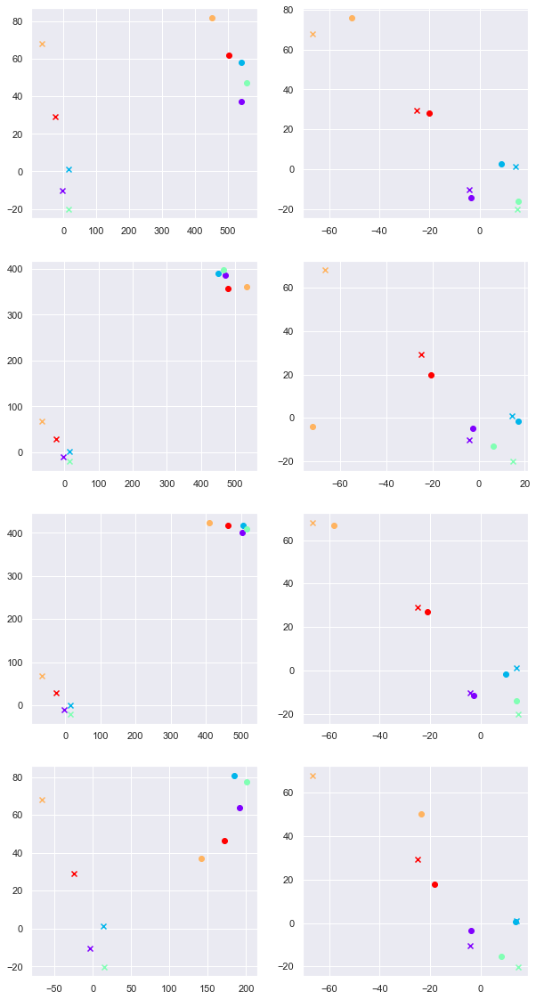

In [9]:
colors = cm.rainbow(np.linspace(0, 1, len(bodyparts)))
fig, axs = plt.subplots(len(idxs), 2, figsize=(10, len(idxs)*5))

ref = df_pps.iloc[2000]
for i, idx in enumerate(idxs):
    orig = df_all_sub.iloc[idx]
    imposed = df_pps.iloc[idx]
    for j, bodypart in enumerate(bodyparts):
        axs[i][0].scatter(orig[bodypart, 'x'], orig[bodypart, 'y'], c=[colors[j]])
        axs[i][0].scatter(ref[bodypart, 'x'], ref[bodypart, 'y'], marker='x', c=[colors[j]])
        axs[i][1].scatter(imposed[bodypart, 'x'], imposed[bodypart, 'y'], c=[colors[j]])
        axs[i][1].scatter(ref[bodypart, 'x'], ref[bodypart, 'y'], marker='x', c=[colors[j]])

plt.show()

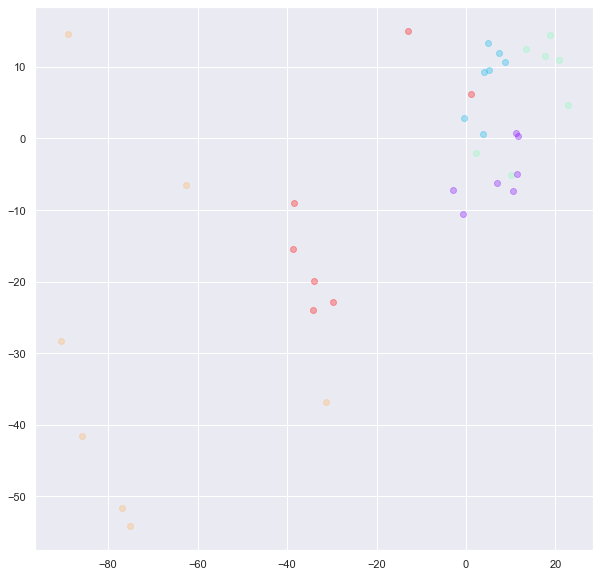

In [18]:
colors = cm.rainbow(np.linspace(0, 1, len(bodyparts)))
fig, axs = plt.subplots(1, 1, figsize=(10, 10))

for idx in range(len(df_pps.iloc[::1000])):
    orig = df_pps.iloc[idx]
    for j, bodypart in enumerate(bodyparts):
        axs.scatter(orig[bodypart, 'x'], orig[bodypart, 'y'], c=[colors[j]], alpha=0.3)

plt.show()

In [ ]:
""" PPS with SVD method"""


# Create ref and row matrices
row = df_all.iloc[idxs[0]].copy()
ref = df_all.iloc[idxs[1]].copy()

row_matrix = np.zeros((5, 2))
ref_matrix = np.zeros((5, 2))

for i, bodypart in enumerate(bodyparts):
    row_matrix[i] = row[bodypart][['x', 'y']]
    ref_matrix[i] = ref[bodypart][['x', 'y']]

u, s, vh = np.linalg.svd(row_matrix.T@ref_matrix)
rot_matrix = (vh@u.T)
rot_matrix

## Statistical Shape Model

In [131]:
# TODO: check mean pose and probably use it in the superimposition step

In [132]:
# df_all_sub.xs('x', level=1, axis=1)

In [133]:
parts_matrix = np.zeros((len(df_pps), len(bodyparts_body)*2))
for j, bodypart in enumerate(bodyparts_body):
    parts_matrix[:,j*2:j*2+2] = df_pps[bodypart][['x', 'y']]
parts_matrix.shape

(6897, 8)

In [134]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

parts_matrix_scaled = scaler.fit_transform(parts_matrix)
# scaler.inverse_transform(parts_matrix)

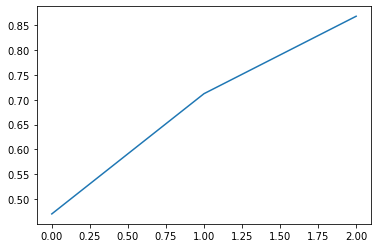

In [135]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(parts_matrix_scaled)

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.show()


In [136]:
pca_embeddings = pca.transform(parts_matrix_scaled)

In [137]:
orig = parts_matrix[200]
recon = scaler.inverse_transform(pca_embeddings[200] @ pca.components_)

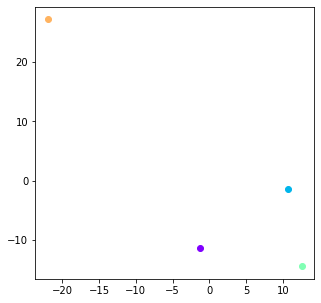

In [138]:
fig, axs = plt.subplots(1, 1, figsize=(5, 5), sharex=True, sharey=True)
for j, bodypart in enumerate(bodyparts_body):
    axs.scatter(recon[j*2], recon[j*2+1], c=[colors[j]])
# for i, idx in enumerate(idxs):
#     axs[i//2][i%2].scatter(df_all.iloc[idx].xs('x', level=1, axis=0), df_all.iloc[idx].xs('y', level=1, axis=0))
plt.show()

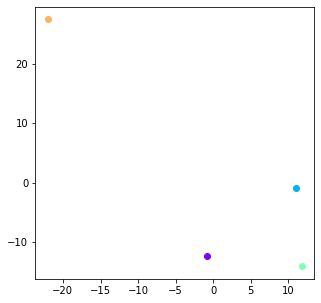

In [139]:
fig, axs = plt.subplots(1, 1, figsize=(5, 5), sharex=True, sharey=True)
for j, bodypart in enumerate(bodyparts_body):
    axs.scatter(parts_matrix[200,j*2], parts_matrix[200,j*2+1], c=[colors[j]])
# for i, idx in enumerate(idxs):
#     axs[i//2][i%2].scatter(df_all.iloc[idx].xs('x', level=1, axis=0), df_all.iloc[idx].xs('y', level=1, axis=0))
plt.show()

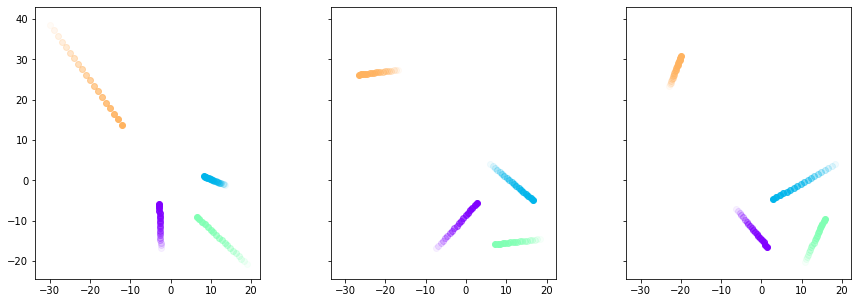

In [140]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)

v_min, v_max = -5, 5
for v in np.linspace(v_min, v_max, 20):
    recon_1 = scaler.inverse_transform(np.array([v, 0, 0]) @ pca.components_)
    recon_2 = scaler.inverse_transform(np.array([0, v, 0]) @ pca.components_)
    recon_3 = scaler.inverse_transform(np.array([0, 0, v]) @ pca.components_)

    for j, bodypart in enumerate(bodyparts_body):
        axs[0].scatter(recon_1[j*2], recon_1[j*2+1], c=[colors[j]], alpha=(v-v_min)/(v_max-v_min))
        axs[1].scatter(recon_2[j*2], recon_2[j*2+1], c=[colors[j]], alpha=(v-v_min)/(v_max-v_min))
        axs[2].scatter(recon_3[j*2], recon_3[j*2+1], c=[colors[j]], alpha=(v-v_min)/(v_max-v_min))
#         axs[0].scatter(recon_1[j*2], recon_1[j*2+1], c=[colors[j]], alpha=abs(v))
#         axs[1].scatter(recon_2[j*2], recon_2[j*2+1], c=[colors[j]], alpha=abs(v))
#         axs[2].scatter(recon_3[j*2], recon_3[j*2+1], c=[colors[j]], alpha=abs(v))
# for i, idx in enumerate(idxs):
#     axs[i//2][i%2].scatter(df_all.iloc[idx].xs('x', level=1, axis=0), df_all.iloc[idx].xs('y', level=1, axis=0))
for ax in axs:
#     ax.set(xlim=[-50, 50])
    ax.set_aspect('equal', adjustable='box')


plt.show()

In [141]:
# Video
import cv2

def get_plot(v):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
    
    recon_1 = scaler.inverse_transform(np.array([v, 0, 0]) @ pca.components_)
    recon_2 = scaler.inverse_transform(np.array([0, v, 0]) @ pca.components_)
    recon_3 = scaler.inverse_transform(np.array([0, 0, v]) @ pca.components_)

    for j, bodypart in enumerate(bodyparts_body):
        axs[0].scatter(recon_1[j*2], recon_1[j*2+1], c=[colors[j]], s=80)
        axs[1].scatter(recon_2[j*2], recon_2[j*2+1], c=[colors[j]], s=80)
        axs[2].scatter(recon_3[j*2], recon_3[j*2+1], c=[colors[j]], s=80)
    for ax in axs:
        ax.set_aspect('equal', adjustable='box')
        ax.set(xlim=[-35, 35], ylim=[-35, 35])
    fig.tight_layout()
    fig.canvas.draw()
    img = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
    plt.close()
    img  = img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    # img is rgb, convert to opencv's default bgr
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    return img

def write_video(output_path):
    fps = 30
    width, height, output, video = None, None, None, None

    t_start, t_end = 0, 2
    ts = np.linspace(t_start, t_end, 200*t_end)
    vs = np.sin(2*np.math.pi*ts*(6**(1/2)))
    for v in vs:
        img = get_plot(v)
        
        if width is None:
            width = img.shape[1]
            height = img.shape[0]
            video = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'XVID'), fps, (int(width), int(height)))

        video.write(img)

    video.release()
    cv2.destroyAllWindows()
    
write_video('test.avi')

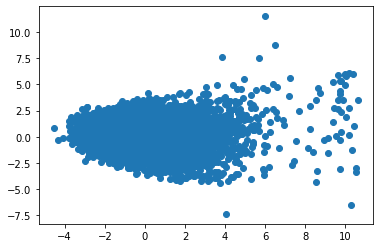

In [142]:
plt.scatter(pca_embeddings[:, 0], pca_embeddings[:,1])

## Posture and movement measures

In [25]:
df_pps

nose                        ear_right                       \
               x          y likelihood          x         y likelihood   
2239    9.200391  -6.530532    0.99682   3.802396  0.088274   0.988720   
2260    2.881722  -0.890375    0.98791  -1.588915  2.469474   0.999943   
2273   14.702855 -18.019197    1.00000  13.438845 -2.683680   1.000000   
2283   16.643991 -16.470697    1.00000  13.544947 -3.477400   1.000000   
2293   14.168401 -15.485852    1.00000  14.008400 -2.637896   1.000000   
...          ...        ...        ...        ...       ...        ...   
37954  11.738765 -14.457935    1.00000  12.112192  1.991446   1.000000   
37964  15.268130 -15.687564    1.00000   9.420215  1.851790   1.000000   
37974  15.175053 -12.251053    1.00000   7.775858  0.412638   1.000000   
37984  15.334465 -13.113396    1.00000   9.233213  1.243138   1.000000   
37994  13.810829 -13.664441    1.00000   9.240807  1.835272   1.000000   

       ear_left                       tail_start                        \
              x          y likelihood          x          y likelihood   
2239  -2.258537 -10.266506    0.99984 -10.744250  16.708764   0.999958   
2260   0.099094  -7.771758    0.99809  -1.391901   6.192660   1.000000   
2273  -2.299026  -9.074388    1.00000 -25.842674  29.777265   1.000000   
2283  -3.874450 -12.267220    1.00000 -26.314488  32.215317   1.000000   
2293  -3.021921 -12.110754    1.00000 -25.154880  30.234502   1.000000   
...         ...        ...        ...        ...        ...        ...   
37954 -3.733008 -13.120234    1.00000 -20.117948  25.586722   1.000000   
37964 -3.151712 -16.319665    1.00000 -21.536633  30.155439   1.000000   
37974 -3.823738 -16.456341    1.00000 -19.127173  28.294756   1.000000   
37984 -5.277154 -15.960569    1.00000 -19.290524  27.830827   1.000000   
37994 -4.266773 -14.352942    1.00000 -18.784863  26.182111   1.000000   

        tail_end                               T_x         T_y         R  
               x          y likelihood                                    
2239  -85.974702  27.534636   0.998286  154.741009  152.538395 -0.147062  
2260  -13.993495 -46.326865   0.997440  289.255356  216.232117  0.411038  
2273  -34.994972  52.371715   0.991795  329.773705  226.468689 -1.085631  
2283  -54.048773  78.030892   1.000000  367.631599  251.467525 -1.267243  
2293  -54.869540  78.123683   1.000000  407.150360  281.059044 -1.409337  
...          ...        ...        ...         ...         ...       ...  
37954 -61.707296  56.646824   1.000000  440.898224  408.993484 -2.983665  
37964 -60.388907  66.162618   1.000000  449.170425  428.044495 -2.517726  
37974 -53.287188  70.384504   1.000000  444.462448  419.201889 -2.727910  
37984 -39.539868  80.712313   1.000000  438.134216  407.046364 -3.094201  
37994 -43.262511  72.721755   1.000000  439.701866  395.321678 -3.089378  

[6927 rows x 18 columns]

In [28]:
# Load in all necessary data
df_pps
df_measures = calc_measures(df_pps)
df_measures_norm, _, _ = normalize_zscore(df_measures)

nose x    8.428462
y   -1.441416
Name: 2239, dtype: float64
tail_start x   -11.516179
y    21.797880
Name: 2239, dtype: float64
dot -128.48349626379786
magn 210.80347465679992
means post_elongation    55.822166
post_bend           2.806100
mov_locomotion     18.600809
mov_freeze        -22.920334
mov_rotation        0.509036
mov_elongation      0.003011
mov_bend            0.222424
dtype: float64
stds post_elongation     9.733982
post_bend           0.332213
mov_locomotion     18.283662
mov_freeze         28.741793
mov_rotation        1.163726
mov_elongation      8.439221
mov_bend            0.306376
dtype: float64
(7,)


In [29]:
df_measures_norm.columns

MultiIndex([(      'nose',               'x'),
            (      'nose',               'y'),
            (      'nose',      'likelihood'),
            ( 'ear_right',               'x'),
            ( 'ear_right',               'y'),
            ( 'ear_right',      'likelihood'),
            (  'ear_left',               'x'),
            (  'ear_left',               'y'),
            (  'ear_left',      'likelihood'),
            ('tail_start',               'x'),
            ('tail_start',               'y'),
            ('tail_start',      'likelihood'),
            (  'tail_end',               'x'),
            (  'tail_end',               'y'),
            (  'tail_end',      'likelihood'),
            (       'T_x',                ''),
            (       'T_y',                ''),
            (         'R',                ''),
            (  'measures', 'post_elongation'),
            (  'measures',       'post_bend'),
            (  'measures',  'mov_locomotion'),
            (

In [30]:
# df_measures_norm[df_measures_norm['led'] == True]

# # pd.diff(df_pps['led']) == True
# df.index[df_pps['led'] == True]
# df.index[pd.diff(df_pps['led']) == True]

In [133]:
window_size = 6

for i in 
df_measures_norm['measures'].iloc[i*window_size:i*window_size+window_size]

nose                        ear_right                        \
              x          y likelihood          x          y likelihood   
2239   3.563627 -10.704934    0.99682   3.119755  -2.175577   0.988720   
2260   1.972277  -2.281931    0.98791  -0.039196   2.936224   0.999943   
2273   0.323889 -23.254257    1.00000   8.862250 -10.453001   1.000000   
2283   3.033614 -23.218602    1.00000   8.560471 -11.057859   1.000000   
2293   1.602414 -20.928150    1.00000   9.400187 -10.715888   1.000000   
...         ...        ...        ...        ...        ...        ...   
37954  0.501807 -18.616623    1.00000  10.818528  -5.799180   1.000000   
37964  2.748796 -21.717725    1.00000   8.637008  -4.191858   1.000000   
37974  4.896547 -18.878410    1.00000   6.492751  -4.298654   1.000000   
37984  4.518984 -19.664327    1.00000   8.159895  -4.495968   1.000000   
37994  2.860110 -19.216548    1.00000   8.495953  -4.071797   1.000000   

        ear_left                       tail_start  ...         T_x  \
               x          y likelihood          x  ...               
2239   -7.888444  -6.947992    0.99984   1.205062  ...  154.741009   
2260   -4.033594  -6.643806    0.99809   2.100514  ...  289.255356   
2273   -7.439748  -5.681566    1.00000  -1.746391  ...  329.773705   
2283  -10.587236  -7.307973    1.00000  -1.006848  ...  367.631599   
2293   -9.847847  -7.669568    1.00000  -1.154753  ...  407.150360   
...          ...        ...        ...        ...  ...         ...   
37954 -10.952946  -8.130736    1.00000  -0.367389  ...  440.898224   
37964 -12.340469 -11.134521    1.00000   0.954665  ...  449.170425   
37974 -12.870940 -10.943995    1.00000   1.481642  ...  444.462448   
37984 -13.739523  -9.685743    1.00000   1.060645  ...  438.134216   
37994 -12.020487  -8.928616    1.00000   0.664425  ...  439.701866   

              T_y         R        measures                           \
                            post_elongation post_bend mov_locomotion   
2239   152.538395 -0.779222       -2.588640 -1.745512            NaN   
2260   216.232117 -0.147351       -4.884920 -4.859128       7.122824   
2273   226.468689 -1.756098        0.704246  0.777363       1.268380   
2283   251.467525 -1.927955        0.935558  0.164477       1.463939   
2293   281.059044 -2.073919        0.460516  0.602932       1.682875   
...           ...       ...             ...       ...            ...   
37954  408.993484  2.644498       -0.477874  0.885855      -0.528166   
37964  428.044495  3.119510        0.304813 -0.131059       0.118611   
37974  419.201889  2.917445       -0.278693 -1.200502      -0.469435   
37984  407.046364  2.551553       -0.226029 -0.857392      -0.267817   
37994  395.321678  2.550832       -0.446047 -0.228025      -0.370374   

                                                        
      mov_freeze mov_rotation mov_elongation  mov_bend  
2239         NaN          NaN            NaN       NaN  
2260   -2.950968     0.094516      -2.648937  2.650206  
2273   -3.098189     0.915805       6.446310  5.385835  
2283   -0.337420    -0.292231       0.266444 -0.061411  
2293    0.655798    -0.314001      -0.548281 -0.250552  
...          ...          ...            ...       ...  
37954  -0.196780    -0.037376      -0.592562 -0.641677  
37964   0.382664    -0.037360       0.902412  0.376689  
37974   0.470153    -0.266835      -0.673386  0.433647  
37984   0.185371    -0.129101       0.060387 -0.353937  
37994   0.475406    -0.436110      -0.254130 -0.043541  

[6927 rows x 25 columns]

In [31]:
# Specific video

# PPC
dlc = dlcs_dict[('01317', '01')]
dlc_pps = pps.partial_procrustes_superimposition(dlc.df, bodyparts_body, bodyparts, ref=ref)

0it [00:00, ?it/s]C:\Users\bramn\Documents\Projects\Analysis\data\partial_procrustes_superimposition.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.iloc[idx][bodypart, 'x'] = rotated[0]
C:\Users\bramn\Documents\Projects\Analysis\data\partial_procrustes_superimposition.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.iloc[idx][bodypart, 'y'] = rotated[1]
38000it [06:27, 98.16it/s] 


In [427]:
dlc_measures = calc_measures(dlc_pps)
# dlc_measures_norm, _, _ = normalize_zscore(dlc_measures)
dlc_measures_norm = normalize_quantiles(dlc_measures.iloc[3000:], n_intervals=1000)
# dlc_measures_norm = normalize_scaling(dlc_measures.iloc[3000:])

nose x    1.131125
y    3.141272
Name: 0, dtype: float64
tail_start x   -1.476017
y    3.662936
Name: 0, dtype: float64
dot 9.836720952431104
magn 13.18507328199317
post_elongation
post_bend
mov_locomotion
mov_freeze
mov_rotation
mov_elongation
mov_bend


In [389]:

# df['led'].iloc[df['led']]
# diff = df['led'].diff()
# print(df.index[df['led']==True])
# diff.iloc[0] = False
# df.index[diff]

In [382]:
# df['led'][df['led']==0]
df = dlcs_dict[exp_list[0]].df
df['led'] = (df['led'] == 'True ') # Change to boolean values

In [428]:
stim_trials = []
rand_trials = []
all_trials = []

FPS = 30 # ???
time_window = 3*FPS
diff = df['led'].diff()
for idx in np.flatnonzero(diff.iloc[3000:]==True)[::2]:
    stim_trials.append(dlc_measures_norm.iloc[idx:idx+time_window])
    rand_trials.append(dlc_measures_norm.iloc[idx+time_window:idx+time_window*2])
    
for idx in range(0, len(dlc_measures_norm)-time_window, 2):
    all_trials.append(dlc_measures_norm.iloc[idx:idx+time_window])

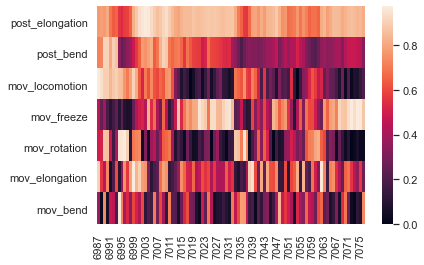

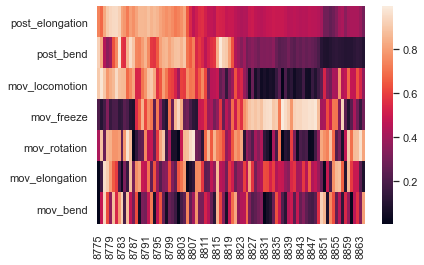

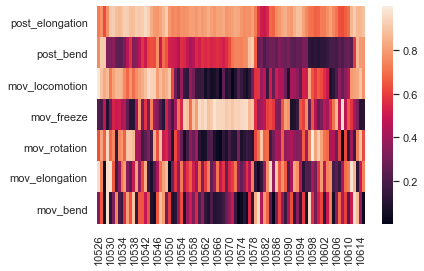

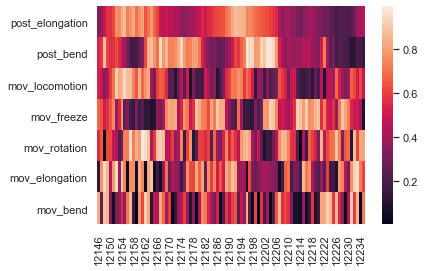

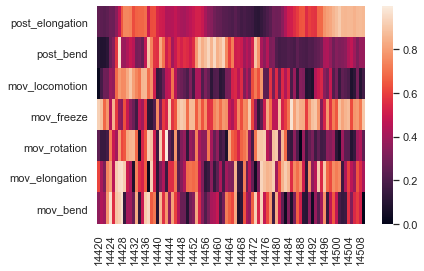

...

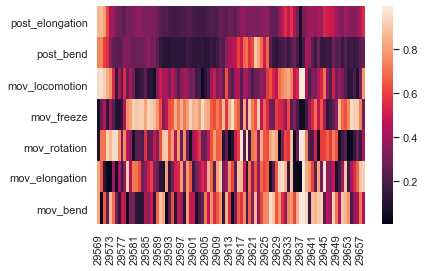

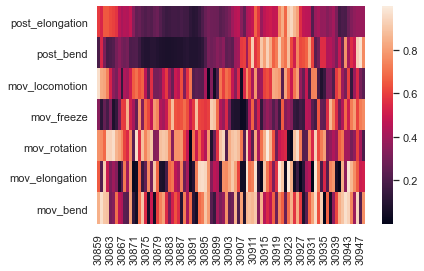

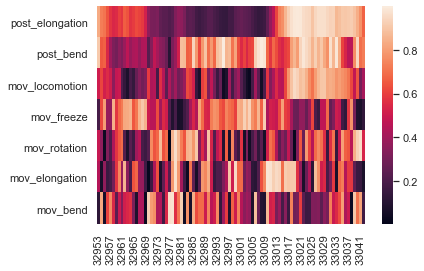

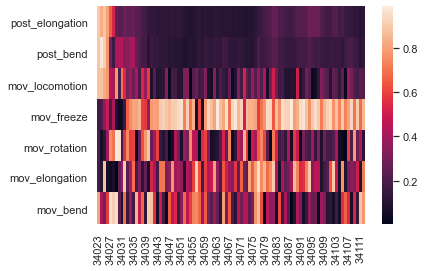

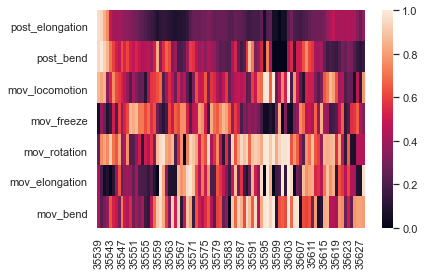

In [421]:
for i, stim_trial in enumerate(stim_trials):
    stim_trial_npy_flat = np.clip(stim_trial['measures'], -1, 1)
  
    sb.heatmap(stim_trial_npy_flat.T)
    plt.show()

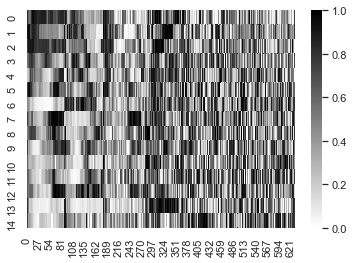

In [429]:
stim_heatmap = np.zeros(shape=(len(stim_trials), 7*time_window))
for i, stim_trial in enumerate(stim_trials):
    stim_trial_npy = stim_trial['measures'].to_numpy()
    stim_trial_npy_flat = stim_trial_npy.flatten('F')
    stim_trial_npy_flat = np.clip(stim_trial_npy_flat, -1, 1)
    stim_heatmap[i] = stim_trial_npy_flat
sb.heatmap(stim_heatmap, cmap='binary') # cmap='vlag'
plt.show()

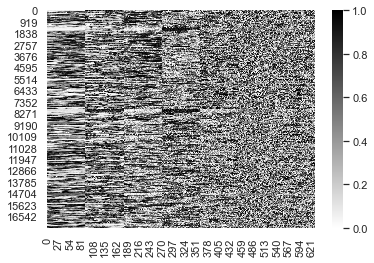

In [430]:
rand_heatmap = np.zeros(shape=(len(all_trials), 7*time_window))
for i, rand_trial in enumerate(all_trials):
    rand_trial_npy = rand_trial['measures'].to_numpy()
    rand_trial_npy_flat = rand_trial_npy.flatten('F')
    rand_trial_npy_flat = np.clip(rand_trial_npy_flat, -1, 1)
    rand_heatmap[i] = rand_trial_npy_flat
sb.heatmap(rand_heatmap, cmap='binary') # cmap='vlag'
plt.show()

In [431]:
import umap
reducer_umap = umap.UMAP() # set low_memory=True
# embeddings_umap = reducer_umap.fit_transform(np.vstack([stim_heatmap, rand_heatmap]))
embeddings_umap = reducer_umap.fit_transform(rand_heatmap)

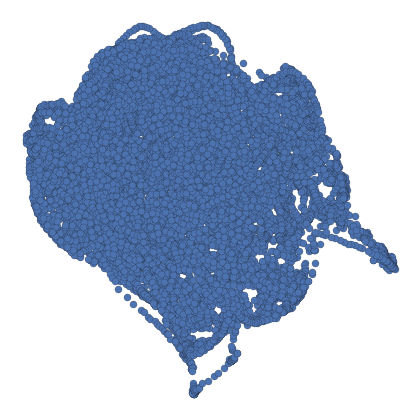

In [432]:
fig, axs = plt.subplots(1, 1, figsize=(6, 6), sharex=True, sharey=True)

axs.scatter(embeddings_umap[::1,0], embeddings_umap[::1,1], alpha=1, linewidth=0.2, edgecolors='k', s=50)

axs.set_axis_off()
axs.set(xticks=[], yticks=[])
fig.tight_layout()
plt.show()

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


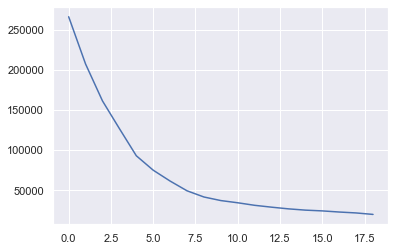

In [240]:
import sklearn.cluster
# Clustering
ssqs = []
for k in range(1, 20):
    print(k)
    kmeans = sklearn.cluster.KMeans(n_clusters=k, init='k-means++', max_iter=100)
    kmeans.fit(dlc_measures_norm['measures'].dropna())
    ssqs.append(kmeans.inertia_)
    
plt.plot(ssqs)

In [233]:
kmeans = sklearn.cluster.KMeans(n_clusters=7, init='k-means++', max_iter=1000)
kmeans.fit(dlc_measures_norm['measures'].dropna())

KMeans(max_iter=1000, n_clusters=7)

# Measures check

In [429]:
import analysis_storchi
from importlib import reload  
reload(analysis_storchi.measures)
reload(analysis_storchi.partial_procrustes_superimposition)

<module 'analysis_storchi.partial_procrustes_superimposition' from 'C:\\Users\\bramn\\Documents\\Projects\\Analysis\\analysis_storchi\\partial_procrustes_superimposition.py'>

In [380]:
ref_dlcs = dlcs_dict[('01317', '01')].df.loc[:4000+20000]
ref_dlcs

nose                          ear_right              \
                x           y likelihood           x           y   
0        1.671333    5.110191        0.0    2.033155    2.558347   
1        1.544885    4.924131        0.0    2.116442    2.376463   
2        1.723642    5.135690        0.0    2.061525    2.707122   
3        1.699122    5.214425        0.0    1.986727    2.540779   
4        1.569051    5.413127        0.0    2.039116    2.341310   
...           ...         ...        ...         ...         ...   
23996  316.561096  179.442596        1.0  299.982361  188.130844   
23997  320.412750  177.829529        1.0  302.875549  186.591614   
23998  323.274933  177.275772        1.0  306.321747  185.960159   
23999  324.722198  177.292816        1.0  309.306549  185.638474   
24000  328.261932  175.993454        1.0  312.292542  184.913864   

                       ear_left                            tail_start  \
         likelihood           x           y    likelihood           x   
0      2.980232e-07   -0.952740    1.379490  1.192093e-07   -0.935810   
1      2.086163e-07   -0.969443    1.474319  5.960464e-08   -0.685122   
2      2.384186e-07   -1.273321    1.234391  1.490116e-07   -0.826389   
3      2.086163e-07   -1.198179    1.263550  1.192093e-07   -0.969284   
4      1.490116e-07   -1.421175    1.220115  5.960464e-08   -1.055678   
...             ...         ...         ...           ...         ...   
23996  1.000000e+00  298.494324  168.612320  1.000000e+00  255.399765   
23997  1.000000e+00  302.480042  167.592010  1.000000e+00  256.890594   
23998  1.000000e+00  305.361511  166.416992  1.000000e+00  259.131256   
23999  1.000000e+00  307.547913  166.049194  1.000000e+00  264.371765   
24000  1.000000e+00  309.938446  166.487823  1.000000e+00  268.426605   

                                   tail_end                            
                y    likelihood           x           y    likelihood  
0        5.631855  6.854534e-07    0.945606    3.082395  5.960464e-08  
1        5.627812  4.768372e-07    0.808258    3.331842  0.000000e+00  
2        5.369404  6.854534e-07    0.713270    3.066694  8.940697e-08  
3        5.453102  6.854534e-07    0.672707    3.114617  5.960464e-08  
4        5.697149  4.470348e-07    0.512707    2.738980  8.940697e-08  
...           ...           ...         ...         ...           ...  
23996  190.875275  1.000000e+00  209.121490  221.122253  1.000000e+00  
23997  188.086914  1.000000e+00  208.845428  211.873672  1.000000e+00  
23998  186.747940  1.000000e+00  210.027008  208.913116  1.000000e+00  
23999  187.684814  1.000000e+00  213.182037  206.604446  1.000000e+00  
24000  190.360535  1.000000e+00  223.996811  218.479370  7.534810e-01  

[24001 rows x 15 columns]

In [381]:
preprocessed_refs = preprocess(ref_dlcs)

(24001, 8)
nose x   -1.308469
y    3.071635
Name: 0, dtype: float64
tail_start x   -3.573993
y    1.679972
Name: 0, dtype: float64
dot 9.836720952431104
magn 13.18507328199317
nose x   -1.308469
y    3.071635
Name: 0, dtype: float64
tail_start x   -3.573993
y    1.679972
Name: 0, dtype: float64


In [382]:
preprocessed_refs

nose                      ear_right                          \
               x         y likelihood         x         y    likelihood   
0      -0.087854  1.883733        0.0  1.913623  0.259875  2.980232e-07   
1      -0.306203  1.657110        0.0  1.985339  0.405662  2.086163e-07   
2      -0.036325  2.004320        0.0  1.827395  0.411006  2.384186e-07   
3      -0.047158  2.070655        0.0  1.920118  0.237371  2.086163e-07   
4      -0.283153  2.149400        0.0  2.185395  0.261732  1.490116e-07   
...          ...       ...        ...       ...       ...           ...   
23996  23.933696  2.501469        1.0  5.955125  7.708301  1.000000e+00   
23997  24.764485  2.001190        1.0  6.002717  7.686576  1.000000e+00   
23998  24.731835  2.086794        1.0  6.624856  8.000032  1.000000e+00   
23999  23.177869  2.483130        1.0  6.478424  7.814245  1.000000e+00   
24000  23.645919  2.549347        1.0  5.953050  7.192360  1.000000e+00   

       ear_left                          tail_start  ...    measures  \
              x          y    likelihood          x  ... post_bend_D   
0      0.527608  -2.635679  1.192093e-07  -2.353377  ...    0.728686   
1      0.627195  -2.508441  5.960464e-08  -2.306331  ...    0.640955   
2      0.308606  -2.903117  1.490116e-07  -2.099676  ...    0.742468   
3      0.347955  -2.812751  1.192093e-07  -2.220915  ...    0.741913   
4      0.469243  -2.945372  5.960464e-08  -2.371484  ...    0.669195   
...         ...        ...           ...        ...  ...         ...   
23996  8.390196 -11.714816  1.000000e+00 -38.279017  ...    2.802000   
23997  8.810689 -11.108547  1.000000e+00 -39.577891  ...    2.864347   
23998  8.746739 -11.451318  1.000000e+00 -40.103429  ...    2.856987   
23999  8.395955 -11.760120  1.000000e+00 -38.052248  ...    2.790335   
24000  8.282082 -11.236865  1.000000e+00 -37.881051  ...    2.793739   

                                                                            \
      mov_locomotion mov_freeze mov_rotation mov_rotation_D mov_elongation   
0                NaN        NaN          NaN            NaN            NaN   
1           0.084124  -0.552001     0.101914       0.101914      -0.320423   
2           0.081072  -0.788891     0.125031      -0.125031       0.222321   
3           0.042242  -0.263526     0.011736      -0.011736       0.118340   
4           0.108904  -0.599033     0.052633       0.052633      -0.039007   
...              ...        ...          ...            ...            ...   
23996       3.518507  -2.683665     0.073086      -0.073086      -0.982392   
23997       3.516190  -5.581870     0.031693      -0.031693       2.124301   
23998       3.003547  -1.932032     0.011364      -0.011364       0.494294   
23999       2.965482  -5.679163     0.029434       0.029434      -3.600669   
24000       3.254212  -8.177504     0.065596       0.065596       0.297382   

                                                                               
       mov_bend mov_bend_D mov_locomotion_side_angle mov_locomotion_side_dist  
0           NaN        NaN                       NaN                      NaN  
1      0.087732  -0.087732                 -0.770346                -0.058583  
2      0.101513   0.101513                 -2.971665                -0.013710  
3      0.000556  -0.000556                  3.083003                 0.002474  
4      0.072717  -0.072717                  2.754199                 0.041142  
...         ...        ...                       ...                      ...  
23996  0.098237   0.098237                 -0.151217                -0.530034  
23997  0.062347   0.062347                 -0.332952                -1.149211  
23998  0.007361  -0.007361                 -0.152893                -0.457433  
23999  0.066652  -0.066652                  0.168906                 0.498510  
24000  0.003404   0.003404                  0.254387                 0.818929  

[24001 rows x 33 columns]

In [246]:
# orient_vectors = preprocessed_refs['nose'][['x', 'y']] - preprocessed_refs['tail_start'][['x', 'y']]
# # Multiply orient_vectors by rotation matrix!!!
# angles = -preprocessed_refs['R']
# rot_matrix = np.array([[np.cos(angles), -np.sin(angles)], [np.sin(angles), np.cos(angles)]])
# # print(orient_vectors)
# orient_vectors_R = orient_vectors.copy().reset_index()

# def rotate(row):
#     row[['x', 'y']] = row[['x', 'y']] @ rot_matrix[:,:,row.name].T
#     return row

# print(orient_vectors_R)
# orient_vectors_R = orient_vectors_R.apply(rotate, axis=1)
# print(orient_vectors_R)

# # Shift all values up, because we want the orientation at the previous frame
# orient_vectors_R = pd.concat([pd.DataFrame({'x': [np.nan], 'y': [np.nan]}), orient_vectors_R.iloc[:-1]], ignore_index=True)
# transl_vectors = preprocessed_refs[['T_x', 'T_y']].diff().reset_index()
# dot = orient_vectors_R['x']*transl_vectors['T_x'] + orient_vectors_R['y']*transl_vectors['T_y']
# det = orient_vectors_R['x'] * transl_vectors['T_y'] - orient_vectors_R['y'] * transl_vectors['T_x']
# angle = np.arctan2(det, dot)
# # print(angle)
# angle

       index          x         y
0       4000  52.167670 -1.994758
1       4001  53.920760 -2.340767
2       4002  52.127259 -2.289295
3       4003  57.339116 -1.978037
4       4004  57.444911 -1.364931
...      ...        ...       ...
19996  23996  62.212713  0.996423
19997  23997  64.342376  0.580409
19998  23998  64.835264  0.722301
19999  23999  61.230117  1.020385
20000  24000  61.526970  1.054189

[20001 rows x 3 columns]
         index          x          y
0       4000.0 -26.077606  45.226135
1       4001.0 -26.329132  47.113739
2       4002.0 -25.367004  45.596130
3       4003.0 -27.693298  50.247070
4       4004.0 -24.888550  51.791321
...        ...        ...        ...
19996  23996.0  61.161331 -11.432678
19997  23997.0  63.522156 -10.257385
19998  23998.0  64.143677  -9.472168
19999  23999.0  60.350433 -10.391998
20000  24000.0  59.835327 -14.367081

[20001 rows x 3 columns]


0             NaN
1       -0.204755
2       -0.202428
3       -0.186630
4       -0.350343
           ...   
19996   -0.151217
19997   -0.332952
19998   -0.152893
19999    0.168906
20000    0.254387
Length: 20001, dtype: float64

In [260]:
np.argmin(np.sin(angle))
# np.sin(-1.5)

10842

In [357]:
orient_vectors = preprocessed_refs['nose'][['x', 'y']] - preprocessed_refs['tail_start'][['x', 'y']]
angles = -preprocessed_refs['R']
rot_matrix = np.array([[np.cos(angles), -np.sin(angles)], [np.sin(angles), np.cos(angles)]])
orient_vectors_R = orient_vectors.copy().reset_index()

def rotate(row):
    row[['x', 'y']] = row[['x', 'y']] @ rot_matrix[:,:,row.name].T
    return row

orient_vectors_R = orient_vectors_R.apply(rotate, axis=1)

# Shift all values up, because we want the orientation at the previous frame
# print(orient_vectors_R)
orient_vectors_R = orient_vectors_R.set_index('index')
orient_vectors_R = pd.concat([pd.DataFrame({'x': [np.nan], 'y': [np.nan]}), orient_vectors_R.iloc[:-1]], ignore_index=True)
transl_vectors = preprocessed_refs[['T_x', 'T_y']].diff().reset_index(drop=True)
transl_vectors = transl_vectors.droplevel(level=1, axis=1)

dot = orient_vectors_R['x']*transl_vectors['T_x'] + orient_vectors_R['y']*transl_vectors['T_y']
det = orient_vectors_R['x'] * transl_vectors['T_y'] - orient_vectors_R['y'] * transl_vectors['T_x']
angle = np.arctan2(det, dot)

transl_vectors = transl_vectors.rename(columns={"T_x": "x", "T_y": "y"})



In [358]:
orth_proj = orient_vectors_R.multiply(np.sum(orient_vectors_R.multiply(transl_vectors), axis=1)/np.sum(orient_vectors_R.multiply(orient_vectors_R), axis=1), axis=0)
lateral_distance = np.linalg.norm(transl_vectors - orth_proj, axis=1)

In [363]:
lateral_distance = lateral_distance*np.sign(angle)

In [367]:
np.nanargmax(lateral_distance)

5061

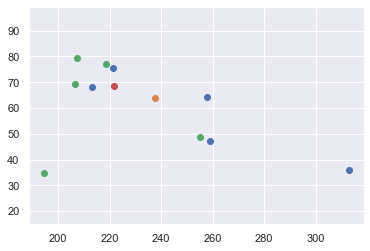

In [368]:
i1, i2 = 5060, 5061
ref_dlc
plt.scatter(ref_dlcs.iloc[i1].xs('x', level=1, axis=0), ref_dlcs.iloc[i1].xs('y', level=1, axis=0))
plt.scatter(preprocessed_refs.iloc[i1]['T_x'], preprocessed_refs.iloc[i1]['T_y'])

plt.scatter(ref_dlcs.iloc[i2].xs('x', level=1, axis=0), ref_dlcs.iloc[i2].xs('y', level=1, axis=0))
plt.scatter(preprocessed_refs.iloc[i2]['T_x'], preprocessed_refs.iloc[i2]['T_y'])

# plt.scatter(preprocessed_refs.iloc[2].xs('x', level=1, axis=0), preprocessed_refs.iloc[2].xs('y', level=1, axis=0))

plt.axis('equal')

plt.show()

In [199]:
preprocessed_refs

nose                       ear_right                        \
              x         y likelihood          x          y likelihood   
4000  15.736524 -2.755956   1.000000  12.816205  11.429357        1.0   
4001  16.142615 -2.996484   0.999672  12.872193  10.483015        1.0   
4002  15.314997 -2.647522   0.999915  12.309446  10.329036        1.0   
4003  18.917470 -2.323331   0.999489  10.912561  10.017608        1.0   
4004  18.144909 -1.197911   0.997653  11.570742   8.667173        1.0   
4005  19.707201 -2.441476   0.999984  10.665957  10.913494        1.0   
4006  21.811737 -0.540609   1.000000   9.880551  10.748164        1.0   
4007  19.939198 -0.764978   1.000000   9.836136  11.676135        1.0   
4008  21.526980 -1.142109   1.000000  11.157927  12.519282        1.0   
4009  22.525923 -0.233133   1.000000  10.201678  11.909658        1.0   
4010  21.007903  0.412352   1.000000   9.742363  10.352565        1.0   

       ear_left                       tail_start  ...  measures              \
              x          y likelihood          x  ... post_bend post_bend_D   
4000   7.878417  -7.912203        1.0 -36.431146  ...  2.390470   -2.390470   
4001   8.763336  -6.830814        1.0 -37.778145  ...  2.354625   -2.354625   
4002   9.187819  -7.323287        1.0 -36.812262  ...  2.364768   -2.364768   
4003   8.591615  -7.348983        1.0 -38.421646  ...  2.727035   -2.727035   
4004   9.584351  -7.636281        1.0 -39.300002  ...  2.911947   -2.911947   
4005   9.958792  -8.436420        1.0 -40.331950  ...  2.743103   -2.743103   
4006   9.904280 -10.776955        1.0 -41.596567  ...  3.108811   -3.108811   
4007  10.530185 -11.633517        1.0 -40.305519  ...  3.075056   -3.075056   
4008   9.062439 -11.442417        1.0 -41.747345  ...  2.986319   -2.986319   
4009   9.229694 -12.138055        1.0 -41.957296  ...  3.139735    3.139735   
4010   8.884640 -11.419276        1.0 -39.634906  ...  3.036640    3.036640   

                                                                           \
     mov_locomotion mov_freeze mov_rotation mov_rotation_D mov_elongation   
4000            NaN        NaN          NaN            NaN            NaN   
4001       4.966209  -4.853720     0.008268       0.008268       1.765751   
4002       3.341975  -6.332336     0.001402       0.001402      -1.794039   
4003       5.237524  -6.249379     0.013384       0.013384       5.195719   
4004       4.840616  -5.393085     0.066477       0.066477       0.087900   
4005       5.097287  -4.595762     0.039636       0.039636       2.626212   
4006       6.816653  -5.441041     0.011538      -0.011538       3.330683   
4007       4.947045  -4.391671     0.045395       0.045395      -3.154945   
4008       5.942312  -5.105084     0.000933       0.000933       3.022768   
4009       4.430604  -8.432830     0.025029      -0.025029       1.201118   
4010       2.655823  -8.440666     0.131440      -0.131440      -3.843669   

                                                     
      mov_bend mov_bend_D mov_locomotion_side_angle  
4000       NaN        NaN                       NaN  
4001  0.035845  -0.035845                       NaN  
4002  0.010143   0.010143                       NaN  
4003  0.362268   0.362268                       NaN  
4004  0.184912   0.184912                       NaN  
4005  0.168844  -0.168844                       NaN  
4006  0.365708   0.365708                       NaN  
4007  0.033755  -0.033755                       NaN  
4008  0.088737  -0.088737                       NaN  
4009  0.153417   0.153417                       NaN  
4010  0.103095  -0.103095                       NaN  

[11 rows x 32 columns]